# Training locality sensitive model for regression on AChEi dataset
Things to check with Dr Gearhart:
- Original dataset (SMILES or other form of unique identifier besides Mol_ID) : Check supplementary material Table I of Ruark's paper

- source identifier
- how to calculate temperature normalized logKi (Temperature is missing in null values)

Possible comparisons:
Orthogonal projection to latent structures regression, bootstrap leave random-many-out cross-validation and y-randomization were used to develop an externally validated consensus QSAR model.

ways to identify activity cliffs (Guha & Van Drie 2008),

In [1]:
import os, sys
import pandas as pd
import numpy as np

df=pd.read_csv(os.path.join("..",
                            "..",
                            "rawdata",
                            "OP_data_final_AKD.csv"
                           ),
               index_col=0
              )

#Rearranging 
columns=df.columns.values
columns[-1]="logki"
df.columns=columns
columns=columns[1:-1]
columns=np.insert(columns, 0, "logki")
df=df[columns]

feat_id=2

In [2]:
df.head()

,logki,MOL_ID,MW,AMW,Sv,Se,Sp,Ss,Mv,Me,...,Hypnotic-50,Neoplastic-80,Neoplastic-50,Infective-80,Infective-50,BLTF96,BLTD48,BLTA96,ALOGPS_logP,ALOGPS_logS
Row Id,,,,,,,,,,,,,,,,,,,,,
0,2.34,C13H13SPO,248.30,8.56,19.67,28.56,22.11,34.97,0.68,0.98,...,1,1,0,1,1,-4.44,-4.73,-4.82,2.51,-3.59
1,2.69,C14H15OPS,262.33,8.20,21.26,31.45,23.88,36.47,0.66,0.98,...,0,1,1,1,1,-4.66,-4.98,-5.08,3.03,-4.12
2,3.08,C15H17OPS,276.36,7.90,22.86,34.33,25.64,37.97,0.65,0.98,...,0,1,0,1,0,-4.88,-5.22,-5.34,3.28,-4.67
3,3.40,C16H19OPS,290.39,7.64,24.46,37.21,27.40,39.47,0.64,0.98,...,0,1,0,1,0,-5.09,-5.46,-5.59,3.83,-4.96
4,3.66,C17H21OPS,304.42,7.42,26.06,40.10,29.16,40.97,0.64,0.98,...,0,0,0,1,0,-5.30,-5.69,-5.83,4.36,-5.26


## Data Processing

No nulls in log_ki. Need to find out how to calculate temperature-normalized log_ki to fill in missing info.

### Check for null values

In [3]:
np.unique(df['logki'].isnull(), return_counts=True)

(array([False]), array([278], dtype=int64))

No missing target values

In [4]:
#Remove error rows 
mol_id=df['MOL_ID']
np.where([i[-5:]=="Error" for i in mol_id])

(array([], dtype=int64),)

In [5]:
#Replace 999 and -999 (eDragon errors) with np.nan
df=df.replace(to_replace=999, value=np.nan)

In [6]:
# Remove error columns
n_na = np.sum(df.iloc[:, feat_id:].isnull(), axis=0)
drop_col = df.columns[np.where(n_na > 0)[0]+feat_id]
df = df.drop(columns=drop_col)
print(f"{len(drop_col)} out of {len(n_na)} features dropped")
print(drop_col)

20 out of 1666 features dropped
Index(['CENT', 'U-045', 'U-080', 'U-105', 'U-113', 'U-114', 'qpmax', 'qnmax',
       'Qpos', 'Qneg', 'Qtot', 'Qmean', 'Q2', 'RPCG', 'RNCG', 'SPP', 'TE1',
       'TE2', 'PCWTe', 'LDI'],
      dtype='object')


In [7]:
all_features = df.iloc[:, feat_id:]
all_target = df['logki']

### Check for repeated rows

In [8]:
repeats=[]
for i in range(df.shape[0]):
    for j in range(i+1, df.shape[0]):
        if np.all(df.iloc[i,feat_id:]==df.iloc[j,feat_id:]):
            repeats.append((i,j))
            

In [9]:
len(repeats)

0

In [15]:
selected_feat_ind=pd.read_csv("AChEi_278cmpds_selected_feat_ind.csv").values.ravel()

In [18]:
data={'all_features': all_features, 
      'all_target': all_target, 
      'selected_features': all_features.iloc[:, selected_feat_ind]
     }
import dill as pickle
with open("AChEi_278cmpds_processed.csv", 'wb') as f:
    pickle.dump(data, f)

# Compute cross-validated RF and XGBoost
Ruack paper: 20\% randomly selected as external test set

In [80]:
# Is there a way to introduce different types of agonism into the dataset?

In [9]:
features=df.iloc[:,feat_id:]

In [11]:
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
kf=KFold(n_splits=5, random_state=1234, shuffle=True)
rf_scores=[]
for train_ind, test_ind in kf.split(features):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]

    clf=RandomForestRegressor(n_estimators=499)
    clf.fit(train_features, train_target)
    rf_scores.append(clf.score(test_features, test_target))
    del clf

print(f"{np.mean(rf_scores):.2f} accuracy with a standard deviation of {np.std(rf_scores):.2f}")

0.72 accuracy with a standard deviation of 0.03


In [12]:
import xgboost as xgb
from sklearn.model_selection import KFold
kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgb_scores=[]
for train_ind, test_ind in kf.split(features):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]

    xgb_model=xgb.XGBRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgb_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgb_scores):.2f} accuracy with a standard deviation of {np.std(xgb_scores):.2f}")

0.70 accuracy with a standard deviation of 0.06


In [44]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgbrf_scores=[]
for train_ind, test_ind in rkf.split(list(range(df.shape[0]))):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]

    xgb_model=xgb.XGBRFRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgbrf_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgbrf_scores):.3f} accuracy with a standard deviation of {np.std(xgbrf_scores):.2f}")

0.735 accuracy with a standard deviation of 0.07


In [43]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgbrf_feat_select_scores = []
for train_ind, test_ind in rkf.split(list(range(df.shape[0]))):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target[train_ind]
    test_target = all_target[test_ind]

    xgb_model = xgb.XGBRFRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgbrf_feat_select_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgbrf_feat_select_scores):.3f} accuracy with a standard deviation of {np.std(xgbrf_feat_select_scores):.2f}")

0.771 accuracy with a standard deviation of 0.07


Repeat xgbrfregressor with selected features - better performance

In [14]:
rf_scores

[0.7211504836442767,
 0.7022476761023837,
 0.716747266726296,
 0.6967238465165189,
 0.7720347506924832]

In [15]:
xgb_scores

[0.6198944718523687,
 0.6791296931643499,
 0.7153774440132226,
 0.7051676869940691,
 0.8007690625667393]

In [21]:
xgbrf_scores

[0.7259370951881927,
 0.6921521410229325,
 0.6676091834254606,
 0.7089485224637393,
 0.7793128957367697]

Fewer datapoints, lower cross-validated accuracy on this dataset

In [24]:
features=df.iloc[:,feat_id:]
targets=df['logki']

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
features_scaled=scaler.fit_transform(features)

In [26]:
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import LeaveOneOut
xgb_model=xgb.XGBRFRegressor(n_jobs=-1)
predictions=cross_val_predict(xgb_model, 
                              features_scaled,
                              targets,
                              cv=LeaveOneOut()
                             )
r2_score(targets, predictions)

0.7678597532882123

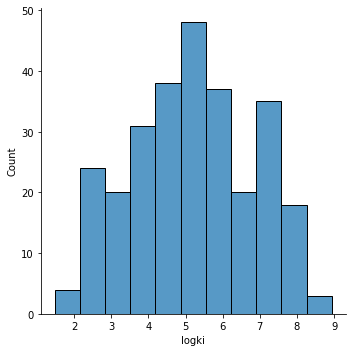

In [27]:
#Plot the distribution of the features
import seaborn as sns
sns.displot(targets)


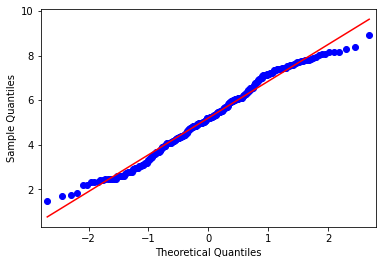

In [29]:
#Normality test: QQ-plot
from statsmodels.graphics.gofplots import qqplot
plot=qqplot(targets, line='s')

In [30]:
#Normality tests
#Shapiro: How likely data comes from a Gaussian distribution
from scipy.stats import shapiro
stat_s,p_s=shapiro(targets)
#D'Agostino's K^s test: Does kurtosis and skewness depart from normal distribution
from scipy.stats import normaltest
stat_da,p_da=normaltest(targets)
#Anderson-Darling test: Does data sample come from normal distribution?
from scipy.stats import anderson
result = anderson(targets)


In [31]:
stat_s, p_s #Reject H0, data does not look Gaussian

(0.9816412925720215, 0.0012144932989031076)

In [32]:
stat_da, p_da #Reject H0, data does not look Gaussian

(21.5281241503522, 2.1145951797279346e-05)

In [35]:
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

15.000: 0.568, data does not look normal (reject H0)
10.000: 0.647, data does not look normal (reject H0)
5.000: 0.776, data does not look normal (reject H0)
2.500: 0.905, data does not look normal (reject H0)
1.000: 1.077, data does not look normal (reject H0)


Consider scaling features to Gaussian for training the deep learner or maybe even xgboost.
Other feature scaling methods: QuantileTransform (scale to uniform distribution); 

#  Train attention model

## feature selection and scaling

In [106]:
from sklearn.model_selection import KFold
kf=KFold(n_splits=5, random_state=123, shuffle=True)
for train_ind, test_ind in kf.split(features):
    break

train_features=df.iloc[train_ind,feat_i:].values
test_features=df.iloc[test_ind,7:].values
train_target=df['logki'].iloc[train_ind].values
test_target=df['logki'].iloc[test_ind].values


In [107]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

clf=ExtraTreesRegressor(n_estimators=499)
clf.fit(train_features, train_target)
model=SelectFromModel(clf, prefit=True)
train_features=model.transform(train_features)
test_features=model.transform(test_features)

print(train_features.shape)

(222, 299)


In [119]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
feature_scaler=StandardScaler()
feature_scaler.fit(train_features)
train_features_scaled=feature_scaler.transform(train_features)
test_features_scaled=feature_scaler.transform(test_features)

target_scaler=MinMaxScaler()
target_scaler.fit(np.expand_dims(train_target, axis=1))
train_target_scaled=target_scaler.transform(np.expand_dims(train_target, axis=1)).flatten()
test_target_scaled=target_scaler.transform(np.expand_dims(test_target, axis=1)).flatten()

In [127]:
n_batch=8
n_buffer=100

train_ds=tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                             train_target_scaled
                                            ))
test_ds=tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                            test_target_scaled
                                           ))
train_ds=train_ds.shuffle(n_buffer).batch(n_batch)
test_ds=test_ds.shuffle(n_buffer).batch(n_batch)

## Setup and train model

In [128]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [203]:
import time

def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                        ):
    save_folder="_".join([time.strftime("%y%m%d",time.localtime()), 
                         model_name,
                         dataset_name,
                         "split{:02d}".format(split_number)
                         ])
    if super_folder is not None:
        save_folder=os.path.join(super_folder,
                             save_folder
                            )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path=os.path.join(save_folder, 
                                 "model_checkpoint")
    csv_filename=os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)
    
    cp_callback=tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                               monitor='val_root_mean_squared_error', 
                                               mode='min', 
                                               save_best_only=True,
                                               save_weights_only=True,
                                               verbose=1
                                              )
    csvlogger_callback=tf.keras.callbacks.CSVLogger(filename=csv_filename, 
                                                append=True
                                               )
    return [cp_callback, csvlogger_callback], checkpoint_path

callbacks, checkpoint_path=setup_callback_paths("val_root_mean_square_error",
                               mode="min",
                               model_name="LS",
                               dataset_name="AChEi",
                               split_number=0,
                               super_folder="Preliminary_Models"
                              )

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210310_LS_AChEi_split00'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210310_LS_AChEi_split00\\model_checkpoint'


In [156]:
from tensorflow.keras.layers import Input, Dense, Dropout
from algorithms import attention_model

def get_attention_model(n_attention,
                    n_attention_hidden,
                    n_feat,
                    n_concat_hidden,
                    concat_activation,
                    kernel_initializer,
                    attention_hidden_activation, 
                    attention_output_activation, 
                        n_hidden,
                    hidden_activation, 
                    kernel_regularizer,
                    bias_regularizer
                   ):
    input_shape=(n_feat,)
    input_layer=Input(shape=input_shape)
    attentions_layer=attention_model.ConcatAttentions(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation, 
        kernel_initializer=kernel_initializer,
        kernel_regularizer=kernel_regularizer,
        bias_regularizer=bias_regularizer,
        attention_initializer=kernel_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable":False, "renorm":True},
    )(input_layer)
    #Removed dropout for attentions_layer because of Batch normalization
    dense_layer1=Dense(n_hidden, 
                       activation=hidden_activation, 
                       kernel_initializer=kernel_initializer,
                       kernel_regularizer=kernel_regularizer,
                       bias_regularizer=bias_regularizer,
                      )(attentions_layer)
    # dropout1=Dropout(0.1)(dense_layer1)
    dense_layer2=Dense(n_hidden,
                       activation=hidden_activation,
                       kernel_initializer=kernel_initializer,
                       kernel_regularizer=kernel_regularizer,
                       bias_regularizer=bias_regularizer
                      )(dense_layer1)
    # dropout2=Dropout(0.1)(dense_layer2)
    dense_layer3=Dense(n_hidden,
                       activation=hidden_activation,
                       kernel_initializer=kernel_initializer,
                       kernel_regularizer=kernel_regularizer,
                       bias_regularizer=bias_regularizer,
                      )(dense_layer2)
    output_layer=Dense(n_out, activation="sigmoid")(dense_layer3)

    LS_model=tf.keras.Model(inputs=input_layer, 
                      outputs=output_layer
                     )
    return LS_model



In [157]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
n_hidden=256
n_out=1
n_feat=train_features.shape[1]

learning_rate=0.001

n_attention=5
n_attention_hidden=20
n_attention_out=1
n_concat_hidden=n_hidden
concat_activation="selu"
kernel_initializer=VarianceScaling(distribution="uniform")
attention_hidden_activation="selu"
attention_output_activation="sigmoid"

hidden_activation="selu"
kernel_regularizer=l2(1E-5)
bias_regularizer=None

LS_model=get_attention_model(n_attention,
                    n_attention_hidden,
                    n_feat,
                    n_concat_hidden,
                    concat_activation,
                    kernel_initializer,
                    attention_hidden_activation, 
                    attention_output_activation, 
                             n_hidden, 
                    hidden_activation, 
                    kernel_regularizer,
                    bias_regularizer)

In [158]:
LS_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                   clipvalue=0.5,
                                                   clipnorm=1.0,
                                                  ),
                                  loss=tf.keras.losses.MAE,
                 #                  loss='cosine_similarity',
#                  loss=tf.keras.losses.Huber(delta=0.1),
                 metrics=["mae", "mse", 
                          tf.keras.metrics.RootMeanSquaredError()
                         ]
                 )
# LS_model.build((None, *input_shape))


LS_model.fit(train_ds,
             validation_data=test_ds,
#              epochs=1000,
             epochs=2000,
#              batch_size=8,
#              shuffle=True,
             callbacks=[cp_callback, csvlogger_callback],
             verbose=2
            )

Epoch 1/2000
28/28 - 2s - loss: 0.2150 - mae: 0.2048 - mse: 0.0629 - root_mean_squared_error: 0.2508 - val_loss: 0.2132 - val_mae: 0.2030 - val_mse: 0.0616 - val_root_mean_squared_error: 0.2483

Epoch 00001: val_root_mean_squared_error did not improve from 0.07238
Epoch 2/2000
28/28 - 0s - loss: 0.1911 - mae: 0.1809 - mse: 0.0488 - root_mean_squared_error: 0.2208 - val_loss: 0.1781 - val_mae: 0.1679 - val_mse: 0.0434 - val_root_mean_squared_error: 0.2083

Epoch 00002: val_root_mean_squared_error did not improve from 0.07238
Epoch 3/2000
28/28 - 0s - loss: 0.1764 - mae: 0.1661 - mse: 0.0419 - root_mean_squared_error: 0.2046 - val_loss: 0.1721 - val_mae: 0.1619 - val_mse: 0.0396 - val_root_mean_squared_error: 0.1991

Epoch 00003: val_root_mean_squared_error did not improve from 0.07238
Epoch 4/2000
28/28 - 0s - loss: 0.1669 - mae: 0.1567 - mse: 0.0388 - root_mean_squared_error: 0.1970 - val_loss: 0.1672 - val_mae: 0.1570 - val_mse: 0.0375 - val_root_mean_squared_error: 0.1936

Epoch 0000

KeyboardInterrupt: 

In [136]:
#Convert RMSE to Rsquared
#Consider other losses
#Consider weighted losses

## Evaluate

In [159]:
LS_model.load_weights(checkpoint_path)

In [160]:
test_predict=target_scaler.inverse_transform(
    LS_model(test_features_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error
rmse=mean_squared_error(test_target, test_predict, squared=False)
print(rmse)

0.5395770234363978


In [161]:
from sklearn.metrics import r2_score

r2=r2_score(test_target, test_predict, )
print(r2)

0.8959094210021294


## Compute cross-validated deep learner model

In [201]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)


n_batch=8
n_buffer=100

from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
n_hidden=256
n_out=1

learning_rate=0.001

n_attention=5
n_attention_hidden=20
n_attention_out=1
n_concat_hidden=n_hidden
concat_activation="selu"
kernel_initializer=VarianceScaling(distribution="uniform")
attention_hidden_activation="selu"
attention_output_activation="sigmoid"

hidden_activation="selu"
kernel_regularizer=l2(1E-5)
bias_regularizer=None



In [225]:
from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]

kf=KFold(n_splits=5, random_state=123, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(features)):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())

selected_feat_ind=np.all(supports,axis=0)
print(f"{train_features.shape[1]} features selected out of {np.count_nonzero(selected_feat_ind)}")


1646 features selected out of 142


In [226]:
selected_feat_ind

array([False, False, False, ..., False, False,  True])

In [229]:

from sklearn.preprocessing import StandardScaler, MinMaxScaler

LS_model_results=[]

all_features=df.iloc[:,feat_id:]
selected_features=all_features.iloc[:,selected_feat_ind]
all_target=df['logki']

kf=KFold(n_splits=5, random_state=123, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=selected_features.iloc[train_ind,:].values
    test_features=selected_features.iloc[test_ind,:].values
    train_target=all_target.values[train_ind]
    test_target=all_target.values[test_ind]
    
    #Scaling
    feature_scaler=StandardScaler()
    feature_scaler.fit(train_features)
    train_features_scaled=feature_scaler.transform(train_features)
    test_features_scaled=feature_scaler.transform(test_features)

    target_scaler=MinMaxScaler()
    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled=target_scaler.transform(np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled=target_scaler.transform(np.expand_dims(test_target, axis=1)).flatten()    

    n_feat=train_features_scaled.shape[1]

    #Setup tf datasets
    train_ds=tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                                 train_target_scaled
                                                ))
    test_ds=tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                                test_target_scaled
                                               ))
    train_ds=train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds=test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path=setup_callback_paths("val_root_mean_square_error",
                               mode="min",
                               model_name="LS",
                               dataset_name="AChEi",
                               split_number=0,
                               super_folder="Preliminary_Models"
                              )
    
    #Set up model
    LS_model=get_attention_model(n_attention,
                        n_attention_hidden,
                        n_feat,
                        n_concat_hidden,
                        concat_activation,
                        kernel_initializer,
                        attention_hidden_activation, 
                        attention_output_activation, 
                                 n_hidden, 
                        hidden_activation, 
                        kernel_regularizer,
                        bias_regularizer)   
    
    LS_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                       clipvalue=0.5,
                                                       clipnorm=1.0,
                                                      ),
                                      loss=tf.keras.losses.MAE,
                     metrics=["mae", "mse", 
                              tf.keras.metrics.RootMeanSquaredError()
                             ]
                     )
    
    #Fit and train model
    LS_model.fit(train_ds,
                 validation_data=test_ds,
                 epochs=2000,
                 callbacks=callbacks,
                 verbose=0
                )    
    
    #Evaluate model
    LS_model.load_weights(checkpoint_path)
    test_predict=target_scaler.inverse_transform(
        LS_model(test_features_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse=mean_squared_error(test_target, test_predict, squared=False)

    r2=r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")
    
    LS_model_results.append(["LS_model", idx, "RMSE", rmse])
    LS_model_results.append(["LS_model", idx, "Rsquared", r2])
    
    del LS_model

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210310_LS_AChEi_split00'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210310_LS_AChEi_split00\\model_checkpoint'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.29583, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.29583 to 0.24756, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.24756 to 0.23020, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.23020 to 0.20818, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0


Epoch 00088: val_root_mean_squared_error did not improve from 0.15528

Epoch 00089: val_root_mean_squared_error did not improve from 0.15528

Epoch 00090: val_root_mean_squared_error improved from 0.15528 to 0.15297, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00091: val_root_mean_squared_error did not improve from 0.15297

Epoch 00092: val_root_mean_squared_error did not improve from 0.15297

Epoch 00093: val_root_mean_squared_error did not improve from 0.15297

Epoch 00094: val_root_mean_squared_error did not improve from 0.15297

Epoch 00095: val_root_mean_squared_error improved from 0.15297 to 0.15215, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.15215

Epoch 00097: val_root_mean_squared_error improved from 0.15215 to 0.15195, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00098: val_root_mean_squared_error impro


Epoch 00170: val_root_mean_squared_error did not improve from 0.13240

Epoch 00171: val_root_mean_squared_error improved from 0.13240 to 0.13236, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00172: val_root_mean_squared_error improved from 0.13236 to 0.13184, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00173: val_root_mean_squared_error did not improve from 0.13184

Epoch 00174: val_root_mean_squared_error did not improve from 0.13184

Epoch 00175: val_root_mean_squared_error did not improve from 0.13184

Epoch 00176: val_root_mean_squared_error did not improve from 0.13184

Epoch 00177: val_root_mean_squared_error improved from 0.13184 to 0.13168, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00178: val_root_mean_squared_error did not improve from 0.13168

Epoch 00179: val_root_mean_squared_error did not improve from 0.13168

Epoch 00180: val_root_mean_squared_error impro


Epoch 00260: val_root_mean_squared_error did not improve from 0.12127

Epoch 00261: val_root_mean_squared_error did not improve from 0.12127

Epoch 00262: val_root_mean_squared_error did not improve from 0.12127

Epoch 00263: val_root_mean_squared_error did not improve from 0.12127

Epoch 00264: val_root_mean_squared_error did not improve from 0.12127

Epoch 00265: val_root_mean_squared_error did not improve from 0.12127

Epoch 00266: val_root_mean_squared_error did not improve from 0.12127

Epoch 00267: val_root_mean_squared_error did not improve from 0.12127

Epoch 00268: val_root_mean_squared_error did not improve from 0.12127

Epoch 00269: val_root_mean_squared_error did not improve from 0.12127

Epoch 00270: val_root_mean_squared_error did not improve from 0.12127

Epoch 00271: val_root_mean_squared_error did not improve from 0.12127

Epoch 00272: val_root_mean_squared_error did not improve from 0.12127

Epoch 00273: val_root_mean_squared_error did not improve from 0.12127

Epoch


Epoch 00355: val_root_mean_squared_error did not improve from 0.11348

Epoch 00356: val_root_mean_squared_error improved from 0.11348 to 0.11343, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00357: val_root_mean_squared_error did not improve from 0.11343

Epoch 00358: val_root_mean_squared_error did not improve from 0.11343

Epoch 00359: val_root_mean_squared_error did not improve from 0.11343

Epoch 00360: val_root_mean_squared_error did not improve from 0.11343

Epoch 00361: val_root_mean_squared_error did not improve from 0.11343

Epoch 00362: val_root_mean_squared_error improved from 0.11343 to 0.11270, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00363: val_root_mean_squared_error improved from 0.11270 to 0.11256, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00364: val_root_mean_squared_error improved from 0.11256 to 0.11162, saving model to Preliminary_Models\210310_


Epoch 00449: val_root_mean_squared_error did not improve from 0.10370

Epoch 00450: val_root_mean_squared_error did not improve from 0.10370

Epoch 00451: val_root_mean_squared_error did not improve from 0.10370

Epoch 00452: val_root_mean_squared_error did not improve from 0.10370

Epoch 00453: val_root_mean_squared_error did not improve from 0.10370

Epoch 00454: val_root_mean_squared_error did not improve from 0.10370

Epoch 00455: val_root_mean_squared_error did not improve from 0.10370

Epoch 00456: val_root_mean_squared_error did not improve from 0.10370

Epoch 00457: val_root_mean_squared_error did not improve from 0.10370

Epoch 00458: val_root_mean_squared_error improved from 0.10370 to 0.10300, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00459: val_root_mean_squared_error did not improve from 0.10300

Epoch 00460: val_root_mean_squared_error did not improve from 0.10300

Epoch 00461: val_root_mean_squared_error did not improve from 0.10


Epoch 00547: val_root_mean_squared_error did not improve from 0.09656

Epoch 00548: val_root_mean_squared_error did not improve from 0.09656

Epoch 00549: val_root_mean_squared_error improved from 0.09656 to 0.09653, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00550: val_root_mean_squared_error did not improve from 0.09653

Epoch 00551: val_root_mean_squared_error did not improve from 0.09653

Epoch 00552: val_root_mean_squared_error improved from 0.09653 to 0.09557, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00553: val_root_mean_squared_error did not improve from 0.09557

Epoch 00554: val_root_mean_squared_error did not improve from 0.09557

Epoch 00555: val_root_mean_squared_error did not improve from 0.09557

Epoch 00556: val_root_mean_squared_error did not improve from 0.09557

Epoch 00557: val_root_mean_squared_error improved from 0.09557 to 0.09548, saving model to Preliminary_Models\210310_LS_AChEi_s


Epoch 00640: val_root_mean_squared_error did not improve from 0.09169

Epoch 00641: val_root_mean_squared_error did not improve from 0.09169

Epoch 00642: val_root_mean_squared_error did not improve from 0.09169

Epoch 00643: val_root_mean_squared_error improved from 0.09169 to 0.09128, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00644: val_root_mean_squared_error did not improve from 0.09128

Epoch 00645: val_root_mean_squared_error did not improve from 0.09128

Epoch 00646: val_root_mean_squared_error did not improve from 0.09128

Epoch 00647: val_root_mean_squared_error did not improve from 0.09128

Epoch 00648: val_root_mean_squared_error did not improve from 0.09128

Epoch 00649: val_root_mean_squared_error did not improve from 0.09128

Epoch 00650: val_root_mean_squared_error did not improve from 0.09128

Epoch 00651: val_root_mean_squared_error did not improve from 0.09128

Epoch 00652: val_root_mean_squared_error did not improve from 0.09


Epoch 00743: val_root_mean_squared_error improved from 0.08912 to 0.08887, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00744: val_root_mean_squared_error did not improve from 0.08887

Epoch 00745: val_root_mean_squared_error did not improve from 0.08887

Epoch 00746: val_root_mean_squared_error did not improve from 0.08887

Epoch 00747: val_root_mean_squared_error did not improve from 0.08887

Epoch 00748: val_root_mean_squared_error did not improve from 0.08887

Epoch 00749: val_root_mean_squared_error did not improve from 0.08887

Epoch 00750: val_root_mean_squared_error did not improve from 0.08887

Epoch 00751: val_root_mean_squared_error did not improve from 0.08887

Epoch 00752: val_root_mean_squared_error did not improve from 0.08887

Epoch 00753: val_root_mean_squared_error did not improve from 0.08887

Epoch 00754: val_root_mean_squared_error did not improve from 0.08887

Epoch 00755: val_root_mean_squared_error did not improve from 0.08


Epoch 00851: val_root_mean_squared_error did not improve from 0.08716

Epoch 00852: val_root_mean_squared_error did not improve from 0.08716

Epoch 00853: val_root_mean_squared_error did not improve from 0.08716

Epoch 00854: val_root_mean_squared_error did not improve from 0.08716

Epoch 00855: val_root_mean_squared_error did not improve from 0.08716

Epoch 00856: val_root_mean_squared_error did not improve from 0.08716

Epoch 00857: val_root_mean_squared_error did not improve from 0.08716

Epoch 00858: val_root_mean_squared_error did not improve from 0.08716

Epoch 00859: val_root_mean_squared_error did not improve from 0.08716

Epoch 00860: val_root_mean_squared_error did not improve from 0.08716

Epoch 00861: val_root_mean_squared_error did not improve from 0.08716

Epoch 00862: val_root_mean_squared_error did not improve from 0.08716

Epoch 00863: val_root_mean_squared_error did not improve from 0.08716

Epoch 00864: val_root_mean_squared_error did not improve from 0.08716

Epoch


Epoch 00959: val_root_mean_squared_error did not improve from 0.08581

Epoch 00960: val_root_mean_squared_error did not improve from 0.08581

Epoch 00961: val_root_mean_squared_error did not improve from 0.08581

Epoch 00962: val_root_mean_squared_error did not improve from 0.08581

Epoch 00963: val_root_mean_squared_error did not improve from 0.08581

Epoch 00964: val_root_mean_squared_error did not improve from 0.08581

Epoch 00965: val_root_mean_squared_error did not improve from 0.08581

Epoch 00966: val_root_mean_squared_error did not improve from 0.08581

Epoch 00967: val_root_mean_squared_error did not improve from 0.08581

Epoch 00968: val_root_mean_squared_error did not improve from 0.08581

Epoch 00969: val_root_mean_squared_error did not improve from 0.08581

Epoch 00970: val_root_mean_squared_error did not improve from 0.08581

Epoch 00971: val_root_mean_squared_error did not improve from 0.08581

Epoch 00972: val_root_mean_squared_error did not improve from 0.08581

Epoch


Epoch 01073: val_root_mean_squared_error did not improve from 0.08554

Epoch 01074: val_root_mean_squared_error did not improve from 0.08554

Epoch 01075: val_root_mean_squared_error did not improve from 0.08554

Epoch 01076: val_root_mean_squared_error did not improve from 0.08554

Epoch 01077: val_root_mean_squared_error did not improve from 0.08554

Epoch 01078: val_root_mean_squared_error did not improve from 0.08554

Epoch 01079: val_root_mean_squared_error did not improve from 0.08554

Epoch 01080: val_root_mean_squared_error did not improve from 0.08554

Epoch 01081: val_root_mean_squared_error did not improve from 0.08554

Epoch 01082: val_root_mean_squared_error did not improve from 0.08554

Epoch 01083: val_root_mean_squared_error did not improve from 0.08554

Epoch 01084: val_root_mean_squared_error did not improve from 0.08554

Epoch 01085: val_root_mean_squared_error did not improve from 0.08554

Epoch 01086: val_root_mean_squared_error did not improve from 0.08554

Epoch


Epoch 01187: val_root_mean_squared_error did not improve from 0.08544

Epoch 01188: val_root_mean_squared_error did not improve from 0.08544

Epoch 01189: val_root_mean_squared_error did not improve from 0.08544

Epoch 01190: val_root_mean_squared_error did not improve from 0.08544

Epoch 01191: val_root_mean_squared_error did not improve from 0.08544

Epoch 01192: val_root_mean_squared_error did not improve from 0.08544

Epoch 01193: val_root_mean_squared_error did not improve from 0.08544

Epoch 01194: val_root_mean_squared_error did not improve from 0.08544

Epoch 01195: val_root_mean_squared_error did not improve from 0.08544

Epoch 01196: val_root_mean_squared_error did not improve from 0.08544

Epoch 01197: val_root_mean_squared_error did not improve from 0.08544

Epoch 01198: val_root_mean_squared_error did not improve from 0.08544

Epoch 01199: val_root_mean_squared_error did not improve from 0.08544

Epoch 01200: val_root_mean_squared_error did not improve from 0.08544

Epoch


Epoch 01296: val_root_mean_squared_error did not improve from 0.08459

Epoch 01297: val_root_mean_squared_error did not improve from 0.08459

Epoch 01298: val_root_mean_squared_error did not improve from 0.08459

Epoch 01299: val_root_mean_squared_error did not improve from 0.08459

Epoch 01300: val_root_mean_squared_error did not improve from 0.08459

Epoch 01301: val_root_mean_squared_error did not improve from 0.08459

Epoch 01302: val_root_mean_squared_error did not improve from 0.08459

Epoch 01303: val_root_mean_squared_error did not improve from 0.08459

Epoch 01304: val_root_mean_squared_error did not improve from 0.08459

Epoch 01305: val_root_mean_squared_error did not improve from 0.08459

Epoch 01306: val_root_mean_squared_error did not improve from 0.08459

Epoch 01307: val_root_mean_squared_error did not improve from 0.08459

Epoch 01308: val_root_mean_squared_error did not improve from 0.08459

Epoch 01309: val_root_mean_squared_error did not improve from 0.08459

Epoch


Epoch 01408: val_root_mean_squared_error did not improve from 0.08373

Epoch 01409: val_root_mean_squared_error did not improve from 0.08373

Epoch 01410: val_root_mean_squared_error did not improve from 0.08373

Epoch 01411: val_root_mean_squared_error did not improve from 0.08373

Epoch 01412: val_root_mean_squared_error did not improve from 0.08373

Epoch 01413: val_root_mean_squared_error did not improve from 0.08373

Epoch 01414: val_root_mean_squared_error did not improve from 0.08373

Epoch 01415: val_root_mean_squared_error did not improve from 0.08373

Epoch 01416: val_root_mean_squared_error did not improve from 0.08373

Epoch 01417: val_root_mean_squared_error did not improve from 0.08373

Epoch 01418: val_root_mean_squared_error did not improve from 0.08373

Epoch 01419: val_root_mean_squared_error improved from 0.08373 to 0.08354, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 01420: val_root_mean_squared_error improved from 0.08354 to 


Epoch 01520: val_root_mean_squared_error did not improve from 0.08317

Epoch 01521: val_root_mean_squared_error did not improve from 0.08317

Epoch 01522: val_root_mean_squared_error did not improve from 0.08317

Epoch 01523: val_root_mean_squared_error did not improve from 0.08317

Epoch 01524: val_root_mean_squared_error did not improve from 0.08317

Epoch 01525: val_root_mean_squared_error did not improve from 0.08317

Epoch 01526: val_root_mean_squared_error did not improve from 0.08317

Epoch 01527: val_root_mean_squared_error did not improve from 0.08317

Epoch 01528: val_root_mean_squared_error did not improve from 0.08317

Epoch 01529: val_root_mean_squared_error did not improve from 0.08317

Epoch 01530: val_root_mean_squared_error did not improve from 0.08317

Epoch 01531: val_root_mean_squared_error did not improve from 0.08317

Epoch 01532: val_root_mean_squared_error did not improve from 0.08317

Epoch 01533: val_root_mean_squared_error did not improve from 0.08317

Epoch


Epoch 01628: val_root_mean_squared_error did not improve from 0.08209

Epoch 01629: val_root_mean_squared_error did not improve from 0.08209

Epoch 01630: val_root_mean_squared_error did not improve from 0.08209

Epoch 01631: val_root_mean_squared_error did not improve from 0.08209

Epoch 01632: val_root_mean_squared_error did not improve from 0.08209

Epoch 01633: val_root_mean_squared_error did not improve from 0.08209

Epoch 01634: val_root_mean_squared_error did not improve from 0.08209

Epoch 01635: val_root_mean_squared_error did not improve from 0.08209

Epoch 01636: val_root_mean_squared_error did not improve from 0.08209

Epoch 01637: val_root_mean_squared_error did not improve from 0.08209

Epoch 01638: val_root_mean_squared_error did not improve from 0.08209

Epoch 01639: val_root_mean_squared_error did not improve from 0.08209

Epoch 01640: val_root_mean_squared_error did not improve from 0.08209

Epoch 01641: val_root_mean_squared_error did not improve from 0.08209

Epoch


Epoch 01740: val_root_mean_squared_error did not improve from 0.08147

Epoch 01741: val_root_mean_squared_error did not improve from 0.08147

Epoch 01742: val_root_mean_squared_error did not improve from 0.08147

Epoch 01743: val_root_mean_squared_error did not improve from 0.08147

Epoch 01744: val_root_mean_squared_error did not improve from 0.08147

Epoch 01745: val_root_mean_squared_error did not improve from 0.08147

Epoch 01746: val_root_mean_squared_error did not improve from 0.08147

Epoch 01747: val_root_mean_squared_error did not improve from 0.08147

Epoch 01748: val_root_mean_squared_error did not improve from 0.08147

Epoch 01749: val_root_mean_squared_error did not improve from 0.08147

Epoch 01750: val_root_mean_squared_error did not improve from 0.08147

Epoch 01751: val_root_mean_squared_error did not improve from 0.08147

Epoch 01752: val_root_mean_squared_error did not improve from 0.08147

Epoch 01753: val_root_mean_squared_error did not improve from 0.08147

Epoch


Epoch 01851: val_root_mean_squared_error did not improve from 0.07965

Epoch 01852: val_root_mean_squared_error did not improve from 0.07965

Epoch 01853: val_root_mean_squared_error did not improve from 0.07965

Epoch 01854: val_root_mean_squared_error did not improve from 0.07965

Epoch 01855: val_root_mean_squared_error did not improve from 0.07965

Epoch 01856: val_root_mean_squared_error did not improve from 0.07965

Epoch 01857: val_root_mean_squared_error did not improve from 0.07965

Epoch 01858: val_root_mean_squared_error did not improve from 0.07965

Epoch 01859: val_root_mean_squared_error did not improve from 0.07965

Epoch 01860: val_root_mean_squared_error did not improve from 0.07965

Epoch 01861: val_root_mean_squared_error did not improve from 0.07965

Epoch 01862: val_root_mean_squared_error did not improve from 0.07965

Epoch 01863: val_root_mean_squared_error did not improve from 0.07965

Epoch 01864: val_root_mean_squared_error did not improve from 0.07965

Epoch


Epoch 01963: val_root_mean_squared_error did not improve from 0.07866

Epoch 01964: val_root_mean_squared_error did not improve from 0.07866

Epoch 01965: val_root_mean_squared_error did not improve from 0.07866

Epoch 01966: val_root_mean_squared_error did not improve from 0.07866

Epoch 01967: val_root_mean_squared_error did not improve from 0.07866

Epoch 01968: val_root_mean_squared_error did not improve from 0.07866

Epoch 01969: val_root_mean_squared_error did not improve from 0.07866

Epoch 01970: val_root_mean_squared_error did not improve from 0.07866

Epoch 01971: val_root_mean_squared_error improved from 0.07866 to 0.07856, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 01972: val_root_mean_squared_error did not improve from 0.07856

Epoch 01973: val_root_mean_squared_error did not improve from 0.07856

Epoch 01974: val_root_mean_squared_error did not improve from 0.07856

Epoch 01975: val_root_mean_squared_error did not improve from 0.07


Epoch 00040: val_root_mean_squared_error did not improve from 0.17176

Epoch 00041: val_root_mean_squared_error improved from 0.17176 to 0.17171, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00042: val_root_mean_squared_error improved from 0.17171 to 0.17147, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00043: val_root_mean_squared_error did not improve from 0.17147

Epoch 00044: val_root_mean_squared_error improved from 0.17147 to 0.17125, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00045: val_root_mean_squared_error did not improve from 0.17125

Epoch 00046: val_root_mean_squared_error improved from 0.17125 to 0.17114, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00047: val_root_mean_squared_error improved from 0.17114 to 0.17054, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00048: val_root_mean


Epoch 00116: val_root_mean_squared_error did not improve from 0.15407

Epoch 00117: val_root_mean_squared_error improved from 0.15407 to 0.15246, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00118: val_root_mean_squared_error improved from 0.15246 to 0.15200, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00119: val_root_mean_squared_error did not improve from 0.15200

Epoch 00120: val_root_mean_squared_error did not improve from 0.15200

Epoch 00121: val_root_mean_squared_error did not improve from 0.15200

Epoch 00122: val_root_mean_squared_error did not improve from 0.15200

Epoch 00123: val_root_mean_squared_error did not improve from 0.15200

Epoch 00124: val_root_mean_squared_error did not improve from 0.15200

Epoch 00125: val_root_mean_squared_error improved from 0.15200 to 0.15113, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00126: val_root_mean_squared_error did n


Epoch 00210: val_root_mean_squared_error did not improve from 0.13968

Epoch 00211: val_root_mean_squared_error did not improve from 0.13968

Epoch 00212: val_root_mean_squared_error did not improve from 0.13968

Epoch 00213: val_root_mean_squared_error did not improve from 0.13968

Epoch 00214: val_root_mean_squared_error did not improve from 0.13968

Epoch 00215: val_root_mean_squared_error did not improve from 0.13968

Epoch 00216: val_root_mean_squared_error did not improve from 0.13968

Epoch 00217: val_root_mean_squared_error did not improve from 0.13968

Epoch 00218: val_root_mean_squared_error did not improve from 0.13968

Epoch 00219: val_root_mean_squared_error did not improve from 0.13968

Epoch 00220: val_root_mean_squared_error did not improve from 0.13968

Epoch 00221: val_root_mean_squared_error did not improve from 0.13968

Epoch 00222: val_root_mean_squared_error did not improve from 0.13968

Epoch 00223: val_root_mean_squared_error did not improve from 0.13968

Epoch


Epoch 00313: val_root_mean_squared_error did not improve from 0.13260

Epoch 00314: val_root_mean_squared_error did not improve from 0.13260

Epoch 00315: val_root_mean_squared_error did not improve from 0.13260

Epoch 00316: val_root_mean_squared_error did not improve from 0.13260

Epoch 00317: val_root_mean_squared_error did not improve from 0.13260

Epoch 00318: val_root_mean_squared_error did not improve from 0.13260

Epoch 00319: val_root_mean_squared_error improved from 0.13260 to 0.13116, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00320: val_root_mean_squared_error did not improve from 0.13116

Epoch 00321: val_root_mean_squared_error did not improve from 0.13116

Epoch 00322: val_root_mean_squared_error did not improve from 0.13116

Epoch 00323: val_root_mean_squared_error did not improve from 0.13116

Epoch 00324: val_root_mean_squared_error did not improve from 0.13116

Epoch 00325: val_root_mean_squared_error did not improve from 0.13


Epoch 00412: val_root_mean_squared_error did not improve from 0.12513

Epoch 00413: val_root_mean_squared_error improved from 0.12513 to 0.12349, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00414: val_root_mean_squared_error improved from 0.12349 to 0.12233, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00415: val_root_mean_squared_error did not improve from 0.12233

Epoch 00416: val_root_mean_squared_error did not improve from 0.12233

Epoch 00417: val_root_mean_squared_error did not improve from 0.12233

Epoch 00418: val_root_mean_squared_error did not improve from 0.12233

Epoch 00419: val_root_mean_squared_error did not improve from 0.12233

Epoch 00420: val_root_mean_squared_error did not improve from 0.12233

Epoch 00421: val_root_mean_squared_error did not improve from 0.12233

Epoch 00422: val_root_mean_squared_error did not improve from 0.12233

Epoch 00423: val_root_mean_squared_error did not improve


Epoch 00521: val_root_mean_squared_error did not improve from 0.11819

Epoch 00522: val_root_mean_squared_error did not improve from 0.11819

Epoch 00523: val_root_mean_squared_error did not improve from 0.11819

Epoch 00524: val_root_mean_squared_error did not improve from 0.11819

Epoch 00525: val_root_mean_squared_error did not improve from 0.11819

Epoch 00526: val_root_mean_squared_error did not improve from 0.11819

Epoch 00527: val_root_mean_squared_error did not improve from 0.11819

Epoch 00528: val_root_mean_squared_error did not improve from 0.11819

Epoch 00529: val_root_mean_squared_error did not improve from 0.11819

Epoch 00530: val_root_mean_squared_error did not improve from 0.11819

Epoch 00531: val_root_mean_squared_error did not improve from 0.11819

Epoch 00532: val_root_mean_squared_error did not improve from 0.11819

Epoch 00533: val_root_mean_squared_error did not improve from 0.11819

Epoch 00534: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 00637: val_root_mean_squared_error did not improve from 0.11819

Epoch 00638: val_root_mean_squared_error did not improve from 0.11819

Epoch 00639: val_root_mean_squared_error did not improve from 0.11819

Epoch 00640: val_root_mean_squared_error did not improve from 0.11819

Epoch 00641: val_root_mean_squared_error did not improve from 0.11819

Epoch 00642: val_root_mean_squared_error did not improve from 0.11819

Epoch 00643: val_root_mean_squared_error did not improve from 0.11819

Epoch 00644: val_root_mean_squared_error did not improve from 0.11819

Epoch 00645: val_root_mean_squared_error did not improve from 0.11819

Epoch 00646: val_root_mean_squared_error did not improve from 0.11819

Epoch 00647: val_root_mean_squared_error did not improve from 0.11819

Epoch 00648: val_root_mean_squared_error did not improve from 0.11819

Epoch 00649: val_root_mean_squared_error did not improve from 0.11819

Epoch 00650: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 00753: val_root_mean_squared_error did not improve from 0.11819

Epoch 00754: val_root_mean_squared_error did not improve from 0.11819

Epoch 00755: val_root_mean_squared_error did not improve from 0.11819

Epoch 00756: val_root_mean_squared_error did not improve from 0.11819

Epoch 00757: val_root_mean_squared_error did not improve from 0.11819

Epoch 00758: val_root_mean_squared_error did not improve from 0.11819

Epoch 00759: val_root_mean_squared_error did not improve from 0.11819

Epoch 00760: val_root_mean_squared_error did not improve from 0.11819

Epoch 00761: val_root_mean_squared_error did not improve from 0.11819

Epoch 00762: val_root_mean_squared_error did not improve from 0.11819

Epoch 00763: val_root_mean_squared_error did not improve from 0.11819

Epoch 00764: val_root_mean_squared_error did not improve from 0.11819

Epoch 00765: val_root_mean_squared_error did not improve from 0.11819

Epoch 00766: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 00869: val_root_mean_squared_error did not improve from 0.11819

Epoch 00870: val_root_mean_squared_error did not improve from 0.11819

Epoch 00871: val_root_mean_squared_error did not improve from 0.11819

Epoch 00872: val_root_mean_squared_error did not improve from 0.11819

Epoch 00873: val_root_mean_squared_error did not improve from 0.11819

Epoch 00874: val_root_mean_squared_error did not improve from 0.11819

Epoch 00875: val_root_mean_squared_error did not improve from 0.11819

Epoch 00876: val_root_mean_squared_error did not improve from 0.11819

Epoch 00877: val_root_mean_squared_error did not improve from 0.11819

Epoch 00878: val_root_mean_squared_error did not improve from 0.11819

Epoch 00879: val_root_mean_squared_error did not improve from 0.11819

Epoch 00880: val_root_mean_squared_error did not improve from 0.11819

Epoch 00881: val_root_mean_squared_error did not improve from 0.11819

Epoch 00882: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 00985: val_root_mean_squared_error did not improve from 0.11819

Epoch 00986: val_root_mean_squared_error did not improve from 0.11819

Epoch 00987: val_root_mean_squared_error did not improve from 0.11819

Epoch 00988: val_root_mean_squared_error did not improve from 0.11819

Epoch 00989: val_root_mean_squared_error did not improve from 0.11819

Epoch 00990: val_root_mean_squared_error did not improve from 0.11819

Epoch 00991: val_root_mean_squared_error did not improve from 0.11819

Epoch 00992: val_root_mean_squared_error did not improve from 0.11819

Epoch 00993: val_root_mean_squared_error did not improve from 0.11819

Epoch 00994: val_root_mean_squared_error did not improve from 0.11819

Epoch 00995: val_root_mean_squared_error did not improve from 0.11819

Epoch 00996: val_root_mean_squared_error did not improve from 0.11819

Epoch 00997: val_root_mean_squared_error did not improve from 0.11819

Epoch 00998: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01101: val_root_mean_squared_error did not improve from 0.11819

Epoch 01102: val_root_mean_squared_error did not improve from 0.11819

Epoch 01103: val_root_mean_squared_error did not improve from 0.11819

Epoch 01104: val_root_mean_squared_error did not improve from 0.11819

Epoch 01105: val_root_mean_squared_error did not improve from 0.11819

Epoch 01106: val_root_mean_squared_error did not improve from 0.11819

Epoch 01107: val_root_mean_squared_error did not improve from 0.11819

Epoch 01108: val_root_mean_squared_error did not improve from 0.11819

Epoch 01109: val_root_mean_squared_error did not improve from 0.11819

Epoch 01110: val_root_mean_squared_error did not improve from 0.11819

Epoch 01111: val_root_mean_squared_error did not improve from 0.11819

Epoch 01112: val_root_mean_squared_error did not improve from 0.11819

Epoch 01113: val_root_mean_squared_error did not improve from 0.11819

Epoch 01114: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01217: val_root_mean_squared_error did not improve from 0.11819

Epoch 01218: val_root_mean_squared_error did not improve from 0.11819

Epoch 01219: val_root_mean_squared_error did not improve from 0.11819

Epoch 01220: val_root_mean_squared_error did not improve from 0.11819

Epoch 01221: val_root_mean_squared_error did not improve from 0.11819

Epoch 01222: val_root_mean_squared_error did not improve from 0.11819

Epoch 01223: val_root_mean_squared_error did not improve from 0.11819

Epoch 01224: val_root_mean_squared_error did not improve from 0.11819

Epoch 01225: val_root_mean_squared_error did not improve from 0.11819

Epoch 01226: val_root_mean_squared_error did not improve from 0.11819

Epoch 01227: val_root_mean_squared_error did not improve from 0.11819

Epoch 01228: val_root_mean_squared_error did not improve from 0.11819

Epoch 01229: val_root_mean_squared_error did not improve from 0.11819

Epoch 01230: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01333: val_root_mean_squared_error did not improve from 0.11819

Epoch 01334: val_root_mean_squared_error did not improve from 0.11819

Epoch 01335: val_root_mean_squared_error did not improve from 0.11819

Epoch 01336: val_root_mean_squared_error did not improve from 0.11819

Epoch 01337: val_root_mean_squared_error did not improve from 0.11819

Epoch 01338: val_root_mean_squared_error did not improve from 0.11819

Epoch 01339: val_root_mean_squared_error did not improve from 0.11819

Epoch 01340: val_root_mean_squared_error did not improve from 0.11819

Epoch 01341: val_root_mean_squared_error did not improve from 0.11819

Epoch 01342: val_root_mean_squared_error did not improve from 0.11819

Epoch 01343: val_root_mean_squared_error did not improve from 0.11819

Epoch 01344: val_root_mean_squared_error did not improve from 0.11819

Epoch 01345: val_root_mean_squared_error did not improve from 0.11819

Epoch 01346: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01449: val_root_mean_squared_error did not improve from 0.11819

Epoch 01450: val_root_mean_squared_error did not improve from 0.11819

Epoch 01451: val_root_mean_squared_error did not improve from 0.11819

Epoch 01452: val_root_mean_squared_error did not improve from 0.11819

Epoch 01453: val_root_mean_squared_error did not improve from 0.11819

Epoch 01454: val_root_mean_squared_error did not improve from 0.11819

Epoch 01455: val_root_mean_squared_error did not improve from 0.11819

Epoch 01456: val_root_mean_squared_error did not improve from 0.11819

Epoch 01457: val_root_mean_squared_error did not improve from 0.11819

Epoch 01458: val_root_mean_squared_error did not improve from 0.11819

Epoch 01459: val_root_mean_squared_error did not improve from 0.11819

Epoch 01460: val_root_mean_squared_error did not improve from 0.11819

Epoch 01461: val_root_mean_squared_error did not improve from 0.11819

Epoch 01462: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01565: val_root_mean_squared_error did not improve from 0.11819

Epoch 01566: val_root_mean_squared_error did not improve from 0.11819

Epoch 01567: val_root_mean_squared_error did not improve from 0.11819

Epoch 01568: val_root_mean_squared_error did not improve from 0.11819

Epoch 01569: val_root_mean_squared_error did not improve from 0.11819

Epoch 01570: val_root_mean_squared_error did not improve from 0.11819

Epoch 01571: val_root_mean_squared_error did not improve from 0.11819

Epoch 01572: val_root_mean_squared_error did not improve from 0.11819

Epoch 01573: val_root_mean_squared_error did not improve from 0.11819

Epoch 01574: val_root_mean_squared_error did not improve from 0.11819

Epoch 01575: val_root_mean_squared_error did not improve from 0.11819

Epoch 01576: val_root_mean_squared_error did not improve from 0.11819

Epoch 01577: val_root_mean_squared_error did not improve from 0.11819

Epoch 01578: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01681: val_root_mean_squared_error did not improve from 0.11819

Epoch 01682: val_root_mean_squared_error did not improve from 0.11819

Epoch 01683: val_root_mean_squared_error did not improve from 0.11819

Epoch 01684: val_root_mean_squared_error did not improve from 0.11819

Epoch 01685: val_root_mean_squared_error did not improve from 0.11819

Epoch 01686: val_root_mean_squared_error did not improve from 0.11819

Epoch 01687: val_root_mean_squared_error did not improve from 0.11819

Epoch 01688: val_root_mean_squared_error did not improve from 0.11819

Epoch 01689: val_root_mean_squared_error did not improve from 0.11819

Epoch 01690: val_root_mean_squared_error did not improve from 0.11819

Epoch 01691: val_root_mean_squared_error did not improve from 0.11819

Epoch 01692: val_root_mean_squared_error did not improve from 0.11819

Epoch 01693: val_root_mean_squared_error did not improve from 0.11819

Epoch 01694: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01797: val_root_mean_squared_error did not improve from 0.11819

Epoch 01798: val_root_mean_squared_error did not improve from 0.11819

Epoch 01799: val_root_mean_squared_error did not improve from 0.11819

Epoch 01800: val_root_mean_squared_error did not improve from 0.11819

Epoch 01801: val_root_mean_squared_error did not improve from 0.11819

Epoch 01802: val_root_mean_squared_error did not improve from 0.11819

Epoch 01803: val_root_mean_squared_error did not improve from 0.11819

Epoch 01804: val_root_mean_squared_error did not improve from 0.11819

Epoch 01805: val_root_mean_squared_error did not improve from 0.11819

Epoch 01806: val_root_mean_squared_error did not improve from 0.11819

Epoch 01807: val_root_mean_squared_error did not improve from 0.11819

Epoch 01808: val_root_mean_squared_error did not improve from 0.11819

Epoch 01809: val_root_mean_squared_error did not improve from 0.11819

Epoch 01810: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 01913: val_root_mean_squared_error did not improve from 0.11819

Epoch 01914: val_root_mean_squared_error did not improve from 0.11819

Epoch 01915: val_root_mean_squared_error did not improve from 0.11819

Epoch 01916: val_root_mean_squared_error did not improve from 0.11819

Epoch 01917: val_root_mean_squared_error did not improve from 0.11819

Epoch 01918: val_root_mean_squared_error did not improve from 0.11819

Epoch 01919: val_root_mean_squared_error did not improve from 0.11819

Epoch 01920: val_root_mean_squared_error did not improve from 0.11819

Epoch 01921: val_root_mean_squared_error did not improve from 0.11819

Epoch 01922: val_root_mean_squared_error did not improve from 0.11819

Epoch 01923: val_root_mean_squared_error did not improve from 0.11819

Epoch 01924: val_root_mean_squared_error did not improve from 0.11819

Epoch 01925: val_root_mean_squared_error did not improve from 0.11819

Epoch 01926: val_root_mean_squared_error did not improve from 0.11819

Epoch


Epoch 00014: val_root_mean_squared_error improved from 0.16686 to 0.16431, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00015: val_root_mean_squared_error improved from 0.16431 to 0.16112, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00016: val_root_mean_squared_error did not improve from 0.16112

Epoch 00017: val_root_mean_squared_error improved from 0.16112 to 0.16077, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00018: val_root_mean_squared_error improved from 0.16077 to 0.15681, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00019: val_root_mean_squared_error did not improve from 0.15681

Epoch 00020: val_root_mean_squared_error did not improve from 0.15681

Epoch 00021: val_root_mean_squared_error did not improve from 0.15681

Epoch 00022: val_root_mean_squared_error improved from 0.15681 to 0.15460, saving model to Preliminary_Mode


Epoch 00092: val_root_mean_squared_error did not improve from 0.11354

Epoch 00093: val_root_mean_squared_error did not improve from 0.11354

Epoch 00094: val_root_mean_squared_error did not improve from 0.11354

Epoch 00095: val_root_mean_squared_error improved from 0.11354 to 0.11124, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.11124

Epoch 00097: val_root_mean_squared_error did not improve from 0.11124

Epoch 00098: val_root_mean_squared_error improved from 0.11124 to 0.11082, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00099: val_root_mean_squared_error did not improve from 0.11082

Epoch 00100: val_root_mean_squared_error did not improve from 0.11082

Epoch 00101: val_root_mean_squared_error improved from 0.11082 to 0.11080, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00102: val_root_mean_squared_error did n


Epoch 00187: val_root_mean_squared_error did not improve from 0.09899

Epoch 00188: val_root_mean_squared_error did not improve from 0.09899

Epoch 00189: val_root_mean_squared_error did not improve from 0.09899

Epoch 00190: val_root_mean_squared_error did not improve from 0.09899

Epoch 00191: val_root_mean_squared_error did not improve from 0.09899

Epoch 00192: val_root_mean_squared_error did not improve from 0.09899

Epoch 00193: val_root_mean_squared_error did not improve from 0.09899

Epoch 00194: val_root_mean_squared_error did not improve from 0.09899

Epoch 00195: val_root_mean_squared_error did not improve from 0.09899

Epoch 00196: val_root_mean_squared_error did not improve from 0.09899

Epoch 00197: val_root_mean_squared_error improved from 0.09899 to 0.09879, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00198: val_root_mean_squared_error did not improve from 0.09879

Epoch 00199: val_root_mean_squared_error did not improve from 0.09


Epoch 00296: val_root_mean_squared_error did not improve from 0.09624

Epoch 00297: val_root_mean_squared_error did not improve from 0.09624

Epoch 00298: val_root_mean_squared_error did not improve from 0.09624

Epoch 00299: val_root_mean_squared_error did not improve from 0.09624

Epoch 00300: val_root_mean_squared_error did not improve from 0.09624

Epoch 00301: val_root_mean_squared_error did not improve from 0.09624

Epoch 00302: val_root_mean_squared_error did not improve from 0.09624

Epoch 00303: val_root_mean_squared_error did not improve from 0.09624

Epoch 00304: val_root_mean_squared_error did not improve from 0.09624

Epoch 00305: val_root_mean_squared_error did not improve from 0.09624

Epoch 00306: val_root_mean_squared_error did not improve from 0.09624

Epoch 00307: val_root_mean_squared_error did not improve from 0.09624

Epoch 00308: val_root_mean_squared_error did not improve from 0.09624

Epoch 00309: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00412: val_root_mean_squared_error did not improve from 0.09624

Epoch 00413: val_root_mean_squared_error did not improve from 0.09624

Epoch 00414: val_root_mean_squared_error did not improve from 0.09624

Epoch 00415: val_root_mean_squared_error did not improve from 0.09624

Epoch 00416: val_root_mean_squared_error did not improve from 0.09624

Epoch 00417: val_root_mean_squared_error did not improve from 0.09624

Epoch 00418: val_root_mean_squared_error did not improve from 0.09624

Epoch 00419: val_root_mean_squared_error did not improve from 0.09624

Epoch 00420: val_root_mean_squared_error did not improve from 0.09624

Epoch 00421: val_root_mean_squared_error did not improve from 0.09624

Epoch 00422: val_root_mean_squared_error did not improve from 0.09624

Epoch 00423: val_root_mean_squared_error did not improve from 0.09624

Epoch 00424: val_root_mean_squared_error did not improve from 0.09624

Epoch 00425: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00528: val_root_mean_squared_error did not improve from 0.09624

Epoch 00529: val_root_mean_squared_error did not improve from 0.09624

Epoch 00530: val_root_mean_squared_error did not improve from 0.09624

Epoch 00531: val_root_mean_squared_error did not improve from 0.09624

Epoch 00532: val_root_mean_squared_error did not improve from 0.09624

Epoch 00533: val_root_mean_squared_error did not improve from 0.09624

Epoch 00534: val_root_mean_squared_error did not improve from 0.09624

Epoch 00535: val_root_mean_squared_error did not improve from 0.09624

Epoch 00536: val_root_mean_squared_error did not improve from 0.09624

Epoch 00537: val_root_mean_squared_error did not improve from 0.09624

Epoch 00538: val_root_mean_squared_error did not improve from 0.09624

Epoch 00539: val_root_mean_squared_error did not improve from 0.09624

Epoch 00540: val_root_mean_squared_error did not improve from 0.09624

Epoch 00541: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00644: val_root_mean_squared_error did not improve from 0.09624

Epoch 00645: val_root_mean_squared_error did not improve from 0.09624

Epoch 00646: val_root_mean_squared_error did not improve from 0.09624

Epoch 00647: val_root_mean_squared_error did not improve from 0.09624

Epoch 00648: val_root_mean_squared_error did not improve from 0.09624

Epoch 00649: val_root_mean_squared_error did not improve from 0.09624

Epoch 00650: val_root_mean_squared_error did not improve from 0.09624

Epoch 00651: val_root_mean_squared_error did not improve from 0.09624

Epoch 00652: val_root_mean_squared_error did not improve from 0.09624

Epoch 00653: val_root_mean_squared_error did not improve from 0.09624

Epoch 00654: val_root_mean_squared_error did not improve from 0.09624

Epoch 00655: val_root_mean_squared_error did not improve from 0.09624

Epoch 00656: val_root_mean_squared_error did not improve from 0.09624

Epoch 00657: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00760: val_root_mean_squared_error did not improve from 0.09624

Epoch 00761: val_root_mean_squared_error did not improve from 0.09624

Epoch 00762: val_root_mean_squared_error did not improve from 0.09624

Epoch 00763: val_root_mean_squared_error did not improve from 0.09624

Epoch 00764: val_root_mean_squared_error did not improve from 0.09624

Epoch 00765: val_root_mean_squared_error did not improve from 0.09624

Epoch 00766: val_root_mean_squared_error did not improve from 0.09624

Epoch 00767: val_root_mean_squared_error did not improve from 0.09624

Epoch 00768: val_root_mean_squared_error did not improve from 0.09624

Epoch 00769: val_root_mean_squared_error did not improve from 0.09624

Epoch 00770: val_root_mean_squared_error did not improve from 0.09624

Epoch 00771: val_root_mean_squared_error did not improve from 0.09624

Epoch 00772: val_root_mean_squared_error did not improve from 0.09624

Epoch 00773: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00876: val_root_mean_squared_error did not improve from 0.09624

Epoch 00877: val_root_mean_squared_error did not improve from 0.09624

Epoch 00878: val_root_mean_squared_error did not improve from 0.09624

Epoch 00879: val_root_mean_squared_error did not improve from 0.09624

Epoch 00880: val_root_mean_squared_error did not improve from 0.09624

Epoch 00881: val_root_mean_squared_error did not improve from 0.09624

Epoch 00882: val_root_mean_squared_error did not improve from 0.09624

Epoch 00883: val_root_mean_squared_error did not improve from 0.09624

Epoch 00884: val_root_mean_squared_error did not improve from 0.09624

Epoch 00885: val_root_mean_squared_error did not improve from 0.09624

Epoch 00886: val_root_mean_squared_error did not improve from 0.09624

Epoch 00887: val_root_mean_squared_error did not improve from 0.09624

Epoch 00888: val_root_mean_squared_error did not improve from 0.09624

Epoch 00889: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00992: val_root_mean_squared_error did not improve from 0.09624

Epoch 00993: val_root_mean_squared_error did not improve from 0.09624

Epoch 00994: val_root_mean_squared_error did not improve from 0.09624

Epoch 00995: val_root_mean_squared_error did not improve from 0.09624

Epoch 00996: val_root_mean_squared_error did not improve from 0.09624

Epoch 00997: val_root_mean_squared_error did not improve from 0.09624

Epoch 00998: val_root_mean_squared_error did not improve from 0.09624

Epoch 00999: val_root_mean_squared_error did not improve from 0.09624

Epoch 01000: val_root_mean_squared_error did not improve from 0.09624

Epoch 01001: val_root_mean_squared_error did not improve from 0.09624

Epoch 01002: val_root_mean_squared_error did not improve from 0.09624

Epoch 01003: val_root_mean_squared_error did not improve from 0.09624

Epoch 01004: val_root_mean_squared_error did not improve from 0.09624

Epoch 01005: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01108: val_root_mean_squared_error did not improve from 0.09624

Epoch 01109: val_root_mean_squared_error did not improve from 0.09624

Epoch 01110: val_root_mean_squared_error did not improve from 0.09624

Epoch 01111: val_root_mean_squared_error did not improve from 0.09624

Epoch 01112: val_root_mean_squared_error did not improve from 0.09624

Epoch 01113: val_root_mean_squared_error did not improve from 0.09624

Epoch 01114: val_root_mean_squared_error did not improve from 0.09624

Epoch 01115: val_root_mean_squared_error did not improve from 0.09624

Epoch 01116: val_root_mean_squared_error did not improve from 0.09624

Epoch 01117: val_root_mean_squared_error did not improve from 0.09624

Epoch 01118: val_root_mean_squared_error did not improve from 0.09624

Epoch 01119: val_root_mean_squared_error did not improve from 0.09624

Epoch 01120: val_root_mean_squared_error did not improve from 0.09624

Epoch 01121: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01224: val_root_mean_squared_error did not improve from 0.09624

Epoch 01225: val_root_mean_squared_error did not improve from 0.09624

Epoch 01226: val_root_mean_squared_error did not improve from 0.09624

Epoch 01227: val_root_mean_squared_error did not improve from 0.09624

Epoch 01228: val_root_mean_squared_error did not improve from 0.09624

Epoch 01229: val_root_mean_squared_error did not improve from 0.09624

Epoch 01230: val_root_mean_squared_error did not improve from 0.09624

Epoch 01231: val_root_mean_squared_error did not improve from 0.09624

Epoch 01232: val_root_mean_squared_error did not improve from 0.09624

Epoch 01233: val_root_mean_squared_error did not improve from 0.09624

Epoch 01234: val_root_mean_squared_error did not improve from 0.09624

Epoch 01235: val_root_mean_squared_error did not improve from 0.09624

Epoch 01236: val_root_mean_squared_error did not improve from 0.09624

Epoch 01237: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01340: val_root_mean_squared_error did not improve from 0.09624

Epoch 01341: val_root_mean_squared_error did not improve from 0.09624

Epoch 01342: val_root_mean_squared_error did not improve from 0.09624

Epoch 01343: val_root_mean_squared_error did not improve from 0.09624

Epoch 01344: val_root_mean_squared_error did not improve from 0.09624

Epoch 01345: val_root_mean_squared_error did not improve from 0.09624

Epoch 01346: val_root_mean_squared_error did not improve from 0.09624

Epoch 01347: val_root_mean_squared_error did not improve from 0.09624

Epoch 01348: val_root_mean_squared_error did not improve from 0.09624

Epoch 01349: val_root_mean_squared_error did not improve from 0.09624

Epoch 01350: val_root_mean_squared_error did not improve from 0.09624

Epoch 01351: val_root_mean_squared_error did not improve from 0.09624

Epoch 01352: val_root_mean_squared_error did not improve from 0.09624

Epoch 01353: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01456: val_root_mean_squared_error did not improve from 0.09624

Epoch 01457: val_root_mean_squared_error did not improve from 0.09624

Epoch 01458: val_root_mean_squared_error did not improve from 0.09624

Epoch 01459: val_root_mean_squared_error did not improve from 0.09624

Epoch 01460: val_root_mean_squared_error did not improve from 0.09624

Epoch 01461: val_root_mean_squared_error did not improve from 0.09624

Epoch 01462: val_root_mean_squared_error did not improve from 0.09624

Epoch 01463: val_root_mean_squared_error did not improve from 0.09624

Epoch 01464: val_root_mean_squared_error did not improve from 0.09624

Epoch 01465: val_root_mean_squared_error did not improve from 0.09624

Epoch 01466: val_root_mean_squared_error did not improve from 0.09624

Epoch 01467: val_root_mean_squared_error did not improve from 0.09624

Epoch 01468: val_root_mean_squared_error did not improve from 0.09624

Epoch 01469: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01572: val_root_mean_squared_error did not improve from 0.09624

Epoch 01573: val_root_mean_squared_error did not improve from 0.09624

Epoch 01574: val_root_mean_squared_error did not improve from 0.09624

Epoch 01575: val_root_mean_squared_error did not improve from 0.09624

Epoch 01576: val_root_mean_squared_error did not improve from 0.09624

Epoch 01577: val_root_mean_squared_error did not improve from 0.09624

Epoch 01578: val_root_mean_squared_error did not improve from 0.09624

Epoch 01579: val_root_mean_squared_error did not improve from 0.09624

Epoch 01580: val_root_mean_squared_error did not improve from 0.09624

Epoch 01581: val_root_mean_squared_error did not improve from 0.09624

Epoch 01582: val_root_mean_squared_error did not improve from 0.09624

Epoch 01583: val_root_mean_squared_error did not improve from 0.09624

Epoch 01584: val_root_mean_squared_error did not improve from 0.09624

Epoch 01585: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01688: val_root_mean_squared_error did not improve from 0.09624

Epoch 01689: val_root_mean_squared_error did not improve from 0.09624

Epoch 01690: val_root_mean_squared_error did not improve from 0.09624

Epoch 01691: val_root_mean_squared_error did not improve from 0.09624

Epoch 01692: val_root_mean_squared_error did not improve from 0.09624

Epoch 01693: val_root_mean_squared_error did not improve from 0.09624

Epoch 01694: val_root_mean_squared_error did not improve from 0.09624

Epoch 01695: val_root_mean_squared_error did not improve from 0.09624

Epoch 01696: val_root_mean_squared_error did not improve from 0.09624

Epoch 01697: val_root_mean_squared_error did not improve from 0.09624

Epoch 01698: val_root_mean_squared_error did not improve from 0.09624

Epoch 01699: val_root_mean_squared_error did not improve from 0.09624

Epoch 01700: val_root_mean_squared_error did not improve from 0.09624

Epoch 01701: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01804: val_root_mean_squared_error did not improve from 0.09624

Epoch 01805: val_root_mean_squared_error did not improve from 0.09624

Epoch 01806: val_root_mean_squared_error did not improve from 0.09624

Epoch 01807: val_root_mean_squared_error did not improve from 0.09624

Epoch 01808: val_root_mean_squared_error did not improve from 0.09624

Epoch 01809: val_root_mean_squared_error did not improve from 0.09624

Epoch 01810: val_root_mean_squared_error did not improve from 0.09624

Epoch 01811: val_root_mean_squared_error did not improve from 0.09624

Epoch 01812: val_root_mean_squared_error did not improve from 0.09624

Epoch 01813: val_root_mean_squared_error did not improve from 0.09624

Epoch 01814: val_root_mean_squared_error did not improve from 0.09624

Epoch 01815: val_root_mean_squared_error did not improve from 0.09624

Epoch 01816: val_root_mean_squared_error did not improve from 0.09624

Epoch 01817: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 01920: val_root_mean_squared_error did not improve from 0.09624

Epoch 01921: val_root_mean_squared_error did not improve from 0.09624

Epoch 01922: val_root_mean_squared_error did not improve from 0.09624

Epoch 01923: val_root_mean_squared_error did not improve from 0.09624

Epoch 01924: val_root_mean_squared_error did not improve from 0.09624

Epoch 01925: val_root_mean_squared_error did not improve from 0.09624

Epoch 01926: val_root_mean_squared_error did not improve from 0.09624

Epoch 01927: val_root_mean_squared_error did not improve from 0.09624

Epoch 01928: val_root_mean_squared_error did not improve from 0.09624

Epoch 01929: val_root_mean_squared_error did not improve from 0.09624

Epoch 01930: val_root_mean_squared_error did not improve from 0.09624

Epoch 01931: val_root_mean_squared_error did not improve from 0.09624

Epoch 01932: val_root_mean_squared_error did not improve from 0.09624

Epoch 01933: val_root_mean_squared_error did not improve from 0.09624

Epoch


Epoch 00015: val_root_mean_squared_error improved from 0.25411 to 0.25375, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00016: val_root_mean_squared_error improved from 0.25375 to 0.25215, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00017: val_root_mean_squared_error improved from 0.25215 to 0.24940, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00018: val_root_mean_squared_error improved from 0.24940 to 0.24865, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00019: val_root_mean_squared_error improved from 0.24865 to 0.24678, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00020: val_root_mean_squared_error improved from 0.24678 to 0.24503, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00021: val_root_mean_squared_error improved from 0.24503 to 0.24350, saving model


Epoch 00082: val_root_mean_squared_error improved from 0.19737 to 0.19678, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00083: val_root_mean_squared_error did not improve from 0.19678

Epoch 00084: val_root_mean_squared_error did not improve from 0.19678

Epoch 00085: val_root_mean_squared_error improved from 0.19678 to 0.19637, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00086: val_root_mean_squared_error improved from 0.19637 to 0.19422, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00087: val_root_mean_squared_error did not improve from 0.19422

Epoch 00088: val_root_mean_squared_error did not improve from 0.19422

Epoch 00089: val_root_mean_squared_error did not improve from 0.19422

Epoch 00090: val_root_mean_squared_error improved from 0.19422 to 0.19373, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00091: val_root_mean_squared_e


Epoch 00180: val_root_mean_squared_error did not improve from 0.18693

Epoch 00181: val_root_mean_squared_error did not improve from 0.18693

Epoch 00182: val_root_mean_squared_error did not improve from 0.18693

Epoch 00183: val_root_mean_squared_error did not improve from 0.18693

Epoch 00184: val_root_mean_squared_error did not improve from 0.18693

Epoch 00185: val_root_mean_squared_error did not improve from 0.18693

Epoch 00186: val_root_mean_squared_error did not improve from 0.18693

Epoch 00187: val_root_mean_squared_error did not improve from 0.18693

Epoch 00188: val_root_mean_squared_error did not improve from 0.18693

Epoch 00189: val_root_mean_squared_error did not improve from 0.18693

Epoch 00190: val_root_mean_squared_error did not improve from 0.18693

Epoch 00191: val_root_mean_squared_error did not improve from 0.18693

Epoch 00192: val_root_mean_squared_error did not improve from 0.18693

Epoch 00193: val_root_mean_squared_error did not improve from 0.18693

Epoch


Epoch 00295: val_root_mean_squared_error did not improve from 0.18668

Epoch 00296: val_root_mean_squared_error did not improve from 0.18668

Epoch 00297: val_root_mean_squared_error did not improve from 0.18668

Epoch 00298: val_root_mean_squared_error did not improve from 0.18668

Epoch 00299: val_root_mean_squared_error did not improve from 0.18668

Epoch 00300: val_root_mean_squared_error did not improve from 0.18668

Epoch 00301: val_root_mean_squared_error did not improve from 0.18668

Epoch 00302: val_root_mean_squared_error did not improve from 0.18668

Epoch 00303: val_root_mean_squared_error did not improve from 0.18668

Epoch 00304: val_root_mean_squared_error did not improve from 0.18668

Epoch 00305: val_root_mean_squared_error did not improve from 0.18668

Epoch 00306: val_root_mean_squared_error did not improve from 0.18668

Epoch 00307: val_root_mean_squared_error did not improve from 0.18668

Epoch 00308: val_root_mean_squared_error did not improve from 0.18668

Epoch


Epoch 00411: val_root_mean_squared_error did not improve from 0.18668

Epoch 00412: val_root_mean_squared_error did not improve from 0.18668

Epoch 00413: val_root_mean_squared_error did not improve from 0.18668

Epoch 00414: val_root_mean_squared_error did not improve from 0.18668

Epoch 00415: val_root_mean_squared_error did not improve from 0.18668

Epoch 00416: val_root_mean_squared_error did not improve from 0.18668

Epoch 00417: val_root_mean_squared_error did not improve from 0.18668

Epoch 00418: val_root_mean_squared_error did not improve from 0.18668

Epoch 00419: val_root_mean_squared_error did not improve from 0.18668

Epoch 00420: val_root_mean_squared_error did not improve from 0.18668

Epoch 00421: val_root_mean_squared_error did not improve from 0.18668

Epoch 00422: val_root_mean_squared_error did not improve from 0.18668

Epoch 00423: val_root_mean_squared_error did not improve from 0.18668

Epoch 00424: val_root_mean_squared_error did not improve from 0.18668

Epoch


Epoch 00527: val_root_mean_squared_error did not improve from 0.18668

Epoch 00528: val_root_mean_squared_error did not improve from 0.18668

Epoch 00529: val_root_mean_squared_error did not improve from 0.18668

Epoch 00530: val_root_mean_squared_error did not improve from 0.18668

Epoch 00531: val_root_mean_squared_error did not improve from 0.18668

Epoch 00532: val_root_mean_squared_error did not improve from 0.18668

Epoch 00533: val_root_mean_squared_error did not improve from 0.18668

Epoch 00534: val_root_mean_squared_error did not improve from 0.18668

Epoch 00535: val_root_mean_squared_error did not improve from 0.18668

Epoch 00536: val_root_mean_squared_error did not improve from 0.18668

Epoch 00537: val_root_mean_squared_error did not improve from 0.18668

Epoch 00538: val_root_mean_squared_error did not improve from 0.18668

Epoch 00539: val_root_mean_squared_error did not improve from 0.18668

Epoch 00540: val_root_mean_squared_error did not improve from 0.18668

Epoch


Epoch 00642: val_root_mean_squared_error did not improve from 0.18658

Epoch 00643: val_root_mean_squared_error did not improve from 0.18658

Epoch 00644: val_root_mean_squared_error did not improve from 0.18658

Epoch 00645: val_root_mean_squared_error did not improve from 0.18658

Epoch 00646: val_root_mean_squared_error did not improve from 0.18658

Epoch 00647: val_root_mean_squared_error did not improve from 0.18658

Epoch 00648: val_root_mean_squared_error did not improve from 0.18658

Epoch 00649: val_root_mean_squared_error did not improve from 0.18658

Epoch 00650: val_root_mean_squared_error did not improve from 0.18658

Epoch 00651: val_root_mean_squared_error did not improve from 0.18658

Epoch 00652: val_root_mean_squared_error did not improve from 0.18658

Epoch 00653: val_root_mean_squared_error did not improve from 0.18658

Epoch 00654: val_root_mean_squared_error did not improve from 0.18658

Epoch 00655: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 00758: val_root_mean_squared_error did not improve from 0.18658

Epoch 00759: val_root_mean_squared_error did not improve from 0.18658

Epoch 00760: val_root_mean_squared_error did not improve from 0.18658

Epoch 00761: val_root_mean_squared_error did not improve from 0.18658

Epoch 00762: val_root_mean_squared_error did not improve from 0.18658

Epoch 00763: val_root_mean_squared_error did not improve from 0.18658

Epoch 00764: val_root_mean_squared_error did not improve from 0.18658

Epoch 00765: val_root_mean_squared_error did not improve from 0.18658

Epoch 00766: val_root_mean_squared_error did not improve from 0.18658

Epoch 00767: val_root_mean_squared_error did not improve from 0.18658

Epoch 00768: val_root_mean_squared_error did not improve from 0.18658

Epoch 00769: val_root_mean_squared_error did not improve from 0.18658

Epoch 00770: val_root_mean_squared_error did not improve from 0.18658

Epoch 00771: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 00874: val_root_mean_squared_error did not improve from 0.18658

Epoch 00875: val_root_mean_squared_error did not improve from 0.18658

Epoch 00876: val_root_mean_squared_error did not improve from 0.18658

Epoch 00877: val_root_mean_squared_error did not improve from 0.18658

Epoch 00878: val_root_mean_squared_error did not improve from 0.18658

Epoch 00879: val_root_mean_squared_error did not improve from 0.18658

Epoch 00880: val_root_mean_squared_error did not improve from 0.18658

Epoch 00881: val_root_mean_squared_error did not improve from 0.18658

Epoch 00882: val_root_mean_squared_error did not improve from 0.18658

Epoch 00883: val_root_mean_squared_error did not improve from 0.18658

Epoch 00884: val_root_mean_squared_error did not improve from 0.18658

Epoch 00885: val_root_mean_squared_error did not improve from 0.18658

Epoch 00886: val_root_mean_squared_error did not improve from 0.18658

Epoch 00887: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 00990: val_root_mean_squared_error did not improve from 0.18658

Epoch 00991: val_root_mean_squared_error did not improve from 0.18658

Epoch 00992: val_root_mean_squared_error did not improve from 0.18658

Epoch 00993: val_root_mean_squared_error did not improve from 0.18658

Epoch 00994: val_root_mean_squared_error did not improve from 0.18658

Epoch 00995: val_root_mean_squared_error did not improve from 0.18658

Epoch 00996: val_root_mean_squared_error did not improve from 0.18658

Epoch 00997: val_root_mean_squared_error did not improve from 0.18658

Epoch 00998: val_root_mean_squared_error did not improve from 0.18658

Epoch 00999: val_root_mean_squared_error did not improve from 0.18658

Epoch 01000: val_root_mean_squared_error did not improve from 0.18658

Epoch 01001: val_root_mean_squared_error did not improve from 0.18658

Epoch 01002: val_root_mean_squared_error did not improve from 0.18658

Epoch 01003: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01106: val_root_mean_squared_error did not improve from 0.18658

Epoch 01107: val_root_mean_squared_error did not improve from 0.18658

Epoch 01108: val_root_mean_squared_error did not improve from 0.18658

Epoch 01109: val_root_mean_squared_error did not improve from 0.18658

Epoch 01110: val_root_mean_squared_error did not improve from 0.18658

Epoch 01111: val_root_mean_squared_error did not improve from 0.18658

Epoch 01112: val_root_mean_squared_error did not improve from 0.18658

Epoch 01113: val_root_mean_squared_error did not improve from 0.18658

Epoch 01114: val_root_mean_squared_error did not improve from 0.18658

Epoch 01115: val_root_mean_squared_error did not improve from 0.18658

Epoch 01116: val_root_mean_squared_error did not improve from 0.18658

Epoch 01117: val_root_mean_squared_error did not improve from 0.18658

Epoch 01118: val_root_mean_squared_error did not improve from 0.18658

Epoch 01119: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01222: val_root_mean_squared_error did not improve from 0.18658

Epoch 01223: val_root_mean_squared_error did not improve from 0.18658

Epoch 01224: val_root_mean_squared_error did not improve from 0.18658

Epoch 01225: val_root_mean_squared_error did not improve from 0.18658

Epoch 01226: val_root_mean_squared_error did not improve from 0.18658

Epoch 01227: val_root_mean_squared_error did not improve from 0.18658

Epoch 01228: val_root_mean_squared_error did not improve from 0.18658

Epoch 01229: val_root_mean_squared_error did not improve from 0.18658

Epoch 01230: val_root_mean_squared_error did not improve from 0.18658

Epoch 01231: val_root_mean_squared_error did not improve from 0.18658

Epoch 01232: val_root_mean_squared_error did not improve from 0.18658

Epoch 01233: val_root_mean_squared_error did not improve from 0.18658

Epoch 01234: val_root_mean_squared_error did not improve from 0.18658

Epoch 01235: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01338: val_root_mean_squared_error did not improve from 0.18658

Epoch 01339: val_root_mean_squared_error did not improve from 0.18658

Epoch 01340: val_root_mean_squared_error did not improve from 0.18658

Epoch 01341: val_root_mean_squared_error did not improve from 0.18658

Epoch 01342: val_root_mean_squared_error did not improve from 0.18658

Epoch 01343: val_root_mean_squared_error did not improve from 0.18658

Epoch 01344: val_root_mean_squared_error did not improve from 0.18658

Epoch 01345: val_root_mean_squared_error did not improve from 0.18658

Epoch 01346: val_root_mean_squared_error did not improve from 0.18658

Epoch 01347: val_root_mean_squared_error did not improve from 0.18658

Epoch 01348: val_root_mean_squared_error did not improve from 0.18658

Epoch 01349: val_root_mean_squared_error did not improve from 0.18658

Epoch 01350: val_root_mean_squared_error did not improve from 0.18658

Epoch 01351: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01454: val_root_mean_squared_error did not improve from 0.18658

Epoch 01455: val_root_mean_squared_error did not improve from 0.18658

Epoch 01456: val_root_mean_squared_error did not improve from 0.18658

Epoch 01457: val_root_mean_squared_error did not improve from 0.18658

Epoch 01458: val_root_mean_squared_error did not improve from 0.18658

Epoch 01459: val_root_mean_squared_error did not improve from 0.18658

Epoch 01460: val_root_mean_squared_error did not improve from 0.18658

Epoch 01461: val_root_mean_squared_error did not improve from 0.18658

Epoch 01462: val_root_mean_squared_error did not improve from 0.18658

Epoch 01463: val_root_mean_squared_error did not improve from 0.18658

Epoch 01464: val_root_mean_squared_error did not improve from 0.18658

Epoch 01465: val_root_mean_squared_error did not improve from 0.18658

Epoch 01466: val_root_mean_squared_error did not improve from 0.18658

Epoch 01467: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01570: val_root_mean_squared_error did not improve from 0.18658

Epoch 01571: val_root_mean_squared_error did not improve from 0.18658

Epoch 01572: val_root_mean_squared_error did not improve from 0.18658

Epoch 01573: val_root_mean_squared_error did not improve from 0.18658

Epoch 01574: val_root_mean_squared_error did not improve from 0.18658

Epoch 01575: val_root_mean_squared_error did not improve from 0.18658

Epoch 01576: val_root_mean_squared_error did not improve from 0.18658

Epoch 01577: val_root_mean_squared_error did not improve from 0.18658

Epoch 01578: val_root_mean_squared_error did not improve from 0.18658

Epoch 01579: val_root_mean_squared_error did not improve from 0.18658

Epoch 01580: val_root_mean_squared_error did not improve from 0.18658

Epoch 01581: val_root_mean_squared_error did not improve from 0.18658

Epoch 01582: val_root_mean_squared_error did not improve from 0.18658

Epoch 01583: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01686: val_root_mean_squared_error did not improve from 0.18658

Epoch 01687: val_root_mean_squared_error did not improve from 0.18658

Epoch 01688: val_root_mean_squared_error did not improve from 0.18658

Epoch 01689: val_root_mean_squared_error did not improve from 0.18658

Epoch 01690: val_root_mean_squared_error did not improve from 0.18658

Epoch 01691: val_root_mean_squared_error did not improve from 0.18658

Epoch 01692: val_root_mean_squared_error did not improve from 0.18658

Epoch 01693: val_root_mean_squared_error did not improve from 0.18658

Epoch 01694: val_root_mean_squared_error did not improve from 0.18658

Epoch 01695: val_root_mean_squared_error did not improve from 0.18658

Epoch 01696: val_root_mean_squared_error did not improve from 0.18658

Epoch 01697: val_root_mean_squared_error did not improve from 0.18658

Epoch 01698: val_root_mean_squared_error did not improve from 0.18658

Epoch 01699: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01802: val_root_mean_squared_error did not improve from 0.18658

Epoch 01803: val_root_mean_squared_error did not improve from 0.18658

Epoch 01804: val_root_mean_squared_error did not improve from 0.18658

Epoch 01805: val_root_mean_squared_error did not improve from 0.18658

Epoch 01806: val_root_mean_squared_error did not improve from 0.18658

Epoch 01807: val_root_mean_squared_error did not improve from 0.18658

Epoch 01808: val_root_mean_squared_error did not improve from 0.18658

Epoch 01809: val_root_mean_squared_error did not improve from 0.18658

Epoch 01810: val_root_mean_squared_error did not improve from 0.18658

Epoch 01811: val_root_mean_squared_error did not improve from 0.18658

Epoch 01812: val_root_mean_squared_error did not improve from 0.18658

Epoch 01813: val_root_mean_squared_error did not improve from 0.18658

Epoch 01814: val_root_mean_squared_error did not improve from 0.18658

Epoch 01815: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 01918: val_root_mean_squared_error did not improve from 0.18658

Epoch 01919: val_root_mean_squared_error did not improve from 0.18658

Epoch 01920: val_root_mean_squared_error did not improve from 0.18658

Epoch 01921: val_root_mean_squared_error did not improve from 0.18658

Epoch 01922: val_root_mean_squared_error did not improve from 0.18658

Epoch 01923: val_root_mean_squared_error did not improve from 0.18658

Epoch 01924: val_root_mean_squared_error did not improve from 0.18658

Epoch 01925: val_root_mean_squared_error did not improve from 0.18658

Epoch 01926: val_root_mean_squared_error did not improve from 0.18658

Epoch 01927: val_root_mean_squared_error did not improve from 0.18658

Epoch 01928: val_root_mean_squared_error did not improve from 0.18658

Epoch 01929: val_root_mean_squared_error did not improve from 0.18658

Epoch 01930: val_root_mean_squared_error did not improve from 0.18658

Epoch 01931: val_root_mean_squared_error did not improve from 0.18658

Epoch


Epoch 00019: val_root_mean_squared_error improved from 0.14836 to 0.14684, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00020: val_root_mean_squared_error did not improve from 0.14684

Epoch 00021: val_root_mean_squared_error did not improve from 0.14684

Epoch 00022: val_root_mean_squared_error improved from 0.14684 to 0.14531, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00023: val_root_mean_squared_error did not improve from 0.14531

Epoch 00024: val_root_mean_squared_error did not improve from 0.14531

Epoch 00025: val_root_mean_squared_error did not improve from 0.14531

Epoch 00026: val_root_mean_squared_error did not improve from 0.14531

Epoch 00027: val_root_mean_squared_error did not improve from 0.14531

Epoch 00028: val_root_mean_squared_error did not improve from 0.14531

Epoch 00029: val_root_mean_squared_error improved from 0.14531 to 0.14464, saving model to Preliminary_Models\210310_LS_AChEi_s


Epoch 00109: val_root_mean_squared_error did not improve from 0.12326

Epoch 00110: val_root_mean_squared_error improved from 0.12326 to 0.12313, saving model to Preliminary_Models\210310_LS_AChEi_split00\model_checkpoint

Epoch 00111: val_root_mean_squared_error did not improve from 0.12313

Epoch 00112: val_root_mean_squared_error did not improve from 0.12313

Epoch 00113: val_root_mean_squared_error did not improve from 0.12313

Epoch 00114: val_root_mean_squared_error did not improve from 0.12313

Epoch 00115: val_root_mean_squared_error did not improve from 0.12313

Epoch 00116: val_root_mean_squared_error did not improve from 0.12313

Epoch 00117: val_root_mean_squared_error did not improve from 0.12313

Epoch 00118: val_root_mean_squared_error did not improve from 0.12313

Epoch 00119: val_root_mean_squared_error did not improve from 0.12313

Epoch 00120: val_root_mean_squared_error did not improve from 0.12313

Epoch 00121: val_root_mean_squared_error did not improve from 0.12


Epoch 00224: val_root_mean_squared_error did not improve from 0.12313

Epoch 00225: val_root_mean_squared_error did not improve from 0.12313

Epoch 00226: val_root_mean_squared_error did not improve from 0.12313

Epoch 00227: val_root_mean_squared_error did not improve from 0.12313

Epoch 00228: val_root_mean_squared_error did not improve from 0.12313

Epoch 00229: val_root_mean_squared_error did not improve from 0.12313

Epoch 00230: val_root_mean_squared_error did not improve from 0.12313

Epoch 00231: val_root_mean_squared_error did not improve from 0.12313

Epoch 00232: val_root_mean_squared_error did not improve from 0.12313

Epoch 00233: val_root_mean_squared_error did not improve from 0.12313

Epoch 00234: val_root_mean_squared_error did not improve from 0.12313

Epoch 00235: val_root_mean_squared_error did not improve from 0.12313

Epoch 00236: val_root_mean_squared_error did not improve from 0.12313

Epoch 00237: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00340: val_root_mean_squared_error did not improve from 0.12313

Epoch 00341: val_root_mean_squared_error did not improve from 0.12313

Epoch 00342: val_root_mean_squared_error did not improve from 0.12313

Epoch 00343: val_root_mean_squared_error did not improve from 0.12313

Epoch 00344: val_root_mean_squared_error did not improve from 0.12313

Epoch 00345: val_root_mean_squared_error did not improve from 0.12313

Epoch 00346: val_root_mean_squared_error did not improve from 0.12313

Epoch 00347: val_root_mean_squared_error did not improve from 0.12313

Epoch 00348: val_root_mean_squared_error did not improve from 0.12313

Epoch 00349: val_root_mean_squared_error did not improve from 0.12313

Epoch 00350: val_root_mean_squared_error did not improve from 0.12313

Epoch 00351: val_root_mean_squared_error did not improve from 0.12313

Epoch 00352: val_root_mean_squared_error did not improve from 0.12313

Epoch 00353: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00456: val_root_mean_squared_error did not improve from 0.12313

Epoch 00457: val_root_mean_squared_error did not improve from 0.12313

Epoch 00458: val_root_mean_squared_error did not improve from 0.12313

Epoch 00459: val_root_mean_squared_error did not improve from 0.12313

Epoch 00460: val_root_mean_squared_error did not improve from 0.12313

Epoch 00461: val_root_mean_squared_error did not improve from 0.12313

Epoch 00462: val_root_mean_squared_error did not improve from 0.12313

Epoch 00463: val_root_mean_squared_error did not improve from 0.12313

Epoch 00464: val_root_mean_squared_error did not improve from 0.12313

Epoch 00465: val_root_mean_squared_error did not improve from 0.12313

Epoch 00466: val_root_mean_squared_error did not improve from 0.12313

Epoch 00467: val_root_mean_squared_error did not improve from 0.12313

Epoch 00468: val_root_mean_squared_error did not improve from 0.12313

Epoch 00469: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00572: val_root_mean_squared_error did not improve from 0.12313

Epoch 00573: val_root_mean_squared_error did not improve from 0.12313

Epoch 00574: val_root_mean_squared_error did not improve from 0.12313

Epoch 00575: val_root_mean_squared_error did not improve from 0.12313

Epoch 00576: val_root_mean_squared_error did not improve from 0.12313

Epoch 00577: val_root_mean_squared_error did not improve from 0.12313

Epoch 00578: val_root_mean_squared_error did not improve from 0.12313

Epoch 00579: val_root_mean_squared_error did not improve from 0.12313

Epoch 00580: val_root_mean_squared_error did not improve from 0.12313

Epoch 00581: val_root_mean_squared_error did not improve from 0.12313

Epoch 00582: val_root_mean_squared_error did not improve from 0.12313

Epoch 00583: val_root_mean_squared_error did not improve from 0.12313

Epoch 00584: val_root_mean_squared_error did not improve from 0.12313

Epoch 00585: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00688: val_root_mean_squared_error did not improve from 0.12313

Epoch 00689: val_root_mean_squared_error did not improve from 0.12313

Epoch 00690: val_root_mean_squared_error did not improve from 0.12313

Epoch 00691: val_root_mean_squared_error did not improve from 0.12313

Epoch 00692: val_root_mean_squared_error did not improve from 0.12313

Epoch 00693: val_root_mean_squared_error did not improve from 0.12313

Epoch 00694: val_root_mean_squared_error did not improve from 0.12313

Epoch 00695: val_root_mean_squared_error did not improve from 0.12313

Epoch 00696: val_root_mean_squared_error did not improve from 0.12313

Epoch 00697: val_root_mean_squared_error did not improve from 0.12313

Epoch 00698: val_root_mean_squared_error did not improve from 0.12313

Epoch 00699: val_root_mean_squared_error did not improve from 0.12313

Epoch 00700: val_root_mean_squared_error did not improve from 0.12313

Epoch 00701: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00804: val_root_mean_squared_error did not improve from 0.12313

Epoch 00805: val_root_mean_squared_error did not improve from 0.12313

Epoch 00806: val_root_mean_squared_error did not improve from 0.12313

Epoch 00807: val_root_mean_squared_error did not improve from 0.12313

Epoch 00808: val_root_mean_squared_error did not improve from 0.12313

Epoch 00809: val_root_mean_squared_error did not improve from 0.12313

Epoch 00810: val_root_mean_squared_error did not improve from 0.12313

Epoch 00811: val_root_mean_squared_error did not improve from 0.12313

Epoch 00812: val_root_mean_squared_error did not improve from 0.12313

Epoch 00813: val_root_mean_squared_error did not improve from 0.12313

Epoch 00814: val_root_mean_squared_error did not improve from 0.12313

Epoch 00815: val_root_mean_squared_error did not improve from 0.12313

Epoch 00816: val_root_mean_squared_error did not improve from 0.12313

Epoch 00817: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 00920: val_root_mean_squared_error did not improve from 0.12313

Epoch 00921: val_root_mean_squared_error did not improve from 0.12313

Epoch 00922: val_root_mean_squared_error did not improve from 0.12313

Epoch 00923: val_root_mean_squared_error did not improve from 0.12313

Epoch 00924: val_root_mean_squared_error did not improve from 0.12313

Epoch 00925: val_root_mean_squared_error did not improve from 0.12313

Epoch 00926: val_root_mean_squared_error did not improve from 0.12313

Epoch 00927: val_root_mean_squared_error did not improve from 0.12313

Epoch 00928: val_root_mean_squared_error did not improve from 0.12313

Epoch 00929: val_root_mean_squared_error did not improve from 0.12313

Epoch 00930: val_root_mean_squared_error did not improve from 0.12313

Epoch 00931: val_root_mean_squared_error did not improve from 0.12313

Epoch 00932: val_root_mean_squared_error did not improve from 0.12313

Epoch 00933: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 01036: val_root_mean_squared_error did not improve from 0.12313

Epoch 01037: val_root_mean_squared_error did not improve from 0.12313

Epoch 01038: val_root_mean_squared_error did not improve from 0.12313

Epoch 01039: val_root_mean_squared_error did not improve from 0.12313

Epoch 01040: val_root_mean_squared_error did not improve from 0.12313

Epoch 01041: val_root_mean_squared_error did not improve from 0.12313

Epoch 01042: val_root_mean_squared_error did not improve from 0.12313

Epoch 01043: val_root_mean_squared_error did not improve from 0.12313

Epoch 01044: val_root_mean_squared_error did not improve from 0.12313

Epoch 01045: val_root_mean_squared_error did not improve from 0.12313

Epoch 01046: val_root_mean_squared_error did not improve from 0.12313

Epoch 01047: val_root_mean_squared_error did not improve from 0.12313

Epoch 01048: val_root_mean_squared_error did not improve from 0.12313

Epoch 01049: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 01152: val_root_mean_squared_error did not improve from 0.12313

Epoch 01153: val_root_mean_squared_error did not improve from 0.12313

Epoch 01154: val_root_mean_squared_error did not improve from 0.12313

Epoch 01155: val_root_mean_squared_error did not improve from 0.12313

Epoch 01156: val_root_mean_squared_error did not improve from 0.12313

Epoch 01157: val_root_mean_squared_error did not improve from 0.12313

Epoch 01158: val_root_mean_squared_error did not improve from 0.12313

Epoch 01159: val_root_mean_squared_error did not improve from 0.12313

Epoch 01160: val_root_mean_squared_error did not improve from 0.12313

Epoch 01161: val_root_mean_squared_error did not improve from 0.12313

Epoch 01162: val_root_mean_squared_error did not improve from 0.12313

Epoch 01163: val_root_mean_squared_error did not improve from 0.12313

Epoch 01164: val_root_mean_squared_error did not improve from 0.12313

Epoch 01165: val_root_mean_squared_error did not improve from 0.12313

Epoch


Epoch 01267: val_root_mean_squared_error did not improve from 0.12280

Epoch 01268: val_root_mean_squared_error did not improve from 0.12280

Epoch 01269: val_root_mean_squared_error did not improve from 0.12280

Epoch 01270: val_root_mean_squared_error did not improve from 0.12280

Epoch 01271: val_root_mean_squared_error did not improve from 0.12280

Epoch 01272: val_root_mean_squared_error did not improve from 0.12280

Epoch 01273: val_root_mean_squared_error did not improve from 0.12280

Epoch 01274: val_root_mean_squared_error did not improve from 0.12280

Epoch 01275: val_root_mean_squared_error did not improve from 0.12280

Epoch 01276: val_root_mean_squared_error did not improve from 0.12280

Epoch 01277: val_root_mean_squared_error did not improve from 0.12280

Epoch 01278: val_root_mean_squared_error did not improve from 0.12280

Epoch 01279: val_root_mean_squared_error did not improve from 0.12280

Epoch 01280: val_root_mean_squared_error did not improve from 0.12280

Epoch


Epoch 01381: val_root_mean_squared_error did not improve from 0.12199

Epoch 01382: val_root_mean_squared_error did not improve from 0.12199

Epoch 01383: val_root_mean_squared_error did not improve from 0.12199

Epoch 01384: val_root_mean_squared_error did not improve from 0.12199

Epoch 01385: val_root_mean_squared_error did not improve from 0.12199

Epoch 01386: val_root_mean_squared_error did not improve from 0.12199

Epoch 01387: val_root_mean_squared_error did not improve from 0.12199

Epoch 01388: val_root_mean_squared_error did not improve from 0.12199

Epoch 01389: val_root_mean_squared_error did not improve from 0.12199

Epoch 01390: val_root_mean_squared_error did not improve from 0.12199

Epoch 01391: val_root_mean_squared_error did not improve from 0.12199

Epoch 01392: val_root_mean_squared_error did not improve from 0.12199

Epoch 01393: val_root_mean_squared_error did not improve from 0.12199

Epoch 01394: val_root_mean_squared_error did not improve from 0.12199

Epoch


Epoch 01497: val_root_mean_squared_error did not improve from 0.12199

Epoch 01498: val_root_mean_squared_error did not improve from 0.12199

Epoch 01499: val_root_mean_squared_error did not improve from 0.12199

Epoch 01500: val_root_mean_squared_error did not improve from 0.12199

Epoch 01501: val_root_mean_squared_error did not improve from 0.12199

Epoch 01502: val_root_mean_squared_error did not improve from 0.12199

Epoch 01503: val_root_mean_squared_error did not improve from 0.12199

Epoch 01504: val_root_mean_squared_error did not improve from 0.12199

Epoch 01505: val_root_mean_squared_error did not improve from 0.12199

Epoch 01506: val_root_mean_squared_error did not improve from 0.12199

Epoch 01507: val_root_mean_squared_error did not improve from 0.12199

Epoch 01508: val_root_mean_squared_error did not improve from 0.12199

Epoch 01509: val_root_mean_squared_error did not improve from 0.12199

Epoch 01510: val_root_mean_squared_error did not improve from 0.12199

Epoch


Epoch 01613: val_root_mean_squared_error did not improve from 0.12199

Epoch 01614: val_root_mean_squared_error did not improve from 0.12199

Epoch 01615: val_root_mean_squared_error did not improve from 0.12199

Epoch 01616: val_root_mean_squared_error did not improve from 0.12199

Epoch 01617: val_root_mean_squared_error did not improve from 0.12199

Epoch 01618: val_root_mean_squared_error did not improve from 0.12199

Epoch 01619: val_root_mean_squared_error did not improve from 0.12199

Epoch 01620: val_root_mean_squared_error did not improve from 0.12199

Epoch 01621: val_root_mean_squared_error did not improve from 0.12199

Epoch 01622: val_root_mean_squared_error did not improve from 0.12199

Epoch 01623: val_root_mean_squared_error did not improve from 0.12199

Epoch 01624: val_root_mean_squared_error did not improve from 0.12199

Epoch 01625: val_root_mean_squared_error did not improve from 0.12199

Epoch 01626: val_root_mean_squared_error did not improve from 0.12199

Epoch


Epoch 01729: val_root_mean_squared_error did not improve from 0.12199

Epoch 01730: val_root_mean_squared_error did not improve from 0.12199

Epoch 01731: val_root_mean_squared_error did not improve from 0.12199

Epoch 01732: val_root_mean_squared_error did not improve from 0.12199

Epoch 01733: val_root_mean_squared_error did not improve from 0.12199

Epoch 01734: val_root_mean_squared_error did not improve from 0.12199

Epoch 01735: val_root_mean_squared_error did not improve from 0.12199

Epoch 01736: val_root_mean_squared_error did not improve from 0.12199

Epoch 01737: val_root_mean_squared_error did not improve from 0.12199

Epoch 01738: val_root_mean_squared_error did not improve from 0.12199

Epoch 01739: val_root_mean_squared_error did not improve from 0.12199

Epoch 01740: val_root_mean_squared_error did not improve from 0.12199

Epoch 01741: val_root_mean_squared_error did not improve from 0.12199

Epoch 01742: val_root_mean_squared_error did not improve from 0.12199

Epoch


Epoch 01845: val_root_mean_squared_error did not improve from 0.12199

Epoch 01846: val_root_mean_squared_error did not improve from 0.12199

Epoch 01847: val_root_mean_squared_error did not improve from 0.12199

Epoch 01848: val_root_mean_squared_error did not improve from 0.12199

Epoch 01849: val_root_mean_squared_error did not improve from 0.12199

Epoch 01850: val_root_mean_squared_error did not improve from 0.12199

Epoch 01851: val_root_mean_squared_error did not improve from 0.12199

Epoch 01852: val_root_mean_squared_error did not improve from 0.12199

Epoch 01853: val_root_mean_squared_error did not improve from 0.12199

Epoch 01854: val_root_mean_squared_error did not improve from 0.12199

Epoch 01855: val_root_mean_squared_error did not improve from 0.12199

Epoch 01856: val_root_mean_squared_error did not improve from 0.12199

Epoch 01857: val_root_mean_squared_error did not improve from 0.12199

Epoch 01858: val_root_mean_squared_error did not improve from 0.12199

Epoch


Epoch 01961: val_root_mean_squared_error did not improve from 0.12199

Epoch 01962: val_root_mean_squared_error did not improve from 0.12199

Epoch 01963: val_root_mean_squared_error did not improve from 0.12199

Epoch 01964: val_root_mean_squared_error did not improve from 0.12199

Epoch 01965: val_root_mean_squared_error did not improve from 0.12199

Epoch 01966: val_root_mean_squared_error did not improve from 0.12199

Epoch 01967: val_root_mean_squared_error did not improve from 0.12199

Epoch 01968: val_root_mean_squared_error did not improve from 0.12199

Epoch 01969: val_root_mean_squared_error did not improve from 0.12199

Epoch 01970: val_root_mean_squared_error did not improve from 0.12199

Epoch 01971: val_root_mean_squared_error did not improve from 0.12199

Epoch 01972: val_root_mean_squared_error did not improve from 0.12199

Epoch 01973: val_root_mean_squared_error did not improve from 0.12199

Epoch 01974: val_root_mean_squared_error did not improve from 0.12199

Epoch

In [236]:
LS_model_results

[['LS_model', 0, 'RMSE', 0.5833277226709606],
 ['LS_model', 0, 'Rsquared', 0.8783450563820028],
 ['LS_model', 1, 'RMSE', 0.8810804661275085],
 ['LS_model', 1, 'Rsquared', 0.6993754118159561],
 ['LS_model', 2, 'RMSE', 0.7174883612482088],
 ['LS_model', 2, 'Rsquared', 0.804076572762243],
 ['LS_model', 3, 'RMSE', 1.2463272492075825],
 ['LS_model', 3, 'Rsquared', 0.4823615886511804],
 ['LS_model', 4, 'RMSE', 0.9094171137404898],
 ['LS_model', 4, 'Rsquared', 0.6508798581873361]]

# Train attention model with feature weighting

## train_test_split and scaling (Skip to subsection 5)

In [7]:
from sklearn.model_selection import KFold
kf=KFold(n_splits=5, random_state=123, shuffle=True)
for train_ind, test_ind in kf.split(features):
    break

train_features=df.iloc[train_ind,7:].values
test_features=df.iloc[test_ind,7:].values
train_target=df['logki'].iloc[train_ind].values
test_target=df['logki'].iloc[test_ind].values

from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

clf=ExtraTreesRegressor(n_estimators=99)
clf.fit(train_features, train_target)
model=SelectFromModel(clf, prefit=True)
train_features_select=model.transform(train_features)
test_features_select=model.transform(test_features)

print(train_features_select.shape)

NameError: name 'features' is not defined

In [22]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
feature_scaler=StandardScaler()
feature_scaler.fit(train_features_select)
train_features_scaled=feature_scaler.transform(train_features_select)
test_features_scaled=feature_scaler.transform(test_features_select)

target_scaler=MinMaxScaler()
target_scaler.fit(np.expand_dims(train_target, axis=1))
train_target_scaled=target_scaler.transform(np.expand_dims(train_target, axis=1)).flatten()
test_target_scaled=target_scaler.transform(np.expand_dims(test_target, axis=1)).flatten()

NameError: name 'train_features_select' is not defined

## Train COSA feature weights (using unscaled features) (Skip to subsection 5)


In [188]:
from algorithms import COSA

cosa_mdl=COSA.NNCosa(n_iter=100, 
                distance_measure='inv_exp_dist', 
                calc_D_ijk = False)
cosa_mdl.fit(train_features_select)
cosa_mdl.fit_OOS(test_features_select)

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.822, Crit:Not calculated
Wchange:0.129, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.043, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.014, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:33.620, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:41.688, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:34.098, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:72.122, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:98.076, Crit: Not calculated
Wchange:0.000, Cr

Wchange:43.640, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 76; beta/eta:1.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 77; beta/eta:1.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:22.651, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:58.791, Crit: Not calculated
Wchange:36.137, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converg

In [189]:
train_Fweights=cosa_mdl.output_Fweight()
test_Fweights=cosa_mdl.output_Fweight(OOS=True)

In [190]:
train_tensor=np.hstack([train_features_select, train_Fweights])
test_tensor=np.hstack([test_features_select, test_Fweights])
train_tensor_scaled=np.hstack([train_features_scaled, train_Fweights])
test_tensor_scaled=np.hstack([test_features_scaled, test_Fweights])

In [284]:
train_ds=tf.data.Dataset.from_tensor_slices((train_tensor_scaled, 
                                             train_target_scaled))
test_ds=tf.data.Dataset.from_tensor_slices((test_tensor_scaled, 
                                            test_target_scaled))

train_ds=train_ds.batch(8).prefetch(128).cache()
test_ds=test_ds.batch(8).prefetch(128).cache()

## Setup and train model (Skip to subsection 5)

In [9]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [326]:
import time
n_hidden=256
n_out=1
n_features=train_features_select.shape[1]

learning_rate=0.001
save_folder=os.path.join("Preliminary_Models",
                         time.strftime("%y%m%d_LSwFW_AChEi_split4",
                                       time.localtime()
                                      ))
checkpoint_path=os.path.join(save_folder, "LSwFW_AChEi")
csv_filename=os.path.join(checkpoint_path, "training_log.csv")
try:
    os.mkdir(save_folder)
except OSError as error:
    print(error)
try:
    os.mkdir(checkpoint_path)
except OSError as error:
    print(error)

cp_callback=tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                               monitor='val_root_mean_squared_error', 
                                               mode='min', 
                                               save_best_only=True,
                                               save_weights_only=True,
                                               verbose=1
                                              )
csvlogger_callback=tf.keras.callbacks.CSVLogger(filename=csv_filename, 
                                                append=True
                                               )

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210309_LSwFW_AChEi_split4'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210309_LSwFW_AChEi_split4\\LSwFW_AChEi'


In [327]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
n_attention=5
n_attention_hidden=20
n_attention_out=1
n_feat=n_features
n_concat_hidden=n_hidden
concat_activation="selu"
# kernel_initializer=tf.keras.initializers.LecunNormal(seed=123)
kernel_initializer=VarianceScaling(distribution="uniform")
attention_hidden_activation="selu"
attention_output_activation="sigmoid"

# hidden_activation="sigmoid"
hidden_activation="selu"

In [328]:
from tensorflow.keras.layers import Input, Dense, Dropout
from algorithms import attention_model

input_shape=(n_features*2,)
input_layer=Input(shape=input_shape)
attentions_layer=attention_model.ConcatAttentionswFeatWeights(
    n_attention=n_attention,
    n_attention_hidden=n_attention_hidden,
    n_attention_out=n_attention_out,
    n_feat=n_feat,
    n_hidden=n_concat_hidden,
    activation=concat_activation, 
    kernel_initializer=kernel_initializer,
    kernel_regularizer=l2(1E-5),
    bias_regularizer=l2(1E-5),
    attention_initializer=kernel_initializer,
    attention_hidden_activation=attention_hidden_activation,
    attention_output_activation=attention_output_activation,
    batch_norm_kwargs={"trainable":False, "renorm":True},
)(input_layer)
#Removed dropout for attentions_layer because of Batch normalization
dense_layer1=Dense(n_hidden, 
                   activation=hidden_activation, 
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5),
                  )(attentions_layer)
# dropout1=Dropout(0.1)(dense_layer1)
dense_layer2=Dense(n_hidden,
                   activation=hidden_activation,
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5)
                  )(dense_layer1)
# dropout2=Dropout(0.1)(dense_layer2)
dense_layer3=Dense(n_hidden,
                   activation=hidden_activation,
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5)
                  )(dense_layer2)
output_layer=Dense(n_out, activation="sigmoid")(dense_layer3)

LSwFW_model=tf.keras.Model(inputs=input_layer, 
                  outputs=output_layer
                 )

In [329]:
LSwFW_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                      clipvalue=0.5,
                                                      clipnorm=1.0,
                                                     ),
#     optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
#                                   loss=tf.keras.losses.MAE,
                 #                  loss='cosine_similarity',
                 loss=tf.keras.losses.Huber(delta=0.05),
                 metrics=["mae", "mse", 
                          tf.keras.metrics.RootMeanSquaredError()
                         ]
                 )
# LS_model.build((None, *input_shape))


LSwFW_model.fit(train_ds,
                validation_data=test_ds,
#                 epochs=1000,
                epochs=2000,
#                 batch_size=8,
                shuffle=True,
                callbacks=[cp_callback, csvlogger_callback],
                verbose=1
               )

Epoch 1/2000
45/45 [==============================] - 5s 35ms/step - loss: 0.0201 - mae: 0.2224 - mse: 0.0787 - root_mean_squared_error: 0.2795 - val_loss: 0.0208 - val_mae: 0.2361 - val_mse: 0.0802 - val_root_mean_squared_error: 0.2832

Epoch 00001: val_root_mean_squared_error improved from inf to 0.28318, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 2/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0198 - mae: 0.2163 - mse: 0.0753 - root_mean_squared_error: 0.2734 - val_loss: 0.0203 - val_mae: 0.2266 - val_mse: 0.0745 - val_root_mean_squared_error: 0.2730

Epoch 00002: val_root_mean_squared_error improved from 0.28318 to 0.27300, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 3/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0196 - mae: 0.2104 - mse: 0.0722 - root_mean_squared_error: 0.2678 - val_loss: 0.0199 - val_mae: 0.2177 - val_mse: 0.0696 - val_root_mean_squared_error: 0.

45/45 [==============================] - 1s 27ms/step - loss: 0.0152 - mae: 0.1208 - mse: 0.0287 - root_mean_squared_error: 0.1679 - val_loss: 0.0151 - val_mae: 0.1198 - val_mse: 0.0253 - val_root_mean_squared_error: 0.1592

Epoch 00043: val_root_mean_squared_error improved from 0.15978 to 0.15919, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 44/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0151 - mae: 0.1199 - mse: 0.0283 - root_mean_squared_error: 0.1669 - val_loss: 0.0150 - val_mae: 0.1194 - val_mse: 0.0252 - val_root_mean_squared_error: 0.1586

Epoch 00044: val_root_mean_squared_error improved from 0.15919 to 0.15862, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 45/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0151 - mae: 0.1191 - mse: 0.0280 - root_mean_squared_error: 0.1659 - val_loss: 0.0150 - val_mae: 0.1189 - val_mse: 0.0250 - val_root_mean_squared_error: 0.1581

E

45/45 [==============================] - 1s 25ms/step - loss: 0.0140 - mae: 0.0973 - mse: 0.0191 - root_mean_squared_error: 0.1372 - val_loss: 0.0145 - val_mae: 0.1075 - val_mse: 0.0212 - val_root_mean_squared_error: 0.1455

Epoch 00085: val_root_mean_squared_error improved from 0.14567 to 0.14549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 86/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0140 - mae: 0.0969 - mse: 0.0190 - root_mean_squared_error: 0.1367 - val_loss: 0.0145 - val_mae: 0.1073 - val_mse: 0.0211 - val_root_mean_squared_error: 0.1453

Epoch 00086: val_root_mean_squared_error improved from 0.14549 to 0.14531, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 87/2000
45/45 [==============================] - 1s 27ms/step - loss: 0.0140 - mae: 0.0965 - mse: 0.0188 - root_mean_squared_error: 0.1361 - val_loss: 0.0145 - val_mae: 0.1072 - val_mse: 0.0211 - val_root_mean_squared_error: 0.1451

E

45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0844 - mse: 0.0144 - root_mean_squared_error: 0.1192 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0199 - val_root_mean_squared_error: 0.1409

Epoch 00127: val_root_mean_squared_error improved from 0.14097 to 0.14092, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 128/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0841 - mse: 0.0143 - root_mean_squared_error: 0.1189 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0198 - val_root_mean_squared_error: 0.1409

Epoch 00128: val_root_mean_squared_error improved from 0.14092 to 0.14086, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 129/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0839 - mse: 0.0142 - root_mean_squared_error: 0.1186 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0198 - val_root_mean_squared_error: 0.1408


45/45 [==============================] - 1s 25ms/step - loss: 0.0130 - mae: 0.0759 - mse: 0.0117 - root_mean_squared_error: 0.1077 - val_loss: 0.0142 - val_mae: 0.1023 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1389

Epoch 00169: val_root_mean_squared_error improved from 0.13892 to 0.13887, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 170/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0130 - mae: 0.0757 - mse: 0.0117 - root_mean_squared_error: 0.1074 - val_loss: 0.0142 - val_mae: 0.1023 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1388

Epoch 00170: val_root_mean_squared_error improved from 0.13887 to 0.13881, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 171/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0130 - mae: 0.0756 - mse: 0.0116 - root_mean_squared_error: 0.1072 - val_loss: 0.0142 - val_mae: 0.1022 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1388


45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0699 - mse: 0.0099 - root_mean_squared_error: 0.0990 - val_loss: 0.0141 - val_mae: 0.1005 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1365

Epoch 00211: val_root_mean_squared_error improved from 0.13651 to 0.13646, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 212/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0698 - mse: 0.0098 - root_mean_squared_error: 0.0988 - val_loss: 0.0141 - val_mae: 0.1005 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1364

Epoch 00212: val_root_mean_squared_error improved from 0.13646 to 0.13640, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 213/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0696 - mse: 0.0098 - root_mean_squared_error: 0.0986 - val_loss: 0.0141 - val_mae: 0.1004 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1363


45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0651 - mse: 0.0085 - root_mean_squared_error: 0.0920 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1343

Epoch 00253: val_root_mean_squared_error improved from 0.13430 to 0.13425, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 254/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0650 - mse: 0.0085 - root_mean_squared_error: 0.0918 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1342

Epoch 00254: val_root_mean_squared_error improved from 0.13425 to 0.13420, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 255/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0649 - mse: 0.0085 - root_mean_squared_error: 0.0916 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1342


45/45 [==============================] - 1s 23ms/step - loss: 0.0123 - mae: 0.0611 - mse: 0.0075 - root_mean_squared_error: 0.0861 - val_loss: 0.0140 - val_mae: 0.0973 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323

Epoch 00295: val_root_mean_squared_error improved from 0.13238 to 0.13234, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 296/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0123 - mae: 0.0610 - mse: 0.0074 - root_mean_squared_error: 0.0860 - val_loss: 0.0140 - val_mae: 0.0972 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323

Epoch 00296: val_root_mean_squared_error improved from 0.13234 to 0.13230, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 297/2000
45/45 [==============================] - 1s 22ms/step - loss: 0.0123 - mae: 0.0609 - mse: 0.0074 - root_mean_squared_error: 0.0858 - val_loss: 0.0140 - val_mae: 0.0972 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323


45/45 [==============================] - 1s 23ms/step - loss: 0.0122 - mae: 0.0576 - mse: 0.0066 - root_mean_squared_error: 0.0811 - val_loss: 0.0139 - val_mae: 0.0958 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1308

Epoch 00337: val_root_mean_squared_error improved from 0.13078 to 0.13075, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 338/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0121 - mae: 0.0575 - mse: 0.0066 - root_mean_squared_error: 0.0810 - val_loss: 0.0139 - val_mae: 0.0957 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1307

Epoch 00338: val_root_mean_squared_error improved from 0.13075 to 0.13072, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 339/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0121 - mae: 0.0575 - mse: 0.0066 - root_mean_squared_error: 0.0808 - val_loss: 0.0139 - val_mae: 0.0957 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1307


45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0545 - mse: 0.0059 - root_mean_squared_error: 0.0766 - val_loss: 0.0138 - val_mae: 0.0942 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1294

Epoch 00379: val_root_mean_squared_error improved from 0.12940 to 0.12937, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 380/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0544 - mse: 0.0059 - root_mean_squared_error: 0.0765 - val_loss: 0.0138 - val_mae: 0.0942 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1293

Epoch 00380: val_root_mean_squared_error improved from 0.12937 to 0.12933, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 381/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0543 - mse: 0.0059 - root_mean_squared_error: 0.0764 - val_loss: 0.0138 - val_mae: 0.0941 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1293


45/45 [==============================] - 1s 23ms/step - loss: 0.0119 - mae: 0.0516 - mse: 0.0053 - root_mean_squared_error: 0.0728 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1281

Epoch 00421: val_root_mean_squared_error improved from 0.12812 to 0.12809, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 422/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0119 - mae: 0.0515 - mse: 0.0053 - root_mean_squared_error: 0.0727 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1281

Epoch 00422: val_root_mean_squared_error improved from 0.12809 to 0.12807, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 423/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0119 - mae: 0.0515 - mse: 0.0053 - root_mean_squared_error: 0.0726 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1280


45/45 [==============================] - 1s 24ms/step - loss: 0.0117 - mae: 0.0490 - mse: 0.0049 - root_mean_squared_error: 0.0695 - val_loss: 0.0137 - val_mae: 0.0913 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270

Epoch 00463: val_root_mean_squared_error improved from 0.12705 to 0.12703, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 464/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0117 - mae: 0.0490 - mse: 0.0048 - root_mean_squared_error: 0.0694 - val_loss: 0.0137 - val_mae: 0.0912 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270

Epoch 00464: val_root_mean_squared_error improved from 0.12703 to 0.12701, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 465/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0117 - mae: 0.0489 - mse: 0.0048 - root_mean_squared_error: 0.0693 - val_loss: 0.0137 - val_mae: 0.0912 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270


45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0467 - mse: 0.0044 - root_mean_squared_error: 0.0665 - val_loss: 0.0137 - val_mae: 0.0902 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261

Epoch 00505: val_root_mean_squared_error improved from 0.12616 to 0.12614, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 506/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0466 - mse: 0.0044 - root_mean_squared_error: 0.0664 - val_loss: 0.0137 - val_mae: 0.0901 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261

Epoch 00506: val_root_mean_squared_error improved from 0.12614 to 0.12612, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 507/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0466 - mse: 0.0044 - root_mean_squared_error: 0.0664 - val_loss: 0.0137 - val_mae: 0.0901 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261


45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0446 - mse: 0.0041 - root_mean_squared_error: 0.0638 - val_loss: 0.0136 - val_mae: 0.0892 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253

Epoch 00547: val_root_mean_squared_error improved from 0.12536 to 0.12534, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 548/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0445 - mse: 0.0041 - root_mean_squared_error: 0.0637 - val_loss: 0.0136 - val_mae: 0.0892 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253

Epoch 00548: val_root_mean_squared_error improved from 0.12534 to 0.12532, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 549/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0445 - mse: 0.0041 - root_mean_squared_error: 0.0637 - val_loss: 0.0136 - val_mae: 0.0891 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253


45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0426 - mse: 0.0038 - root_mean_squared_error: 0.0613 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246

Epoch 00589: val_root_mean_squared_error improved from 0.12462 to 0.12460, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 590/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0426 - mse: 0.0038 - root_mean_squared_error: 0.0613 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246

Epoch 00590: val_root_mean_squared_error improved from 0.12460 to 0.12458, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 591/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0425 - mse: 0.0038 - root_mean_squared_error: 0.0612 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246


45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0409 - mse: 0.0035 - root_mean_squared_error: 0.0591 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0154 - val_root_mean_squared_error: 0.1239

Epoch 00631: val_root_mean_squared_error improved from 0.12392 to 0.12390, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 632/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0408 - mse: 0.0035 - root_mean_squared_error: 0.0590 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0153 - val_root_mean_squared_error: 0.1239

Epoch 00632: val_root_mean_squared_error improved from 0.12390 to 0.12389, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 633/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0408 - mse: 0.0035 - root_mean_squared_error: 0.0590 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0153 - val_root_mean_squared_error: 0.1239


45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0392 - mse: 0.0033 - root_mean_squared_error: 0.0569 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232

Epoch 00673: val_root_mean_squared_error improved from 0.12326 to 0.12325, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 674/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0392 - mse: 0.0033 - root_mean_squared_error: 0.0569 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232

Epoch 00674: val_root_mean_squared_error improved from 0.12325 to 0.12323, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 675/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0391 - mse: 0.0033 - root_mean_squared_error: 0.0568 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232


45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0376 - mse: 0.0030 - root_mean_squared_error: 0.0549 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225

Epoch 00715: val_root_mean_squared_error improved from 0.12256 to 0.12254, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 716/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0376 - mse: 0.0030 - root_mean_squared_error: 0.0549 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225

Epoch 00716: val_root_mean_squared_error improved from 0.12254 to 0.12253, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 717/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0375 - mse: 0.0030 - root_mean_squared_error: 0.0548 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225


45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0531 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1219

Epoch 00757: val_root_mean_squared_error improved from 0.12187 to 0.12186, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 758/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0530 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1218

Epoch 00758: val_root_mean_squared_error improved from 0.12186 to 0.12185, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 759/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0530 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1218


45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0514 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1213

Epoch 00799: val_root_mean_squared_error improved from 0.12127 to 0.12125, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 800/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0513 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1212

Epoch 00800: val_root_mean_squared_error improved from 0.12125 to 0.12124, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 801/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0513 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1212


45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0498 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207

Epoch 00841: val_root_mean_squared_error improved from 0.12074 to 0.12073, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 842/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0497 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207

Epoch 00842: val_root_mean_squared_error improved from 0.12073 to 0.12072, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 843/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0497 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207


45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0322 - mse: 0.0024 - root_mean_squared_error: 0.0483 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202

Epoch 00883: val_root_mean_squared_error improved from 0.12025 to 0.12023, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 884/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0322 - mse: 0.0023 - root_mean_squared_error: 0.0482 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202

Epoch 00884: val_root_mean_squared_error improved from 0.12023 to 0.12022, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 885/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0321 - mse: 0.0023 - root_mean_squared_error: 0.0482 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202


45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0469 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198

Epoch 00925: val_root_mean_squared_error improved from 0.11979 to 0.11978, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 926/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0469 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198

Epoch 00926: val_root_mean_squared_error improved from 0.11978 to 0.11977, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 927/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0468 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198


45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0300 - mse: 0.0021 - root_mean_squared_error: 0.0456 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1194

Epoch 00967: val_root_mean_squared_error improved from 0.11940 to 0.11939, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 968/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0299 - mse: 0.0021 - root_mean_squared_error: 0.0455 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1194

Epoch 00968: val_root_mean_squared_error improved from 0.11939 to 0.11938, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 969/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0299 - mse: 0.0021 - root_mean_squared_error: 0.0455 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1194


45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1190

Epoch 01009: val_root_mean_squared_error improved from 0.11901 to 0.11900, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1010/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1190

Epoch 01010: val_root_mean_squared_error improved from 0.11900 to 0.11899, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1011/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.119

45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0280 - mse: 0.0019 - root_mean_squared_error: 0.0432 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.1186

Epoch 01051: val_root_mean_squared_error improved from 0.11865 to 0.11864, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1052/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0280 - mse: 0.0019 - root_mean_squared_error: 0.0431 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.1186

Epoch 01052: val_root_mean_squared_error improved from 0.11864 to 0.11863, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1053/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0279 - mse: 0.0019 - root_mean_squared_error: 0.0431 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0271 - mse: 0.0018 - root_mean_squared_error: 0.0421 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.1183

Epoch 01093: val_root_mean_squared_error improved from 0.11834 to 0.11834, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1094/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0271 - mse: 0.0018 - root_mean_squared_error: 0.0421 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.1183

Epoch 01094: val_root_mean_squared_error improved from 0.11834 to 0.11833, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1095/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0270 - mse: 0.0018 - root_mean_squared_error: 0.0420 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0411 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1180

Epoch 01135: val_root_mean_squared_error improved from 0.11805 to 0.11804, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1136/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0410 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1180

Epoch 01136: val_root_mean_squared_error improved from 0.11804 to 0.11803, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1137/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0410 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0255 - mse: 0.0016 - root_mean_squared_error: 0.0401 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1178

Epoch 01177: val_root_mean_squared_error improved from 0.11777 to 0.11777, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1178/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0254 - mse: 0.0016 - root_mean_squared_error: 0.0400 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1178

Epoch 01178: val_root_mean_squared_error improved from 0.11777 to 0.11776, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1179/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0254 - mse: 0.0016 - root_mean_squared_error: 0.0400 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1175

Epoch 01219: val_root_mean_squared_error improved from 0.11752 to 0.11751, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1220/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1175

Epoch 01220: val_root_mean_squared_error improved from 0.11751 to 0.11751, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1221/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1173

Epoch 01261: val_root_mean_squared_error improved from 0.11728 to 0.11728, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1262/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1173

Epoch 01262: val_root_mean_squared_error improved from 0.11728 to 0.11727, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1263/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0374 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.1170

Epoch 01303: val_root_mean_squared_error improved from 0.11704 to 0.11703, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1304/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0374 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.1170

Epoch 01304: val_root_mean_squared_error improved from 0.11703 to 0.11702, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1305/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0373 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0014 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1168

Epoch 01345: val_root_mean_squared_error improved from 0.11680 to 0.11679, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1346/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0013 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1168

Epoch 01346: val_root_mean_squared_error improved from 0.11679 to 0.11679, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1347/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0013 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0358 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1166

Epoch 01387: val_root_mean_squared_error improved from 0.11658 to 0.11658, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1388/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0357 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1166

Epoch 01388: val_root_mean_squared_error improved from 0.11658 to 0.11657, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1389/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0357 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1164

Epoch 01429: val_root_mean_squared_error improved from 0.11637 to 0.11637, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1430/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1164

Epoch 01430: val_root_mean_squared_error improved from 0.11637 to 0.11637, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1431/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0343 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1162

Epoch 01471: val_root_mean_squared_error improved from 0.11617 to 0.11616, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1472/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0342 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1162

Epoch 01472: val_root_mean_squared_error improved from 0.11616 to 0.11616, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1473/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0342 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1160

Epoch 01513: val_root_mean_squared_error improved from 0.11598 to 0.11597, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1514/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1160

Epoch 01514: val_root_mean_squared_error improved from 0.11597 to 0.11597, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1515/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0134 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1158

Epoch 01555: val_root_mean_squared_error improved from 0.11581 to 0.11581, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1556/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1158

Epoch 01556: val_root_mean_squared_error improved from 0.11581 to 0.11581, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1557/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.115

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0322 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1157

Epoch 01597: val_root_mean_squared_error improved from 0.11566 to 0.11565, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1598/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0322 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1156

Epoch 01598: val_root_mean_squared_error improved from 0.11565 to 0.11565, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1599/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0321 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.115

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0790 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1155

Epoch 01639: val_root_mean_squared_error improved from 0.11549 to 0.11549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1640/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1155

Epoch 01640: val_root_mean_squared_error improved from 0.11549 to 0.11549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1641/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.115

Epoch 1660/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8526e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1154

Epoch 01660: val_root_mean_squared_error improved from 0.11542 to 0.11541, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1661/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8429e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1154

Epoch 01661: val_root_mean_squared_error improved from 0.11541 to 0.11541, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1662/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8338e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_ro

Epoch 1681/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6531e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01681: val_root_mean_squared_error improved from 0.11534 to 0.11534, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1682/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6438e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01682: val_root_mean_squared_error improved from 0.11534 to 0.11533, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1683/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6343e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_ro

Epoch 1702/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4591e-04 - root_mean_squared_error: 0.0306 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01702: val_root_mean_squared_error improved from 0.11527 to 0.11526, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1703/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4500e-04 - root_mean_squared_error: 0.0306 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01703: val_root_mean_squared_error improved from 0.11526 to 0.11526, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1704/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4411e-04 - root_mean_squared_error: 0.0305 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_ro

Epoch 1723/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0187 - mse: 9.2723e-04 - root_mean_squared_error: 0.0303 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1152

Epoch 01723: val_root_mean_squared_error improved from 0.11520 to 0.11520, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1724/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0187 - mse: 9.2631e-04 - root_mean_squared_error: 0.0302 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1152

Epoch 01724: val_root_mean_squared_error improved from 0.11520 to 0.11520, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1725/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0186 - mse: 9.2550e-04 - root_mean_squared_error: 0.0302 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_ro

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9165e-04 - root_mean_squared_error: 0.0297 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1151

Epoch 01765: val_root_mean_squared_error improved from 0.11508 to 0.11507, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1766/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9085e-04 - root_mean_squared_error: 0.0297 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1151

Epoch 01766: val_root_mean_squared_error improved from 0.11507 to 0.11507, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1767/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9001e-04 - root_mean_squared_error: 0.0296 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_

Epoch 1786/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7468e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01786: val_root_mean_squared_error improved from 0.11502 to 0.11501, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1787/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7390e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01787: val_root_mean_squared_error improved from 0.11501 to 0.11501, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1788/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7310e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_ro

Epoch 1807/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5809e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01807: val_root_mean_squared_error improved from 0.11496 to 0.11496, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1808/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5728e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01808: val_root_mean_squared_error improved from 0.11496 to 0.11495, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1809/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5655e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_ro

Epoch 1828/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4201e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1149

Epoch 01828: val_root_mean_squared_error improved from 0.11490 to 0.11490, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1829/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4122e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1149

Epoch 01829: val_root_mean_squared_error improved from 0.11490 to 0.11489, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1830/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4047e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_ro

Epoch 1870/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.1106e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1148

Epoch 01870: val_root_mean_squared_error improved from 0.11478 to 0.11478, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1871/2000
45/45 [==============================] - 1s 28ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.1036e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1148

Epoch 01871: val_root_mean_squared_error improved from 0.11478 to 0.11478, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1872/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.0965e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_ro

Epoch 1891/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0174 - mse: 7.9615e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01891: val_root_mean_squared_error improved from 0.11473 to 0.11473, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1892/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0174 - mse: 7.9546e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01892: val_root_mean_squared_error improved from 0.11473 to 0.11472, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1893/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0173 - mse: 7.9474e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_ro

Epoch 1912/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8162e-04 - root_mean_squared_error: 0.0278 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01912: val_root_mean_squared_error improved from 0.11468 to 0.11468, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1913/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8093e-04 - root_mean_squared_error: 0.0278 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01913: val_root_mean_squared_error improved from 0.11468 to 0.11468, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1914/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8027e-04 - root_mean_squared_error: 0.0277 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0131 - val_ro

45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5361e-04 - root_mean_squared_error: 0.0273 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01954: val_root_mean_squared_error improved from 0.11459 to 0.11459, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1955/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5294e-04 - root_mean_squared_error: 0.0273 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01955: val_root_mean_squared_error improved from 0.11459 to 0.11459, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1956/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5231e-04 - root_mean_squared_error: 0.0272 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_


Epoch 01975: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1976/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0168 - mse: 7.3958e-04 - root_mean_squared_error: 0.0270 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01976: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1977/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0168 - mse: 7.3891e-04 - root_mean_squared_error: 0.0270 - val_loss: 0.0130 - val_mae: 0.0774 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01977: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1978/2000
45/45 [==============================] - 1s 23ms/

In [330]:
LSwFW_model(train_tensor_scaled)

<tf.Tensor: shape=(354, 1), dtype=float32, numpy=
array([[0.27878624],
       [0.32455385],
       [0.31947365],
       [0.36330256],
       [0.41874537],
       [0.23767796],
       [0.2583967 ],
       [0.20956106],
       [0.52632487],
       [0.51766837],
       [0.49775326],
       [0.47964996],
       [0.8680233 ],
       [0.8852741 ],
       [0.9147495 ],
       [0.9391242 ],
       [0.8929232 ],
       [0.5344615 ],
       [0.65344554],
       [0.911666  ],
       [0.94001615],
       [0.9388725 ],
       [0.93654317],
       [0.30544993],
       [0.3299541 ],
       [0.35819498],
       [0.26805466],
       [0.29306528],
       [0.302267  ],
       [0.31961828],
       [0.34415537],
       [0.3686467 ],
       [0.5736704 ],
       [0.57481605],
       [0.60271657],
       [0.68327487],
       [0.67873096],
       [0.6768265 ],
       [0.66968966],
       [0.49768275],
       [0.5123848 ],
       [0.51426226],
       [0.5479658 ],
       [0.6140238 ],
       [0.6083428 ],
     

In [331]:
# Can consider changing hidden activation back to relu/LeakyReLU

## Evaluate (Skip to subsection 5)

In [332]:
LSwFW_model.load_weights(checkpoint_path)

In [333]:
test_predict=target_scaler.inverse_transform(
    LSwFW_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse=mean_squared_error(test_target, test_predict, squared=False)

r2=r2_score(test_target, test_predict, )
print(f"RMSE = {rmse:.3f}\n R^2 = {r2:.3f}")

RMSE = 1.016
 R^2 = 0.604


In [334]:
test_predict

array([2.9841394, 4.2813764, 4.4274993, 4.1857443, 3.774186 , 8.247773 ,
       5.803937 , 6.29297  , 3.5821548, 2.53799  , 3.164784 , 3.0596542,
       3.1609843, 4.8993077, 4.1312685, 7.235436 , 3.9724898, 4.617364 ,
       5.6127105, 7.233918 , 3.8301954, 7.281207 , 7.1944046, 5.440345 ,
       4.896492 , 7.250831 , 1.9463707, 5.46383  , 6.5257287, 3.9871032,
       7.7636576, 5.137788 , 3.1779668, 3.029005 , 4.661474 , 5.763622 ,
       8.2488785, 5.9941936, 8.134572 , 7.6592197, 4.7700815, 8.256594 ,
       8.306865 , 2.754965 , 6.0269146, 7.5808754, 6.4042892, 3.5043886,
       4.3252387, 4.6702147, 4.5588727, 4.772051 , 5.0864863, 6.0583296,
       4.5866103, 4.172329 , 3.0874193, 4.313972 , 3.7909894, 3.5158322,
       4.2750483, 7.226199 , 4.172543 , 3.3444355, 4.059745 , 6.301502 ,
       5.461491 , 6.1455326, 6.2730217, 3.4595597, 3.765154 , 8.151631 ,
       3.8928769, 4.6679025, 4.4635787, 6.6870546, 7.1778755, 7.470812 ,
       6.4232316, 6.2870684, 5.818754 , 6.883785 , 

In [335]:
test_target

array([3.76, 4.79, 4.49, 5.36, 4.85, 7.76, 5.18, 5.28, 2.46, 2.41, 3.32,
       3.18, 2.92, 5.52, 4.41, 7.15, 4.08, 4.38, 6.11, 7.41, 4.63, 5.66,
       6.3 , 5.26, 5.08, 8.11, 2.46, 4.2 , 7.23, 6.18, 4.45, 5.34, 3.11,
       3.18, 5.  , 5.52, 8.14, 5.18, 7.95, 7.26, 9.15, 8.66, 8.69, 4.36,
       6.84, 8.82, 6.08, 6.34, 3.65, 2.6 , 4.04, 4.83, 5.25, 5.91, 5.18,
       5.99, 3.63, 3.49, 4.46, 5.  , 6.54, 6.09, 4.04, 3.36, 4.09, 6.06,
       5.1 , 5.85, 6.48, 3.63, 3.78, 8.74, 5.18, 5.99, 3.94, 6.44, 6.83,
       7.65, 5.32, 6.67, 5.59, 7.18, 7.7 , 4.54, 6.08, 5.7 , 6.04, 6.83,
       5.97])

In [336]:
test_target_scaled

array([0.44081172, 0.55693348, 0.52311161, 0.62119504, 0.56369786,
       0.89177001, 0.60090192, 0.61217587, 0.29425028, 0.2886133 ,
       0.39120631, 0.37542277, 0.34611048, 0.63923337, 0.51409245,
       0.82299887, 0.47688839, 0.51071026, 0.70574972, 0.85231116,
       0.53889515, 0.65501691, 0.72717024, 0.60992108, 0.58962796,
       0.93122886, 0.29425028, 0.49041714, 0.83201804, 0.71364149,
       0.51860203, 0.61894025, 0.367531  , 0.37542277, 0.58060879,
       0.63923337, 0.93461105, 0.60090192, 0.91319053, 0.83540023,
       1.04847802, 0.99323563, 0.99661781, 0.50845547, 0.78804961,
       1.01127396, 0.70236753, 0.73167982, 0.42841037, 0.31003382,
       0.4723788 , 0.56144307, 0.60879369, 0.6832018 , 0.60090192,
       0.69222097, 0.42615558, 0.41037204, 0.51972943, 0.58060879,
       0.75422773, 0.70349493, 0.4723788 , 0.3957159 , 0.47801578,
       0.70011274, 0.59188275, 0.67643743, 0.74746336, 0.42615558,
       0.44306652, 1.00225479, 0.60090192, 0.69222097, 0.46110

In [337]:
from scipy.stats import pearsonr
pearsonr(test_target, test_predict)

(0.804259257738798, 2.291122673559025e-21)

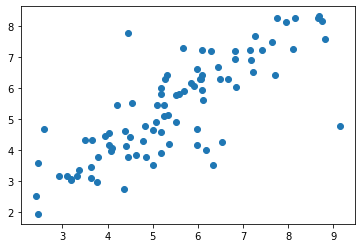

In [338]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.scatter(test_target, test_predict)

In [339]:
LSwFW_model.layers[1].attention_layers[4](train_tensor_scaled)

<tf.Tensor: shape=(354, 1), dtype=float32, numpy=
array([[0.9744031 ],
       [0.9790111 ],
       [0.97858757],
       [0.9786719 ],
       [0.9723006 ],
       [0.9776458 ],
       [0.9764581 ],
       [0.9720961 ],
       [0.88590276],
       [0.864859  ],
       [0.8481729 ],
       [0.8227005 ],
       [0.8393129 ],
       [0.8102953 ],
       [0.81445503],
       [0.7443564 ],
       [0.7465527 ],
       [0.9211513 ],
       [0.91374415],
       [0.8781286 ],
       [0.8507761 ],
       [0.8328528 ],
       [0.8246665 ],
       [0.8800114 ],
       [0.8883621 ],
       [0.8758197 ],
       [0.8087573 ],
       [0.80740994],
       [0.8036174 ],
       [0.79421824],
       [0.79369587],
       [0.79302025],
       [0.74133873],
       [0.7371919 ],
       [0.7656481 ],
       [0.7525875 ],
       [0.74172205],
       [0.7300884 ],
       [0.73483807],
       [0.90777516],
       [0.85193676],
       [0.8425447 ],
       [0.83079493],
       [0.8081655 ],
       [0.8101972 ],
     

In [340]:
attentions=[LSwFW_model.layers[1].attention_layers[i](train_tensor_scaled) for i in range(n_attention)]
attentions=np.hstack(attentions)


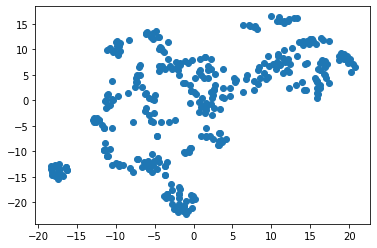

In [341]:
from sklearn.manifold import TSNE

dr=TSNE()
attentions_embed=dr.fit_transform(attentions)

plt.scatter(attentions_embed[:,0], 
         attentions_embed[:,1],
        )

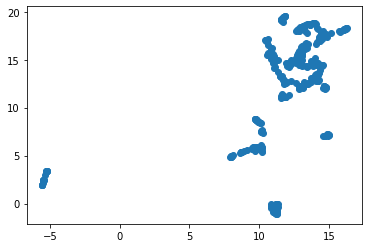

In [342]:
from umap import UMAP

dr=UMAP()
attentions_embed=dr.fit_transform(attentions)

plt.scatter(attentions_embed[:,0],
            attentions_embed[:,1]
           )

Try to color this by clustering from Tanimoto similarity. Is there a way to group them by core compound? Read Ruack's paper in detail

## Parameter-finding: Attention heads

In [7]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [14]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, MinMaxScaler


def get_attentionwFW_model(n_attention,
                           n_attention_hidden,
                           n_feat,
                           n_out,
                           n_concat_hidden,
                           concat_activation,
                           n_attention_out,
                           kernel_initializer,
                           bias_initializer,
                           attention_hidden_activation,
                           attention_output_activation,
                           n_hidden,
                           hidden_activation,
                           kernel_regularizer,
                           bias_regularizer,
                           random_seed=123
                           ):
    input_shape = (n_feat*2,)
    input_layer = Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    attentions_layer = attention_model.ConcatAttentionswFeatWeights(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation,
        kernel_initializer=kernel_initializer,
        bias_initializer=bias_initializer,
        kernel_regularizer=l2(1E-5),
        bias_regularizer=l2(1E-5),
        attention_kernel_initializer=kernel_initializer,
        attention_bias_initializer=bias_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable": False, "renorm": True},
    )(input_layer)
    # Removed dropout for attentions_layer because of Batch normalization
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(attentions_layer)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    LS_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return LS_model


def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            "split{:02d}".format(split_number)
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
    return [cp_callback, csvlogger_callback], checkpoint_path

In [15]:
from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]
all_features=df.iloc[:, feat_id:]

kf=KFold(n_splits=5, random_state=1234, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499, random_state=123)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())

selected_feat_ind=np.all(supports,axis=0)
print(f"{np.count_nonzero(selected_feat_ind)} features selected out of {train_features.shape[1]}")

selected_features=all_features.iloc[:,selected_feat_ind]
all_target=df['logki']


146 features selected out of 1646


In [16]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 2,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 1,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [17]:
#A single external test set used for Ruack... 

In [18]:
def data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target
                ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()
    
    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [20]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LSwFW_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
    break
for n_attention_out in range(1, 5):
    model_setup_params['n_attention_out']=n_attention_out
    
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

    cosa_mdl = COSA.NNCosa(n_iter=100,
                           distance_measure='inv_exp_dist',
                           calc_D_ijk=False)
    cosa_mdl.fit(train_features)
    cosa_mdl.fit_OOS(test_features)

    train_features = train_features[:, cosa_mdl.valid_feat]
    test_features = test_features[:, cosa_mdl.valid_feat]
    train_Fweights = cosa_mdl.output_Fweight()
    test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_tensor_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_tensor_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LSwFW_RobustScaler_n_attention_out",
                                                      dataset_name="AChEi",
                                                      split_number=n_attention_out,
                                                      super_folder="Parameter_finding"
                                                      )

    final_selected_feat_ind = np.where(selected_feat_ind)[
        0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               'train_Fweights': train_Fweights,
               'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LSwFW_model = get_attentionwFW_model(**model_setup_params
                                         )

    LSwFW_model.compile(**model_compile_params)

    # Fit and train model
    LSwFW_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    LSwFW_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LSwFW_model(test_tensor_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
    LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

    LSwFW_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    
    del LSwFW_model

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:10.961, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00047: val_root_mean_squared_error did not improve from 0.33252

Epoch 00048: val_root_mean_squared_error did not improve from 0.33252

Epoch 00049: val_root_mean_squared_error did not improve from 0.33252

Epoch 00050: val_root_mean_squared_error did not improve from 0.33252

Epoch 00051: val_root_mean_squared_error did not improve from 0.33252

Epoch 00052: val_root_mean_squared_error did not improve from 0.33252

Epoch 00053: val_root_mean_squared_error did not improve from 0.33252

Epoch 00054: val_root_mean_squared_error did not improve from 0.33252

Epoch 00055: val_root_mean_squared_error did not improve from 0.33252

Epoch 00056: val_root_mean_squared_error did not improve from 0.33252

Epoch 00057: val_root_mean_squared_error improved from 0.33252 to 0.32722, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint

Epoch 00058: val_root_mean_squared_error did not improve from 0.32722

Epoch 00059: val_root_mean_squared_


Epoch 00157: val_root_mean_squared_error did not improve from 0.29191

Epoch 00158: val_root_mean_squared_error did not improve from 0.29191

Epoch 00159: val_root_mean_squared_error did not improve from 0.29191

Epoch 00160: val_root_mean_squared_error did not improve from 0.29191

Epoch 00161: val_root_mean_squared_error did not improve from 0.29191

Epoch 00162: val_root_mean_squared_error did not improve from 0.29191

Epoch 00163: val_root_mean_squared_error did not improve from 0.29191

Epoch 00164: val_root_mean_squared_error did not improve from 0.29191

Epoch 00165: val_root_mean_squared_error did not improve from 0.29191

Epoch 00166: val_root_mean_squared_error did not improve from 0.29191

Epoch 00167: val_root_mean_squared_error did not improve from 0.29191

Epoch 00168: val_root_mean_squared_error did not improve from 0.29191

Epoch 00169: val_root_mean_squared_error did not improve from 0.29191

Epoch 00170: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00273: val_root_mean_squared_error did not improve from 0.29191

Epoch 00274: val_root_mean_squared_error did not improve from 0.29191

Epoch 00275: val_root_mean_squared_error did not improve from 0.29191

Epoch 00276: val_root_mean_squared_error did not improve from 0.29191

Epoch 00277: val_root_mean_squared_error did not improve from 0.29191

Epoch 00278: val_root_mean_squared_error did not improve from 0.29191

Epoch 00279: val_root_mean_squared_error did not improve from 0.29191

Epoch 00280: val_root_mean_squared_error did not improve from 0.29191

Epoch 00281: val_root_mean_squared_error did not improve from 0.29191

Epoch 00282: val_root_mean_squared_error did not improve from 0.29191

Epoch 00283: val_root_mean_squared_error did not improve from 0.29191

Epoch 00284: val_root_mean_squared_error did not improve from 0.29191

Epoch 00285: val_root_mean_squared_error did not improve from 0.29191

Epoch 00286: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00389: val_root_mean_squared_error did not improve from 0.29191

Epoch 00390: val_root_mean_squared_error did not improve from 0.29191

Epoch 00391: val_root_mean_squared_error did not improve from 0.29191

Epoch 00392: val_root_mean_squared_error did not improve from 0.29191

Epoch 00393: val_root_mean_squared_error did not improve from 0.29191

Epoch 00394: val_root_mean_squared_error did not improve from 0.29191

Epoch 00395: val_root_mean_squared_error did not improve from 0.29191

Epoch 00396: val_root_mean_squared_error did not improve from 0.29191

Epoch 00397: val_root_mean_squared_error did not improve from 0.29191

Epoch 00398: val_root_mean_squared_error did not improve from 0.29191

Epoch 00399: val_root_mean_squared_error did not improve from 0.29191

Epoch 00400: val_root_mean_squared_error did not improve from 0.29191

Epoch 00401: val_root_mean_squared_error did not improve from 0.29191

Epoch 00402: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00505: val_root_mean_squared_error did not improve from 0.29191

Epoch 00506: val_root_mean_squared_error did not improve from 0.29191

Epoch 00507: val_root_mean_squared_error did not improve from 0.29191

Epoch 00508: val_root_mean_squared_error did not improve from 0.29191

Epoch 00509: val_root_mean_squared_error did not improve from 0.29191

Epoch 00510: val_root_mean_squared_error did not improve from 0.29191

Epoch 00511: val_root_mean_squared_error did not improve from 0.29191

Epoch 00512: val_root_mean_squared_error did not improve from 0.29191

Epoch 00513: val_root_mean_squared_error did not improve from 0.29191

Epoch 00514: val_root_mean_squared_error did not improve from 0.29191

Epoch 00515: val_root_mean_squared_error did not improve from 0.29191

Epoch 00516: val_root_mean_squared_error did not improve from 0.29191

Epoch 00517: val_root_mean_squared_error did not improve from 0.29191

Epoch 00518: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00621: val_root_mean_squared_error did not improve from 0.29191

Epoch 00622: val_root_mean_squared_error did not improve from 0.29191

Epoch 00623: val_root_mean_squared_error did not improve from 0.29191

Epoch 00624: val_root_mean_squared_error did not improve from 0.29191

Epoch 00625: val_root_mean_squared_error did not improve from 0.29191

Epoch 00626: val_root_mean_squared_error did not improve from 0.29191

Epoch 00627: val_root_mean_squared_error did not improve from 0.29191

Epoch 00628: val_root_mean_squared_error did not improve from 0.29191

Epoch 00629: val_root_mean_squared_error did not improve from 0.29191

Epoch 00630: val_root_mean_squared_error did not improve from 0.29191

Epoch 00631: val_root_mean_squared_error did not improve from 0.29191

Epoch 00632: val_root_mean_squared_error did not improve from 0.29191

Epoch 00633: val_root_mean_squared_error did not improve from 0.29191

Epoch 00634: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00737: val_root_mean_squared_error did not improve from 0.29191

Epoch 00738: val_root_mean_squared_error did not improve from 0.29191

Epoch 00739: val_root_mean_squared_error did not improve from 0.29191

Epoch 00740: val_root_mean_squared_error did not improve from 0.29191

Epoch 00741: val_root_mean_squared_error did not improve from 0.29191

Epoch 00742: val_root_mean_squared_error did not improve from 0.29191

Epoch 00743: val_root_mean_squared_error did not improve from 0.29191

Epoch 00744: val_root_mean_squared_error did not improve from 0.29191

Epoch 00745: val_root_mean_squared_error did not improve from 0.29191

Epoch 00746: val_root_mean_squared_error did not improve from 0.29191

Epoch 00747: val_root_mean_squared_error did not improve from 0.29191

Epoch 00748: val_root_mean_squared_error did not improve from 0.29191

Epoch 00749: val_root_mean_squared_error did not improve from 0.29191

Epoch 00750: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00853: val_root_mean_squared_error did not improve from 0.29191

Epoch 00854: val_root_mean_squared_error did not improve from 0.29191

Epoch 00855: val_root_mean_squared_error did not improve from 0.29191

Epoch 00856: val_root_mean_squared_error did not improve from 0.29191

Epoch 00857: val_root_mean_squared_error did not improve from 0.29191

Epoch 00858: val_root_mean_squared_error did not improve from 0.29191

Epoch 00859: val_root_mean_squared_error did not improve from 0.29191

Epoch 00860: val_root_mean_squared_error did not improve from 0.29191

Epoch 00861: val_root_mean_squared_error did not improve from 0.29191

Epoch 00862: val_root_mean_squared_error did not improve from 0.29191

Epoch 00863: val_root_mean_squared_error did not improve from 0.29191

Epoch 00864: val_root_mean_squared_error did not improve from 0.29191

Epoch 00865: val_root_mean_squared_error did not improve from 0.29191

Epoch 00866: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00969: val_root_mean_squared_error did not improve from 0.29191

Epoch 00970: val_root_mean_squared_error did not improve from 0.29191

Epoch 00971: val_root_mean_squared_error did not improve from 0.29191

Epoch 00972: val_root_mean_squared_error did not improve from 0.29191

Epoch 00973: val_root_mean_squared_error did not improve from 0.29191

Epoch 00974: val_root_mean_squared_error did not improve from 0.29191

Epoch 00975: val_root_mean_squared_error did not improve from 0.29191

Epoch 00976: val_root_mean_squared_error did not improve from 0.29191

Epoch 00977: val_root_mean_squared_error did not improve from 0.29191

Epoch 00978: val_root_mean_squared_error did not improve from 0.29191

Epoch 00979: val_root_mean_squared_error did not improve from 0.29191

Epoch 00980: val_root_mean_squared_error did not improve from 0.29191

Epoch 00981: val_root_mean_squared_error did not improve from 0.29191

Epoch 00982: val_root_mean_squared_error did not improve from 0.29191

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:14.465, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:10.961, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at

Wchange:16.643, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calcula


Epoch 00051: val_root_mean_squared_error did not improve from 0.33901

Epoch 00052: val_root_mean_squared_error did not improve from 0.33901

Epoch 00053: val_root_mean_squared_error did not improve from 0.33901

Epoch 00054: val_root_mean_squared_error did not improve from 0.33901

Epoch 00055: val_root_mean_squared_error did not improve from 0.33901

Epoch 00056: val_root_mean_squared_error did not improve from 0.33901

Epoch 00057: val_root_mean_squared_error did not improve from 0.33901

Epoch 00058: val_root_mean_squared_error improved from 0.33901 to 0.32885, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.32885

Epoch 00060: val_root_mean_squared_error did not improve from 0.32885

Epoch 00061: val_root_mean_squared_error did not improve from 0.32885

Epoch 00062: val_root_mean_squared_error did not improve from 0.32885

Epoch 00063: val_root_mean_squared_


Epoch 00157: val_root_mean_squared_error did not improve from 0.29057

Epoch 00158: val_root_mean_squared_error did not improve from 0.29057

Epoch 00159: val_root_mean_squared_error did not improve from 0.29057

Epoch 00160: val_root_mean_squared_error did not improve from 0.29057

Epoch 00161: val_root_mean_squared_error did not improve from 0.29057

Epoch 00162: val_root_mean_squared_error did not improve from 0.29057

Epoch 00163: val_root_mean_squared_error did not improve from 0.29057

Epoch 00164: val_root_mean_squared_error did not improve from 0.29057

Epoch 00165: val_root_mean_squared_error did not improve from 0.29057

Epoch 00166: val_root_mean_squared_error did not improve from 0.29057

Epoch 00167: val_root_mean_squared_error did not improve from 0.29057

Epoch 00168: val_root_mean_squared_error did not improve from 0.29057

Epoch 00169: val_root_mean_squared_error did not improve from 0.29057

Epoch 00170: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00273: val_root_mean_squared_error did not improve from 0.29057

Epoch 00274: val_root_mean_squared_error did not improve from 0.29057

Epoch 00275: val_root_mean_squared_error did not improve from 0.29057

Epoch 00276: val_root_mean_squared_error did not improve from 0.29057

Epoch 00277: val_root_mean_squared_error did not improve from 0.29057

Epoch 00278: val_root_mean_squared_error did not improve from 0.29057

Epoch 00279: val_root_mean_squared_error did not improve from 0.29057

Epoch 00280: val_root_mean_squared_error did not improve from 0.29057

Epoch 00281: val_root_mean_squared_error did not improve from 0.29057

Epoch 00282: val_root_mean_squared_error did not improve from 0.29057

Epoch 00283: val_root_mean_squared_error did not improve from 0.29057

Epoch 00284: val_root_mean_squared_error did not improve from 0.29057

Epoch 00285: val_root_mean_squared_error did not improve from 0.29057

Epoch 00286: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00389: val_root_mean_squared_error did not improve from 0.29057

Epoch 00390: val_root_mean_squared_error did not improve from 0.29057

Epoch 00391: val_root_mean_squared_error did not improve from 0.29057

Epoch 00392: val_root_mean_squared_error did not improve from 0.29057

Epoch 00393: val_root_mean_squared_error did not improve from 0.29057

Epoch 00394: val_root_mean_squared_error did not improve from 0.29057

Epoch 00395: val_root_mean_squared_error did not improve from 0.29057

Epoch 00396: val_root_mean_squared_error did not improve from 0.29057

Epoch 00397: val_root_mean_squared_error did not improve from 0.29057

Epoch 00398: val_root_mean_squared_error did not improve from 0.29057

Epoch 00399: val_root_mean_squared_error did not improve from 0.29057

Epoch 00400: val_root_mean_squared_error did not improve from 0.29057

Epoch 00401: val_root_mean_squared_error did not improve from 0.29057

Epoch 00402: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00505: val_root_mean_squared_error did not improve from 0.29057

Epoch 00506: val_root_mean_squared_error did not improve from 0.29057

Epoch 00507: val_root_mean_squared_error did not improve from 0.29057

Epoch 00508: val_root_mean_squared_error did not improve from 0.29057

Epoch 00509: val_root_mean_squared_error did not improve from 0.29057

Epoch 00510: val_root_mean_squared_error did not improve from 0.29057

Epoch 00511: val_root_mean_squared_error did not improve from 0.29057

Epoch 00512: val_root_mean_squared_error did not improve from 0.29057

Epoch 00513: val_root_mean_squared_error did not improve from 0.29057

Epoch 00514: val_root_mean_squared_error did not improve from 0.29057

Epoch 00515: val_root_mean_squared_error did not improve from 0.29057

Epoch 00516: val_root_mean_squared_error did not improve from 0.29057

Epoch 00517: val_root_mean_squared_error did not improve from 0.29057

Epoch 00518: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00621: val_root_mean_squared_error did not improve from 0.29057

Epoch 00622: val_root_mean_squared_error did not improve from 0.29057

Epoch 00623: val_root_mean_squared_error did not improve from 0.29057

Epoch 00624: val_root_mean_squared_error did not improve from 0.29057

Epoch 00625: val_root_mean_squared_error did not improve from 0.29057

Epoch 00626: val_root_mean_squared_error did not improve from 0.29057

Epoch 00627: val_root_mean_squared_error did not improve from 0.29057

Epoch 00628: val_root_mean_squared_error did not improve from 0.29057

Epoch 00629: val_root_mean_squared_error did not improve from 0.29057

Epoch 00630: val_root_mean_squared_error did not improve from 0.29057

Epoch 00631: val_root_mean_squared_error did not improve from 0.29057

Epoch 00632: val_root_mean_squared_error did not improve from 0.29057

Epoch 00633: val_root_mean_squared_error did not improve from 0.29057

Epoch 00634: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00737: val_root_mean_squared_error did not improve from 0.29057

Epoch 00738: val_root_mean_squared_error did not improve from 0.29057

Epoch 00739: val_root_mean_squared_error did not improve from 0.29057

Epoch 00740: val_root_mean_squared_error did not improve from 0.29057

Epoch 00741: val_root_mean_squared_error did not improve from 0.29057

Epoch 00742: val_root_mean_squared_error did not improve from 0.29057

Epoch 00743: val_root_mean_squared_error did not improve from 0.29057

Epoch 00744: val_root_mean_squared_error did not improve from 0.29057

Epoch 00745: val_root_mean_squared_error did not improve from 0.29057

Epoch 00746: val_root_mean_squared_error did not improve from 0.29057

Epoch 00747: val_root_mean_squared_error did not improve from 0.29057

Epoch 00748: val_root_mean_squared_error did not improve from 0.29057

Epoch 00749: val_root_mean_squared_error did not improve from 0.29057

Epoch 00750: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00853: val_root_mean_squared_error did not improve from 0.29057

Epoch 00854: val_root_mean_squared_error did not improve from 0.29057

Epoch 00855: val_root_mean_squared_error did not improve from 0.29057

Epoch 00856: val_root_mean_squared_error did not improve from 0.29057

Epoch 00857: val_root_mean_squared_error did not improve from 0.29057

Epoch 00858: val_root_mean_squared_error did not improve from 0.29057

Epoch 00859: val_root_mean_squared_error did not improve from 0.29057

Epoch 00860: val_root_mean_squared_error did not improve from 0.29057

Epoch 00861: val_root_mean_squared_error did not improve from 0.29057

Epoch 00862: val_root_mean_squared_error did not improve from 0.29057

Epoch 00863: val_root_mean_squared_error did not improve from 0.29057

Epoch 00864: val_root_mean_squared_error did not improve from 0.29057

Epoch 00865: val_root_mean_squared_error did not improve from 0.29057

Epoch 00866: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00969: val_root_mean_squared_error did not improve from 0.29057

Epoch 00970: val_root_mean_squared_error did not improve from 0.29057

Epoch 00971: val_root_mean_squared_error did not improve from 0.29057

Epoch 00972: val_root_mean_squared_error did not improve from 0.29057

Epoch 00973: val_root_mean_squared_error did not improve from 0.29057

Epoch 00974: val_root_mean_squared_error did not improve from 0.29057

Epoch 00975: val_root_mean_squared_error did not improve from 0.29057

Epoch 00976: val_root_mean_squared_error did not improve from 0.29057

Epoch 00977: val_root_mean_squared_error did not improve from 0.29057

Epoch 00978: val_root_mean_squared_error did not improve from 0.29057

Epoch 00979: val_root_mean_squared_error did not improve from 0.29057

Epoch 00980: val_root_mean_squared_error did not improve from 0.29057

Epoch 00981: val_root_mean_squared_error did not improve from 0.29057

Epoch 00982: val_root_mean_squared_error did not improve from 0.29057

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:30.034, Crit: Not calculated
Wchange:42.311, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Cri

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00055: val_root_mean_squared_error did not improve from 0.34001

Epoch 00056: val_root_mean_squared_error did not improve from 0.34001

Epoch 00057: val_root_mean_squared_error did not improve from 0.34001

Epoch 00058: val_root_mean_squared_error improved from 0.34001 to 0.33996, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.33996

Epoch 00060: val_root_mean_squared_error did not improve from 0.33996

Epoch 00061: val_root_mean_squared_error did not improve from 0.33996

Epoch 00062: val_root_mean_squared_error did not improve from 0.33996

Epoch 00063: val_root_mean_squared_error did not improve from 0.33996

Epoch 00064: val_root_mean_squared_error did not improve from 0.33996

Epoch 00065: val_root_mean_squared_error improved from 0.33996 to 0.33103, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkp


Epoch 00160: val_root_mean_squared_error did not improve from 0.30219

Epoch 00161: val_root_mean_squared_error did not improve from 0.30219

Epoch 00162: val_root_mean_squared_error did not improve from 0.30219

Epoch 00163: val_root_mean_squared_error did not improve from 0.30219

Epoch 00164: val_root_mean_squared_error did not improve from 0.30219

Epoch 00165: val_root_mean_squared_error did not improve from 0.30219

Epoch 00166: val_root_mean_squared_error did not improve from 0.30219

Epoch 00167: val_root_mean_squared_error did not improve from 0.30219

Epoch 00168: val_root_mean_squared_error did not improve from 0.30219

Epoch 00169: val_root_mean_squared_error did not improve from 0.30219

Epoch 00170: val_root_mean_squared_error did not improve from 0.30219

Epoch 00171: val_root_mean_squared_error did not improve from 0.30219

Epoch 00172: val_root_mean_squared_error did not improve from 0.30219

Epoch 00173: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00276: val_root_mean_squared_error did not improve from 0.30219

Epoch 00277: val_root_mean_squared_error did not improve from 0.30219

Epoch 00278: val_root_mean_squared_error did not improve from 0.30219

Epoch 00279: val_root_mean_squared_error did not improve from 0.30219

Epoch 00280: val_root_mean_squared_error did not improve from 0.30219

Epoch 00281: val_root_mean_squared_error did not improve from 0.30219

Epoch 00282: val_root_mean_squared_error did not improve from 0.30219

Epoch 00283: val_root_mean_squared_error did not improve from 0.30219

Epoch 00284: val_root_mean_squared_error did not improve from 0.30219

Epoch 00285: val_root_mean_squared_error did not improve from 0.30219

Epoch 00286: val_root_mean_squared_error did not improve from 0.30219

Epoch 00287: val_root_mean_squared_error did not improve from 0.30219

Epoch 00288: val_root_mean_squared_error did not improve from 0.30219

Epoch 00289: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00392: val_root_mean_squared_error did not improve from 0.30219

Epoch 00393: val_root_mean_squared_error did not improve from 0.30219

Epoch 00394: val_root_mean_squared_error did not improve from 0.30219

Epoch 00395: val_root_mean_squared_error did not improve from 0.30219

Epoch 00396: val_root_mean_squared_error did not improve from 0.30219

Epoch 00397: val_root_mean_squared_error did not improve from 0.30219

Epoch 00398: val_root_mean_squared_error did not improve from 0.30219

Epoch 00399: val_root_mean_squared_error did not improve from 0.30219

Epoch 00400: val_root_mean_squared_error did not improve from 0.30219

Epoch 00401: val_root_mean_squared_error did not improve from 0.30219

Epoch 00402: val_root_mean_squared_error did not improve from 0.30219

Epoch 00403: val_root_mean_squared_error did not improve from 0.30219

Epoch 00404: val_root_mean_squared_error did not improve from 0.30219

Epoch 00405: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00508: val_root_mean_squared_error did not improve from 0.30219

Epoch 00509: val_root_mean_squared_error did not improve from 0.30219

Epoch 00510: val_root_mean_squared_error did not improve from 0.30219

Epoch 00511: val_root_mean_squared_error did not improve from 0.30219

Epoch 00512: val_root_mean_squared_error did not improve from 0.30219

Epoch 00513: val_root_mean_squared_error did not improve from 0.30219

Epoch 00514: val_root_mean_squared_error did not improve from 0.30219

Epoch 00515: val_root_mean_squared_error did not improve from 0.30219

Epoch 00516: val_root_mean_squared_error did not improve from 0.30219

Epoch 00517: val_root_mean_squared_error did not improve from 0.30219

Epoch 00518: val_root_mean_squared_error did not improve from 0.30219

Epoch 00519: val_root_mean_squared_error did not improve from 0.30219

Epoch 00520: val_root_mean_squared_error did not improve from 0.30219

Epoch 00521: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00624: val_root_mean_squared_error did not improve from 0.30219

Epoch 00625: val_root_mean_squared_error did not improve from 0.30219

Epoch 00626: val_root_mean_squared_error did not improve from 0.30219

Epoch 00627: val_root_mean_squared_error did not improve from 0.30219

Epoch 00628: val_root_mean_squared_error did not improve from 0.30219

Epoch 00629: val_root_mean_squared_error did not improve from 0.30219

Epoch 00630: val_root_mean_squared_error did not improve from 0.30219

Epoch 00631: val_root_mean_squared_error did not improve from 0.30219

Epoch 00632: val_root_mean_squared_error did not improve from 0.30219

Epoch 00633: val_root_mean_squared_error did not improve from 0.30219

Epoch 00634: val_root_mean_squared_error did not improve from 0.30219

Epoch 00635: val_root_mean_squared_error did not improve from 0.30219

Epoch 00636: val_root_mean_squared_error did not improve from 0.30219

Epoch 00637: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00740: val_root_mean_squared_error did not improve from 0.30219

Epoch 00741: val_root_mean_squared_error did not improve from 0.30219

Epoch 00742: val_root_mean_squared_error did not improve from 0.30219

Epoch 00743: val_root_mean_squared_error did not improve from 0.30219

Epoch 00744: val_root_mean_squared_error did not improve from 0.30219

Epoch 00745: val_root_mean_squared_error did not improve from 0.30219

Epoch 00746: val_root_mean_squared_error did not improve from 0.30219

Epoch 00747: val_root_mean_squared_error did not improve from 0.30219

Epoch 00748: val_root_mean_squared_error did not improve from 0.30219

Epoch 00749: val_root_mean_squared_error did not improve from 0.30219

Epoch 00750: val_root_mean_squared_error did not improve from 0.30219

Epoch 00751: val_root_mean_squared_error did not improve from 0.30219

Epoch 00752: val_root_mean_squared_error did not improve from 0.30219

Epoch 00753: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00856: val_root_mean_squared_error did not improve from 0.30219

Epoch 00857: val_root_mean_squared_error did not improve from 0.30219

Epoch 00858: val_root_mean_squared_error did not improve from 0.30219

Epoch 00859: val_root_mean_squared_error did not improve from 0.30219

Epoch 00860: val_root_mean_squared_error did not improve from 0.30219

Epoch 00861: val_root_mean_squared_error did not improve from 0.30219

Epoch 00862: val_root_mean_squared_error did not improve from 0.30219

Epoch 00863: val_root_mean_squared_error did not improve from 0.30219

Epoch 00864: val_root_mean_squared_error did not improve from 0.30219

Epoch 00865: val_root_mean_squared_error did not improve from 0.30219

Epoch 00866: val_root_mean_squared_error did not improve from 0.30219

Epoch 00867: val_root_mean_squared_error did not improve from 0.30219

Epoch 00868: val_root_mean_squared_error did not improve from 0.30219

Epoch 00869: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00972: val_root_mean_squared_error did not improve from 0.30219

Epoch 00973: val_root_mean_squared_error did not improve from 0.30219

Epoch 00974: val_root_mean_squared_error did not improve from 0.30219

Epoch 00975: val_root_mean_squared_error did not improve from 0.30219

Epoch 00976: val_root_mean_squared_error did not improve from 0.30219

Epoch 00977: val_root_mean_squared_error did not improve from 0.30219

Epoch 00978: val_root_mean_squared_error did not improve from 0.30219

Epoch 00979: val_root_mean_squared_error did not improve from 0.30219

Epoch 00980: val_root_mean_squared_error did not improve from 0.30219

Epoch 00981: val_root_mean_squared_error did not improve from 0.30219

Epoch 00982: val_root_mean_squared_error did not improve from 0.30219

Epoch 00983: val_root_mean_squared_error did not improve from 0.30219

Epoch 00984: val_root_mean_squared_error did not improve from 0.30219

Epoch 00985: val_root_mean_squared_error did not improve from 0.30219

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:30.034, Crit: Not calculated
Wchange:42.311, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00052: val_root_mean_squared_error did not improve from 0.33917

Epoch 00053: val_root_mean_squared_error did not improve from 0.33917

Epoch 00054: val_root_mean_squared_error did not improve from 0.33917

Epoch 00055: val_root_mean_squared_error did not improve from 0.33917

Epoch 00056: val_root_mean_squared_error did not improve from 0.33917

Epoch 00057: val_root_mean_squared_error did not improve from 0.33917

Epoch 00058: val_root_mean_squared_error did not improve from 0.33917

Epoch 00059: val_root_mean_squared_error did not improve from 0.33917

Epoch 00060: val_root_mean_squared_error did not improve from 0.33917

Epoch 00061: val_root_mean_squared_error did not improve from 0.33917

Epoch 00062: val_root_mean_squared_error did not improve from 0.33917

Epoch 00063: val_root_mean_squared_error did not improve from 0.33917

Epoch 00064: val_root_mean_squared_error did not improve from 0.33917

Epoch 00065: val_root_mean_squared_error improved from 0.33917 to 0.33695, s


Epoch 00157: val_root_mean_squared_error did not improve from 0.30397

Epoch 00158: val_root_mean_squared_error did not improve from 0.30397

Epoch 00159: val_root_mean_squared_error did not improve from 0.30397

Epoch 00160: val_root_mean_squared_error did not improve from 0.30397

Epoch 00161: val_root_mean_squared_error did not improve from 0.30397

Epoch 00162: val_root_mean_squared_error did not improve from 0.30397

Epoch 00163: val_root_mean_squared_error did not improve from 0.30397

Epoch 00164: val_root_mean_squared_error did not improve from 0.30397

Epoch 00165: val_root_mean_squared_error did not improve from 0.30397

Epoch 00166: val_root_mean_squared_error did not improve from 0.30397

Epoch 00167: val_root_mean_squared_error did not improve from 0.30397

Epoch 00168: val_root_mean_squared_error did not improve from 0.30397

Epoch 00169: val_root_mean_squared_error did not improve from 0.30397

Epoch 00170: val_root_mean_squared_error did not improve from 0.30397

Epoch


Epoch 00271: val_root_mean_squared_error did not improve from 0.30366

Epoch 00272: val_root_mean_squared_error did not improve from 0.30366

Epoch 00273: val_root_mean_squared_error did not improve from 0.30366

Epoch 00274: val_root_mean_squared_error did not improve from 0.30366

Epoch 00275: val_root_mean_squared_error did not improve from 0.30366

Epoch 00276: val_root_mean_squared_error did not improve from 0.30366

Epoch 00277: val_root_mean_squared_error did not improve from 0.30366

Epoch 00278: val_root_mean_squared_error did not improve from 0.30366

Epoch 00279: val_root_mean_squared_error did not improve from 0.30366

Epoch 00280: val_root_mean_squared_error did not improve from 0.30366

Epoch 00281: val_root_mean_squared_error did not improve from 0.30366

Epoch 00282: val_root_mean_squared_error did not improve from 0.30366

Epoch 00283: val_root_mean_squared_error did not improve from 0.30366

Epoch 00284: val_root_mean_squared_error did not improve from 0.30366

Epoch


Epoch 00385: val_root_mean_squared_error did not improve from 0.30245

Epoch 00386: val_root_mean_squared_error did not improve from 0.30245

Epoch 00387: val_root_mean_squared_error did not improve from 0.30245

Epoch 00388: val_root_mean_squared_error did not improve from 0.30245

Epoch 00389: val_root_mean_squared_error did not improve from 0.30245

Epoch 00390: val_root_mean_squared_error did not improve from 0.30245

Epoch 00391: val_root_mean_squared_error did not improve from 0.30245

Epoch 00392: val_root_mean_squared_error did not improve from 0.30245

Epoch 00393: val_root_mean_squared_error did not improve from 0.30245

Epoch 00394: val_root_mean_squared_error did not improve from 0.30245

Epoch 00395: val_root_mean_squared_error did not improve from 0.30245

Epoch 00396: val_root_mean_squared_error did not improve from 0.30245

Epoch 00397: val_root_mean_squared_error did not improve from 0.30245

Epoch 00398: val_root_mean_squared_error did not improve from 0.30245

Epoch


Epoch 00501: val_root_mean_squared_error did not improve from 0.30245

Epoch 00502: val_root_mean_squared_error did not improve from 0.30245

Epoch 00503: val_root_mean_squared_error did not improve from 0.30245

Epoch 00504: val_root_mean_squared_error did not improve from 0.30245

Epoch 00505: val_root_mean_squared_error did not improve from 0.30245

Epoch 00506: val_root_mean_squared_error did not improve from 0.30245

Epoch 00507: val_root_mean_squared_error did not improve from 0.30245

Epoch 00508: val_root_mean_squared_error did not improve from 0.30245

Epoch 00509: val_root_mean_squared_error did not improve from 0.30245

Epoch 00510: val_root_mean_squared_error did not improve from 0.30245

Epoch 00511: val_root_mean_squared_error did not improve from 0.30245

Epoch 00512: val_root_mean_squared_error did not improve from 0.30245

Epoch 00513: val_root_mean_squared_error did not improve from 0.30245

Epoch 00514: val_root_mean_squared_error did not improve from 0.30245

Epoch


Epoch 00614: val_root_mean_squared_error did not improve from 0.29661

Epoch 00615: val_root_mean_squared_error did not improve from 0.29661

Epoch 00616: val_root_mean_squared_error did not improve from 0.29661

Epoch 00617: val_root_mean_squared_error did not improve from 0.29661

Epoch 00618: val_root_mean_squared_error did not improve from 0.29661

Epoch 00619: val_root_mean_squared_error did not improve from 0.29661

Epoch 00620: val_root_mean_squared_error did not improve from 0.29661

Epoch 00621: val_root_mean_squared_error did not improve from 0.29661

Epoch 00622: val_root_mean_squared_error did not improve from 0.29661

Epoch 00623: val_root_mean_squared_error did not improve from 0.29661

Epoch 00624: val_root_mean_squared_error did not improve from 0.29661

Epoch 00625: val_root_mean_squared_error did not improve from 0.29661

Epoch 00626: val_root_mean_squared_error did not improve from 0.29661

Epoch 00627: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00730: val_root_mean_squared_error did not improve from 0.29661

Epoch 00731: val_root_mean_squared_error did not improve from 0.29661

Epoch 00732: val_root_mean_squared_error did not improve from 0.29661

Epoch 00733: val_root_mean_squared_error did not improve from 0.29661

Epoch 00734: val_root_mean_squared_error did not improve from 0.29661

Epoch 00735: val_root_mean_squared_error did not improve from 0.29661

Epoch 00736: val_root_mean_squared_error did not improve from 0.29661

Epoch 00737: val_root_mean_squared_error did not improve from 0.29661

Epoch 00738: val_root_mean_squared_error did not improve from 0.29661

Epoch 00739: val_root_mean_squared_error did not improve from 0.29661

Epoch 00740: val_root_mean_squared_error did not improve from 0.29661

Epoch 00741: val_root_mean_squared_error did not improve from 0.29661

Epoch 00742: val_root_mean_squared_error did not improve from 0.29661

Epoch 00743: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00846: val_root_mean_squared_error did not improve from 0.29661

Epoch 00847: val_root_mean_squared_error did not improve from 0.29661

Epoch 00848: val_root_mean_squared_error did not improve from 0.29661

Epoch 00849: val_root_mean_squared_error did not improve from 0.29661

Epoch 00850: val_root_mean_squared_error did not improve from 0.29661

Epoch 00851: val_root_mean_squared_error did not improve from 0.29661

Epoch 00852: val_root_mean_squared_error did not improve from 0.29661

Epoch 00853: val_root_mean_squared_error did not improve from 0.29661

Epoch 00854: val_root_mean_squared_error did not improve from 0.29661

Epoch 00855: val_root_mean_squared_error did not improve from 0.29661

Epoch 00856: val_root_mean_squared_error did not improve from 0.29661

Epoch 00857: val_root_mean_squared_error did not improve from 0.29661

Epoch 00858: val_root_mean_squared_error did not improve from 0.29661

Epoch 00859: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00962: val_root_mean_squared_error did not improve from 0.29661

Epoch 00963: val_root_mean_squared_error did not improve from 0.29661

Epoch 00964: val_root_mean_squared_error did not improve from 0.29661

Epoch 00965: val_root_mean_squared_error did not improve from 0.29661

Epoch 00966: val_root_mean_squared_error did not improve from 0.29661

Epoch 00967: val_root_mean_squared_error did not improve from 0.29661

Epoch 00968: val_root_mean_squared_error did not improve from 0.29661

Epoch 00969: val_root_mean_squared_error did not improve from 0.29661

Epoch 00970: val_root_mean_squared_error did not improve from 0.29661

Epoch 00971: val_root_mean_squared_error did not improve from 0.29661

Epoch 00972: val_root_mean_squared_error did not improve from 0.29661

Epoch 00973: val_root_mean_squared_error did not improve from 0.29661

Epoch 00974: val_root_mean_squared_error did not improve from 0.29661

Epoch 00975: val_root_mean_squared_error did not improve from 0.29661

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split04\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split04\model_checkpoint\..\saved_model\assets


### Load runs

In [21]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Parameter_finding"):
    break
# Get latest files
dirs = list(filter(lambda x: "LSwFW_RobustScaler_n_attention_out" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler = MinMaxScaler(feature_range=(0.1, 0.9),
                                 )
    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Parameter_finding",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Model with {i+1} n_attention_out: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", i, "RMSE", rmse])
    load_model_results.append(["LS_model", i, "Rsquared", r2])

Model with 1 n_attention_out: RMSE = 0.669; R^2 = 0.848.
Model with 2 n_attention_out: RMSE = 0.666; R^2 = 0.850.
Model with 3 n_attention_out: RMSE = 0.693; R^2 = 0.838.
Model with 4 n_attention_out: RMSE = 0.680; R^2 = 0.844.


Model with 0 n_attention: RMSE = 0.781; R^2 = 0.794.
Model with 1 n_attention: RMSE = 0.682; R^2 = 0.843.
Model with 2 n_attention: RMSE = 0.698; R^2 = 0.835.
Model with 3 n_attention: RMSE = 0.698; R^2 = 0.835.


Pick n_attention=2

<AxesSubplot:xlabel='n_attention', ylabel='score'>

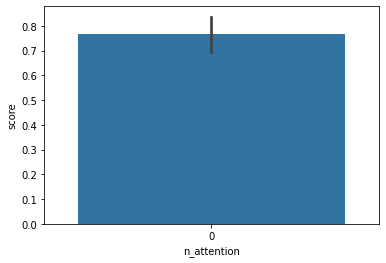

In [128]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

n_attention_finding=pd.DataFrame(load_model_results, 
                        columns=["Model", "n_attention", "metric", "score"])

import seaborn as sns
sns.barplot(data=n_attention_finding, 
            x='n_attention',
            y='score',
           )


R^2=0.839 for LSwFW_model with 10 attention heads and 
0.896 for dense_model 

## Compute cross-validated runs

In [42]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LSwFW_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

    cosa_mdl = COSA.NNCosa(n_iter=100,
                           distance_measure='inv_exp_dist',
                           calc_D_ijk=False)
    cosa_mdl.fit(train_features)
    cosa_mdl.fit_OOS(test_features)

    train_features = train_features[:, cosa_mdl.valid_feat]
    test_features = test_features[:, cosa_mdl.valid_feat]
    train_Fweights = cosa_mdl.output_Fweight()
    test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_tensor_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_tensor_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LSwFW_RobustScaler_rkf",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="Preliminary_Models"
                                                      )

    final_selected_feat_ind = np.where(selected_feat_ind)[
        0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               'train_Fweights': train_Fweights,
               'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LSwFW_model = get_attentionwFW_model(**model_setup_params
                                         )

    LSwFW_model.compile(**model_compile_params)

    # Fit and train model
    LSwFW_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    LSwFW_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LSwFW_model(test_tensor_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
    LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

    LSwFW_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    
    del LSwFW_model

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.881, Crit:Not calculated
Wchange:0.188, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.040, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.025, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.014, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:31.759, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:19.890, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:9.584, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starti

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00064: val_root_mean_squared_error did not improve from 0.27465

Epoch 00065: val_root_mean_squared_error improved from 0.27465 to 0.27103, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00066: val_root_mean_squared_error improved from 0.27103 to 0.25759, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00067: val_root_mean_squared_error did not improve from 0.25759

Epoch 00068: val_root_mean_squared_error did not improve from 0.25759

Epoch 00069: val_root_mean_squared_error did not improve from 0.25759

Epoch 00070: val_root_mean_squared_error did not improve from 0.25759

Epoch 00071: val_root_mean_squared_error did not improve from 0.25759

Epoch 00072: val_root_mean_squared_error did not improve from 0.25759

Epoch 00073: val_root_mean_squared_error did not improve from 0.25759

Epoch 00074: val_root_mean_squared_error did not improve from 0.25759

Epoch 00075: val


Epoch 00173: val_root_mean_squared_error did not improve from 0.23926

Epoch 00174: val_root_mean_squared_error did not improve from 0.23926

Epoch 00175: val_root_mean_squared_error did not improve from 0.23926

Epoch 00176: val_root_mean_squared_error did not improve from 0.23926

Epoch 00177: val_root_mean_squared_error did not improve from 0.23926

Epoch 00178: val_root_mean_squared_error did not improve from 0.23926

Epoch 00179: val_root_mean_squared_error did not improve from 0.23926

Epoch 00180: val_root_mean_squared_error did not improve from 0.23926

Epoch 00181: val_root_mean_squared_error did not improve from 0.23926

Epoch 00182: val_root_mean_squared_error did not improve from 0.23926

Epoch 00183: val_root_mean_squared_error did not improve from 0.23926

Epoch 00184: val_root_mean_squared_error did not improve from 0.23926

Epoch 00185: val_root_mean_squared_error did not improve from 0.23926

Epoch 00186: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00289: val_root_mean_squared_error did not improve from 0.23926

Epoch 00290: val_root_mean_squared_error did not improve from 0.23926

Epoch 00291: val_root_mean_squared_error did not improve from 0.23926

Epoch 00292: val_root_mean_squared_error did not improve from 0.23926

Epoch 00293: val_root_mean_squared_error did not improve from 0.23926

Epoch 00294: val_root_mean_squared_error did not improve from 0.23926

Epoch 00295: val_root_mean_squared_error did not improve from 0.23926

Epoch 00296: val_root_mean_squared_error did not improve from 0.23926

Epoch 00297: val_root_mean_squared_error did not improve from 0.23926

Epoch 00298: val_root_mean_squared_error did not improve from 0.23926

Epoch 00299: val_root_mean_squared_error did not improve from 0.23926

Epoch 00300: val_root_mean_squared_error did not improve from 0.23926

Epoch 00301: val_root_mean_squared_error did not improve from 0.23926

Epoch 00302: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00405: val_root_mean_squared_error did not improve from 0.23926

Epoch 00406: val_root_mean_squared_error did not improve from 0.23926

Epoch 00407: val_root_mean_squared_error did not improve from 0.23926

Epoch 00408: val_root_mean_squared_error did not improve from 0.23926

Epoch 00409: val_root_mean_squared_error did not improve from 0.23926

Epoch 00410: val_root_mean_squared_error did not improve from 0.23926

Epoch 00411: val_root_mean_squared_error did not improve from 0.23926

Epoch 00412: val_root_mean_squared_error did not improve from 0.23926

Epoch 00413: val_root_mean_squared_error did not improve from 0.23926

Epoch 00414: val_root_mean_squared_error did not improve from 0.23926

Epoch 00415: val_root_mean_squared_error did not improve from 0.23926

Epoch 00416: val_root_mean_squared_error did not improve from 0.23926

Epoch 00417: val_root_mean_squared_error did not improve from 0.23926

Epoch 00418: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00521: val_root_mean_squared_error did not improve from 0.23926

Epoch 00522: val_root_mean_squared_error did not improve from 0.23926

Epoch 00523: val_root_mean_squared_error did not improve from 0.23926

Epoch 00524: val_root_mean_squared_error did not improve from 0.23926

Epoch 00525: val_root_mean_squared_error did not improve from 0.23926

Epoch 00526: val_root_mean_squared_error did not improve from 0.23926

Epoch 00527: val_root_mean_squared_error did not improve from 0.23926

Epoch 00528: val_root_mean_squared_error did not improve from 0.23926

Epoch 00529: val_root_mean_squared_error did not improve from 0.23926

Epoch 00530: val_root_mean_squared_error did not improve from 0.23926

Epoch 00531: val_root_mean_squared_error did not improve from 0.23926

Epoch 00532: val_root_mean_squared_error did not improve from 0.23926

Epoch 00533: val_root_mean_squared_error did not improve from 0.23926

Epoch 00534: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00637: val_root_mean_squared_error did not improve from 0.23926

Epoch 00638: val_root_mean_squared_error did not improve from 0.23926

Epoch 00639: val_root_mean_squared_error did not improve from 0.23926

Epoch 00640: val_root_mean_squared_error did not improve from 0.23926

Epoch 00641: val_root_mean_squared_error did not improve from 0.23926

Epoch 00642: val_root_mean_squared_error did not improve from 0.23926

Epoch 00643: val_root_mean_squared_error did not improve from 0.23926

Epoch 00644: val_root_mean_squared_error did not improve from 0.23926

Epoch 00645: val_root_mean_squared_error did not improve from 0.23926

Epoch 00646: val_root_mean_squared_error did not improve from 0.23926

Epoch 00647: val_root_mean_squared_error did not improve from 0.23926

Epoch 00648: val_root_mean_squared_error did not improve from 0.23926

Epoch 00649: val_root_mean_squared_error did not improve from 0.23926

Epoch 00650: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00753: val_root_mean_squared_error did not improve from 0.23926

Epoch 00754: val_root_mean_squared_error did not improve from 0.23926

Epoch 00755: val_root_mean_squared_error did not improve from 0.23926

Epoch 00756: val_root_mean_squared_error did not improve from 0.23926

Epoch 00757: val_root_mean_squared_error did not improve from 0.23926

Epoch 00758: val_root_mean_squared_error did not improve from 0.23926

Epoch 00759: val_root_mean_squared_error did not improve from 0.23926

Epoch 00760: val_root_mean_squared_error did not improve from 0.23926

Epoch 00761: val_root_mean_squared_error did not improve from 0.23926

Epoch 00762: val_root_mean_squared_error did not improve from 0.23926

Epoch 00763: val_root_mean_squared_error did not improve from 0.23926

Epoch 00764: val_root_mean_squared_error did not improve from 0.23926

Epoch 00765: val_root_mean_squared_error did not improve from 0.23926

Epoch 00766: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00869: val_root_mean_squared_error did not improve from 0.23926

Epoch 00870: val_root_mean_squared_error did not improve from 0.23926

Epoch 00871: val_root_mean_squared_error did not improve from 0.23926

Epoch 00872: val_root_mean_squared_error did not improve from 0.23926

Epoch 00873: val_root_mean_squared_error did not improve from 0.23926

Epoch 00874: val_root_mean_squared_error did not improve from 0.23926

Epoch 00875: val_root_mean_squared_error did not improve from 0.23926

Epoch 00876: val_root_mean_squared_error did not improve from 0.23926

Epoch 00877: val_root_mean_squared_error did not improve from 0.23926

Epoch 00878: val_root_mean_squared_error did not improve from 0.23926

Epoch 00879: val_root_mean_squared_error did not improve from 0.23926

Epoch 00880: val_root_mean_squared_error did not improve from 0.23926

Epoch 00881: val_root_mean_squared_error did not improve from 0.23926

Epoch 00882: val_root_mean_squared_error did not improve from 0.23926

Epoch


Epoch 00985: val_root_mean_squared_error did not improve from 0.23926

Epoch 00986: val_root_mean_squared_error did not improve from 0.23926

Epoch 00987: val_root_mean_squared_error did not improve from 0.23926

Epoch 00988: val_root_mean_squared_error did not improve from 0.23926

Epoch 00989: val_root_mean_squared_error did not improve from 0.23926

Epoch 00990: val_root_mean_squared_error did not improve from 0.23926

Epoch 00991: val_root_mean_squared_error did not improve from 0.23926

Epoch 00992: val_root_mean_squared_error did not improve from 0.23926

Epoch 00993: val_root_mean_squared_error did not improve from 0.23926

Epoch 00994: val_root_mean_squared_error did not improve from 0.23926

Epoch 00995: val_root_mean_squared_error did not improve from 0.23926

Epoch 00996: val_root_mean_squared_error did not improve from 0.23926

Epoch 00997: val_root_mean_squared_error did not improve from 0.23926

Epoch 00998: val_root_mean_squared_error did not improve from 0.23926

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.873, Crit:Not calculated
Wchange:0.197, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.088, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.038, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.020, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.016, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:19.970, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:11.599, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:10.217, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Start

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00063: val_root_mean_squared_error did not improve from 0.28360

Epoch 00064: val_root_mean_squared_error did not improve from 0.28360

Epoch 00065: val_root_mean_squared_error improved from 0.28360 to 0.27729, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00066: val_root_mean_squared_error did not improve from 0.27729

Epoch 00067: val_root_mean_squared_error did not improve from 0.27729

Epoch 00068: val_root_mean_squared_error did not improve from 0.27729

Epoch 00069: val_root_mean_squared_error did not improve from 0.27729

Epoch 00070: val_root_mean_squared_error did not improve from 0.27729

Epoch 00071: val_root_mean_squared_error did not improve from 0.27729

Epoch 00072: val_root_mean_squared_error did not improve from 0.27729

Epoch 00073: val_root_mean_squared_error did not improve from 0.27729

Epoch 00074: val_root_mean_squared_error did not improve from 0.27729

Epoch 00075: val_root_mean_squared_error did n


Epoch 00175: val_root_mean_squared_error did not improve from 0.26631

Epoch 00176: val_root_mean_squared_error did not improve from 0.26631

Epoch 00177: val_root_mean_squared_error did not improve from 0.26631

Epoch 00178: val_root_mean_squared_error did not improve from 0.26631

Epoch 00179: val_root_mean_squared_error improved from 0.26631 to 0.25868, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00180: val_root_mean_squared_error did not improve from 0.25868

Epoch 00181: val_root_mean_squared_error did not improve from 0.25868

Epoch 00182: val_root_mean_squared_error did not improve from 0.25868

Epoch 00183: val_root_mean_squared_error did not improve from 0.25868

Epoch 00184: val_root_mean_squared_error did not improve from 0.25868

Epoch 00185: val_root_mean_squared_error did not improve from 0.25868

Epoch 00186: val_root_mean_squared_error did not improve from 0.25868

Epoch 00187: val_root_mean_squared_error did n


Epoch 00287: val_root_mean_squared_error did not improve from 0.25162

Epoch 00288: val_root_mean_squared_error did not improve from 0.25162

Epoch 00289: val_root_mean_squared_error did not improve from 0.25162

Epoch 00290: val_root_mean_squared_error did not improve from 0.25162

Epoch 00291: val_root_mean_squared_error did not improve from 0.25162

Epoch 00292: val_root_mean_squared_error did not improve from 0.25162

Epoch 00293: val_root_mean_squared_error did not improve from 0.25162

Epoch 00294: val_root_mean_squared_error did not improve from 0.25162

Epoch 00295: val_root_mean_squared_error did not improve from 0.25162

Epoch 00296: val_root_mean_squared_error did not improve from 0.25162

Epoch 00297: val_root_mean_squared_error did not improve from 0.25162

Epoch 00298: val_root_mean_squared_error did not improve from 0.25162

Epoch 00299: val_root_mean_squared_error did not improve from 0.25162

Epoch 00300: val_root_mean_squared_error did not improve from 0.25162

Epoch


Epoch 00403: val_root_mean_squared_error did not improve from 0.25162

Epoch 00404: val_root_mean_squared_error did not improve from 0.25162

Epoch 00405: val_root_mean_squared_error did not improve from 0.25162

Epoch 00406: val_root_mean_squared_error did not improve from 0.25162

Epoch 00407: val_root_mean_squared_error did not improve from 0.25162

Epoch 00408: val_root_mean_squared_error did not improve from 0.25162

Epoch 00409: val_root_mean_squared_error did not improve from 0.25162

Epoch 00410: val_root_mean_squared_error did not improve from 0.25162

Epoch 00411: val_root_mean_squared_error did not improve from 0.25162

Epoch 00412: val_root_mean_squared_error did not improve from 0.25162

Epoch 00413: val_root_mean_squared_error did not improve from 0.25162

Epoch 00414: val_root_mean_squared_error did not improve from 0.25162

Epoch 00415: val_root_mean_squared_error did not improve from 0.25162

Epoch 00416: val_root_mean_squared_error did not improve from 0.25162

Epoch


Epoch 00517: val_root_mean_squared_error did not improve from 0.25155

Epoch 00518: val_root_mean_squared_error did not improve from 0.25155

Epoch 00519: val_root_mean_squared_error did not improve from 0.25155

Epoch 00520: val_root_mean_squared_error did not improve from 0.25155

Epoch 00521: val_root_mean_squared_error did not improve from 0.25155

Epoch 00522: val_root_mean_squared_error did not improve from 0.25155

Epoch 00523: val_root_mean_squared_error did not improve from 0.25155

Epoch 00524: val_root_mean_squared_error did not improve from 0.25155

Epoch 00525: val_root_mean_squared_error did not improve from 0.25155

Epoch 00526: val_root_mean_squared_error did not improve from 0.25155

Epoch 00527: val_root_mean_squared_error did not improve from 0.25155

Epoch 00528: val_root_mean_squared_error did not improve from 0.25155

Epoch 00529: val_root_mean_squared_error did not improve from 0.25155

Epoch 00530: val_root_mean_squared_error did not improve from 0.25155

Epoch


Epoch 00631: val_root_mean_squared_error did not improve from 0.24957

Epoch 00632: val_root_mean_squared_error did not improve from 0.24957

Epoch 00633: val_root_mean_squared_error did not improve from 0.24957

Epoch 00634: val_root_mean_squared_error did not improve from 0.24957

Epoch 00635: val_root_mean_squared_error did not improve from 0.24957

Epoch 00636: val_root_mean_squared_error did not improve from 0.24957

Epoch 00637: val_root_mean_squared_error did not improve from 0.24957

Epoch 00638: val_root_mean_squared_error did not improve from 0.24957

Epoch 00639: val_root_mean_squared_error did not improve from 0.24957

Epoch 00640: val_root_mean_squared_error did not improve from 0.24957

Epoch 00641: val_root_mean_squared_error did not improve from 0.24957

Epoch 00642: val_root_mean_squared_error did not improve from 0.24957

Epoch 00643: val_root_mean_squared_error did not improve from 0.24957

Epoch 00644: val_root_mean_squared_error did not improve from 0.24957

Epoch


Epoch 00747: val_root_mean_squared_error did not improve from 0.24957

Epoch 00748: val_root_mean_squared_error did not improve from 0.24957

Epoch 00749: val_root_mean_squared_error did not improve from 0.24957

Epoch 00750: val_root_mean_squared_error did not improve from 0.24957

Epoch 00751: val_root_mean_squared_error did not improve from 0.24957

Epoch 00752: val_root_mean_squared_error did not improve from 0.24957

Epoch 00753: val_root_mean_squared_error did not improve from 0.24957

Epoch 00754: val_root_mean_squared_error did not improve from 0.24957

Epoch 00755: val_root_mean_squared_error did not improve from 0.24957

Epoch 00756: val_root_mean_squared_error did not improve from 0.24957

Epoch 00757: val_root_mean_squared_error did not improve from 0.24957

Epoch 00758: val_root_mean_squared_error did not improve from 0.24957

Epoch 00759: val_root_mean_squared_error did not improve from 0.24957

Epoch 00760: val_root_mean_squared_error did not improve from 0.24957

Epoch


Epoch 00863: val_root_mean_squared_error did not improve from 0.24957

Epoch 00864: val_root_mean_squared_error did not improve from 0.24957

Epoch 00865: val_root_mean_squared_error did not improve from 0.24957

Epoch 00866: val_root_mean_squared_error did not improve from 0.24957

Epoch 00867: val_root_mean_squared_error did not improve from 0.24957

Epoch 00868: val_root_mean_squared_error did not improve from 0.24957

Epoch 00869: val_root_mean_squared_error did not improve from 0.24957

Epoch 00870: val_root_mean_squared_error did not improve from 0.24957

Epoch 00871: val_root_mean_squared_error did not improve from 0.24957

Epoch 00872: val_root_mean_squared_error did not improve from 0.24957

Epoch 00873: val_root_mean_squared_error did not improve from 0.24957

Epoch 00874: val_root_mean_squared_error did not improve from 0.24957

Epoch 00875: val_root_mean_squared_error did not improve from 0.24957

Epoch 00876: val_root_mean_squared_error did not improve from 0.24957

Epoch


Epoch 00979: val_root_mean_squared_error did not improve from 0.24957

Epoch 00980: val_root_mean_squared_error did not improve from 0.24957

Epoch 00981: val_root_mean_squared_error did not improve from 0.24957

Epoch 00982: val_root_mean_squared_error did not improve from 0.24957

Epoch 00983: val_root_mean_squared_error did not improve from 0.24957

Epoch 00984: val_root_mean_squared_error did not improve from 0.24957

Epoch 00985: val_root_mean_squared_error did not improve from 0.24957

Epoch 00986: val_root_mean_squared_error did not improve from 0.24957

Epoch 00987: val_root_mean_squared_error did not improve from 0.24957

Epoch 00988: val_root_mean_squared_error did not improve from 0.24957

Epoch 00989: val_root_mean_squared_error did not improve from 0.24957

Epoch 00990: val_root_mean_squared_error did not improve from 0.24957

Epoch 00991: val_root_mean_squared_error did not improve from 0.24957

Epoch 00992: val_root_mean_squared_error did not improve from 0.24957

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.874, Crit:Not calculated
Wchange:0.178, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.066, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.029, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.018, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.013, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:47.087, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:50.609, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:29.216, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Start

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00069: val_root_mean_squared_error did not improve from 0.31188

Epoch 00070: val_root_mean_squared_error did not improve from 0.31188

Epoch 00071: val_root_mean_squared_error did not improve from 0.31188

Epoch 00072: val_root_mean_squared_error did not improve from 0.31188

Epoch 00073: val_root_mean_squared_error did not improve from 0.31188

Epoch 00074: val_root_mean_squared_error did not improve from 0.31188

Epoch 00075: val_root_mean_squared_error did not improve from 0.31188

Epoch 00076: val_root_mean_squared_error did not improve from 0.31188

Epoch 00077: val_root_mean_squared_error did not improve from 0.31188

Epoch 00078: val_root_mean_squared_error did not improve from 0.31188

Epoch 00079: val_root_mean_squared_error did not improve from 0.31188

Epoch 00080: val_root_mean_squared_error did not improve from 0.31188

Epoch 00081: val_root_mean_squared_error did not improve from 0.31188

Epoch 00082: val_root_mean_squared_error did not improve from 0.31188

Epoch


Epoch 00179: val_root_mean_squared_error did not improve from 0.29443

Epoch 00180: val_root_mean_squared_error did not improve from 0.29443

Epoch 00181: val_root_mean_squared_error did not improve from 0.29443

Epoch 00182: val_root_mean_squared_error did not improve from 0.29443

Epoch 00183: val_root_mean_squared_error did not improve from 0.29443

Epoch 00184: val_root_mean_squared_error did not improve from 0.29443

Epoch 00185: val_root_mean_squared_error did not improve from 0.29443

Epoch 00186: val_root_mean_squared_error did not improve from 0.29443

Epoch 00187: val_root_mean_squared_error did not improve from 0.29443

Epoch 00188: val_root_mean_squared_error did not improve from 0.29443

Epoch 00189: val_root_mean_squared_error did not improve from 0.29443

Epoch 00190: val_root_mean_squared_error did not improve from 0.29443

Epoch 00191: val_root_mean_squared_error did not improve from 0.29443

Epoch 00192: val_root_mean_squared_error did not improve from 0.29443

Epoch


Epoch 00295: val_root_mean_squared_error did not improve from 0.29443

Epoch 00296: val_root_mean_squared_error did not improve from 0.29443

Epoch 00297: val_root_mean_squared_error did not improve from 0.29443

Epoch 00298: val_root_mean_squared_error did not improve from 0.29443

Epoch 00299: val_root_mean_squared_error did not improve from 0.29443

Epoch 00300: val_root_mean_squared_error did not improve from 0.29443

Epoch 00301: val_root_mean_squared_error did not improve from 0.29443

Epoch 00302: val_root_mean_squared_error did not improve from 0.29443

Epoch 00303: val_root_mean_squared_error did not improve from 0.29443

Epoch 00304: val_root_mean_squared_error did not improve from 0.29443

Epoch 00305: val_root_mean_squared_error did not improve from 0.29443

Epoch 00306: val_root_mean_squared_error did not improve from 0.29443

Epoch 00307: val_root_mean_squared_error did not improve from 0.29443

Epoch 00308: val_root_mean_squared_error did not improve from 0.29443

Epoch


Epoch 00408: val_root_mean_squared_error did not improve from 0.29215

Epoch 00409: val_root_mean_squared_error did not improve from 0.29215

Epoch 00410: val_root_mean_squared_error did not improve from 0.29215

Epoch 00411: val_root_mean_squared_error did not improve from 0.29215

Epoch 00412: val_root_mean_squared_error did not improve from 0.29215

Epoch 00413: val_root_mean_squared_error did not improve from 0.29215

Epoch 00414: val_root_mean_squared_error did not improve from 0.29215

Epoch 00415: val_root_mean_squared_error did not improve from 0.29215

Epoch 00416: val_root_mean_squared_error did not improve from 0.29215

Epoch 00417: val_root_mean_squared_error did not improve from 0.29215

Epoch 00418: val_root_mean_squared_error did not improve from 0.29215

Epoch 00419: val_root_mean_squared_error did not improve from 0.29215

Epoch 00420: val_root_mean_squared_error did not improve from 0.29215

Epoch 00421: val_root_mean_squared_error did not improve from 0.29215

Epoch


Epoch 00521: val_root_mean_squared_error did not improve from 0.28594

Epoch 00522: val_root_mean_squared_error did not improve from 0.28594

Epoch 00523: val_root_mean_squared_error did not improve from 0.28594

Epoch 00524: val_root_mean_squared_error did not improve from 0.28594

Epoch 00525: val_root_mean_squared_error did not improve from 0.28594

Epoch 00526: val_root_mean_squared_error did not improve from 0.28594

Epoch 00527: val_root_mean_squared_error did not improve from 0.28594

Epoch 00528: val_root_mean_squared_error did not improve from 0.28594

Epoch 00529: val_root_mean_squared_error did not improve from 0.28594

Epoch 00530: val_root_mean_squared_error did not improve from 0.28594

Epoch 00531: val_root_mean_squared_error did not improve from 0.28594

Epoch 00532: val_root_mean_squared_error did not improve from 0.28594

Epoch 00533: val_root_mean_squared_error did not improve from 0.28594

Epoch 00534: val_root_mean_squared_error did not improve from 0.28594

Epoch


Epoch 00637: val_root_mean_squared_error did not improve from 0.28594

Epoch 00638: val_root_mean_squared_error did not improve from 0.28594

Epoch 00639: val_root_mean_squared_error did not improve from 0.28594

Epoch 00640: val_root_mean_squared_error did not improve from 0.28594

Epoch 00641: val_root_mean_squared_error did not improve from 0.28594

Epoch 00642: val_root_mean_squared_error did not improve from 0.28594

Epoch 00643: val_root_mean_squared_error did not improve from 0.28594

Epoch 00644: val_root_mean_squared_error did not improve from 0.28594

Epoch 00645: val_root_mean_squared_error did not improve from 0.28594

Epoch 00646: val_root_mean_squared_error did not improve from 0.28594

Epoch 00647: val_root_mean_squared_error did not improve from 0.28594

Epoch 00648: val_root_mean_squared_error did not improve from 0.28594

Epoch 00649: val_root_mean_squared_error did not improve from 0.28594

Epoch 00650: val_root_mean_squared_error did not improve from 0.28594

Epoch


Epoch 00751: val_root_mean_squared_error did not improve from 0.27977

Epoch 00752: val_root_mean_squared_error did not improve from 0.27977

Epoch 00753: val_root_mean_squared_error did not improve from 0.27977

Epoch 00754: val_root_mean_squared_error did not improve from 0.27977

Epoch 00755: val_root_mean_squared_error did not improve from 0.27977

Epoch 00756: val_root_mean_squared_error did not improve from 0.27977

Epoch 00757: val_root_mean_squared_error did not improve from 0.27977

Epoch 00758: val_root_mean_squared_error did not improve from 0.27977

Epoch 00759: val_root_mean_squared_error did not improve from 0.27977

Epoch 00760: val_root_mean_squared_error did not improve from 0.27977

Epoch 00761: val_root_mean_squared_error did not improve from 0.27977

Epoch 00762: val_root_mean_squared_error did not improve from 0.27977

Epoch 00763: val_root_mean_squared_error did not improve from 0.27977

Epoch 00764: val_root_mean_squared_error did not improve from 0.27977

Epoch


Epoch 00865: val_root_mean_squared_error did not improve from 0.27964

Epoch 00866: val_root_mean_squared_error did not improve from 0.27964

Epoch 00867: val_root_mean_squared_error did not improve from 0.27964

Epoch 00868: val_root_mean_squared_error did not improve from 0.27964

Epoch 00869: val_root_mean_squared_error did not improve from 0.27964

Epoch 00870: val_root_mean_squared_error did not improve from 0.27964

Epoch 00871: val_root_mean_squared_error did not improve from 0.27964

Epoch 00872: val_root_mean_squared_error did not improve from 0.27964

Epoch 00873: val_root_mean_squared_error did not improve from 0.27964

Epoch 00874: val_root_mean_squared_error did not improve from 0.27964

Epoch 00875: val_root_mean_squared_error did not improve from 0.27964

Epoch 00876: val_root_mean_squared_error did not improve from 0.27964

Epoch 00877: val_root_mean_squared_error did not improve from 0.27964

Epoch 00878: val_root_mean_squared_error did not improve from 0.27964

Epoch


Epoch 00979: val_root_mean_squared_error did not improve from 0.27706

Epoch 00980: val_root_mean_squared_error did not improve from 0.27706

Epoch 00981: val_root_mean_squared_error did not improve from 0.27706

Epoch 00982: val_root_mean_squared_error did not improve from 0.27706

Epoch 00983: val_root_mean_squared_error did not improve from 0.27706

Epoch 00984: val_root_mean_squared_error did not improve from 0.27706

Epoch 00985: val_root_mean_squared_error did not improve from 0.27706

Epoch 00986: val_root_mean_squared_error did not improve from 0.27706

Epoch 00987: val_root_mean_squared_error did not improve from 0.27706

Epoch 00988: val_root_mean_squared_error did not improve from 0.27706

Epoch 00989: val_root_mean_squared_error did not improve from 0.27706

Epoch 00990: val_root_mean_squared_error did not improve from 0.27706

Epoch 00991: val_root_mean_squared_error did not improve from 0.27706

Epoch 00992: val_root_mean_squared_error did not improve from 0.27706

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.883, Crit:Not calculated
Wchange:0.185, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.072, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.036, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.019, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.011, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:46.570, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:33.346, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:17.044, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:12.131, Crit: Not calcul


Epoch 00067: val_root_mean_squared_error did not improve from 0.41368

Epoch 00068: val_root_mean_squared_error did not improve from 0.41368

Epoch 00069: val_root_mean_squared_error did not improve from 0.41368

Epoch 00070: val_root_mean_squared_error did not improve from 0.41368

Epoch 00071: val_root_mean_squared_error improved from 0.41368 to 0.41214, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00072: val_root_mean_squared_error did not improve from 0.41214

Epoch 00073: val_root_mean_squared_error did not improve from 0.41214

Epoch 00074: val_root_mean_squared_error did not improve from 0.41214

Epoch 00075: val_root_mean_squared_error did not improve from 0.41214

Epoch 00076: val_root_mean_squared_error did not improve from 0.41214

Epoch 00077: val_root_mean_squared_error did not improve from 0.41214

Epoch 00078: val_root_mean_squared_error did not improve from 0.41214

Epoch 00079: val_root_mean_squared_error did n


Epoch 00173: val_root_mean_squared_error did not improve from 0.38052

Epoch 00174: val_root_mean_squared_error did not improve from 0.38052

Epoch 00175: val_root_mean_squared_error did not improve from 0.38052

Epoch 00176: val_root_mean_squared_error did not improve from 0.38052

Epoch 00177: val_root_mean_squared_error did not improve from 0.38052

Epoch 00178: val_root_mean_squared_error did not improve from 0.38052

Epoch 00179: val_root_mean_squared_error did not improve from 0.38052

Epoch 00180: val_root_mean_squared_error did not improve from 0.38052

Epoch 00181: val_root_mean_squared_error did not improve from 0.38052

Epoch 00182: val_root_mean_squared_error improved from 0.38052 to 0.37957, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00183: val_root_mean_squared_error did not improve from 0.37957

Epoch 00184: val_root_mean_squared_error did not improve from 0.37957

Epoch 00185: val_root_mean_squared_error did n


Epoch 00285: val_root_mean_squared_error did not improve from 0.37059

Epoch 00286: val_root_mean_squared_error did not improve from 0.37059

Epoch 00287: val_root_mean_squared_error did not improve from 0.37059

Epoch 00288: val_root_mean_squared_error did not improve from 0.37059

Epoch 00289: val_root_mean_squared_error did not improve from 0.37059

Epoch 00290: val_root_mean_squared_error did not improve from 0.37059

Epoch 00291: val_root_mean_squared_error did not improve from 0.37059

Epoch 00292: val_root_mean_squared_error did not improve from 0.37059

Epoch 00293: val_root_mean_squared_error did not improve from 0.37059

Epoch 00294: val_root_mean_squared_error did not improve from 0.37059

Epoch 00295: val_root_mean_squared_error did not improve from 0.37059

Epoch 00296: val_root_mean_squared_error did not improve from 0.37059

Epoch 00297: val_root_mean_squared_error did not improve from 0.37059

Epoch 00298: val_root_mean_squared_error did not improve from 0.37059

Epoch


Epoch 00395: val_root_mean_squared_error did not improve from 0.36580

Epoch 00396: val_root_mean_squared_error did not improve from 0.36580

Epoch 00397: val_root_mean_squared_error did not improve from 0.36580

Epoch 00398: val_root_mean_squared_error did not improve from 0.36580

Epoch 00399: val_root_mean_squared_error did not improve from 0.36580

Epoch 00400: val_root_mean_squared_error did not improve from 0.36580

Epoch 00401: val_root_mean_squared_error did not improve from 0.36580

Epoch 00402: val_root_mean_squared_error did not improve from 0.36580

Epoch 00403: val_root_mean_squared_error did not improve from 0.36580

Epoch 00404: val_root_mean_squared_error improved from 0.36580 to 0.36238, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00405: val_root_mean_squared_error did not improve from 0.36238

Epoch 00406: val_root_mean_squared_error did not improve from 0.36238

Epoch 00407: val_root_mean_squared_error did n


Epoch 00509: val_root_mean_squared_error did not improve from 0.36238

Epoch 00510: val_root_mean_squared_error did not improve from 0.36238

Epoch 00511: val_root_mean_squared_error did not improve from 0.36238

Epoch 00512: val_root_mean_squared_error did not improve from 0.36238

Epoch 00513: val_root_mean_squared_error did not improve from 0.36238

Epoch 00514: val_root_mean_squared_error did not improve from 0.36238

Epoch 00515: val_root_mean_squared_error did not improve from 0.36238

Epoch 00516: val_root_mean_squared_error did not improve from 0.36238

Epoch 00517: val_root_mean_squared_error did not improve from 0.36238

Epoch 00518: val_root_mean_squared_error did not improve from 0.36238

Epoch 00519: val_root_mean_squared_error did not improve from 0.36238

Epoch 00520: val_root_mean_squared_error did not improve from 0.36238

Epoch 00521: val_root_mean_squared_error did not improve from 0.36238

Epoch 00522: val_root_mean_squared_error did not improve from 0.36238

Epoch


Epoch 00625: val_root_mean_squared_error did not improve from 0.36238

Epoch 00626: val_root_mean_squared_error did not improve from 0.36238

Epoch 00627: val_root_mean_squared_error did not improve from 0.36238

Epoch 00628: val_root_mean_squared_error did not improve from 0.36238

Epoch 00629: val_root_mean_squared_error did not improve from 0.36238

Epoch 00630: val_root_mean_squared_error did not improve from 0.36238

Epoch 00631: val_root_mean_squared_error did not improve from 0.36238

Epoch 00632: val_root_mean_squared_error did not improve from 0.36238

Epoch 00633: val_root_mean_squared_error did not improve from 0.36238

Epoch 00634: val_root_mean_squared_error did not improve from 0.36238

Epoch 00635: val_root_mean_squared_error did not improve from 0.36238

Epoch 00636: val_root_mean_squared_error did not improve from 0.36238

Epoch 00637: val_root_mean_squared_error did not improve from 0.36238

Epoch 00638: val_root_mean_squared_error did not improve from 0.36238

Epoch


Epoch 00738: val_root_mean_squared_error did not improve from 0.35663

Epoch 00739: val_root_mean_squared_error did not improve from 0.35663

Epoch 00740: val_root_mean_squared_error did not improve from 0.35663

Epoch 00741: val_root_mean_squared_error did not improve from 0.35663

Epoch 00742: val_root_mean_squared_error did not improve from 0.35663

Epoch 00743: val_root_mean_squared_error did not improve from 0.35663

Epoch 00744: val_root_mean_squared_error did not improve from 0.35663

Epoch 00745: val_root_mean_squared_error did not improve from 0.35663

Epoch 00746: val_root_mean_squared_error did not improve from 0.35663

Epoch 00747: val_root_mean_squared_error did not improve from 0.35663

Epoch 00748: val_root_mean_squared_error did not improve from 0.35663

Epoch 00749: val_root_mean_squared_error did not improve from 0.35663

Epoch 00750: val_root_mean_squared_error did not improve from 0.35663

Epoch 00751: val_root_mean_squared_error did not improve from 0.35663

Epoch


Epoch 00854: val_root_mean_squared_error did not improve from 0.35663

Epoch 00855: val_root_mean_squared_error did not improve from 0.35663

Epoch 00856: val_root_mean_squared_error did not improve from 0.35663

Epoch 00857: val_root_mean_squared_error did not improve from 0.35663

Epoch 00858: val_root_mean_squared_error did not improve from 0.35663

Epoch 00859: val_root_mean_squared_error did not improve from 0.35663

Epoch 00860: val_root_mean_squared_error did not improve from 0.35663

Epoch 00861: val_root_mean_squared_error did not improve from 0.35663

Epoch 00862: val_root_mean_squared_error did not improve from 0.35663

Epoch 00863: val_root_mean_squared_error did not improve from 0.35663

Epoch 00864: val_root_mean_squared_error did not improve from 0.35663

Epoch 00865: val_root_mean_squared_error did not improve from 0.35663

Epoch 00866: val_root_mean_squared_error did not improve from 0.35663

Epoch 00867: val_root_mean_squared_error did not improve from 0.35663

Epoch


Epoch 00970: val_root_mean_squared_error did not improve from 0.35663

Epoch 00971: val_root_mean_squared_error did not improve from 0.35663

Epoch 00972: val_root_mean_squared_error did not improve from 0.35663

Epoch 00973: val_root_mean_squared_error did not improve from 0.35663

Epoch 00974: val_root_mean_squared_error did not improve from 0.35663

Epoch 00975: val_root_mean_squared_error did not improve from 0.35663

Epoch 00976: val_root_mean_squared_error did not improve from 0.35663

Epoch 00977: val_root_mean_squared_error did not improve from 0.35663

Epoch 00978: val_root_mean_squared_error did not improve from 0.35663

Epoch 00979: val_root_mean_squared_error did not improve from 0.35663

Epoch 00980: val_root_mean_squared_error did not improve from 0.35663

Epoch 00981: val_root_mean_squared_error did not improve from 0.35663

Epoch 00982: val_root_mean_squared_error did not improve from 0.35663

Epoch 00983: val_root_mean_squared_error did not improve from 0.35663

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.194, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.029, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.012, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:29.954, Crit: Not calculated
Wchange:18.603, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:30.868, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:18.860, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converg

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:26.920, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calcula


Epoch 00062: val_root_mean_squared_error did not improve from 0.33446

Epoch 00063: val_root_mean_squared_error did not improve from 0.33446

Epoch 00064: val_root_mean_squared_error improved from 0.33446 to 0.31927, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00065: val_root_mean_squared_error did not improve from 0.31927

Epoch 00066: val_root_mean_squared_error did not improve from 0.31927

Epoch 00067: val_root_mean_squared_error did not improve from 0.31927

Epoch 00068: val_root_mean_squared_error improved from 0.31927 to 0.30809, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00069: val_root_mean_squared_error improved from 0.30809 to 0.30750, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00070: val_root_mean_squared_error did not improve from 0.30750

Epoch 00071: val_root_mean_squared_error did not improve 


Epoch 00172: val_root_mean_squared_error did not improve from 0.29744

Epoch 00173: val_root_mean_squared_error did not improve from 0.29744

Epoch 00174: val_root_mean_squared_error did not improve from 0.29744

Epoch 00175: val_root_mean_squared_error did not improve from 0.29744

Epoch 00176: val_root_mean_squared_error did not improve from 0.29744

Epoch 00177: val_root_mean_squared_error did not improve from 0.29744

Epoch 00178: val_root_mean_squared_error did not improve from 0.29744

Epoch 00179: val_root_mean_squared_error did not improve from 0.29744

Epoch 00180: val_root_mean_squared_error did not improve from 0.29744

Epoch 00181: val_root_mean_squared_error did not improve from 0.29744

Epoch 00182: val_root_mean_squared_error did not improve from 0.29744

Epoch 00183: val_root_mean_squared_error did not improve from 0.29744

Epoch 00184: val_root_mean_squared_error did not improve from 0.29744

Epoch 00185: val_root_mean_squared_error did not improve from 0.29744

Epoch


Epoch 00284: val_root_mean_squared_error did not improve from 0.28799

Epoch 00285: val_root_mean_squared_error did not improve from 0.28799

Epoch 00286: val_root_mean_squared_error did not improve from 0.28799

Epoch 00287: val_root_mean_squared_error did not improve from 0.28799

Epoch 00288: val_root_mean_squared_error did not improve from 0.28799

Epoch 00289: val_root_mean_squared_error did not improve from 0.28799

Epoch 00290: val_root_mean_squared_error did not improve from 0.28799

Epoch 00291: val_root_mean_squared_error did not improve from 0.28799

Epoch 00292: val_root_mean_squared_error did not improve from 0.28799

Epoch 00293: val_root_mean_squared_error did not improve from 0.28799

Epoch 00294: val_root_mean_squared_error did not improve from 0.28799

Epoch 00295: val_root_mean_squared_error did not improve from 0.28799

Epoch 00296: val_root_mean_squared_error did not improve from 0.28799

Epoch 00297: val_root_mean_squared_error did not improve from 0.28799

Epoch


Epoch 00398: val_root_mean_squared_error did not improve from 0.28420

Epoch 00399: val_root_mean_squared_error did not improve from 0.28420

Epoch 00400: val_root_mean_squared_error did not improve from 0.28420

Epoch 00401: val_root_mean_squared_error did not improve from 0.28420

Epoch 00402: val_root_mean_squared_error did not improve from 0.28420

Epoch 00403: val_root_mean_squared_error did not improve from 0.28420

Epoch 00404: val_root_mean_squared_error did not improve from 0.28420

Epoch 00405: val_root_mean_squared_error did not improve from 0.28420

Epoch 00406: val_root_mean_squared_error did not improve from 0.28420

Epoch 00407: val_root_mean_squared_error did not improve from 0.28420

Epoch 00408: val_root_mean_squared_error did not improve from 0.28420

Epoch 00409: val_root_mean_squared_error did not improve from 0.28420

Epoch 00410: val_root_mean_squared_error did not improve from 0.28420

Epoch 00411: val_root_mean_squared_error did not improve from 0.28420

Epoch


Epoch 00512: val_root_mean_squared_error did not improve from 0.28320

Epoch 00513: val_root_mean_squared_error did not improve from 0.28320

Epoch 00514: val_root_mean_squared_error did not improve from 0.28320

Epoch 00515: val_root_mean_squared_error did not improve from 0.28320

Epoch 00516: val_root_mean_squared_error did not improve from 0.28320

Epoch 00517: val_root_mean_squared_error did not improve from 0.28320

Epoch 00518: val_root_mean_squared_error did not improve from 0.28320

Epoch 00519: val_root_mean_squared_error did not improve from 0.28320

Epoch 00520: val_root_mean_squared_error did not improve from 0.28320

Epoch 00521: val_root_mean_squared_error did not improve from 0.28320

Epoch 00522: val_root_mean_squared_error did not improve from 0.28320

Epoch 00523: val_root_mean_squared_error did not improve from 0.28320

Epoch 00524: val_root_mean_squared_error did not improve from 0.28320

Epoch 00525: val_root_mean_squared_error did not improve from 0.28320

Epoch


Epoch 00628: val_root_mean_squared_error did not improve from 0.28320

Epoch 00629: val_root_mean_squared_error did not improve from 0.28320

Epoch 00630: val_root_mean_squared_error did not improve from 0.28320

Epoch 00631: val_root_mean_squared_error did not improve from 0.28320

Epoch 00632: val_root_mean_squared_error did not improve from 0.28320

Epoch 00633: val_root_mean_squared_error did not improve from 0.28320

Epoch 00634: val_root_mean_squared_error did not improve from 0.28320

Epoch 00635: val_root_mean_squared_error did not improve from 0.28320

Epoch 00636: val_root_mean_squared_error did not improve from 0.28320

Epoch 00637: val_root_mean_squared_error did not improve from 0.28320

Epoch 00638: val_root_mean_squared_error did not improve from 0.28320

Epoch 00639: val_root_mean_squared_error did not improve from 0.28320

Epoch 00640: val_root_mean_squared_error did not improve from 0.28320

Epoch 00641: val_root_mean_squared_error did not improve from 0.28320

Epoch


Epoch 00744: val_root_mean_squared_error did not improve from 0.28320

Epoch 00745: val_root_mean_squared_error did not improve from 0.28320

Epoch 00746: val_root_mean_squared_error did not improve from 0.28320

Epoch 00747: val_root_mean_squared_error did not improve from 0.28320

Epoch 00748: val_root_mean_squared_error did not improve from 0.28320

Epoch 00749: val_root_mean_squared_error did not improve from 0.28320

Epoch 00750: val_root_mean_squared_error did not improve from 0.28320

Epoch 00751: val_root_mean_squared_error did not improve from 0.28320

Epoch 00752: val_root_mean_squared_error did not improve from 0.28320

Epoch 00753: val_root_mean_squared_error did not improve from 0.28320

Epoch 00754: val_root_mean_squared_error did not improve from 0.28320

Epoch 00755: val_root_mean_squared_error did not improve from 0.28320

Epoch 00756: val_root_mean_squared_error did not improve from 0.28320

Epoch 00757: val_root_mean_squared_error did not improve from 0.28320

Epoch


Epoch 00860: val_root_mean_squared_error did not improve from 0.28320

Epoch 00861: val_root_mean_squared_error did not improve from 0.28320

Epoch 00862: val_root_mean_squared_error did not improve from 0.28320

Epoch 00863: val_root_mean_squared_error did not improve from 0.28320

Epoch 00864: val_root_mean_squared_error did not improve from 0.28320

Epoch 00865: val_root_mean_squared_error did not improve from 0.28320

Epoch 00866: val_root_mean_squared_error did not improve from 0.28320

Epoch 00867: val_root_mean_squared_error did not improve from 0.28320

Epoch 00868: val_root_mean_squared_error did not improve from 0.28320

Epoch 00869: val_root_mean_squared_error did not improve from 0.28320

Epoch 00870: val_root_mean_squared_error did not improve from 0.28320

Epoch 00871: val_root_mean_squared_error did not improve from 0.28320

Epoch 00872: val_root_mean_squared_error did not improve from 0.28320

Epoch 00873: val_root_mean_squared_error did not improve from 0.28320

Epoch


Epoch 00976: val_root_mean_squared_error did not improve from 0.28320

Epoch 00977: val_root_mean_squared_error did not improve from 0.28320

Epoch 00978: val_root_mean_squared_error did not improve from 0.28320

Epoch 00979: val_root_mean_squared_error did not improve from 0.28320

Epoch 00980: val_root_mean_squared_error did not improve from 0.28320

Epoch 00981: val_root_mean_squared_error did not improve from 0.28320

Epoch 00982: val_root_mean_squared_error did not improve from 0.28320

Epoch 00983: val_root_mean_squared_error did not improve from 0.28320

Epoch 00984: val_root_mean_squared_error did not improve from 0.28320

Epoch 00985: val_root_mean_squared_error did not improve from 0.28320

Epoch 00986: val_root_mean_squared_error did not improve from 0.28320

Epoch 00987: val_root_mean_squared_error did not improve from 0.28320

Epoch 00988: val_root_mean_squared_error did not improve from 0.28320

Epoch 00989: val_root_mean_squared_error did not improve from 0.28320

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.882, Crit:Not calculated
Wchange:0.197, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.073, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.034, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.020, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.014, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:8.886, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:6.131, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:15.472, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:21.067, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:19.535, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calcula


Epoch 00054: val_root_mean_squared_error did not improve from 0.39469

Epoch 00055: val_root_mean_squared_error did not improve from 0.39469

Epoch 00056: val_root_mean_squared_error did not improve from 0.39469

Epoch 00057: val_root_mean_squared_error improved from 0.39469 to 0.38744, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00058: val_root_mean_squared_error did not improve from 0.38744

Epoch 00059: val_root_mean_squared_error did not improve from 0.38744

Epoch 00060: val_root_mean_squared_error improved from 0.38744 to 0.38245, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00061: val_root_mean_squared_error did not improve from 0.38245

Epoch 00062: val_root_mean_squared_error did not improve from 0.38245

Epoch 00063: val_root_mean_squared_error did not improve from 0.38245

Epoch 00064: val_root_mean_squared_error did not improve from 0.38245

Epoch 00065: val


Epoch 00160: val_root_mean_squared_error did not improve from 0.34748

Epoch 00161: val_root_mean_squared_error did not improve from 0.34748

Epoch 00162: val_root_mean_squared_error did not improve from 0.34748

Epoch 00163: val_root_mean_squared_error did not improve from 0.34748

Epoch 00164: val_root_mean_squared_error did not improve from 0.34748

Epoch 00165: val_root_mean_squared_error did not improve from 0.34748

Epoch 00166: val_root_mean_squared_error did not improve from 0.34748

Epoch 00167: val_root_mean_squared_error did not improve from 0.34748

Epoch 00168: val_root_mean_squared_error did not improve from 0.34748

Epoch 00169: val_root_mean_squared_error did not improve from 0.34748

Epoch 00170: val_root_mean_squared_error did not improve from 0.34748

Epoch 00171: val_root_mean_squared_error did not improve from 0.34748

Epoch 00172: val_root_mean_squared_error did not improve from 0.34748

Epoch 00173: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00276: val_root_mean_squared_error did not improve from 0.34748

Epoch 00277: val_root_mean_squared_error did not improve from 0.34748

Epoch 00278: val_root_mean_squared_error did not improve from 0.34748

Epoch 00279: val_root_mean_squared_error did not improve from 0.34748

Epoch 00280: val_root_mean_squared_error did not improve from 0.34748

Epoch 00281: val_root_mean_squared_error did not improve from 0.34748

Epoch 00282: val_root_mean_squared_error did not improve from 0.34748

Epoch 00283: val_root_mean_squared_error did not improve from 0.34748

Epoch 00284: val_root_mean_squared_error did not improve from 0.34748

Epoch 00285: val_root_mean_squared_error did not improve from 0.34748

Epoch 00286: val_root_mean_squared_error did not improve from 0.34748

Epoch 00287: val_root_mean_squared_error did not improve from 0.34748

Epoch 00288: val_root_mean_squared_error did not improve from 0.34748

Epoch 00289: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00392: val_root_mean_squared_error did not improve from 0.34748

Epoch 00393: val_root_mean_squared_error did not improve from 0.34748

Epoch 00394: val_root_mean_squared_error did not improve from 0.34748

Epoch 00395: val_root_mean_squared_error did not improve from 0.34748

Epoch 00396: val_root_mean_squared_error did not improve from 0.34748

Epoch 00397: val_root_mean_squared_error did not improve from 0.34748

Epoch 00398: val_root_mean_squared_error did not improve from 0.34748

Epoch 00399: val_root_mean_squared_error did not improve from 0.34748

Epoch 00400: val_root_mean_squared_error did not improve from 0.34748

Epoch 00401: val_root_mean_squared_error did not improve from 0.34748

Epoch 00402: val_root_mean_squared_error did not improve from 0.34748

Epoch 00403: val_root_mean_squared_error did not improve from 0.34748

Epoch 00404: val_root_mean_squared_error did not improve from 0.34748

Epoch 00405: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00508: val_root_mean_squared_error did not improve from 0.34748

Epoch 00509: val_root_mean_squared_error did not improve from 0.34748

Epoch 00510: val_root_mean_squared_error did not improve from 0.34748

Epoch 00511: val_root_mean_squared_error did not improve from 0.34748

Epoch 00512: val_root_mean_squared_error did not improve from 0.34748

Epoch 00513: val_root_mean_squared_error did not improve from 0.34748

Epoch 00514: val_root_mean_squared_error did not improve from 0.34748

Epoch 00515: val_root_mean_squared_error did not improve from 0.34748

Epoch 00516: val_root_mean_squared_error did not improve from 0.34748

Epoch 00517: val_root_mean_squared_error did not improve from 0.34748

Epoch 00518: val_root_mean_squared_error did not improve from 0.34748

Epoch 00519: val_root_mean_squared_error did not improve from 0.34748

Epoch 00520: val_root_mean_squared_error did not improve from 0.34748

Epoch 00521: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00624: val_root_mean_squared_error did not improve from 0.34748

Epoch 00625: val_root_mean_squared_error did not improve from 0.34748

Epoch 00626: val_root_mean_squared_error did not improve from 0.34748

Epoch 00627: val_root_mean_squared_error did not improve from 0.34748

Epoch 00628: val_root_mean_squared_error did not improve from 0.34748

Epoch 00629: val_root_mean_squared_error did not improve from 0.34748

Epoch 00630: val_root_mean_squared_error did not improve from 0.34748

Epoch 00631: val_root_mean_squared_error did not improve from 0.34748

Epoch 00632: val_root_mean_squared_error did not improve from 0.34748

Epoch 00633: val_root_mean_squared_error did not improve from 0.34748

Epoch 00634: val_root_mean_squared_error did not improve from 0.34748

Epoch 00635: val_root_mean_squared_error did not improve from 0.34748

Epoch 00636: val_root_mean_squared_error did not improve from 0.34748

Epoch 00637: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00740: val_root_mean_squared_error did not improve from 0.34748

Epoch 00741: val_root_mean_squared_error did not improve from 0.34748

Epoch 00742: val_root_mean_squared_error did not improve from 0.34748

Epoch 00743: val_root_mean_squared_error did not improve from 0.34748

Epoch 00744: val_root_mean_squared_error did not improve from 0.34748

Epoch 00745: val_root_mean_squared_error did not improve from 0.34748

Epoch 00746: val_root_mean_squared_error did not improve from 0.34748

Epoch 00747: val_root_mean_squared_error did not improve from 0.34748

Epoch 00748: val_root_mean_squared_error did not improve from 0.34748

Epoch 00749: val_root_mean_squared_error did not improve from 0.34748

Epoch 00750: val_root_mean_squared_error did not improve from 0.34748

Epoch 00751: val_root_mean_squared_error did not improve from 0.34748

Epoch 00752: val_root_mean_squared_error did not improve from 0.34748

Epoch 00753: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00856: val_root_mean_squared_error did not improve from 0.34748

Epoch 00857: val_root_mean_squared_error did not improve from 0.34748

Epoch 00858: val_root_mean_squared_error did not improve from 0.34748

Epoch 00859: val_root_mean_squared_error did not improve from 0.34748

Epoch 00860: val_root_mean_squared_error did not improve from 0.34748

Epoch 00861: val_root_mean_squared_error did not improve from 0.34748

Epoch 00862: val_root_mean_squared_error did not improve from 0.34748

Epoch 00863: val_root_mean_squared_error did not improve from 0.34748

Epoch 00864: val_root_mean_squared_error did not improve from 0.34748

Epoch 00865: val_root_mean_squared_error did not improve from 0.34748

Epoch 00866: val_root_mean_squared_error did not improve from 0.34748

Epoch 00867: val_root_mean_squared_error did not improve from 0.34748

Epoch 00868: val_root_mean_squared_error did not improve from 0.34748

Epoch 00869: val_root_mean_squared_error did not improve from 0.34748

Epoch


Epoch 00972: val_root_mean_squared_error did not improve from 0.34748

Epoch 00973: val_root_mean_squared_error did not improve from 0.34748

Epoch 00974: val_root_mean_squared_error did not improve from 0.34748

Epoch 00975: val_root_mean_squared_error did not improve from 0.34748

Epoch 00976: val_root_mean_squared_error did not improve from 0.34748

Epoch 00977: val_root_mean_squared_error did not improve from 0.34748

Epoch 00978: val_root_mean_squared_error did not improve from 0.34748

Epoch 00979: val_root_mean_squared_error did not improve from 0.34748

Epoch 00980: val_root_mean_squared_error did not improve from 0.34748

Epoch 00981: val_root_mean_squared_error did not improve from 0.34748

Epoch 00982: val_root_mean_squared_error did not improve from 0.34748

Epoch 00983: val_root_mean_squared_error did not improve from 0.34748

Epoch 00984: val_root_mean_squared_error did not improve from 0.34748

Epoch 00985: val_root_mean_squared_error did not improve from 0.34748

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.883, Crit:Not calculated
Wchange:0.189, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.080, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.031, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.019, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:6.627, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:12.068, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:33.812, Crit: Not calculated
Wchange:9.662, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00057: val_root_mean_squared_error did not improve from 0.27821

Epoch 00058: val_root_mean_squared_error did not improve from 0.27821

Epoch 00059: val_root_mean_squared_error did not improve from 0.27821

Epoch 00060: val_root_mean_squared_error did not improve from 0.27821

Epoch 00061: val_root_mean_squared_error did not improve from 0.27821

Epoch 00062: val_root_mean_squared_error did not improve from 0.27821

Epoch 00063: val_root_mean_squared_error did not improve from 0.27821

Epoch 00064: val_root_mean_squared_error did not improve from 0.27821

Epoch 00065: val_root_mean_squared_error did not improve from 0.27821

Epoch 00066: val_root_mean_squared_error did not improve from 0.27821

Epoch 00067: val_root_mean_squared_error did not improve from 0.27821

Epoch 00068: val_root_mean_squared_error did not improve from 0.27821

Epoch 00069: val_root_mean_squared_error did not improve from 0.27821

Epoch 00070: val_root_mean_squared_error did not improve from 0.27821

Epoch


Epoch 00169: val_root_mean_squared_error did not improve from 0.25957

Epoch 00170: val_root_mean_squared_error did not improve from 0.25957

Epoch 00171: val_root_mean_squared_error did not improve from 0.25957

Epoch 00172: val_root_mean_squared_error did not improve from 0.25957

Epoch 00173: val_root_mean_squared_error did not improve from 0.25957

Epoch 00174: val_root_mean_squared_error did not improve from 0.25957

Epoch 00175: val_root_mean_squared_error did not improve from 0.25957

Epoch 00176: val_root_mean_squared_error did not improve from 0.25957

Epoch 00177: val_root_mean_squared_error did not improve from 0.25957

Epoch 00178: val_root_mean_squared_error did not improve from 0.25957

Epoch 00179: val_root_mean_squared_error did not improve from 0.25957

Epoch 00180: val_root_mean_squared_error did not improve from 0.25957

Epoch 00181: val_root_mean_squared_error did not improve from 0.25957

Epoch 00182: val_root_mean_squared_error did not improve from 0.25957

Epoch


Epoch 00283: val_root_mean_squared_error did not improve from 0.24323

Epoch 00284: val_root_mean_squared_error did not improve from 0.24323

Epoch 00285: val_root_mean_squared_error did not improve from 0.24323

Epoch 00286: val_root_mean_squared_error did not improve from 0.24323

Epoch 00287: val_root_mean_squared_error did not improve from 0.24323

Epoch 00288: val_root_mean_squared_error did not improve from 0.24323

Epoch 00289: val_root_mean_squared_error did not improve from 0.24323

Epoch 00290: val_root_mean_squared_error did not improve from 0.24323

Epoch 00291: val_root_mean_squared_error did not improve from 0.24323

Epoch 00292: val_root_mean_squared_error did not improve from 0.24323

Epoch 00293: val_root_mean_squared_error did not improve from 0.24323

Epoch 00294: val_root_mean_squared_error did not improve from 0.24323

Epoch 00295: val_root_mean_squared_error did not improve from 0.24323

Epoch 00296: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00399: val_root_mean_squared_error did not improve from 0.24323

Epoch 00400: val_root_mean_squared_error did not improve from 0.24323

Epoch 00401: val_root_mean_squared_error did not improve from 0.24323

Epoch 00402: val_root_mean_squared_error did not improve from 0.24323

Epoch 00403: val_root_mean_squared_error did not improve from 0.24323

Epoch 00404: val_root_mean_squared_error did not improve from 0.24323

Epoch 00405: val_root_mean_squared_error did not improve from 0.24323

Epoch 00406: val_root_mean_squared_error did not improve from 0.24323

Epoch 00407: val_root_mean_squared_error did not improve from 0.24323

Epoch 00408: val_root_mean_squared_error did not improve from 0.24323

Epoch 00409: val_root_mean_squared_error did not improve from 0.24323

Epoch 00410: val_root_mean_squared_error did not improve from 0.24323

Epoch 00411: val_root_mean_squared_error did not improve from 0.24323

Epoch 00412: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00515: val_root_mean_squared_error did not improve from 0.24323

Epoch 00516: val_root_mean_squared_error did not improve from 0.24323

Epoch 00517: val_root_mean_squared_error did not improve from 0.24323

Epoch 00518: val_root_mean_squared_error did not improve from 0.24323

Epoch 00519: val_root_mean_squared_error did not improve from 0.24323

Epoch 00520: val_root_mean_squared_error did not improve from 0.24323

Epoch 00521: val_root_mean_squared_error did not improve from 0.24323

Epoch 00522: val_root_mean_squared_error did not improve from 0.24323

Epoch 00523: val_root_mean_squared_error did not improve from 0.24323

Epoch 00524: val_root_mean_squared_error did not improve from 0.24323

Epoch 00525: val_root_mean_squared_error did not improve from 0.24323

Epoch 00526: val_root_mean_squared_error did not improve from 0.24323

Epoch 00527: val_root_mean_squared_error did not improve from 0.24323

Epoch 00528: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00631: val_root_mean_squared_error did not improve from 0.24323

Epoch 00632: val_root_mean_squared_error did not improve from 0.24323

Epoch 00633: val_root_mean_squared_error did not improve from 0.24323

Epoch 00634: val_root_mean_squared_error did not improve from 0.24323

Epoch 00635: val_root_mean_squared_error did not improve from 0.24323

Epoch 00636: val_root_mean_squared_error did not improve from 0.24323

Epoch 00637: val_root_mean_squared_error did not improve from 0.24323

Epoch 00638: val_root_mean_squared_error did not improve from 0.24323

Epoch 00639: val_root_mean_squared_error did not improve from 0.24323

Epoch 00640: val_root_mean_squared_error did not improve from 0.24323

Epoch 00641: val_root_mean_squared_error did not improve from 0.24323

Epoch 00642: val_root_mean_squared_error did not improve from 0.24323

Epoch 00643: val_root_mean_squared_error did not improve from 0.24323

Epoch 00644: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00747: val_root_mean_squared_error did not improve from 0.24323

Epoch 00748: val_root_mean_squared_error did not improve from 0.24323

Epoch 00749: val_root_mean_squared_error did not improve from 0.24323

Epoch 00750: val_root_mean_squared_error did not improve from 0.24323

Epoch 00751: val_root_mean_squared_error did not improve from 0.24323

Epoch 00752: val_root_mean_squared_error did not improve from 0.24323

Epoch 00753: val_root_mean_squared_error did not improve from 0.24323

Epoch 00754: val_root_mean_squared_error did not improve from 0.24323

Epoch 00755: val_root_mean_squared_error did not improve from 0.24323

Epoch 00756: val_root_mean_squared_error did not improve from 0.24323

Epoch 00757: val_root_mean_squared_error did not improve from 0.24323

Epoch 00758: val_root_mean_squared_error did not improve from 0.24323

Epoch 00759: val_root_mean_squared_error did not improve from 0.24323

Epoch 00760: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00863: val_root_mean_squared_error did not improve from 0.24323

Epoch 00864: val_root_mean_squared_error did not improve from 0.24323

Epoch 00865: val_root_mean_squared_error did not improve from 0.24323

Epoch 00866: val_root_mean_squared_error did not improve from 0.24323

Epoch 00867: val_root_mean_squared_error did not improve from 0.24323

Epoch 00868: val_root_mean_squared_error did not improve from 0.24323

Epoch 00869: val_root_mean_squared_error did not improve from 0.24323

Epoch 00870: val_root_mean_squared_error did not improve from 0.24323

Epoch 00871: val_root_mean_squared_error did not improve from 0.24323

Epoch 00872: val_root_mean_squared_error did not improve from 0.24323

Epoch 00873: val_root_mean_squared_error did not improve from 0.24323

Epoch 00874: val_root_mean_squared_error did not improve from 0.24323

Epoch 00875: val_root_mean_squared_error did not improve from 0.24323

Epoch 00876: val_root_mean_squared_error did not improve from 0.24323

Epoch


Epoch 00979: val_root_mean_squared_error did not improve from 0.24323

Epoch 00980: val_root_mean_squared_error did not improve from 0.24323

Epoch 00981: val_root_mean_squared_error did not improve from 0.24323

Epoch 00982: val_root_mean_squared_error did not improve from 0.24323

Epoch 00983: val_root_mean_squared_error did not improve from 0.24323

Epoch 00984: val_root_mean_squared_error did not improve from 0.24323

Epoch 00985: val_root_mean_squared_error did not improve from 0.24323

Epoch 00986: val_root_mean_squared_error did not improve from 0.24323

Epoch 00987: val_root_mean_squared_error did not improve from 0.24323

Epoch 00988: val_root_mean_squared_error did not improve from 0.24323

Epoch 00989: val_root_mean_squared_error did not improve from 0.24323

Epoch 00990: val_root_mean_squared_error did not improve from 0.24323

Epoch 00991: val_root_mean_squared_error did not improve from 0.24323

Epoch 00992: val_root_mean_squared_error did not improve from 0.24323

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.885, Crit:Not calculated
Wchange:0.201, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.081, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.041, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.023, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:13.398, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:11.155, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 30; beta/eta:0

Wchange:5.957, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:15.228, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.


Epoch 00065: val_root_mean_squared_error improved from 0.28631 to 0.27783, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00066: val_root_mean_squared_error did not improve from 0.27783

Epoch 00067: val_root_mean_squared_error did not improve from 0.27783

Epoch 00068: val_root_mean_squared_error did not improve from 0.27783

Epoch 00069: val_root_mean_squared_error did not improve from 0.27783

Epoch 00070: val_root_mean_squared_error did not improve from 0.27783

Epoch 00071: val_root_mean_squared_error did not improve from 0.27783

Epoch 00072: val_root_mean_squared_error did not improve from 0.27783

Epoch 00073: val_root_mean_squared_error did not improve from 0.27783

Epoch 00074: val_root_mean_squared_error did not improve from 0.27783

Epoch 00075: val_root_mean_squared_error did not improve from 0.27783

Epoch 00076: val_root_mean_squared_error did not improve from 0.27783

Epoch 00077: val_root_mean_squared_error did n


Epoch 00175: val_root_mean_squared_error did not improve from 0.27473

Epoch 00176: val_root_mean_squared_error did not improve from 0.27473

Epoch 00177: val_root_mean_squared_error did not improve from 0.27473

Epoch 00178: val_root_mean_squared_error did not improve from 0.27473

Epoch 00179: val_root_mean_squared_error did not improve from 0.27473

Epoch 00180: val_root_mean_squared_error did not improve from 0.27473

Epoch 00181: val_root_mean_squared_error did not improve from 0.27473

Epoch 00182: val_root_mean_squared_error did not improve from 0.27473

Epoch 00183: val_root_mean_squared_error did not improve from 0.27473

Epoch 00184: val_root_mean_squared_error did not improve from 0.27473

Epoch 00185: val_root_mean_squared_error did not improve from 0.27473

Epoch 00186: val_root_mean_squared_error did not improve from 0.27473

Epoch 00187: val_root_mean_squared_error did not improve from 0.27473

Epoch 00188: val_root_mean_squared_error did not improve from 0.27473

Epoch


Epoch 00287: val_root_mean_squared_error did not improve from 0.27044

Epoch 00288: val_root_mean_squared_error did not improve from 0.27044

Epoch 00289: val_root_mean_squared_error did not improve from 0.27044

Epoch 00290: val_root_mean_squared_error did not improve from 0.27044

Epoch 00291: val_root_mean_squared_error did not improve from 0.27044

Epoch 00292: val_root_mean_squared_error did not improve from 0.27044

Epoch 00293: val_root_mean_squared_error did not improve from 0.27044

Epoch 00294: val_root_mean_squared_error did not improve from 0.27044

Epoch 00295: val_root_mean_squared_error did not improve from 0.27044

Epoch 00296: val_root_mean_squared_error did not improve from 0.27044

Epoch 00297: val_root_mean_squared_error did not improve from 0.27044

Epoch 00298: val_root_mean_squared_error did not improve from 0.27044

Epoch 00299: val_root_mean_squared_error did not improve from 0.27044

Epoch 00300: val_root_mean_squared_error did not improve from 0.27044

Epoch


Epoch 00400: val_root_mean_squared_error did not improve from 0.26535

Epoch 00401: val_root_mean_squared_error did not improve from 0.26535

Epoch 00402: val_root_mean_squared_error did not improve from 0.26535

Epoch 00403: val_root_mean_squared_error did not improve from 0.26535

Epoch 00404: val_root_mean_squared_error did not improve from 0.26535

Epoch 00405: val_root_mean_squared_error did not improve from 0.26535

Epoch 00406: val_root_mean_squared_error did not improve from 0.26535

Epoch 00407: val_root_mean_squared_error did not improve from 0.26535

Epoch 00408: val_root_mean_squared_error did not improve from 0.26535

Epoch 00409: val_root_mean_squared_error did not improve from 0.26535

Epoch 00410: val_root_mean_squared_error did not improve from 0.26535

Epoch 00411: val_root_mean_squared_error did not improve from 0.26535

Epoch 00412: val_root_mean_squared_error did not improve from 0.26535

Epoch 00413: val_root_mean_squared_error did not improve from 0.26535

Epoch


Epoch 00514: val_root_mean_squared_error did not improve from 0.26279

Epoch 00515: val_root_mean_squared_error did not improve from 0.26279

Epoch 00516: val_root_mean_squared_error did not improve from 0.26279

Epoch 00517: val_root_mean_squared_error did not improve from 0.26279

Epoch 00518: val_root_mean_squared_error did not improve from 0.26279

Epoch 00519: val_root_mean_squared_error did not improve from 0.26279

Epoch 00520: val_root_mean_squared_error did not improve from 0.26279

Epoch 00521: val_root_mean_squared_error did not improve from 0.26279

Epoch 00522: val_root_mean_squared_error did not improve from 0.26279

Epoch 00523: val_root_mean_squared_error did not improve from 0.26279

Epoch 00524: val_root_mean_squared_error did not improve from 0.26279

Epoch 00525: val_root_mean_squared_error did not improve from 0.26279

Epoch 00526: val_root_mean_squared_error did not improve from 0.26279

Epoch 00527: val_root_mean_squared_error did not improve from 0.26279

Epoch


Epoch 00627: val_root_mean_squared_error did not improve from 0.26158

Epoch 00628: val_root_mean_squared_error did not improve from 0.26158

Epoch 00629: val_root_mean_squared_error did not improve from 0.26158

Epoch 00630: val_root_mean_squared_error did not improve from 0.26158

Epoch 00631: val_root_mean_squared_error did not improve from 0.26158

Epoch 00632: val_root_mean_squared_error did not improve from 0.26158

Epoch 00633: val_root_mean_squared_error did not improve from 0.26158

Epoch 00634: val_root_mean_squared_error did not improve from 0.26158

Epoch 00635: val_root_mean_squared_error did not improve from 0.26158

Epoch 00636: val_root_mean_squared_error did not improve from 0.26158

Epoch 00637: val_root_mean_squared_error did not improve from 0.26158

Epoch 00638: val_root_mean_squared_error did not improve from 0.26158

Epoch 00639: val_root_mean_squared_error did not improve from 0.26158

Epoch 00640: val_root_mean_squared_error did not improve from 0.26158

Epoch


Epoch 00741: val_root_mean_squared_error did not improve from 0.25839

Epoch 00742: val_root_mean_squared_error did not improve from 0.25839

Epoch 00743: val_root_mean_squared_error did not improve from 0.25839

Epoch 00744: val_root_mean_squared_error did not improve from 0.25839

Epoch 00745: val_root_mean_squared_error did not improve from 0.25839

Epoch 00746: val_root_mean_squared_error did not improve from 0.25839

Epoch 00747: val_root_mean_squared_error did not improve from 0.25839

Epoch 00748: val_root_mean_squared_error did not improve from 0.25839

Epoch 00749: val_root_mean_squared_error did not improve from 0.25839

Epoch 00750: val_root_mean_squared_error did not improve from 0.25839

Epoch 00751: val_root_mean_squared_error did not improve from 0.25839

Epoch 00752: val_root_mean_squared_error did not improve from 0.25839

Epoch 00753: val_root_mean_squared_error did not improve from 0.25839

Epoch 00754: val_root_mean_squared_error did not improve from 0.25839

Epoch


Epoch 00855: val_root_mean_squared_error did not improve from 0.25513

Epoch 00856: val_root_mean_squared_error did not improve from 0.25513

Epoch 00857: val_root_mean_squared_error did not improve from 0.25513

Epoch 00858: val_root_mean_squared_error did not improve from 0.25513

Epoch 00859: val_root_mean_squared_error did not improve from 0.25513

Epoch 00860: val_root_mean_squared_error did not improve from 0.25513

Epoch 00861: val_root_mean_squared_error did not improve from 0.25513

Epoch 00862: val_root_mean_squared_error did not improve from 0.25513

Epoch 00863: val_root_mean_squared_error did not improve from 0.25513

Epoch 00864: val_root_mean_squared_error did not improve from 0.25513

Epoch 00865: val_root_mean_squared_error did not improve from 0.25513

Epoch 00866: val_root_mean_squared_error did not improve from 0.25513

Epoch 00867: val_root_mean_squared_error did not improve from 0.25513

Epoch 00868: val_root_mean_squared_error did not improve from 0.25513

Epoch


Epoch 00971: val_root_mean_squared_error did not improve from 0.25513

Epoch 00972: val_root_mean_squared_error did not improve from 0.25513

Epoch 00973: val_root_mean_squared_error did not improve from 0.25513

Epoch 00974: val_root_mean_squared_error did not improve from 0.25513

Epoch 00975: val_root_mean_squared_error did not improve from 0.25513

Epoch 00976: val_root_mean_squared_error did not improve from 0.25513

Epoch 00977: val_root_mean_squared_error did not improve from 0.25513

Epoch 00978: val_root_mean_squared_error did not improve from 0.25513

Epoch 00979: val_root_mean_squared_error did not improve from 0.25513

Epoch 00980: val_root_mean_squared_error did not improve from 0.25513

Epoch 00981: val_root_mean_squared_error did not improve from 0.25513

Epoch 00982: val_root_mean_squared_error did not improve from 0.25513

Epoch 00983: val_root_mean_squared_error did not improve from 0.25513

Epoch 00984: val_root_mean_squared_error did not improve from 0.25513

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.873, Crit:Not calculated
Wchange:0.196, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.075, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.034, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.020, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:17.397, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:19.870, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:51.424, Crit: Not calculated
Wchange:18.137, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converg

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:10.573, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:14.334, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1


Epoch 00065: val_root_mean_squared_error did not improve from 0.50091

Epoch 00066: val_root_mean_squared_error did not improve from 0.50091

Epoch 00067: val_root_mean_squared_error did not improve from 0.50091

Epoch 00068: val_root_mean_squared_error did not improve from 0.50091

Epoch 00069: val_root_mean_squared_error did not improve from 0.50091

Epoch 00070: val_root_mean_squared_error did not improve from 0.50091

Epoch 00071: val_root_mean_squared_error did not improve from 0.50091

Epoch 00072: val_root_mean_squared_error did not improve from 0.50091

Epoch 00073: val_root_mean_squared_error did not improve from 0.50091

Epoch 00074: val_root_mean_squared_error did not improve from 0.50091

Epoch 00075: val_root_mean_squared_error did not improve from 0.50091

Epoch 00076: val_root_mean_squared_error did not improve from 0.50091

Epoch 00077: val_root_mean_squared_error did not improve from 0.50091

Epoch 00078: val_root_mean_squared_error did not improve from 0.50091

Epoch


Epoch 00179: val_root_mean_squared_error did not improve from 0.49803

Epoch 00180: val_root_mean_squared_error did not improve from 0.49803

Epoch 00181: val_root_mean_squared_error did not improve from 0.49803

Epoch 00182: val_root_mean_squared_error did not improve from 0.49803

Epoch 00183: val_root_mean_squared_error did not improve from 0.49803

Epoch 00184: val_root_mean_squared_error did not improve from 0.49803

Epoch 00185: val_root_mean_squared_error did not improve from 0.49803

Epoch 00186: val_root_mean_squared_error did not improve from 0.49803

Epoch 00187: val_root_mean_squared_error did not improve from 0.49803

Epoch 00188: val_root_mean_squared_error did not improve from 0.49803

Epoch 00189: val_root_mean_squared_error did not improve from 0.49803

Epoch 00190: val_root_mean_squared_error did not improve from 0.49803

Epoch 00191: val_root_mean_squared_error did not improve from 0.49803

Epoch 00192: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00295: val_root_mean_squared_error did not improve from 0.49803

Epoch 00296: val_root_mean_squared_error did not improve from 0.49803

Epoch 00297: val_root_mean_squared_error did not improve from 0.49803

Epoch 00298: val_root_mean_squared_error did not improve from 0.49803

Epoch 00299: val_root_mean_squared_error did not improve from 0.49803

Epoch 00300: val_root_mean_squared_error did not improve from 0.49803

Epoch 00301: val_root_mean_squared_error did not improve from 0.49803

Epoch 00302: val_root_mean_squared_error did not improve from 0.49803

Epoch 00303: val_root_mean_squared_error did not improve from 0.49803

Epoch 00304: val_root_mean_squared_error did not improve from 0.49803

Epoch 00305: val_root_mean_squared_error did not improve from 0.49803

Epoch 00306: val_root_mean_squared_error did not improve from 0.49803

Epoch 00307: val_root_mean_squared_error did not improve from 0.49803

Epoch 00308: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00411: val_root_mean_squared_error did not improve from 0.49803

Epoch 00412: val_root_mean_squared_error did not improve from 0.49803

Epoch 00413: val_root_mean_squared_error did not improve from 0.49803

Epoch 00414: val_root_mean_squared_error did not improve from 0.49803

Epoch 00415: val_root_mean_squared_error did not improve from 0.49803

Epoch 00416: val_root_mean_squared_error did not improve from 0.49803

Epoch 00417: val_root_mean_squared_error did not improve from 0.49803

Epoch 00418: val_root_mean_squared_error did not improve from 0.49803

Epoch 00419: val_root_mean_squared_error did not improve from 0.49803

Epoch 00420: val_root_mean_squared_error did not improve from 0.49803

Epoch 00421: val_root_mean_squared_error did not improve from 0.49803

Epoch 00422: val_root_mean_squared_error did not improve from 0.49803

Epoch 00423: val_root_mean_squared_error did not improve from 0.49803

Epoch 00424: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00527: val_root_mean_squared_error did not improve from 0.49803

Epoch 00528: val_root_mean_squared_error did not improve from 0.49803

Epoch 00529: val_root_mean_squared_error did not improve from 0.49803

Epoch 00530: val_root_mean_squared_error did not improve from 0.49803

Epoch 00531: val_root_mean_squared_error did not improve from 0.49803

Epoch 00532: val_root_mean_squared_error did not improve from 0.49803

Epoch 00533: val_root_mean_squared_error did not improve from 0.49803

Epoch 00534: val_root_mean_squared_error did not improve from 0.49803

Epoch 00535: val_root_mean_squared_error did not improve from 0.49803

Epoch 00536: val_root_mean_squared_error did not improve from 0.49803

Epoch 00537: val_root_mean_squared_error did not improve from 0.49803

Epoch 00538: val_root_mean_squared_error did not improve from 0.49803

Epoch 00539: val_root_mean_squared_error did not improve from 0.49803

Epoch 00540: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00643: val_root_mean_squared_error did not improve from 0.49803

Epoch 00644: val_root_mean_squared_error did not improve from 0.49803

Epoch 00645: val_root_mean_squared_error did not improve from 0.49803

Epoch 00646: val_root_mean_squared_error did not improve from 0.49803

Epoch 00647: val_root_mean_squared_error did not improve from 0.49803

Epoch 00648: val_root_mean_squared_error did not improve from 0.49803

Epoch 00649: val_root_mean_squared_error did not improve from 0.49803

Epoch 00650: val_root_mean_squared_error did not improve from 0.49803

Epoch 00651: val_root_mean_squared_error did not improve from 0.49803

Epoch 00652: val_root_mean_squared_error did not improve from 0.49803

Epoch 00653: val_root_mean_squared_error did not improve from 0.49803

Epoch 00654: val_root_mean_squared_error did not improve from 0.49803

Epoch 00655: val_root_mean_squared_error did not improve from 0.49803

Epoch 00656: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00759: val_root_mean_squared_error did not improve from 0.49803

Epoch 00760: val_root_mean_squared_error did not improve from 0.49803

Epoch 00761: val_root_mean_squared_error did not improve from 0.49803

Epoch 00762: val_root_mean_squared_error did not improve from 0.49803

Epoch 00763: val_root_mean_squared_error did not improve from 0.49803

Epoch 00764: val_root_mean_squared_error did not improve from 0.49803

Epoch 00765: val_root_mean_squared_error did not improve from 0.49803

Epoch 00766: val_root_mean_squared_error did not improve from 0.49803

Epoch 00767: val_root_mean_squared_error did not improve from 0.49803

Epoch 00768: val_root_mean_squared_error did not improve from 0.49803

Epoch 00769: val_root_mean_squared_error did not improve from 0.49803

Epoch 00770: val_root_mean_squared_error did not improve from 0.49803

Epoch 00771: val_root_mean_squared_error did not improve from 0.49803

Epoch 00772: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00875: val_root_mean_squared_error did not improve from 0.49803

Epoch 00876: val_root_mean_squared_error did not improve from 0.49803

Epoch 00877: val_root_mean_squared_error did not improve from 0.49803

Epoch 00878: val_root_mean_squared_error did not improve from 0.49803

Epoch 00879: val_root_mean_squared_error did not improve from 0.49803

Epoch 00880: val_root_mean_squared_error did not improve from 0.49803

Epoch 00881: val_root_mean_squared_error did not improve from 0.49803

Epoch 00882: val_root_mean_squared_error did not improve from 0.49803

Epoch 00883: val_root_mean_squared_error did not improve from 0.49803

Epoch 00884: val_root_mean_squared_error did not improve from 0.49803

Epoch 00885: val_root_mean_squared_error did not improve from 0.49803

Epoch 00886: val_root_mean_squared_error did not improve from 0.49803

Epoch 00887: val_root_mean_squared_error did not improve from 0.49803

Epoch 00888: val_root_mean_squared_error did not improve from 0.49803

Epoch


Epoch 00991: val_root_mean_squared_error did not improve from 0.49803

Epoch 00992: val_root_mean_squared_error did not improve from 0.49803

Epoch 00993: val_root_mean_squared_error did not improve from 0.49803

Epoch 00994: val_root_mean_squared_error did not improve from 0.49803

Epoch 00995: val_root_mean_squared_error did not improve from 0.49803

Epoch 00996: val_root_mean_squared_error did not improve from 0.49803

Epoch 00997: val_root_mean_squared_error did not improve from 0.49803

Epoch 00998: val_root_mean_squared_error did not improve from 0.49803

Epoch 00999: val_root_mean_squared_error did not improve from 0.49803

Epoch 01000: val_root_mean_squared_error did not improve from 0.49803
Split33: RMSE = 1.140; R^2 = 0.551.


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.876, Crit:Not calculated
Wchange:0.185, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.069, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.031, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:16.627, Crit: Not calculated
Wchange:4.785, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:11.187, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:22.030, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converge

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00057: val_root_mean_squared_error did not improve from 0.23820

Epoch 00058: val_root_mean_squared_error did not improve from 0.23820

Epoch 00059: val_root_mean_squared_error did not improve from 0.23820

Epoch 00060: val_root_mean_squared_error improved from 0.23820 to 0.23450, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00061: val_root_mean_squared_error did not improve from 0.23450

Epoch 00062: val_root_mean_squared_error did not improve from 0.23450

Epoch 00063: val_root_mean_squared_error did not improve from 0.23450

Epoch 00064: val_root_mean_squared_error did not improve from 0.23450

Epoch 00065: val_root_mean_squared_error did not improve from 0.23450

Epoch 00066: val_root_mean_squared_error did not improve from 0.23450

Epoch 00067: val_root_mean_squared_error did not improve from 0.23450

Epoch 00068: val_root_mean_squared_error did not improve from 0.23450

Epoch 00069: val_root_mean_squared_error did n


Epoch 00166: val_root_mean_squared_error did not improve from 0.21202

Epoch 00167: val_root_mean_squared_error did not improve from 0.21202

Epoch 00168: val_root_mean_squared_error did not improve from 0.21202

Epoch 00169: val_root_mean_squared_error did not improve from 0.21202

Epoch 00170: val_root_mean_squared_error did not improve from 0.21202

Epoch 00171: val_root_mean_squared_error did not improve from 0.21202

Epoch 00172: val_root_mean_squared_error did not improve from 0.21202

Epoch 00173: val_root_mean_squared_error did not improve from 0.21202

Epoch 00174: val_root_mean_squared_error did not improve from 0.21202

Epoch 00175: val_root_mean_squared_error did not improve from 0.21202

Epoch 00176: val_root_mean_squared_error did not improve from 0.21202

Epoch 00177: val_root_mean_squared_error did not improve from 0.21202

Epoch 00178: val_root_mean_squared_error did not improve from 0.21202

Epoch 00179: val_root_mean_squared_error improved from 0.21202 to 0.19918, s


Epoch 00279: val_root_mean_squared_error did not improve from 0.19424

Epoch 00280: val_root_mean_squared_error did not improve from 0.19424

Epoch 00281: val_root_mean_squared_error did not improve from 0.19424

Epoch 00282: val_root_mean_squared_error did not improve from 0.19424

Epoch 00283: val_root_mean_squared_error did not improve from 0.19424

Epoch 00284: val_root_mean_squared_error did not improve from 0.19424

Epoch 00285: val_root_mean_squared_error did not improve from 0.19424

Epoch 00286: val_root_mean_squared_error did not improve from 0.19424

Epoch 00287: val_root_mean_squared_error did not improve from 0.19424

Epoch 00288: val_root_mean_squared_error did not improve from 0.19424

Epoch 00289: val_root_mean_squared_error did not improve from 0.19424

Epoch 00290: val_root_mean_squared_error did not improve from 0.19424

Epoch 00291: val_root_mean_squared_error did not improve from 0.19424

Epoch 00292: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00395: val_root_mean_squared_error did not improve from 0.19424

Epoch 00396: val_root_mean_squared_error did not improve from 0.19424

Epoch 00397: val_root_mean_squared_error did not improve from 0.19424

Epoch 00398: val_root_mean_squared_error did not improve from 0.19424

Epoch 00399: val_root_mean_squared_error did not improve from 0.19424

Epoch 00400: val_root_mean_squared_error did not improve from 0.19424

Epoch 00401: val_root_mean_squared_error did not improve from 0.19424

Epoch 00402: val_root_mean_squared_error did not improve from 0.19424

Epoch 00403: val_root_mean_squared_error did not improve from 0.19424

Epoch 00404: val_root_mean_squared_error did not improve from 0.19424

Epoch 00405: val_root_mean_squared_error did not improve from 0.19424

Epoch 00406: val_root_mean_squared_error did not improve from 0.19424

Epoch 00407: val_root_mean_squared_error did not improve from 0.19424

Epoch 00408: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00511: val_root_mean_squared_error did not improve from 0.19424

Epoch 00512: val_root_mean_squared_error did not improve from 0.19424

Epoch 00513: val_root_mean_squared_error did not improve from 0.19424

Epoch 00514: val_root_mean_squared_error did not improve from 0.19424

Epoch 00515: val_root_mean_squared_error did not improve from 0.19424

Epoch 00516: val_root_mean_squared_error did not improve from 0.19424

Epoch 00517: val_root_mean_squared_error did not improve from 0.19424

Epoch 00518: val_root_mean_squared_error did not improve from 0.19424

Epoch 00519: val_root_mean_squared_error did not improve from 0.19424

Epoch 00520: val_root_mean_squared_error did not improve from 0.19424

Epoch 00521: val_root_mean_squared_error did not improve from 0.19424

Epoch 00522: val_root_mean_squared_error did not improve from 0.19424

Epoch 00523: val_root_mean_squared_error did not improve from 0.19424

Epoch 00524: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00627: val_root_mean_squared_error did not improve from 0.19424

Epoch 00628: val_root_mean_squared_error did not improve from 0.19424

Epoch 00629: val_root_mean_squared_error did not improve from 0.19424

Epoch 00630: val_root_mean_squared_error did not improve from 0.19424

Epoch 00631: val_root_mean_squared_error did not improve from 0.19424

Epoch 00632: val_root_mean_squared_error did not improve from 0.19424

Epoch 00633: val_root_mean_squared_error did not improve from 0.19424

Epoch 00634: val_root_mean_squared_error did not improve from 0.19424

Epoch 00635: val_root_mean_squared_error did not improve from 0.19424

Epoch 00636: val_root_mean_squared_error did not improve from 0.19424

Epoch 00637: val_root_mean_squared_error did not improve from 0.19424

Epoch 00638: val_root_mean_squared_error did not improve from 0.19424

Epoch 00639: val_root_mean_squared_error did not improve from 0.19424

Epoch 00640: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00743: val_root_mean_squared_error did not improve from 0.19424

Epoch 00744: val_root_mean_squared_error did not improve from 0.19424

Epoch 00745: val_root_mean_squared_error did not improve from 0.19424

Epoch 00746: val_root_mean_squared_error did not improve from 0.19424

Epoch 00747: val_root_mean_squared_error did not improve from 0.19424

Epoch 00748: val_root_mean_squared_error did not improve from 0.19424

Epoch 00749: val_root_mean_squared_error did not improve from 0.19424

Epoch 00750: val_root_mean_squared_error did not improve from 0.19424

Epoch 00751: val_root_mean_squared_error did not improve from 0.19424

Epoch 00752: val_root_mean_squared_error did not improve from 0.19424

Epoch 00753: val_root_mean_squared_error did not improve from 0.19424

Epoch 00754: val_root_mean_squared_error did not improve from 0.19424

Epoch 00755: val_root_mean_squared_error did not improve from 0.19424

Epoch 00756: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00859: val_root_mean_squared_error did not improve from 0.19424

Epoch 00860: val_root_mean_squared_error did not improve from 0.19424

Epoch 00861: val_root_mean_squared_error did not improve from 0.19424

Epoch 00862: val_root_mean_squared_error did not improve from 0.19424

Epoch 00863: val_root_mean_squared_error did not improve from 0.19424

Epoch 00864: val_root_mean_squared_error did not improve from 0.19424

Epoch 00865: val_root_mean_squared_error did not improve from 0.19424

Epoch 00866: val_root_mean_squared_error did not improve from 0.19424

Epoch 00867: val_root_mean_squared_error did not improve from 0.19424

Epoch 00868: val_root_mean_squared_error did not improve from 0.19424

Epoch 00869: val_root_mean_squared_error did not improve from 0.19424

Epoch 00870: val_root_mean_squared_error did not improve from 0.19424

Epoch 00871: val_root_mean_squared_error did not improve from 0.19424

Epoch 00872: val_root_mean_squared_error did not improve from 0.19424

Epoch


Epoch 00975: val_root_mean_squared_error did not improve from 0.19424

Epoch 00976: val_root_mean_squared_error did not improve from 0.19424

Epoch 00977: val_root_mean_squared_error did not improve from 0.19424

Epoch 00978: val_root_mean_squared_error did not improve from 0.19424

Epoch 00979: val_root_mean_squared_error did not improve from 0.19424

Epoch 00980: val_root_mean_squared_error did not improve from 0.19424

Epoch 00981: val_root_mean_squared_error did not improve from 0.19424

Epoch 00982: val_root_mean_squared_error did not improve from 0.19424

Epoch 00983: val_root_mean_squared_error did not improve from 0.19424

Epoch 00984: val_root_mean_squared_error did not improve from 0.19424

Epoch 00985: val_root_mean_squared_error did not improve from 0.19424

Epoch 00986: val_root_mean_squared_error did not improve from 0.19424

Epoch 00987: val_root_mean_squared_error did not improve from 0.19424

Epoch 00988: val_root_mean_squared_error did not improve from 0.19424

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.876, Crit:Not calculated
Wchange:0.203, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.085, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.030, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:32.073, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:30.318, Crit: Not calcul

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00061: val_root_mean_squared_error did not improve from 0.28494

Epoch 00062: val_root_mean_squared_error did not improve from 0.28494

Epoch 00063: val_root_mean_squared_error did not improve from 0.28494

Epoch 00064: val_root_mean_squared_error did not improve from 0.28494

Epoch 00065: val_root_mean_squared_error improved from 0.28494 to 0.28392, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00066: val_root_mean_squared_error did not improve from 0.28392

Epoch 00067: val_root_mean_squared_error did not improve from 0.28392

Epoch 00068: val_root_mean_squared_error did not improve from 0.28392

Epoch 00069: val_root_mean_squared_error did not improve from 0.28392

Epoch 00070: val_root_mean_squared_error did not improve from 0.28392

Epoch 00071: val_root_mean_squared_error did not improve from 0.28392

Epoch 00072: val_root_mean_squared_error did not improve from 0.28392

Epoch 00073: val_root_mean_squared_error did n


Epoch 00170: val_root_mean_squared_error did not improve from 0.27485

Epoch 00171: val_root_mean_squared_error did not improve from 0.27485

Epoch 00172: val_root_mean_squared_error improved from 0.27485 to 0.27115, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00173: val_root_mean_squared_error did not improve from 0.27115

Epoch 00174: val_root_mean_squared_error did not improve from 0.27115

Epoch 00175: val_root_mean_squared_error did not improve from 0.27115

Epoch 00176: val_root_mean_squared_error did not improve from 0.27115

Epoch 00177: val_root_mean_squared_error did not improve from 0.27115

Epoch 00178: val_root_mean_squared_error did not improve from 0.27115

Epoch 00179: val_root_mean_squared_error did not improve from 0.27115

Epoch 00180: val_root_mean_squared_error did not improve from 0.27115

Epoch 00181: val_root_mean_squared_error did not improve from 0.27115

Epoch 00182: val_root_mean_squared_error did n


Epoch 00284: val_root_mean_squared_error did not improve from 0.27115

Epoch 00285: val_root_mean_squared_error did not improve from 0.27115

Epoch 00286: val_root_mean_squared_error did not improve from 0.27115

Epoch 00287: val_root_mean_squared_error improved from 0.27115 to 0.26999, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00288: val_root_mean_squared_error did not improve from 0.26999

Epoch 00289: val_root_mean_squared_error did not improve from 0.26999

Epoch 00290: val_root_mean_squared_error improved from 0.26999 to 0.26572, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00291: val_root_mean_squared_error did not improve from 0.26572

Epoch 00292: val_root_mean_squared_error did not improve from 0.26572

Epoch 00293: val_root_mean_squared_error did not improve from 0.26572

Epoch 00294: val_root_mean_squared_error did not improve from 0.26572

Epoch 00295: val


Epoch 00396: val_root_mean_squared_error did not improve from 0.26472

Epoch 00397: val_root_mean_squared_error did not improve from 0.26472

Epoch 00398: val_root_mean_squared_error did not improve from 0.26472

Epoch 00399: val_root_mean_squared_error did not improve from 0.26472

Epoch 00400: val_root_mean_squared_error improved from 0.26472 to 0.26293, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00401: val_root_mean_squared_error did not improve from 0.26293

Epoch 00402: val_root_mean_squared_error did not improve from 0.26293

Epoch 00403: val_root_mean_squared_error did not improve from 0.26293

Epoch 00404: val_root_mean_squared_error did not improve from 0.26293

Epoch 00405: val_root_mean_squared_error did not improve from 0.26293

Epoch 00406: val_root_mean_squared_error did not improve from 0.26293

Epoch 00407: val_root_mean_squared_error did not improve from 0.26293

Epoch 00408: val_root_mean_squared_error impro


Epoch 00509: val_root_mean_squared_error did not improve from 0.25660

Epoch 00510: val_root_mean_squared_error did not improve from 0.25660

Epoch 00511: val_root_mean_squared_error did not improve from 0.25660

Epoch 00512: val_root_mean_squared_error did not improve from 0.25660

Epoch 00513: val_root_mean_squared_error did not improve from 0.25660

Epoch 00514: val_root_mean_squared_error did not improve from 0.25660

Epoch 00515: val_root_mean_squared_error did not improve from 0.25660

Epoch 00516: val_root_mean_squared_error did not improve from 0.25660

Epoch 00517: val_root_mean_squared_error did not improve from 0.25660

Epoch 00518: val_root_mean_squared_error did not improve from 0.25660

Epoch 00519: val_root_mean_squared_error did not improve from 0.25660

Epoch 00520: val_root_mean_squared_error did not improve from 0.25660

Epoch 00521: val_root_mean_squared_error did not improve from 0.25660

Epoch 00522: val_root_mean_squared_error did not improve from 0.25660

Epoch


Epoch 00625: val_root_mean_squared_error did not improve from 0.25660

Epoch 00626: val_root_mean_squared_error did not improve from 0.25660

Epoch 00627: val_root_mean_squared_error did not improve from 0.25660

Epoch 00628: val_root_mean_squared_error did not improve from 0.25660

Epoch 00629: val_root_mean_squared_error did not improve from 0.25660

Epoch 00630: val_root_mean_squared_error did not improve from 0.25660

Epoch 00631: val_root_mean_squared_error did not improve from 0.25660

Epoch 00632: val_root_mean_squared_error did not improve from 0.25660

Epoch 00633: val_root_mean_squared_error did not improve from 0.25660

Epoch 00634: val_root_mean_squared_error did not improve from 0.25660

Epoch 00635: val_root_mean_squared_error did not improve from 0.25660

Epoch 00636: val_root_mean_squared_error did not improve from 0.25660

Epoch 00637: val_root_mean_squared_error did not improve from 0.25660

Epoch 00638: val_root_mean_squared_error did not improve from 0.25660

Epoch


Epoch 00741: val_root_mean_squared_error did not improve from 0.25660

Epoch 00742: val_root_mean_squared_error did not improve from 0.25660

Epoch 00743: val_root_mean_squared_error did not improve from 0.25660

Epoch 00744: val_root_mean_squared_error did not improve from 0.25660

Epoch 00745: val_root_mean_squared_error did not improve from 0.25660

Epoch 00746: val_root_mean_squared_error did not improve from 0.25660

Epoch 00747: val_root_mean_squared_error did not improve from 0.25660

Epoch 00748: val_root_mean_squared_error did not improve from 0.25660

Epoch 00749: val_root_mean_squared_error did not improve from 0.25660

Epoch 00750: val_root_mean_squared_error did not improve from 0.25660

Epoch 00751: val_root_mean_squared_error did not improve from 0.25660

Epoch 00752: val_root_mean_squared_error did not improve from 0.25660

Epoch 00753: val_root_mean_squared_error did not improve from 0.25660

Epoch 00754: val_root_mean_squared_error did not improve from 0.25660

Epoch


Epoch 00857: val_root_mean_squared_error did not improve from 0.25660

Epoch 00858: val_root_mean_squared_error did not improve from 0.25660

Epoch 00859: val_root_mean_squared_error did not improve from 0.25660

Epoch 00860: val_root_mean_squared_error did not improve from 0.25660

Epoch 00861: val_root_mean_squared_error did not improve from 0.25660

Epoch 00862: val_root_mean_squared_error did not improve from 0.25660

Epoch 00863: val_root_mean_squared_error did not improve from 0.25660

Epoch 00864: val_root_mean_squared_error did not improve from 0.25660

Epoch 00865: val_root_mean_squared_error did not improve from 0.25660

Epoch 00866: val_root_mean_squared_error did not improve from 0.25660

Epoch 00867: val_root_mean_squared_error did not improve from 0.25660

Epoch 00868: val_root_mean_squared_error did not improve from 0.25660

Epoch 00869: val_root_mean_squared_error did not improve from 0.25660

Epoch 00870: val_root_mean_squared_error did not improve from 0.25660

Epoch


Epoch 00973: val_root_mean_squared_error did not improve from 0.25660

Epoch 00974: val_root_mean_squared_error did not improve from 0.25660

Epoch 00975: val_root_mean_squared_error did not improve from 0.25660

Epoch 00976: val_root_mean_squared_error did not improve from 0.25660

Epoch 00977: val_root_mean_squared_error did not improve from 0.25660

Epoch 00978: val_root_mean_squared_error did not improve from 0.25660

Epoch 00979: val_root_mean_squared_error did not improve from 0.25660

Epoch 00980: val_root_mean_squared_error did not improve from 0.25660

Epoch 00981: val_root_mean_squared_error did not improve from 0.25660

Epoch 00982: val_root_mean_squared_error did not improve from 0.25660

Epoch 00983: val_root_mean_squared_error did not improve from 0.25660

Epoch 00984: val_root_mean_squared_error did not improve from 0.25660

Epoch 00985: val_root_mean_squared_error did not improve from 0.25660

Epoch 00986: val_root_mean_squared_error did not improve from 0.25660

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.879, Crit:Not calculated
Wchange:0.189, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.085, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.044, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.023, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:42.227, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:10.381, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:49.018, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:28.851, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converg

Wchange:10.000, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calcula


Epoch 00054: val_root_mean_squared_error did not improve from 0.39024

Epoch 00055: val_root_mean_squared_error did not improve from 0.39024

Epoch 00056: val_root_mean_squared_error did not improve from 0.39024

Epoch 00057: val_root_mean_squared_error improved from 0.39024 to 0.37692, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00058: val_root_mean_squared_error did not improve from 0.37692

Epoch 00059: val_root_mean_squared_error did not improve from 0.37692

Epoch 00060: val_root_mean_squared_error did not improve from 0.37692

Epoch 00061: val_root_mean_squared_error did not improve from 0.37692

Epoch 00062: val_root_mean_squared_error improved from 0.37692 to 0.37291, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00063: val_root_mean_squared_error did not improve from 0.37291

Epoch 00064: val_root_mean_squared_error did not improve from 0.37291

Epoch 00065: val


Epoch 00164: val_root_mean_squared_error did not improve from 0.36575

Epoch 00165: val_root_mean_squared_error did not improve from 0.36575

Epoch 00166: val_root_mean_squared_error did not improve from 0.36575

Epoch 00167: val_root_mean_squared_error did not improve from 0.36575

Epoch 00168: val_root_mean_squared_error did not improve from 0.36575

Epoch 00169: val_root_mean_squared_error did not improve from 0.36575

Epoch 00170: val_root_mean_squared_error improved from 0.36575 to 0.35817, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00171: val_root_mean_squared_error did not improve from 0.35817

Epoch 00172: val_root_mean_squared_error did not improve from 0.35817

Epoch 00173: val_root_mean_squared_error did not improve from 0.35817

Epoch 00174: val_root_mean_squared_error did not improve from 0.35817

Epoch 00175: val_root_mean_squared_error did not improve from 0.35817

Epoch 00176: val_root_mean_squared_error did n


Epoch 00276: val_root_mean_squared_error did not improve from 0.35204

Epoch 00277: val_root_mean_squared_error did not improve from 0.35204

Epoch 00278: val_root_mean_squared_error did not improve from 0.35204

Epoch 00279: val_root_mean_squared_error did not improve from 0.35204

Epoch 00280: val_root_mean_squared_error did not improve from 0.35204

Epoch 00281: val_root_mean_squared_error did not improve from 0.35204

Epoch 00282: val_root_mean_squared_error did not improve from 0.35204

Epoch 00283: val_root_mean_squared_error did not improve from 0.35204

Epoch 00284: val_root_mean_squared_error did not improve from 0.35204

Epoch 00285: val_root_mean_squared_error did not improve from 0.35204

Epoch 00286: val_root_mean_squared_error did not improve from 0.35204

Epoch 00287: val_root_mean_squared_error did not improve from 0.35204

Epoch 00288: val_root_mean_squared_error improved from 0.35204 to 0.34130, saving model to Preliminary_Models\210326_LSwFW_RobustScaler_rkf_AChEi_s


Epoch 00390: val_root_mean_squared_error did not improve from 0.34130

Epoch 00391: val_root_mean_squared_error did not improve from 0.34130

Epoch 00392: val_root_mean_squared_error did not improve from 0.34130

Epoch 00393: val_root_mean_squared_error did not improve from 0.34130

Epoch 00394: val_root_mean_squared_error did not improve from 0.34130

Epoch 00395: val_root_mean_squared_error did not improve from 0.34130

Epoch 00396: val_root_mean_squared_error did not improve from 0.34130

Epoch 00397: val_root_mean_squared_error did not improve from 0.34130

Epoch 00398: val_root_mean_squared_error did not improve from 0.34130

Epoch 00399: val_root_mean_squared_error did not improve from 0.34130

Epoch 00400: val_root_mean_squared_error did not improve from 0.34130

Epoch 00401: val_root_mean_squared_error did not improve from 0.34130

Epoch 00402: val_root_mean_squared_error did not improve from 0.34130

Epoch 00403: val_root_mean_squared_error did not improve from 0.34130

Epoch


Epoch 00504: val_root_mean_squared_error did not improve from 0.33727

Epoch 00505: val_root_mean_squared_error did not improve from 0.33727

Epoch 00506: val_root_mean_squared_error did not improve from 0.33727

Epoch 00507: val_root_mean_squared_error did not improve from 0.33727

Epoch 00508: val_root_mean_squared_error did not improve from 0.33727

Epoch 00509: val_root_mean_squared_error did not improve from 0.33727

Epoch 00510: val_root_mean_squared_error did not improve from 0.33727

Epoch 00511: val_root_mean_squared_error did not improve from 0.33727

Epoch 00512: val_root_mean_squared_error did not improve from 0.33727

Epoch 00513: val_root_mean_squared_error did not improve from 0.33727

Epoch 00514: val_root_mean_squared_error did not improve from 0.33727

Epoch 00515: val_root_mean_squared_error did not improve from 0.33727

Epoch 00516: val_root_mean_squared_error did not improve from 0.33727

Epoch 00517: val_root_mean_squared_error did not improve from 0.33727

Epoch


Epoch 00620: val_root_mean_squared_error did not improve from 0.33727

Epoch 00621: val_root_mean_squared_error did not improve from 0.33727

Epoch 00622: val_root_mean_squared_error did not improve from 0.33727

Epoch 00623: val_root_mean_squared_error did not improve from 0.33727

Epoch 00624: val_root_mean_squared_error did not improve from 0.33727

Epoch 00625: val_root_mean_squared_error did not improve from 0.33727

Epoch 00626: val_root_mean_squared_error did not improve from 0.33727

Epoch 00627: val_root_mean_squared_error did not improve from 0.33727

Epoch 00628: val_root_mean_squared_error did not improve from 0.33727

Epoch 00629: val_root_mean_squared_error did not improve from 0.33727

Epoch 00630: val_root_mean_squared_error did not improve from 0.33727

Epoch 00631: val_root_mean_squared_error did not improve from 0.33727

Epoch 00632: val_root_mean_squared_error did not improve from 0.33727

Epoch 00633: val_root_mean_squared_error did not improve from 0.33727

Epoch


Epoch 00736: val_root_mean_squared_error did not improve from 0.33727

Epoch 00737: val_root_mean_squared_error did not improve from 0.33727

Epoch 00738: val_root_mean_squared_error did not improve from 0.33727

Epoch 00739: val_root_mean_squared_error did not improve from 0.33727

Epoch 00740: val_root_mean_squared_error did not improve from 0.33727

Epoch 00741: val_root_mean_squared_error did not improve from 0.33727

Epoch 00742: val_root_mean_squared_error did not improve from 0.33727

Epoch 00743: val_root_mean_squared_error did not improve from 0.33727

Epoch 00744: val_root_mean_squared_error did not improve from 0.33727

Epoch 00745: val_root_mean_squared_error did not improve from 0.33727

Epoch 00746: val_root_mean_squared_error did not improve from 0.33727

Epoch 00747: val_root_mean_squared_error did not improve from 0.33727

Epoch 00748: val_root_mean_squared_error did not improve from 0.33727

Epoch 00749: val_root_mean_squared_error did not improve from 0.33727

Epoch


Epoch 00849: val_root_mean_squared_error did not improve from 0.33565

Epoch 00850: val_root_mean_squared_error did not improve from 0.33565

Epoch 00851: val_root_mean_squared_error did not improve from 0.33565

Epoch 00852: val_root_mean_squared_error did not improve from 0.33565

Epoch 00853: val_root_mean_squared_error did not improve from 0.33565

Epoch 00854: val_root_mean_squared_error did not improve from 0.33565

Epoch 00855: val_root_mean_squared_error did not improve from 0.33565

Epoch 00856: val_root_mean_squared_error did not improve from 0.33565

Epoch 00857: val_root_mean_squared_error did not improve from 0.33565

Epoch 00858: val_root_mean_squared_error did not improve from 0.33565

Epoch 00859: val_root_mean_squared_error did not improve from 0.33565

Epoch 00860: val_root_mean_squared_error did not improve from 0.33565

Epoch 00861: val_root_mean_squared_error did not improve from 0.33565

Epoch 00862: val_root_mean_squared_error did not improve from 0.33565

Epoch


Epoch 00963: val_root_mean_squared_error did not improve from 0.33223

Epoch 00964: val_root_mean_squared_error did not improve from 0.33223

Epoch 00965: val_root_mean_squared_error did not improve from 0.33223

Epoch 00966: val_root_mean_squared_error did not improve from 0.33223

Epoch 00967: val_root_mean_squared_error did not improve from 0.33223

Epoch 00968: val_root_mean_squared_error did not improve from 0.33223

Epoch 00969: val_root_mean_squared_error did not improve from 0.33223

Epoch 00970: val_root_mean_squared_error did not improve from 0.33223

Epoch 00971: val_root_mean_squared_error did not improve from 0.33223

Epoch 00972: val_root_mean_squared_error did not improve from 0.33223

Epoch 00973: val_root_mean_squared_error did not improve from 0.33223

Epoch 00974: val_root_mean_squared_error did not improve from 0.33223

Epoch 00975: val_root_mean_squared_error did not improve from 0.33223

Epoch 00976: val_root_mean_squared_error did not improve from 0.33223

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.883, Crit:Not calculated
Wchange:0.187, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.080, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.033, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.020, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.017, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.011, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 30; beta/eta:0.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 31; beta/eta:0.820
Wchange:12.505, Crit: Not calculated
Wchange:0.000, Crit: Not calcula

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00064: val_root_mean_squared_error did not improve from 0.29380

Epoch 00065: val_root_mean_squared_error did not improve from 0.29380

Epoch 00066: val_root_mean_squared_error did not improve from 0.29380

Epoch 00067: val_root_mean_squared_error improved from 0.29380 to 0.28712, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00068: val_root_mean_squared_error did not improve from 0.28712

Epoch 00069: val_root_mean_squared_error did not improve from 0.28712

Epoch 00070: val_root_mean_squared_error did not improve from 0.28712

Epoch 00071: val_root_mean_squared_error did not improve from 0.28712

Epoch 00072: val_root_mean_squared_error did not improve from 0.28712

Epoch 00073: val_root_mean_squared_error did not improve from 0.28712

Epoch 00074: val_root_mean_squared_error did not improve from 0.28712

Epoch 00075: val_root_mean_squared_error did not improve from 0.28712

Epoch 00076: val_root_mean_squared_error did n


Epoch 00170: val_root_mean_squared_error did not improve from 0.27047

Epoch 00171: val_root_mean_squared_error did not improve from 0.27047

Epoch 00172: val_root_mean_squared_error did not improve from 0.27047

Epoch 00173: val_root_mean_squared_error did not improve from 0.27047

Epoch 00174: val_root_mean_squared_error did not improve from 0.27047

Epoch 00175: val_root_mean_squared_error did not improve from 0.27047

Epoch 00176: val_root_mean_squared_error did not improve from 0.27047

Epoch 00177: val_root_mean_squared_error did not improve from 0.27047

Epoch 00178: val_root_mean_squared_error did not improve from 0.27047

Epoch 00179: val_root_mean_squared_error did not improve from 0.27047

Epoch 00180: val_root_mean_squared_error did not improve from 0.27047

Epoch 00181: val_root_mean_squared_error did not improve from 0.27047

Epoch 00182: val_root_mean_squared_error did not improve from 0.27047

Epoch 00183: val_root_mean_squared_error did not improve from 0.27047

Epoch


Epoch 00284: val_root_mean_squared_error did not improve from 0.26328

Epoch 00285: val_root_mean_squared_error did not improve from 0.26328

Epoch 00286: val_root_mean_squared_error did not improve from 0.26328

Epoch 00287: val_root_mean_squared_error did not improve from 0.26328

Epoch 00288: val_root_mean_squared_error did not improve from 0.26328

Epoch 00289: val_root_mean_squared_error did not improve from 0.26328

Epoch 00290: val_root_mean_squared_error did not improve from 0.26328

Epoch 00291: val_root_mean_squared_error did not improve from 0.26328

Epoch 00292: val_root_mean_squared_error did not improve from 0.26328

Epoch 00293: val_root_mean_squared_error did not improve from 0.26328

Epoch 00294: val_root_mean_squared_error did not improve from 0.26328

Epoch 00295: val_root_mean_squared_error did not improve from 0.26328

Epoch 00296: val_root_mean_squared_error did not improve from 0.26328

Epoch 00297: val_root_mean_squared_error did not improve from 0.26328

Epoch


Epoch 00400: val_root_mean_squared_error did not improve from 0.26328

Epoch 00401: val_root_mean_squared_error did not improve from 0.26328

Epoch 00402: val_root_mean_squared_error did not improve from 0.26328

Epoch 00403: val_root_mean_squared_error did not improve from 0.26328

Epoch 00404: val_root_mean_squared_error did not improve from 0.26328

Epoch 00405: val_root_mean_squared_error did not improve from 0.26328

Epoch 00406: val_root_mean_squared_error did not improve from 0.26328

Epoch 00407: val_root_mean_squared_error did not improve from 0.26328

Epoch 00408: val_root_mean_squared_error did not improve from 0.26328

Epoch 00409: val_root_mean_squared_error did not improve from 0.26328

Epoch 00410: val_root_mean_squared_error did not improve from 0.26328

Epoch 00411: val_root_mean_squared_error did not improve from 0.26328

Epoch 00412: val_root_mean_squared_error did not improve from 0.26328

Epoch 00413: val_root_mean_squared_error did not improve from 0.26328

Epoch


Epoch 00516: val_root_mean_squared_error did not improve from 0.26328

Epoch 00517: val_root_mean_squared_error did not improve from 0.26328

Epoch 00518: val_root_mean_squared_error did not improve from 0.26328

Epoch 00519: val_root_mean_squared_error did not improve from 0.26328

Epoch 00520: val_root_mean_squared_error did not improve from 0.26328

Epoch 00521: val_root_mean_squared_error did not improve from 0.26328

Epoch 00522: val_root_mean_squared_error did not improve from 0.26328

Epoch 00523: val_root_mean_squared_error did not improve from 0.26328

Epoch 00524: val_root_mean_squared_error did not improve from 0.26328

Epoch 00525: val_root_mean_squared_error did not improve from 0.26328

Epoch 00526: val_root_mean_squared_error did not improve from 0.26328

Epoch 00527: val_root_mean_squared_error did not improve from 0.26328

Epoch 00528: val_root_mean_squared_error did not improve from 0.26328

Epoch 00529: val_root_mean_squared_error did not improve from 0.26328

Epoch


Epoch 00630: val_root_mean_squared_error did not improve from 0.26199

Epoch 00631: val_root_mean_squared_error did not improve from 0.26199

Epoch 00632: val_root_mean_squared_error did not improve from 0.26199

Epoch 00633: val_root_mean_squared_error did not improve from 0.26199

Epoch 00634: val_root_mean_squared_error did not improve from 0.26199

Epoch 00635: val_root_mean_squared_error did not improve from 0.26199

Epoch 00636: val_root_mean_squared_error did not improve from 0.26199

Epoch 00637: val_root_mean_squared_error did not improve from 0.26199

Epoch 00638: val_root_mean_squared_error did not improve from 0.26199

Epoch 00639: val_root_mean_squared_error did not improve from 0.26199

Epoch 00640: val_root_mean_squared_error did not improve from 0.26199

Epoch 00641: val_root_mean_squared_error did not improve from 0.26199

Epoch 00642: val_root_mean_squared_error did not improve from 0.26199

Epoch 00643: val_root_mean_squared_error did not improve from 0.26199

Epoch


Epoch 00744: val_root_mean_squared_error did not improve from 0.25641

Epoch 00745: val_root_mean_squared_error did not improve from 0.25641

Epoch 00746: val_root_mean_squared_error did not improve from 0.25641

Epoch 00747: val_root_mean_squared_error did not improve from 0.25641

Epoch 00748: val_root_mean_squared_error did not improve from 0.25641

Epoch 00749: val_root_mean_squared_error did not improve from 0.25641

Epoch 00750: val_root_mean_squared_error did not improve from 0.25641

Epoch 00751: val_root_mean_squared_error did not improve from 0.25641

Epoch 00752: val_root_mean_squared_error did not improve from 0.25641

Epoch 00753: val_root_mean_squared_error did not improve from 0.25641

Epoch 00754: val_root_mean_squared_error did not improve from 0.25641

Epoch 00755: val_root_mean_squared_error did not improve from 0.25641

Epoch 00756: val_root_mean_squared_error did not improve from 0.25641

Epoch 00757: val_root_mean_squared_error did not improve from 0.25641

Epoch


Epoch 00860: val_root_mean_squared_error did not improve from 0.25641

Epoch 00861: val_root_mean_squared_error did not improve from 0.25641

Epoch 00862: val_root_mean_squared_error did not improve from 0.25641

Epoch 00863: val_root_mean_squared_error did not improve from 0.25641

Epoch 00864: val_root_mean_squared_error did not improve from 0.25641

Epoch 00865: val_root_mean_squared_error did not improve from 0.25641

Epoch 00866: val_root_mean_squared_error did not improve from 0.25641

Epoch 00867: val_root_mean_squared_error did not improve from 0.25641

Epoch 00868: val_root_mean_squared_error did not improve from 0.25641

Epoch 00869: val_root_mean_squared_error did not improve from 0.25641

Epoch 00870: val_root_mean_squared_error did not improve from 0.25641

Epoch 00871: val_root_mean_squared_error did not improve from 0.25641

Epoch 00872: val_root_mean_squared_error did not improve from 0.25641

Epoch 00873: val_root_mean_squared_error did not improve from 0.25641

Epoch


Epoch 00974: val_root_mean_squared_error did not improve from 0.25536

Epoch 00975: val_root_mean_squared_error did not improve from 0.25536

Epoch 00976: val_root_mean_squared_error did not improve from 0.25536

Epoch 00977: val_root_mean_squared_error did not improve from 0.25536

Epoch 00978: val_root_mean_squared_error did not improve from 0.25536

Epoch 00979: val_root_mean_squared_error did not improve from 0.25536

Epoch 00980: val_root_mean_squared_error did not improve from 0.25536

Epoch 00981: val_root_mean_squared_error did not improve from 0.25536

Epoch 00982: val_root_mean_squared_error did not improve from 0.25536

Epoch 00983: val_root_mean_squared_error did not improve from 0.25536

Epoch 00984: val_root_mean_squared_error did not improve from 0.25536

Epoch 00985: val_root_mean_squared_error did not improve from 0.25536

Epoch 00986: val_root_mean_squared_error did not improve from 0.25536

Epoch 00987: val_root_mean_squared_error did not improve from 0.25536

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.875, Crit:Not calculated
Wchange:0.174, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.077, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.049, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.033, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.013, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:10.507, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:31.971, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:37.750, Crit: Not calculated
Wchange:40.518, Crit: Not calculated
Wchange:14.326, Crit: Not calculated
Wchange:9.281, Cr

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:14.369, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calcula


Epoch 00057: val_root_mean_squared_error did not improve from 0.33917

Epoch 00058: val_root_mean_squared_error improved from 0.33917 to 0.33737, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.33737

Epoch 00060: val_root_mean_squared_error improved from 0.33737 to 0.33400, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00061: val_root_mean_squared_error improved from 0.33400 to 0.32067, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00062: val_root_mean_squared_error did not improve from 0.32067

Epoch 00063: val_root_mean_squared_error improved from 0.32067 to 0.31995, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00064: val_root_mean_squared_error did not improve from 0.31995

Epoch 00065: val_root_mean_


Epoch 00160: val_root_mean_squared_error did not improve from 0.28698

Epoch 00161: val_root_mean_squared_error improved from 0.28698 to 0.28622, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00162: val_root_mean_squared_error did not improve from 0.28622

Epoch 00163: val_root_mean_squared_error did not improve from 0.28622

Epoch 00164: val_root_mean_squared_error did not improve from 0.28622

Epoch 00165: val_root_mean_squared_error did not improve from 0.28622

Epoch 00166: val_root_mean_squared_error did not improve from 0.28622

Epoch 00167: val_root_mean_squared_error did not improve from 0.28622

Epoch 00168: val_root_mean_squared_error did not improve from 0.28622

Epoch 00169: val_root_mean_squared_error did not improve from 0.28622

Epoch 00170: val_root_mean_squared_error did not improve from 0.28622

Epoch 00171: val_root_mean_squared_error did not improve from 0.28622

Epoch 00172: val_root_mean_squared_error did n


Epoch 00274: val_root_mean_squared_error did not improve from 0.28622

Epoch 00275: val_root_mean_squared_error did not improve from 0.28622

Epoch 00276: val_root_mean_squared_error did not improve from 0.28622

Epoch 00277: val_root_mean_squared_error did not improve from 0.28622

Epoch 00278: val_root_mean_squared_error did not improve from 0.28622

Epoch 00279: val_root_mean_squared_error did not improve from 0.28622

Epoch 00280: val_root_mean_squared_error did not improve from 0.28622

Epoch 00281: val_root_mean_squared_error did not improve from 0.28622

Epoch 00282: val_root_mean_squared_error did not improve from 0.28622

Epoch 00283: val_root_mean_squared_error did not improve from 0.28622

Epoch 00284: val_root_mean_squared_error did not improve from 0.28622

Epoch 00285: val_root_mean_squared_error did not improve from 0.28622

Epoch 00286: val_root_mean_squared_error did not improve from 0.28622

Epoch 00287: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00390: val_root_mean_squared_error did not improve from 0.28622

Epoch 00391: val_root_mean_squared_error did not improve from 0.28622

Epoch 00392: val_root_mean_squared_error did not improve from 0.28622

Epoch 00393: val_root_mean_squared_error did not improve from 0.28622

Epoch 00394: val_root_mean_squared_error did not improve from 0.28622

Epoch 00395: val_root_mean_squared_error did not improve from 0.28622

Epoch 00396: val_root_mean_squared_error did not improve from 0.28622

Epoch 00397: val_root_mean_squared_error did not improve from 0.28622

Epoch 00398: val_root_mean_squared_error did not improve from 0.28622

Epoch 00399: val_root_mean_squared_error did not improve from 0.28622

Epoch 00400: val_root_mean_squared_error did not improve from 0.28622

Epoch 00401: val_root_mean_squared_error did not improve from 0.28622

Epoch 00402: val_root_mean_squared_error did not improve from 0.28622

Epoch 00403: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00506: val_root_mean_squared_error did not improve from 0.28622

Epoch 00507: val_root_mean_squared_error did not improve from 0.28622

Epoch 00508: val_root_mean_squared_error did not improve from 0.28622

Epoch 00509: val_root_mean_squared_error did not improve from 0.28622

Epoch 00510: val_root_mean_squared_error did not improve from 0.28622

Epoch 00511: val_root_mean_squared_error did not improve from 0.28622

Epoch 00512: val_root_mean_squared_error did not improve from 0.28622

Epoch 00513: val_root_mean_squared_error did not improve from 0.28622

Epoch 00514: val_root_mean_squared_error did not improve from 0.28622

Epoch 00515: val_root_mean_squared_error did not improve from 0.28622

Epoch 00516: val_root_mean_squared_error did not improve from 0.28622

Epoch 00517: val_root_mean_squared_error did not improve from 0.28622

Epoch 00518: val_root_mean_squared_error did not improve from 0.28622

Epoch 00519: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00622: val_root_mean_squared_error did not improve from 0.28622

Epoch 00623: val_root_mean_squared_error did not improve from 0.28622

Epoch 00624: val_root_mean_squared_error did not improve from 0.28622

Epoch 00625: val_root_mean_squared_error did not improve from 0.28622

Epoch 00626: val_root_mean_squared_error did not improve from 0.28622

Epoch 00627: val_root_mean_squared_error did not improve from 0.28622

Epoch 00628: val_root_mean_squared_error did not improve from 0.28622

Epoch 00629: val_root_mean_squared_error did not improve from 0.28622

Epoch 00630: val_root_mean_squared_error did not improve from 0.28622

Epoch 00631: val_root_mean_squared_error did not improve from 0.28622

Epoch 00632: val_root_mean_squared_error did not improve from 0.28622

Epoch 00633: val_root_mean_squared_error did not improve from 0.28622

Epoch 00634: val_root_mean_squared_error did not improve from 0.28622

Epoch 00635: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00738: val_root_mean_squared_error did not improve from 0.28622

Epoch 00739: val_root_mean_squared_error did not improve from 0.28622

Epoch 00740: val_root_mean_squared_error did not improve from 0.28622

Epoch 00741: val_root_mean_squared_error did not improve from 0.28622

Epoch 00742: val_root_mean_squared_error did not improve from 0.28622

Epoch 00743: val_root_mean_squared_error did not improve from 0.28622

Epoch 00744: val_root_mean_squared_error did not improve from 0.28622

Epoch 00745: val_root_mean_squared_error did not improve from 0.28622

Epoch 00746: val_root_mean_squared_error did not improve from 0.28622

Epoch 00747: val_root_mean_squared_error did not improve from 0.28622

Epoch 00748: val_root_mean_squared_error did not improve from 0.28622

Epoch 00749: val_root_mean_squared_error did not improve from 0.28622

Epoch 00750: val_root_mean_squared_error did not improve from 0.28622

Epoch 00751: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00854: val_root_mean_squared_error did not improve from 0.28622

Epoch 00855: val_root_mean_squared_error did not improve from 0.28622

Epoch 00856: val_root_mean_squared_error did not improve from 0.28622

Epoch 00857: val_root_mean_squared_error did not improve from 0.28622

Epoch 00858: val_root_mean_squared_error did not improve from 0.28622

Epoch 00859: val_root_mean_squared_error did not improve from 0.28622

Epoch 00860: val_root_mean_squared_error did not improve from 0.28622

Epoch 00861: val_root_mean_squared_error did not improve from 0.28622

Epoch 00862: val_root_mean_squared_error did not improve from 0.28622

Epoch 00863: val_root_mean_squared_error did not improve from 0.28622

Epoch 00864: val_root_mean_squared_error did not improve from 0.28622

Epoch 00865: val_root_mean_squared_error did not improve from 0.28622

Epoch 00866: val_root_mean_squared_error did not improve from 0.28622

Epoch 00867: val_root_mean_squared_error did not improve from 0.28622

Epoch


Epoch 00970: val_root_mean_squared_error did not improve from 0.28622

Epoch 00971: val_root_mean_squared_error did not improve from 0.28622

Epoch 00972: val_root_mean_squared_error did not improve from 0.28622

Epoch 00973: val_root_mean_squared_error did not improve from 0.28622

Epoch 00974: val_root_mean_squared_error did not improve from 0.28622

Epoch 00975: val_root_mean_squared_error did not improve from 0.28622

Epoch 00976: val_root_mean_squared_error did not improve from 0.28622

Epoch 00977: val_root_mean_squared_error did not improve from 0.28622

Epoch 00978: val_root_mean_squared_error did not improve from 0.28622

Epoch 00979: val_root_mean_squared_error did not improve from 0.28622

Epoch 00980: val_root_mean_squared_error did not improve from 0.28622

Epoch 00981: val_root_mean_squared_error did not improve from 0.28622

Epoch 00982: val_root_mean_squared_error did not improve from 0.28622

Epoch 00983: val_root_mean_squared_error did not improve from 0.28622

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.875, Crit:Not calculated
Wchange:0.207, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.080, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.033, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.024, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.017, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.012, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:15.183, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:7.123, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:17.672, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:46.080, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converge

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:18.924, Crit: Not calculated
Wchange:30.747, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1


Epoch 00064: val_root_mean_squared_error did not improve from 0.33133

Epoch 00065: val_root_mean_squared_error improved from 0.33133 to 0.32548, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00066: val_root_mean_squared_error did not improve from 0.32548

Epoch 00067: val_root_mean_squared_error improved from 0.32548 to 0.32200, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00068: val_root_mean_squared_error did not improve from 0.32200

Epoch 00069: val_root_mean_squared_error did not improve from 0.32200

Epoch 00070: val_root_mean_squared_error improved from 0.32200 to 0.31988, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00071: val_root_mean_squared_error did not improve from 0.31988

Epoch 00072: val_root_mean_squared_error did not improve from 0.31988

Epoch 00073: val_root_mean_squared_error did not improve 


Epoch 00169: val_root_mean_squared_error did not improve from 0.28715

Epoch 00170: val_root_mean_squared_error did not improve from 0.28715

Epoch 00171: val_root_mean_squared_error did not improve from 0.28715

Epoch 00172: val_root_mean_squared_error did not improve from 0.28715

Epoch 00173: val_root_mean_squared_error did not improve from 0.28715

Epoch 00174: val_root_mean_squared_error did not improve from 0.28715

Epoch 00175: val_root_mean_squared_error did not improve from 0.28715

Epoch 00176: val_root_mean_squared_error did not improve from 0.28715

Epoch 00177: val_root_mean_squared_error did not improve from 0.28715

Epoch 00178: val_root_mean_squared_error did not improve from 0.28715

Epoch 00179: val_root_mean_squared_error did not improve from 0.28715

Epoch 00180: val_root_mean_squared_error did not improve from 0.28715

Epoch 00181: val_root_mean_squared_error did not improve from 0.28715

Epoch 00182: val_root_mean_squared_error did not improve from 0.28715

Epoch


Epoch 00280: val_root_mean_squared_error did not improve from 0.27443

Epoch 00281: val_root_mean_squared_error did not improve from 0.27443

Epoch 00282: val_root_mean_squared_error did not improve from 0.27443

Epoch 00283: val_root_mean_squared_error did not improve from 0.27443

Epoch 00284: val_root_mean_squared_error did not improve from 0.27443

Epoch 00285: val_root_mean_squared_error did not improve from 0.27443

Epoch 00286: val_root_mean_squared_error did not improve from 0.27443

Epoch 00287: val_root_mean_squared_error did not improve from 0.27443

Epoch 00288: val_root_mean_squared_error did not improve from 0.27443

Epoch 00289: val_root_mean_squared_error did not improve from 0.27443

Epoch 00290: val_root_mean_squared_error did not improve from 0.27443

Epoch 00291: val_root_mean_squared_error did not improve from 0.27443

Epoch 00292: val_root_mean_squared_error did not improve from 0.27443

Epoch 00293: val_root_mean_squared_error did not improve from 0.27443

Epoch


Epoch 00394: val_root_mean_squared_error did not improve from 0.26173

Epoch 00395: val_root_mean_squared_error did not improve from 0.26173

Epoch 00396: val_root_mean_squared_error did not improve from 0.26173

Epoch 00397: val_root_mean_squared_error did not improve from 0.26173

Epoch 00398: val_root_mean_squared_error did not improve from 0.26173

Epoch 00399: val_root_mean_squared_error did not improve from 0.26173

Epoch 00400: val_root_mean_squared_error did not improve from 0.26173

Epoch 00401: val_root_mean_squared_error did not improve from 0.26173

Epoch 00402: val_root_mean_squared_error did not improve from 0.26173

Epoch 00403: val_root_mean_squared_error did not improve from 0.26173

Epoch 00404: val_root_mean_squared_error did not improve from 0.26173

Epoch 00405: val_root_mean_squared_error did not improve from 0.26173

Epoch 00406: val_root_mean_squared_error did not improve from 0.26173

Epoch 00407: val_root_mean_squared_error did not improve from 0.26173

Epoch


Epoch 00510: val_root_mean_squared_error did not improve from 0.26173

Epoch 00511: val_root_mean_squared_error did not improve from 0.26173

Epoch 00512: val_root_mean_squared_error did not improve from 0.26173

Epoch 00513: val_root_mean_squared_error did not improve from 0.26173

Epoch 00514: val_root_mean_squared_error did not improve from 0.26173

Epoch 00515: val_root_mean_squared_error did not improve from 0.26173

Epoch 00516: val_root_mean_squared_error did not improve from 0.26173

Epoch 00517: val_root_mean_squared_error did not improve from 0.26173

Epoch 00518: val_root_mean_squared_error did not improve from 0.26173

Epoch 00519: val_root_mean_squared_error did not improve from 0.26173

Epoch 00520: val_root_mean_squared_error did not improve from 0.26173

Epoch 00521: val_root_mean_squared_error did not improve from 0.26173

Epoch 00522: val_root_mean_squared_error did not improve from 0.26173

Epoch 00523: val_root_mean_squared_error did not improve from 0.26173

Epoch


Epoch 00626: val_root_mean_squared_error did not improve from 0.26173

Epoch 00627: val_root_mean_squared_error did not improve from 0.26173

Epoch 00628: val_root_mean_squared_error did not improve from 0.26173

Epoch 00629: val_root_mean_squared_error did not improve from 0.26173

Epoch 00630: val_root_mean_squared_error did not improve from 0.26173

Epoch 00631: val_root_mean_squared_error did not improve from 0.26173

Epoch 00632: val_root_mean_squared_error did not improve from 0.26173

Epoch 00633: val_root_mean_squared_error did not improve from 0.26173

Epoch 00634: val_root_mean_squared_error did not improve from 0.26173

Epoch 00635: val_root_mean_squared_error did not improve from 0.26173

Epoch 00636: val_root_mean_squared_error did not improve from 0.26173

Epoch 00637: val_root_mean_squared_error did not improve from 0.26173

Epoch 00638: val_root_mean_squared_error did not improve from 0.26173

Epoch 00639: val_root_mean_squared_error did not improve from 0.26173

Epoch


Epoch 00742: val_root_mean_squared_error did not improve from 0.26173

Epoch 00743: val_root_mean_squared_error did not improve from 0.26173

Epoch 00744: val_root_mean_squared_error did not improve from 0.26173

Epoch 00745: val_root_mean_squared_error did not improve from 0.26173

Epoch 00746: val_root_mean_squared_error did not improve from 0.26173

Epoch 00747: val_root_mean_squared_error did not improve from 0.26173

Epoch 00748: val_root_mean_squared_error did not improve from 0.26173

Epoch 00749: val_root_mean_squared_error did not improve from 0.26173

Epoch 00750: val_root_mean_squared_error did not improve from 0.26173

Epoch 00751: val_root_mean_squared_error did not improve from 0.26173

Epoch 00752: val_root_mean_squared_error did not improve from 0.26173

Epoch 00753: val_root_mean_squared_error did not improve from 0.26173

Epoch 00754: val_root_mean_squared_error did not improve from 0.26173

Epoch 00755: val_root_mean_squared_error did not improve from 0.26173

Epoch


Epoch 00858: val_root_mean_squared_error did not improve from 0.26173

Epoch 00859: val_root_mean_squared_error did not improve from 0.26173

Epoch 00860: val_root_mean_squared_error did not improve from 0.26173

Epoch 00861: val_root_mean_squared_error did not improve from 0.26173

Epoch 00862: val_root_mean_squared_error did not improve from 0.26173

Epoch 00863: val_root_mean_squared_error did not improve from 0.26173

Epoch 00864: val_root_mean_squared_error did not improve from 0.26173

Epoch 00865: val_root_mean_squared_error did not improve from 0.26173

Epoch 00866: val_root_mean_squared_error did not improve from 0.26173

Epoch 00867: val_root_mean_squared_error did not improve from 0.26173

Epoch 00868: val_root_mean_squared_error did not improve from 0.26173

Epoch 00869: val_root_mean_squared_error did not improve from 0.26173

Epoch 00870: val_root_mean_squared_error did not improve from 0.26173

Epoch 00871: val_root_mean_squared_error did not improve from 0.26173

Epoch


Epoch 00974: val_root_mean_squared_error did not improve from 0.26173

Epoch 00975: val_root_mean_squared_error did not improve from 0.26173

Epoch 00976: val_root_mean_squared_error did not improve from 0.26173

Epoch 00977: val_root_mean_squared_error did not improve from 0.26173

Epoch 00978: val_root_mean_squared_error did not improve from 0.26173

Epoch 00979: val_root_mean_squared_error did not improve from 0.26173

Epoch 00980: val_root_mean_squared_error did not improve from 0.26173

Epoch 00981: val_root_mean_squared_error did not improve from 0.26173

Epoch 00982: val_root_mean_squared_error did not improve from 0.26173

Epoch 00983: val_root_mean_squared_error did not improve from 0.26173

Epoch 00984: val_root_mean_squared_error did not improve from 0.26173

Epoch 00985: val_root_mean_squared_error did not improve from 0.26173

Epoch 00986: val_root_mean_squared_error did not improve from 0.26173

Epoch 00987: val_root_mean_squared_error did not improve from 0.26173

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.868, Crit:Not calculated
Wchange:0.184, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.074, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.021, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:19.482, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:23.845, Crit: Not calculated
Wchange:47.411, Crit: Not calculated
Wchange:14.577, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:21.237, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:11.911, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 77; beta/eta:1.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00055: val_root_mean_squared_error did not improve from 0.20278

Epoch 00056: val_root_mean_squared_error did not improve from 0.20278

Epoch 00057: val_root_mean_squared_error did not improve from 0.20278

Epoch 00058: val_root_mean_squared_error improved from 0.20278 to 0.19325, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.19325

Epoch 00060: val_root_mean_squared_error did not improve from 0.19325

Epoch 00061: val_root_mean_squared_error did not improve from 0.19325

Epoch 00062: val_root_mean_squared_error did not improve from 0.19325

Epoch 00063: val_root_mean_squared_error did not improve from 0.19325

Epoch 00064: val_root_mean_squared_error did not improve from 0.19325

Epoch 00065: val_root_mean_squared_error did not improve from 0.19325

Epoch 00066: val_root_mean_squared_error did not improve from 0.19325

Epoch 00067: val_root_mean_squared_error did n


Epoch 00169: val_root_mean_squared_error did not improve from 0.19325

Epoch 00170: val_root_mean_squared_error did not improve from 0.19325

Epoch 00171: val_root_mean_squared_error did not improve from 0.19325

Epoch 00172: val_root_mean_squared_error did not improve from 0.19325

Epoch 00173: val_root_mean_squared_error did not improve from 0.19325

Epoch 00174: val_root_mean_squared_error did not improve from 0.19325

Epoch 00175: val_root_mean_squared_error did not improve from 0.19325

Epoch 00176: val_root_mean_squared_error did not improve from 0.19325

Epoch 00177: val_root_mean_squared_error did not improve from 0.19325

Epoch 00178: val_root_mean_squared_error did not improve from 0.19325

Epoch 00179: val_root_mean_squared_error did not improve from 0.19325

Epoch 00180: val_root_mean_squared_error did not improve from 0.19325

Epoch 00181: val_root_mean_squared_error did not improve from 0.19325

Epoch 00182: val_root_mean_squared_error did not improve from 0.19325

Epoch


Epoch 00285: val_root_mean_squared_error did not improve from 0.19325

Epoch 00286: val_root_mean_squared_error did not improve from 0.19325

Epoch 00287: val_root_mean_squared_error did not improve from 0.19325

Epoch 00288: val_root_mean_squared_error did not improve from 0.19325

Epoch 00289: val_root_mean_squared_error did not improve from 0.19325

Epoch 00290: val_root_mean_squared_error did not improve from 0.19325

Epoch 00291: val_root_mean_squared_error did not improve from 0.19325

Epoch 00292: val_root_mean_squared_error did not improve from 0.19325

Epoch 00293: val_root_mean_squared_error did not improve from 0.19325

Epoch 00294: val_root_mean_squared_error did not improve from 0.19325

Epoch 00295: val_root_mean_squared_error did not improve from 0.19325

Epoch 00296: val_root_mean_squared_error did not improve from 0.19325

Epoch 00297: val_root_mean_squared_error did not improve from 0.19325

Epoch 00298: val_root_mean_squared_error did not improve from 0.19325

Epoch


Epoch 00401: val_root_mean_squared_error did not improve from 0.19325

Epoch 00402: val_root_mean_squared_error did not improve from 0.19325

Epoch 00403: val_root_mean_squared_error did not improve from 0.19325

Epoch 00404: val_root_mean_squared_error did not improve from 0.19325

Epoch 00405: val_root_mean_squared_error did not improve from 0.19325

Epoch 00406: val_root_mean_squared_error did not improve from 0.19325

Epoch 00407: val_root_mean_squared_error did not improve from 0.19325

Epoch 00408: val_root_mean_squared_error did not improve from 0.19325

Epoch 00409: val_root_mean_squared_error did not improve from 0.19325

Epoch 00410: val_root_mean_squared_error did not improve from 0.19325

Epoch 00411: val_root_mean_squared_error did not improve from 0.19325

Epoch 00412: val_root_mean_squared_error did not improve from 0.19325

Epoch 00413: val_root_mean_squared_error did not improve from 0.19325

Epoch 00414: val_root_mean_squared_error did not improve from 0.19325

Epoch


Epoch 00515: val_root_mean_squared_error did not improve from 0.19225

Epoch 00516: val_root_mean_squared_error improved from 0.19225 to 0.19152, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00517: val_root_mean_squared_error did not improve from 0.19152

Epoch 00518: val_root_mean_squared_error did not improve from 0.19152

Epoch 00519: val_root_mean_squared_error did not improve from 0.19152

Epoch 00520: val_root_mean_squared_error did not improve from 0.19152

Epoch 00521: val_root_mean_squared_error did not improve from 0.19152

Epoch 00522: val_root_mean_squared_error did not improve from 0.19152

Epoch 00523: val_root_mean_squared_error did not improve from 0.19152

Epoch 00524: val_root_mean_squared_error did not improve from 0.19152

Epoch 00525: val_root_mean_squared_error did not improve from 0.19152

Epoch 00526: val_root_mean_squared_error did not improve from 0.19152

Epoch 00527: val_root_mean_squared_error did n


Epoch 00628: val_root_mean_squared_error did not improve from 0.19120

Epoch 00629: val_root_mean_squared_error did not improve from 0.19120

Epoch 00630: val_root_mean_squared_error did not improve from 0.19120

Epoch 00631: val_root_mean_squared_error did not improve from 0.19120

Epoch 00632: val_root_mean_squared_error did not improve from 0.19120

Epoch 00633: val_root_mean_squared_error did not improve from 0.19120

Epoch 00634: val_root_mean_squared_error did not improve from 0.19120

Epoch 00635: val_root_mean_squared_error did not improve from 0.19120

Epoch 00636: val_root_mean_squared_error did not improve from 0.19120

Epoch 00637: val_root_mean_squared_error did not improve from 0.19120

Epoch 00638: val_root_mean_squared_error did not improve from 0.19120

Epoch 00639: val_root_mean_squared_error did not improve from 0.19120

Epoch 00640: val_root_mean_squared_error did not improve from 0.19120

Epoch 00641: val_root_mean_squared_error did not improve from 0.19120

Epoch


Epoch 00744: val_root_mean_squared_error did not improve from 0.19120

Epoch 00745: val_root_mean_squared_error did not improve from 0.19120

Epoch 00746: val_root_mean_squared_error did not improve from 0.19120

Epoch 00747: val_root_mean_squared_error did not improve from 0.19120

Epoch 00748: val_root_mean_squared_error did not improve from 0.19120

Epoch 00749: val_root_mean_squared_error did not improve from 0.19120

Epoch 00750: val_root_mean_squared_error did not improve from 0.19120

Epoch 00751: val_root_mean_squared_error did not improve from 0.19120

Epoch 00752: val_root_mean_squared_error did not improve from 0.19120

Epoch 00753: val_root_mean_squared_error did not improve from 0.19120

Epoch 00754: val_root_mean_squared_error did not improve from 0.19120

Epoch 00755: val_root_mean_squared_error did not improve from 0.19120

Epoch 00756: val_root_mean_squared_error did not improve from 0.19120

Epoch 00757: val_root_mean_squared_error did not improve from 0.19120

Epoch


Epoch 00860: val_root_mean_squared_error did not improve from 0.19120

Epoch 00861: val_root_mean_squared_error did not improve from 0.19120

Epoch 00862: val_root_mean_squared_error did not improve from 0.19120

Epoch 00863: val_root_mean_squared_error did not improve from 0.19120

Epoch 00864: val_root_mean_squared_error did not improve from 0.19120

Epoch 00865: val_root_mean_squared_error did not improve from 0.19120

Epoch 00866: val_root_mean_squared_error did not improve from 0.19120

Epoch 00867: val_root_mean_squared_error did not improve from 0.19120

Epoch 00868: val_root_mean_squared_error did not improve from 0.19120

Epoch 00869: val_root_mean_squared_error did not improve from 0.19120

Epoch 00870: val_root_mean_squared_error did not improve from 0.19120

Epoch 00871: val_root_mean_squared_error did not improve from 0.19120

Epoch 00872: val_root_mean_squared_error did not improve from 0.19120

Epoch 00873: val_root_mean_squared_error did not improve from 0.19120

Epoch


Epoch 00976: val_root_mean_squared_error did not improve from 0.19120

Epoch 00977: val_root_mean_squared_error did not improve from 0.19120

Epoch 00978: val_root_mean_squared_error did not improve from 0.19120

Epoch 00979: val_root_mean_squared_error did not improve from 0.19120

Epoch 00980: val_root_mean_squared_error did not improve from 0.19120

Epoch 00981: val_root_mean_squared_error did not improve from 0.19120

Epoch 00982: val_root_mean_squared_error did not improve from 0.19120

Epoch 00983: val_root_mean_squared_error did not improve from 0.19120

Epoch 00984: val_root_mean_squared_error did not improve from 0.19120

Epoch 00985: val_root_mean_squared_error did not improve from 0.19120

Epoch 00986: val_root_mean_squared_error did not improve from 0.19120

Epoch 00987: val_root_mean_squared_error did not improve from 0.19120

Epoch 00988: val_root_mean_squared_error did not improve from 0.19120

Epoch 00989: val_root_mean_squared_error did not improve from 0.19120

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.878, Crit:Not calculated
Wchange:0.213, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.082, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.041, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.019, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:7.038, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:20.279, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 29; beta/eta:0.

Wchange:6.342, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculat


Epoch 00066: val_root_mean_squared_error did not improve from 0.29432

Epoch 00067: val_root_mean_squared_error improved from 0.29432 to 0.26342, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00068: val_root_mean_squared_error did not improve from 0.26342

Epoch 00069: val_root_mean_squared_error did not improve from 0.26342

Epoch 00070: val_root_mean_squared_error did not improve from 0.26342

Epoch 00071: val_root_mean_squared_error did not improve from 0.26342

Epoch 00072: val_root_mean_squared_error did not improve from 0.26342

Epoch 00073: val_root_mean_squared_error did not improve from 0.26342

Epoch 00074: val_root_mean_squared_error did not improve from 0.26342

Epoch 00075: val_root_mean_squared_error did not improve from 0.26342

Epoch 00076: val_root_mean_squared_error did not improve from 0.26342

Epoch 00077: val_root_mean_squared_error did not improve from 0.26342

Epoch 00078: val_root_mean_squared_error did n


Epoch 00176: val_root_mean_squared_error did not improve from 0.24825

Epoch 00177: val_root_mean_squared_error did not improve from 0.24825

Epoch 00178: val_root_mean_squared_error did not improve from 0.24825

Epoch 00179: val_root_mean_squared_error did not improve from 0.24825

Epoch 00180: val_root_mean_squared_error did not improve from 0.24825

Epoch 00181: val_root_mean_squared_error did not improve from 0.24825

Epoch 00182: val_root_mean_squared_error did not improve from 0.24825

Epoch 00183: val_root_mean_squared_error did not improve from 0.24825

Epoch 00184: val_root_mean_squared_error did not improve from 0.24825

Epoch 00185: val_root_mean_squared_error did not improve from 0.24825

Epoch 00186: val_root_mean_squared_error did not improve from 0.24825

Epoch 00187: val_root_mean_squared_error did not improve from 0.24825

Epoch 00188: val_root_mean_squared_error did not improve from 0.24825

Epoch 00189: val_root_mean_squared_error did not improve from 0.24825

Epoch


Epoch 00289: val_root_mean_squared_error did not improve from 0.23495

Epoch 00290: val_root_mean_squared_error did not improve from 0.23495

Epoch 00291: val_root_mean_squared_error did not improve from 0.23495

Epoch 00292: val_root_mean_squared_error did not improve from 0.23495

Epoch 00293: val_root_mean_squared_error did not improve from 0.23495

Epoch 00294: val_root_mean_squared_error did not improve from 0.23495

Epoch 00295: val_root_mean_squared_error did not improve from 0.23495

Epoch 00296: val_root_mean_squared_error did not improve from 0.23495

Epoch 00297: val_root_mean_squared_error improved from 0.23495 to 0.23390, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00298: val_root_mean_squared_error did not improve from 0.23390

Epoch 00299: val_root_mean_squared_error did not improve from 0.23390

Epoch 00300: val_root_mean_squared_error did not improve from 0.23390

Epoch 00301: val_root_mean_squared_error did n


Epoch 00402: val_root_mean_squared_error did not improve from 0.22876

Epoch 00403: val_root_mean_squared_error did not improve from 0.22876

Epoch 00404: val_root_mean_squared_error did not improve from 0.22876

Epoch 00405: val_root_mean_squared_error did not improve from 0.22876

Epoch 00406: val_root_mean_squared_error did not improve from 0.22876

Epoch 00407: val_root_mean_squared_error did not improve from 0.22876

Epoch 00408: val_root_mean_squared_error did not improve from 0.22876

Epoch 00409: val_root_mean_squared_error did not improve from 0.22876

Epoch 00410: val_root_mean_squared_error did not improve from 0.22876

Epoch 00411: val_root_mean_squared_error did not improve from 0.22876

Epoch 00412: val_root_mean_squared_error did not improve from 0.22876

Epoch 00413: val_root_mean_squared_error did not improve from 0.22876

Epoch 00414: val_root_mean_squared_error did not improve from 0.22876

Epoch 00415: val_root_mean_squared_error did not improve from 0.22876

Epoch


Epoch 00518: val_root_mean_squared_error did not improve from 0.22876

Epoch 00519: val_root_mean_squared_error did not improve from 0.22876

Epoch 00520: val_root_mean_squared_error did not improve from 0.22876

Epoch 00521: val_root_mean_squared_error did not improve from 0.22876

Epoch 00522: val_root_mean_squared_error did not improve from 0.22876

Epoch 00523: val_root_mean_squared_error did not improve from 0.22876

Epoch 00524: val_root_mean_squared_error did not improve from 0.22876

Epoch 00525: val_root_mean_squared_error did not improve from 0.22876

Epoch 00526: val_root_mean_squared_error did not improve from 0.22876

Epoch 00527: val_root_mean_squared_error did not improve from 0.22876

Epoch 00528: val_root_mean_squared_error did not improve from 0.22876

Epoch 00529: val_root_mean_squared_error did not improve from 0.22876

Epoch 00530: val_root_mean_squared_error did not improve from 0.22876

Epoch 00531: val_root_mean_squared_error did not improve from 0.22876

Epoch


Epoch 00634: val_root_mean_squared_error did not improve from 0.22876

Epoch 00635: val_root_mean_squared_error did not improve from 0.22876

Epoch 00636: val_root_mean_squared_error did not improve from 0.22876

Epoch 00637: val_root_mean_squared_error did not improve from 0.22876

Epoch 00638: val_root_mean_squared_error did not improve from 0.22876

Epoch 00639: val_root_mean_squared_error did not improve from 0.22876

Epoch 00640: val_root_mean_squared_error did not improve from 0.22876

Epoch 00641: val_root_mean_squared_error did not improve from 0.22876

Epoch 00642: val_root_mean_squared_error did not improve from 0.22876

Epoch 00643: val_root_mean_squared_error did not improve from 0.22876

Epoch 00644: val_root_mean_squared_error did not improve from 0.22876

Epoch 00645: val_root_mean_squared_error did not improve from 0.22876

Epoch 00646: val_root_mean_squared_error did not improve from 0.22876

Epoch 00647: val_root_mean_squared_error did not improve from 0.22876

Epoch


Epoch 00747: val_root_mean_squared_error did not improve from 0.22737

Epoch 00748: val_root_mean_squared_error did not improve from 0.22737

Epoch 00749: val_root_mean_squared_error did not improve from 0.22737

Epoch 00750: val_root_mean_squared_error did not improve from 0.22737

Epoch 00751: val_root_mean_squared_error did not improve from 0.22737

Epoch 00752: val_root_mean_squared_error did not improve from 0.22737

Epoch 00753: val_root_mean_squared_error did not improve from 0.22737

Epoch 00754: val_root_mean_squared_error did not improve from 0.22737

Epoch 00755: val_root_mean_squared_error did not improve from 0.22737

Epoch 00756: val_root_mean_squared_error did not improve from 0.22737

Epoch 00757: val_root_mean_squared_error did not improve from 0.22737

Epoch 00758: val_root_mean_squared_error did not improve from 0.22737

Epoch 00759: val_root_mean_squared_error did not improve from 0.22737

Epoch 00760: val_root_mean_squared_error did not improve from 0.22737

Epoch


Epoch 00863: val_root_mean_squared_error did not improve from 0.22682

Epoch 00864: val_root_mean_squared_error did not improve from 0.22682

Epoch 00865: val_root_mean_squared_error did not improve from 0.22682

Epoch 00866: val_root_mean_squared_error did not improve from 0.22682

Epoch 00867: val_root_mean_squared_error did not improve from 0.22682

Epoch 00868: val_root_mean_squared_error did not improve from 0.22682

Epoch 00869: val_root_mean_squared_error did not improve from 0.22682

Epoch 00870: val_root_mean_squared_error did not improve from 0.22682

Epoch 00871: val_root_mean_squared_error did not improve from 0.22682

Epoch 00872: val_root_mean_squared_error did not improve from 0.22682

Epoch 00873: val_root_mean_squared_error did not improve from 0.22682

Epoch 00874: val_root_mean_squared_error did not improve from 0.22682

Epoch 00875: val_root_mean_squared_error did not improve from 0.22682

Epoch 00876: val_root_mean_squared_error did not improve from 0.22682

Epoch


Epoch 00979: val_root_mean_squared_error did not improve from 0.22682

Epoch 00980: val_root_mean_squared_error did not improve from 0.22682

Epoch 00981: val_root_mean_squared_error did not improve from 0.22682

Epoch 00982: val_root_mean_squared_error did not improve from 0.22682

Epoch 00983: val_root_mean_squared_error did not improve from 0.22682

Epoch 00984: val_root_mean_squared_error did not improve from 0.22682

Epoch 00985: val_root_mean_squared_error did not improve from 0.22682

Epoch 00986: val_root_mean_squared_error did not improve from 0.22682

Epoch 00987: val_root_mean_squared_error did not improve from 0.22682

Epoch 00988: val_root_mean_squared_error did not improve from 0.22682

Epoch 00989: val_root_mean_squared_error did not improve from 0.22682

Epoch 00990: val_root_mean_squared_error did not improve from 0.22682

Epoch 00991: val_root_mean_squared_error did not improve from 0.22682

Epoch 00992: val_root_mean_squared_error did not improve from 0.22682

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.886, Crit:Not calculated
Wchange:0.203, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.084, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.038, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.012, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:3.157, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:22.885, Crit: Not calcula

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 74; beta/eta:1.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 75; beta/eta:1.700
Wchange:5.667, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 76; beta/eta:1.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 77; beta/eta:1.740
Wchange:7.992, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.8


Epoch 00049: val_root_mean_squared_error did not improve from 0.42975

Epoch 00050: val_root_mean_squared_error did not improve from 0.42975

Epoch 00051: val_root_mean_squared_error did not improve from 0.42975

Epoch 00052: val_root_mean_squared_error improved from 0.42975 to 0.42274, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00053: val_root_mean_squared_error did not improve from 0.42274

Epoch 00054: val_root_mean_squared_error did not improve from 0.42274

Epoch 00055: val_root_mean_squared_error improved from 0.42274 to 0.41050, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00056: val_root_mean_squared_error improved from 0.41050 to 0.40933, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00057: val_root_mean_squared_error did not improve from 0.40933

Epoch 00058: val_root_mean_squared_error did not improve 


Epoch 00155: val_root_mean_squared_error did not improve from 0.38826

Epoch 00156: val_root_mean_squared_error did not improve from 0.38826

Epoch 00157: val_root_mean_squared_error did not improve from 0.38826

Epoch 00158: val_root_mean_squared_error did not improve from 0.38826

Epoch 00159: val_root_mean_squared_error did not improve from 0.38826

Epoch 00160: val_root_mean_squared_error did not improve from 0.38826

Epoch 00161: val_root_mean_squared_error did not improve from 0.38826

Epoch 00162: val_root_mean_squared_error did not improve from 0.38826

Epoch 00163: val_root_mean_squared_error did not improve from 0.38826

Epoch 00164: val_root_mean_squared_error did not improve from 0.38826

Epoch 00165: val_root_mean_squared_error did not improve from 0.38826

Epoch 00166: val_root_mean_squared_error did not improve from 0.38826

Epoch 00167: val_root_mean_squared_error did not improve from 0.38826

Epoch 00168: val_root_mean_squared_error did not improve from 0.38826

Epoch


Epoch 00268: val_root_mean_squared_error did not improve from 0.38198

Epoch 00269: val_root_mean_squared_error did not improve from 0.38198

Epoch 00270: val_root_mean_squared_error did not improve from 0.38198

Epoch 00271: val_root_mean_squared_error did not improve from 0.38198

Epoch 00272: val_root_mean_squared_error did not improve from 0.38198

Epoch 00273: val_root_mean_squared_error did not improve from 0.38198

Epoch 00274: val_root_mean_squared_error did not improve from 0.38198

Epoch 00275: val_root_mean_squared_error did not improve from 0.38198

Epoch 00276: val_root_mean_squared_error did not improve from 0.38198

Epoch 00277: val_root_mean_squared_error did not improve from 0.38198

Epoch 00278: val_root_mean_squared_error did not improve from 0.38198

Epoch 00279: val_root_mean_squared_error did not improve from 0.38198

Epoch 00280: val_root_mean_squared_error did not improve from 0.38198

Epoch 00281: val_root_mean_squared_error did not improve from 0.38198

Epoch


Epoch 00380: val_root_mean_squared_error did not improve from 0.37196

Epoch 00381: val_root_mean_squared_error did not improve from 0.37196

Epoch 00382: val_root_mean_squared_error did not improve from 0.37196

Epoch 00383: val_root_mean_squared_error did not improve from 0.37196

Epoch 00384: val_root_mean_squared_error did not improve from 0.37196

Epoch 00385: val_root_mean_squared_error did not improve from 0.37196

Epoch 00386: val_root_mean_squared_error did not improve from 0.37196

Epoch 00387: val_root_mean_squared_error did not improve from 0.37196

Epoch 00388: val_root_mean_squared_error did not improve from 0.37196

Epoch 00389: val_root_mean_squared_error did not improve from 0.37196

Epoch 00390: val_root_mean_squared_error did not improve from 0.37196

Epoch 00391: val_root_mean_squared_error did not improve from 0.37196

Epoch 00392: val_root_mean_squared_error did not improve from 0.37196

Epoch 00393: val_root_mean_squared_error did not improve from 0.37196

Epoch


Epoch 00493: val_root_mean_squared_error did not improve from 0.36955

Epoch 00494: val_root_mean_squared_error did not improve from 0.36955

Epoch 00495: val_root_mean_squared_error improved from 0.36955 to 0.36845, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00496: val_root_mean_squared_error did not improve from 0.36845

Epoch 00497: val_root_mean_squared_error did not improve from 0.36845

Epoch 00498: val_root_mean_squared_error did not improve from 0.36845

Epoch 00499: val_root_mean_squared_error did not improve from 0.36845

Epoch 00500: val_root_mean_squared_error did not improve from 0.36845

Epoch 00501: val_root_mean_squared_error did not improve from 0.36845

Epoch 00502: val_root_mean_squared_error did not improve from 0.36845

Epoch 00503: val_root_mean_squared_error did not improve from 0.36845

Epoch 00504: val_root_mean_squared_error did not improve from 0.36845

Epoch 00505: val_root_mean_squared_error did n


Epoch 00607: val_root_mean_squared_error did not improve from 0.36845

Epoch 00608: val_root_mean_squared_error did not improve from 0.36845

Epoch 00609: val_root_mean_squared_error did not improve from 0.36845

Epoch 00610: val_root_mean_squared_error did not improve from 0.36845

Epoch 00611: val_root_mean_squared_error did not improve from 0.36845

Epoch 00612: val_root_mean_squared_error did not improve from 0.36845

Epoch 00613: val_root_mean_squared_error did not improve from 0.36845

Epoch 00614: val_root_mean_squared_error did not improve from 0.36845

Epoch 00615: val_root_mean_squared_error did not improve from 0.36845

Epoch 00616: val_root_mean_squared_error did not improve from 0.36845

Epoch 00617: val_root_mean_squared_error did not improve from 0.36845

Epoch 00618: val_root_mean_squared_error did not improve from 0.36845

Epoch 00619: val_root_mean_squared_error did not improve from 0.36845

Epoch 00620: val_root_mean_squared_error did not improve from 0.36845

Epoch


Epoch 00721: val_root_mean_squared_error did not improve from 0.36283

Epoch 00722: val_root_mean_squared_error did not improve from 0.36283

Epoch 00723: val_root_mean_squared_error improved from 0.36283 to 0.35933, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00724: val_root_mean_squared_error did not improve from 0.35933

Epoch 00725: val_root_mean_squared_error did not improve from 0.35933

Epoch 00726: val_root_mean_squared_error did not improve from 0.35933

Epoch 00727: val_root_mean_squared_error did not improve from 0.35933

Epoch 00728: val_root_mean_squared_error did not improve from 0.35933

Epoch 00729: val_root_mean_squared_error did not improve from 0.35933

Epoch 00730: val_root_mean_squared_error did not improve from 0.35933

Epoch 00731: val_root_mean_squared_error did not improve from 0.35933

Epoch 00732: val_root_mean_squared_error did not improve from 0.35933

Epoch 00733: val_root_mean_squared_error did n


Epoch 00833: val_root_mean_squared_error did not improve from 0.35359

Epoch 00834: val_root_mean_squared_error did not improve from 0.35359

Epoch 00835: val_root_mean_squared_error did not improve from 0.35359

Epoch 00836: val_root_mean_squared_error did not improve from 0.35359

Epoch 00837: val_root_mean_squared_error did not improve from 0.35359

Epoch 00838: val_root_mean_squared_error did not improve from 0.35359

Epoch 00839: val_root_mean_squared_error did not improve from 0.35359

Epoch 00840: val_root_mean_squared_error did not improve from 0.35359

Epoch 00841: val_root_mean_squared_error did not improve from 0.35359

Epoch 00842: val_root_mean_squared_error did not improve from 0.35359

Epoch 00843: val_root_mean_squared_error did not improve from 0.35359

Epoch 00844: val_root_mean_squared_error did not improve from 0.35359

Epoch 00845: val_root_mean_squared_error did not improve from 0.35359

Epoch 00846: val_root_mean_squared_error did not improve from 0.35359

Epoch


Epoch 00949: val_root_mean_squared_error did not improve from 0.35359

Epoch 00950: val_root_mean_squared_error did not improve from 0.35359

Epoch 00951: val_root_mean_squared_error did not improve from 0.35359

Epoch 00952: val_root_mean_squared_error did not improve from 0.35359

Epoch 00953: val_root_mean_squared_error did not improve from 0.35359

Epoch 00954: val_root_mean_squared_error did not improve from 0.35359

Epoch 00955: val_root_mean_squared_error did not improve from 0.35359

Epoch 00956: val_root_mean_squared_error did not improve from 0.35359

Epoch 00957: val_root_mean_squared_error did not improve from 0.35359

Epoch 00958: val_root_mean_squared_error did not improve from 0.35359

Epoch 00959: val_root_mean_squared_error did not improve from 0.35359

Epoch 00960: val_root_mean_squared_error did not improve from 0.35359

Epoch 00961: val_root_mean_squared_error did not improve from 0.35359

Epoch 00962: val_root_mean_squared_error did not improve from 0.35359

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.877, Crit:Not calculated
Wchange:0.186, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.088, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.036, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.012, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:18.967, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:20.831, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:38.929, Crit: Not calculated
Wchange:16.094, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:0.000, Crit: Not calculated
Inner loop converg

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:30.673, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calcula


Epoch 00062: val_root_mean_squared_error did not improve from 0.38843

Epoch 00063: val_root_mean_squared_error did not improve from 0.38843

Epoch 00064: val_root_mean_squared_error did not improve from 0.38843

Epoch 00065: val_root_mean_squared_error did not improve from 0.38843

Epoch 00066: val_root_mean_squared_error did not improve from 0.38843

Epoch 00067: val_root_mean_squared_error did not improve from 0.38843

Epoch 00068: val_root_mean_squared_error did not improve from 0.38843

Epoch 00069: val_root_mean_squared_error did not improve from 0.38843

Epoch 00070: val_root_mean_squared_error did not improve from 0.38843

Epoch 00071: val_root_mean_squared_error did not improve from 0.38843

Epoch 00072: val_root_mean_squared_error did not improve from 0.38843

Epoch 00073: val_root_mean_squared_error did not improve from 0.38843

Epoch 00074: val_root_mean_squared_error did not improve from 0.38843

Epoch 00075: val_root_mean_squared_error did not improve from 0.38843

Epoch


Epoch 00175: val_root_mean_squared_error did not improve from 0.38288

Epoch 00176: val_root_mean_squared_error did not improve from 0.38288

Epoch 00177: val_root_mean_squared_error did not improve from 0.38288

Epoch 00178: val_root_mean_squared_error did not improve from 0.38288

Epoch 00179: val_root_mean_squared_error did not improve from 0.38288

Epoch 00180: val_root_mean_squared_error did not improve from 0.38288

Epoch 00181: val_root_mean_squared_error did not improve from 0.38288

Epoch 00182: val_root_mean_squared_error did not improve from 0.38288

Epoch 00183: val_root_mean_squared_error did not improve from 0.38288

Epoch 00184: val_root_mean_squared_error did not improve from 0.38288

Epoch 00185: val_root_mean_squared_error did not improve from 0.38288

Epoch 00186: val_root_mean_squared_error did not improve from 0.38288

Epoch 00187: val_root_mean_squared_error did not improve from 0.38288

Epoch 00188: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00291: val_root_mean_squared_error did not improve from 0.38288

Epoch 00292: val_root_mean_squared_error did not improve from 0.38288

Epoch 00293: val_root_mean_squared_error did not improve from 0.38288

Epoch 00294: val_root_mean_squared_error did not improve from 0.38288

Epoch 00295: val_root_mean_squared_error did not improve from 0.38288

Epoch 00296: val_root_mean_squared_error did not improve from 0.38288

Epoch 00297: val_root_mean_squared_error did not improve from 0.38288

Epoch 00298: val_root_mean_squared_error did not improve from 0.38288

Epoch 00299: val_root_mean_squared_error did not improve from 0.38288

Epoch 00300: val_root_mean_squared_error did not improve from 0.38288

Epoch 00301: val_root_mean_squared_error did not improve from 0.38288

Epoch 00302: val_root_mean_squared_error did not improve from 0.38288

Epoch 00303: val_root_mean_squared_error did not improve from 0.38288

Epoch 00304: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00407: val_root_mean_squared_error did not improve from 0.38288

Epoch 00408: val_root_mean_squared_error did not improve from 0.38288

Epoch 00409: val_root_mean_squared_error did not improve from 0.38288

Epoch 00410: val_root_mean_squared_error did not improve from 0.38288

Epoch 00411: val_root_mean_squared_error did not improve from 0.38288

Epoch 00412: val_root_mean_squared_error did not improve from 0.38288

Epoch 00413: val_root_mean_squared_error did not improve from 0.38288

Epoch 00414: val_root_mean_squared_error did not improve from 0.38288

Epoch 00415: val_root_mean_squared_error did not improve from 0.38288

Epoch 00416: val_root_mean_squared_error did not improve from 0.38288

Epoch 00417: val_root_mean_squared_error did not improve from 0.38288

Epoch 00418: val_root_mean_squared_error did not improve from 0.38288

Epoch 00419: val_root_mean_squared_error did not improve from 0.38288

Epoch 00420: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00523: val_root_mean_squared_error did not improve from 0.38288

Epoch 00524: val_root_mean_squared_error did not improve from 0.38288

Epoch 00525: val_root_mean_squared_error did not improve from 0.38288

Epoch 00526: val_root_mean_squared_error did not improve from 0.38288

Epoch 00527: val_root_mean_squared_error did not improve from 0.38288

Epoch 00528: val_root_mean_squared_error did not improve from 0.38288

Epoch 00529: val_root_mean_squared_error did not improve from 0.38288

Epoch 00530: val_root_mean_squared_error did not improve from 0.38288

Epoch 00531: val_root_mean_squared_error did not improve from 0.38288

Epoch 00532: val_root_mean_squared_error did not improve from 0.38288

Epoch 00533: val_root_mean_squared_error did not improve from 0.38288

Epoch 00534: val_root_mean_squared_error did not improve from 0.38288

Epoch 00535: val_root_mean_squared_error did not improve from 0.38288

Epoch 00536: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00639: val_root_mean_squared_error did not improve from 0.38288

Epoch 00640: val_root_mean_squared_error did not improve from 0.38288

Epoch 00641: val_root_mean_squared_error did not improve from 0.38288

Epoch 00642: val_root_mean_squared_error did not improve from 0.38288

Epoch 00643: val_root_mean_squared_error did not improve from 0.38288

Epoch 00644: val_root_mean_squared_error did not improve from 0.38288

Epoch 00645: val_root_mean_squared_error did not improve from 0.38288

Epoch 00646: val_root_mean_squared_error did not improve from 0.38288

Epoch 00647: val_root_mean_squared_error did not improve from 0.38288

Epoch 00648: val_root_mean_squared_error did not improve from 0.38288

Epoch 00649: val_root_mean_squared_error did not improve from 0.38288

Epoch 00650: val_root_mean_squared_error did not improve from 0.38288

Epoch 00651: val_root_mean_squared_error did not improve from 0.38288

Epoch 00652: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00755: val_root_mean_squared_error did not improve from 0.38288

Epoch 00756: val_root_mean_squared_error did not improve from 0.38288

Epoch 00757: val_root_mean_squared_error did not improve from 0.38288

Epoch 00758: val_root_mean_squared_error did not improve from 0.38288

Epoch 00759: val_root_mean_squared_error did not improve from 0.38288

Epoch 00760: val_root_mean_squared_error did not improve from 0.38288

Epoch 00761: val_root_mean_squared_error did not improve from 0.38288

Epoch 00762: val_root_mean_squared_error did not improve from 0.38288

Epoch 00763: val_root_mean_squared_error did not improve from 0.38288

Epoch 00764: val_root_mean_squared_error did not improve from 0.38288

Epoch 00765: val_root_mean_squared_error did not improve from 0.38288

Epoch 00766: val_root_mean_squared_error did not improve from 0.38288

Epoch 00767: val_root_mean_squared_error did not improve from 0.38288

Epoch 00768: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00871: val_root_mean_squared_error did not improve from 0.38288

Epoch 00872: val_root_mean_squared_error did not improve from 0.38288

Epoch 00873: val_root_mean_squared_error did not improve from 0.38288

Epoch 00874: val_root_mean_squared_error did not improve from 0.38288

Epoch 00875: val_root_mean_squared_error did not improve from 0.38288

Epoch 00876: val_root_mean_squared_error did not improve from 0.38288

Epoch 00877: val_root_mean_squared_error did not improve from 0.38288

Epoch 00878: val_root_mean_squared_error did not improve from 0.38288

Epoch 00879: val_root_mean_squared_error did not improve from 0.38288

Epoch 00880: val_root_mean_squared_error did not improve from 0.38288

Epoch 00881: val_root_mean_squared_error did not improve from 0.38288

Epoch 00882: val_root_mean_squared_error did not improve from 0.38288

Epoch 00883: val_root_mean_squared_error did not improve from 0.38288

Epoch 00884: val_root_mean_squared_error did not improve from 0.38288

Epoch


Epoch 00987: val_root_mean_squared_error did not improve from 0.38288

Epoch 00988: val_root_mean_squared_error did not improve from 0.38288

Epoch 00989: val_root_mean_squared_error did not improve from 0.38288

Epoch 00990: val_root_mean_squared_error did not improve from 0.38288

Epoch 00991: val_root_mean_squared_error did not improve from 0.38288

Epoch 00992: val_root_mean_squared_error did not improve from 0.38288

Epoch 00993: val_root_mean_squared_error did not improve from 0.38288

Epoch 00994: val_root_mean_squared_error did not improve from 0.38288

Epoch 00995: val_root_mean_squared_error did not improve from 0.38288

Epoch 00996: val_root_mean_squared_error did not improve from 0.38288

Epoch 00997: val_root_mean_squared_error did not improve from 0.38288

Epoch 00998: val_root_mean_squared_error did not improve from 0.38288

Epoch 00999: val_root_mean_squared_error did not improve from 0.38288

Epoch 01000: val_root_mean_squared_error did not improve from 0.38288
Split4

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.889, Crit:Not calculated
Wchange:0.191, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.070, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.034, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.012, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:9.818, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:27.683, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:27.603, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:17.974, Crit: Not calculated
Wchange:4.626, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:0.000, Crit

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00066: val_root_mean_squared_error did not improve from 0.36711

Epoch 00067: val_root_mean_squared_error did not improve from 0.36711

Epoch 00068: val_root_mean_squared_error did not improve from 0.36711

Epoch 00069: val_root_mean_squared_error did not improve from 0.36711

Epoch 00070: val_root_mean_squared_error did not improve from 0.36711

Epoch 00071: val_root_mean_squared_error did not improve from 0.36711

Epoch 00072: val_root_mean_squared_error did not improve from 0.36711

Epoch 00073: val_root_mean_squared_error did not improve from 0.36711

Epoch 00074: val_root_mean_squared_error did not improve from 0.36711

Epoch 00075: val_root_mean_squared_error did not improve from 0.36711

Epoch 00076: val_root_mean_squared_error did not improve from 0.36711

Epoch 00077: val_root_mean_squared_error did not improve from 0.36711

Epoch 00078: val_root_mean_squared_error did not improve from 0.36711

Epoch 00079: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00182: val_root_mean_squared_error did not improve from 0.36711

Epoch 00183: val_root_mean_squared_error did not improve from 0.36711

Epoch 00184: val_root_mean_squared_error did not improve from 0.36711

Epoch 00185: val_root_mean_squared_error did not improve from 0.36711

Epoch 00186: val_root_mean_squared_error did not improve from 0.36711

Epoch 00187: val_root_mean_squared_error did not improve from 0.36711

Epoch 00188: val_root_mean_squared_error did not improve from 0.36711

Epoch 00189: val_root_mean_squared_error did not improve from 0.36711

Epoch 00190: val_root_mean_squared_error did not improve from 0.36711

Epoch 00191: val_root_mean_squared_error did not improve from 0.36711

Epoch 00192: val_root_mean_squared_error did not improve from 0.36711

Epoch 00193: val_root_mean_squared_error did not improve from 0.36711

Epoch 00194: val_root_mean_squared_error did not improve from 0.36711

Epoch 00195: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00298: val_root_mean_squared_error did not improve from 0.36711

Epoch 00299: val_root_mean_squared_error did not improve from 0.36711

Epoch 00300: val_root_mean_squared_error did not improve from 0.36711

Epoch 00301: val_root_mean_squared_error did not improve from 0.36711

Epoch 00302: val_root_mean_squared_error did not improve from 0.36711

Epoch 00303: val_root_mean_squared_error did not improve from 0.36711

Epoch 00304: val_root_mean_squared_error did not improve from 0.36711

Epoch 00305: val_root_mean_squared_error did not improve from 0.36711

Epoch 00306: val_root_mean_squared_error did not improve from 0.36711

Epoch 00307: val_root_mean_squared_error did not improve from 0.36711

Epoch 00308: val_root_mean_squared_error did not improve from 0.36711

Epoch 00309: val_root_mean_squared_error did not improve from 0.36711

Epoch 00310: val_root_mean_squared_error did not improve from 0.36711

Epoch 00311: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00414: val_root_mean_squared_error did not improve from 0.36711

Epoch 00415: val_root_mean_squared_error did not improve from 0.36711

Epoch 00416: val_root_mean_squared_error did not improve from 0.36711

Epoch 00417: val_root_mean_squared_error did not improve from 0.36711

Epoch 00418: val_root_mean_squared_error did not improve from 0.36711

Epoch 00419: val_root_mean_squared_error did not improve from 0.36711

Epoch 00420: val_root_mean_squared_error did not improve from 0.36711

Epoch 00421: val_root_mean_squared_error did not improve from 0.36711

Epoch 00422: val_root_mean_squared_error did not improve from 0.36711

Epoch 00423: val_root_mean_squared_error did not improve from 0.36711

Epoch 00424: val_root_mean_squared_error did not improve from 0.36711

Epoch 00425: val_root_mean_squared_error did not improve from 0.36711

Epoch 00426: val_root_mean_squared_error did not improve from 0.36711

Epoch 00427: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00530: val_root_mean_squared_error did not improve from 0.36711

Epoch 00531: val_root_mean_squared_error did not improve from 0.36711

Epoch 00532: val_root_mean_squared_error did not improve from 0.36711

Epoch 00533: val_root_mean_squared_error did not improve from 0.36711

Epoch 00534: val_root_mean_squared_error did not improve from 0.36711

Epoch 00535: val_root_mean_squared_error did not improve from 0.36711

Epoch 00536: val_root_mean_squared_error did not improve from 0.36711

Epoch 00537: val_root_mean_squared_error did not improve from 0.36711

Epoch 00538: val_root_mean_squared_error did not improve from 0.36711

Epoch 00539: val_root_mean_squared_error did not improve from 0.36711

Epoch 00540: val_root_mean_squared_error did not improve from 0.36711

Epoch 00541: val_root_mean_squared_error did not improve from 0.36711

Epoch 00542: val_root_mean_squared_error did not improve from 0.36711

Epoch 00543: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00646: val_root_mean_squared_error did not improve from 0.36711

Epoch 00647: val_root_mean_squared_error did not improve from 0.36711

Epoch 00648: val_root_mean_squared_error did not improve from 0.36711

Epoch 00649: val_root_mean_squared_error did not improve from 0.36711

Epoch 00650: val_root_mean_squared_error did not improve from 0.36711

Epoch 00651: val_root_mean_squared_error did not improve from 0.36711

Epoch 00652: val_root_mean_squared_error did not improve from 0.36711

Epoch 00653: val_root_mean_squared_error did not improve from 0.36711

Epoch 00654: val_root_mean_squared_error did not improve from 0.36711

Epoch 00655: val_root_mean_squared_error did not improve from 0.36711

Epoch 00656: val_root_mean_squared_error did not improve from 0.36711

Epoch 00657: val_root_mean_squared_error did not improve from 0.36711

Epoch 00658: val_root_mean_squared_error did not improve from 0.36711

Epoch 00659: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00762: val_root_mean_squared_error did not improve from 0.36711

Epoch 00763: val_root_mean_squared_error did not improve from 0.36711

Epoch 00764: val_root_mean_squared_error did not improve from 0.36711

Epoch 00765: val_root_mean_squared_error did not improve from 0.36711

Epoch 00766: val_root_mean_squared_error did not improve from 0.36711

Epoch 00767: val_root_mean_squared_error did not improve from 0.36711

Epoch 00768: val_root_mean_squared_error did not improve from 0.36711

Epoch 00769: val_root_mean_squared_error did not improve from 0.36711

Epoch 00770: val_root_mean_squared_error did not improve from 0.36711

Epoch 00771: val_root_mean_squared_error did not improve from 0.36711

Epoch 00772: val_root_mean_squared_error did not improve from 0.36711

Epoch 00773: val_root_mean_squared_error did not improve from 0.36711

Epoch 00774: val_root_mean_squared_error did not improve from 0.36711

Epoch 00775: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00878: val_root_mean_squared_error did not improve from 0.36711

Epoch 00879: val_root_mean_squared_error did not improve from 0.36711

Epoch 00880: val_root_mean_squared_error did not improve from 0.36711

Epoch 00881: val_root_mean_squared_error did not improve from 0.36711

Epoch 00882: val_root_mean_squared_error did not improve from 0.36711

Epoch 00883: val_root_mean_squared_error did not improve from 0.36711

Epoch 00884: val_root_mean_squared_error did not improve from 0.36711

Epoch 00885: val_root_mean_squared_error did not improve from 0.36711

Epoch 00886: val_root_mean_squared_error did not improve from 0.36711

Epoch 00887: val_root_mean_squared_error did not improve from 0.36711

Epoch 00888: val_root_mean_squared_error did not improve from 0.36711

Epoch 00889: val_root_mean_squared_error did not improve from 0.36711

Epoch 00890: val_root_mean_squared_error did not improve from 0.36711

Epoch 00891: val_root_mean_squared_error did not improve from 0.36711

Epoch


Epoch 00994: val_root_mean_squared_error did not improve from 0.36711

Epoch 00995: val_root_mean_squared_error did not improve from 0.36711

Epoch 00996: val_root_mean_squared_error did not improve from 0.36711

Epoch 00997: val_root_mean_squared_error did not improve from 0.36711

Epoch 00998: val_root_mean_squared_error did not improve from 0.36711

Epoch 00999: val_root_mean_squared_error did not improve from 0.36711

Epoch 01000: val_root_mean_squared_error did not improve from 0.36711
Split44: RMSE = 0.866; R^2 = 0.640.


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.883, Crit:Not calculated
Wchange:0.188, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.083, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.034, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:58.259, Crit: Not calculated
Wchange:11.893, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00064: val_root_mean_squared_error did not improve from 0.38534

Epoch 00065: val_root_mean_squared_error did not improve from 0.38534

Epoch 00066: val_root_mean_squared_error did not improve from 0.38534

Epoch 00067: val_root_mean_squared_error did not improve from 0.38534

Epoch 00068: val_root_mean_squared_error did not improve from 0.38534

Epoch 00069: val_root_mean_squared_error did not improve from 0.38534

Epoch 00070: val_root_mean_squared_error did not improve from 0.38534

Epoch 00071: val_root_mean_squared_error did not improve from 0.38534

Epoch 00072: val_root_mean_squared_error did not improve from 0.38534

Epoch 00073: val_root_mean_squared_error did not improve from 0.38534

Epoch 00074: val_root_mean_squared_error did not improve from 0.38534

Epoch 00075: val_root_mean_squared_error did not improve from 0.38534

Epoch 00076: val_root_mean_squared_error did not improve from 0.38534

Epoch 00077: val_root_mean_squared_error did not improve from 0.38534

Epoch


Epoch 00171: val_root_mean_squared_error did not improve from 0.35831

Epoch 00172: val_root_mean_squared_error did not improve from 0.35831

Epoch 00173: val_root_mean_squared_error did not improve from 0.35831

Epoch 00174: val_root_mean_squared_error did not improve from 0.35831

Epoch 00175: val_root_mean_squared_error did not improve from 0.35831

Epoch 00176: val_root_mean_squared_error did not improve from 0.35831

Epoch 00177: val_root_mean_squared_error did not improve from 0.35831

Epoch 00178: val_root_mean_squared_error did not improve from 0.35831

Epoch 00179: val_root_mean_squared_error did not improve from 0.35831

Epoch 00180: val_root_mean_squared_error did not improve from 0.35831

Epoch 00181: val_root_mean_squared_error did not improve from 0.35831

Epoch 00182: val_root_mean_squared_error did not improve from 0.35831

Epoch 00183: val_root_mean_squared_error did not improve from 0.35831

Epoch 00184: val_root_mean_squared_error did not improve from 0.35831

Epoch


Epoch 00287: val_root_mean_squared_error did not improve from 0.35831

Epoch 00288: val_root_mean_squared_error did not improve from 0.35831

Epoch 00289: val_root_mean_squared_error did not improve from 0.35831

Epoch 00290: val_root_mean_squared_error did not improve from 0.35831

Epoch 00291: val_root_mean_squared_error did not improve from 0.35831

Epoch 00292: val_root_mean_squared_error did not improve from 0.35831

Epoch 00293: val_root_mean_squared_error did not improve from 0.35831

Epoch 00294: val_root_mean_squared_error did not improve from 0.35831

Epoch 00295: val_root_mean_squared_error did not improve from 0.35831

Epoch 00296: val_root_mean_squared_error did not improve from 0.35831

Epoch 00297: val_root_mean_squared_error did not improve from 0.35831

Epoch 00298: val_root_mean_squared_error did not improve from 0.35831

Epoch 00299: val_root_mean_squared_error did not improve from 0.35831

Epoch 00300: val_root_mean_squared_error did not improve from 0.35831

Epoch


Epoch 00403: val_root_mean_squared_error did not improve from 0.35831

Epoch 00404: val_root_mean_squared_error did not improve from 0.35831

Epoch 00405: val_root_mean_squared_error did not improve from 0.35831

Epoch 00406: val_root_mean_squared_error did not improve from 0.35831

Epoch 00407: val_root_mean_squared_error did not improve from 0.35831

Epoch 00408: val_root_mean_squared_error did not improve from 0.35831

Epoch 00409: val_root_mean_squared_error did not improve from 0.35831

Epoch 00410: val_root_mean_squared_error did not improve from 0.35831

Epoch 00411: val_root_mean_squared_error did not improve from 0.35831

Epoch 00412: val_root_mean_squared_error did not improve from 0.35831

Epoch 00413: val_root_mean_squared_error did not improve from 0.35831

Epoch 00414: val_root_mean_squared_error did not improve from 0.35831

Epoch 00415: val_root_mean_squared_error did not improve from 0.35831

Epoch 00416: val_root_mean_squared_error did not improve from 0.35831

Epoch


Epoch 00519: val_root_mean_squared_error did not improve from 0.35831

Epoch 00520: val_root_mean_squared_error did not improve from 0.35831

Epoch 00521: val_root_mean_squared_error did not improve from 0.35831

Epoch 00522: val_root_mean_squared_error did not improve from 0.35831

Epoch 00523: val_root_mean_squared_error did not improve from 0.35831

Epoch 00524: val_root_mean_squared_error did not improve from 0.35831

Epoch 00525: val_root_mean_squared_error did not improve from 0.35831

Epoch 00526: val_root_mean_squared_error did not improve from 0.35831

Epoch 00527: val_root_mean_squared_error did not improve from 0.35831

Epoch 00528: val_root_mean_squared_error did not improve from 0.35831

Epoch 00529: val_root_mean_squared_error did not improve from 0.35831

Epoch 00530: val_root_mean_squared_error did not improve from 0.35831

Epoch 00531: val_root_mean_squared_error did not improve from 0.35831

Epoch 00532: val_root_mean_squared_error did not improve from 0.35831

Epoch


Epoch 00633: val_root_mean_squared_error did not improve from 0.35520

Epoch 00634: val_root_mean_squared_error did not improve from 0.35520

Epoch 00635: val_root_mean_squared_error did not improve from 0.35520

Epoch 00636: val_root_mean_squared_error did not improve from 0.35520

Epoch 00637: val_root_mean_squared_error did not improve from 0.35520

Epoch 00638: val_root_mean_squared_error did not improve from 0.35520

Epoch 00639: val_root_mean_squared_error did not improve from 0.35520

Epoch 00640: val_root_mean_squared_error did not improve from 0.35520

Epoch 00641: val_root_mean_squared_error did not improve from 0.35520

Epoch 00642: val_root_mean_squared_error did not improve from 0.35520

Epoch 00643: val_root_mean_squared_error did not improve from 0.35520

Epoch 00644: val_root_mean_squared_error did not improve from 0.35520

Epoch 00645: val_root_mean_squared_error did not improve from 0.35520

Epoch 00646: val_root_mean_squared_error did not improve from 0.35520

Epoch


Epoch 00745: val_root_mean_squared_error did not improve from 0.34812

Epoch 00746: val_root_mean_squared_error did not improve from 0.34812

Epoch 00747: val_root_mean_squared_error did not improve from 0.34812

Epoch 00748: val_root_mean_squared_error improved from 0.34812 to 0.34801, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00749: val_root_mean_squared_error did not improve from 0.34801

Epoch 00750: val_root_mean_squared_error did not improve from 0.34801

Epoch 00751: val_root_mean_squared_error did not improve from 0.34801

Epoch 00752: val_root_mean_squared_error did not improve from 0.34801

Epoch 00753: val_root_mean_squared_error did not improve from 0.34801

Epoch 00754: val_root_mean_squared_error did not improve from 0.34801

Epoch 00755: val_root_mean_squared_error did not improve from 0.34801

Epoch 00756: val_root_mean_squared_error did not improve from 0.34801

Epoch 00757: val_root_mean_squared_error did n


Epoch 00859: val_root_mean_squared_error did not improve from 0.34801

Epoch 00860: val_root_mean_squared_error did not improve from 0.34801

Epoch 00861: val_root_mean_squared_error did not improve from 0.34801

Epoch 00862: val_root_mean_squared_error did not improve from 0.34801

Epoch 00863: val_root_mean_squared_error did not improve from 0.34801

Epoch 00864: val_root_mean_squared_error did not improve from 0.34801

Epoch 00865: val_root_mean_squared_error did not improve from 0.34801

Epoch 00866: val_root_mean_squared_error did not improve from 0.34801

Epoch 00867: val_root_mean_squared_error did not improve from 0.34801

Epoch 00868: val_root_mean_squared_error did not improve from 0.34801

Epoch 00869: val_root_mean_squared_error did not improve from 0.34801

Epoch 00870: val_root_mean_squared_error did not improve from 0.34801

Epoch 00871: val_root_mean_squared_error did not improve from 0.34801

Epoch 00872: val_root_mean_squared_error did not improve from 0.34801

Epoch


Epoch 00975: val_root_mean_squared_error did not improve from 0.34801

Epoch 00976: val_root_mean_squared_error did not improve from 0.34801

Epoch 00977: val_root_mean_squared_error did not improve from 0.34801

Epoch 00978: val_root_mean_squared_error did not improve from 0.34801

Epoch 00979: val_root_mean_squared_error did not improve from 0.34801

Epoch 00980: val_root_mean_squared_error did not improve from 0.34801

Epoch 00981: val_root_mean_squared_error did not improve from 0.34801

Epoch 00982: val_root_mean_squared_error did not improve from 0.34801

Epoch 00983: val_root_mean_squared_error did not improve from 0.34801

Epoch 00984: val_root_mean_squared_error did not improve from 0.34801

Epoch 00985: val_root_mean_squared_error did not improve from 0.34801

Epoch 00986: val_root_mean_squared_error did not improve from 0.34801

Epoch 00987: val_root_mean_squared_error did not improve from 0.34801

Epoch 00988: val_root_mean_squared_error did not improve from 0.34801

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.873, Crit:Not calculated
Wchange:0.192, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.078, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.032, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.002, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:19.828, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:25.339, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:16.205, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:15.411, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converg

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:7.180, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculat


Epoch 00052: val_root_mean_squared_error did not improve from 0.29264

Epoch 00053: val_root_mean_squared_error did not improve from 0.29264

Epoch 00054: val_root_mean_squared_error did not improve from 0.29264

Epoch 00055: val_root_mean_squared_error did not improve from 0.29264

Epoch 00056: val_root_mean_squared_error did not improve from 0.29264

Epoch 00057: val_root_mean_squared_error did not improve from 0.29264

Epoch 00058: val_root_mean_squared_error did not improve from 0.29264

Epoch 00059: val_root_mean_squared_error did not improve from 0.29264

Epoch 00060: val_root_mean_squared_error did not improve from 0.29264

Epoch 00061: val_root_mean_squared_error did not improve from 0.29264

Epoch 00062: val_root_mean_squared_error did not improve from 0.29264

Epoch 00063: val_root_mean_squared_error did not improve from 0.29264

Epoch 00064: val_root_mean_squared_error did not improve from 0.29264

Epoch 00065: val_root_mean_squared_error did not improve from 0.29264

Epoch


Epoch 00165: val_root_mean_squared_error did not improve from 0.27562

Epoch 00166: val_root_mean_squared_error did not improve from 0.27562

Epoch 00167: val_root_mean_squared_error did not improve from 0.27562

Epoch 00168: val_root_mean_squared_error did not improve from 0.27562

Epoch 00169: val_root_mean_squared_error did not improve from 0.27562

Epoch 00170: val_root_mean_squared_error did not improve from 0.27562

Epoch 00171: val_root_mean_squared_error did not improve from 0.27562

Epoch 00172: val_root_mean_squared_error did not improve from 0.27562

Epoch 00173: val_root_mean_squared_error did not improve from 0.27562

Epoch 00174: val_root_mean_squared_error did not improve from 0.27562

Epoch 00175: val_root_mean_squared_error did not improve from 0.27562

Epoch 00176: val_root_mean_squared_error did not improve from 0.27562

Epoch 00177: val_root_mean_squared_error did not improve from 0.27562

Epoch 00178: val_root_mean_squared_error did not improve from 0.27562

Epoch


Epoch 00281: val_root_mean_squared_error did not improve from 0.27562

Epoch 00282: val_root_mean_squared_error did not improve from 0.27562

Epoch 00283: val_root_mean_squared_error did not improve from 0.27562

Epoch 00284: val_root_mean_squared_error did not improve from 0.27562

Epoch 00285: val_root_mean_squared_error did not improve from 0.27562

Epoch 00286: val_root_mean_squared_error did not improve from 0.27562

Epoch 00287: val_root_mean_squared_error did not improve from 0.27562

Epoch 00288: val_root_mean_squared_error did not improve from 0.27562

Epoch 00289: val_root_mean_squared_error did not improve from 0.27562

Epoch 00290: val_root_mean_squared_error did not improve from 0.27562

Epoch 00291: val_root_mean_squared_error did not improve from 0.27562

Epoch 00292: val_root_mean_squared_error did not improve from 0.27562

Epoch 00293: val_root_mean_squared_error did not improve from 0.27562

Epoch 00294: val_root_mean_squared_error did not improve from 0.27562

Epoch


Epoch 00395: val_root_mean_squared_error did not improve from 0.27462

Epoch 00396: val_root_mean_squared_error did not improve from 0.27462

Epoch 00397: val_root_mean_squared_error did not improve from 0.27462

Epoch 00398: val_root_mean_squared_error did not improve from 0.27462

Epoch 00399: val_root_mean_squared_error did not improve from 0.27462

Epoch 00400: val_root_mean_squared_error did not improve from 0.27462

Epoch 00401: val_root_mean_squared_error did not improve from 0.27462

Epoch 00402: val_root_mean_squared_error did not improve from 0.27462

Epoch 00403: val_root_mean_squared_error did not improve from 0.27462

Epoch 00404: val_root_mean_squared_error did not improve from 0.27462

Epoch 00405: val_root_mean_squared_error did not improve from 0.27462

Epoch 00406: val_root_mean_squared_error did not improve from 0.27462

Epoch 00407: val_root_mean_squared_error did not improve from 0.27462

Epoch 00408: val_root_mean_squared_error did not improve from 0.27462

Epoch


Epoch 00505: val_root_mean_squared_error did not improve from 0.27258

Epoch 00506: val_root_mean_squared_error did not improve from 0.27258

Epoch 00507: val_root_mean_squared_error did not improve from 0.27258

Epoch 00508: val_root_mean_squared_error did not improve from 0.27258

Epoch 00509: val_root_mean_squared_error did not improve from 0.27258

Epoch 00510: val_root_mean_squared_error did not improve from 0.27258

Epoch 00511: val_root_mean_squared_error did not improve from 0.27258

Epoch 00512: val_root_mean_squared_error did not improve from 0.27258

Epoch 00513: val_root_mean_squared_error did not improve from 0.27258

Epoch 00514: val_root_mean_squared_error did not improve from 0.27258

Epoch 00515: val_root_mean_squared_error did not improve from 0.27258

Epoch 00516: val_root_mean_squared_error did not improve from 0.27258

Epoch 00517: val_root_mean_squared_error did not improve from 0.27258

Epoch 00518: val_root_mean_squared_error did not improve from 0.27258

Epoch


Epoch 00621: val_root_mean_squared_error did not improve from 0.27258

Epoch 00622: val_root_mean_squared_error did not improve from 0.27258

Epoch 00623: val_root_mean_squared_error did not improve from 0.27258

Epoch 00624: val_root_mean_squared_error did not improve from 0.27258

Epoch 00625: val_root_mean_squared_error did not improve from 0.27258

Epoch 00626: val_root_mean_squared_error did not improve from 0.27258

Epoch 00627: val_root_mean_squared_error did not improve from 0.27258

Epoch 00628: val_root_mean_squared_error did not improve from 0.27258

Epoch 00629: val_root_mean_squared_error did not improve from 0.27258

Epoch 00630: val_root_mean_squared_error did not improve from 0.27258

Epoch 00631: val_root_mean_squared_error did not improve from 0.27258

Epoch 00632: val_root_mean_squared_error did not improve from 0.27258

Epoch 00633: val_root_mean_squared_error did not improve from 0.27258

Epoch 00634: val_root_mean_squared_error did not improve from 0.27258

Epoch


Epoch 00737: val_root_mean_squared_error did not improve from 0.27258

Epoch 00738: val_root_mean_squared_error did not improve from 0.27258

Epoch 00739: val_root_mean_squared_error did not improve from 0.27258

Epoch 00740: val_root_mean_squared_error did not improve from 0.27258

Epoch 00741: val_root_mean_squared_error did not improve from 0.27258

Epoch 00742: val_root_mean_squared_error did not improve from 0.27258

Epoch 00743: val_root_mean_squared_error did not improve from 0.27258

Epoch 00744: val_root_mean_squared_error did not improve from 0.27258

Epoch 00745: val_root_mean_squared_error did not improve from 0.27258

Epoch 00746: val_root_mean_squared_error did not improve from 0.27258

Epoch 00747: val_root_mean_squared_error did not improve from 0.27258

Epoch 00748: val_root_mean_squared_error did not improve from 0.27258

Epoch 00749: val_root_mean_squared_error did not improve from 0.27258

Epoch 00750: val_root_mean_squared_error did not improve from 0.27258

Epoch


Epoch 00847: val_root_mean_squared_error did not improve from 0.26897

Epoch 00848: val_root_mean_squared_error did not improve from 0.26897

Epoch 00849: val_root_mean_squared_error did not improve from 0.26897

Epoch 00850: val_root_mean_squared_error did not improve from 0.26897

Epoch 00851: val_root_mean_squared_error did not improve from 0.26897

Epoch 00852: val_root_mean_squared_error did not improve from 0.26897

Epoch 00853: val_root_mean_squared_error did not improve from 0.26897

Epoch 00854: val_root_mean_squared_error did not improve from 0.26897

Epoch 00855: val_root_mean_squared_error did not improve from 0.26897

Epoch 00856: val_root_mean_squared_error did not improve from 0.26897

Epoch 00857: val_root_mean_squared_error did not improve from 0.26897

Epoch 00858: val_root_mean_squared_error did not improve from 0.26897

Epoch 00859: val_root_mean_squared_error did not improve from 0.26897

Epoch 00860: val_root_mean_squared_error did not improve from 0.26897

Epoch


Epoch 00961: val_root_mean_squared_error did not improve from 0.26294

Epoch 00962: val_root_mean_squared_error did not improve from 0.26294

Epoch 00963: val_root_mean_squared_error did not improve from 0.26294

Epoch 00964: val_root_mean_squared_error did not improve from 0.26294

Epoch 00965: val_root_mean_squared_error did not improve from 0.26294

Epoch 00966: val_root_mean_squared_error did not improve from 0.26294

Epoch 00967: val_root_mean_squared_error did not improve from 0.26294

Epoch 00968: val_root_mean_squared_error did not improve from 0.26294

Epoch 00969: val_root_mean_squared_error did not improve from 0.26294

Epoch 00970: val_root_mean_squared_error did not improve from 0.26294

Epoch 00971: val_root_mean_squared_error did not improve from 0.26294

Epoch 00972: val_root_mean_squared_error did not improve from 0.26294

Epoch 00973: val_root_mean_squared_error did not improve from 0.26294

Epoch 00974: val_root_mean_squared_error did not improve from 0.26294

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.877, Crit:Not calculated
Wchange:0.191, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.041, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.013, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 73; beta/eta:1.660
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:3.182, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:10.774, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:11.942, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:10.176, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 30; beta/eta:0.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 31; beta/eta:0.820
Wchange:10.048, Crit: Not calculated
Wchange:0.000, Cri

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:13.153, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 90; beta/eta:2.000
Wchange:0.000, Crit: Not calcula


Epoch 00062: val_root_mean_squared_error did not improve from 0.31171

Epoch 00063: val_root_mean_squared_error did not improve from 0.31171

Epoch 00064: val_root_mean_squared_error did not improve from 0.31171

Epoch 00065: val_root_mean_squared_error did not improve from 0.31171

Epoch 00066: val_root_mean_squared_error did not improve from 0.31171

Epoch 00067: val_root_mean_squared_error did not improve from 0.31171

Epoch 00068: val_root_mean_squared_error did not improve from 0.31171

Epoch 00069: val_root_mean_squared_error did not improve from 0.31171

Epoch 00070: val_root_mean_squared_error did not improve from 0.31171

Epoch 00071: val_root_mean_squared_error did not improve from 0.31171

Epoch 00072: val_root_mean_squared_error did not improve from 0.31171

Epoch 00073: val_root_mean_squared_error did not improve from 0.31171

Epoch 00074: val_root_mean_squared_error did not improve from 0.31171

Epoch 00075: val_root_mean_squared_error did not improve from 0.31171

Epoch


Epoch 00176: val_root_mean_squared_error did not improve from 0.30950

Epoch 00177: val_root_mean_squared_error did not improve from 0.30950

Epoch 00178: val_root_mean_squared_error did not improve from 0.30950

Epoch 00179: val_root_mean_squared_error did not improve from 0.30950

Epoch 00180: val_root_mean_squared_error did not improve from 0.30950

Epoch 00181: val_root_mean_squared_error did not improve from 0.30950

Epoch 00182: val_root_mean_squared_error did not improve from 0.30950

Epoch 00183: val_root_mean_squared_error did not improve from 0.30950

Epoch 00184: val_root_mean_squared_error did not improve from 0.30950

Epoch 00185: val_root_mean_squared_error did not improve from 0.30950

Epoch 00186: val_root_mean_squared_error did not improve from 0.30950

Epoch 00187: val_root_mean_squared_error did not improve from 0.30950

Epoch 00188: val_root_mean_squared_error did not improve from 0.30950

Epoch 00189: val_root_mean_squared_error did not improve from 0.30950

Epoch


Epoch 00288: val_root_mean_squared_error did not improve from 0.29910

Epoch 00289: val_root_mean_squared_error did not improve from 0.29910

Epoch 00290: val_root_mean_squared_error did not improve from 0.29910

Epoch 00291: val_root_mean_squared_error did not improve from 0.29910

Epoch 00292: val_root_mean_squared_error did not improve from 0.29910

Epoch 00293: val_root_mean_squared_error did not improve from 0.29910

Epoch 00294: val_root_mean_squared_error did not improve from 0.29910

Epoch 00295: val_root_mean_squared_error did not improve from 0.29910

Epoch 00296: val_root_mean_squared_error did not improve from 0.29910

Epoch 00297: val_root_mean_squared_error did not improve from 0.29910

Epoch 00298: val_root_mean_squared_error did not improve from 0.29910

Epoch 00299: val_root_mean_squared_error did not improve from 0.29910

Epoch 00300: val_root_mean_squared_error did not improve from 0.29910

Epoch 00301: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00404: val_root_mean_squared_error did not improve from 0.29910

Epoch 00405: val_root_mean_squared_error did not improve from 0.29910

Epoch 00406: val_root_mean_squared_error did not improve from 0.29910

Epoch 00407: val_root_mean_squared_error did not improve from 0.29910

Epoch 00408: val_root_mean_squared_error did not improve from 0.29910

Epoch 00409: val_root_mean_squared_error did not improve from 0.29910

Epoch 00410: val_root_mean_squared_error did not improve from 0.29910

Epoch 00411: val_root_mean_squared_error did not improve from 0.29910

Epoch 00412: val_root_mean_squared_error did not improve from 0.29910

Epoch 00413: val_root_mean_squared_error did not improve from 0.29910

Epoch 00414: val_root_mean_squared_error did not improve from 0.29910

Epoch 00415: val_root_mean_squared_error did not improve from 0.29910

Epoch 00416: val_root_mean_squared_error did not improve from 0.29910

Epoch 00417: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00520: val_root_mean_squared_error did not improve from 0.29910

Epoch 00521: val_root_mean_squared_error did not improve from 0.29910

Epoch 00522: val_root_mean_squared_error did not improve from 0.29910

Epoch 00523: val_root_mean_squared_error did not improve from 0.29910

Epoch 00524: val_root_mean_squared_error did not improve from 0.29910

Epoch 00525: val_root_mean_squared_error did not improve from 0.29910

Epoch 00526: val_root_mean_squared_error did not improve from 0.29910

Epoch 00527: val_root_mean_squared_error did not improve from 0.29910

Epoch 00528: val_root_mean_squared_error did not improve from 0.29910

Epoch 00529: val_root_mean_squared_error did not improve from 0.29910

Epoch 00530: val_root_mean_squared_error did not improve from 0.29910

Epoch 00531: val_root_mean_squared_error did not improve from 0.29910

Epoch 00532: val_root_mean_squared_error did not improve from 0.29910

Epoch 00533: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00636: val_root_mean_squared_error did not improve from 0.29910

Epoch 00637: val_root_mean_squared_error did not improve from 0.29910

Epoch 00638: val_root_mean_squared_error did not improve from 0.29910

Epoch 00639: val_root_mean_squared_error did not improve from 0.29910

Epoch 00640: val_root_mean_squared_error did not improve from 0.29910

Epoch 00641: val_root_mean_squared_error did not improve from 0.29910

Epoch 00642: val_root_mean_squared_error did not improve from 0.29910

Epoch 00643: val_root_mean_squared_error did not improve from 0.29910

Epoch 00644: val_root_mean_squared_error did not improve from 0.29910

Epoch 00645: val_root_mean_squared_error did not improve from 0.29910

Epoch 00646: val_root_mean_squared_error did not improve from 0.29910

Epoch 00647: val_root_mean_squared_error did not improve from 0.29910

Epoch 00648: val_root_mean_squared_error did not improve from 0.29910

Epoch 00649: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00752: val_root_mean_squared_error did not improve from 0.29910

Epoch 00753: val_root_mean_squared_error did not improve from 0.29910

Epoch 00754: val_root_mean_squared_error did not improve from 0.29910

Epoch 00755: val_root_mean_squared_error did not improve from 0.29910

Epoch 00756: val_root_mean_squared_error did not improve from 0.29910

Epoch 00757: val_root_mean_squared_error did not improve from 0.29910

Epoch 00758: val_root_mean_squared_error did not improve from 0.29910

Epoch 00759: val_root_mean_squared_error did not improve from 0.29910

Epoch 00760: val_root_mean_squared_error did not improve from 0.29910

Epoch 00761: val_root_mean_squared_error did not improve from 0.29910

Epoch 00762: val_root_mean_squared_error did not improve from 0.29910

Epoch 00763: val_root_mean_squared_error did not improve from 0.29910

Epoch 00764: val_root_mean_squared_error did not improve from 0.29910

Epoch 00765: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00868: val_root_mean_squared_error did not improve from 0.29910

Epoch 00869: val_root_mean_squared_error did not improve from 0.29910

Epoch 00870: val_root_mean_squared_error did not improve from 0.29910

Epoch 00871: val_root_mean_squared_error did not improve from 0.29910

Epoch 00872: val_root_mean_squared_error did not improve from 0.29910

Epoch 00873: val_root_mean_squared_error did not improve from 0.29910

Epoch 00874: val_root_mean_squared_error did not improve from 0.29910

Epoch 00875: val_root_mean_squared_error did not improve from 0.29910

Epoch 00876: val_root_mean_squared_error did not improve from 0.29910

Epoch 00877: val_root_mean_squared_error did not improve from 0.29910

Epoch 00878: val_root_mean_squared_error did not improve from 0.29910

Epoch 00879: val_root_mean_squared_error did not improve from 0.29910

Epoch 00880: val_root_mean_squared_error did not improve from 0.29910

Epoch 00881: val_root_mean_squared_error did not improve from 0.29910

Epoch


Epoch 00984: val_root_mean_squared_error did not improve from 0.29910

Epoch 00985: val_root_mean_squared_error did not improve from 0.29910

Epoch 00986: val_root_mean_squared_error did not improve from 0.29910

Epoch 00987: val_root_mean_squared_error did not improve from 0.29910

Epoch 00988: val_root_mean_squared_error did not improve from 0.29910

Epoch 00989: val_root_mean_squared_error did not improve from 0.29910

Epoch 00990: val_root_mean_squared_error did not improve from 0.29910

Epoch 00991: val_root_mean_squared_error did not improve from 0.29910

Epoch 00992: val_root_mean_squared_error did not improve from 0.29910

Epoch 00993: val_root_mean_squared_error did not improve from 0.29910

Epoch 00994: val_root_mean_squared_error did not improve from 0.29910

Epoch 00995: val_root_mean_squared_error did not improve from 0.29910

Epoch 00996: val_root_mean_squared_error did not improve from 0.29910

Epoch 00997: val_root_mean_squared_error did not improve from 0.29910

Epoch

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.872, Crit:Not calculated
Wchange:0.190, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.068, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.014, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.013, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.008, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:20.621, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:5.717, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:23.822, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starti

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:8.018, Crit: Not calculated
Wchange:0.000, Crit: Not calculat


Epoch 00071: val_root_mean_squared_error did not improve from 0.42535

Epoch 00072: val_root_mean_squared_error did not improve from 0.42535

Epoch 00073: val_root_mean_squared_error did not improve from 0.42535

Epoch 00074: val_root_mean_squared_error did not improve from 0.42535

Epoch 00075: val_root_mean_squared_error did not improve from 0.42535

Epoch 00076: val_root_mean_squared_error did not improve from 0.42535

Epoch 00077: val_root_mean_squared_error did not improve from 0.42535

Epoch 00078: val_root_mean_squared_error did not improve from 0.42535

Epoch 00079: val_root_mean_squared_error did not improve from 0.42535

Epoch 00080: val_root_mean_squared_error did not improve from 0.42535

Epoch 00081: val_root_mean_squared_error did not improve from 0.42535

Epoch 00082: val_root_mean_squared_error did not improve from 0.42535

Epoch 00083: val_root_mean_squared_error did not improve from 0.42535

Epoch 00084: val_root_mean_squared_error did not improve from 0.42535

Epoch


Epoch 00184: val_root_mean_squared_error did not improve from 0.41659

Epoch 00185: val_root_mean_squared_error improved from 0.41659 to 0.41577, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00186: val_root_mean_squared_error did not improve from 0.41577

Epoch 00187: val_root_mean_squared_error did not improve from 0.41577

Epoch 00188: val_root_mean_squared_error did not improve from 0.41577

Epoch 00189: val_root_mean_squared_error did not improve from 0.41577

Epoch 00190: val_root_mean_squared_error did not improve from 0.41577

Epoch 00191: val_root_mean_squared_error did not improve from 0.41577

Epoch 00192: val_root_mean_squared_error did not improve from 0.41577

Epoch 00193: val_root_mean_squared_error did not improve from 0.41577

Epoch 00194: val_root_mean_squared_error did not improve from 0.41577

Epoch 00195: val_root_mean_squared_error did not improve from 0.41577

Epoch 00196: val_root_mean_squared_error impro


Epoch 00296: val_root_mean_squared_error did not improve from 0.41284

Epoch 00297: val_root_mean_squared_error did not improve from 0.41284

Epoch 00298: val_root_mean_squared_error did not improve from 0.41284

Epoch 00299: val_root_mean_squared_error did not improve from 0.41284

Epoch 00300: val_root_mean_squared_error did not improve from 0.41284

Epoch 00301: val_root_mean_squared_error improved from 0.41284 to 0.41197, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00302: val_root_mean_squared_error did not improve from 0.41197

Epoch 00303: val_root_mean_squared_error did not improve from 0.41197

Epoch 00304: val_root_mean_squared_error did not improve from 0.41197

Epoch 00305: val_root_mean_squared_error did not improve from 0.41197

Epoch 00306: val_root_mean_squared_error did not improve from 0.41197

Epoch 00307: val_root_mean_squared_error did not improve from 0.41197

Epoch 00308: val_root_mean_squared_error did n


Epoch 00409: val_root_mean_squared_error did not improve from 0.40614

Epoch 00410: val_root_mean_squared_error did not improve from 0.40614

Epoch 00411: val_root_mean_squared_error did not improve from 0.40614

Epoch 00412: val_root_mean_squared_error did not improve from 0.40614

Epoch 00413: val_root_mean_squared_error did not improve from 0.40614

Epoch 00414: val_root_mean_squared_error did not improve from 0.40614

Epoch 00415: val_root_mean_squared_error did not improve from 0.40614

Epoch 00416: val_root_mean_squared_error did not improve from 0.40614

Epoch 00417: val_root_mean_squared_error did not improve from 0.40614

Epoch 00418: val_root_mean_squared_error did not improve from 0.40614

Epoch 00419: val_root_mean_squared_error did not improve from 0.40614

Epoch 00420: val_root_mean_squared_error did not improve from 0.40614

Epoch 00421: val_root_mean_squared_error did not improve from 0.40614

Epoch 00422: val_root_mean_squared_error did not improve from 0.40614

Epoch


Epoch 00523: val_root_mean_squared_error did not improve from 0.39731

Epoch 00524: val_root_mean_squared_error did not improve from 0.39731

Epoch 00525: val_root_mean_squared_error did not improve from 0.39731

Epoch 00526: val_root_mean_squared_error did not improve from 0.39731

Epoch 00527: val_root_mean_squared_error did not improve from 0.39731

Epoch 00528: val_root_mean_squared_error did not improve from 0.39731

Epoch 00529: val_root_mean_squared_error did not improve from 0.39731

Epoch 00530: val_root_mean_squared_error did not improve from 0.39731

Epoch 00531: val_root_mean_squared_error did not improve from 0.39731

Epoch 00532: val_root_mean_squared_error did not improve from 0.39731

Epoch 00533: val_root_mean_squared_error did not improve from 0.39731

Epoch 00534: val_root_mean_squared_error did not improve from 0.39731

Epoch 00535: val_root_mean_squared_error did not improve from 0.39731

Epoch 00536: val_root_mean_squared_error did not improve from 0.39731

Epoch


Epoch 00639: val_root_mean_squared_error did not improve from 0.39731

Epoch 00640: val_root_mean_squared_error did not improve from 0.39731

Epoch 00641: val_root_mean_squared_error did not improve from 0.39731

Epoch 00642: val_root_mean_squared_error did not improve from 0.39731

Epoch 00643: val_root_mean_squared_error did not improve from 0.39731

Epoch 00644: val_root_mean_squared_error did not improve from 0.39731

Epoch 00645: val_root_mean_squared_error did not improve from 0.39731

Epoch 00646: val_root_mean_squared_error did not improve from 0.39731

Epoch 00647: val_root_mean_squared_error did not improve from 0.39731

Epoch 00648: val_root_mean_squared_error did not improve from 0.39731

Epoch 00649: val_root_mean_squared_error did not improve from 0.39731

Epoch 00650: val_root_mean_squared_error did not improve from 0.39731

Epoch 00651: val_root_mean_squared_error did not improve from 0.39731

Epoch 00652: val_root_mean_squared_error did not improve from 0.39731

Epoch


Epoch 00755: val_root_mean_squared_error did not improve from 0.39731

Epoch 00756: val_root_mean_squared_error did not improve from 0.39731

Epoch 00757: val_root_mean_squared_error did not improve from 0.39731

Epoch 00758: val_root_mean_squared_error did not improve from 0.39731

Epoch 00759: val_root_mean_squared_error did not improve from 0.39731

Epoch 00760: val_root_mean_squared_error did not improve from 0.39731

Epoch 00761: val_root_mean_squared_error did not improve from 0.39731

Epoch 00762: val_root_mean_squared_error did not improve from 0.39731

Epoch 00763: val_root_mean_squared_error did not improve from 0.39731

Epoch 00764: val_root_mean_squared_error did not improve from 0.39731

Epoch 00765: val_root_mean_squared_error did not improve from 0.39731

Epoch 00766: val_root_mean_squared_error did not improve from 0.39731

Epoch 00767: val_root_mean_squared_error did not improve from 0.39731

Epoch 00768: val_root_mean_squared_error did not improve from 0.39731

Epoch


Epoch 00871: val_root_mean_squared_error did not improve from 0.39731

Epoch 00872: val_root_mean_squared_error did not improve from 0.39731

Epoch 00873: val_root_mean_squared_error did not improve from 0.39731

Epoch 00874: val_root_mean_squared_error did not improve from 0.39731

Epoch 00875: val_root_mean_squared_error did not improve from 0.39731

Epoch 00876: val_root_mean_squared_error did not improve from 0.39731

Epoch 00877: val_root_mean_squared_error did not improve from 0.39731

Epoch 00878: val_root_mean_squared_error did not improve from 0.39731

Epoch 00879: val_root_mean_squared_error did not improve from 0.39731

Epoch 00880: val_root_mean_squared_error did not improve from 0.39731

Epoch 00881: val_root_mean_squared_error did not improve from 0.39731

Epoch 00882: val_root_mean_squared_error did not improve from 0.39731

Epoch 00883: val_root_mean_squared_error did not improve from 0.39731

Epoch 00884: val_root_mean_squared_error did not improve from 0.39731

Epoch


Epoch 00987: val_root_mean_squared_error did not improve from 0.39731

Epoch 00988: val_root_mean_squared_error did not improve from 0.39731

Epoch 00989: val_root_mean_squared_error did not improve from 0.39731

Epoch 00990: val_root_mean_squared_error did not improve from 0.39731

Epoch 00991: val_root_mean_squared_error did not improve from 0.39731

Epoch 00992: val_root_mean_squared_error did not improve from 0.39731

Epoch 00993: val_root_mean_squared_error did not improve from 0.39731

Epoch 00994: val_root_mean_squared_error did not improve from 0.39731

Epoch 00995: val_root_mean_squared_error did not improve from 0.39731

Epoch 00996: val_root_mean_squared_error did not improve from 0.39731

Epoch 00997: val_root_mean_squared_error did not improve from 0.39731

Epoch 00998: val_root_mean_squared_error did not improve from 0.39731

Epoch 00999: val_root_mean_squared_error did not improve from 0.39731

Epoch 01000: val_root_mean_squared_error did not improve from 0.39731
Split4

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.887, Crit:Not calculated
Wchange:0.189, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.074, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.035, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.021, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.011, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:25.135, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:29.177, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 28; beta/eta:0.760
Wchange:2.000, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 29; beta/eta:0.780
Wchange:8.254, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 88; beta/eta:1.960
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 89; beta/eta:1.980
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 90; beta/eta:2.000
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00063: val_root_mean_squared_error improved from 0.36687 to 0.35890, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00064: val_root_mean_squared_error did not improve from 0.35890

Epoch 00065: val_root_mean_squared_error did not improve from 0.35890

Epoch 00066: val_root_mean_squared_error improved from 0.35890 to 0.35772, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00067: val_root_mean_squared_error improved from 0.35772 to 0.35122, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00068: val_root_mean_squared_error did not improve from 0.35122

Epoch 00069: val_root_mean_squared_error did not improve from 0.35122

Epoch 00070: val_root_mean_squared_error did not improve from 0.35122

Epoch 00071: val_root_mean_squared_error did not improve from 0.35122

Epoch 00072: val_root_mean_squared_error did not improve 


Epoch 00170: val_root_mean_squared_error did not improve from 0.32947

Epoch 00171: val_root_mean_squared_error did not improve from 0.32947

Epoch 00172: val_root_mean_squared_error did not improve from 0.32947

Epoch 00173: val_root_mean_squared_error did not improve from 0.32947

Epoch 00174: val_root_mean_squared_error did not improve from 0.32947

Epoch 00175: val_root_mean_squared_error did not improve from 0.32947

Epoch 00176: val_root_mean_squared_error did not improve from 0.32947

Epoch 00177: val_root_mean_squared_error did not improve from 0.32947

Epoch 00178: val_root_mean_squared_error did not improve from 0.32947

Epoch 00179: val_root_mean_squared_error did not improve from 0.32947

Epoch 00180: val_root_mean_squared_error did not improve from 0.32947

Epoch 00181: val_root_mean_squared_error did not improve from 0.32947

Epoch 00182: val_root_mean_squared_error improved from 0.32947 to 0.32682, saving model to Preliminary_Models\210327_LSwFW_RobustScaler_rkf_AChEi_s


Epoch 00279: val_root_mean_squared_error did not improve from 0.31742

Epoch 00280: val_root_mean_squared_error did not improve from 0.31742

Epoch 00281: val_root_mean_squared_error did not improve from 0.31742

Epoch 00282: val_root_mean_squared_error did not improve from 0.31742

Epoch 00283: val_root_mean_squared_error did not improve from 0.31742

Epoch 00284: val_root_mean_squared_error did not improve from 0.31742

Epoch 00285: val_root_mean_squared_error did not improve from 0.31742

Epoch 00286: val_root_mean_squared_error did not improve from 0.31742

Epoch 00287: val_root_mean_squared_error did not improve from 0.31742

Epoch 00288: val_root_mean_squared_error did not improve from 0.31742

Epoch 00289: val_root_mean_squared_error did not improve from 0.31742

Epoch 00290: val_root_mean_squared_error did not improve from 0.31742

Epoch 00291: val_root_mean_squared_error did not improve from 0.31742

Epoch 00292: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00395: val_root_mean_squared_error did not improve from 0.31742

Epoch 00396: val_root_mean_squared_error did not improve from 0.31742

Epoch 00397: val_root_mean_squared_error did not improve from 0.31742

Epoch 00398: val_root_mean_squared_error did not improve from 0.31742

Epoch 00399: val_root_mean_squared_error did not improve from 0.31742

Epoch 00400: val_root_mean_squared_error did not improve from 0.31742

Epoch 00401: val_root_mean_squared_error did not improve from 0.31742

Epoch 00402: val_root_mean_squared_error did not improve from 0.31742

Epoch 00403: val_root_mean_squared_error did not improve from 0.31742

Epoch 00404: val_root_mean_squared_error did not improve from 0.31742

Epoch 00405: val_root_mean_squared_error did not improve from 0.31742

Epoch 00406: val_root_mean_squared_error did not improve from 0.31742

Epoch 00407: val_root_mean_squared_error did not improve from 0.31742

Epoch 00408: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00511: val_root_mean_squared_error did not improve from 0.31742

Epoch 00512: val_root_mean_squared_error did not improve from 0.31742

Epoch 00513: val_root_mean_squared_error did not improve from 0.31742

Epoch 00514: val_root_mean_squared_error did not improve from 0.31742

Epoch 00515: val_root_mean_squared_error did not improve from 0.31742

Epoch 00516: val_root_mean_squared_error did not improve from 0.31742

Epoch 00517: val_root_mean_squared_error did not improve from 0.31742

Epoch 00518: val_root_mean_squared_error did not improve from 0.31742

Epoch 00519: val_root_mean_squared_error did not improve from 0.31742

Epoch 00520: val_root_mean_squared_error did not improve from 0.31742

Epoch 00521: val_root_mean_squared_error did not improve from 0.31742

Epoch 00522: val_root_mean_squared_error did not improve from 0.31742

Epoch 00523: val_root_mean_squared_error did not improve from 0.31742

Epoch 00524: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00627: val_root_mean_squared_error did not improve from 0.31742

Epoch 00628: val_root_mean_squared_error did not improve from 0.31742

Epoch 00629: val_root_mean_squared_error did not improve from 0.31742

Epoch 00630: val_root_mean_squared_error did not improve from 0.31742

Epoch 00631: val_root_mean_squared_error did not improve from 0.31742

Epoch 00632: val_root_mean_squared_error did not improve from 0.31742

Epoch 00633: val_root_mean_squared_error did not improve from 0.31742

Epoch 00634: val_root_mean_squared_error did not improve from 0.31742

Epoch 00635: val_root_mean_squared_error did not improve from 0.31742

Epoch 00636: val_root_mean_squared_error did not improve from 0.31742

Epoch 00637: val_root_mean_squared_error did not improve from 0.31742

Epoch 00638: val_root_mean_squared_error did not improve from 0.31742

Epoch 00639: val_root_mean_squared_error did not improve from 0.31742

Epoch 00640: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00743: val_root_mean_squared_error did not improve from 0.31742

Epoch 00744: val_root_mean_squared_error did not improve from 0.31742

Epoch 00745: val_root_mean_squared_error did not improve from 0.31742

Epoch 00746: val_root_mean_squared_error did not improve from 0.31742

Epoch 00747: val_root_mean_squared_error did not improve from 0.31742

Epoch 00748: val_root_mean_squared_error did not improve from 0.31742

Epoch 00749: val_root_mean_squared_error did not improve from 0.31742

Epoch 00750: val_root_mean_squared_error did not improve from 0.31742

Epoch 00751: val_root_mean_squared_error did not improve from 0.31742

Epoch 00752: val_root_mean_squared_error did not improve from 0.31742

Epoch 00753: val_root_mean_squared_error did not improve from 0.31742

Epoch 00754: val_root_mean_squared_error did not improve from 0.31742

Epoch 00755: val_root_mean_squared_error did not improve from 0.31742

Epoch 00756: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00859: val_root_mean_squared_error did not improve from 0.31742

Epoch 00860: val_root_mean_squared_error did not improve from 0.31742

Epoch 00861: val_root_mean_squared_error did not improve from 0.31742

Epoch 00862: val_root_mean_squared_error did not improve from 0.31742

Epoch 00863: val_root_mean_squared_error did not improve from 0.31742

Epoch 00864: val_root_mean_squared_error did not improve from 0.31742

Epoch 00865: val_root_mean_squared_error did not improve from 0.31742

Epoch 00866: val_root_mean_squared_error did not improve from 0.31742

Epoch 00867: val_root_mean_squared_error did not improve from 0.31742

Epoch 00868: val_root_mean_squared_error did not improve from 0.31742

Epoch 00869: val_root_mean_squared_error did not improve from 0.31742

Epoch 00870: val_root_mean_squared_error did not improve from 0.31742

Epoch 00871: val_root_mean_squared_error did not improve from 0.31742

Epoch 00872: val_root_mean_squared_error did not improve from 0.31742

Epoch


Epoch 00975: val_root_mean_squared_error did not improve from 0.31742

Epoch 00976: val_root_mean_squared_error did not improve from 0.31742

Epoch 00977: val_root_mean_squared_error did not improve from 0.31742

Epoch 00978: val_root_mean_squared_error did not improve from 0.31742

Epoch 00979: val_root_mean_squared_error did not improve from 0.31742

Epoch 00980: val_root_mean_squared_error did not improve from 0.31742

Epoch 00981: val_root_mean_squared_error did not improve from 0.31742

Epoch 00982: val_root_mean_squared_error did not improve from 0.31742

Epoch 00983: val_root_mean_squared_error did not improve from 0.31742

Epoch 00984: val_root_mean_squared_error did not improve from 0.31742

Epoch 00985: val_root_mean_squared_error did not improve from 0.31742

Epoch 00986: val_root_mean_squared_error did not improve from 0.31742

Epoch 00987: val_root_mean_squared_error did not improve from 0.31742

Epoch 00988: val_root_mean_squared_error did not improve from 0.31742

Epoch

In [55]:
LSwFW_model = get_attentionwFW_model(**model_setup_params
                                    )
LSwFW_model.summary()

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 292)]             0         
_________________________________________________________________
concat_attentionsw_feat_weig (None, 512)               812286    
_________________________________________________________________
dense_171 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_68 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_103 (Bat (None, 512)               3584      
_________________________________________________________________
dense_172 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_69 (Dropout)         (None, 512)               0  

Consider random permutations cross-validation (ShuffleSplit)

### Load runs

In [49]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Preliminary_models"):
    break
# Get latest files
dirs = list(filter(lambda x: "LSwFW_RobustScaler" in x, dirs))


In [50]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled

In [51]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [52]:
from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Preliminary_models",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{i}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", i, "RMSE", rmse])
    load_model_results.append(["LS_model", i, "Rsquared", r2])

Split0: RMSE = 0.689; R^2 = 0.839.
Split1: RMSE = 0.767; R^2 = 0.711.
Split2: RMSE = 0.888; R^2 = 0.700.
Split3: RMSE = 0.764; R^2 = 0.817.
Split4: RMSE = 0.767; R^2 = 0.776.
Split5: RMSE = 0.701; R^2 = 0.811.
Split6: RMSE = 0.935; R^2 = 0.701.
Split7: RMSE = 0.861; R^2 = 0.692.
Split8: RMSE = 0.598; R^2 = 0.891.
Split9: RMSE = 0.733; R^2 = 0.760.
Split10: RMSE = 0.886; R^2 = 0.763.
Split11: RMSE = 0.638; R^2 = 0.832.
Split12: RMSE = 0.772; R^2 = 0.786.
Split13: RMSE = 0.677; R^2 = 0.825.
Split14: RMSE = 0.748; R^2 = 0.732.
Split15: RMSE = 0.754; R^2 = 0.774.
Split16: RMSE = 0.854; R^2 = 0.718.
Split17: RMSE = 0.686; R^2 = 0.795.
Split18: RMSE = 0.888; R^2 = 0.785.
Split19: RMSE = 0.739; R^2 = 0.781.
Split20: RMSE = 0.870; R^2 = 0.689.
Split21: RMSE = 0.698; R^2 = 0.813.
Split22: RMSE = 0.871; R^2 = 0.737.
Split23: RMSE = 0.558; R^2 = 0.890.
Split24: RMSE = 0.721; R^2 = 0.809.
Split25: RMSE = 0.567; R^2 = 0.863.
Split26: RMSE = 0.621; R^2 = 0.862.
Split27: RMSE = 0.654; R^2 = 0.843.
Sp

In [53]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
print(ttest_rel(xgbrf_scores, Rsquared_scores))
print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
                            'split': list(range(50)),
                            'metric': 'Rsquared',
                            'score':xgbrf_scores}
                          )
xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
                            'split': list(range(50)),
                            'metric': 'Rsquared',
                            'score':xgbrf_feat_select_scores}
                          )
results_df=pd.concat([results_df, 
                      xgbrf_results,
                      xgbrf_feat_select_results
                     ])
load_model_results

R^2 scores: 0.791 +/- 0.07380430928955242
Ttest_relResult(statistic=-5.808839883511138, pvalue=4.604900978733408e-07)
Ttest_relResult(statistic=-2.08413740696636, pvalue=0.04238332772935085)


[['LS_model', 0, 'RMSE', 0.6894686409475862],
 ['LS_model', 0, 'Rsquared', 0.8390989914535795],
 ['LS_model', 1, 'RMSE', 0.7669334657749031],
 ['LS_model', 1, 'Rsquared', 0.7114890688554404],
 ['LS_model', 2, 'RMSE', 0.8881197946691909],
 ['LS_model', 2, 'Rsquared', 0.7001781543921304],
 ['LS_model', 3, 'RMSE', 0.7637255100719339],
 ['LS_model', 3, 'Rsquared', 0.8172311411227207],
 ['LS_model', 4, 'RMSE', 0.7667716164636509],
 ['LS_model', 4, 'Rsquared', 0.775940474954647],
 ['LS_model', 5, 'RMSE', 0.700645171109801],
 ['LS_model', 5, 'Rsquared', 0.8110233962546893],
 ['LS_model', 6, 'RMSE', 0.9346144199678006],
 ['LS_model', 6, 'Rsquared', 0.7012506869242419],
 ['LS_model', 7, 'RMSE', 0.8607297614795433],
 ['LS_model', 7, 'Rsquared', 0.6917401943318378],
 ['LS_model', 8, 'RMSE', 0.5984369633245612],
 ['LS_model', 8, 'Rsquared', 0.8907152677761239],
 ['LS_model', 9, 'RMSE', 0.7325833451066636],
 ['LS_model', 9, 'Rsquared', 0.7601871148945206],
 ['LS_model', 10, 'RMSE', 0.88601974487461

### Old results (Skip to next section)

In [15]:
for root, dirs, files in os.walk("Preliminary_models"):
    break
# Get latest files
dirs = list(filter(lambda x: "rkf_AChEi_" in x, dirs))


In [16]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler = MinMaxScaler(feature_range=(0.1, 0.9),
                                 )
    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled

In [41]:
from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i in range(25):
    model_folder = os.path.join("Preliminary_models",
                                dirs[i]
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{i}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", idx, "RMSE", rmse])
    load_model_results.append(["LS_model", idx, "Rsquared", r2])

Split0: RMSE = 0.808; R^2 = 0.779.


Split1: RMSE = 0.848; R^2 = 0.648.


Split2: RMSE = 0.892; R^2 = 0.697.


Split3: RMSE = 0.788; R^2 = 0.805.


Split4: RMSE = 0.820; R^2 = 0.744.


Split5: RMSE = 0.746; R^2 = 0.786.


Split6: RMSE = 0.987; R^2 = 0.667.


Split7: RMSE = 0.961; R^2 = 0.616.


Split8: RMSE = 0.610; R^2 = 0.886.


Split9: RMSE = 0.844; R^2 = 0.682.


Split10: RMSE = 0.867; R^2 = 0.773.


Split11: RMSE = 0.754; R^2 = 0.765.


Split12: RMSE = 0.910; R^2 = 0.701.


Split13: RMSE = 0.804; R^2 = 0.753.


Split14: RMSE = 0.865; R^2 = 0.641.


Split15: RMSE = 0.920; R^2 = 0.664.


Split16: RMSE = 0.890; R^2 = 0.694.


Split17: RMSE = 0.768; R^2 = 0.743.


Split18: RMSE = 0.802; R^2 = 0.825.


Split19: RMSE = 0.780; R^2 = 0.756.


Split20: RMSE = 0.830; R^2 = 0.735.


Split21: RMSE = 0.951; R^2 = 0.687.


Split22: RMSE = 0.824; R^2 = 0.721.


Split23: RMSE = 0.597; R^2 = 0.874.


Split24: RMSE = 0.793; R^2 = 0.768.


In [57]:
#RepeatedKFold 
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
print(ttest_rel(xgbrf_scores, Rsquared_scores))
xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
                            'split': list(range(25)),
                            'metric': 'Rsquared',
                            'score':xgbrf_scores}
                          )
results_df=pd.concat([results_df, xgbrf_results])
load_model_results

R^2 scores: 0.736 +/- 0.06748439917286397
Ttest_relResult(statistic=-1.071953658597611, pvalue=0.2944022523490164)


[['LS_model', 24, 'RMSE', 0.8081919053128241],
 ['LS_model', 24, 'Rsquared', 0.7789152824820795],
 ['LS_model', 24, 'RMSE', 0.8475835064513026],
 ['LS_model', 24, 'Rsquared', 0.6476194830135668],
 ['LS_model', 24, 'RMSE', 0.8921796269395561],
 ['LS_model', 24, 'Rsquared', 0.6974307580507184],
 ['LS_model', 24, 'RMSE', 0.7882183815935071],
 ['LS_model', 24, 'Rsquared', 0.805320275467536],
 ['LS_model', 24, 'RMSE', 0.8197631260876664],
 ['LS_model', 24, 'Rsquared', 0.7439008640486505],
 ['LS_model', 24, 'RMSE', 0.7459246772675838],
 ['LS_model', 24, 'Rsquared', 0.7858087509381395],
 ['LS_model', 24, 'RMSE', 0.9865804218497386],
 ['LS_model', 24, 'Rsquared', 0.6671052497678329],
 ['LS_model', 24, 'RMSE', 0.9611319279858734],
 ['LS_model', 24, 'Rsquared', 0.6156301897053401],
 ['LS_model', 24, 'RMSE', 0.6099323662903884],
 ['LS_model', 24, 'Rsquared', 0.8864764322558936],
 ['LS_model', 24, 'RMSE', 0.8438987828621253],
 ['LS_model', 24, 'Rsquared', 0.6817714404384487],
 ['LS_model', 24, 'RM

<AxesSubplot:xlabel='Model', ylabel='score'>

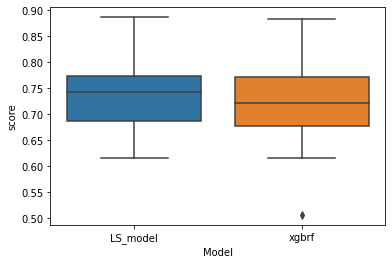

In [62]:
import seaborn as sns
sns.boxplot(data=results_df[results_df['metric']=='Rsquared'],
            x="Model", 
            y="score",
           )

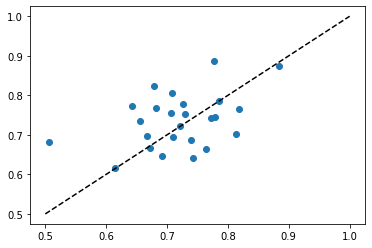

In [79]:
%matplotlib inline
import matplotlib.pyplot as plt
f,ax=plt.subplots()
ax.scatter(results_df.query('metric == "Rsquared" & Model == "xgbrf"')['score'],
            results_df.query('metric=="Rsquared" & Model =="LS_model"')['score'])
ax.plot([0.5,1], [0.5,1], c='k', linestyle='--')

### Results (Skip to next section)

In [ ]:
#Try with sklearn.preprocessing.RobustScaler for scaling targets
#Double-check on the features scaling


In [47]:
#RepeatedKFold 
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.721 +/- 0.0


ValueError: unequal length arrays

In [15]:
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.740 +/- 0.05667238473862471
Ttest_relResult(statistic=-0.8991194065100284, pvalue=0.4194221994325425)


[['LS_model', 0, 'RMSE', 0.7643364603383654],
 ['LS_model', 0, 'Rsquared', 0.8022580175167153],
 ['LS_model', 1, 'RMSE', 0.8278924964681317],
 ['LS_model', 1, 'Rsquared', 0.6638022618496336],
 ['LS_model', 2, 'RMSE', 0.8964601093012752],
 ['LS_model', 2, 'Rsquared', 0.6945204714477606],
 ['LS_model', 3, 'RMSE', 0.7882183823133733],
 ['LS_model', 3, 'Rsquared', 0.8053202751119408],
 ['LS_model', 4, 'RMSE', 0.8361618990842484],
 ['LS_model', 4, 'Rsquared', 0.7335522216950912]]

In [18]:
#Minmax scaling to (0.1,0.9)
#n_hidden=512; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.735 +/- 0.06902310710386812
Ttest_relResult(statistic=-0.5812311276422899, pvalue=0.5922624683949828)


[['LS_model', 0, 'RMSE', 0.6903701511249251],
 ['LS_model', 0, 'Rsquared', 0.8386779462594645],
 ['LS_model', 1, 'RMSE', 0.8431180972315595],
 ['LS_model', 1, 'Rsquared', 0.651322665584655],
 ['LS_model', 2, 'RMSE', 0.9079881674410575],
 ['LS_model', 2, 'Rsquared', 0.6866133070293041],
 ['LS_model', 3, 'RMSE', 0.8185739721497177],
 ['LS_model', 3, 'Rsquared', 0.7900366618934705],
 ['LS_model', 4, 'RMSE', 0.8745141031488032],
 ['LS_model', 4, 'Rsquared', 0.708549375745983]]

In [ ]:
#Somehow the model initialized with Adam/RMSprop/Nadam behaves very poorly

In [22]:
#n_hidden=512; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.727 +/- 0.06428996431531783
Ttest_relResult(statistic=-0.4057077742468438, pvalue=0.7057215953838318)


[['LS_model', 0, 'RMSE', 0.7685788201750529],
 ['LS_model', 0, 'Rsquared', 0.8000568383874719],
 ['LS_model', 1, 'RMSE', 0.8550357449047842],
 ['LS_model', 1, 'Rsquared', 0.64139574680552],
 ['LS_model', 2, 'RMSE', 0.9253199025104291],
 ['LS_model', 2, 'Rsquared', 0.6745352336026251],
 ['LS_model', 3, 'RMSE', 0.8005039976105258],
 ['LS_model', 3, 'Rsquared', 0.7992042039303607],
 ['LS_model', 4, 'RMSE', 0.8554940066555504],
 ['LS_model', 4, 'Rsquared', 0.7210892219300771]]

In [27]:
#l2 regularizers, attention_hidden_activation = leaky relu
#Kfold splits random seed=1234

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.740 +/- 0.04222589617290418
Ttest_relResult(statistic=-0.9438371379627587, pvalue=0.39869495347993167)


[['LS_model', 0, 'RMSE', 0.8599255390088614],
 ['LS_model', 0, 'Rsquared', 0.7497054317212815],
 ['LS_model', 1, 'RMSE', 0.7423365205665163],
 ['LS_model', 1, 'Rsquared', 0.7296984423482034],
 ['LS_model', 2, 'RMSE', 0.905574216761023],
 ['LS_model', 2, 'Rsquared', 0.6882774133322948],
 ['LS_model', 3, 'RMSE', 0.7696223059397426],
 ['LS_model', 3, 'Rsquared', 0.8143978945068729],
 ['LS_model', 4, 'RMSE', 0.8609240490618707],
 ['LS_model', 4, 'Rsquared', 0.7175373471197677]]

Ttest_relResult(statistic=-0.9438371379627587, pvalue=0.39869495347993167)

In [13]:
#Adadelta, learning_rate=0.01

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.743 +/- 0.12020918577102535


[['LS_model', 0, 'RMSE', 0.6775409767412629],
 ['LS_model', 0, 'Rsquared', 0.8358746519931927],
 ['LS_model', 1, 'RMSE', 0.726963762381779],
 ['LS_model', 1, 'Rsquared', 0.7953466403788493],
 ['LS_model', 2, 'RMSE', 0.5735556964671294],
 ['LS_model', 2, 'Rsquared', 0.8747989869241621],
 ['LS_model', 3, 'RMSE', 1.1568002270970126],
 ['LS_model', 3, 'Rsquared', 0.5540573140132545],
 ['LS_model', 4, 'RMSE', 0.9045627182516215],
 ['LS_model', 4, 'Rsquared', 0.6545970611083352]]

In [78]:
#Trying new variations:
#Learning rate=0.002; more epochs
#Orthogonal (orthonormal if #columns>=#rows) initializer; n_attention_out=2
#batch norm after activation; batch norm after hidden layers; 
#He_normal initializer (Tried and replaced);  
#LeakyReLU; l1 bias and kernel regularizers; Constant (0.01) bias initializer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.745 +/- 0.11912340074691877


[['LS_model', 0, 'RMSE', 0.6606182832194498],
 ['LS_model', 0, 'Rsquared', 0.8439708630516496],
 ['LS_model', 1, 'RMSE', 0.7188006434890145],
 ['LS_model', 1, 'Rsquared', 0.7999169645269679],
 ['LS_model', 2, 'RMSE', 0.5902572702759032],
 ['LS_model', 2, 'Rsquared', 0.867401278040431],
 ['LS_model', 3, 'RMSE', 1.1512434857995595],
 ['LS_model', 3, 'Rsquared', 0.5583312353326686],
 ['LS_model', 4, 'RMSE', 0.9055811792314892],
 ['LS_model', 4, 'Rsquared', 0.653818834357665]]

In [17]:
#Trying new variations:
#LeakyReLU; l1 bias and kernel regularizers; Constant (0.01) bias initializer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.731 +/- 0.135601988554609


[['LS_model', 0, 'RMSE', 0.6722845048448179],
 ['LS_model', 0, 'Rsquared', 0.8384113951495025],
 ['LS_model', 1, 'RMSE', 0.7008107438439005],
 ['LS_model', 1, 'Rsquared', 0.8098068569606427],
 ['LS_model', 2, 'RMSE', 0.6614601068448999],
 ['LS_model', 2, 'Rsquared', 0.8334809358451422],
 ['LS_model', 3, 'RMSE', 1.2468590800767432],
 ['LS_model', 3, 'Rsquared', 0.48191972264310357],
 ['LS_model', 4, 'RMSE', 0.8564036737907389],
 ['LS_model', 4, 'Rsquared', 0.6903966128658078]]

In [15]:
#Trying new variations:
#LeakyReLU; l1 bias and kernel regularizers
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.718 +/- 0.12264645042321175


[['LS_model', 0, 'RMSE', 0.7144448432897135],
 ['LS_model', 0, 'Rsquared', 0.8175087944841983],
 ['LS_model', 1, 'RMSE', 0.7452392622606231],
 ['LS_model', 1, 'Rsquared', 0.7849275375679201],
 ['LS_model', 2, 'RMSE', 0.6932238733321736],
 ['LS_model', 2, 'Rsquared', 0.8171042266285361],
 ['LS_model', 3, 'RMSE', 1.2297479139287588],
 ['LS_model', 3, 'Rsquared', 0.4960418140522592],
 ['LS_model', 4, 'RMSE', 0.8757506475043116],
 ['LS_model', 4, 'Rsquared', 0.676250136341393]]

In [22]:
#Trying new variations:
#LeakyReLU; l2 bias regularizer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.705 +/- 0.10357772623593761


[['LS_model', 0, 'RMSE', 0.7620107127395217],
 ['LS_model', 0, 'Rsquared', 0.7924003188924187],
 ['LS_model', 1, 'RMSE', 0.718821607032491],
 ['LS_model', 1, 'Rsquared', 0.7999052936676948],
 ['LS_model', 2, 'RMSE', 0.7706913335025768],
 ['LS_model', 2, 'Rsquared', 0.7739431879234585],
 ['LS_model', 3, 'RMSE', 1.1413624634258008],
 ['LS_model', 3, 'Rsquared', 0.5658803081173664],
 ['LS_model', 4, 'RMSE', 0.9837553826417396],
 ['LS_model', 4, 'Rsquared', 0.5914709884325542]]

In [ ]:
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

In [60]:
#Using subset of features (303) - n_hidden=512; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.687 +/- 0.12220488577824874


[['LS_model', 0, 'RMSE', 0.6967373332222753],
 ['LS_model', 0, 'Rsquared', 0.8264427772058969],
 ['LS_model', 1, 'RMSE', 1.049449659610995],
 ['LS_model', 1, 'Rsquared', 0.5735024162730559],
 ['LS_model', 2, 'RMSE', 0.6415401599279135],
 ['LS_model', 2, 'Rsquared', 0.8433593977525441],
 ['LS_model', 3, 'RMSE', 1.1319924066458187],
 ['LS_model', 3, 'Rsquared', 0.5729788928683146],
 ['LS_model', 4, 'RMSE', 0.9524836674436394],
 ['LS_model', 4, 'Rsquared', 0.6170308994116565]]

In [57]:
Rsquared_scores

array([0.82644278, 0.57350242, 0.8433594 , 0.57297889, 0.6170309 ])

In [22]:
#Using subset of features (100-200+) - n_hidden=512; Dropout 0.1; Adagrad
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7099932490439876],
 ['LS_model', 0, 'Rsquared', 0.8197758579572929],
 ['LS_model', 1, 'RMSE', 1.0063671942368868],
 ['LS_model', 1, 'Rsquared', 0.6078011686507043],
 ['LS_model', 2, 'RMSE', 0.8060592948161432],
 ['LS_model', 2, 'Rsquared', 0.7527190681573067],
 ['LS_model', 3, 'RMSE', 1.1300885514508938],
 ['LS_model', 3, 'Rsquared', 0.5744140662544505],
 ['LS_model', 4, 'RMSE', 0.9197688705103827],
 ['LS_model', 4, 'Rsquared', 0.6428866599473193]]

R^2 scores: 0.680 +/- 0.09226338271542076


In [54]:
#Using subset of features - n_hidden=512; Dropout 0.2; Adagrad
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.6782788676768158],
 ['LS_model', 0, 'Rsquared', 0.8355169686717168],
 ['LS_model', 1, 'RMSE', 0.7649396643731917],
 ['LS_model', 1, 'Rsquared', 0.7734063605462442],
 ['LS_model', 2, 'RMSE', 0.7430328855737924],
 ['LS_model', 2, 'Rsquared', 0.7898774227577623],
 ['LS_model', 3, 'RMSE', 1.3368260405903252],
 ['LS_model', 3, 'Rsquared', 0.4044583930186181],
 ['LS_model', 4, 'RMSE', 1.0637018939217608],
 ['LS_model', 4, 'Rsquared', 0.5223733785858484]]

In [51]:
#Using subset of features - n_hidden=512; Dropout 0.1
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.651534595641359],
 ['LS_model', 0, 'Rsquared', 0.8482322517979451],
 ['LS_model', 1, 'RMSE', 0.9067934001358763],
 ['LS_model', 1, 'Rsquared', 0.6815728761509823],
 ['LS_model', 2, 'RMSE', 0.7676428611923198],
 ['LS_model', 2, 'Rsquared', 0.775727988084741],
 ['LS_model', 3, 'RMSE', 1.30196865615461],
 ['LS_model', 3, 'Rsquared', 0.43511066805505283],
 ['LS_model', 4, 'RMSE', 0.9922147159849722],
 ['LS_model', 4, 'Rsquared', 0.5844148812816059]]

In [35]:
#Using all features - Not so good! 
LSwFW_model_results

[['LS_model', 0, 'RMSE', 1.013939222948929],
 ['LS_model', 0, 'Rsquared', 0.632439887955128],
 ['LS_model', 1, 'RMSE', 0.9179725670223282],
 ['LS_model', 1, 'Rsquared', 0.6736731876784152],
 ['LS_model', 2, 'RMSE', 0.8357156871103995],
 ['LS_model', 2, 'Rsquared', 0.7341885057953494],
 ['LS_model', 3, 'RMSE', 1.1569235886431786],
 ['LS_model', 3, 'Rsquared', 0.5539621980006288],
 ['LS_model', 4, 'RMSE', 1.1908417989368432],
 ['LS_model', 4, 'Rsquared', 0.4013723118732134]]

In [235]:
#Using subset of features (~100-200+)
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7000273664915143],
 ['LS_model', 0, 'Rsquared', 0.8247998131263967],
 ['LS_model', 1, 'RMSE', 0.8370737996562879],
 ['LS_model', 1, 'Rsquared', 0.7286556078131561],
 ['LS_model', 2, 'RMSE', 0.7947137428104315],
 ['LS_model', 2, 'Rsquared', 0.7596312004194039],
 ['LS_model', 3, 'RMSE', 1.0515723069185843],
 ['LS_model', 3, 'Rsquared', 0.6314973665103875],
 ['LS_model', 4, 'RMSE', 0.8376555439727413],
 ['LS_model', 4, 'Rsquared', 0.7038037236982555]]

In [47]:
#Using subset of features (~500+)- n_hidden=512 Not much better. Overfitting? 
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7415701997647108],
 ['LS_model', 0, 'Rsquared', 0.8033884320373097],
 ['LS_model', 1, 'RMSE', 0.9395701794909443],
 ['LS_model', 1, 'Rsquared', 0.6581372341324514],
 ['LS_model', 2, 'RMSE', 0.8944157904909297],
 ['LS_model', 2, 'Rsquared', 0.6955362698578893],
 ['LS_model', 3, 'RMSE', 1.1235861144657135],
 ['LS_model', 3, 'Rsquared', 0.5792975493622072],
 ['LS_model', 4, 'RMSE', 1.1909440172515886],
 ['LS_model', 4, 'Rsquared', 0.4012695386253996]]

In [66]:
attentions=LSwFW_model.layers[1](train_tensor_scaled)

In [78]:
from umap import UMAP
dr=UMAP(n_neighbors=30)
embed=dr.fit_transform(attentions)


In [91]:
attentions=LSwFW_model.layers[1](np.vstack([train_tensor_scaled, 
                                            test_tensor_scaled
                                           ]))
y=np.concatenate([train_target_scaled, test_target_scaled])

from sklearn.manifold import TSNE
dr=TSNE()
embed=dr.fit_transform(attentions)

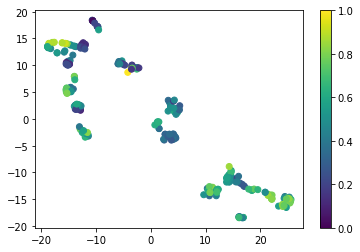

In [93]:

%matplotlib inline
import matplotlib.pyplot as plt
ax=plt.scatter(embed[:,0], embed[:,1], c=y)
plt.colorbar()

In [89]:
from sklearn.manifold import TSNE
dr=TSNE()
X=np.vstack([train_features_scaled, test_features_scaled])
y=np.concatenate([train_target_scaled, test_target_scaled])
embed=dr.fit_transform(X)


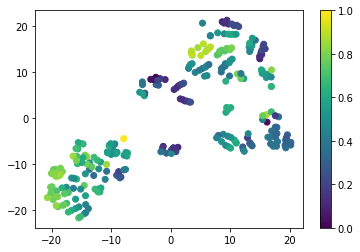

In [90]:

%matplotlib inline
import matplotlib.pyplot as plt
ax=plt.scatter(embed[:,0], embed[:,1], c=y)
plt.colorbar()

In [94]:
attentions

<tf.Tensor: shape=(278, 512), dtype=float32, numpy=
array([[ 0.5911365 , -1.4955912 ,  0.06898095, ..., -0.330205  ,
         0.52053857,  0.2093779 ],
       [ 0.25103754, -1.481384  , -0.5412576 , ...,  0.07170615,
         0.48337218,  0.47351393],
       [-0.39007747, -1.4446208 ,  0.47037584, ..., -0.3939123 ,
         0.38567215, -0.3690167 ],
       ...,
       [-1.5095239 , -0.75192404,  0.6724335 , ..., -0.43448618,
        -1.3399479 , -0.6554892 ],
       [-1.1030701 , -0.09076358, -1.3811833 , ..., -0.41498417,
         0.15673786, -0.5376275 ],
       [ 0.08091572, -0.35735577,  0.6353635 , ..., -0.93192357,
         0.16245705, -0.19017597]], dtype=float32)>

### Try some variations (Skip to next section)

In [11]:
from functools import partial

bias_regularizer=l2(1E-5)
hidden_activation=partial(tf.nn.leaky_relu, alpha=0.01)
concat_activation=partial(tf.nn.leaky_relu, alpha=0.01)

In [14]:
idx
n_out=1
n_feat=train_features_select.shape[1]

NameError: name 'train_features_select' is not defined

In [17]:
#Set up model


callbacks, checkpoint_path=setup_callback_paths("val_root_mean_square_error",
                           mode="min",
                           model_name="LSwFW_wDropouts_Adagrad_leakyReLU",
                           dataset_name="AChEi",
                           split_number=idx,
                           super_folder="Preliminary_Models"
                          )
tf.random.set_seed(123)
LSwFW_model=get_attentionwFW_model(n_attention,
                    n_attention_hidden,
                    n_feat,
                    n_concat_hidden,
                    concat_activation,
                    kernel_initializer,
                    attention_hidden_activation, 
                    attention_output_activation, 
                             n_hidden, 
                    hidden_activation, 
                    kernel_regularizer,
                    bias_regularizer)   

LSwFW_model.compile(
    optimizer=tf.keras.optimizers.Adagrad(learning_rate=learning_rate,
#         optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                   clipvalue=0.5,
                                                   clipnorm=1.0,
                                                  ),
                                  loss=tf.keras.losses.MAE,
                 metrics=["mae", "mse", 
                          tf.keras.metrics.RootMeanSquaredError()
                         ]
                 )

#Fit and train model
LSwFW_model.fit(train_ds,
             validation_data=test_ds,
             epochs=2000,
             callbacks=callbacks,
             verbose=0
            )    

#Evaluate model
LSwFW_model.load_weights(checkpoint_path)
test_predict=target_scaler.inverse_transform(
    LSwFW_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse=mean_squared_error(test_target, test_predict, squared=False)

r2=r2_score(test_target, test_predict, )
print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

NameError: name 'COSA' is not defined

# Train deep learner

In [18]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [19]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def get_dense_model(n_attention,
                           n_attention_hidden,
                           n_feat,
                           n_out,
                           n_concat_hidden,
                           concat_activation,
                           n_attention_out,
                           kernel_initializer,
                           bias_initializer,
                           attention_hidden_activation,
                           attention_output_activation,
                           n_hidden,
                           hidden_activation,
                           kernel_regularizer,
                           bias_regularizer,
                           random_seed=123):
    input_shape = (n_feat,)
    input_layer=Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    
    first_layer=Dense(n_attention*n_attention_hidden*4,
                      activation=hidden_activation,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer,
                      bias_initializer=bias_initializer,
                      bias_regularizer=bias_regularizer,
                     )(input_layer)
    
    dense_layer0=Dense(n_concat_hidden,
                       activation=hidden_activation,
                       kernel_initializer=kernel_initializer,
                       kernel_regularizer=kernel_regularizer,
                       bias_initializer=bias_initializer,
                       bias_regularizer=bias_regularizer,
                      )(first_layer)
    
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(dense_layer0)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    dense_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return dense_model    

In [72]:
from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]
all_features=df.iloc[:, feat_id:]

kf=KFold(n_splits=5, random_state=1234, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499, random_state=123)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())

selected_feat_ind=np.all(supports,axis=0)
print(f"{np.count_nonzero(selected_feat_ind)} features selected out of {train_features.shape[1]}")

selected_features=all_features.iloc[:,selected_feat_ind]
all_target=df['logki']


146 features selected out of 1646


In [20]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 10,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 1,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [21]:
def data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target
                ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()
    
    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [83]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

dense_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

#     cosa_mdl = COSA.NNCosa(n_iter=100,
#                            distance_measure='inv_exp_dist',
#                            calc_D_ijk=False)
#     cosa_mdl.fit(train_features)
#     cosa_mdl.fit_OOS(test_features)

#     train_features = train_features[:, cosa_mdl.valid_feat]
#     test_features = test_features[:, cosa_mdl.valid_feat]
#     train_Fweights = cosa_mdl.output_Fweight()
#     test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="Dense_RobustScaler_rkf",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="Preliminary_Models"
                                                      )

    final_selected_feat_ind = np.where(selected_feat_ind)[
        0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
#                'train_Fweights': train_Fweights,
#                'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    dense_model = get_dense_model(**model_setup_params
                                         )

    dense_model.compile(**model_compile_params)

    # Fit and train model
    dense_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    dense_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        dense_model(test_features_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    dense_model_results.append(["dense_model", idx, "RMSE", rmse])
    dense_model_results.append(["dense_model", idx, "Rsquared", r2])

    dense_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    



[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210327_Dense_RobustScaler_rkf_AChEi_split00'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210327_Dense_RobustScaler_rkf_AChEi_split00\\model_checkpoint'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.40927, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.40927

Epoch 00003: val_root_mean_squared_error improved from 0.40927 to 0.38195, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.38195

Epoch 00005: val_root_mean_squared_error improved from 0.38195 to 0.32926, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi


Epoch 00099: val_root_mean_squared_error did not improve from 0.26380

Epoch 00100: val_root_mean_squared_error did not improve from 0.26380

Epoch 00101: val_root_mean_squared_error did not improve from 0.26380

Epoch 00102: val_root_mean_squared_error did not improve from 0.26380

Epoch 00103: val_root_mean_squared_error did not improve from 0.26380

Epoch 00104: val_root_mean_squared_error did not improve from 0.26380

Epoch 00105: val_root_mean_squared_error did not improve from 0.26380

Epoch 00106: val_root_mean_squared_error did not improve from 0.26380

Epoch 00107: val_root_mean_squared_error did not improve from 0.26380

Epoch 00108: val_root_mean_squared_error did not improve from 0.26380

Epoch 00109: val_root_mean_squared_error did not improve from 0.26380

Epoch 00110: val_root_mean_squared_error did not improve from 0.26380

Epoch 00111: val_root_mean_squared_error did not improve from 0.26380

Epoch 00112: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.26380

Epoch 00216: val_root_mean_squared_error did not improve from 0.26380

Epoch 00217: val_root_mean_squared_error did not improve from 0.26380

Epoch 00218: val_root_mean_squared_error did not improve from 0.26380

Epoch 00219: val_root_mean_squared_error did not improve from 0.26380

Epoch 00220: val_root_mean_squared_error did not improve from 0.26380

Epoch 00221: val_root_mean_squared_error did not improve from 0.26380

Epoch 00222: val_root_mean_squared_error did not improve from 0.26380

Epoch 00223: val_root_mean_squared_error did not improve from 0.26380

Epoch 00224: val_root_mean_squared_error did not improve from 0.26380

Epoch 00225: val_root_mean_squared_error did not improve from 0.26380

Epoch 00226: val_root_mean_squared_error did not improve from 0.26380

Epoch 00227: val_root_mean_squared_error did not improve from 0.26380

Epoch 00228: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.26380

Epoch 00332: val_root_mean_squared_error did not improve from 0.26380

Epoch 00333: val_root_mean_squared_error did not improve from 0.26380

Epoch 00334: val_root_mean_squared_error did not improve from 0.26380

Epoch 00335: val_root_mean_squared_error did not improve from 0.26380

Epoch 00336: val_root_mean_squared_error did not improve from 0.26380

Epoch 00337: val_root_mean_squared_error did not improve from 0.26380

Epoch 00338: val_root_mean_squared_error did not improve from 0.26380

Epoch 00339: val_root_mean_squared_error did not improve from 0.26380

Epoch 00340: val_root_mean_squared_error did not improve from 0.26380

Epoch 00341: val_root_mean_squared_error did not improve from 0.26380

Epoch 00342: val_root_mean_squared_error did not improve from 0.26380

Epoch 00343: val_root_mean_squared_error did not improve from 0.26380

Epoch 00344: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.26380

Epoch 00448: val_root_mean_squared_error did not improve from 0.26380

Epoch 00449: val_root_mean_squared_error did not improve from 0.26380

Epoch 00450: val_root_mean_squared_error did not improve from 0.26380

Epoch 00451: val_root_mean_squared_error did not improve from 0.26380

Epoch 00452: val_root_mean_squared_error did not improve from 0.26380

Epoch 00453: val_root_mean_squared_error did not improve from 0.26380

Epoch 00454: val_root_mean_squared_error did not improve from 0.26380

Epoch 00455: val_root_mean_squared_error did not improve from 0.26380

Epoch 00456: val_root_mean_squared_error did not improve from 0.26380

Epoch 00457: val_root_mean_squared_error did not improve from 0.26380

Epoch 00458: val_root_mean_squared_error did not improve from 0.26380

Epoch 00459: val_root_mean_squared_error did not improve from 0.26380

Epoch 00460: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.26380

Epoch 00564: val_root_mean_squared_error did not improve from 0.26380

Epoch 00565: val_root_mean_squared_error did not improve from 0.26380

Epoch 00566: val_root_mean_squared_error did not improve from 0.26380

Epoch 00567: val_root_mean_squared_error did not improve from 0.26380

Epoch 00568: val_root_mean_squared_error did not improve from 0.26380

Epoch 00569: val_root_mean_squared_error did not improve from 0.26380

Epoch 00570: val_root_mean_squared_error did not improve from 0.26380

Epoch 00571: val_root_mean_squared_error did not improve from 0.26380

Epoch 00572: val_root_mean_squared_error did not improve from 0.26380

Epoch 00573: val_root_mean_squared_error did not improve from 0.26380

Epoch 00574: val_root_mean_squared_error did not improve from 0.26380

Epoch 00575: val_root_mean_squared_error did not improve from 0.26380

Epoch 00576: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.26380

Epoch 00680: val_root_mean_squared_error did not improve from 0.26380

Epoch 00681: val_root_mean_squared_error did not improve from 0.26380

Epoch 00682: val_root_mean_squared_error did not improve from 0.26380

Epoch 00683: val_root_mean_squared_error did not improve from 0.26380

Epoch 00684: val_root_mean_squared_error did not improve from 0.26380

Epoch 00685: val_root_mean_squared_error did not improve from 0.26380

Epoch 00686: val_root_mean_squared_error did not improve from 0.26380

Epoch 00687: val_root_mean_squared_error did not improve from 0.26380

Epoch 00688: val_root_mean_squared_error did not improve from 0.26380

Epoch 00689: val_root_mean_squared_error did not improve from 0.26380

Epoch 00690: val_root_mean_squared_error did not improve from 0.26380

Epoch 00691: val_root_mean_squared_error did not improve from 0.26380

Epoch 00692: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.26380

Epoch 00796: val_root_mean_squared_error did not improve from 0.26380

Epoch 00797: val_root_mean_squared_error did not improve from 0.26380

Epoch 00798: val_root_mean_squared_error did not improve from 0.26380

Epoch 00799: val_root_mean_squared_error did not improve from 0.26380

Epoch 00800: val_root_mean_squared_error did not improve from 0.26380

Epoch 00801: val_root_mean_squared_error did not improve from 0.26380

Epoch 00802: val_root_mean_squared_error did not improve from 0.26380

Epoch 00803: val_root_mean_squared_error did not improve from 0.26380

Epoch 00804: val_root_mean_squared_error did not improve from 0.26380

Epoch 00805: val_root_mean_squared_error did not improve from 0.26380

Epoch 00806: val_root_mean_squared_error did not improve from 0.26380

Epoch 00807: val_root_mean_squared_error did not improve from 0.26380

Epoch 00808: val_root_mean_squared_error did not improve from 0.26380

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.26380

Epoch 00912: val_root_mean_squared_error did not improve from 0.26380

Epoch 00913: val_root_mean_squared_error did not improve from 0.26380

Epoch 00914: val_root_mean_squared_error did not improve from 0.26380

Epoch 00915: val_root_mean_squared_error did not improve from 0.26380

Epoch 00916: val_root_mean_squared_error did not improve from 0.26380

Epoch 00917: val_root_mean_squared_error did not improve from 0.26380

Epoch 00918: val_root_mean_squared_error did not improve from 0.26380

Epoch 00919: val_root_mean_squared_error did not improve from 0.26380

Epoch 00920: val_root_mean_squared_error did not improve from 0.26380

Epoch 00921: val_root_mean_squared_error did not improve from 0.26380

Epoch 00922: val_root_mean_squared_error did not improve from 0.26380

Epoch 00923: val_root_mean_squared_error did not improve from 0.26380

Epoch 00924: val_root_mean_squared_error did not improve from 0.26380

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.44040, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.44040 to 0.33937, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.33937 to 0.33020, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.33020

Epoch 00005: val_root_mean_squared_error did not improve from 0.33020

Epoch 00006: val_root_mean_squared_error did not improve from 0.33020

Epoch 00007: val_root_mean_squared_error did not improve from 0.33020

Epoch 00008: val_root_mean_squared_error did not improve from 0.33020

Epoch 00009: val_root_mean_squared_error did


Epoch 00103: val_root_mean_squared_error did not improve from 0.29042

Epoch 00104: val_root_mean_squared_error did not improve from 0.29042

Epoch 00105: val_root_mean_squared_error did not improve from 0.29042

Epoch 00106: val_root_mean_squared_error did not improve from 0.29042

Epoch 00107: val_root_mean_squared_error did not improve from 0.29042

Epoch 00108: val_root_mean_squared_error did not improve from 0.29042

Epoch 00109: val_root_mean_squared_error did not improve from 0.29042

Epoch 00110: val_root_mean_squared_error did not improve from 0.29042

Epoch 00111: val_root_mean_squared_error did not improve from 0.29042

Epoch 00112: val_root_mean_squared_error did not improve from 0.29042

Epoch 00113: val_root_mean_squared_error did not improve from 0.29042

Epoch 00114: val_root_mean_squared_error did not improve from 0.29042

Epoch 00115: val_root_mean_squared_error did not improve from 0.29042

Epoch 00116: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.29042

Epoch 00220: val_root_mean_squared_error did not improve from 0.29042

Epoch 00221: val_root_mean_squared_error did not improve from 0.29042

Epoch 00222: val_root_mean_squared_error did not improve from 0.29042

Epoch 00223: val_root_mean_squared_error did not improve from 0.29042

Epoch 00224: val_root_mean_squared_error did not improve from 0.29042

Epoch 00225: val_root_mean_squared_error did not improve from 0.29042

Epoch 00226: val_root_mean_squared_error did not improve from 0.29042

Epoch 00227: val_root_mean_squared_error did not improve from 0.29042

Epoch 00228: val_root_mean_squared_error did not improve from 0.29042

Epoch 00229: val_root_mean_squared_error did not improve from 0.29042

Epoch 00230: val_root_mean_squared_error did not improve from 0.29042

Epoch 00231: val_root_mean_squared_error did not improve from 0.29042

Epoch 00232: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.29042

Epoch 00336: val_root_mean_squared_error did not improve from 0.29042

Epoch 00337: val_root_mean_squared_error did not improve from 0.29042

Epoch 00338: val_root_mean_squared_error did not improve from 0.29042

Epoch 00339: val_root_mean_squared_error did not improve from 0.29042

Epoch 00340: val_root_mean_squared_error did not improve from 0.29042

Epoch 00341: val_root_mean_squared_error did not improve from 0.29042

Epoch 00342: val_root_mean_squared_error did not improve from 0.29042

Epoch 00343: val_root_mean_squared_error did not improve from 0.29042

Epoch 00344: val_root_mean_squared_error did not improve from 0.29042

Epoch 00345: val_root_mean_squared_error did not improve from 0.29042

Epoch 00346: val_root_mean_squared_error did not improve from 0.29042

Epoch 00347: val_root_mean_squared_error did not improve from 0.29042

Epoch 00348: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.29042

Epoch 00452: val_root_mean_squared_error did not improve from 0.29042

Epoch 00453: val_root_mean_squared_error did not improve from 0.29042

Epoch 00454: val_root_mean_squared_error did not improve from 0.29042

Epoch 00455: val_root_mean_squared_error did not improve from 0.29042

Epoch 00456: val_root_mean_squared_error did not improve from 0.29042

Epoch 00457: val_root_mean_squared_error did not improve from 0.29042

Epoch 00458: val_root_mean_squared_error did not improve from 0.29042

Epoch 00459: val_root_mean_squared_error did not improve from 0.29042

Epoch 00460: val_root_mean_squared_error did not improve from 0.29042

Epoch 00461: val_root_mean_squared_error did not improve from 0.29042

Epoch 00462: val_root_mean_squared_error did not improve from 0.29042

Epoch 00463: val_root_mean_squared_error did not improve from 0.29042

Epoch 00464: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.29042

Epoch 00568: val_root_mean_squared_error did not improve from 0.29042

Epoch 00569: val_root_mean_squared_error did not improve from 0.29042

Epoch 00570: val_root_mean_squared_error did not improve from 0.29042

Epoch 00571: val_root_mean_squared_error did not improve from 0.29042

Epoch 00572: val_root_mean_squared_error did not improve from 0.29042

Epoch 00573: val_root_mean_squared_error did not improve from 0.29042

Epoch 00574: val_root_mean_squared_error did not improve from 0.29042

Epoch 00575: val_root_mean_squared_error did not improve from 0.29042

Epoch 00576: val_root_mean_squared_error did not improve from 0.29042

Epoch 00577: val_root_mean_squared_error did not improve from 0.29042

Epoch 00578: val_root_mean_squared_error did not improve from 0.29042

Epoch 00579: val_root_mean_squared_error did not improve from 0.29042

Epoch 00580: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.29042

Epoch 00684: val_root_mean_squared_error did not improve from 0.29042

Epoch 00685: val_root_mean_squared_error did not improve from 0.29042

Epoch 00686: val_root_mean_squared_error did not improve from 0.29042

Epoch 00687: val_root_mean_squared_error did not improve from 0.29042

Epoch 00688: val_root_mean_squared_error did not improve from 0.29042

Epoch 00689: val_root_mean_squared_error did not improve from 0.29042

Epoch 00690: val_root_mean_squared_error did not improve from 0.29042

Epoch 00691: val_root_mean_squared_error did not improve from 0.29042

Epoch 00692: val_root_mean_squared_error did not improve from 0.29042

Epoch 00693: val_root_mean_squared_error did not improve from 0.29042

Epoch 00694: val_root_mean_squared_error did not improve from 0.29042

Epoch 00695: val_root_mean_squared_error did not improve from 0.29042

Epoch 00696: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.29042

Epoch 00800: val_root_mean_squared_error did not improve from 0.29042

Epoch 00801: val_root_mean_squared_error did not improve from 0.29042

Epoch 00802: val_root_mean_squared_error did not improve from 0.29042

Epoch 00803: val_root_mean_squared_error did not improve from 0.29042

Epoch 00804: val_root_mean_squared_error did not improve from 0.29042

Epoch 00805: val_root_mean_squared_error did not improve from 0.29042

Epoch 00806: val_root_mean_squared_error did not improve from 0.29042

Epoch 00807: val_root_mean_squared_error did not improve from 0.29042

Epoch 00808: val_root_mean_squared_error did not improve from 0.29042

Epoch 00809: val_root_mean_squared_error did not improve from 0.29042

Epoch 00810: val_root_mean_squared_error did not improve from 0.29042

Epoch 00811: val_root_mean_squared_error did not improve from 0.29042

Epoch 00812: val_root_mean_squared_error did not improve from 0.29042

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.29042

Epoch 00916: val_root_mean_squared_error did not improve from 0.29042

Epoch 00917: val_root_mean_squared_error did not improve from 0.29042

Epoch 00918: val_root_mean_squared_error did not improve from 0.29042

Epoch 00919: val_root_mean_squared_error did not improve from 0.29042

Epoch 00920: val_root_mean_squared_error did not improve from 0.29042

Epoch 00921: val_root_mean_squared_error did not improve from 0.29042

Epoch 00922: val_root_mean_squared_error did not improve from 0.29042

Epoch 00923: val_root_mean_squared_error did not improve from 0.29042

Epoch 00924: val_root_mean_squared_error did not improve from 0.29042

Epoch 00925: val_root_mean_squared_error did not improve from 0.29042

Epoch 00926: val_root_mean_squared_error did not improve from 0.29042

Epoch 00927: val_root_mean_squared_error did not improve from 0.29042

Epoch 00928: val_root_mean_squared_error did not improve from 0.29042

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42624, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42624 to 0.38484, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.38484

Epoch 00004: val_root_mean_squared_error improved from 0.38484 to 0.34363, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.34363

Epoch 00006: val_root_mean_squared_error improved from 0.34363 to 0.33735, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.33735

Epoch 00008: v


Epoch 00103: val_root_mean_squared_error did not improve from 0.30629

Epoch 00104: val_root_mean_squared_error did not improve from 0.30629

Epoch 00105: val_root_mean_squared_error did not improve from 0.30629

Epoch 00106: val_root_mean_squared_error did not improve from 0.30629

Epoch 00107: val_root_mean_squared_error did not improve from 0.30629

Epoch 00108: val_root_mean_squared_error did not improve from 0.30629

Epoch 00109: val_root_mean_squared_error did not improve from 0.30629

Epoch 00110: val_root_mean_squared_error did not improve from 0.30629

Epoch 00111: val_root_mean_squared_error did not improve from 0.30629

Epoch 00112: val_root_mean_squared_error did not improve from 0.30629

Epoch 00113: val_root_mean_squared_error did not improve from 0.30629

Epoch 00114: val_root_mean_squared_error did not improve from 0.30629

Epoch 00115: val_root_mean_squared_error did not improve from 0.30629

Epoch 00116: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.30629

Epoch 00220: val_root_mean_squared_error did not improve from 0.30629

Epoch 00221: val_root_mean_squared_error did not improve from 0.30629

Epoch 00222: val_root_mean_squared_error did not improve from 0.30629

Epoch 00223: val_root_mean_squared_error did not improve from 0.30629

Epoch 00224: val_root_mean_squared_error did not improve from 0.30629

Epoch 00225: val_root_mean_squared_error did not improve from 0.30629

Epoch 00226: val_root_mean_squared_error did not improve from 0.30629

Epoch 00227: val_root_mean_squared_error did not improve from 0.30629

Epoch 00228: val_root_mean_squared_error did not improve from 0.30629

Epoch 00229: val_root_mean_squared_error did not improve from 0.30629

Epoch 00230: val_root_mean_squared_error did not improve from 0.30629

Epoch 00231: val_root_mean_squared_error did not improve from 0.30629

Epoch 00232: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.30629

Epoch 00336: val_root_mean_squared_error did not improve from 0.30629

Epoch 00337: val_root_mean_squared_error did not improve from 0.30629

Epoch 00338: val_root_mean_squared_error did not improve from 0.30629

Epoch 00339: val_root_mean_squared_error did not improve from 0.30629

Epoch 00340: val_root_mean_squared_error did not improve from 0.30629

Epoch 00341: val_root_mean_squared_error did not improve from 0.30629

Epoch 00342: val_root_mean_squared_error did not improve from 0.30629

Epoch 00343: val_root_mean_squared_error did not improve from 0.30629

Epoch 00344: val_root_mean_squared_error did not improve from 0.30629

Epoch 00345: val_root_mean_squared_error did not improve from 0.30629

Epoch 00346: val_root_mean_squared_error did not improve from 0.30629

Epoch 00347: val_root_mean_squared_error did not improve from 0.30629

Epoch 00348: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.30629

Epoch 00452: val_root_mean_squared_error did not improve from 0.30629

Epoch 00453: val_root_mean_squared_error did not improve from 0.30629

Epoch 00454: val_root_mean_squared_error did not improve from 0.30629

Epoch 00455: val_root_mean_squared_error did not improve from 0.30629

Epoch 00456: val_root_mean_squared_error did not improve from 0.30629

Epoch 00457: val_root_mean_squared_error did not improve from 0.30629

Epoch 00458: val_root_mean_squared_error did not improve from 0.30629

Epoch 00459: val_root_mean_squared_error did not improve from 0.30629

Epoch 00460: val_root_mean_squared_error did not improve from 0.30629

Epoch 00461: val_root_mean_squared_error did not improve from 0.30629

Epoch 00462: val_root_mean_squared_error did not improve from 0.30629

Epoch 00463: val_root_mean_squared_error did not improve from 0.30629

Epoch 00464: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.30629

Epoch 00568: val_root_mean_squared_error did not improve from 0.30629

Epoch 00569: val_root_mean_squared_error did not improve from 0.30629

Epoch 00570: val_root_mean_squared_error did not improve from 0.30629

Epoch 00571: val_root_mean_squared_error did not improve from 0.30629

Epoch 00572: val_root_mean_squared_error did not improve from 0.30629

Epoch 00573: val_root_mean_squared_error did not improve from 0.30629

Epoch 00574: val_root_mean_squared_error did not improve from 0.30629

Epoch 00575: val_root_mean_squared_error did not improve from 0.30629

Epoch 00576: val_root_mean_squared_error did not improve from 0.30629

Epoch 00577: val_root_mean_squared_error did not improve from 0.30629

Epoch 00578: val_root_mean_squared_error did not improve from 0.30629

Epoch 00579: val_root_mean_squared_error did not improve from 0.30629

Epoch 00580: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.30629

Epoch 00684: val_root_mean_squared_error did not improve from 0.30629

Epoch 00685: val_root_mean_squared_error did not improve from 0.30629

Epoch 00686: val_root_mean_squared_error did not improve from 0.30629

Epoch 00687: val_root_mean_squared_error did not improve from 0.30629

Epoch 00688: val_root_mean_squared_error did not improve from 0.30629

Epoch 00689: val_root_mean_squared_error did not improve from 0.30629

Epoch 00690: val_root_mean_squared_error did not improve from 0.30629

Epoch 00691: val_root_mean_squared_error did not improve from 0.30629

Epoch 00692: val_root_mean_squared_error did not improve from 0.30629

Epoch 00693: val_root_mean_squared_error did not improve from 0.30629

Epoch 00694: val_root_mean_squared_error did not improve from 0.30629

Epoch 00695: val_root_mean_squared_error did not improve from 0.30629

Epoch 00696: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.30629

Epoch 00800: val_root_mean_squared_error did not improve from 0.30629

Epoch 00801: val_root_mean_squared_error did not improve from 0.30629

Epoch 00802: val_root_mean_squared_error did not improve from 0.30629

Epoch 00803: val_root_mean_squared_error did not improve from 0.30629

Epoch 00804: val_root_mean_squared_error did not improve from 0.30629

Epoch 00805: val_root_mean_squared_error did not improve from 0.30629

Epoch 00806: val_root_mean_squared_error did not improve from 0.30629

Epoch 00807: val_root_mean_squared_error did not improve from 0.30629

Epoch 00808: val_root_mean_squared_error did not improve from 0.30629

Epoch 00809: val_root_mean_squared_error did not improve from 0.30629

Epoch 00810: val_root_mean_squared_error did not improve from 0.30629

Epoch 00811: val_root_mean_squared_error did not improve from 0.30629

Epoch 00812: val_root_mean_squared_error did not improve from 0.30629

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.30629

Epoch 00916: val_root_mean_squared_error did not improve from 0.30629

Epoch 00917: val_root_mean_squared_error did not improve from 0.30629

Epoch 00918: val_root_mean_squared_error did not improve from 0.30629

Epoch 00919: val_root_mean_squared_error did not improve from 0.30629

Epoch 00920: val_root_mean_squared_error did not improve from 0.30629

Epoch 00921: val_root_mean_squared_error did not improve from 0.30629

Epoch 00922: val_root_mean_squared_error did not improve from 0.30629

Epoch 00923: val_root_mean_squared_error did not improve from 0.30629

Epoch 00924: val_root_mean_squared_error did not improve from 0.30629

Epoch 00925: val_root_mean_squared_error did not improve from 0.30629

Epoch 00926: val_root_mean_squared_error did not improve from 0.30629

Epoch 00927: val_root_mean_squared_error did not improve from 0.30629

Epoch 00928: val_root_mean_squared_error did not improve from 0.30629

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57594, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.57594 to 0.45680, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.45680 to 0.44337, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.44337 to 0.42727, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.42727

Epoch 00006: val_root_mean_squared_error improved from 0.42727 to 0.42479, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split03\mo


Epoch 00101: val_root_mean_squared_error did not improve from 0.36531

Epoch 00102: val_root_mean_squared_error did not improve from 0.36531

Epoch 00103: val_root_mean_squared_error did not improve from 0.36531

Epoch 00104: val_root_mean_squared_error did not improve from 0.36531

Epoch 00105: val_root_mean_squared_error did not improve from 0.36531

Epoch 00106: val_root_mean_squared_error did not improve from 0.36531

Epoch 00107: val_root_mean_squared_error did not improve from 0.36531

Epoch 00108: val_root_mean_squared_error did not improve from 0.36531

Epoch 00109: val_root_mean_squared_error did not improve from 0.36531

Epoch 00110: val_root_mean_squared_error did not improve from 0.36531

Epoch 00111: val_root_mean_squared_error did not improve from 0.36531

Epoch 00112: val_root_mean_squared_error did not improve from 0.36531

Epoch 00113: val_root_mean_squared_error did not improve from 0.36531

Epoch 00114: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.36531

Epoch 00218: val_root_mean_squared_error did not improve from 0.36531

Epoch 00219: val_root_mean_squared_error did not improve from 0.36531

Epoch 00220: val_root_mean_squared_error did not improve from 0.36531

Epoch 00221: val_root_mean_squared_error did not improve from 0.36531

Epoch 00222: val_root_mean_squared_error did not improve from 0.36531

Epoch 00223: val_root_mean_squared_error did not improve from 0.36531

Epoch 00224: val_root_mean_squared_error did not improve from 0.36531

Epoch 00225: val_root_mean_squared_error did not improve from 0.36531

Epoch 00226: val_root_mean_squared_error did not improve from 0.36531

Epoch 00227: val_root_mean_squared_error did not improve from 0.36531

Epoch 00228: val_root_mean_squared_error did not improve from 0.36531

Epoch 00229: val_root_mean_squared_error did not improve from 0.36531

Epoch 00230: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.36531

Epoch 00334: val_root_mean_squared_error did not improve from 0.36531

Epoch 00335: val_root_mean_squared_error did not improve from 0.36531

Epoch 00336: val_root_mean_squared_error did not improve from 0.36531

Epoch 00337: val_root_mean_squared_error did not improve from 0.36531

Epoch 00338: val_root_mean_squared_error did not improve from 0.36531

Epoch 00339: val_root_mean_squared_error did not improve from 0.36531

Epoch 00340: val_root_mean_squared_error did not improve from 0.36531

Epoch 00341: val_root_mean_squared_error did not improve from 0.36531

Epoch 00342: val_root_mean_squared_error did not improve from 0.36531

Epoch 00343: val_root_mean_squared_error did not improve from 0.36531

Epoch 00344: val_root_mean_squared_error did not improve from 0.36531

Epoch 00345: val_root_mean_squared_error did not improve from 0.36531

Epoch 00346: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.36531

Epoch 00450: val_root_mean_squared_error did not improve from 0.36531

Epoch 00451: val_root_mean_squared_error did not improve from 0.36531

Epoch 00452: val_root_mean_squared_error did not improve from 0.36531

Epoch 00453: val_root_mean_squared_error did not improve from 0.36531

Epoch 00454: val_root_mean_squared_error did not improve from 0.36531

Epoch 00455: val_root_mean_squared_error did not improve from 0.36531

Epoch 00456: val_root_mean_squared_error did not improve from 0.36531

Epoch 00457: val_root_mean_squared_error did not improve from 0.36531

Epoch 00458: val_root_mean_squared_error did not improve from 0.36531

Epoch 00459: val_root_mean_squared_error did not improve from 0.36531

Epoch 00460: val_root_mean_squared_error did not improve from 0.36531

Epoch 00461: val_root_mean_squared_error did not improve from 0.36531

Epoch 00462: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.36531

Epoch 00566: val_root_mean_squared_error did not improve from 0.36531

Epoch 00567: val_root_mean_squared_error did not improve from 0.36531

Epoch 00568: val_root_mean_squared_error did not improve from 0.36531

Epoch 00569: val_root_mean_squared_error did not improve from 0.36531

Epoch 00570: val_root_mean_squared_error did not improve from 0.36531

Epoch 00571: val_root_mean_squared_error did not improve from 0.36531

Epoch 00572: val_root_mean_squared_error did not improve from 0.36531

Epoch 00573: val_root_mean_squared_error did not improve from 0.36531

Epoch 00574: val_root_mean_squared_error did not improve from 0.36531

Epoch 00575: val_root_mean_squared_error did not improve from 0.36531

Epoch 00576: val_root_mean_squared_error did not improve from 0.36531

Epoch 00577: val_root_mean_squared_error did not improve from 0.36531

Epoch 00578: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.36531

Epoch 00682: val_root_mean_squared_error did not improve from 0.36531

Epoch 00683: val_root_mean_squared_error did not improve from 0.36531

Epoch 00684: val_root_mean_squared_error did not improve from 0.36531

Epoch 00685: val_root_mean_squared_error did not improve from 0.36531

Epoch 00686: val_root_mean_squared_error did not improve from 0.36531

Epoch 00687: val_root_mean_squared_error did not improve from 0.36531

Epoch 00688: val_root_mean_squared_error did not improve from 0.36531

Epoch 00689: val_root_mean_squared_error did not improve from 0.36531

Epoch 00690: val_root_mean_squared_error did not improve from 0.36531

Epoch 00691: val_root_mean_squared_error did not improve from 0.36531

Epoch 00692: val_root_mean_squared_error did not improve from 0.36531

Epoch 00693: val_root_mean_squared_error did not improve from 0.36531

Epoch 00694: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.36531

Epoch 00798: val_root_mean_squared_error did not improve from 0.36531

Epoch 00799: val_root_mean_squared_error did not improve from 0.36531

Epoch 00800: val_root_mean_squared_error did not improve from 0.36531

Epoch 00801: val_root_mean_squared_error did not improve from 0.36531

Epoch 00802: val_root_mean_squared_error did not improve from 0.36531

Epoch 00803: val_root_mean_squared_error did not improve from 0.36531

Epoch 00804: val_root_mean_squared_error did not improve from 0.36531

Epoch 00805: val_root_mean_squared_error did not improve from 0.36531

Epoch 00806: val_root_mean_squared_error did not improve from 0.36531

Epoch 00807: val_root_mean_squared_error did not improve from 0.36531

Epoch 00808: val_root_mean_squared_error did not improve from 0.36531

Epoch 00809: val_root_mean_squared_error did not improve from 0.36531

Epoch 00810: val_root_mean_squared_error did not improve from 0.36531

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.36531

Epoch 00914: val_root_mean_squared_error did not improve from 0.36531

Epoch 00915: val_root_mean_squared_error did not improve from 0.36531

Epoch 00916: val_root_mean_squared_error did not improve from 0.36531

Epoch 00917: val_root_mean_squared_error did not improve from 0.36531

Epoch 00918: val_root_mean_squared_error did not improve from 0.36531

Epoch 00919: val_root_mean_squared_error did not improve from 0.36531

Epoch 00920: val_root_mean_squared_error did not improve from 0.36531

Epoch 00921: val_root_mean_squared_error did not improve from 0.36531

Epoch 00922: val_root_mean_squared_error did not improve from 0.36531

Epoch 00923: val_root_mean_squared_error did not improve from 0.36531

Epoch 00924: val_root_mean_squared_error did not improve from 0.36531

Epoch 00925: val_root_mean_squared_error did not improve from 0.36531

Epoch 00926: val_root_mean_squared_error did not improve from 0.36531

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.43458, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.43458 to 0.40304, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.40304 to 0.35890, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.35890

Epoch 00005: val_root_mean_squared_error did not improve from 0.35890

Epoch 00006: val_root_mean_squared_error improved from 0.35890 to 0.26906, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.26906

Epoch 00008: v


Epoch 00103: val_root_mean_squared_error did not improve from 0.23603

Epoch 00104: val_root_mean_squared_error did not improve from 0.23603

Epoch 00105: val_root_mean_squared_error did not improve from 0.23603

Epoch 00106: val_root_mean_squared_error did not improve from 0.23603

Epoch 00107: val_root_mean_squared_error did not improve from 0.23603

Epoch 00108: val_root_mean_squared_error did not improve from 0.23603

Epoch 00109: val_root_mean_squared_error did not improve from 0.23603

Epoch 00110: val_root_mean_squared_error did not improve from 0.23603

Epoch 00111: val_root_mean_squared_error did not improve from 0.23603

Epoch 00112: val_root_mean_squared_error improved from 0.23603 to 0.22786, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00113: val_root_mean_squared_error did not improve from 0.22786

Epoch 00114: val_root_mean_squared_error did not improve from 0.22786

Epoch 00115: val_root_mean_squared_error did n


Epoch 00216: val_root_mean_squared_error did not improve from 0.22048

Epoch 00217: val_root_mean_squared_error did not improve from 0.22048

Epoch 00218: val_root_mean_squared_error did not improve from 0.22048

Epoch 00219: val_root_mean_squared_error did not improve from 0.22048

Epoch 00220: val_root_mean_squared_error did not improve from 0.22048

Epoch 00221: val_root_mean_squared_error did not improve from 0.22048

Epoch 00222: val_root_mean_squared_error did not improve from 0.22048

Epoch 00223: val_root_mean_squared_error did not improve from 0.22048

Epoch 00224: val_root_mean_squared_error did not improve from 0.22048

Epoch 00225: val_root_mean_squared_error did not improve from 0.22048

Epoch 00226: val_root_mean_squared_error did not improve from 0.22048

Epoch 00227: val_root_mean_squared_error did not improve from 0.22048

Epoch 00228: val_root_mean_squared_error did not improve from 0.22048

Epoch 00229: val_root_mean_squared_error did not improve from 0.22048

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.21974

Epoch 00331: val_root_mean_squared_error did not improve from 0.21974

Epoch 00332: val_root_mean_squared_error did not improve from 0.21974

Epoch 00333: val_root_mean_squared_error did not improve from 0.21974

Epoch 00334: val_root_mean_squared_error did not improve from 0.21974

Epoch 00335: val_root_mean_squared_error did not improve from 0.21974

Epoch 00336: val_root_mean_squared_error did not improve from 0.21974

Epoch 00337: val_root_mean_squared_error did not improve from 0.21974

Epoch 00338: val_root_mean_squared_error did not improve from 0.21974

Epoch 00339: val_root_mean_squared_error did not improve from 0.21974

Epoch 00340: val_root_mean_squared_error did not improve from 0.21974

Epoch 00341: val_root_mean_squared_error did not improve from 0.21974

Epoch 00342: val_root_mean_squared_error did not improve from 0.21974

Epoch 00343: val_root_mean_squared_error did not improve from 0.21974

Epoch


Epoch 00444: val_root_mean_squared_error did not improve from 0.21967

Epoch 00445: val_root_mean_squared_error did not improve from 0.21967

Epoch 00446: val_root_mean_squared_error did not improve from 0.21967

Epoch 00447: val_root_mean_squared_error did not improve from 0.21967

Epoch 00448: val_root_mean_squared_error did not improve from 0.21967

Epoch 00449: val_root_mean_squared_error did not improve from 0.21967

Epoch 00450: val_root_mean_squared_error did not improve from 0.21967

Epoch 00451: val_root_mean_squared_error did not improve from 0.21967

Epoch 00452: val_root_mean_squared_error did not improve from 0.21967

Epoch 00453: val_root_mean_squared_error did not improve from 0.21967

Epoch 00454: val_root_mean_squared_error did not improve from 0.21967

Epoch 00455: val_root_mean_squared_error did not improve from 0.21967

Epoch 00456: val_root_mean_squared_error did not improve from 0.21967

Epoch 00457: val_root_mean_squared_error did not improve from 0.21967

Epoch


Epoch 00560: val_root_mean_squared_error did not improve from 0.21967

Epoch 00561: val_root_mean_squared_error did not improve from 0.21967

Epoch 00562: val_root_mean_squared_error did not improve from 0.21967

Epoch 00563: val_root_mean_squared_error did not improve from 0.21967

Epoch 00564: val_root_mean_squared_error did not improve from 0.21967

Epoch 00565: val_root_mean_squared_error did not improve from 0.21967

Epoch 00566: val_root_mean_squared_error did not improve from 0.21967

Epoch 00567: val_root_mean_squared_error did not improve from 0.21967

Epoch 00568: val_root_mean_squared_error did not improve from 0.21967

Epoch 00569: val_root_mean_squared_error did not improve from 0.21967

Epoch 00570: val_root_mean_squared_error did not improve from 0.21967

Epoch 00571: val_root_mean_squared_error did not improve from 0.21967

Epoch 00572: val_root_mean_squared_error did not improve from 0.21967

Epoch 00573: val_root_mean_squared_error did not improve from 0.21967

Epoch


Epoch 00676: val_root_mean_squared_error did not improve from 0.21967

Epoch 00677: val_root_mean_squared_error did not improve from 0.21967

Epoch 00678: val_root_mean_squared_error did not improve from 0.21967

Epoch 00679: val_root_mean_squared_error did not improve from 0.21967

Epoch 00680: val_root_mean_squared_error did not improve from 0.21967

Epoch 00681: val_root_mean_squared_error did not improve from 0.21967

Epoch 00682: val_root_mean_squared_error did not improve from 0.21967

Epoch 00683: val_root_mean_squared_error did not improve from 0.21967

Epoch 00684: val_root_mean_squared_error did not improve from 0.21967

Epoch 00685: val_root_mean_squared_error did not improve from 0.21967

Epoch 00686: val_root_mean_squared_error did not improve from 0.21967

Epoch 00687: val_root_mean_squared_error did not improve from 0.21967

Epoch 00688: val_root_mean_squared_error did not improve from 0.21967

Epoch 00689: val_root_mean_squared_error did not improve from 0.21967

Epoch


Epoch 00792: val_root_mean_squared_error did not improve from 0.21967

Epoch 00793: val_root_mean_squared_error did not improve from 0.21967

Epoch 00794: val_root_mean_squared_error did not improve from 0.21967

Epoch 00795: val_root_mean_squared_error did not improve from 0.21967

Epoch 00796: val_root_mean_squared_error did not improve from 0.21967

Epoch 00797: val_root_mean_squared_error did not improve from 0.21967

Epoch 00798: val_root_mean_squared_error did not improve from 0.21967

Epoch 00799: val_root_mean_squared_error did not improve from 0.21967

Epoch 00800: val_root_mean_squared_error did not improve from 0.21967

Epoch 00801: val_root_mean_squared_error did not improve from 0.21967

Epoch 00802: val_root_mean_squared_error did not improve from 0.21967

Epoch 00803: val_root_mean_squared_error did not improve from 0.21967

Epoch 00804: val_root_mean_squared_error did not improve from 0.21967

Epoch 00805: val_root_mean_squared_error did not improve from 0.21967

Epoch


Epoch 00908: val_root_mean_squared_error did not improve from 0.21967

Epoch 00909: val_root_mean_squared_error did not improve from 0.21967

Epoch 00910: val_root_mean_squared_error did not improve from 0.21967

Epoch 00911: val_root_mean_squared_error did not improve from 0.21967

Epoch 00912: val_root_mean_squared_error did not improve from 0.21967

Epoch 00913: val_root_mean_squared_error did not improve from 0.21967

Epoch 00914: val_root_mean_squared_error did not improve from 0.21967

Epoch 00915: val_root_mean_squared_error did not improve from 0.21967

Epoch 00916: val_root_mean_squared_error did not improve from 0.21967

Epoch 00917: val_root_mean_squared_error did not improve from 0.21967

Epoch 00918: val_root_mean_squared_error did not improve from 0.21967

Epoch 00919: val_root_mean_squared_error did not improve from 0.21967

Epoch 00920: val_root_mean_squared_error did not improve from 0.21967

Epoch 00921: val_root_mean_squared_error did not improve from 0.21967

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42078, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42078 to 0.36666, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.36666 to 0.31925, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.31925 to 0.29207, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.29207

Epoch 00006: val_root_mean_squared_error did not improve from 0.29207

Epoch 00007: val_root_mean_squared_error did not improve from 0.29207

Epoch 00008: v


Epoch 00106: val_root_mean_squared_error did not improve from 0.27561

Epoch 00107: val_root_mean_squared_error did not improve from 0.27561

Epoch 00108: val_root_mean_squared_error did not improve from 0.27561

Epoch 00109: val_root_mean_squared_error did not improve from 0.27561

Epoch 00110: val_root_mean_squared_error did not improve from 0.27561

Epoch 00111: val_root_mean_squared_error did not improve from 0.27561

Epoch 00112: val_root_mean_squared_error did not improve from 0.27561

Epoch 00113: val_root_mean_squared_error did not improve from 0.27561

Epoch 00114: val_root_mean_squared_error did not improve from 0.27561

Epoch 00115: val_root_mean_squared_error did not improve from 0.27561

Epoch 00116: val_root_mean_squared_error did not improve from 0.27561

Epoch 00117: val_root_mean_squared_error did not improve from 0.27561

Epoch 00118: val_root_mean_squared_error did not improve from 0.27561

Epoch 00119: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.27561

Epoch 00223: val_root_mean_squared_error did not improve from 0.27561

Epoch 00224: val_root_mean_squared_error did not improve from 0.27561

Epoch 00225: val_root_mean_squared_error did not improve from 0.27561

Epoch 00226: val_root_mean_squared_error did not improve from 0.27561

Epoch 00227: val_root_mean_squared_error did not improve from 0.27561

Epoch 00228: val_root_mean_squared_error did not improve from 0.27561

Epoch 00229: val_root_mean_squared_error did not improve from 0.27561

Epoch 00230: val_root_mean_squared_error did not improve from 0.27561

Epoch 00231: val_root_mean_squared_error did not improve from 0.27561

Epoch 00232: val_root_mean_squared_error did not improve from 0.27561

Epoch 00233: val_root_mean_squared_error did not improve from 0.27561

Epoch 00234: val_root_mean_squared_error did not improve from 0.27561

Epoch 00235: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.27561

Epoch 00339: val_root_mean_squared_error did not improve from 0.27561

Epoch 00340: val_root_mean_squared_error did not improve from 0.27561

Epoch 00341: val_root_mean_squared_error did not improve from 0.27561

Epoch 00342: val_root_mean_squared_error did not improve from 0.27561

Epoch 00343: val_root_mean_squared_error did not improve from 0.27561

Epoch 00344: val_root_mean_squared_error did not improve from 0.27561

Epoch 00345: val_root_mean_squared_error did not improve from 0.27561

Epoch 00346: val_root_mean_squared_error did not improve from 0.27561

Epoch 00347: val_root_mean_squared_error did not improve from 0.27561

Epoch 00348: val_root_mean_squared_error did not improve from 0.27561

Epoch 00349: val_root_mean_squared_error did not improve from 0.27561

Epoch 00350: val_root_mean_squared_error did not improve from 0.27561

Epoch 00351: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.27561

Epoch 00455: val_root_mean_squared_error did not improve from 0.27561

Epoch 00456: val_root_mean_squared_error did not improve from 0.27561

Epoch 00457: val_root_mean_squared_error did not improve from 0.27561

Epoch 00458: val_root_mean_squared_error did not improve from 0.27561

Epoch 00459: val_root_mean_squared_error did not improve from 0.27561

Epoch 00460: val_root_mean_squared_error did not improve from 0.27561

Epoch 00461: val_root_mean_squared_error did not improve from 0.27561

Epoch 00462: val_root_mean_squared_error did not improve from 0.27561

Epoch 00463: val_root_mean_squared_error did not improve from 0.27561

Epoch 00464: val_root_mean_squared_error did not improve from 0.27561

Epoch 00465: val_root_mean_squared_error did not improve from 0.27561

Epoch 00466: val_root_mean_squared_error did not improve from 0.27561

Epoch 00467: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.27561

Epoch 00571: val_root_mean_squared_error did not improve from 0.27561

Epoch 00572: val_root_mean_squared_error did not improve from 0.27561

Epoch 00573: val_root_mean_squared_error did not improve from 0.27561

Epoch 00574: val_root_mean_squared_error did not improve from 0.27561

Epoch 00575: val_root_mean_squared_error did not improve from 0.27561

Epoch 00576: val_root_mean_squared_error did not improve from 0.27561

Epoch 00577: val_root_mean_squared_error did not improve from 0.27561

Epoch 00578: val_root_mean_squared_error did not improve from 0.27561

Epoch 00579: val_root_mean_squared_error did not improve from 0.27561

Epoch 00580: val_root_mean_squared_error did not improve from 0.27561

Epoch 00581: val_root_mean_squared_error did not improve from 0.27561

Epoch 00582: val_root_mean_squared_error did not improve from 0.27561

Epoch 00583: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.27561

Epoch 00687: val_root_mean_squared_error did not improve from 0.27561

Epoch 00688: val_root_mean_squared_error did not improve from 0.27561

Epoch 00689: val_root_mean_squared_error did not improve from 0.27561

Epoch 00690: val_root_mean_squared_error did not improve from 0.27561

Epoch 00691: val_root_mean_squared_error did not improve from 0.27561

Epoch 00692: val_root_mean_squared_error did not improve from 0.27561

Epoch 00693: val_root_mean_squared_error did not improve from 0.27561

Epoch 00694: val_root_mean_squared_error did not improve from 0.27561

Epoch 00695: val_root_mean_squared_error did not improve from 0.27561

Epoch 00696: val_root_mean_squared_error did not improve from 0.27561

Epoch 00697: val_root_mean_squared_error did not improve from 0.27561

Epoch 00698: val_root_mean_squared_error did not improve from 0.27561

Epoch 00699: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.27561

Epoch 00803: val_root_mean_squared_error did not improve from 0.27561

Epoch 00804: val_root_mean_squared_error did not improve from 0.27561

Epoch 00805: val_root_mean_squared_error did not improve from 0.27561

Epoch 00806: val_root_mean_squared_error did not improve from 0.27561

Epoch 00807: val_root_mean_squared_error did not improve from 0.27561

Epoch 00808: val_root_mean_squared_error did not improve from 0.27561

Epoch 00809: val_root_mean_squared_error did not improve from 0.27561

Epoch 00810: val_root_mean_squared_error did not improve from 0.27561

Epoch 00811: val_root_mean_squared_error did not improve from 0.27561

Epoch 00812: val_root_mean_squared_error did not improve from 0.27561

Epoch 00813: val_root_mean_squared_error did not improve from 0.27561

Epoch 00814: val_root_mean_squared_error did not improve from 0.27561

Epoch 00815: val_root_mean_squared_error did not improve from 0.27561

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.27561

Epoch 00919: val_root_mean_squared_error did not improve from 0.27561

Epoch 00920: val_root_mean_squared_error did not improve from 0.27561

Epoch 00921: val_root_mean_squared_error did not improve from 0.27561

Epoch 00922: val_root_mean_squared_error did not improve from 0.27561

Epoch 00923: val_root_mean_squared_error did not improve from 0.27561

Epoch 00924: val_root_mean_squared_error did not improve from 0.27561

Epoch 00925: val_root_mean_squared_error did not improve from 0.27561

Epoch 00926: val_root_mean_squared_error did not improve from 0.27561

Epoch 00927: val_root_mean_squared_error did not improve from 0.27561

Epoch 00928: val_root_mean_squared_error did not improve from 0.27561

Epoch 00929: val_root_mean_squared_error did not improve from 0.27561

Epoch 00930: val_root_mean_squared_error did not improve from 0.27561

Epoch 00931: val_root_mean_squared_error did not improve from 0.27561

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.45897, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.45897 to 0.39688, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.39688

Epoch 00004: val_root_mean_squared_error did not improve from 0.39688

Epoch 00005: val_root_mean_squared_error improved from 0.39688 to 0.37425, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.37425

Epoch 00007: val_root_mean_squared_error improved from 0.37425 to 0.36187, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00008: v


Epoch 00109: val_root_mean_squared_error did not improve from 0.35832

Epoch 00110: val_root_mean_squared_error did not improve from 0.35832

Epoch 00111: val_root_mean_squared_error did not improve from 0.35832

Epoch 00112: val_root_mean_squared_error did not improve from 0.35832

Epoch 00113: val_root_mean_squared_error did not improve from 0.35832

Epoch 00114: val_root_mean_squared_error did not improve from 0.35832

Epoch 00115: val_root_mean_squared_error did not improve from 0.35832

Epoch 00116: val_root_mean_squared_error did not improve from 0.35832

Epoch 00117: val_root_mean_squared_error did not improve from 0.35832

Epoch 00118: val_root_mean_squared_error did not improve from 0.35832

Epoch 00119: val_root_mean_squared_error did not improve from 0.35832

Epoch 00120: val_root_mean_squared_error did not improve from 0.35832

Epoch 00121: val_root_mean_squared_error did not improve from 0.35832

Epoch 00122: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00225: val_root_mean_squared_error did not improve from 0.35832

Epoch 00226: val_root_mean_squared_error did not improve from 0.35832

Epoch 00227: val_root_mean_squared_error did not improve from 0.35832

Epoch 00228: val_root_mean_squared_error did not improve from 0.35832

Epoch 00229: val_root_mean_squared_error did not improve from 0.35832

Epoch 00230: val_root_mean_squared_error did not improve from 0.35832

Epoch 00231: val_root_mean_squared_error did not improve from 0.35832

Epoch 00232: val_root_mean_squared_error did not improve from 0.35832

Epoch 00233: val_root_mean_squared_error did not improve from 0.35832

Epoch 00234: val_root_mean_squared_error did not improve from 0.35832

Epoch 00235: val_root_mean_squared_error did not improve from 0.35832

Epoch 00236: val_root_mean_squared_error did not improve from 0.35832

Epoch 00237: val_root_mean_squared_error did not improve from 0.35832

Epoch 00238: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00341: val_root_mean_squared_error did not improve from 0.35832

Epoch 00342: val_root_mean_squared_error did not improve from 0.35832

Epoch 00343: val_root_mean_squared_error did not improve from 0.35832

Epoch 00344: val_root_mean_squared_error did not improve from 0.35832

Epoch 00345: val_root_mean_squared_error did not improve from 0.35832

Epoch 00346: val_root_mean_squared_error did not improve from 0.35832

Epoch 00347: val_root_mean_squared_error did not improve from 0.35832

Epoch 00348: val_root_mean_squared_error did not improve from 0.35832

Epoch 00349: val_root_mean_squared_error did not improve from 0.35832

Epoch 00350: val_root_mean_squared_error did not improve from 0.35832

Epoch 00351: val_root_mean_squared_error did not improve from 0.35832

Epoch 00352: val_root_mean_squared_error did not improve from 0.35832

Epoch 00353: val_root_mean_squared_error did not improve from 0.35832

Epoch 00354: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00457: val_root_mean_squared_error did not improve from 0.35832

Epoch 00458: val_root_mean_squared_error did not improve from 0.35832

Epoch 00459: val_root_mean_squared_error did not improve from 0.35832

Epoch 00460: val_root_mean_squared_error did not improve from 0.35832

Epoch 00461: val_root_mean_squared_error did not improve from 0.35832

Epoch 00462: val_root_mean_squared_error did not improve from 0.35832

Epoch 00463: val_root_mean_squared_error did not improve from 0.35832

Epoch 00464: val_root_mean_squared_error did not improve from 0.35832

Epoch 00465: val_root_mean_squared_error did not improve from 0.35832

Epoch 00466: val_root_mean_squared_error did not improve from 0.35832

Epoch 00467: val_root_mean_squared_error did not improve from 0.35832

Epoch 00468: val_root_mean_squared_error did not improve from 0.35832

Epoch 00469: val_root_mean_squared_error did not improve from 0.35832

Epoch 00470: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00573: val_root_mean_squared_error did not improve from 0.35832

Epoch 00574: val_root_mean_squared_error did not improve from 0.35832

Epoch 00575: val_root_mean_squared_error did not improve from 0.35832

Epoch 00576: val_root_mean_squared_error did not improve from 0.35832

Epoch 00577: val_root_mean_squared_error did not improve from 0.35832

Epoch 00578: val_root_mean_squared_error did not improve from 0.35832

Epoch 00579: val_root_mean_squared_error did not improve from 0.35832

Epoch 00580: val_root_mean_squared_error did not improve from 0.35832

Epoch 00581: val_root_mean_squared_error did not improve from 0.35832

Epoch 00582: val_root_mean_squared_error did not improve from 0.35832

Epoch 00583: val_root_mean_squared_error did not improve from 0.35832

Epoch 00584: val_root_mean_squared_error did not improve from 0.35832

Epoch 00585: val_root_mean_squared_error did not improve from 0.35832

Epoch 00586: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00689: val_root_mean_squared_error did not improve from 0.35832

Epoch 00690: val_root_mean_squared_error did not improve from 0.35832

Epoch 00691: val_root_mean_squared_error did not improve from 0.35832

Epoch 00692: val_root_mean_squared_error did not improve from 0.35832

Epoch 00693: val_root_mean_squared_error did not improve from 0.35832

Epoch 00694: val_root_mean_squared_error did not improve from 0.35832

Epoch 00695: val_root_mean_squared_error did not improve from 0.35832

Epoch 00696: val_root_mean_squared_error did not improve from 0.35832

Epoch 00697: val_root_mean_squared_error did not improve from 0.35832

Epoch 00698: val_root_mean_squared_error did not improve from 0.35832

Epoch 00699: val_root_mean_squared_error did not improve from 0.35832

Epoch 00700: val_root_mean_squared_error did not improve from 0.35832

Epoch 00701: val_root_mean_squared_error did not improve from 0.35832

Epoch 00702: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00805: val_root_mean_squared_error did not improve from 0.35832

Epoch 00806: val_root_mean_squared_error did not improve from 0.35832

Epoch 00807: val_root_mean_squared_error did not improve from 0.35832

Epoch 00808: val_root_mean_squared_error did not improve from 0.35832

Epoch 00809: val_root_mean_squared_error did not improve from 0.35832

Epoch 00810: val_root_mean_squared_error did not improve from 0.35832

Epoch 00811: val_root_mean_squared_error did not improve from 0.35832

Epoch 00812: val_root_mean_squared_error did not improve from 0.35832

Epoch 00813: val_root_mean_squared_error did not improve from 0.35832

Epoch 00814: val_root_mean_squared_error did not improve from 0.35832

Epoch 00815: val_root_mean_squared_error did not improve from 0.35832

Epoch 00816: val_root_mean_squared_error did not improve from 0.35832

Epoch 00817: val_root_mean_squared_error did not improve from 0.35832

Epoch 00818: val_root_mean_squared_error did not improve from 0.35832

Epoch


Epoch 00921: val_root_mean_squared_error did not improve from 0.35832

Epoch 00922: val_root_mean_squared_error did not improve from 0.35832

Epoch 00923: val_root_mean_squared_error did not improve from 0.35832

Epoch 00924: val_root_mean_squared_error did not improve from 0.35832

Epoch 00925: val_root_mean_squared_error did not improve from 0.35832

Epoch 00926: val_root_mean_squared_error did not improve from 0.35832

Epoch 00927: val_root_mean_squared_error did not improve from 0.35832

Epoch 00928: val_root_mean_squared_error did not improve from 0.35832

Epoch 00929: val_root_mean_squared_error did not improve from 0.35832

Epoch 00930: val_root_mean_squared_error did not improve from 0.35832

Epoch 00931: val_root_mean_squared_error did not improve from 0.35832

Epoch 00932: val_root_mean_squared_error did not improve from 0.35832

Epoch 00933: val_root_mean_squared_error did not improve from 0.35832

Epoch 00934: val_root_mean_squared_error did not improve from 0.35832

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48172, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48172 to 0.40060, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.40060

Epoch 00004: val_root_mean_squared_error did not improve from 0.40060

Epoch 00005: val_root_mean_squared_error improved from 0.40060 to 0.36036, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.36036

Epoch 00007: val_root_mean_squared_error improved from 0.36036 to 0.34596, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00008: v


Epoch 00110: val_root_mean_squared_error did not improve from 0.34596

Epoch 00111: val_root_mean_squared_error did not improve from 0.34596

Epoch 00112: val_root_mean_squared_error did not improve from 0.34596

Epoch 00113: val_root_mean_squared_error did not improve from 0.34596

Epoch 00114: val_root_mean_squared_error did not improve from 0.34596

Epoch 00115: val_root_mean_squared_error did not improve from 0.34596

Epoch 00116: val_root_mean_squared_error did not improve from 0.34596

Epoch 00117: val_root_mean_squared_error did not improve from 0.34596

Epoch 00118: val_root_mean_squared_error did not improve from 0.34596

Epoch 00119: val_root_mean_squared_error did not improve from 0.34596

Epoch 00120: val_root_mean_squared_error did not improve from 0.34596

Epoch 00121: val_root_mean_squared_error did not improve from 0.34596

Epoch 00122: val_root_mean_squared_error did not improve from 0.34596

Epoch 00123: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00226: val_root_mean_squared_error did not improve from 0.34596

Epoch 00227: val_root_mean_squared_error did not improve from 0.34596

Epoch 00228: val_root_mean_squared_error did not improve from 0.34596

Epoch 00229: val_root_mean_squared_error did not improve from 0.34596

Epoch 00230: val_root_mean_squared_error did not improve from 0.34596

Epoch 00231: val_root_mean_squared_error did not improve from 0.34596

Epoch 00232: val_root_mean_squared_error did not improve from 0.34596

Epoch 00233: val_root_mean_squared_error did not improve from 0.34596

Epoch 00234: val_root_mean_squared_error did not improve from 0.34596

Epoch 00235: val_root_mean_squared_error did not improve from 0.34596

Epoch 00236: val_root_mean_squared_error did not improve from 0.34596

Epoch 00237: val_root_mean_squared_error did not improve from 0.34596

Epoch 00238: val_root_mean_squared_error did not improve from 0.34596

Epoch 00239: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00342: val_root_mean_squared_error did not improve from 0.34596

Epoch 00343: val_root_mean_squared_error did not improve from 0.34596

Epoch 00344: val_root_mean_squared_error did not improve from 0.34596

Epoch 00345: val_root_mean_squared_error did not improve from 0.34596

Epoch 00346: val_root_mean_squared_error did not improve from 0.34596

Epoch 00347: val_root_mean_squared_error did not improve from 0.34596

Epoch 00348: val_root_mean_squared_error did not improve from 0.34596

Epoch 00349: val_root_mean_squared_error did not improve from 0.34596

Epoch 00350: val_root_mean_squared_error did not improve from 0.34596

Epoch 00351: val_root_mean_squared_error did not improve from 0.34596

Epoch 00352: val_root_mean_squared_error did not improve from 0.34596

Epoch 00353: val_root_mean_squared_error did not improve from 0.34596

Epoch 00354: val_root_mean_squared_error did not improve from 0.34596

Epoch 00355: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00458: val_root_mean_squared_error did not improve from 0.34596

Epoch 00459: val_root_mean_squared_error did not improve from 0.34596

Epoch 00460: val_root_mean_squared_error did not improve from 0.34596

Epoch 00461: val_root_mean_squared_error did not improve from 0.34596

Epoch 00462: val_root_mean_squared_error did not improve from 0.34596

Epoch 00463: val_root_mean_squared_error did not improve from 0.34596

Epoch 00464: val_root_mean_squared_error did not improve from 0.34596

Epoch 00465: val_root_mean_squared_error did not improve from 0.34596

Epoch 00466: val_root_mean_squared_error did not improve from 0.34596

Epoch 00467: val_root_mean_squared_error did not improve from 0.34596

Epoch 00468: val_root_mean_squared_error did not improve from 0.34596

Epoch 00469: val_root_mean_squared_error did not improve from 0.34596

Epoch 00470: val_root_mean_squared_error did not improve from 0.34596

Epoch 00471: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00574: val_root_mean_squared_error did not improve from 0.34596

Epoch 00575: val_root_mean_squared_error did not improve from 0.34596

Epoch 00576: val_root_mean_squared_error did not improve from 0.34596

Epoch 00577: val_root_mean_squared_error did not improve from 0.34596

Epoch 00578: val_root_mean_squared_error did not improve from 0.34596

Epoch 00579: val_root_mean_squared_error did not improve from 0.34596

Epoch 00580: val_root_mean_squared_error did not improve from 0.34596

Epoch 00581: val_root_mean_squared_error did not improve from 0.34596

Epoch 00582: val_root_mean_squared_error did not improve from 0.34596

Epoch 00583: val_root_mean_squared_error did not improve from 0.34596

Epoch 00584: val_root_mean_squared_error did not improve from 0.34596

Epoch 00585: val_root_mean_squared_error did not improve from 0.34596

Epoch 00586: val_root_mean_squared_error did not improve from 0.34596

Epoch 00587: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00690: val_root_mean_squared_error did not improve from 0.34596

Epoch 00691: val_root_mean_squared_error did not improve from 0.34596

Epoch 00692: val_root_mean_squared_error did not improve from 0.34596

Epoch 00693: val_root_mean_squared_error did not improve from 0.34596

Epoch 00694: val_root_mean_squared_error did not improve from 0.34596

Epoch 00695: val_root_mean_squared_error did not improve from 0.34596

Epoch 00696: val_root_mean_squared_error did not improve from 0.34596

Epoch 00697: val_root_mean_squared_error did not improve from 0.34596

Epoch 00698: val_root_mean_squared_error did not improve from 0.34596

Epoch 00699: val_root_mean_squared_error did not improve from 0.34596

Epoch 00700: val_root_mean_squared_error did not improve from 0.34596

Epoch 00701: val_root_mean_squared_error did not improve from 0.34596

Epoch 00702: val_root_mean_squared_error did not improve from 0.34596

Epoch 00703: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00806: val_root_mean_squared_error did not improve from 0.34596

Epoch 00807: val_root_mean_squared_error did not improve from 0.34596

Epoch 00808: val_root_mean_squared_error did not improve from 0.34596

Epoch 00809: val_root_mean_squared_error did not improve from 0.34596

Epoch 00810: val_root_mean_squared_error did not improve from 0.34596

Epoch 00811: val_root_mean_squared_error did not improve from 0.34596

Epoch 00812: val_root_mean_squared_error did not improve from 0.34596

Epoch 00813: val_root_mean_squared_error did not improve from 0.34596

Epoch 00814: val_root_mean_squared_error did not improve from 0.34596

Epoch 00815: val_root_mean_squared_error did not improve from 0.34596

Epoch 00816: val_root_mean_squared_error did not improve from 0.34596

Epoch 00817: val_root_mean_squared_error did not improve from 0.34596

Epoch 00818: val_root_mean_squared_error did not improve from 0.34596

Epoch 00819: val_root_mean_squared_error did not improve from 0.34596

Epoch


Epoch 00922: val_root_mean_squared_error did not improve from 0.34596

Epoch 00923: val_root_mean_squared_error did not improve from 0.34596

Epoch 00924: val_root_mean_squared_error did not improve from 0.34596

Epoch 00925: val_root_mean_squared_error did not improve from 0.34596

Epoch 00926: val_root_mean_squared_error did not improve from 0.34596

Epoch 00927: val_root_mean_squared_error did not improve from 0.34596

Epoch 00928: val_root_mean_squared_error did not improve from 0.34596

Epoch 00929: val_root_mean_squared_error did not improve from 0.34596

Epoch 00930: val_root_mean_squared_error did not improve from 0.34596

Epoch 00931: val_root_mean_squared_error did not improve from 0.34596

Epoch 00932: val_root_mean_squared_error did not improve from 0.34596

Epoch 00933: val_root_mean_squared_error did not improve from 0.34596

Epoch 00934: val_root_mean_squared_error did not improve from 0.34596

Epoch 00935: val_root_mean_squared_error did not improve from 0.34596

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50058, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50058 to 0.42636, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.42636 to 0.41807, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.41807

Epoch 00005: val_root_mean_squared_error improved from 0.41807 to 0.39575, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39575

Epoch 00007: val_root_mean_squared_error did not improve from 0.39575

Epoch 00008: v


Epoch 00104: val_root_mean_squared_error did not improve from 0.33529

Epoch 00105: val_root_mean_squared_error did not improve from 0.33529

Epoch 00106: val_root_mean_squared_error did not improve from 0.33529

Epoch 00107: val_root_mean_squared_error did not improve from 0.33529

Epoch 00108: val_root_mean_squared_error did not improve from 0.33529

Epoch 00109: val_root_mean_squared_error did not improve from 0.33529

Epoch 00110: val_root_mean_squared_error did not improve from 0.33529

Epoch 00111: val_root_mean_squared_error did not improve from 0.33529

Epoch 00112: val_root_mean_squared_error did not improve from 0.33529

Epoch 00113: val_root_mean_squared_error did not improve from 0.33529

Epoch 00114: val_root_mean_squared_error did not improve from 0.33529

Epoch 00115: val_root_mean_squared_error did not improve from 0.33529

Epoch 00116: val_root_mean_squared_error did not improve from 0.33529

Epoch 00117: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.33529

Epoch 00221: val_root_mean_squared_error did not improve from 0.33529

Epoch 00222: val_root_mean_squared_error did not improve from 0.33529

Epoch 00223: val_root_mean_squared_error did not improve from 0.33529

Epoch 00224: val_root_mean_squared_error did not improve from 0.33529

Epoch 00225: val_root_mean_squared_error did not improve from 0.33529

Epoch 00226: val_root_mean_squared_error did not improve from 0.33529

Epoch 00227: val_root_mean_squared_error did not improve from 0.33529

Epoch 00228: val_root_mean_squared_error did not improve from 0.33529

Epoch 00229: val_root_mean_squared_error did not improve from 0.33529

Epoch 00230: val_root_mean_squared_error did not improve from 0.33529

Epoch 00231: val_root_mean_squared_error did not improve from 0.33529

Epoch 00232: val_root_mean_squared_error did not improve from 0.33529

Epoch 00233: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.33529

Epoch 00337: val_root_mean_squared_error did not improve from 0.33529

Epoch 00338: val_root_mean_squared_error did not improve from 0.33529

Epoch 00339: val_root_mean_squared_error did not improve from 0.33529

Epoch 00340: val_root_mean_squared_error did not improve from 0.33529

Epoch 00341: val_root_mean_squared_error did not improve from 0.33529

Epoch 00342: val_root_mean_squared_error did not improve from 0.33529

Epoch 00343: val_root_mean_squared_error did not improve from 0.33529

Epoch 00344: val_root_mean_squared_error did not improve from 0.33529

Epoch 00345: val_root_mean_squared_error did not improve from 0.33529

Epoch 00346: val_root_mean_squared_error did not improve from 0.33529

Epoch 00347: val_root_mean_squared_error did not improve from 0.33529

Epoch 00348: val_root_mean_squared_error did not improve from 0.33529

Epoch 00349: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.33529

Epoch 00453: val_root_mean_squared_error did not improve from 0.33529

Epoch 00454: val_root_mean_squared_error did not improve from 0.33529

Epoch 00455: val_root_mean_squared_error did not improve from 0.33529

Epoch 00456: val_root_mean_squared_error did not improve from 0.33529

Epoch 00457: val_root_mean_squared_error did not improve from 0.33529

Epoch 00458: val_root_mean_squared_error did not improve from 0.33529

Epoch 00459: val_root_mean_squared_error did not improve from 0.33529

Epoch 00460: val_root_mean_squared_error did not improve from 0.33529

Epoch 00461: val_root_mean_squared_error did not improve from 0.33529

Epoch 00462: val_root_mean_squared_error did not improve from 0.33529

Epoch 00463: val_root_mean_squared_error did not improve from 0.33529

Epoch 00464: val_root_mean_squared_error did not improve from 0.33529

Epoch 00465: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.33529

Epoch 00569: val_root_mean_squared_error did not improve from 0.33529

Epoch 00570: val_root_mean_squared_error did not improve from 0.33529

Epoch 00571: val_root_mean_squared_error did not improve from 0.33529

Epoch 00572: val_root_mean_squared_error did not improve from 0.33529

Epoch 00573: val_root_mean_squared_error did not improve from 0.33529

Epoch 00574: val_root_mean_squared_error did not improve from 0.33529

Epoch 00575: val_root_mean_squared_error did not improve from 0.33529

Epoch 00576: val_root_mean_squared_error did not improve from 0.33529

Epoch 00577: val_root_mean_squared_error did not improve from 0.33529

Epoch 00578: val_root_mean_squared_error did not improve from 0.33529

Epoch 00579: val_root_mean_squared_error did not improve from 0.33529

Epoch 00580: val_root_mean_squared_error did not improve from 0.33529

Epoch 00581: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.33529

Epoch 00685: val_root_mean_squared_error did not improve from 0.33529

Epoch 00686: val_root_mean_squared_error did not improve from 0.33529

Epoch 00687: val_root_mean_squared_error did not improve from 0.33529

Epoch 00688: val_root_mean_squared_error did not improve from 0.33529

Epoch 00689: val_root_mean_squared_error did not improve from 0.33529

Epoch 00690: val_root_mean_squared_error did not improve from 0.33529

Epoch 00691: val_root_mean_squared_error did not improve from 0.33529

Epoch 00692: val_root_mean_squared_error did not improve from 0.33529

Epoch 00693: val_root_mean_squared_error did not improve from 0.33529

Epoch 00694: val_root_mean_squared_error did not improve from 0.33529

Epoch 00695: val_root_mean_squared_error did not improve from 0.33529

Epoch 00696: val_root_mean_squared_error did not improve from 0.33529

Epoch 00697: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.33529

Epoch 00801: val_root_mean_squared_error did not improve from 0.33529

Epoch 00802: val_root_mean_squared_error did not improve from 0.33529

Epoch 00803: val_root_mean_squared_error did not improve from 0.33529

Epoch 00804: val_root_mean_squared_error did not improve from 0.33529

Epoch 00805: val_root_mean_squared_error did not improve from 0.33529

Epoch 00806: val_root_mean_squared_error did not improve from 0.33529

Epoch 00807: val_root_mean_squared_error did not improve from 0.33529

Epoch 00808: val_root_mean_squared_error did not improve from 0.33529

Epoch 00809: val_root_mean_squared_error did not improve from 0.33529

Epoch 00810: val_root_mean_squared_error did not improve from 0.33529

Epoch 00811: val_root_mean_squared_error did not improve from 0.33529

Epoch 00812: val_root_mean_squared_error did not improve from 0.33529

Epoch 00813: val_root_mean_squared_error did not improve from 0.33529

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.33529

Epoch 00917: val_root_mean_squared_error did not improve from 0.33529

Epoch 00918: val_root_mean_squared_error did not improve from 0.33529

Epoch 00919: val_root_mean_squared_error did not improve from 0.33529

Epoch 00920: val_root_mean_squared_error did not improve from 0.33529

Epoch 00921: val_root_mean_squared_error did not improve from 0.33529

Epoch 00922: val_root_mean_squared_error did not improve from 0.33529

Epoch 00923: val_root_mean_squared_error did not improve from 0.33529

Epoch 00924: val_root_mean_squared_error did not improve from 0.33529

Epoch 00925: val_root_mean_squared_error did not improve from 0.33529

Epoch 00926: val_root_mean_squared_error did not improve from 0.33529

Epoch 00927: val_root_mean_squared_error did not improve from 0.33529

Epoch 00928: val_root_mean_squared_error did not improve from 0.33529

Epoch 00929: val_root_mean_squared_error did not improve from 0.33529

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.43521, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.43521 to 0.33810, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.33810 to 0.31210, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31210

Epoch 00005: val_root_mean_squared_error improved from 0.31210 to 0.25714, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.25714

Epoch 00007: val_root_mean_squared_error did not improve from 0.25714

Epoch 00008: v


Epoch 00099: val_root_mean_squared_error did not improve from 0.20828

Epoch 00100: val_root_mean_squared_error did not improve from 0.20828

Epoch 00101: val_root_mean_squared_error did not improve from 0.20828

Epoch 00102: val_root_mean_squared_error did not improve from 0.20828

Epoch 00103: val_root_mean_squared_error did not improve from 0.20828

Epoch 00104: val_root_mean_squared_error did not improve from 0.20828

Epoch 00105: val_root_mean_squared_error did not improve from 0.20828

Epoch 00106: val_root_mean_squared_error did not improve from 0.20828

Epoch 00107: val_root_mean_squared_error did not improve from 0.20828

Epoch 00108: val_root_mean_squared_error did not improve from 0.20828

Epoch 00109: val_root_mean_squared_error did not improve from 0.20828

Epoch 00110: val_root_mean_squared_error did not improve from 0.20828

Epoch 00111: val_root_mean_squared_error did not improve from 0.20828

Epoch 00112: val_root_mean_squared_error did not improve from 0.20828

Epoch


Epoch 00213: val_root_mean_squared_error did not improve from 0.20570

Epoch 00214: val_root_mean_squared_error did not improve from 0.20570

Epoch 00215: val_root_mean_squared_error did not improve from 0.20570

Epoch 00216: val_root_mean_squared_error did not improve from 0.20570

Epoch 00217: val_root_mean_squared_error did not improve from 0.20570

Epoch 00218: val_root_mean_squared_error did not improve from 0.20570

Epoch 00219: val_root_mean_squared_error did not improve from 0.20570

Epoch 00220: val_root_mean_squared_error did not improve from 0.20570

Epoch 00221: val_root_mean_squared_error did not improve from 0.20570

Epoch 00222: val_root_mean_squared_error did not improve from 0.20570

Epoch 00223: val_root_mean_squared_error did not improve from 0.20570

Epoch 00224: val_root_mean_squared_error did not improve from 0.20570

Epoch 00225: val_root_mean_squared_error did not improve from 0.20570

Epoch 00226: val_root_mean_squared_error did not improve from 0.20570

Epoch


Epoch 00325: val_root_mean_squared_error did not improve from 0.19777

Epoch 00326: val_root_mean_squared_error did not improve from 0.19777

Epoch 00327: val_root_mean_squared_error did not improve from 0.19777

Epoch 00328: val_root_mean_squared_error did not improve from 0.19777

Epoch 00329: val_root_mean_squared_error did not improve from 0.19777

Epoch 00330: val_root_mean_squared_error did not improve from 0.19777

Epoch 00331: val_root_mean_squared_error did not improve from 0.19777

Epoch 00332: val_root_mean_squared_error did not improve from 0.19777

Epoch 00333: val_root_mean_squared_error did not improve from 0.19777

Epoch 00334: val_root_mean_squared_error did not improve from 0.19777

Epoch 00335: val_root_mean_squared_error did not improve from 0.19777

Epoch 00336: val_root_mean_squared_error did not improve from 0.19777

Epoch 00337: val_root_mean_squared_error did not improve from 0.19777

Epoch 00338: val_root_mean_squared_error did not improve from 0.19777

Epoch


Epoch 00438: val_root_mean_squared_error did not improve from 0.19552

Epoch 00439: val_root_mean_squared_error did not improve from 0.19552

Epoch 00440: val_root_mean_squared_error did not improve from 0.19552

Epoch 00441: val_root_mean_squared_error did not improve from 0.19552

Epoch 00442: val_root_mean_squared_error did not improve from 0.19552

Epoch 00443: val_root_mean_squared_error did not improve from 0.19552

Epoch 00444: val_root_mean_squared_error did not improve from 0.19552

Epoch 00445: val_root_mean_squared_error did not improve from 0.19552

Epoch 00446: val_root_mean_squared_error did not improve from 0.19552

Epoch 00447: val_root_mean_squared_error did not improve from 0.19552

Epoch 00448: val_root_mean_squared_error did not improve from 0.19552

Epoch 00449: val_root_mean_squared_error did not improve from 0.19552

Epoch 00450: val_root_mean_squared_error did not improve from 0.19552

Epoch 00451: val_root_mean_squared_error did not improve from 0.19552

Epoch


Epoch 00554: val_root_mean_squared_error did not improve from 0.19552

Epoch 00555: val_root_mean_squared_error did not improve from 0.19552

Epoch 00556: val_root_mean_squared_error did not improve from 0.19552

Epoch 00557: val_root_mean_squared_error did not improve from 0.19552

Epoch 00558: val_root_mean_squared_error did not improve from 0.19552

Epoch 00559: val_root_mean_squared_error did not improve from 0.19552

Epoch 00560: val_root_mean_squared_error did not improve from 0.19552

Epoch 00561: val_root_mean_squared_error did not improve from 0.19552

Epoch 00562: val_root_mean_squared_error did not improve from 0.19552

Epoch 00563: val_root_mean_squared_error did not improve from 0.19552

Epoch 00564: val_root_mean_squared_error did not improve from 0.19552

Epoch 00565: val_root_mean_squared_error did not improve from 0.19552

Epoch 00566: val_root_mean_squared_error did not improve from 0.19552

Epoch 00567: val_root_mean_squared_error did not improve from 0.19552

Epoch


Epoch 00668: val_root_mean_squared_error did not improve from 0.19500

Epoch 00669: val_root_mean_squared_error did not improve from 0.19500

Epoch 00670: val_root_mean_squared_error did not improve from 0.19500

Epoch 00671: val_root_mean_squared_error did not improve from 0.19500

Epoch 00672: val_root_mean_squared_error did not improve from 0.19500

Epoch 00673: val_root_mean_squared_error did not improve from 0.19500

Epoch 00674: val_root_mean_squared_error did not improve from 0.19500

Epoch 00675: val_root_mean_squared_error did not improve from 0.19500

Epoch 00676: val_root_mean_squared_error did not improve from 0.19500

Epoch 00677: val_root_mean_squared_error did not improve from 0.19500

Epoch 00678: val_root_mean_squared_error did not improve from 0.19500

Epoch 00679: val_root_mean_squared_error did not improve from 0.19500

Epoch 00680: val_root_mean_squared_error did not improve from 0.19500

Epoch 00681: val_root_mean_squared_error did not improve from 0.19500

Epoch


Epoch 00784: val_root_mean_squared_error did not improve from 0.19500

Epoch 00785: val_root_mean_squared_error did not improve from 0.19500

Epoch 00786: val_root_mean_squared_error did not improve from 0.19500

Epoch 00787: val_root_mean_squared_error did not improve from 0.19500

Epoch 00788: val_root_mean_squared_error did not improve from 0.19500

Epoch 00789: val_root_mean_squared_error did not improve from 0.19500

Epoch 00790: val_root_mean_squared_error did not improve from 0.19500

Epoch 00791: val_root_mean_squared_error did not improve from 0.19500

Epoch 00792: val_root_mean_squared_error did not improve from 0.19500

Epoch 00793: val_root_mean_squared_error did not improve from 0.19500

Epoch 00794: val_root_mean_squared_error did not improve from 0.19500

Epoch 00795: val_root_mean_squared_error did not improve from 0.19500

Epoch 00796: val_root_mean_squared_error did not improve from 0.19500

Epoch 00797: val_root_mean_squared_error did not improve from 0.19500

Epoch


Epoch 00900: val_root_mean_squared_error did not improve from 0.19500

Epoch 00901: val_root_mean_squared_error did not improve from 0.19500

Epoch 00902: val_root_mean_squared_error did not improve from 0.19500

Epoch 00903: val_root_mean_squared_error did not improve from 0.19500

Epoch 00904: val_root_mean_squared_error did not improve from 0.19500

Epoch 00905: val_root_mean_squared_error did not improve from 0.19500

Epoch 00906: val_root_mean_squared_error did not improve from 0.19500

Epoch 00907: val_root_mean_squared_error did not improve from 0.19500

Epoch 00908: val_root_mean_squared_error did not improve from 0.19500

Epoch 00909: val_root_mean_squared_error did not improve from 0.19500

Epoch 00910: val_root_mean_squared_error did not improve from 0.19500

Epoch 00911: val_root_mean_squared_error did not improve from 0.19500

Epoch 00912: val_root_mean_squared_error did not improve from 0.19500

Epoch 00913: val_root_mean_squared_error did not improve from 0.19500

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52253, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52253 to 0.46651, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46651 to 0.44390, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.44390 to 0.42138, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.42138

Epoch 00006: val_root_mean_squared_error improved from 0.42138 to 0.41600, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split10\mo


Epoch 00094: val_root_mean_squared_error did not improve from 0.35977

Epoch 00095: val_root_mean_squared_error did not improve from 0.35977

Epoch 00096: val_root_mean_squared_error did not improve from 0.35977

Epoch 00097: val_root_mean_squared_error did not improve from 0.35977

Epoch 00098: val_root_mean_squared_error did not improve from 0.35977

Epoch 00099: val_root_mean_squared_error did not improve from 0.35977

Epoch 00100: val_root_mean_squared_error did not improve from 0.35977

Epoch 00101: val_root_mean_squared_error did not improve from 0.35977

Epoch 00102: val_root_mean_squared_error did not improve from 0.35977

Epoch 00103: val_root_mean_squared_error did not improve from 0.35977

Epoch 00104: val_root_mean_squared_error did not improve from 0.35977

Epoch 00105: val_root_mean_squared_error did not improve from 0.35977

Epoch 00106: val_root_mean_squared_error did not improve from 0.35977

Epoch 00107: val_root_mean_squared_error did not improve from 0.35977

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.35422

Epoch 00208: val_root_mean_squared_error did not improve from 0.35422

Epoch 00209: val_root_mean_squared_error did not improve from 0.35422

Epoch 00210: val_root_mean_squared_error did not improve from 0.35422

Epoch 00211: val_root_mean_squared_error did not improve from 0.35422

Epoch 00212: val_root_mean_squared_error did not improve from 0.35422

Epoch 00213: val_root_mean_squared_error did not improve from 0.35422

Epoch 00214: val_root_mean_squared_error did not improve from 0.35422

Epoch 00215: val_root_mean_squared_error did not improve from 0.35422

Epoch 00216: val_root_mean_squared_error did not improve from 0.35422

Epoch 00217: val_root_mean_squared_error did not improve from 0.35422

Epoch 00218: val_root_mean_squared_error did not improve from 0.35422

Epoch 00219: val_root_mean_squared_error did not improve from 0.35422

Epoch 00220: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00323: val_root_mean_squared_error did not improve from 0.35422

Epoch 00324: val_root_mean_squared_error did not improve from 0.35422

Epoch 00325: val_root_mean_squared_error did not improve from 0.35422

Epoch 00326: val_root_mean_squared_error did not improve from 0.35422

Epoch 00327: val_root_mean_squared_error did not improve from 0.35422

Epoch 00328: val_root_mean_squared_error did not improve from 0.35422

Epoch 00329: val_root_mean_squared_error did not improve from 0.35422

Epoch 00330: val_root_mean_squared_error did not improve from 0.35422

Epoch 00331: val_root_mean_squared_error did not improve from 0.35422

Epoch 00332: val_root_mean_squared_error did not improve from 0.35422

Epoch 00333: val_root_mean_squared_error did not improve from 0.35422

Epoch 00334: val_root_mean_squared_error did not improve from 0.35422

Epoch 00335: val_root_mean_squared_error did not improve from 0.35422

Epoch 00336: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00439: val_root_mean_squared_error did not improve from 0.35422

Epoch 00440: val_root_mean_squared_error did not improve from 0.35422

Epoch 00441: val_root_mean_squared_error did not improve from 0.35422

Epoch 00442: val_root_mean_squared_error did not improve from 0.35422

Epoch 00443: val_root_mean_squared_error did not improve from 0.35422

Epoch 00444: val_root_mean_squared_error did not improve from 0.35422

Epoch 00445: val_root_mean_squared_error did not improve from 0.35422

Epoch 00446: val_root_mean_squared_error did not improve from 0.35422

Epoch 00447: val_root_mean_squared_error did not improve from 0.35422

Epoch 00448: val_root_mean_squared_error did not improve from 0.35422

Epoch 00449: val_root_mean_squared_error did not improve from 0.35422

Epoch 00450: val_root_mean_squared_error did not improve from 0.35422

Epoch 00451: val_root_mean_squared_error did not improve from 0.35422

Epoch 00452: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00555: val_root_mean_squared_error did not improve from 0.35422

Epoch 00556: val_root_mean_squared_error did not improve from 0.35422

Epoch 00557: val_root_mean_squared_error did not improve from 0.35422

Epoch 00558: val_root_mean_squared_error did not improve from 0.35422

Epoch 00559: val_root_mean_squared_error did not improve from 0.35422

Epoch 00560: val_root_mean_squared_error did not improve from 0.35422

Epoch 00561: val_root_mean_squared_error did not improve from 0.35422

Epoch 00562: val_root_mean_squared_error did not improve from 0.35422

Epoch 00563: val_root_mean_squared_error did not improve from 0.35422

Epoch 00564: val_root_mean_squared_error did not improve from 0.35422

Epoch 00565: val_root_mean_squared_error did not improve from 0.35422

Epoch 00566: val_root_mean_squared_error did not improve from 0.35422

Epoch 00567: val_root_mean_squared_error did not improve from 0.35422

Epoch 00568: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00671: val_root_mean_squared_error did not improve from 0.35422

Epoch 00672: val_root_mean_squared_error did not improve from 0.35422

Epoch 00673: val_root_mean_squared_error did not improve from 0.35422

Epoch 00674: val_root_mean_squared_error did not improve from 0.35422

Epoch 00675: val_root_mean_squared_error did not improve from 0.35422

Epoch 00676: val_root_mean_squared_error did not improve from 0.35422

Epoch 00677: val_root_mean_squared_error did not improve from 0.35422

Epoch 00678: val_root_mean_squared_error did not improve from 0.35422

Epoch 00679: val_root_mean_squared_error did not improve from 0.35422

Epoch 00680: val_root_mean_squared_error did not improve from 0.35422

Epoch 00681: val_root_mean_squared_error did not improve from 0.35422

Epoch 00682: val_root_mean_squared_error did not improve from 0.35422

Epoch 00683: val_root_mean_squared_error did not improve from 0.35422

Epoch 00684: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00787: val_root_mean_squared_error did not improve from 0.35422

Epoch 00788: val_root_mean_squared_error did not improve from 0.35422

Epoch 00789: val_root_mean_squared_error did not improve from 0.35422

Epoch 00790: val_root_mean_squared_error did not improve from 0.35422

Epoch 00791: val_root_mean_squared_error did not improve from 0.35422

Epoch 00792: val_root_mean_squared_error did not improve from 0.35422

Epoch 00793: val_root_mean_squared_error did not improve from 0.35422

Epoch 00794: val_root_mean_squared_error did not improve from 0.35422

Epoch 00795: val_root_mean_squared_error did not improve from 0.35422

Epoch 00796: val_root_mean_squared_error did not improve from 0.35422

Epoch 00797: val_root_mean_squared_error did not improve from 0.35422

Epoch 00798: val_root_mean_squared_error did not improve from 0.35422

Epoch 00799: val_root_mean_squared_error did not improve from 0.35422

Epoch 00800: val_root_mean_squared_error did not improve from 0.35422

Epoch


Epoch 00903: val_root_mean_squared_error did not improve from 0.35422

Epoch 00904: val_root_mean_squared_error did not improve from 0.35422

Epoch 00905: val_root_mean_squared_error did not improve from 0.35422

Epoch 00906: val_root_mean_squared_error did not improve from 0.35422

Epoch 00907: val_root_mean_squared_error did not improve from 0.35422

Epoch 00908: val_root_mean_squared_error did not improve from 0.35422

Epoch 00909: val_root_mean_squared_error did not improve from 0.35422

Epoch 00910: val_root_mean_squared_error did not improve from 0.35422

Epoch 00911: val_root_mean_squared_error did not improve from 0.35422

Epoch 00912: val_root_mean_squared_error did not improve from 0.35422

Epoch 00913: val_root_mean_squared_error did not improve from 0.35422

Epoch 00914: val_root_mean_squared_error did not improve from 0.35422

Epoch 00915: val_root_mean_squared_error did not improve from 0.35422

Epoch 00916: val_root_mean_squared_error did not improve from 0.35422

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.38479, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.38479 to 0.31805, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.31805 to 0.31602, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.31602 to 0.31600, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.31600 to 0.27801, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improv


Epoch 00090: val_root_mean_squared_error did not improve from 0.18986

Epoch 00091: val_root_mean_squared_error did not improve from 0.18986

Epoch 00092: val_root_mean_squared_error did not improve from 0.18986

Epoch 00093: val_root_mean_squared_error did not improve from 0.18986

Epoch 00094: val_root_mean_squared_error did not improve from 0.18986

Epoch 00095: val_root_mean_squared_error did not improve from 0.18986

Epoch 00096: val_root_mean_squared_error did not improve from 0.18986

Epoch 00097: val_root_mean_squared_error did not improve from 0.18986

Epoch 00098: val_root_mean_squared_error did not improve from 0.18986

Epoch 00099: val_root_mean_squared_error did not improve from 0.18986

Epoch 00100: val_root_mean_squared_error did not improve from 0.18986

Epoch 00101: val_root_mean_squared_error did not improve from 0.18986

Epoch 00102: val_root_mean_squared_error did not improve from 0.18986

Epoch 00103: val_root_mean_squared_error did not improve from 0.18986

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.18252

Epoch 00205: val_root_mean_squared_error did not improve from 0.18252

Epoch 00206: val_root_mean_squared_error did not improve from 0.18252

Epoch 00207: val_root_mean_squared_error did not improve from 0.18252

Epoch 00208: val_root_mean_squared_error did not improve from 0.18252

Epoch 00209: val_root_mean_squared_error did not improve from 0.18252

Epoch 00210: val_root_mean_squared_error did not improve from 0.18252

Epoch 00211: val_root_mean_squared_error did not improve from 0.18252

Epoch 00212: val_root_mean_squared_error did not improve from 0.18252

Epoch 00213: val_root_mean_squared_error did not improve from 0.18252

Epoch 00214: val_root_mean_squared_error did not improve from 0.18252

Epoch 00215: val_root_mean_squared_error did not improve from 0.18252

Epoch 00216: val_root_mean_squared_error did not improve from 0.18252

Epoch 00217: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.18252

Epoch 00321: val_root_mean_squared_error did not improve from 0.18252

Epoch 00322: val_root_mean_squared_error did not improve from 0.18252

Epoch 00323: val_root_mean_squared_error did not improve from 0.18252

Epoch 00324: val_root_mean_squared_error did not improve from 0.18252

Epoch 00325: val_root_mean_squared_error did not improve from 0.18252

Epoch 00326: val_root_mean_squared_error did not improve from 0.18252

Epoch 00327: val_root_mean_squared_error did not improve from 0.18252

Epoch 00328: val_root_mean_squared_error did not improve from 0.18252

Epoch 00329: val_root_mean_squared_error did not improve from 0.18252

Epoch 00330: val_root_mean_squared_error did not improve from 0.18252

Epoch 00331: val_root_mean_squared_error did not improve from 0.18252

Epoch 00332: val_root_mean_squared_error did not improve from 0.18252

Epoch 00333: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.18252

Epoch 00437: val_root_mean_squared_error did not improve from 0.18252

Epoch 00438: val_root_mean_squared_error did not improve from 0.18252

Epoch 00439: val_root_mean_squared_error did not improve from 0.18252

Epoch 00440: val_root_mean_squared_error did not improve from 0.18252

Epoch 00441: val_root_mean_squared_error did not improve from 0.18252

Epoch 00442: val_root_mean_squared_error did not improve from 0.18252

Epoch 00443: val_root_mean_squared_error did not improve from 0.18252

Epoch 00444: val_root_mean_squared_error did not improve from 0.18252

Epoch 00445: val_root_mean_squared_error did not improve from 0.18252

Epoch 00446: val_root_mean_squared_error did not improve from 0.18252

Epoch 00447: val_root_mean_squared_error did not improve from 0.18252

Epoch 00448: val_root_mean_squared_error did not improve from 0.18252

Epoch 00449: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00552: val_root_mean_squared_error did not improve from 0.18252

Epoch 00553: val_root_mean_squared_error did not improve from 0.18252

Epoch 00554: val_root_mean_squared_error did not improve from 0.18252

Epoch 00555: val_root_mean_squared_error did not improve from 0.18252

Epoch 00556: val_root_mean_squared_error did not improve from 0.18252

Epoch 00557: val_root_mean_squared_error did not improve from 0.18252

Epoch 00558: val_root_mean_squared_error did not improve from 0.18252

Epoch 00559: val_root_mean_squared_error did not improve from 0.18252

Epoch 00560: val_root_mean_squared_error did not improve from 0.18252

Epoch 00561: val_root_mean_squared_error did not improve from 0.18252

Epoch 00562: val_root_mean_squared_error did not improve from 0.18252

Epoch 00563: val_root_mean_squared_error did not improve from 0.18252

Epoch 00564: val_root_mean_squared_error did not improve from 0.18252

Epoch 00565: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00668: val_root_mean_squared_error did not improve from 0.18252

Epoch 00669: val_root_mean_squared_error did not improve from 0.18252

Epoch 00670: val_root_mean_squared_error did not improve from 0.18252

Epoch 00671: val_root_mean_squared_error did not improve from 0.18252

Epoch 00672: val_root_mean_squared_error did not improve from 0.18252

Epoch 00673: val_root_mean_squared_error did not improve from 0.18252

Epoch 00674: val_root_mean_squared_error did not improve from 0.18252

Epoch 00675: val_root_mean_squared_error did not improve from 0.18252

Epoch 00676: val_root_mean_squared_error did not improve from 0.18252

Epoch 00677: val_root_mean_squared_error did not improve from 0.18252

Epoch 00678: val_root_mean_squared_error did not improve from 0.18252

Epoch 00679: val_root_mean_squared_error did not improve from 0.18252

Epoch 00680: val_root_mean_squared_error did not improve from 0.18252

Epoch 00681: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00784: val_root_mean_squared_error did not improve from 0.18252

Epoch 00785: val_root_mean_squared_error did not improve from 0.18252

Epoch 00786: val_root_mean_squared_error did not improve from 0.18252

Epoch 00787: val_root_mean_squared_error did not improve from 0.18252

Epoch 00788: val_root_mean_squared_error did not improve from 0.18252

Epoch 00789: val_root_mean_squared_error did not improve from 0.18252

Epoch 00790: val_root_mean_squared_error did not improve from 0.18252

Epoch 00791: val_root_mean_squared_error did not improve from 0.18252

Epoch 00792: val_root_mean_squared_error did not improve from 0.18252

Epoch 00793: val_root_mean_squared_error did not improve from 0.18252

Epoch 00794: val_root_mean_squared_error did not improve from 0.18252

Epoch 00795: val_root_mean_squared_error did not improve from 0.18252

Epoch 00796: val_root_mean_squared_error did not improve from 0.18252

Epoch 00797: val_root_mean_squared_error did not improve from 0.18252

Epoch


Epoch 00900: val_root_mean_squared_error did not improve from 0.18252

Epoch 00901: val_root_mean_squared_error did not improve from 0.18252

Epoch 00902: val_root_mean_squared_error did not improve from 0.18252

Epoch 00903: val_root_mean_squared_error did not improve from 0.18252

Epoch 00904: val_root_mean_squared_error did not improve from 0.18252

Epoch 00905: val_root_mean_squared_error did not improve from 0.18252

Epoch 00906: val_root_mean_squared_error did not improve from 0.18252

Epoch 00907: val_root_mean_squared_error did not improve from 0.18252

Epoch 00908: val_root_mean_squared_error did not improve from 0.18252

Epoch 00909: val_root_mean_squared_error did not improve from 0.18252

Epoch 00910: val_root_mean_squared_error did not improve from 0.18252

Epoch 00911: val_root_mean_squared_error did not improve from 0.18252

Epoch 00912: val_root_mean_squared_error did not improve from 0.18252

Epoch 00913: val_root_mean_squared_error did not improve from 0.18252

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42552, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42552 to 0.33519, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.33519

Epoch 00004: val_root_mean_squared_error improved from 0.33519 to 0.28786, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.28786 to 0.28453, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.28453

Epoch 00007: val_root_mean_squared_error did not improve from 0.28453

Epoch 00008: v


Epoch 00100: val_root_mean_squared_error did not improve from 0.23343

Epoch 00101: val_root_mean_squared_error did not improve from 0.23343

Epoch 00102: val_root_mean_squared_error did not improve from 0.23343

Epoch 00103: val_root_mean_squared_error did not improve from 0.23343

Epoch 00104: val_root_mean_squared_error did not improve from 0.23343

Epoch 00105: val_root_mean_squared_error did not improve from 0.23343

Epoch 00106: val_root_mean_squared_error did not improve from 0.23343

Epoch 00107: val_root_mean_squared_error did not improve from 0.23343

Epoch 00108: val_root_mean_squared_error did not improve from 0.23343

Epoch 00109: val_root_mean_squared_error did not improve from 0.23343

Epoch 00110: val_root_mean_squared_error did not improve from 0.23343

Epoch 00111: val_root_mean_squared_error did not improve from 0.23343

Epoch 00112: val_root_mean_squared_error did not improve from 0.23343

Epoch 00113: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.23343

Epoch 00217: val_root_mean_squared_error did not improve from 0.23343

Epoch 00218: val_root_mean_squared_error did not improve from 0.23343

Epoch 00219: val_root_mean_squared_error did not improve from 0.23343

Epoch 00220: val_root_mean_squared_error did not improve from 0.23343

Epoch 00221: val_root_mean_squared_error did not improve from 0.23343

Epoch 00222: val_root_mean_squared_error did not improve from 0.23343

Epoch 00223: val_root_mean_squared_error did not improve from 0.23343

Epoch 00224: val_root_mean_squared_error did not improve from 0.23343

Epoch 00225: val_root_mean_squared_error did not improve from 0.23343

Epoch 00226: val_root_mean_squared_error did not improve from 0.23343

Epoch 00227: val_root_mean_squared_error did not improve from 0.23343

Epoch 00228: val_root_mean_squared_error did not improve from 0.23343

Epoch 00229: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.23343

Epoch 00333: val_root_mean_squared_error did not improve from 0.23343

Epoch 00334: val_root_mean_squared_error did not improve from 0.23343

Epoch 00335: val_root_mean_squared_error did not improve from 0.23343

Epoch 00336: val_root_mean_squared_error did not improve from 0.23343

Epoch 00337: val_root_mean_squared_error did not improve from 0.23343

Epoch 00338: val_root_mean_squared_error did not improve from 0.23343

Epoch 00339: val_root_mean_squared_error did not improve from 0.23343

Epoch 00340: val_root_mean_squared_error did not improve from 0.23343

Epoch 00341: val_root_mean_squared_error did not improve from 0.23343

Epoch 00342: val_root_mean_squared_error did not improve from 0.23343

Epoch 00343: val_root_mean_squared_error did not improve from 0.23343

Epoch 00344: val_root_mean_squared_error did not improve from 0.23343

Epoch 00345: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.23343

Epoch 00449: val_root_mean_squared_error did not improve from 0.23343

Epoch 00450: val_root_mean_squared_error did not improve from 0.23343

Epoch 00451: val_root_mean_squared_error did not improve from 0.23343

Epoch 00452: val_root_mean_squared_error did not improve from 0.23343

Epoch 00453: val_root_mean_squared_error did not improve from 0.23343

Epoch 00454: val_root_mean_squared_error did not improve from 0.23343

Epoch 00455: val_root_mean_squared_error did not improve from 0.23343

Epoch 00456: val_root_mean_squared_error did not improve from 0.23343

Epoch 00457: val_root_mean_squared_error did not improve from 0.23343

Epoch 00458: val_root_mean_squared_error did not improve from 0.23343

Epoch 00459: val_root_mean_squared_error did not improve from 0.23343

Epoch 00460: val_root_mean_squared_error did not improve from 0.23343

Epoch 00461: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.23343

Epoch 00565: val_root_mean_squared_error did not improve from 0.23343

Epoch 00566: val_root_mean_squared_error did not improve from 0.23343

Epoch 00567: val_root_mean_squared_error did not improve from 0.23343

Epoch 00568: val_root_mean_squared_error did not improve from 0.23343

Epoch 00569: val_root_mean_squared_error did not improve from 0.23343

Epoch 00570: val_root_mean_squared_error did not improve from 0.23343

Epoch 00571: val_root_mean_squared_error did not improve from 0.23343

Epoch 00572: val_root_mean_squared_error did not improve from 0.23343

Epoch 00573: val_root_mean_squared_error did not improve from 0.23343

Epoch 00574: val_root_mean_squared_error did not improve from 0.23343

Epoch 00575: val_root_mean_squared_error did not improve from 0.23343

Epoch 00576: val_root_mean_squared_error did not improve from 0.23343

Epoch 00577: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.23343

Epoch 00681: val_root_mean_squared_error did not improve from 0.23343

Epoch 00682: val_root_mean_squared_error did not improve from 0.23343

Epoch 00683: val_root_mean_squared_error did not improve from 0.23343

Epoch 00684: val_root_mean_squared_error did not improve from 0.23343

Epoch 00685: val_root_mean_squared_error did not improve from 0.23343

Epoch 00686: val_root_mean_squared_error did not improve from 0.23343

Epoch 00687: val_root_mean_squared_error did not improve from 0.23343

Epoch 00688: val_root_mean_squared_error did not improve from 0.23343

Epoch 00689: val_root_mean_squared_error did not improve from 0.23343

Epoch 00690: val_root_mean_squared_error did not improve from 0.23343

Epoch 00691: val_root_mean_squared_error did not improve from 0.23343

Epoch 00692: val_root_mean_squared_error did not improve from 0.23343

Epoch 00693: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.23343

Epoch 00797: val_root_mean_squared_error did not improve from 0.23343

Epoch 00798: val_root_mean_squared_error did not improve from 0.23343

Epoch 00799: val_root_mean_squared_error did not improve from 0.23343

Epoch 00800: val_root_mean_squared_error did not improve from 0.23343

Epoch 00801: val_root_mean_squared_error did not improve from 0.23343

Epoch 00802: val_root_mean_squared_error did not improve from 0.23343

Epoch 00803: val_root_mean_squared_error did not improve from 0.23343

Epoch 00804: val_root_mean_squared_error did not improve from 0.23343

Epoch 00805: val_root_mean_squared_error did not improve from 0.23343

Epoch 00806: val_root_mean_squared_error did not improve from 0.23343

Epoch 00807: val_root_mean_squared_error did not improve from 0.23343

Epoch 00808: val_root_mean_squared_error did not improve from 0.23343

Epoch 00809: val_root_mean_squared_error did not improve from 0.23343

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.23343

Epoch 00913: val_root_mean_squared_error did not improve from 0.23343

Epoch 00914: val_root_mean_squared_error did not improve from 0.23343

Epoch 00915: val_root_mean_squared_error did not improve from 0.23343

Epoch 00916: val_root_mean_squared_error did not improve from 0.23343

Epoch 00917: val_root_mean_squared_error did not improve from 0.23343

Epoch 00918: val_root_mean_squared_error did not improve from 0.23343

Epoch 00919: val_root_mean_squared_error did not improve from 0.23343

Epoch 00920: val_root_mean_squared_error did not improve from 0.23343

Epoch 00921: val_root_mean_squared_error did not improve from 0.23343

Epoch 00922: val_root_mean_squared_error did not improve from 0.23343

Epoch 00923: val_root_mean_squared_error did not improve from 0.23343

Epoch 00924: val_root_mean_squared_error did not improve from 0.23343

Epoch 00925: val_root_mean_squared_error did not improve from 0.23343

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50253, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50253 to 0.44574, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.44574 to 0.34866, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.34866 to 0.32229, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.32229 to 0.27219, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improv


Epoch 00096: val_root_mean_squared_error did not improve from 0.22717

Epoch 00097: val_root_mean_squared_error did not improve from 0.22717

Epoch 00098: val_root_mean_squared_error did not improve from 0.22717

Epoch 00099: val_root_mean_squared_error did not improve from 0.22717

Epoch 00100: val_root_mean_squared_error did not improve from 0.22717

Epoch 00101: val_root_mean_squared_error did not improve from 0.22717

Epoch 00102: val_root_mean_squared_error did not improve from 0.22717

Epoch 00103: val_root_mean_squared_error did not improve from 0.22717

Epoch 00104: val_root_mean_squared_error did not improve from 0.22717

Epoch 00105: val_root_mean_squared_error did not improve from 0.22717

Epoch 00106: val_root_mean_squared_error did not improve from 0.22717

Epoch 00107: val_root_mean_squared_error did not improve from 0.22717

Epoch 00108: val_root_mean_squared_error did not improve from 0.22717

Epoch 00109: val_root_mean_squared_error did not improve from 0.22717

Epoch


Epoch 00209: val_root_mean_squared_error did not improve from 0.21336

Epoch 00210: val_root_mean_squared_error did not improve from 0.21336

Epoch 00211: val_root_mean_squared_error did not improve from 0.21336

Epoch 00212: val_root_mean_squared_error did not improve from 0.21336

Epoch 00213: val_root_mean_squared_error did not improve from 0.21336

Epoch 00214: val_root_mean_squared_error did not improve from 0.21336

Epoch 00215: val_root_mean_squared_error did not improve from 0.21336

Epoch 00216: val_root_mean_squared_error did not improve from 0.21336

Epoch 00217: val_root_mean_squared_error did not improve from 0.21336

Epoch 00218: val_root_mean_squared_error did not improve from 0.21336

Epoch 00219: val_root_mean_squared_error did not improve from 0.21336

Epoch 00220: val_root_mean_squared_error did not improve from 0.21336

Epoch 00221: val_root_mean_squared_error did not improve from 0.21336

Epoch 00222: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00325: val_root_mean_squared_error did not improve from 0.21336

Epoch 00326: val_root_mean_squared_error did not improve from 0.21336

Epoch 00327: val_root_mean_squared_error did not improve from 0.21336

Epoch 00328: val_root_mean_squared_error did not improve from 0.21336

Epoch 00329: val_root_mean_squared_error did not improve from 0.21336

Epoch 00330: val_root_mean_squared_error did not improve from 0.21336

Epoch 00331: val_root_mean_squared_error did not improve from 0.21336

Epoch 00332: val_root_mean_squared_error did not improve from 0.21336

Epoch 00333: val_root_mean_squared_error did not improve from 0.21336

Epoch 00334: val_root_mean_squared_error did not improve from 0.21336

Epoch 00335: val_root_mean_squared_error did not improve from 0.21336

Epoch 00336: val_root_mean_squared_error did not improve from 0.21336

Epoch 00337: val_root_mean_squared_error did not improve from 0.21336

Epoch 00338: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00441: val_root_mean_squared_error did not improve from 0.21336

Epoch 00442: val_root_mean_squared_error did not improve from 0.21336

Epoch 00443: val_root_mean_squared_error did not improve from 0.21336

Epoch 00444: val_root_mean_squared_error did not improve from 0.21336

Epoch 00445: val_root_mean_squared_error did not improve from 0.21336

Epoch 00446: val_root_mean_squared_error did not improve from 0.21336

Epoch 00447: val_root_mean_squared_error did not improve from 0.21336

Epoch 00448: val_root_mean_squared_error did not improve from 0.21336

Epoch 00449: val_root_mean_squared_error did not improve from 0.21336

Epoch 00450: val_root_mean_squared_error did not improve from 0.21336

Epoch 00451: val_root_mean_squared_error did not improve from 0.21336

Epoch 00452: val_root_mean_squared_error did not improve from 0.21336

Epoch 00453: val_root_mean_squared_error did not improve from 0.21336

Epoch 00454: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00557: val_root_mean_squared_error did not improve from 0.21336

Epoch 00558: val_root_mean_squared_error did not improve from 0.21336

Epoch 00559: val_root_mean_squared_error did not improve from 0.21336

Epoch 00560: val_root_mean_squared_error did not improve from 0.21336

Epoch 00561: val_root_mean_squared_error did not improve from 0.21336

Epoch 00562: val_root_mean_squared_error did not improve from 0.21336

Epoch 00563: val_root_mean_squared_error did not improve from 0.21336

Epoch 00564: val_root_mean_squared_error did not improve from 0.21336

Epoch 00565: val_root_mean_squared_error did not improve from 0.21336

Epoch 00566: val_root_mean_squared_error did not improve from 0.21336

Epoch 00567: val_root_mean_squared_error did not improve from 0.21336

Epoch 00568: val_root_mean_squared_error did not improve from 0.21336

Epoch 00569: val_root_mean_squared_error did not improve from 0.21336

Epoch 00570: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00673: val_root_mean_squared_error did not improve from 0.21336

Epoch 00674: val_root_mean_squared_error did not improve from 0.21336

Epoch 00675: val_root_mean_squared_error did not improve from 0.21336

Epoch 00676: val_root_mean_squared_error did not improve from 0.21336

Epoch 00677: val_root_mean_squared_error did not improve from 0.21336

Epoch 00678: val_root_mean_squared_error did not improve from 0.21336

Epoch 00679: val_root_mean_squared_error did not improve from 0.21336

Epoch 00680: val_root_mean_squared_error did not improve from 0.21336

Epoch 00681: val_root_mean_squared_error did not improve from 0.21336

Epoch 00682: val_root_mean_squared_error did not improve from 0.21336

Epoch 00683: val_root_mean_squared_error did not improve from 0.21336

Epoch 00684: val_root_mean_squared_error did not improve from 0.21336

Epoch 00685: val_root_mean_squared_error did not improve from 0.21336

Epoch 00686: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00789: val_root_mean_squared_error did not improve from 0.21336

Epoch 00790: val_root_mean_squared_error did not improve from 0.21336

Epoch 00791: val_root_mean_squared_error did not improve from 0.21336

Epoch 00792: val_root_mean_squared_error did not improve from 0.21336

Epoch 00793: val_root_mean_squared_error did not improve from 0.21336

Epoch 00794: val_root_mean_squared_error did not improve from 0.21336

Epoch 00795: val_root_mean_squared_error did not improve from 0.21336

Epoch 00796: val_root_mean_squared_error did not improve from 0.21336

Epoch 00797: val_root_mean_squared_error did not improve from 0.21336

Epoch 00798: val_root_mean_squared_error did not improve from 0.21336

Epoch 00799: val_root_mean_squared_error did not improve from 0.21336

Epoch 00800: val_root_mean_squared_error did not improve from 0.21336

Epoch 00801: val_root_mean_squared_error did not improve from 0.21336

Epoch 00802: val_root_mean_squared_error did not improve from 0.21336

Epoch


Epoch 00905: val_root_mean_squared_error did not improve from 0.21336

Epoch 00906: val_root_mean_squared_error did not improve from 0.21336

Epoch 00907: val_root_mean_squared_error did not improve from 0.21336

Epoch 00908: val_root_mean_squared_error did not improve from 0.21336

Epoch 00909: val_root_mean_squared_error did not improve from 0.21336

Epoch 00910: val_root_mean_squared_error did not improve from 0.21336

Epoch 00911: val_root_mean_squared_error did not improve from 0.21336

Epoch 00912: val_root_mean_squared_error did not improve from 0.21336

Epoch 00913: val_root_mean_squared_error did not improve from 0.21336

Epoch 00914: val_root_mean_squared_error did not improve from 0.21336

Epoch 00915: val_root_mean_squared_error did not improve from 0.21336

Epoch 00916: val_root_mean_squared_error did not improve from 0.21336

Epoch 00917: val_root_mean_squared_error did not improve from 0.21336

Epoch 00918: val_root_mean_squared_error did not improve from 0.21336

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.38465, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.38465 to 0.36012, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.36012

Epoch 00004: val_root_mean_squared_error did not improve from 0.36012

Epoch 00005: val_root_mean_squared_error did not improve from 0.36012

Epoch 00006: val_root_mean_squared_error improved from 0.36012 to 0.32466, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.32466 to 0.32440, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00008: v


Epoch 00109: val_root_mean_squared_error did not improve from 0.31798

Epoch 00110: val_root_mean_squared_error did not improve from 0.31798

Epoch 00111: val_root_mean_squared_error did not improve from 0.31798

Epoch 00112: val_root_mean_squared_error did not improve from 0.31798

Epoch 00113: val_root_mean_squared_error did not improve from 0.31798

Epoch 00114: val_root_mean_squared_error did not improve from 0.31798

Epoch 00115: val_root_mean_squared_error did not improve from 0.31798

Epoch 00116: val_root_mean_squared_error did not improve from 0.31798

Epoch 00117: val_root_mean_squared_error did not improve from 0.31798

Epoch 00118: val_root_mean_squared_error did not improve from 0.31798

Epoch 00119: val_root_mean_squared_error did not improve from 0.31798

Epoch 00120: val_root_mean_squared_error did not improve from 0.31798

Epoch 00121: val_root_mean_squared_error did not improve from 0.31798

Epoch 00122: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00225: val_root_mean_squared_error did not improve from 0.31798

Epoch 00226: val_root_mean_squared_error did not improve from 0.31798

Epoch 00227: val_root_mean_squared_error did not improve from 0.31798

Epoch 00228: val_root_mean_squared_error did not improve from 0.31798

Epoch 00229: val_root_mean_squared_error did not improve from 0.31798

Epoch 00230: val_root_mean_squared_error did not improve from 0.31798

Epoch 00231: val_root_mean_squared_error did not improve from 0.31798

Epoch 00232: val_root_mean_squared_error did not improve from 0.31798

Epoch 00233: val_root_mean_squared_error did not improve from 0.31798

Epoch 00234: val_root_mean_squared_error did not improve from 0.31798

Epoch 00235: val_root_mean_squared_error did not improve from 0.31798

Epoch 00236: val_root_mean_squared_error did not improve from 0.31798

Epoch 00237: val_root_mean_squared_error did not improve from 0.31798

Epoch 00238: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00341: val_root_mean_squared_error did not improve from 0.31798

Epoch 00342: val_root_mean_squared_error did not improve from 0.31798

Epoch 00343: val_root_mean_squared_error did not improve from 0.31798

Epoch 00344: val_root_mean_squared_error did not improve from 0.31798

Epoch 00345: val_root_mean_squared_error did not improve from 0.31798

Epoch 00346: val_root_mean_squared_error did not improve from 0.31798

Epoch 00347: val_root_mean_squared_error did not improve from 0.31798

Epoch 00348: val_root_mean_squared_error did not improve from 0.31798

Epoch 00349: val_root_mean_squared_error did not improve from 0.31798

Epoch 00350: val_root_mean_squared_error did not improve from 0.31798

Epoch 00351: val_root_mean_squared_error did not improve from 0.31798

Epoch 00352: val_root_mean_squared_error did not improve from 0.31798

Epoch 00353: val_root_mean_squared_error did not improve from 0.31798

Epoch 00354: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00457: val_root_mean_squared_error did not improve from 0.31798

Epoch 00458: val_root_mean_squared_error did not improve from 0.31798

Epoch 00459: val_root_mean_squared_error did not improve from 0.31798

Epoch 00460: val_root_mean_squared_error did not improve from 0.31798

Epoch 00461: val_root_mean_squared_error did not improve from 0.31798

Epoch 00462: val_root_mean_squared_error did not improve from 0.31798

Epoch 00463: val_root_mean_squared_error did not improve from 0.31798

Epoch 00464: val_root_mean_squared_error did not improve from 0.31798

Epoch 00465: val_root_mean_squared_error did not improve from 0.31798

Epoch 00466: val_root_mean_squared_error did not improve from 0.31798

Epoch 00467: val_root_mean_squared_error did not improve from 0.31798

Epoch 00468: val_root_mean_squared_error did not improve from 0.31798

Epoch 00469: val_root_mean_squared_error did not improve from 0.31798

Epoch 00470: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00573: val_root_mean_squared_error did not improve from 0.31798

Epoch 00574: val_root_mean_squared_error did not improve from 0.31798

Epoch 00575: val_root_mean_squared_error did not improve from 0.31798

Epoch 00576: val_root_mean_squared_error did not improve from 0.31798

Epoch 00577: val_root_mean_squared_error did not improve from 0.31798

Epoch 00578: val_root_mean_squared_error did not improve from 0.31798

Epoch 00579: val_root_mean_squared_error did not improve from 0.31798

Epoch 00580: val_root_mean_squared_error did not improve from 0.31798

Epoch 00581: val_root_mean_squared_error did not improve from 0.31798

Epoch 00582: val_root_mean_squared_error did not improve from 0.31798

Epoch 00583: val_root_mean_squared_error did not improve from 0.31798

Epoch 00584: val_root_mean_squared_error did not improve from 0.31798

Epoch 00585: val_root_mean_squared_error did not improve from 0.31798

Epoch 00586: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00689: val_root_mean_squared_error did not improve from 0.31798

Epoch 00690: val_root_mean_squared_error did not improve from 0.31798

Epoch 00691: val_root_mean_squared_error did not improve from 0.31798

Epoch 00692: val_root_mean_squared_error did not improve from 0.31798

Epoch 00693: val_root_mean_squared_error did not improve from 0.31798

Epoch 00694: val_root_mean_squared_error did not improve from 0.31798

Epoch 00695: val_root_mean_squared_error did not improve from 0.31798

Epoch 00696: val_root_mean_squared_error did not improve from 0.31798

Epoch 00697: val_root_mean_squared_error did not improve from 0.31798

Epoch 00698: val_root_mean_squared_error did not improve from 0.31798

Epoch 00699: val_root_mean_squared_error did not improve from 0.31798

Epoch 00700: val_root_mean_squared_error did not improve from 0.31798

Epoch 00701: val_root_mean_squared_error did not improve from 0.31798

Epoch 00702: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00805: val_root_mean_squared_error did not improve from 0.31798

Epoch 00806: val_root_mean_squared_error did not improve from 0.31798

Epoch 00807: val_root_mean_squared_error did not improve from 0.31798

Epoch 00808: val_root_mean_squared_error did not improve from 0.31798

Epoch 00809: val_root_mean_squared_error did not improve from 0.31798

Epoch 00810: val_root_mean_squared_error did not improve from 0.31798

Epoch 00811: val_root_mean_squared_error did not improve from 0.31798

Epoch 00812: val_root_mean_squared_error did not improve from 0.31798

Epoch 00813: val_root_mean_squared_error did not improve from 0.31798

Epoch 00814: val_root_mean_squared_error did not improve from 0.31798

Epoch 00815: val_root_mean_squared_error did not improve from 0.31798

Epoch 00816: val_root_mean_squared_error did not improve from 0.31798

Epoch 00817: val_root_mean_squared_error did not improve from 0.31798

Epoch 00818: val_root_mean_squared_error did not improve from 0.31798

Epoch


Epoch 00921: val_root_mean_squared_error did not improve from 0.31798

Epoch 00922: val_root_mean_squared_error did not improve from 0.31798

Epoch 00923: val_root_mean_squared_error did not improve from 0.31798

Epoch 00924: val_root_mean_squared_error did not improve from 0.31798

Epoch 00925: val_root_mean_squared_error did not improve from 0.31798

Epoch 00926: val_root_mean_squared_error did not improve from 0.31798

Epoch 00927: val_root_mean_squared_error did not improve from 0.31798

Epoch 00928: val_root_mean_squared_error did not improve from 0.31798

Epoch 00929: val_root_mean_squared_error did not improve from 0.31798

Epoch 00930: val_root_mean_squared_error did not improve from 0.31798

Epoch 00931: val_root_mean_squared_error did not improve from 0.31798

Epoch 00932: val_root_mean_squared_error did not improve from 0.31798

Epoch 00933: val_root_mean_squared_error did not improve from 0.31798

Epoch 00934: val_root_mean_squared_error did not improve from 0.31798

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47339, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47339 to 0.30938, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.30938 to 0.29902, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.29902

Epoch 00005: val_root_mean_squared_error did not improve from 0.29902

Epoch 00006: val_root_mean_squared_error did not improve from 0.29902

Epoch 00007: val_root_mean_squared_error did not improve from 0.29902

Epoch 00008: val_root_mean_squared_error did not improve from 0.29902

Epoch 00009: val_root_mean_squared_error did


Epoch 00107: val_root_mean_squared_error did not improve from 0.28671

Epoch 00108: val_root_mean_squared_error did not improve from 0.28671

Epoch 00109: val_root_mean_squared_error did not improve from 0.28671

Epoch 00110: val_root_mean_squared_error did not improve from 0.28671

Epoch 00111: val_root_mean_squared_error did not improve from 0.28671

Epoch 00112: val_root_mean_squared_error did not improve from 0.28671

Epoch 00113: val_root_mean_squared_error did not improve from 0.28671

Epoch 00114: val_root_mean_squared_error did not improve from 0.28671

Epoch 00115: val_root_mean_squared_error did not improve from 0.28671

Epoch 00116: val_root_mean_squared_error did not improve from 0.28671

Epoch 00117: val_root_mean_squared_error did not improve from 0.28671

Epoch 00118: val_root_mean_squared_error did not improve from 0.28671

Epoch 00119: val_root_mean_squared_error did not improve from 0.28671

Epoch 00120: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00223: val_root_mean_squared_error did not improve from 0.28671

Epoch 00224: val_root_mean_squared_error did not improve from 0.28671

Epoch 00225: val_root_mean_squared_error did not improve from 0.28671

Epoch 00226: val_root_mean_squared_error did not improve from 0.28671

Epoch 00227: val_root_mean_squared_error did not improve from 0.28671

Epoch 00228: val_root_mean_squared_error did not improve from 0.28671

Epoch 00229: val_root_mean_squared_error did not improve from 0.28671

Epoch 00230: val_root_mean_squared_error did not improve from 0.28671

Epoch 00231: val_root_mean_squared_error did not improve from 0.28671

Epoch 00232: val_root_mean_squared_error did not improve from 0.28671

Epoch 00233: val_root_mean_squared_error did not improve from 0.28671

Epoch 00234: val_root_mean_squared_error did not improve from 0.28671

Epoch 00235: val_root_mean_squared_error did not improve from 0.28671

Epoch 00236: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00339: val_root_mean_squared_error did not improve from 0.28671

Epoch 00340: val_root_mean_squared_error did not improve from 0.28671

Epoch 00341: val_root_mean_squared_error did not improve from 0.28671

Epoch 00342: val_root_mean_squared_error did not improve from 0.28671

Epoch 00343: val_root_mean_squared_error did not improve from 0.28671

Epoch 00344: val_root_mean_squared_error did not improve from 0.28671

Epoch 00345: val_root_mean_squared_error did not improve from 0.28671

Epoch 00346: val_root_mean_squared_error did not improve from 0.28671

Epoch 00347: val_root_mean_squared_error did not improve from 0.28671

Epoch 00348: val_root_mean_squared_error did not improve from 0.28671

Epoch 00349: val_root_mean_squared_error did not improve from 0.28671

Epoch 00350: val_root_mean_squared_error did not improve from 0.28671

Epoch 00351: val_root_mean_squared_error did not improve from 0.28671

Epoch 00352: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00455: val_root_mean_squared_error did not improve from 0.28671

Epoch 00456: val_root_mean_squared_error did not improve from 0.28671

Epoch 00457: val_root_mean_squared_error did not improve from 0.28671

Epoch 00458: val_root_mean_squared_error did not improve from 0.28671

Epoch 00459: val_root_mean_squared_error did not improve from 0.28671

Epoch 00460: val_root_mean_squared_error did not improve from 0.28671

Epoch 00461: val_root_mean_squared_error did not improve from 0.28671

Epoch 00462: val_root_mean_squared_error did not improve from 0.28671

Epoch 00463: val_root_mean_squared_error did not improve from 0.28671

Epoch 00464: val_root_mean_squared_error did not improve from 0.28671

Epoch 00465: val_root_mean_squared_error did not improve from 0.28671

Epoch 00466: val_root_mean_squared_error did not improve from 0.28671

Epoch 00467: val_root_mean_squared_error did not improve from 0.28671

Epoch 00468: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00571: val_root_mean_squared_error did not improve from 0.28671

Epoch 00572: val_root_mean_squared_error did not improve from 0.28671

Epoch 00573: val_root_mean_squared_error did not improve from 0.28671

Epoch 00574: val_root_mean_squared_error did not improve from 0.28671

Epoch 00575: val_root_mean_squared_error did not improve from 0.28671

Epoch 00576: val_root_mean_squared_error did not improve from 0.28671

Epoch 00577: val_root_mean_squared_error did not improve from 0.28671

Epoch 00578: val_root_mean_squared_error did not improve from 0.28671

Epoch 00579: val_root_mean_squared_error did not improve from 0.28671

Epoch 00580: val_root_mean_squared_error did not improve from 0.28671

Epoch 00581: val_root_mean_squared_error did not improve from 0.28671

Epoch 00582: val_root_mean_squared_error did not improve from 0.28671

Epoch 00583: val_root_mean_squared_error did not improve from 0.28671

Epoch 00584: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00687: val_root_mean_squared_error did not improve from 0.28671

Epoch 00688: val_root_mean_squared_error did not improve from 0.28671

Epoch 00689: val_root_mean_squared_error did not improve from 0.28671

Epoch 00690: val_root_mean_squared_error did not improve from 0.28671

Epoch 00691: val_root_mean_squared_error did not improve from 0.28671

Epoch 00692: val_root_mean_squared_error did not improve from 0.28671

Epoch 00693: val_root_mean_squared_error did not improve from 0.28671

Epoch 00694: val_root_mean_squared_error did not improve from 0.28671

Epoch 00695: val_root_mean_squared_error did not improve from 0.28671

Epoch 00696: val_root_mean_squared_error did not improve from 0.28671

Epoch 00697: val_root_mean_squared_error did not improve from 0.28671

Epoch 00698: val_root_mean_squared_error did not improve from 0.28671

Epoch 00699: val_root_mean_squared_error did not improve from 0.28671

Epoch 00700: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00803: val_root_mean_squared_error did not improve from 0.28671

Epoch 00804: val_root_mean_squared_error did not improve from 0.28671

Epoch 00805: val_root_mean_squared_error did not improve from 0.28671

Epoch 00806: val_root_mean_squared_error did not improve from 0.28671

Epoch 00807: val_root_mean_squared_error did not improve from 0.28671

Epoch 00808: val_root_mean_squared_error did not improve from 0.28671

Epoch 00809: val_root_mean_squared_error did not improve from 0.28671

Epoch 00810: val_root_mean_squared_error did not improve from 0.28671

Epoch 00811: val_root_mean_squared_error did not improve from 0.28671

Epoch 00812: val_root_mean_squared_error did not improve from 0.28671

Epoch 00813: val_root_mean_squared_error did not improve from 0.28671

Epoch 00814: val_root_mean_squared_error did not improve from 0.28671

Epoch 00815: val_root_mean_squared_error did not improve from 0.28671

Epoch 00816: val_root_mean_squared_error did not improve from 0.28671

Epoch


Epoch 00919: val_root_mean_squared_error did not improve from 0.28671

Epoch 00920: val_root_mean_squared_error did not improve from 0.28671

Epoch 00921: val_root_mean_squared_error did not improve from 0.28671

Epoch 00922: val_root_mean_squared_error did not improve from 0.28671

Epoch 00923: val_root_mean_squared_error did not improve from 0.28671

Epoch 00924: val_root_mean_squared_error did not improve from 0.28671

Epoch 00925: val_root_mean_squared_error did not improve from 0.28671

Epoch 00926: val_root_mean_squared_error did not improve from 0.28671

Epoch 00927: val_root_mean_squared_error did not improve from 0.28671

Epoch 00928: val_root_mean_squared_error did not improve from 0.28671

Epoch 00929: val_root_mean_squared_error did not improve from 0.28671

Epoch 00930: val_root_mean_squared_error did not improve from 0.28671

Epoch 00931: val_root_mean_squared_error did not improve from 0.28671

Epoch 00932: val_root_mean_squared_error did not improve from 0.28671

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.39400, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.39400

Epoch 00003: val_root_mean_squared_error improved from 0.39400 to 0.30594, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.30594

Epoch 00005: val_root_mean_squared_error improved from 0.30594 to 0.27784, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.27784

Epoch 00007: val_root_mean_squared_error did not improve from 0.27784

Epoch 00008: val_root_mean_squared_error did not improve from 0.27784

Epoch 00009: val_root_mean_squared_error did


Epoch 00104: val_root_mean_squared_error did not improve from 0.25475

Epoch 00105: val_root_mean_squared_error did not improve from 0.25475

Epoch 00106: val_root_mean_squared_error did not improve from 0.25475

Epoch 00107: val_root_mean_squared_error did not improve from 0.25475

Epoch 00108: val_root_mean_squared_error did not improve from 0.25475

Epoch 00109: val_root_mean_squared_error did not improve from 0.25475

Epoch 00110: val_root_mean_squared_error did not improve from 0.25475

Epoch 00111: val_root_mean_squared_error did not improve from 0.25475

Epoch 00112: val_root_mean_squared_error did not improve from 0.25475

Epoch 00113: val_root_mean_squared_error did not improve from 0.25475

Epoch 00114: val_root_mean_squared_error did not improve from 0.25475

Epoch 00115: val_root_mean_squared_error did not improve from 0.25475

Epoch 00116: val_root_mean_squared_error did not improve from 0.25475

Epoch 00117: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.25475

Epoch 00221: val_root_mean_squared_error did not improve from 0.25475

Epoch 00222: val_root_mean_squared_error did not improve from 0.25475

Epoch 00223: val_root_mean_squared_error did not improve from 0.25475

Epoch 00224: val_root_mean_squared_error did not improve from 0.25475

Epoch 00225: val_root_mean_squared_error did not improve from 0.25475

Epoch 00226: val_root_mean_squared_error did not improve from 0.25475

Epoch 00227: val_root_mean_squared_error did not improve from 0.25475

Epoch 00228: val_root_mean_squared_error did not improve from 0.25475

Epoch 00229: val_root_mean_squared_error did not improve from 0.25475

Epoch 00230: val_root_mean_squared_error did not improve from 0.25475

Epoch 00231: val_root_mean_squared_error did not improve from 0.25475

Epoch 00232: val_root_mean_squared_error did not improve from 0.25475

Epoch 00233: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.25475

Epoch 00337: val_root_mean_squared_error did not improve from 0.25475

Epoch 00338: val_root_mean_squared_error did not improve from 0.25475

Epoch 00339: val_root_mean_squared_error did not improve from 0.25475

Epoch 00340: val_root_mean_squared_error did not improve from 0.25475

Epoch 00341: val_root_mean_squared_error did not improve from 0.25475

Epoch 00342: val_root_mean_squared_error did not improve from 0.25475

Epoch 00343: val_root_mean_squared_error did not improve from 0.25475

Epoch 00344: val_root_mean_squared_error did not improve from 0.25475

Epoch 00345: val_root_mean_squared_error did not improve from 0.25475

Epoch 00346: val_root_mean_squared_error did not improve from 0.25475

Epoch 00347: val_root_mean_squared_error did not improve from 0.25475

Epoch 00348: val_root_mean_squared_error did not improve from 0.25475

Epoch 00349: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.25475

Epoch 00453: val_root_mean_squared_error did not improve from 0.25475

Epoch 00454: val_root_mean_squared_error did not improve from 0.25475

Epoch 00455: val_root_mean_squared_error did not improve from 0.25475

Epoch 00456: val_root_mean_squared_error did not improve from 0.25475

Epoch 00457: val_root_mean_squared_error did not improve from 0.25475

Epoch 00458: val_root_mean_squared_error did not improve from 0.25475

Epoch 00459: val_root_mean_squared_error did not improve from 0.25475

Epoch 00460: val_root_mean_squared_error did not improve from 0.25475

Epoch 00461: val_root_mean_squared_error did not improve from 0.25475

Epoch 00462: val_root_mean_squared_error did not improve from 0.25475

Epoch 00463: val_root_mean_squared_error did not improve from 0.25475

Epoch 00464: val_root_mean_squared_error did not improve from 0.25475

Epoch 00465: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.25475

Epoch 00569: val_root_mean_squared_error did not improve from 0.25475

Epoch 00570: val_root_mean_squared_error did not improve from 0.25475

Epoch 00571: val_root_mean_squared_error did not improve from 0.25475

Epoch 00572: val_root_mean_squared_error did not improve from 0.25475

Epoch 00573: val_root_mean_squared_error did not improve from 0.25475

Epoch 00574: val_root_mean_squared_error did not improve from 0.25475

Epoch 00575: val_root_mean_squared_error did not improve from 0.25475

Epoch 00576: val_root_mean_squared_error did not improve from 0.25475

Epoch 00577: val_root_mean_squared_error did not improve from 0.25475

Epoch 00578: val_root_mean_squared_error did not improve from 0.25475

Epoch 00579: val_root_mean_squared_error did not improve from 0.25475

Epoch 00580: val_root_mean_squared_error did not improve from 0.25475

Epoch 00581: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.25475

Epoch 00685: val_root_mean_squared_error did not improve from 0.25475

Epoch 00686: val_root_mean_squared_error did not improve from 0.25475

Epoch 00687: val_root_mean_squared_error did not improve from 0.25475

Epoch 00688: val_root_mean_squared_error did not improve from 0.25475

Epoch 00689: val_root_mean_squared_error did not improve from 0.25475

Epoch 00690: val_root_mean_squared_error did not improve from 0.25475

Epoch 00691: val_root_mean_squared_error did not improve from 0.25475

Epoch 00692: val_root_mean_squared_error did not improve from 0.25475

Epoch 00693: val_root_mean_squared_error did not improve from 0.25475

Epoch 00694: val_root_mean_squared_error did not improve from 0.25475

Epoch 00695: val_root_mean_squared_error did not improve from 0.25475

Epoch 00696: val_root_mean_squared_error did not improve from 0.25475

Epoch 00697: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.25475

Epoch 00801: val_root_mean_squared_error did not improve from 0.25475

Epoch 00802: val_root_mean_squared_error did not improve from 0.25475

Epoch 00803: val_root_mean_squared_error did not improve from 0.25475

Epoch 00804: val_root_mean_squared_error did not improve from 0.25475

Epoch 00805: val_root_mean_squared_error did not improve from 0.25475

Epoch 00806: val_root_mean_squared_error did not improve from 0.25475

Epoch 00807: val_root_mean_squared_error did not improve from 0.25475

Epoch 00808: val_root_mean_squared_error did not improve from 0.25475

Epoch 00809: val_root_mean_squared_error did not improve from 0.25475

Epoch 00810: val_root_mean_squared_error did not improve from 0.25475

Epoch 00811: val_root_mean_squared_error did not improve from 0.25475

Epoch 00812: val_root_mean_squared_error did not improve from 0.25475

Epoch 00813: val_root_mean_squared_error did not improve from 0.25475

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.25475

Epoch 00917: val_root_mean_squared_error did not improve from 0.25475

Epoch 00918: val_root_mean_squared_error did not improve from 0.25475

Epoch 00919: val_root_mean_squared_error did not improve from 0.25475

Epoch 00920: val_root_mean_squared_error did not improve from 0.25475

Epoch 00921: val_root_mean_squared_error did not improve from 0.25475

Epoch 00922: val_root_mean_squared_error did not improve from 0.25475

Epoch 00923: val_root_mean_squared_error did not improve from 0.25475

Epoch 00924: val_root_mean_squared_error did not improve from 0.25475

Epoch 00925: val_root_mean_squared_error did not improve from 0.25475

Epoch 00926: val_root_mean_squared_error did not improve from 0.25475

Epoch 00927: val_root_mean_squared_error did not improve from 0.25475

Epoch 00928: val_root_mean_squared_error did not improve from 0.25475

Epoch 00929: val_root_mean_squared_error did not improve from 0.25475

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.36762, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.36762 to 0.32308, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.32308

Epoch 00004: val_root_mean_squared_error did not improve from 0.32308

Epoch 00005: val_root_mean_squared_error did not improve from 0.32308

Epoch 00006: val_root_mean_squared_error did not improve from 0.32308

Epoch 00007: val_root_mean_squared_error did not improve from 0.32308

Epoch 00008: val_root_mean_squared_error did not improve from 0.32308

Epoch 00009: val_root_mean_squared_error improved from 0.32308 to 0.31477, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi


Epoch 00103: val_root_mean_squared_error did not improve from 0.28753

Epoch 00104: val_root_mean_squared_error did not improve from 0.28753

Epoch 00105: val_root_mean_squared_error did not improve from 0.28753

Epoch 00106: val_root_mean_squared_error did not improve from 0.28753

Epoch 00107: val_root_mean_squared_error did not improve from 0.28753

Epoch 00108: val_root_mean_squared_error did not improve from 0.28753

Epoch 00109: val_root_mean_squared_error did not improve from 0.28753

Epoch 00110: val_root_mean_squared_error did not improve from 0.28753

Epoch 00111: val_root_mean_squared_error did not improve from 0.28753

Epoch 00112: val_root_mean_squared_error did not improve from 0.28753

Epoch 00113: val_root_mean_squared_error did not improve from 0.28753

Epoch 00114: val_root_mean_squared_error did not improve from 0.28753

Epoch 00115: val_root_mean_squared_error did not improve from 0.28753

Epoch 00116: val_root_mean_squared_error did not improve from 0.28753

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.28360

Epoch 00217: val_root_mean_squared_error improved from 0.28360 to 0.28273, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00218: val_root_mean_squared_error did not improve from 0.28273

Epoch 00219: val_root_mean_squared_error did not improve from 0.28273

Epoch 00220: val_root_mean_squared_error did not improve from 0.28273

Epoch 00221: val_root_mean_squared_error did not improve from 0.28273

Epoch 00222: val_root_mean_squared_error did not improve from 0.28273

Epoch 00223: val_root_mean_squared_error did not improve from 0.28273

Epoch 00224: val_root_mean_squared_error improved from 0.28273 to 0.28076, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00225: val_root_mean_squared_error did not improve from 0.28076

Epoch 00226: val_root_mean_squared_error did not improve from 0.28076

Epoch 00227: val


Epoch 00328: val_root_mean_squared_error did not improve from 0.27695

Epoch 00329: val_root_mean_squared_error did not improve from 0.27695

Epoch 00330: val_root_mean_squared_error did not improve from 0.27695

Epoch 00331: val_root_mean_squared_error did not improve from 0.27695

Epoch 00332: val_root_mean_squared_error did not improve from 0.27695

Epoch 00333: val_root_mean_squared_error did not improve from 0.27695

Epoch 00334: val_root_mean_squared_error did not improve from 0.27695

Epoch 00335: val_root_mean_squared_error did not improve from 0.27695

Epoch 00336: val_root_mean_squared_error did not improve from 0.27695

Epoch 00337: val_root_mean_squared_error did not improve from 0.27695

Epoch 00338: val_root_mean_squared_error did not improve from 0.27695

Epoch 00339: val_root_mean_squared_error did not improve from 0.27695

Epoch 00340: val_root_mean_squared_error did not improve from 0.27695

Epoch 00341: val_root_mean_squared_error did not improve from 0.27695

Epoch


Epoch 00444: val_root_mean_squared_error did not improve from 0.27695

Epoch 00445: val_root_mean_squared_error did not improve from 0.27695

Epoch 00446: val_root_mean_squared_error did not improve from 0.27695

Epoch 00447: val_root_mean_squared_error did not improve from 0.27695

Epoch 00448: val_root_mean_squared_error did not improve from 0.27695

Epoch 00449: val_root_mean_squared_error did not improve from 0.27695

Epoch 00450: val_root_mean_squared_error did not improve from 0.27695

Epoch 00451: val_root_mean_squared_error did not improve from 0.27695

Epoch 00452: val_root_mean_squared_error did not improve from 0.27695

Epoch 00453: val_root_mean_squared_error did not improve from 0.27695

Epoch 00454: val_root_mean_squared_error did not improve from 0.27695

Epoch 00455: val_root_mean_squared_error did not improve from 0.27695

Epoch 00456: val_root_mean_squared_error did not improve from 0.27695

Epoch 00457: val_root_mean_squared_error did not improve from 0.27695

Epoch


Epoch 00558: val_root_mean_squared_error did not improve from 0.27664

Epoch 00559: val_root_mean_squared_error did not improve from 0.27664

Epoch 00560: val_root_mean_squared_error did not improve from 0.27664

Epoch 00561: val_root_mean_squared_error did not improve from 0.27664

Epoch 00562: val_root_mean_squared_error did not improve from 0.27664

Epoch 00563: val_root_mean_squared_error did not improve from 0.27664

Epoch 00564: val_root_mean_squared_error did not improve from 0.27664

Epoch 00565: val_root_mean_squared_error did not improve from 0.27664

Epoch 00566: val_root_mean_squared_error did not improve from 0.27664

Epoch 00567: val_root_mean_squared_error did not improve from 0.27664

Epoch 00568: val_root_mean_squared_error did not improve from 0.27664

Epoch 00569: val_root_mean_squared_error did not improve from 0.27664

Epoch 00570: val_root_mean_squared_error did not improve from 0.27664

Epoch 00571: val_root_mean_squared_error did not improve from 0.27664

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.27400

Epoch 00673: val_root_mean_squared_error did not improve from 0.27400

Epoch 00674: val_root_mean_squared_error did not improve from 0.27400

Epoch 00675: val_root_mean_squared_error did not improve from 0.27400

Epoch 00676: val_root_mean_squared_error did not improve from 0.27400

Epoch 00677: val_root_mean_squared_error did not improve from 0.27400

Epoch 00678: val_root_mean_squared_error did not improve from 0.27400

Epoch 00679: val_root_mean_squared_error did not improve from 0.27400

Epoch 00680: val_root_mean_squared_error did not improve from 0.27400

Epoch 00681: val_root_mean_squared_error did not improve from 0.27400

Epoch 00682: val_root_mean_squared_error did not improve from 0.27400

Epoch 00683: val_root_mean_squared_error did not improve from 0.27400

Epoch 00684: val_root_mean_squared_error did not improve from 0.27400

Epoch 00685: val_root_mean_squared_error did not improve from 0.27400

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.27400

Epoch 00789: val_root_mean_squared_error did not improve from 0.27400

Epoch 00790: val_root_mean_squared_error did not improve from 0.27400

Epoch 00791: val_root_mean_squared_error did not improve from 0.27400

Epoch 00792: val_root_mean_squared_error did not improve from 0.27400

Epoch 00793: val_root_mean_squared_error did not improve from 0.27400

Epoch 00794: val_root_mean_squared_error did not improve from 0.27400

Epoch 00795: val_root_mean_squared_error did not improve from 0.27400

Epoch 00796: val_root_mean_squared_error did not improve from 0.27400

Epoch 00797: val_root_mean_squared_error did not improve from 0.27400

Epoch 00798: val_root_mean_squared_error did not improve from 0.27400

Epoch 00799: val_root_mean_squared_error did not improve from 0.27400

Epoch 00800: val_root_mean_squared_error did not improve from 0.27400

Epoch 00801: val_root_mean_squared_error did not improve from 0.27400

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.27400

Epoch 00905: val_root_mean_squared_error did not improve from 0.27400

Epoch 00906: val_root_mean_squared_error did not improve from 0.27400

Epoch 00907: val_root_mean_squared_error did not improve from 0.27400

Epoch 00908: val_root_mean_squared_error did not improve from 0.27400

Epoch 00909: val_root_mean_squared_error did not improve from 0.27400

Epoch 00910: val_root_mean_squared_error did not improve from 0.27400

Epoch 00911: val_root_mean_squared_error did not improve from 0.27400

Epoch 00912: val_root_mean_squared_error did not improve from 0.27400

Epoch 00913: val_root_mean_squared_error did not improve from 0.27400

Epoch 00914: val_root_mean_squared_error did not improve from 0.27400

Epoch 00915: val_root_mean_squared_error did not improve from 0.27400

Epoch 00916: val_root_mean_squared_error did not improve from 0.27400

Epoch 00917: val_root_mean_squared_error did not improve from 0.27400

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.63649, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.63649 to 0.58649, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.58649 to 0.49085, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.49085

Epoch 00005: val_root_mean_squared_error did not improve from 0.49085

Epoch 00006: val_root_mean_squared_error did not improve from 0.49085

Epoch 00007: val_root_mean_squared_error improved from 0.49085 to 0.48426, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00008: v


Epoch 00106: val_root_mean_squared_error did not improve from 0.44357

Epoch 00107: val_root_mean_squared_error did not improve from 0.44357

Epoch 00108: val_root_mean_squared_error did not improve from 0.44357

Epoch 00109: val_root_mean_squared_error did not improve from 0.44357

Epoch 00110: val_root_mean_squared_error did not improve from 0.44357

Epoch 00111: val_root_mean_squared_error did not improve from 0.44357

Epoch 00112: val_root_mean_squared_error did not improve from 0.44357

Epoch 00113: val_root_mean_squared_error did not improve from 0.44357

Epoch 00114: val_root_mean_squared_error did not improve from 0.44357

Epoch 00115: val_root_mean_squared_error did not improve from 0.44357

Epoch 00116: val_root_mean_squared_error did not improve from 0.44357

Epoch 00117: val_root_mean_squared_error did not improve from 0.44357

Epoch 00118: val_root_mean_squared_error did not improve from 0.44357

Epoch 00119: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.44357

Epoch 00223: val_root_mean_squared_error did not improve from 0.44357

Epoch 00224: val_root_mean_squared_error did not improve from 0.44357

Epoch 00225: val_root_mean_squared_error did not improve from 0.44357

Epoch 00226: val_root_mean_squared_error did not improve from 0.44357

Epoch 00227: val_root_mean_squared_error did not improve from 0.44357

Epoch 00228: val_root_mean_squared_error did not improve from 0.44357

Epoch 00229: val_root_mean_squared_error did not improve from 0.44357

Epoch 00230: val_root_mean_squared_error did not improve from 0.44357

Epoch 00231: val_root_mean_squared_error did not improve from 0.44357

Epoch 00232: val_root_mean_squared_error did not improve from 0.44357

Epoch 00233: val_root_mean_squared_error did not improve from 0.44357

Epoch 00234: val_root_mean_squared_error did not improve from 0.44357

Epoch 00235: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.44357

Epoch 00339: val_root_mean_squared_error did not improve from 0.44357

Epoch 00340: val_root_mean_squared_error did not improve from 0.44357

Epoch 00341: val_root_mean_squared_error did not improve from 0.44357

Epoch 00342: val_root_mean_squared_error did not improve from 0.44357

Epoch 00343: val_root_mean_squared_error did not improve from 0.44357

Epoch 00344: val_root_mean_squared_error did not improve from 0.44357

Epoch 00345: val_root_mean_squared_error did not improve from 0.44357

Epoch 00346: val_root_mean_squared_error did not improve from 0.44357

Epoch 00347: val_root_mean_squared_error did not improve from 0.44357

Epoch 00348: val_root_mean_squared_error did not improve from 0.44357

Epoch 00349: val_root_mean_squared_error did not improve from 0.44357

Epoch 00350: val_root_mean_squared_error did not improve from 0.44357

Epoch 00351: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.44357

Epoch 00455: val_root_mean_squared_error did not improve from 0.44357

Epoch 00456: val_root_mean_squared_error did not improve from 0.44357

Epoch 00457: val_root_mean_squared_error did not improve from 0.44357

Epoch 00458: val_root_mean_squared_error did not improve from 0.44357

Epoch 00459: val_root_mean_squared_error did not improve from 0.44357

Epoch 00460: val_root_mean_squared_error did not improve from 0.44357

Epoch 00461: val_root_mean_squared_error did not improve from 0.44357

Epoch 00462: val_root_mean_squared_error did not improve from 0.44357

Epoch 00463: val_root_mean_squared_error did not improve from 0.44357

Epoch 00464: val_root_mean_squared_error did not improve from 0.44357

Epoch 00465: val_root_mean_squared_error did not improve from 0.44357

Epoch 00466: val_root_mean_squared_error did not improve from 0.44357

Epoch 00467: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.44357

Epoch 00571: val_root_mean_squared_error did not improve from 0.44357

Epoch 00572: val_root_mean_squared_error did not improve from 0.44357

Epoch 00573: val_root_mean_squared_error did not improve from 0.44357

Epoch 00574: val_root_mean_squared_error did not improve from 0.44357

Epoch 00575: val_root_mean_squared_error did not improve from 0.44357

Epoch 00576: val_root_mean_squared_error did not improve from 0.44357

Epoch 00577: val_root_mean_squared_error did not improve from 0.44357

Epoch 00578: val_root_mean_squared_error did not improve from 0.44357

Epoch 00579: val_root_mean_squared_error did not improve from 0.44357

Epoch 00580: val_root_mean_squared_error did not improve from 0.44357

Epoch 00581: val_root_mean_squared_error did not improve from 0.44357

Epoch 00582: val_root_mean_squared_error did not improve from 0.44357

Epoch 00583: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.44357

Epoch 00687: val_root_mean_squared_error did not improve from 0.44357

Epoch 00688: val_root_mean_squared_error did not improve from 0.44357

Epoch 00689: val_root_mean_squared_error did not improve from 0.44357

Epoch 00690: val_root_mean_squared_error did not improve from 0.44357

Epoch 00691: val_root_mean_squared_error did not improve from 0.44357

Epoch 00692: val_root_mean_squared_error did not improve from 0.44357

Epoch 00693: val_root_mean_squared_error did not improve from 0.44357

Epoch 00694: val_root_mean_squared_error did not improve from 0.44357

Epoch 00695: val_root_mean_squared_error did not improve from 0.44357

Epoch 00696: val_root_mean_squared_error did not improve from 0.44357

Epoch 00697: val_root_mean_squared_error did not improve from 0.44357

Epoch 00698: val_root_mean_squared_error did not improve from 0.44357

Epoch 00699: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.44357

Epoch 00803: val_root_mean_squared_error did not improve from 0.44357

Epoch 00804: val_root_mean_squared_error did not improve from 0.44357

Epoch 00805: val_root_mean_squared_error did not improve from 0.44357

Epoch 00806: val_root_mean_squared_error did not improve from 0.44357

Epoch 00807: val_root_mean_squared_error did not improve from 0.44357

Epoch 00808: val_root_mean_squared_error did not improve from 0.44357

Epoch 00809: val_root_mean_squared_error did not improve from 0.44357

Epoch 00810: val_root_mean_squared_error did not improve from 0.44357

Epoch 00811: val_root_mean_squared_error did not improve from 0.44357

Epoch 00812: val_root_mean_squared_error did not improve from 0.44357

Epoch 00813: val_root_mean_squared_error did not improve from 0.44357

Epoch 00814: val_root_mean_squared_error did not improve from 0.44357

Epoch 00815: val_root_mean_squared_error did not improve from 0.44357

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.44357

Epoch 00919: val_root_mean_squared_error did not improve from 0.44357

Epoch 00920: val_root_mean_squared_error did not improve from 0.44357

Epoch 00921: val_root_mean_squared_error did not improve from 0.44357

Epoch 00922: val_root_mean_squared_error did not improve from 0.44357

Epoch 00923: val_root_mean_squared_error did not improve from 0.44357

Epoch 00924: val_root_mean_squared_error did not improve from 0.44357

Epoch 00925: val_root_mean_squared_error did not improve from 0.44357

Epoch 00926: val_root_mean_squared_error did not improve from 0.44357

Epoch 00927: val_root_mean_squared_error did not improve from 0.44357

Epoch 00928: val_root_mean_squared_error did not improve from 0.44357

Epoch 00929: val_root_mean_squared_error did not improve from 0.44357

Epoch 00930: val_root_mean_squared_error did not improve from 0.44357

Epoch 00931: val_root_mean_squared_error did not improve from 0.44357

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.38387, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.38387 to 0.36152, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.36152

Epoch 00004: val_root_mean_squared_error did not improve from 0.36152

Epoch 00005: val_root_mean_squared_error did not improve from 0.36152

Epoch 00006: val_root_mean_squared_error did not improve from 0.36152

Epoch 00007: val_root_mean_squared_error did not improve from 0.36152

Epoch 00008: val_root_mean_squared_error improved from 0.36152 to 0.36059, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00009: val_root_mean_squared_error did


Epoch 00103: val_root_mean_squared_error did not improve from 0.33485

Epoch 00104: val_root_mean_squared_error did not improve from 0.33485

Epoch 00105: val_root_mean_squared_error did not improve from 0.33485

Epoch 00106: val_root_mean_squared_error did not improve from 0.33485

Epoch 00107: val_root_mean_squared_error did not improve from 0.33485

Epoch 00108: val_root_mean_squared_error did not improve from 0.33485

Epoch 00109: val_root_mean_squared_error did not improve from 0.33485

Epoch 00110: val_root_mean_squared_error did not improve from 0.33485

Epoch 00111: val_root_mean_squared_error did not improve from 0.33485

Epoch 00112: val_root_mean_squared_error did not improve from 0.33485

Epoch 00113: val_root_mean_squared_error did not improve from 0.33485

Epoch 00114: val_root_mean_squared_error did not improve from 0.33485

Epoch 00115: val_root_mean_squared_error did not improve from 0.33485

Epoch 00116: val_root_mean_squared_error did not improve from 0.33485

Epoch


Epoch 00213: val_root_mean_squared_error did not improve from 0.31275

Epoch 00214: val_root_mean_squared_error did not improve from 0.31275

Epoch 00215: val_root_mean_squared_error did not improve from 0.31275

Epoch 00216: val_root_mean_squared_error did not improve from 0.31275

Epoch 00217: val_root_mean_squared_error did not improve from 0.31275

Epoch 00218: val_root_mean_squared_error did not improve from 0.31275

Epoch 00219: val_root_mean_squared_error did not improve from 0.31275

Epoch 00220: val_root_mean_squared_error did not improve from 0.31275

Epoch 00221: val_root_mean_squared_error did not improve from 0.31275

Epoch 00222: val_root_mean_squared_error did not improve from 0.31275

Epoch 00223: val_root_mean_squared_error did not improve from 0.31275

Epoch 00224: val_root_mean_squared_error did not improve from 0.31275

Epoch 00225: val_root_mean_squared_error did not improve from 0.31275

Epoch 00226: val_root_mean_squared_error did not improve from 0.31275

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.30176

Epoch 00328: val_root_mean_squared_error did not improve from 0.30176

Epoch 00329: val_root_mean_squared_error did not improve from 0.30176

Epoch 00330: val_root_mean_squared_error did not improve from 0.30176

Epoch 00331: val_root_mean_squared_error did not improve from 0.30176

Epoch 00332: val_root_mean_squared_error did not improve from 0.30176

Epoch 00333: val_root_mean_squared_error did not improve from 0.30176

Epoch 00334: val_root_mean_squared_error did not improve from 0.30176

Epoch 00335: val_root_mean_squared_error did not improve from 0.30176

Epoch 00336: val_root_mean_squared_error did not improve from 0.30176

Epoch 00337: val_root_mean_squared_error did not improve from 0.30176

Epoch 00338: val_root_mean_squared_error did not improve from 0.30176

Epoch 00339: val_root_mean_squared_error did not improve from 0.30176

Epoch 00340: val_root_mean_squared_error did not improve from 0.30176

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.30176

Epoch 00444: val_root_mean_squared_error did not improve from 0.30176

Epoch 00445: val_root_mean_squared_error did not improve from 0.30176

Epoch 00446: val_root_mean_squared_error did not improve from 0.30176

Epoch 00447: val_root_mean_squared_error did not improve from 0.30176

Epoch 00448: val_root_mean_squared_error did not improve from 0.30176

Epoch 00449: val_root_mean_squared_error did not improve from 0.30176

Epoch 00450: val_root_mean_squared_error did not improve from 0.30176

Epoch 00451: val_root_mean_squared_error did not improve from 0.30176

Epoch 00452: val_root_mean_squared_error did not improve from 0.30176

Epoch 00453: val_root_mean_squared_error did not improve from 0.30176

Epoch 00454: val_root_mean_squared_error did not improve from 0.30176

Epoch 00455: val_root_mean_squared_error did not improve from 0.30176

Epoch 00456: val_root_mean_squared_error did not improve from 0.30176

Epoch


Epoch 00555: val_root_mean_squared_error did not improve from 0.29825

Epoch 00556: val_root_mean_squared_error did not improve from 0.29825

Epoch 00557: val_root_mean_squared_error did not improve from 0.29825

Epoch 00558: val_root_mean_squared_error did not improve from 0.29825

Epoch 00559: val_root_mean_squared_error did not improve from 0.29825

Epoch 00560: val_root_mean_squared_error did not improve from 0.29825

Epoch 00561: val_root_mean_squared_error did not improve from 0.29825

Epoch 00562: val_root_mean_squared_error did not improve from 0.29825

Epoch 00563: val_root_mean_squared_error did not improve from 0.29825

Epoch 00564: val_root_mean_squared_error did not improve from 0.29825

Epoch 00565: val_root_mean_squared_error did not improve from 0.29825

Epoch 00566: val_root_mean_squared_error did not improve from 0.29825

Epoch 00567: val_root_mean_squared_error did not improve from 0.29825

Epoch 00568: val_root_mean_squared_error did not improve from 0.29825

Epoch


Epoch 00671: val_root_mean_squared_error did not improve from 0.29825

Epoch 00672: val_root_mean_squared_error did not improve from 0.29825

Epoch 00673: val_root_mean_squared_error did not improve from 0.29825

Epoch 00674: val_root_mean_squared_error did not improve from 0.29825

Epoch 00675: val_root_mean_squared_error did not improve from 0.29825

Epoch 00676: val_root_mean_squared_error did not improve from 0.29825

Epoch 00677: val_root_mean_squared_error did not improve from 0.29825

Epoch 00678: val_root_mean_squared_error did not improve from 0.29825

Epoch 00679: val_root_mean_squared_error did not improve from 0.29825

Epoch 00680: val_root_mean_squared_error did not improve from 0.29825

Epoch 00681: val_root_mean_squared_error did not improve from 0.29825

Epoch 00682: val_root_mean_squared_error did not improve from 0.29825

Epoch 00683: val_root_mean_squared_error did not improve from 0.29825

Epoch 00684: val_root_mean_squared_error did not improve from 0.29825

Epoch


Epoch 00787: val_root_mean_squared_error did not improve from 0.29825

Epoch 00788: val_root_mean_squared_error did not improve from 0.29825

Epoch 00789: val_root_mean_squared_error did not improve from 0.29825

Epoch 00790: val_root_mean_squared_error did not improve from 0.29825

Epoch 00791: val_root_mean_squared_error did not improve from 0.29825

Epoch 00792: val_root_mean_squared_error did not improve from 0.29825

Epoch 00793: val_root_mean_squared_error did not improve from 0.29825

Epoch 00794: val_root_mean_squared_error did not improve from 0.29825

Epoch 00795: val_root_mean_squared_error did not improve from 0.29825

Epoch 00796: val_root_mean_squared_error did not improve from 0.29825

Epoch 00797: val_root_mean_squared_error did not improve from 0.29825

Epoch 00798: val_root_mean_squared_error did not improve from 0.29825

Epoch 00799: val_root_mean_squared_error did not improve from 0.29825

Epoch 00800: val_root_mean_squared_error did not improve from 0.29825

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.29664

Epoch 00902: val_root_mean_squared_error did not improve from 0.29664

Epoch 00903: val_root_mean_squared_error did not improve from 0.29664

Epoch 00904: val_root_mean_squared_error did not improve from 0.29664

Epoch 00905: val_root_mean_squared_error did not improve from 0.29664

Epoch 00906: val_root_mean_squared_error did not improve from 0.29664

Epoch 00907: val_root_mean_squared_error did not improve from 0.29664

Epoch 00908: val_root_mean_squared_error did not improve from 0.29664

Epoch 00909: val_root_mean_squared_error did not improve from 0.29664

Epoch 00910: val_root_mean_squared_error did not improve from 0.29664

Epoch 00911: val_root_mean_squared_error did not improve from 0.29664

Epoch 00912: val_root_mean_squared_error did not improve from 0.29664

Epoch 00913: val_root_mean_squared_error did not improve from 0.29664

Epoch 00914: val_root_mean_squared_error did not improve from 0.29664

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47127, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47127 to 0.37227, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.37227 to 0.35628, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.35628 to 0.34349, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.34349

Epoch 00006: val_root_mean_squared_error did not improve from 0.34349

Epoch 00007: val_root_mean_squared_error did not improve from 0.34349

Epoch 00008: v


Epoch 00106: val_root_mean_squared_error did not improve from 0.31094

Epoch 00107: val_root_mean_squared_error did not improve from 0.31094

Epoch 00108: val_root_mean_squared_error did not improve from 0.31094

Epoch 00109: val_root_mean_squared_error did not improve from 0.31094

Epoch 00110: val_root_mean_squared_error did not improve from 0.31094

Epoch 00111: val_root_mean_squared_error did not improve from 0.31094

Epoch 00112: val_root_mean_squared_error did not improve from 0.31094

Epoch 00113: val_root_mean_squared_error did not improve from 0.31094

Epoch 00114: val_root_mean_squared_error did not improve from 0.31094

Epoch 00115: val_root_mean_squared_error did not improve from 0.31094

Epoch 00116: val_root_mean_squared_error did not improve from 0.31094

Epoch 00117: val_root_mean_squared_error did not improve from 0.31094

Epoch 00118: val_root_mean_squared_error did not improve from 0.31094

Epoch 00119: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.31094

Epoch 00223: val_root_mean_squared_error did not improve from 0.31094

Epoch 00224: val_root_mean_squared_error did not improve from 0.31094

Epoch 00225: val_root_mean_squared_error did not improve from 0.31094

Epoch 00226: val_root_mean_squared_error did not improve from 0.31094

Epoch 00227: val_root_mean_squared_error did not improve from 0.31094

Epoch 00228: val_root_mean_squared_error did not improve from 0.31094

Epoch 00229: val_root_mean_squared_error did not improve from 0.31094

Epoch 00230: val_root_mean_squared_error did not improve from 0.31094

Epoch 00231: val_root_mean_squared_error did not improve from 0.31094

Epoch 00232: val_root_mean_squared_error did not improve from 0.31094

Epoch 00233: val_root_mean_squared_error did not improve from 0.31094

Epoch 00234: val_root_mean_squared_error did not improve from 0.31094

Epoch 00235: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.31094

Epoch 00339: val_root_mean_squared_error did not improve from 0.31094

Epoch 00340: val_root_mean_squared_error did not improve from 0.31094

Epoch 00341: val_root_mean_squared_error did not improve from 0.31094

Epoch 00342: val_root_mean_squared_error did not improve from 0.31094

Epoch 00343: val_root_mean_squared_error did not improve from 0.31094

Epoch 00344: val_root_mean_squared_error did not improve from 0.31094

Epoch 00345: val_root_mean_squared_error did not improve from 0.31094

Epoch 00346: val_root_mean_squared_error did not improve from 0.31094

Epoch 00347: val_root_mean_squared_error did not improve from 0.31094

Epoch 00348: val_root_mean_squared_error did not improve from 0.31094

Epoch 00349: val_root_mean_squared_error did not improve from 0.31094

Epoch 00350: val_root_mean_squared_error did not improve from 0.31094

Epoch 00351: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.31094

Epoch 00455: val_root_mean_squared_error did not improve from 0.31094

Epoch 00456: val_root_mean_squared_error did not improve from 0.31094

Epoch 00457: val_root_mean_squared_error did not improve from 0.31094

Epoch 00458: val_root_mean_squared_error did not improve from 0.31094

Epoch 00459: val_root_mean_squared_error did not improve from 0.31094

Epoch 00460: val_root_mean_squared_error did not improve from 0.31094

Epoch 00461: val_root_mean_squared_error did not improve from 0.31094

Epoch 00462: val_root_mean_squared_error did not improve from 0.31094

Epoch 00463: val_root_mean_squared_error did not improve from 0.31094

Epoch 00464: val_root_mean_squared_error did not improve from 0.31094

Epoch 00465: val_root_mean_squared_error did not improve from 0.31094

Epoch 00466: val_root_mean_squared_error did not improve from 0.31094

Epoch 00467: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.31094

Epoch 00571: val_root_mean_squared_error did not improve from 0.31094

Epoch 00572: val_root_mean_squared_error did not improve from 0.31094

Epoch 00573: val_root_mean_squared_error did not improve from 0.31094

Epoch 00574: val_root_mean_squared_error did not improve from 0.31094

Epoch 00575: val_root_mean_squared_error did not improve from 0.31094

Epoch 00576: val_root_mean_squared_error did not improve from 0.31094

Epoch 00577: val_root_mean_squared_error did not improve from 0.31094

Epoch 00578: val_root_mean_squared_error did not improve from 0.31094

Epoch 00579: val_root_mean_squared_error did not improve from 0.31094

Epoch 00580: val_root_mean_squared_error did not improve from 0.31094

Epoch 00581: val_root_mean_squared_error did not improve from 0.31094

Epoch 00582: val_root_mean_squared_error did not improve from 0.31094

Epoch 00583: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.31094

Epoch 00687: val_root_mean_squared_error did not improve from 0.31094

Epoch 00688: val_root_mean_squared_error did not improve from 0.31094

Epoch 00689: val_root_mean_squared_error did not improve from 0.31094

Epoch 00690: val_root_mean_squared_error did not improve from 0.31094

Epoch 00691: val_root_mean_squared_error did not improve from 0.31094

Epoch 00692: val_root_mean_squared_error did not improve from 0.31094

Epoch 00693: val_root_mean_squared_error did not improve from 0.31094

Epoch 00694: val_root_mean_squared_error did not improve from 0.31094

Epoch 00695: val_root_mean_squared_error did not improve from 0.31094

Epoch 00696: val_root_mean_squared_error did not improve from 0.31094

Epoch 00697: val_root_mean_squared_error did not improve from 0.31094

Epoch 00698: val_root_mean_squared_error did not improve from 0.31094

Epoch 00699: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.31094

Epoch 00803: val_root_mean_squared_error did not improve from 0.31094

Epoch 00804: val_root_mean_squared_error did not improve from 0.31094

Epoch 00805: val_root_mean_squared_error did not improve from 0.31094

Epoch 00806: val_root_mean_squared_error did not improve from 0.31094

Epoch 00807: val_root_mean_squared_error did not improve from 0.31094

Epoch 00808: val_root_mean_squared_error did not improve from 0.31094

Epoch 00809: val_root_mean_squared_error did not improve from 0.31094

Epoch 00810: val_root_mean_squared_error did not improve from 0.31094

Epoch 00811: val_root_mean_squared_error did not improve from 0.31094

Epoch 00812: val_root_mean_squared_error did not improve from 0.31094

Epoch 00813: val_root_mean_squared_error did not improve from 0.31094

Epoch 00814: val_root_mean_squared_error did not improve from 0.31094

Epoch 00815: val_root_mean_squared_error did not improve from 0.31094

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.31094

Epoch 00919: val_root_mean_squared_error did not improve from 0.31094

Epoch 00920: val_root_mean_squared_error did not improve from 0.31094

Epoch 00921: val_root_mean_squared_error did not improve from 0.31094

Epoch 00922: val_root_mean_squared_error did not improve from 0.31094

Epoch 00923: val_root_mean_squared_error did not improve from 0.31094

Epoch 00924: val_root_mean_squared_error did not improve from 0.31094

Epoch 00925: val_root_mean_squared_error did not improve from 0.31094

Epoch 00926: val_root_mean_squared_error did not improve from 0.31094

Epoch 00927: val_root_mean_squared_error did not improve from 0.31094

Epoch 00928: val_root_mean_squared_error did not improve from 0.31094

Epoch 00929: val_root_mean_squared_error did not improve from 0.31094

Epoch 00930: val_root_mean_squared_error did not improve from 0.31094

Epoch 00931: val_root_mean_squared_error did not improve from 0.31094

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47944, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47944 to 0.44784, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.44784

Epoch 00004: val_root_mean_squared_error did not improve from 0.44784

Epoch 00005: val_root_mean_squared_error improved from 0.44784 to 0.44141, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.44141 to 0.37526, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.37526

Epoch 00008: v


Epoch 00101: val_root_mean_squared_error did not improve from 0.28451

Epoch 00102: val_root_mean_squared_error did not improve from 0.28451

Epoch 00103: val_root_mean_squared_error did not improve from 0.28451

Epoch 00104: val_root_mean_squared_error did not improve from 0.28451

Epoch 00105: val_root_mean_squared_error did not improve from 0.28451

Epoch 00106: val_root_mean_squared_error did not improve from 0.28451

Epoch 00107: val_root_mean_squared_error did not improve from 0.28451

Epoch 00108: val_root_mean_squared_error did not improve from 0.28451

Epoch 00109: val_root_mean_squared_error did not improve from 0.28451

Epoch 00110: val_root_mean_squared_error did not improve from 0.28451

Epoch 00111: val_root_mean_squared_error did not improve from 0.28451

Epoch 00112: val_root_mean_squared_error did not improve from 0.28451

Epoch 00113: val_root_mean_squared_error did not improve from 0.28451

Epoch 00114: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.28451

Epoch 00218: val_root_mean_squared_error did not improve from 0.28451

Epoch 00219: val_root_mean_squared_error did not improve from 0.28451

Epoch 00220: val_root_mean_squared_error did not improve from 0.28451

Epoch 00221: val_root_mean_squared_error did not improve from 0.28451

Epoch 00222: val_root_mean_squared_error did not improve from 0.28451

Epoch 00223: val_root_mean_squared_error did not improve from 0.28451

Epoch 00224: val_root_mean_squared_error did not improve from 0.28451

Epoch 00225: val_root_mean_squared_error did not improve from 0.28451

Epoch 00226: val_root_mean_squared_error did not improve from 0.28451

Epoch 00227: val_root_mean_squared_error did not improve from 0.28451

Epoch 00228: val_root_mean_squared_error did not improve from 0.28451

Epoch 00229: val_root_mean_squared_error did not improve from 0.28451

Epoch 00230: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.28451

Epoch 00334: val_root_mean_squared_error did not improve from 0.28451

Epoch 00335: val_root_mean_squared_error did not improve from 0.28451

Epoch 00336: val_root_mean_squared_error did not improve from 0.28451

Epoch 00337: val_root_mean_squared_error did not improve from 0.28451

Epoch 00338: val_root_mean_squared_error did not improve from 0.28451

Epoch 00339: val_root_mean_squared_error did not improve from 0.28451

Epoch 00340: val_root_mean_squared_error did not improve from 0.28451

Epoch 00341: val_root_mean_squared_error did not improve from 0.28451

Epoch 00342: val_root_mean_squared_error did not improve from 0.28451

Epoch 00343: val_root_mean_squared_error did not improve from 0.28451

Epoch 00344: val_root_mean_squared_error did not improve from 0.28451

Epoch 00345: val_root_mean_squared_error did not improve from 0.28451

Epoch 00346: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.28451

Epoch 00450: val_root_mean_squared_error did not improve from 0.28451

Epoch 00451: val_root_mean_squared_error did not improve from 0.28451

Epoch 00452: val_root_mean_squared_error did not improve from 0.28451

Epoch 00453: val_root_mean_squared_error did not improve from 0.28451

Epoch 00454: val_root_mean_squared_error did not improve from 0.28451

Epoch 00455: val_root_mean_squared_error did not improve from 0.28451

Epoch 00456: val_root_mean_squared_error did not improve from 0.28451

Epoch 00457: val_root_mean_squared_error did not improve from 0.28451

Epoch 00458: val_root_mean_squared_error did not improve from 0.28451

Epoch 00459: val_root_mean_squared_error did not improve from 0.28451

Epoch 00460: val_root_mean_squared_error did not improve from 0.28451

Epoch 00461: val_root_mean_squared_error did not improve from 0.28451

Epoch 00462: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.28451

Epoch 00566: val_root_mean_squared_error did not improve from 0.28451

Epoch 00567: val_root_mean_squared_error did not improve from 0.28451

Epoch 00568: val_root_mean_squared_error did not improve from 0.28451

Epoch 00569: val_root_mean_squared_error did not improve from 0.28451

Epoch 00570: val_root_mean_squared_error did not improve from 0.28451

Epoch 00571: val_root_mean_squared_error did not improve from 0.28451

Epoch 00572: val_root_mean_squared_error did not improve from 0.28451

Epoch 00573: val_root_mean_squared_error did not improve from 0.28451

Epoch 00574: val_root_mean_squared_error did not improve from 0.28451

Epoch 00575: val_root_mean_squared_error did not improve from 0.28451

Epoch 00576: val_root_mean_squared_error did not improve from 0.28451

Epoch 00577: val_root_mean_squared_error did not improve from 0.28451

Epoch 00578: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.28451

Epoch 00682: val_root_mean_squared_error did not improve from 0.28451

Epoch 00683: val_root_mean_squared_error did not improve from 0.28451

Epoch 00684: val_root_mean_squared_error did not improve from 0.28451

Epoch 00685: val_root_mean_squared_error did not improve from 0.28451

Epoch 00686: val_root_mean_squared_error did not improve from 0.28451

Epoch 00687: val_root_mean_squared_error did not improve from 0.28451

Epoch 00688: val_root_mean_squared_error did not improve from 0.28451

Epoch 00689: val_root_mean_squared_error did not improve from 0.28451

Epoch 00690: val_root_mean_squared_error did not improve from 0.28451

Epoch 00691: val_root_mean_squared_error did not improve from 0.28451

Epoch 00692: val_root_mean_squared_error did not improve from 0.28451

Epoch 00693: val_root_mean_squared_error did not improve from 0.28451

Epoch 00694: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.28451

Epoch 00798: val_root_mean_squared_error did not improve from 0.28451

Epoch 00799: val_root_mean_squared_error did not improve from 0.28451

Epoch 00800: val_root_mean_squared_error did not improve from 0.28451

Epoch 00801: val_root_mean_squared_error did not improve from 0.28451

Epoch 00802: val_root_mean_squared_error did not improve from 0.28451

Epoch 00803: val_root_mean_squared_error did not improve from 0.28451

Epoch 00804: val_root_mean_squared_error did not improve from 0.28451

Epoch 00805: val_root_mean_squared_error did not improve from 0.28451

Epoch 00806: val_root_mean_squared_error did not improve from 0.28451

Epoch 00807: val_root_mean_squared_error did not improve from 0.28451

Epoch 00808: val_root_mean_squared_error did not improve from 0.28451

Epoch 00809: val_root_mean_squared_error did not improve from 0.28451

Epoch 00810: val_root_mean_squared_error did not improve from 0.28451

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.28451

Epoch 00914: val_root_mean_squared_error did not improve from 0.28451

Epoch 00915: val_root_mean_squared_error did not improve from 0.28451

Epoch 00916: val_root_mean_squared_error did not improve from 0.28451

Epoch 00917: val_root_mean_squared_error did not improve from 0.28451

Epoch 00918: val_root_mean_squared_error did not improve from 0.28451

Epoch 00919: val_root_mean_squared_error did not improve from 0.28451

Epoch 00920: val_root_mean_squared_error did not improve from 0.28451

Epoch 00921: val_root_mean_squared_error did not improve from 0.28451

Epoch 00922: val_root_mean_squared_error did not improve from 0.28451

Epoch 00923: val_root_mean_squared_error did not improve from 0.28451

Epoch 00924: val_root_mean_squared_error did not improve from 0.28451

Epoch 00925: val_root_mean_squared_error did not improve from 0.28451

Epoch 00926: val_root_mean_squared_error did not improve from 0.28451

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41682, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41682 to 0.38463, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.38463

Epoch 00004: val_root_mean_squared_error improved from 0.38463 to 0.34801, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.34801 to 0.32373, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.32373

Epoch 00007: val_root_mean_squared_error did not improve from 0.32373

Epoch 00008: v


Epoch 00097: val_root_mean_squared_error did not improve from 0.27126

Epoch 00098: val_root_mean_squared_error did not improve from 0.27126

Epoch 00099: val_root_mean_squared_error did not improve from 0.27126

Epoch 00100: val_root_mean_squared_error did not improve from 0.27126

Epoch 00101: val_root_mean_squared_error did not improve from 0.27126

Epoch 00102: val_root_mean_squared_error did not improve from 0.27126

Epoch 00103: val_root_mean_squared_error did not improve from 0.27126

Epoch 00104: val_root_mean_squared_error did not improve from 0.27126

Epoch 00105: val_root_mean_squared_error did not improve from 0.27126

Epoch 00106: val_root_mean_squared_error did not improve from 0.27126

Epoch 00107: val_root_mean_squared_error did not improve from 0.27126

Epoch 00108: val_root_mean_squared_error did not improve from 0.27126

Epoch 00109: val_root_mean_squared_error did not improve from 0.27126

Epoch 00110: val_root_mean_squared_error did not improve from 0.27126

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.26995

Epoch 00212: val_root_mean_squared_error did not improve from 0.26995

Epoch 00213: val_root_mean_squared_error did not improve from 0.26995

Epoch 00214: val_root_mean_squared_error did not improve from 0.26995

Epoch 00215: val_root_mean_squared_error did not improve from 0.26995

Epoch 00216: val_root_mean_squared_error did not improve from 0.26995

Epoch 00217: val_root_mean_squared_error did not improve from 0.26995

Epoch 00218: val_root_mean_squared_error did not improve from 0.26995

Epoch 00219: val_root_mean_squared_error did not improve from 0.26995

Epoch 00220: val_root_mean_squared_error did not improve from 0.26995

Epoch 00221: val_root_mean_squared_error did not improve from 0.26995

Epoch 00222: val_root_mean_squared_error did not improve from 0.26995

Epoch 00223: val_root_mean_squared_error did not improve from 0.26995

Epoch 00224: val_root_mean_squared_error did not improve from 0.26995

Epoch


Epoch 00325: val_root_mean_squared_error did not improve from 0.26959

Epoch 00326: val_root_mean_squared_error did not improve from 0.26959

Epoch 00327: val_root_mean_squared_error did not improve from 0.26959

Epoch 00328: val_root_mean_squared_error did not improve from 0.26959

Epoch 00329: val_root_mean_squared_error did not improve from 0.26959

Epoch 00330: val_root_mean_squared_error did not improve from 0.26959

Epoch 00331: val_root_mean_squared_error did not improve from 0.26959

Epoch 00332: val_root_mean_squared_error did not improve from 0.26959

Epoch 00333: val_root_mean_squared_error did not improve from 0.26959

Epoch 00334: val_root_mean_squared_error did not improve from 0.26959

Epoch 00335: val_root_mean_squared_error did not improve from 0.26959

Epoch 00336: val_root_mean_squared_error did not improve from 0.26959

Epoch 00337: val_root_mean_squared_error did not improve from 0.26959

Epoch 00338: val_root_mean_squared_error did not improve from 0.26959

Epoch


Epoch 00438: val_root_mean_squared_error did not improve from 0.26524

Epoch 00439: val_root_mean_squared_error did not improve from 0.26524

Epoch 00440: val_root_mean_squared_error did not improve from 0.26524

Epoch 00441: val_root_mean_squared_error did not improve from 0.26524

Epoch 00442: val_root_mean_squared_error did not improve from 0.26524

Epoch 00443: val_root_mean_squared_error did not improve from 0.26524

Epoch 00444: val_root_mean_squared_error did not improve from 0.26524

Epoch 00445: val_root_mean_squared_error did not improve from 0.26524

Epoch 00446: val_root_mean_squared_error did not improve from 0.26524

Epoch 00447: val_root_mean_squared_error did not improve from 0.26524

Epoch 00448: val_root_mean_squared_error did not improve from 0.26524

Epoch 00449: val_root_mean_squared_error did not improve from 0.26524

Epoch 00450: val_root_mean_squared_error did not improve from 0.26524

Epoch 00451: val_root_mean_squared_error did not improve from 0.26524

Epoch


Epoch 00554: val_root_mean_squared_error did not improve from 0.26524

Epoch 00555: val_root_mean_squared_error did not improve from 0.26524

Epoch 00556: val_root_mean_squared_error did not improve from 0.26524

Epoch 00557: val_root_mean_squared_error did not improve from 0.26524

Epoch 00558: val_root_mean_squared_error did not improve from 0.26524

Epoch 00559: val_root_mean_squared_error did not improve from 0.26524

Epoch 00560: val_root_mean_squared_error did not improve from 0.26524

Epoch 00561: val_root_mean_squared_error did not improve from 0.26524

Epoch 00562: val_root_mean_squared_error did not improve from 0.26524

Epoch 00563: val_root_mean_squared_error did not improve from 0.26524

Epoch 00564: val_root_mean_squared_error did not improve from 0.26524

Epoch 00565: val_root_mean_squared_error did not improve from 0.26524

Epoch 00566: val_root_mean_squared_error did not improve from 0.26524

Epoch 00567: val_root_mean_squared_error did not improve from 0.26524

Epoch


Epoch 00670: val_root_mean_squared_error did not improve from 0.26524

Epoch 00671: val_root_mean_squared_error did not improve from 0.26524

Epoch 00672: val_root_mean_squared_error did not improve from 0.26524

Epoch 00673: val_root_mean_squared_error did not improve from 0.26524

Epoch 00674: val_root_mean_squared_error did not improve from 0.26524

Epoch 00675: val_root_mean_squared_error did not improve from 0.26524

Epoch 00676: val_root_mean_squared_error did not improve from 0.26524

Epoch 00677: val_root_mean_squared_error did not improve from 0.26524

Epoch 00678: val_root_mean_squared_error did not improve from 0.26524

Epoch 00679: val_root_mean_squared_error did not improve from 0.26524

Epoch 00680: val_root_mean_squared_error did not improve from 0.26524

Epoch 00681: val_root_mean_squared_error did not improve from 0.26524

Epoch 00682: val_root_mean_squared_error did not improve from 0.26524

Epoch 00683: val_root_mean_squared_error did not improve from 0.26524

Epoch


Epoch 00786: val_root_mean_squared_error did not improve from 0.26524

Epoch 00787: val_root_mean_squared_error did not improve from 0.26524

Epoch 00788: val_root_mean_squared_error did not improve from 0.26524

Epoch 00789: val_root_mean_squared_error did not improve from 0.26524

Epoch 00790: val_root_mean_squared_error did not improve from 0.26524

Epoch 00791: val_root_mean_squared_error did not improve from 0.26524

Epoch 00792: val_root_mean_squared_error did not improve from 0.26524

Epoch 00793: val_root_mean_squared_error did not improve from 0.26524

Epoch 00794: val_root_mean_squared_error did not improve from 0.26524

Epoch 00795: val_root_mean_squared_error did not improve from 0.26524

Epoch 00796: val_root_mean_squared_error did not improve from 0.26524

Epoch 00797: val_root_mean_squared_error did not improve from 0.26524

Epoch 00798: val_root_mean_squared_error did not improve from 0.26524

Epoch 00799: val_root_mean_squared_error did not improve from 0.26524

Epoch


Epoch 00902: val_root_mean_squared_error did not improve from 0.26524

Epoch 00903: val_root_mean_squared_error did not improve from 0.26524

Epoch 00904: val_root_mean_squared_error did not improve from 0.26524

Epoch 00905: val_root_mean_squared_error did not improve from 0.26524

Epoch 00906: val_root_mean_squared_error did not improve from 0.26524

Epoch 00907: val_root_mean_squared_error did not improve from 0.26524

Epoch 00908: val_root_mean_squared_error did not improve from 0.26524

Epoch 00909: val_root_mean_squared_error did not improve from 0.26524

Epoch 00910: val_root_mean_squared_error did not improve from 0.26524

Epoch 00911: val_root_mean_squared_error did not improve from 0.26524

Epoch 00912: val_root_mean_squared_error did not improve from 0.26524

Epoch 00913: val_root_mean_squared_error did not improve from 0.26524

Epoch 00914: val_root_mean_squared_error did not improve from 0.26524

Epoch 00915: val_root_mean_squared_error did not improve from 0.26524

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52320, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52320 to 0.41211, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.41211 to 0.34973, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.34973 to 0.29885, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.29885 to 0.27009, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 


Epoch 00107: val_root_mean_squared_error did not improve from 0.23431

Epoch 00108: val_root_mean_squared_error did not improve from 0.23431

Epoch 00109: val_root_mean_squared_error did not improve from 0.23431

Epoch 00110: val_root_mean_squared_error did not improve from 0.23431

Epoch 00111: val_root_mean_squared_error did not improve from 0.23431

Epoch 00112: val_root_mean_squared_error did not improve from 0.23431

Epoch 00113: val_root_mean_squared_error did not improve from 0.23431

Epoch 00114: val_root_mean_squared_error did not improve from 0.23431

Epoch 00115: val_root_mean_squared_error did not improve from 0.23431

Epoch 00116: val_root_mean_squared_error did not improve from 0.23431

Epoch 00117: val_root_mean_squared_error did not improve from 0.23431

Epoch 00118: val_root_mean_squared_error did not improve from 0.23431

Epoch 00119: val_root_mean_squared_error did not improve from 0.23431

Epoch 00120: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00223: val_root_mean_squared_error did not improve from 0.23431

Epoch 00224: val_root_mean_squared_error did not improve from 0.23431

Epoch 00225: val_root_mean_squared_error did not improve from 0.23431

Epoch 00226: val_root_mean_squared_error did not improve from 0.23431

Epoch 00227: val_root_mean_squared_error did not improve from 0.23431

Epoch 00228: val_root_mean_squared_error did not improve from 0.23431

Epoch 00229: val_root_mean_squared_error did not improve from 0.23431

Epoch 00230: val_root_mean_squared_error did not improve from 0.23431

Epoch 00231: val_root_mean_squared_error did not improve from 0.23431

Epoch 00232: val_root_mean_squared_error did not improve from 0.23431

Epoch 00233: val_root_mean_squared_error did not improve from 0.23431

Epoch 00234: val_root_mean_squared_error did not improve from 0.23431

Epoch 00235: val_root_mean_squared_error did not improve from 0.23431

Epoch 00236: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00339: val_root_mean_squared_error did not improve from 0.23431

Epoch 00340: val_root_mean_squared_error did not improve from 0.23431

Epoch 00341: val_root_mean_squared_error did not improve from 0.23431

Epoch 00342: val_root_mean_squared_error did not improve from 0.23431

Epoch 00343: val_root_mean_squared_error did not improve from 0.23431

Epoch 00344: val_root_mean_squared_error did not improve from 0.23431

Epoch 00345: val_root_mean_squared_error did not improve from 0.23431

Epoch 00346: val_root_mean_squared_error did not improve from 0.23431

Epoch 00347: val_root_mean_squared_error did not improve from 0.23431

Epoch 00348: val_root_mean_squared_error did not improve from 0.23431

Epoch 00349: val_root_mean_squared_error did not improve from 0.23431

Epoch 00350: val_root_mean_squared_error did not improve from 0.23431

Epoch 00351: val_root_mean_squared_error did not improve from 0.23431

Epoch 00352: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00455: val_root_mean_squared_error did not improve from 0.23431

Epoch 00456: val_root_mean_squared_error did not improve from 0.23431

Epoch 00457: val_root_mean_squared_error did not improve from 0.23431

Epoch 00458: val_root_mean_squared_error did not improve from 0.23431

Epoch 00459: val_root_mean_squared_error did not improve from 0.23431

Epoch 00460: val_root_mean_squared_error did not improve from 0.23431

Epoch 00461: val_root_mean_squared_error did not improve from 0.23431

Epoch 00462: val_root_mean_squared_error did not improve from 0.23431

Epoch 00463: val_root_mean_squared_error did not improve from 0.23431

Epoch 00464: val_root_mean_squared_error did not improve from 0.23431

Epoch 00465: val_root_mean_squared_error did not improve from 0.23431

Epoch 00466: val_root_mean_squared_error did not improve from 0.23431

Epoch 00467: val_root_mean_squared_error did not improve from 0.23431

Epoch 00468: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00571: val_root_mean_squared_error did not improve from 0.23431

Epoch 00572: val_root_mean_squared_error did not improve from 0.23431

Epoch 00573: val_root_mean_squared_error did not improve from 0.23431

Epoch 00574: val_root_mean_squared_error did not improve from 0.23431

Epoch 00575: val_root_mean_squared_error did not improve from 0.23431

Epoch 00576: val_root_mean_squared_error did not improve from 0.23431

Epoch 00577: val_root_mean_squared_error did not improve from 0.23431

Epoch 00578: val_root_mean_squared_error did not improve from 0.23431

Epoch 00579: val_root_mean_squared_error did not improve from 0.23431

Epoch 00580: val_root_mean_squared_error did not improve from 0.23431

Epoch 00581: val_root_mean_squared_error did not improve from 0.23431

Epoch 00582: val_root_mean_squared_error did not improve from 0.23431

Epoch 00583: val_root_mean_squared_error did not improve from 0.23431

Epoch 00584: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00687: val_root_mean_squared_error did not improve from 0.23431

Epoch 00688: val_root_mean_squared_error did not improve from 0.23431

Epoch 00689: val_root_mean_squared_error did not improve from 0.23431

Epoch 00690: val_root_mean_squared_error did not improve from 0.23431

Epoch 00691: val_root_mean_squared_error did not improve from 0.23431

Epoch 00692: val_root_mean_squared_error did not improve from 0.23431

Epoch 00693: val_root_mean_squared_error did not improve from 0.23431

Epoch 00694: val_root_mean_squared_error did not improve from 0.23431

Epoch 00695: val_root_mean_squared_error did not improve from 0.23431

Epoch 00696: val_root_mean_squared_error did not improve from 0.23431

Epoch 00697: val_root_mean_squared_error did not improve from 0.23431

Epoch 00698: val_root_mean_squared_error did not improve from 0.23431

Epoch 00699: val_root_mean_squared_error did not improve from 0.23431

Epoch 00700: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00803: val_root_mean_squared_error did not improve from 0.23431

Epoch 00804: val_root_mean_squared_error did not improve from 0.23431

Epoch 00805: val_root_mean_squared_error did not improve from 0.23431

Epoch 00806: val_root_mean_squared_error did not improve from 0.23431

Epoch 00807: val_root_mean_squared_error did not improve from 0.23431

Epoch 00808: val_root_mean_squared_error did not improve from 0.23431

Epoch 00809: val_root_mean_squared_error did not improve from 0.23431

Epoch 00810: val_root_mean_squared_error did not improve from 0.23431

Epoch 00811: val_root_mean_squared_error did not improve from 0.23431

Epoch 00812: val_root_mean_squared_error did not improve from 0.23431

Epoch 00813: val_root_mean_squared_error did not improve from 0.23431

Epoch 00814: val_root_mean_squared_error did not improve from 0.23431

Epoch 00815: val_root_mean_squared_error did not improve from 0.23431

Epoch 00816: val_root_mean_squared_error did not improve from 0.23431

Epoch


Epoch 00919: val_root_mean_squared_error did not improve from 0.23431

Epoch 00920: val_root_mean_squared_error did not improve from 0.23431

Epoch 00921: val_root_mean_squared_error did not improve from 0.23431

Epoch 00922: val_root_mean_squared_error did not improve from 0.23431

Epoch 00923: val_root_mean_squared_error did not improve from 0.23431

Epoch 00924: val_root_mean_squared_error did not improve from 0.23431

Epoch 00925: val_root_mean_squared_error did not improve from 0.23431

Epoch 00926: val_root_mean_squared_error did not improve from 0.23431

Epoch 00927: val_root_mean_squared_error did not improve from 0.23431

Epoch 00928: val_root_mean_squared_error did not improve from 0.23431

Epoch 00929: val_root_mean_squared_error did not improve from 0.23431

Epoch 00930: val_root_mean_squared_error did not improve from 0.23431

Epoch 00931: val_root_mean_squared_error did not improve from 0.23431

Epoch 00932: val_root_mean_squared_error did not improve from 0.23431

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.38616, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.38616

Epoch 00003: val_root_mean_squared_error did not improve from 0.38616

Epoch 00004: val_root_mean_squared_error did not improve from 0.38616

Epoch 00005: val_root_mean_squared_error did not improve from 0.38616

Epoch 00006: val_root_mean_squared_error did not improve from 0.38616

Epoch 00007: val_root_mean_squared_error did not improve from 0.38616

Epoch 00008: val_root_mean_squared_error improved from 0.38616 to 0.37974, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00009: val_root_mean_squared_error did not improve from 0.37974

Epoch 00010: val_root_mean_squared_error did not improve from 0.37974

Epo


Epoch 00101: val_root_mean_squared_error did not improve from 0.33618

Epoch 00102: val_root_mean_squared_error did not improve from 0.33618

Epoch 00103: val_root_mean_squared_error did not improve from 0.33618

Epoch 00104: val_root_mean_squared_error did not improve from 0.33618

Epoch 00105: val_root_mean_squared_error did not improve from 0.33618

Epoch 00106: val_root_mean_squared_error did not improve from 0.33618

Epoch 00107: val_root_mean_squared_error did not improve from 0.33618

Epoch 00108: val_root_mean_squared_error did not improve from 0.33618

Epoch 00109: val_root_mean_squared_error did not improve from 0.33618

Epoch 00110: val_root_mean_squared_error did not improve from 0.33618

Epoch 00111: val_root_mean_squared_error did not improve from 0.33618

Epoch 00112: val_root_mean_squared_error improved from 0.33618 to 0.33427, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00113: val_root_mean_squared_error did n


Epoch 00214: val_root_mean_squared_error did not improve from 0.33398

Epoch 00215: val_root_mean_squared_error did not improve from 0.33398

Epoch 00216: val_root_mean_squared_error did not improve from 0.33398

Epoch 00217: val_root_mean_squared_error did not improve from 0.33398

Epoch 00218: val_root_mean_squared_error did not improve from 0.33398

Epoch 00219: val_root_mean_squared_error did not improve from 0.33398

Epoch 00220: val_root_mean_squared_error did not improve from 0.33398

Epoch 00221: val_root_mean_squared_error did not improve from 0.33398

Epoch 00222: val_root_mean_squared_error did not improve from 0.33398

Epoch 00223: val_root_mean_squared_error did not improve from 0.33398

Epoch 00224: val_root_mean_squared_error did not improve from 0.33398

Epoch 00225: val_root_mean_squared_error did not improve from 0.33398

Epoch 00226: val_root_mean_squared_error did not improve from 0.33398

Epoch 00227: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.33398

Epoch 00331: val_root_mean_squared_error did not improve from 0.33398

Epoch 00332: val_root_mean_squared_error did not improve from 0.33398

Epoch 00333: val_root_mean_squared_error did not improve from 0.33398

Epoch 00334: val_root_mean_squared_error did not improve from 0.33398

Epoch 00335: val_root_mean_squared_error did not improve from 0.33398

Epoch 00336: val_root_mean_squared_error did not improve from 0.33398

Epoch 00337: val_root_mean_squared_error did not improve from 0.33398

Epoch 00338: val_root_mean_squared_error did not improve from 0.33398

Epoch 00339: val_root_mean_squared_error did not improve from 0.33398

Epoch 00340: val_root_mean_squared_error did not improve from 0.33398

Epoch 00341: val_root_mean_squared_error did not improve from 0.33398

Epoch 00342: val_root_mean_squared_error did not improve from 0.33398

Epoch 00343: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.33398

Epoch 00447: val_root_mean_squared_error did not improve from 0.33398

Epoch 00448: val_root_mean_squared_error did not improve from 0.33398

Epoch 00449: val_root_mean_squared_error did not improve from 0.33398

Epoch 00450: val_root_mean_squared_error did not improve from 0.33398

Epoch 00451: val_root_mean_squared_error did not improve from 0.33398

Epoch 00452: val_root_mean_squared_error did not improve from 0.33398

Epoch 00453: val_root_mean_squared_error did not improve from 0.33398

Epoch 00454: val_root_mean_squared_error did not improve from 0.33398

Epoch 00455: val_root_mean_squared_error did not improve from 0.33398

Epoch 00456: val_root_mean_squared_error did not improve from 0.33398

Epoch 00457: val_root_mean_squared_error did not improve from 0.33398

Epoch 00458: val_root_mean_squared_error did not improve from 0.33398

Epoch 00459: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.33398

Epoch 00563: val_root_mean_squared_error did not improve from 0.33398

Epoch 00564: val_root_mean_squared_error did not improve from 0.33398

Epoch 00565: val_root_mean_squared_error did not improve from 0.33398

Epoch 00566: val_root_mean_squared_error did not improve from 0.33398

Epoch 00567: val_root_mean_squared_error did not improve from 0.33398

Epoch 00568: val_root_mean_squared_error did not improve from 0.33398

Epoch 00569: val_root_mean_squared_error did not improve from 0.33398

Epoch 00570: val_root_mean_squared_error did not improve from 0.33398

Epoch 00571: val_root_mean_squared_error did not improve from 0.33398

Epoch 00572: val_root_mean_squared_error did not improve from 0.33398

Epoch 00573: val_root_mean_squared_error did not improve from 0.33398

Epoch 00574: val_root_mean_squared_error did not improve from 0.33398

Epoch 00575: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00678: val_root_mean_squared_error did not improve from 0.33398

Epoch 00679: val_root_mean_squared_error did not improve from 0.33398

Epoch 00680: val_root_mean_squared_error did not improve from 0.33398

Epoch 00681: val_root_mean_squared_error did not improve from 0.33398

Epoch 00682: val_root_mean_squared_error did not improve from 0.33398

Epoch 00683: val_root_mean_squared_error did not improve from 0.33398

Epoch 00684: val_root_mean_squared_error did not improve from 0.33398

Epoch 00685: val_root_mean_squared_error did not improve from 0.33398

Epoch 00686: val_root_mean_squared_error did not improve from 0.33398

Epoch 00687: val_root_mean_squared_error did not improve from 0.33398

Epoch 00688: val_root_mean_squared_error did not improve from 0.33398

Epoch 00689: val_root_mean_squared_error did not improve from 0.33398

Epoch 00690: val_root_mean_squared_error did not improve from 0.33398

Epoch 00691: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00794: val_root_mean_squared_error did not improve from 0.33398

Epoch 00795: val_root_mean_squared_error did not improve from 0.33398

Epoch 00796: val_root_mean_squared_error did not improve from 0.33398

Epoch 00797: val_root_mean_squared_error did not improve from 0.33398

Epoch 00798: val_root_mean_squared_error did not improve from 0.33398

Epoch 00799: val_root_mean_squared_error did not improve from 0.33398

Epoch 00800: val_root_mean_squared_error did not improve from 0.33398

Epoch 00801: val_root_mean_squared_error did not improve from 0.33398

Epoch 00802: val_root_mean_squared_error did not improve from 0.33398

Epoch 00803: val_root_mean_squared_error did not improve from 0.33398

Epoch 00804: val_root_mean_squared_error did not improve from 0.33398

Epoch 00805: val_root_mean_squared_error did not improve from 0.33398

Epoch 00806: val_root_mean_squared_error did not improve from 0.33398

Epoch 00807: val_root_mean_squared_error did not improve from 0.33398

Epoch


Epoch 00910: val_root_mean_squared_error did not improve from 0.33398

Epoch 00911: val_root_mean_squared_error did not improve from 0.33398

Epoch 00912: val_root_mean_squared_error did not improve from 0.33398

Epoch 00913: val_root_mean_squared_error did not improve from 0.33398

Epoch 00914: val_root_mean_squared_error did not improve from 0.33398

Epoch 00915: val_root_mean_squared_error did not improve from 0.33398

Epoch 00916: val_root_mean_squared_error did not improve from 0.33398

Epoch 00917: val_root_mean_squared_error did not improve from 0.33398

Epoch 00918: val_root_mean_squared_error did not improve from 0.33398

Epoch 00919: val_root_mean_squared_error did not improve from 0.33398

Epoch 00920: val_root_mean_squared_error did not improve from 0.33398

Epoch 00921: val_root_mean_squared_error did not improve from 0.33398

Epoch 00922: val_root_mean_squared_error did not improve from 0.33398

Epoch 00923: val_root_mean_squared_error did not improve from 0.33398

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.36460, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.36460

Epoch 00003: val_root_mean_squared_error improved from 0.36460 to 0.30431, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.30431

Epoch 00005: val_root_mean_squared_error improved from 0.30431 to 0.28964, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.28964

Epoch 00007: val_root_mean_squared_error improved from 0.28964 to 0.27882, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00008: v


Epoch 00101: val_root_mean_squared_error did not improve from 0.23828

Epoch 00102: val_root_mean_squared_error did not improve from 0.23828

Epoch 00103: val_root_mean_squared_error did not improve from 0.23828

Epoch 00104: val_root_mean_squared_error did not improve from 0.23828

Epoch 00105: val_root_mean_squared_error did not improve from 0.23828

Epoch 00106: val_root_mean_squared_error did not improve from 0.23828

Epoch 00107: val_root_mean_squared_error did not improve from 0.23828

Epoch 00108: val_root_mean_squared_error did not improve from 0.23828

Epoch 00109: val_root_mean_squared_error did not improve from 0.23828

Epoch 00110: val_root_mean_squared_error did not improve from 0.23828

Epoch 00111: val_root_mean_squared_error did not improve from 0.23828

Epoch 00112: val_root_mean_squared_error did not improve from 0.23828

Epoch 00113: val_root_mean_squared_error did not improve from 0.23828

Epoch 00114: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.23828

Epoch 00218: val_root_mean_squared_error did not improve from 0.23828

Epoch 00219: val_root_mean_squared_error did not improve from 0.23828

Epoch 00220: val_root_mean_squared_error did not improve from 0.23828

Epoch 00221: val_root_mean_squared_error did not improve from 0.23828

Epoch 00222: val_root_mean_squared_error did not improve from 0.23828

Epoch 00223: val_root_mean_squared_error did not improve from 0.23828

Epoch 00224: val_root_mean_squared_error did not improve from 0.23828

Epoch 00225: val_root_mean_squared_error did not improve from 0.23828

Epoch 00226: val_root_mean_squared_error did not improve from 0.23828

Epoch 00227: val_root_mean_squared_error did not improve from 0.23828

Epoch 00228: val_root_mean_squared_error did not improve from 0.23828

Epoch 00229: val_root_mean_squared_error did not improve from 0.23828

Epoch 00230: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.23828

Epoch 00334: val_root_mean_squared_error did not improve from 0.23828

Epoch 00335: val_root_mean_squared_error did not improve from 0.23828

Epoch 00336: val_root_mean_squared_error did not improve from 0.23828

Epoch 00337: val_root_mean_squared_error did not improve from 0.23828

Epoch 00338: val_root_mean_squared_error did not improve from 0.23828

Epoch 00339: val_root_mean_squared_error did not improve from 0.23828

Epoch 00340: val_root_mean_squared_error did not improve from 0.23828

Epoch 00341: val_root_mean_squared_error did not improve from 0.23828

Epoch 00342: val_root_mean_squared_error did not improve from 0.23828

Epoch 00343: val_root_mean_squared_error did not improve from 0.23828

Epoch 00344: val_root_mean_squared_error did not improve from 0.23828

Epoch 00345: val_root_mean_squared_error did not improve from 0.23828

Epoch 00346: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.23828

Epoch 00450: val_root_mean_squared_error did not improve from 0.23828

Epoch 00451: val_root_mean_squared_error did not improve from 0.23828

Epoch 00452: val_root_mean_squared_error did not improve from 0.23828

Epoch 00453: val_root_mean_squared_error did not improve from 0.23828

Epoch 00454: val_root_mean_squared_error did not improve from 0.23828

Epoch 00455: val_root_mean_squared_error did not improve from 0.23828

Epoch 00456: val_root_mean_squared_error did not improve from 0.23828

Epoch 00457: val_root_mean_squared_error did not improve from 0.23828

Epoch 00458: val_root_mean_squared_error did not improve from 0.23828

Epoch 00459: val_root_mean_squared_error did not improve from 0.23828

Epoch 00460: val_root_mean_squared_error did not improve from 0.23828

Epoch 00461: val_root_mean_squared_error did not improve from 0.23828

Epoch 00462: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.23828

Epoch 00566: val_root_mean_squared_error did not improve from 0.23828

Epoch 00567: val_root_mean_squared_error did not improve from 0.23828

Epoch 00568: val_root_mean_squared_error did not improve from 0.23828

Epoch 00569: val_root_mean_squared_error did not improve from 0.23828

Epoch 00570: val_root_mean_squared_error did not improve from 0.23828

Epoch 00571: val_root_mean_squared_error did not improve from 0.23828

Epoch 00572: val_root_mean_squared_error did not improve from 0.23828

Epoch 00573: val_root_mean_squared_error did not improve from 0.23828

Epoch 00574: val_root_mean_squared_error did not improve from 0.23828

Epoch 00575: val_root_mean_squared_error did not improve from 0.23828

Epoch 00576: val_root_mean_squared_error did not improve from 0.23828

Epoch 00577: val_root_mean_squared_error did not improve from 0.23828

Epoch 00578: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.23828

Epoch 00682: val_root_mean_squared_error did not improve from 0.23828

Epoch 00683: val_root_mean_squared_error did not improve from 0.23828

Epoch 00684: val_root_mean_squared_error did not improve from 0.23828

Epoch 00685: val_root_mean_squared_error did not improve from 0.23828

Epoch 00686: val_root_mean_squared_error did not improve from 0.23828

Epoch 00687: val_root_mean_squared_error did not improve from 0.23828

Epoch 00688: val_root_mean_squared_error did not improve from 0.23828

Epoch 00689: val_root_mean_squared_error did not improve from 0.23828

Epoch 00690: val_root_mean_squared_error did not improve from 0.23828

Epoch 00691: val_root_mean_squared_error did not improve from 0.23828

Epoch 00692: val_root_mean_squared_error did not improve from 0.23828

Epoch 00693: val_root_mean_squared_error did not improve from 0.23828

Epoch 00694: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.23828

Epoch 00798: val_root_mean_squared_error did not improve from 0.23828

Epoch 00799: val_root_mean_squared_error did not improve from 0.23828

Epoch 00800: val_root_mean_squared_error did not improve from 0.23828

Epoch 00801: val_root_mean_squared_error did not improve from 0.23828

Epoch 00802: val_root_mean_squared_error did not improve from 0.23828

Epoch 00803: val_root_mean_squared_error did not improve from 0.23828

Epoch 00804: val_root_mean_squared_error did not improve from 0.23828

Epoch 00805: val_root_mean_squared_error did not improve from 0.23828

Epoch 00806: val_root_mean_squared_error did not improve from 0.23828

Epoch 00807: val_root_mean_squared_error did not improve from 0.23828

Epoch 00808: val_root_mean_squared_error did not improve from 0.23828

Epoch 00809: val_root_mean_squared_error did not improve from 0.23828

Epoch 00810: val_root_mean_squared_error did not improve from 0.23828

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.23828

Epoch 00914: val_root_mean_squared_error did not improve from 0.23828

Epoch 00915: val_root_mean_squared_error did not improve from 0.23828

Epoch 00916: val_root_mean_squared_error did not improve from 0.23828

Epoch 00917: val_root_mean_squared_error did not improve from 0.23828

Epoch 00918: val_root_mean_squared_error did not improve from 0.23828

Epoch 00919: val_root_mean_squared_error did not improve from 0.23828

Epoch 00920: val_root_mean_squared_error did not improve from 0.23828

Epoch 00921: val_root_mean_squared_error did not improve from 0.23828

Epoch 00922: val_root_mean_squared_error did not improve from 0.23828

Epoch 00923: val_root_mean_squared_error did not improve from 0.23828

Epoch 00924: val_root_mean_squared_error did not improve from 0.23828

Epoch 00925: val_root_mean_squared_error did not improve from 0.23828

Epoch 00926: val_root_mean_squared_error did not improve from 0.23828

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.45140, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.45140 to 0.38147, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.38147 to 0.34566, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.34566 to 0.29802, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.29802

Epoch 00006: val_root_mean_squared_error did not improve from 0.29802

Epoch 00007: val_root_mean_squared_error improved from 0.29802 to 0.28638, saving mod


Epoch 00093: val_root_mean_squared_error did not improve from 0.18347

Epoch 00094: val_root_mean_squared_error did not improve from 0.18347

Epoch 00095: val_root_mean_squared_error did not improve from 0.18347

Epoch 00096: val_root_mean_squared_error did not improve from 0.18347

Epoch 00097: val_root_mean_squared_error did not improve from 0.18347

Epoch 00098: val_root_mean_squared_error did not improve from 0.18347

Epoch 00099: val_root_mean_squared_error did not improve from 0.18347

Epoch 00100: val_root_mean_squared_error did not improve from 0.18347

Epoch 00101: val_root_mean_squared_error did not improve from 0.18347

Epoch 00102: val_root_mean_squared_error did not improve from 0.18347

Epoch 00103: val_root_mean_squared_error did not improve from 0.18347

Epoch 00104: val_root_mean_squared_error did not improve from 0.18347

Epoch 00105: val_root_mean_squared_error did not improve from 0.18347

Epoch 00106: val_root_mean_squared_error did not improve from 0.18347

Epoch


Epoch 00206: val_root_mean_squared_error did not improve from 0.16405

Epoch 00207: val_root_mean_squared_error did not improve from 0.16405

Epoch 00208: val_root_mean_squared_error did not improve from 0.16405

Epoch 00209: val_root_mean_squared_error did not improve from 0.16405

Epoch 00210: val_root_mean_squared_error did not improve from 0.16405

Epoch 00211: val_root_mean_squared_error did not improve from 0.16405

Epoch 00212: val_root_mean_squared_error did not improve from 0.16405

Epoch 00213: val_root_mean_squared_error did not improve from 0.16405

Epoch 00214: val_root_mean_squared_error did not improve from 0.16405

Epoch 00215: val_root_mean_squared_error did not improve from 0.16405

Epoch 00216: val_root_mean_squared_error did not improve from 0.16405

Epoch 00217: val_root_mean_squared_error did not improve from 0.16405

Epoch 00218: val_root_mean_squared_error did not improve from 0.16405

Epoch 00219: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00322: val_root_mean_squared_error did not improve from 0.16405

Epoch 00323: val_root_mean_squared_error did not improve from 0.16405

Epoch 00324: val_root_mean_squared_error did not improve from 0.16405

Epoch 00325: val_root_mean_squared_error did not improve from 0.16405

Epoch 00326: val_root_mean_squared_error did not improve from 0.16405

Epoch 00327: val_root_mean_squared_error did not improve from 0.16405

Epoch 00328: val_root_mean_squared_error did not improve from 0.16405

Epoch 00329: val_root_mean_squared_error did not improve from 0.16405

Epoch 00330: val_root_mean_squared_error did not improve from 0.16405

Epoch 00331: val_root_mean_squared_error did not improve from 0.16405

Epoch 00332: val_root_mean_squared_error did not improve from 0.16405

Epoch 00333: val_root_mean_squared_error did not improve from 0.16405

Epoch 00334: val_root_mean_squared_error did not improve from 0.16405

Epoch 00335: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00438: val_root_mean_squared_error did not improve from 0.16405

Epoch 00439: val_root_mean_squared_error did not improve from 0.16405

Epoch 00440: val_root_mean_squared_error did not improve from 0.16405

Epoch 00441: val_root_mean_squared_error did not improve from 0.16405

Epoch 00442: val_root_mean_squared_error did not improve from 0.16405

Epoch 00443: val_root_mean_squared_error did not improve from 0.16405

Epoch 00444: val_root_mean_squared_error did not improve from 0.16405

Epoch 00445: val_root_mean_squared_error did not improve from 0.16405

Epoch 00446: val_root_mean_squared_error did not improve from 0.16405

Epoch 00447: val_root_mean_squared_error did not improve from 0.16405

Epoch 00448: val_root_mean_squared_error did not improve from 0.16405

Epoch 00449: val_root_mean_squared_error did not improve from 0.16405

Epoch 00450: val_root_mean_squared_error did not improve from 0.16405

Epoch 00451: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00554: val_root_mean_squared_error did not improve from 0.16405

Epoch 00555: val_root_mean_squared_error did not improve from 0.16405

Epoch 00556: val_root_mean_squared_error did not improve from 0.16405

Epoch 00557: val_root_mean_squared_error did not improve from 0.16405

Epoch 00558: val_root_mean_squared_error did not improve from 0.16405

Epoch 00559: val_root_mean_squared_error did not improve from 0.16405

Epoch 00560: val_root_mean_squared_error did not improve from 0.16405

Epoch 00561: val_root_mean_squared_error did not improve from 0.16405

Epoch 00562: val_root_mean_squared_error did not improve from 0.16405

Epoch 00563: val_root_mean_squared_error did not improve from 0.16405

Epoch 00564: val_root_mean_squared_error did not improve from 0.16405

Epoch 00565: val_root_mean_squared_error did not improve from 0.16405

Epoch 00566: val_root_mean_squared_error did not improve from 0.16405

Epoch 00567: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00670: val_root_mean_squared_error did not improve from 0.16405

Epoch 00671: val_root_mean_squared_error did not improve from 0.16405

Epoch 00672: val_root_mean_squared_error did not improve from 0.16405

Epoch 00673: val_root_mean_squared_error did not improve from 0.16405

Epoch 00674: val_root_mean_squared_error did not improve from 0.16405

Epoch 00675: val_root_mean_squared_error did not improve from 0.16405

Epoch 00676: val_root_mean_squared_error did not improve from 0.16405

Epoch 00677: val_root_mean_squared_error did not improve from 0.16405

Epoch 00678: val_root_mean_squared_error did not improve from 0.16405

Epoch 00679: val_root_mean_squared_error did not improve from 0.16405

Epoch 00680: val_root_mean_squared_error did not improve from 0.16405

Epoch 00681: val_root_mean_squared_error did not improve from 0.16405

Epoch 00682: val_root_mean_squared_error did not improve from 0.16405

Epoch 00683: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00786: val_root_mean_squared_error did not improve from 0.16405

Epoch 00787: val_root_mean_squared_error did not improve from 0.16405

Epoch 00788: val_root_mean_squared_error did not improve from 0.16405

Epoch 00789: val_root_mean_squared_error did not improve from 0.16405

Epoch 00790: val_root_mean_squared_error did not improve from 0.16405

Epoch 00791: val_root_mean_squared_error did not improve from 0.16405

Epoch 00792: val_root_mean_squared_error did not improve from 0.16405

Epoch 00793: val_root_mean_squared_error did not improve from 0.16405

Epoch 00794: val_root_mean_squared_error did not improve from 0.16405

Epoch 00795: val_root_mean_squared_error did not improve from 0.16405

Epoch 00796: val_root_mean_squared_error did not improve from 0.16405

Epoch 00797: val_root_mean_squared_error did not improve from 0.16405

Epoch 00798: val_root_mean_squared_error did not improve from 0.16405

Epoch 00799: val_root_mean_squared_error did not improve from 0.16405

Epoch


Epoch 00902: val_root_mean_squared_error did not improve from 0.16405

Epoch 00903: val_root_mean_squared_error did not improve from 0.16405

Epoch 00904: val_root_mean_squared_error did not improve from 0.16405

Epoch 00905: val_root_mean_squared_error did not improve from 0.16405

Epoch 00906: val_root_mean_squared_error did not improve from 0.16405

Epoch 00907: val_root_mean_squared_error did not improve from 0.16405

Epoch 00908: val_root_mean_squared_error did not improve from 0.16405

Epoch 00909: val_root_mean_squared_error did not improve from 0.16405

Epoch 00910: val_root_mean_squared_error did not improve from 0.16405

Epoch 00911: val_root_mean_squared_error did not improve from 0.16405

Epoch 00912: val_root_mean_squared_error did not improve from 0.16405

Epoch 00913: val_root_mean_squared_error did not improve from 0.16405

Epoch 00914: val_root_mean_squared_error did not improve from 0.16405

Epoch 00915: val_root_mean_squared_error did not improve from 0.16405

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.44341, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.44341 to 0.31081, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.31081

Epoch 00004: val_root_mean_squared_error did not improve from 0.31081

Epoch 00005: val_root_mean_squared_error improved from 0.31081 to 0.28579, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.28579

Epoch 00007: val_root_mean_squared_error did not improve from 0.28579

Epoch 00008: val_root_mean_squared_error did not improve from 0.28579

Epoch 00009: val_root_mean_squared_error imp


Epoch 00103: val_root_mean_squared_error did not improve from 0.25279

Epoch 00104: val_root_mean_squared_error did not improve from 0.25279

Epoch 00105: val_root_mean_squared_error did not improve from 0.25279

Epoch 00106: val_root_mean_squared_error did not improve from 0.25279

Epoch 00107: val_root_mean_squared_error did not improve from 0.25279

Epoch 00108: val_root_mean_squared_error did not improve from 0.25279

Epoch 00109: val_root_mean_squared_error did not improve from 0.25279

Epoch 00110: val_root_mean_squared_error did not improve from 0.25279

Epoch 00111: val_root_mean_squared_error did not improve from 0.25279

Epoch 00112: val_root_mean_squared_error did not improve from 0.25279

Epoch 00113: val_root_mean_squared_error did not improve from 0.25279

Epoch 00114: val_root_mean_squared_error did not improve from 0.25279

Epoch 00115: val_root_mean_squared_error did not improve from 0.25279

Epoch 00116: val_root_mean_squared_error did not improve from 0.25279

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.24903

Epoch 00218: val_root_mean_squared_error did not improve from 0.24903

Epoch 00219: val_root_mean_squared_error did not improve from 0.24903

Epoch 00220: val_root_mean_squared_error did not improve from 0.24903

Epoch 00221: val_root_mean_squared_error did not improve from 0.24903

Epoch 00222: val_root_mean_squared_error did not improve from 0.24903

Epoch 00223: val_root_mean_squared_error did not improve from 0.24903

Epoch 00224: val_root_mean_squared_error did not improve from 0.24903

Epoch 00225: val_root_mean_squared_error did not improve from 0.24903

Epoch 00226: val_root_mean_squared_error did not improve from 0.24903

Epoch 00227: val_root_mean_squared_error did not improve from 0.24903

Epoch 00228: val_root_mean_squared_error did not improve from 0.24903

Epoch 00229: val_root_mean_squared_error did not improve from 0.24903

Epoch 00230: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.24903

Epoch 00334: val_root_mean_squared_error did not improve from 0.24903

Epoch 00335: val_root_mean_squared_error did not improve from 0.24903

Epoch 00336: val_root_mean_squared_error did not improve from 0.24903

Epoch 00337: val_root_mean_squared_error did not improve from 0.24903

Epoch 00338: val_root_mean_squared_error did not improve from 0.24903

Epoch 00339: val_root_mean_squared_error did not improve from 0.24903

Epoch 00340: val_root_mean_squared_error did not improve from 0.24903

Epoch 00341: val_root_mean_squared_error did not improve from 0.24903

Epoch 00342: val_root_mean_squared_error did not improve from 0.24903

Epoch 00343: val_root_mean_squared_error did not improve from 0.24903

Epoch 00344: val_root_mean_squared_error did not improve from 0.24903

Epoch 00345: val_root_mean_squared_error did not improve from 0.24903

Epoch 00346: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.24903

Epoch 00450: val_root_mean_squared_error did not improve from 0.24903

Epoch 00451: val_root_mean_squared_error did not improve from 0.24903

Epoch 00452: val_root_mean_squared_error did not improve from 0.24903

Epoch 00453: val_root_mean_squared_error did not improve from 0.24903

Epoch 00454: val_root_mean_squared_error did not improve from 0.24903

Epoch 00455: val_root_mean_squared_error did not improve from 0.24903

Epoch 00456: val_root_mean_squared_error did not improve from 0.24903

Epoch 00457: val_root_mean_squared_error did not improve from 0.24903

Epoch 00458: val_root_mean_squared_error did not improve from 0.24903

Epoch 00459: val_root_mean_squared_error did not improve from 0.24903

Epoch 00460: val_root_mean_squared_error did not improve from 0.24903

Epoch 00461: val_root_mean_squared_error did not improve from 0.24903

Epoch 00462: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.24903

Epoch 00566: val_root_mean_squared_error did not improve from 0.24903

Epoch 00567: val_root_mean_squared_error did not improve from 0.24903

Epoch 00568: val_root_mean_squared_error did not improve from 0.24903

Epoch 00569: val_root_mean_squared_error did not improve from 0.24903

Epoch 00570: val_root_mean_squared_error did not improve from 0.24903

Epoch 00571: val_root_mean_squared_error did not improve from 0.24903

Epoch 00572: val_root_mean_squared_error did not improve from 0.24903

Epoch 00573: val_root_mean_squared_error did not improve from 0.24903

Epoch 00574: val_root_mean_squared_error did not improve from 0.24903

Epoch 00575: val_root_mean_squared_error did not improve from 0.24903

Epoch 00576: val_root_mean_squared_error did not improve from 0.24903

Epoch 00577: val_root_mean_squared_error did not improve from 0.24903

Epoch 00578: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.24903

Epoch 00682: val_root_mean_squared_error did not improve from 0.24903

Epoch 00683: val_root_mean_squared_error did not improve from 0.24903

Epoch 00684: val_root_mean_squared_error did not improve from 0.24903

Epoch 00685: val_root_mean_squared_error did not improve from 0.24903

Epoch 00686: val_root_mean_squared_error did not improve from 0.24903

Epoch 00687: val_root_mean_squared_error did not improve from 0.24903

Epoch 00688: val_root_mean_squared_error did not improve from 0.24903

Epoch 00689: val_root_mean_squared_error did not improve from 0.24903

Epoch 00690: val_root_mean_squared_error did not improve from 0.24903

Epoch 00691: val_root_mean_squared_error did not improve from 0.24903

Epoch 00692: val_root_mean_squared_error did not improve from 0.24903

Epoch 00693: val_root_mean_squared_error did not improve from 0.24903

Epoch 00694: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.24903

Epoch 00798: val_root_mean_squared_error did not improve from 0.24903

Epoch 00799: val_root_mean_squared_error did not improve from 0.24903

Epoch 00800: val_root_mean_squared_error did not improve from 0.24903

Epoch 00801: val_root_mean_squared_error did not improve from 0.24903

Epoch 00802: val_root_mean_squared_error did not improve from 0.24903

Epoch 00803: val_root_mean_squared_error did not improve from 0.24903

Epoch 00804: val_root_mean_squared_error did not improve from 0.24903

Epoch 00805: val_root_mean_squared_error did not improve from 0.24903

Epoch 00806: val_root_mean_squared_error did not improve from 0.24903

Epoch 00807: val_root_mean_squared_error did not improve from 0.24903

Epoch 00808: val_root_mean_squared_error did not improve from 0.24903

Epoch 00809: val_root_mean_squared_error did not improve from 0.24903

Epoch 00810: val_root_mean_squared_error did not improve from 0.24903

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.24903

Epoch 00914: val_root_mean_squared_error did not improve from 0.24903

Epoch 00915: val_root_mean_squared_error did not improve from 0.24903

Epoch 00916: val_root_mean_squared_error did not improve from 0.24903

Epoch 00917: val_root_mean_squared_error did not improve from 0.24903

Epoch 00918: val_root_mean_squared_error did not improve from 0.24903

Epoch 00919: val_root_mean_squared_error did not improve from 0.24903

Epoch 00920: val_root_mean_squared_error did not improve from 0.24903

Epoch 00921: val_root_mean_squared_error did not improve from 0.24903

Epoch 00922: val_root_mean_squared_error did not improve from 0.24903

Epoch 00923: val_root_mean_squared_error did not improve from 0.24903

Epoch 00924: val_root_mean_squared_error did not improve from 0.24903

Epoch 00925: val_root_mean_squared_error did not improve from 0.24903

Epoch 00926: val_root_mean_squared_error did not improve from 0.24903

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.45572, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.45572 to 0.43665, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.43665 to 0.42150, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42150

Epoch 00005: val_root_mean_squared_error did not improve from 0.42150

Epoch 00006: val_root_mean_squared_error did not improve from 0.42150

Epoch 00007: val_root_mean_squared_error improved from 0.42150 to 0.40883, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00008: v


Epoch 00101: val_root_mean_squared_error did not improve from 0.36891

Epoch 00102: val_root_mean_squared_error did not improve from 0.36891

Epoch 00103: val_root_mean_squared_error did not improve from 0.36891

Epoch 00104: val_root_mean_squared_error did not improve from 0.36891

Epoch 00105: val_root_mean_squared_error did not improve from 0.36891

Epoch 00106: val_root_mean_squared_error did not improve from 0.36891

Epoch 00107: val_root_mean_squared_error did not improve from 0.36891

Epoch 00108: val_root_mean_squared_error did not improve from 0.36891

Epoch 00109: val_root_mean_squared_error did not improve from 0.36891

Epoch 00110: val_root_mean_squared_error did not improve from 0.36891

Epoch 00111: val_root_mean_squared_error did not improve from 0.36891

Epoch 00112: val_root_mean_squared_error did not improve from 0.36891

Epoch 00113: val_root_mean_squared_error did not improve from 0.36891

Epoch 00114: val_root_mean_squared_error did not improve from 0.36891

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.36891

Epoch 00218: val_root_mean_squared_error did not improve from 0.36891

Epoch 00219: val_root_mean_squared_error did not improve from 0.36891

Epoch 00220: val_root_mean_squared_error did not improve from 0.36891

Epoch 00221: val_root_mean_squared_error improved from 0.36891 to 0.35943, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00222: val_root_mean_squared_error did not improve from 0.35943

Epoch 00223: val_root_mean_squared_error did not improve from 0.35943

Epoch 00224: val_root_mean_squared_error did not improve from 0.35943

Epoch 00225: val_root_mean_squared_error did not improve from 0.35943

Epoch 00226: val_root_mean_squared_error did not improve from 0.35943

Epoch 00227: val_root_mean_squared_error did not improve from 0.35943

Epoch 00228: val_root_mean_squared_error did not improve from 0.35943

Epoch 00229: val_root_mean_squared_error did n


Epoch 00331: val_root_mean_squared_error did not improve from 0.35943

Epoch 00332: val_root_mean_squared_error did not improve from 0.35943

Epoch 00333: val_root_mean_squared_error did not improve from 0.35943

Epoch 00334: val_root_mean_squared_error did not improve from 0.35943

Epoch 00335: val_root_mean_squared_error did not improve from 0.35943

Epoch 00336: val_root_mean_squared_error did not improve from 0.35943

Epoch 00337: val_root_mean_squared_error did not improve from 0.35943

Epoch 00338: val_root_mean_squared_error did not improve from 0.35943

Epoch 00339: val_root_mean_squared_error did not improve from 0.35943

Epoch 00340: val_root_mean_squared_error did not improve from 0.35943

Epoch 00341: val_root_mean_squared_error did not improve from 0.35943

Epoch 00342: val_root_mean_squared_error did not improve from 0.35943

Epoch 00343: val_root_mean_squared_error did not improve from 0.35943

Epoch 00344: val_root_mean_squared_error did not improve from 0.35943

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.35943

Epoch 00448: val_root_mean_squared_error did not improve from 0.35943

Epoch 00449: val_root_mean_squared_error did not improve from 0.35943

Epoch 00450: val_root_mean_squared_error did not improve from 0.35943

Epoch 00451: val_root_mean_squared_error did not improve from 0.35943

Epoch 00452: val_root_mean_squared_error did not improve from 0.35943

Epoch 00453: val_root_mean_squared_error did not improve from 0.35943

Epoch 00454: val_root_mean_squared_error did not improve from 0.35943

Epoch 00455: val_root_mean_squared_error did not improve from 0.35943

Epoch 00456: val_root_mean_squared_error did not improve from 0.35943

Epoch 00457: val_root_mean_squared_error did not improve from 0.35943

Epoch 00458: val_root_mean_squared_error did not improve from 0.35943

Epoch 00459: val_root_mean_squared_error did not improve from 0.35943

Epoch 00460: val_root_mean_squared_error did not improve from 0.35943

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.35943

Epoch 00564: val_root_mean_squared_error did not improve from 0.35943

Epoch 00565: val_root_mean_squared_error did not improve from 0.35943

Epoch 00566: val_root_mean_squared_error did not improve from 0.35943

Epoch 00567: val_root_mean_squared_error did not improve from 0.35943

Epoch 00568: val_root_mean_squared_error did not improve from 0.35943

Epoch 00569: val_root_mean_squared_error did not improve from 0.35943

Epoch 00570: val_root_mean_squared_error did not improve from 0.35943

Epoch 00571: val_root_mean_squared_error did not improve from 0.35943

Epoch 00572: val_root_mean_squared_error did not improve from 0.35943

Epoch 00573: val_root_mean_squared_error did not improve from 0.35943

Epoch 00574: val_root_mean_squared_error did not improve from 0.35943

Epoch 00575: val_root_mean_squared_error did not improve from 0.35943

Epoch 00576: val_root_mean_squared_error did not improve from 0.35943

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.35943

Epoch 00680: val_root_mean_squared_error did not improve from 0.35943

Epoch 00681: val_root_mean_squared_error did not improve from 0.35943

Epoch 00682: val_root_mean_squared_error did not improve from 0.35943

Epoch 00683: val_root_mean_squared_error did not improve from 0.35943

Epoch 00684: val_root_mean_squared_error did not improve from 0.35943

Epoch 00685: val_root_mean_squared_error did not improve from 0.35943

Epoch 00686: val_root_mean_squared_error did not improve from 0.35943

Epoch 00687: val_root_mean_squared_error did not improve from 0.35943

Epoch 00688: val_root_mean_squared_error did not improve from 0.35943

Epoch 00689: val_root_mean_squared_error did not improve from 0.35943

Epoch 00690: val_root_mean_squared_error did not improve from 0.35943

Epoch 00691: val_root_mean_squared_error did not improve from 0.35943

Epoch 00692: val_root_mean_squared_error did not improve from 0.35943

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.35943

Epoch 00796: val_root_mean_squared_error did not improve from 0.35943

Epoch 00797: val_root_mean_squared_error did not improve from 0.35943

Epoch 00798: val_root_mean_squared_error did not improve from 0.35943

Epoch 00799: val_root_mean_squared_error did not improve from 0.35943

Epoch 00800: val_root_mean_squared_error did not improve from 0.35943

Epoch 00801: val_root_mean_squared_error did not improve from 0.35943

Epoch 00802: val_root_mean_squared_error did not improve from 0.35943

Epoch 00803: val_root_mean_squared_error did not improve from 0.35943

Epoch 00804: val_root_mean_squared_error did not improve from 0.35943

Epoch 00805: val_root_mean_squared_error did not improve from 0.35943

Epoch 00806: val_root_mean_squared_error did not improve from 0.35943

Epoch 00807: val_root_mean_squared_error did not improve from 0.35943

Epoch 00808: val_root_mean_squared_error did not improve from 0.35943

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.35943

Epoch 00912: val_root_mean_squared_error did not improve from 0.35943

Epoch 00913: val_root_mean_squared_error did not improve from 0.35943

Epoch 00914: val_root_mean_squared_error did not improve from 0.35943

Epoch 00915: val_root_mean_squared_error did not improve from 0.35943

Epoch 00916: val_root_mean_squared_error did not improve from 0.35943

Epoch 00917: val_root_mean_squared_error did not improve from 0.35943

Epoch 00918: val_root_mean_squared_error did not improve from 0.35943

Epoch 00919: val_root_mean_squared_error did not improve from 0.35943

Epoch 00920: val_root_mean_squared_error did not improve from 0.35943

Epoch 00921: val_root_mean_squared_error did not improve from 0.35943

Epoch 00922: val_root_mean_squared_error did not improve from 0.35943

Epoch 00923: val_root_mean_squared_error did not improve from 0.35943

Epoch 00924: val_root_mean_squared_error did not improve from 0.35943

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47777, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47777 to 0.39475, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.39475

Epoch 00004: val_root_mean_squared_error improved from 0.39475 to 0.38790, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.38790 to 0.35198, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.35198

Epoch 00007: val_root_mean_squared_error improved from 0.35198 to 0.32255, saving mod


Epoch 00104: val_root_mean_squared_error did not improve from 0.28678

Epoch 00105: val_root_mean_squared_error did not improve from 0.28678

Epoch 00106: val_root_mean_squared_error did not improve from 0.28678

Epoch 00107: val_root_mean_squared_error did not improve from 0.28678

Epoch 00108: val_root_mean_squared_error did not improve from 0.28678

Epoch 00109: val_root_mean_squared_error did not improve from 0.28678

Epoch 00110: val_root_mean_squared_error did not improve from 0.28678

Epoch 00111: val_root_mean_squared_error did not improve from 0.28678

Epoch 00112: val_root_mean_squared_error did not improve from 0.28678

Epoch 00113: val_root_mean_squared_error did not improve from 0.28678

Epoch 00114: val_root_mean_squared_error did not improve from 0.28678

Epoch 00115: val_root_mean_squared_error did not improve from 0.28678

Epoch 00116: val_root_mean_squared_error did not improve from 0.28678

Epoch 00117: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.28678

Epoch 00221: val_root_mean_squared_error did not improve from 0.28678

Epoch 00222: val_root_mean_squared_error did not improve from 0.28678

Epoch 00223: val_root_mean_squared_error did not improve from 0.28678

Epoch 00224: val_root_mean_squared_error did not improve from 0.28678

Epoch 00225: val_root_mean_squared_error did not improve from 0.28678

Epoch 00226: val_root_mean_squared_error did not improve from 0.28678

Epoch 00227: val_root_mean_squared_error did not improve from 0.28678

Epoch 00228: val_root_mean_squared_error did not improve from 0.28678

Epoch 00229: val_root_mean_squared_error did not improve from 0.28678

Epoch 00230: val_root_mean_squared_error did not improve from 0.28678

Epoch 00231: val_root_mean_squared_error did not improve from 0.28678

Epoch 00232: val_root_mean_squared_error did not improve from 0.28678

Epoch 00233: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.28678

Epoch 00337: val_root_mean_squared_error did not improve from 0.28678

Epoch 00338: val_root_mean_squared_error did not improve from 0.28678

Epoch 00339: val_root_mean_squared_error did not improve from 0.28678

Epoch 00340: val_root_mean_squared_error did not improve from 0.28678

Epoch 00341: val_root_mean_squared_error did not improve from 0.28678

Epoch 00342: val_root_mean_squared_error did not improve from 0.28678

Epoch 00343: val_root_mean_squared_error did not improve from 0.28678

Epoch 00344: val_root_mean_squared_error did not improve from 0.28678

Epoch 00345: val_root_mean_squared_error did not improve from 0.28678

Epoch 00346: val_root_mean_squared_error did not improve from 0.28678

Epoch 00347: val_root_mean_squared_error did not improve from 0.28678

Epoch 00348: val_root_mean_squared_error did not improve from 0.28678

Epoch 00349: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.28678

Epoch 00453: val_root_mean_squared_error did not improve from 0.28678

Epoch 00454: val_root_mean_squared_error did not improve from 0.28678

Epoch 00455: val_root_mean_squared_error did not improve from 0.28678

Epoch 00456: val_root_mean_squared_error did not improve from 0.28678

Epoch 00457: val_root_mean_squared_error did not improve from 0.28678

Epoch 00458: val_root_mean_squared_error did not improve from 0.28678

Epoch 00459: val_root_mean_squared_error did not improve from 0.28678

Epoch 00460: val_root_mean_squared_error did not improve from 0.28678

Epoch 00461: val_root_mean_squared_error did not improve from 0.28678

Epoch 00462: val_root_mean_squared_error did not improve from 0.28678

Epoch 00463: val_root_mean_squared_error did not improve from 0.28678

Epoch 00464: val_root_mean_squared_error did not improve from 0.28678

Epoch 00465: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.28678

Epoch 00569: val_root_mean_squared_error did not improve from 0.28678

Epoch 00570: val_root_mean_squared_error did not improve from 0.28678

Epoch 00571: val_root_mean_squared_error did not improve from 0.28678

Epoch 00572: val_root_mean_squared_error did not improve from 0.28678

Epoch 00573: val_root_mean_squared_error did not improve from 0.28678

Epoch 00574: val_root_mean_squared_error did not improve from 0.28678

Epoch 00575: val_root_mean_squared_error did not improve from 0.28678

Epoch 00576: val_root_mean_squared_error did not improve from 0.28678

Epoch 00577: val_root_mean_squared_error did not improve from 0.28678

Epoch 00578: val_root_mean_squared_error did not improve from 0.28678

Epoch 00579: val_root_mean_squared_error did not improve from 0.28678

Epoch 00580: val_root_mean_squared_error did not improve from 0.28678

Epoch 00581: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.28678

Epoch 00685: val_root_mean_squared_error did not improve from 0.28678

Epoch 00686: val_root_mean_squared_error did not improve from 0.28678

Epoch 00687: val_root_mean_squared_error did not improve from 0.28678

Epoch 00688: val_root_mean_squared_error did not improve from 0.28678

Epoch 00689: val_root_mean_squared_error did not improve from 0.28678

Epoch 00690: val_root_mean_squared_error did not improve from 0.28678

Epoch 00691: val_root_mean_squared_error did not improve from 0.28678

Epoch 00692: val_root_mean_squared_error did not improve from 0.28678

Epoch 00693: val_root_mean_squared_error did not improve from 0.28678

Epoch 00694: val_root_mean_squared_error did not improve from 0.28678

Epoch 00695: val_root_mean_squared_error did not improve from 0.28678

Epoch 00696: val_root_mean_squared_error did not improve from 0.28678

Epoch 00697: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.28678

Epoch 00801: val_root_mean_squared_error did not improve from 0.28678

Epoch 00802: val_root_mean_squared_error did not improve from 0.28678

Epoch 00803: val_root_mean_squared_error did not improve from 0.28678

Epoch 00804: val_root_mean_squared_error did not improve from 0.28678

Epoch 00805: val_root_mean_squared_error did not improve from 0.28678

Epoch 00806: val_root_mean_squared_error did not improve from 0.28678

Epoch 00807: val_root_mean_squared_error did not improve from 0.28678

Epoch 00808: val_root_mean_squared_error did not improve from 0.28678

Epoch 00809: val_root_mean_squared_error did not improve from 0.28678

Epoch 00810: val_root_mean_squared_error did not improve from 0.28678

Epoch 00811: val_root_mean_squared_error did not improve from 0.28678

Epoch 00812: val_root_mean_squared_error did not improve from 0.28678

Epoch 00813: val_root_mean_squared_error did not improve from 0.28678

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.28678

Epoch 00917: val_root_mean_squared_error did not improve from 0.28678

Epoch 00918: val_root_mean_squared_error did not improve from 0.28678

Epoch 00919: val_root_mean_squared_error did not improve from 0.28678

Epoch 00920: val_root_mean_squared_error did not improve from 0.28678

Epoch 00921: val_root_mean_squared_error did not improve from 0.28678

Epoch 00922: val_root_mean_squared_error did not improve from 0.28678

Epoch 00923: val_root_mean_squared_error did not improve from 0.28678

Epoch 00924: val_root_mean_squared_error did not improve from 0.28678

Epoch 00925: val_root_mean_squared_error did not improve from 0.28678

Epoch 00926: val_root_mean_squared_error did not improve from 0.28678

Epoch 00927: val_root_mean_squared_error did not improve from 0.28678

Epoch 00928: val_root_mean_squared_error did not improve from 0.28678

Epoch 00929: val_root_mean_squared_error did not improve from 0.28678

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57936, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.57936 to 0.45345, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.45345

Epoch 00004: val_root_mean_squared_error did not improve from 0.45345

Epoch 00005: val_root_mean_squared_error did not improve from 0.45345

Epoch 00006: val_root_mean_squared_error improved from 0.45345 to 0.43787, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.43787 to 0.43360, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00008: v


Epoch 00099: val_root_mean_squared_error did not improve from 0.35684

Epoch 00100: val_root_mean_squared_error did not improve from 0.35684

Epoch 00101: val_root_mean_squared_error did not improve from 0.35684

Epoch 00102: val_root_mean_squared_error did not improve from 0.35684

Epoch 00103: val_root_mean_squared_error did not improve from 0.35684

Epoch 00104: val_root_mean_squared_error did not improve from 0.35684

Epoch 00105: val_root_mean_squared_error did not improve from 0.35684

Epoch 00106: val_root_mean_squared_error did not improve from 0.35684

Epoch 00107: val_root_mean_squared_error did not improve from 0.35684

Epoch 00108: val_root_mean_squared_error did not improve from 0.35684

Epoch 00109: val_root_mean_squared_error did not improve from 0.35684

Epoch 00110: val_root_mean_squared_error did not improve from 0.35684

Epoch 00111: val_root_mean_squared_error did not improve from 0.35684

Epoch 00112: val_root_mean_squared_error did not improve from 0.35684

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.34650

Epoch 00212: val_root_mean_squared_error did not improve from 0.34650

Epoch 00213: val_root_mean_squared_error did not improve from 0.34650

Epoch 00214: val_root_mean_squared_error did not improve from 0.34650

Epoch 00215: val_root_mean_squared_error did not improve from 0.34650

Epoch 00216: val_root_mean_squared_error did not improve from 0.34650

Epoch 00217: val_root_mean_squared_error did not improve from 0.34650

Epoch 00218: val_root_mean_squared_error did not improve from 0.34650

Epoch 00219: val_root_mean_squared_error did not improve from 0.34650

Epoch 00220: val_root_mean_squared_error did not improve from 0.34650

Epoch 00221: val_root_mean_squared_error did not improve from 0.34650

Epoch 00222: val_root_mean_squared_error did not improve from 0.34650

Epoch 00223: val_root_mean_squared_error did not improve from 0.34650

Epoch 00224: val_root_mean_squared_error did not improve from 0.34650

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.34249

Epoch 00325: val_root_mean_squared_error did not improve from 0.34249

Epoch 00326: val_root_mean_squared_error did not improve from 0.34249

Epoch 00327: val_root_mean_squared_error did not improve from 0.34249

Epoch 00328: val_root_mean_squared_error did not improve from 0.34249

Epoch 00329: val_root_mean_squared_error did not improve from 0.34249

Epoch 00330: val_root_mean_squared_error did not improve from 0.34249

Epoch 00331: val_root_mean_squared_error did not improve from 0.34249

Epoch 00332: val_root_mean_squared_error did not improve from 0.34249

Epoch 00333: val_root_mean_squared_error did not improve from 0.34249

Epoch 00334: val_root_mean_squared_error did not improve from 0.34249

Epoch 00335: val_root_mean_squared_error did not improve from 0.34249

Epoch 00336: val_root_mean_squared_error did not improve from 0.34249

Epoch 00337: val_root_mean_squared_error did not improve from 0.34249

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.34249

Epoch 00441: val_root_mean_squared_error did not improve from 0.34249

Epoch 00442: val_root_mean_squared_error did not improve from 0.34249

Epoch 00443: val_root_mean_squared_error did not improve from 0.34249

Epoch 00444: val_root_mean_squared_error did not improve from 0.34249

Epoch 00445: val_root_mean_squared_error did not improve from 0.34249

Epoch 00446: val_root_mean_squared_error did not improve from 0.34249

Epoch 00447: val_root_mean_squared_error did not improve from 0.34249

Epoch 00448: val_root_mean_squared_error did not improve from 0.34249

Epoch 00449: val_root_mean_squared_error did not improve from 0.34249

Epoch 00450: val_root_mean_squared_error did not improve from 0.34249

Epoch 00451: val_root_mean_squared_error did not improve from 0.34249

Epoch 00452: val_root_mean_squared_error did not improve from 0.34249

Epoch 00453: val_root_mean_squared_error did not improve from 0.34249

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.34249

Epoch 00557: val_root_mean_squared_error did not improve from 0.34249

Epoch 00558: val_root_mean_squared_error did not improve from 0.34249

Epoch 00559: val_root_mean_squared_error did not improve from 0.34249

Epoch 00560: val_root_mean_squared_error did not improve from 0.34249

Epoch 00561: val_root_mean_squared_error did not improve from 0.34249

Epoch 00562: val_root_mean_squared_error did not improve from 0.34249

Epoch 00563: val_root_mean_squared_error did not improve from 0.34249

Epoch 00564: val_root_mean_squared_error did not improve from 0.34249

Epoch 00565: val_root_mean_squared_error did not improve from 0.34249

Epoch 00566: val_root_mean_squared_error did not improve from 0.34249

Epoch 00567: val_root_mean_squared_error did not improve from 0.34249

Epoch 00568: val_root_mean_squared_error did not improve from 0.34249

Epoch 00569: val_root_mean_squared_error did not improve from 0.34249

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.34249

Epoch 00673: val_root_mean_squared_error did not improve from 0.34249

Epoch 00674: val_root_mean_squared_error did not improve from 0.34249

Epoch 00675: val_root_mean_squared_error did not improve from 0.34249

Epoch 00676: val_root_mean_squared_error did not improve from 0.34249

Epoch 00677: val_root_mean_squared_error did not improve from 0.34249

Epoch 00678: val_root_mean_squared_error did not improve from 0.34249

Epoch 00679: val_root_mean_squared_error did not improve from 0.34249

Epoch 00680: val_root_mean_squared_error did not improve from 0.34249

Epoch 00681: val_root_mean_squared_error did not improve from 0.34249

Epoch 00682: val_root_mean_squared_error did not improve from 0.34249

Epoch 00683: val_root_mean_squared_error did not improve from 0.34249

Epoch 00684: val_root_mean_squared_error did not improve from 0.34249

Epoch 00685: val_root_mean_squared_error did not improve from 0.34249

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.34249

Epoch 00789: val_root_mean_squared_error did not improve from 0.34249

Epoch 00790: val_root_mean_squared_error did not improve from 0.34249

Epoch 00791: val_root_mean_squared_error did not improve from 0.34249

Epoch 00792: val_root_mean_squared_error did not improve from 0.34249

Epoch 00793: val_root_mean_squared_error did not improve from 0.34249

Epoch 00794: val_root_mean_squared_error did not improve from 0.34249

Epoch 00795: val_root_mean_squared_error did not improve from 0.34249

Epoch 00796: val_root_mean_squared_error did not improve from 0.34249

Epoch 00797: val_root_mean_squared_error did not improve from 0.34249

Epoch 00798: val_root_mean_squared_error did not improve from 0.34249

Epoch 00799: val_root_mean_squared_error did not improve from 0.34249

Epoch 00800: val_root_mean_squared_error did not improve from 0.34249

Epoch 00801: val_root_mean_squared_error did not improve from 0.34249

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.34249

Epoch 00905: val_root_mean_squared_error did not improve from 0.34249

Epoch 00906: val_root_mean_squared_error did not improve from 0.34249

Epoch 00907: val_root_mean_squared_error did not improve from 0.34249

Epoch 00908: val_root_mean_squared_error did not improve from 0.34249

Epoch 00909: val_root_mean_squared_error did not improve from 0.34249

Epoch 00910: val_root_mean_squared_error did not improve from 0.34249

Epoch 00911: val_root_mean_squared_error did not improve from 0.34249

Epoch 00912: val_root_mean_squared_error did not improve from 0.34249

Epoch 00913: val_root_mean_squared_error did not improve from 0.34249

Epoch 00914: val_root_mean_squared_error did not improve from 0.34249

Epoch 00915: val_root_mean_squared_error did not improve from 0.34249

Epoch 00916: val_root_mean_squared_error did not improve from 0.34249

Epoch 00917: val_root_mean_squared_error did not improve from 0.34249

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48691, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48691 to 0.42861, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.42861 to 0.31118, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31118

Epoch 00005: val_root_mean_squared_error improved from 0.31118 to 0.27659, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.27659

Epoch 00007: val_root_mean_squared_error did not improve from 0.27659

Epoch 00008: v


Epoch 00094: val_root_mean_squared_error did not improve from 0.19094

Epoch 00095: val_root_mean_squared_error did not improve from 0.19094

Epoch 00096: val_root_mean_squared_error did not improve from 0.19094

Epoch 00097: val_root_mean_squared_error did not improve from 0.19094

Epoch 00098: val_root_mean_squared_error did not improve from 0.19094

Epoch 00099: val_root_mean_squared_error did not improve from 0.19094

Epoch 00100: val_root_mean_squared_error did not improve from 0.19094

Epoch 00101: val_root_mean_squared_error did not improve from 0.19094

Epoch 00102: val_root_mean_squared_error did not improve from 0.19094

Epoch 00103: val_root_mean_squared_error did not improve from 0.19094

Epoch 00104: val_root_mean_squared_error did not improve from 0.19094

Epoch 00105: val_root_mean_squared_error did not improve from 0.19094

Epoch 00106: val_root_mean_squared_error did not improve from 0.19094

Epoch 00107: val_root_mean_squared_error did not improve from 0.19094

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.18978

Epoch 00209: val_root_mean_squared_error did not improve from 0.18978

Epoch 00210: val_root_mean_squared_error did not improve from 0.18978

Epoch 00211: val_root_mean_squared_error did not improve from 0.18978

Epoch 00212: val_root_mean_squared_error did not improve from 0.18978

Epoch 00213: val_root_mean_squared_error did not improve from 0.18978

Epoch 00214: val_root_mean_squared_error did not improve from 0.18978

Epoch 00215: val_root_mean_squared_error did not improve from 0.18978

Epoch 00216: val_root_mean_squared_error did not improve from 0.18978

Epoch 00217: val_root_mean_squared_error did not improve from 0.18978

Epoch 00218: val_root_mean_squared_error did not improve from 0.18978

Epoch 00219: val_root_mean_squared_error did not improve from 0.18978

Epoch 00220: val_root_mean_squared_error did not improve from 0.18978

Epoch 00221: val_root_mean_squared_error did not improve from 0.18978

Epoch


Epoch 00322: val_root_mean_squared_error did not improve from 0.18347

Epoch 00323: val_root_mean_squared_error did not improve from 0.18347

Epoch 00324: val_root_mean_squared_error did not improve from 0.18347

Epoch 00325: val_root_mean_squared_error did not improve from 0.18347

Epoch 00326: val_root_mean_squared_error did not improve from 0.18347

Epoch 00327: val_root_mean_squared_error did not improve from 0.18347

Epoch 00328: val_root_mean_squared_error did not improve from 0.18347

Epoch 00329: val_root_mean_squared_error did not improve from 0.18347

Epoch 00330: val_root_mean_squared_error did not improve from 0.18347

Epoch 00331: val_root_mean_squared_error did not improve from 0.18347

Epoch 00332: val_root_mean_squared_error did not improve from 0.18347

Epoch 00333: val_root_mean_squared_error did not improve from 0.18347

Epoch 00334: val_root_mean_squared_error did not improve from 0.18347

Epoch 00335: val_root_mean_squared_error did not improve from 0.18347

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.18285

Epoch 00437: val_root_mean_squared_error did not improve from 0.18285

Epoch 00438: val_root_mean_squared_error did not improve from 0.18285

Epoch 00439: val_root_mean_squared_error did not improve from 0.18285

Epoch 00440: val_root_mean_squared_error did not improve from 0.18285

Epoch 00441: val_root_mean_squared_error did not improve from 0.18285

Epoch 00442: val_root_mean_squared_error did not improve from 0.18285

Epoch 00443: val_root_mean_squared_error did not improve from 0.18285

Epoch 00444: val_root_mean_squared_error did not improve from 0.18285

Epoch 00445: val_root_mean_squared_error did not improve from 0.18285

Epoch 00446: val_root_mean_squared_error did not improve from 0.18285

Epoch 00447: val_root_mean_squared_error did not improve from 0.18285

Epoch 00448: val_root_mean_squared_error did not improve from 0.18285

Epoch 00449: val_root_mean_squared_error did not improve from 0.18285

Epoch


Epoch 00550: val_root_mean_squared_error did not improve from 0.17782

Epoch 00551: val_root_mean_squared_error did not improve from 0.17782

Epoch 00552: val_root_mean_squared_error did not improve from 0.17782

Epoch 00553: val_root_mean_squared_error did not improve from 0.17782

Epoch 00554: val_root_mean_squared_error did not improve from 0.17782

Epoch 00555: val_root_mean_squared_error did not improve from 0.17782

Epoch 00556: val_root_mean_squared_error did not improve from 0.17782

Epoch 00557: val_root_mean_squared_error did not improve from 0.17782

Epoch 00558: val_root_mean_squared_error did not improve from 0.17782

Epoch 00559: val_root_mean_squared_error did not improve from 0.17782

Epoch 00560: val_root_mean_squared_error did not improve from 0.17782

Epoch 00561: val_root_mean_squared_error did not improve from 0.17782

Epoch 00562: val_root_mean_squared_error did not improve from 0.17782

Epoch 00563: val_root_mean_squared_error did not improve from 0.17782

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.17782

Epoch 00667: val_root_mean_squared_error did not improve from 0.17782

Epoch 00668: val_root_mean_squared_error did not improve from 0.17782

Epoch 00669: val_root_mean_squared_error did not improve from 0.17782

Epoch 00670: val_root_mean_squared_error did not improve from 0.17782

Epoch 00671: val_root_mean_squared_error did not improve from 0.17782

Epoch 00672: val_root_mean_squared_error did not improve from 0.17782

Epoch 00673: val_root_mean_squared_error did not improve from 0.17782

Epoch 00674: val_root_mean_squared_error did not improve from 0.17782

Epoch 00675: val_root_mean_squared_error did not improve from 0.17782

Epoch 00676: val_root_mean_squared_error did not improve from 0.17782

Epoch 00677: val_root_mean_squared_error did not improve from 0.17782

Epoch 00678: val_root_mean_squared_error did not improve from 0.17782

Epoch 00679: val_root_mean_squared_error did not improve from 0.17782

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.17605

Epoch 00781: val_root_mean_squared_error did not improve from 0.17605

Epoch 00782: val_root_mean_squared_error did not improve from 0.17605

Epoch 00783: val_root_mean_squared_error did not improve from 0.17605

Epoch 00784: val_root_mean_squared_error did not improve from 0.17605

Epoch 00785: val_root_mean_squared_error did not improve from 0.17605

Epoch 00786: val_root_mean_squared_error did not improve from 0.17605

Epoch 00787: val_root_mean_squared_error did not improve from 0.17605

Epoch 00788: val_root_mean_squared_error did not improve from 0.17605

Epoch 00789: val_root_mean_squared_error did not improve from 0.17605

Epoch 00790: val_root_mean_squared_error did not improve from 0.17605

Epoch 00791: val_root_mean_squared_error did not improve from 0.17605

Epoch 00792: val_root_mean_squared_error did not improve from 0.17605

Epoch 00793: val_root_mean_squared_error did not improve from 0.17605

Epoch


Epoch 00890: val_root_mean_squared_error did not improve from 0.16794

Epoch 00891: val_root_mean_squared_error did not improve from 0.16794

Epoch 00892: val_root_mean_squared_error did not improve from 0.16794

Epoch 00893: val_root_mean_squared_error did not improve from 0.16794

Epoch 00894: val_root_mean_squared_error did not improve from 0.16794

Epoch 00895: val_root_mean_squared_error did not improve from 0.16794

Epoch 00896: val_root_mean_squared_error did not improve from 0.16794

Epoch 00897: val_root_mean_squared_error did not improve from 0.16794

Epoch 00898: val_root_mean_squared_error did not improve from 0.16794

Epoch 00899: val_root_mean_squared_error did not improve from 0.16794

Epoch 00900: val_root_mean_squared_error did not improve from 0.16794

Epoch 00901: val_root_mean_squared_error did not improve from 0.16794

Epoch 00902: val_root_mean_squared_error did not improve from 0.16794

Epoch 00903: val_root_mean_squared_error did not improve from 0.16794

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.34068, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.34068 to 0.28442, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.28442 to 0.25192, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.25192

Epoch 00005: val_root_mean_squared_error did not improve from 0.25192

Epoch 00006: val_root_mean_squared_error did not improve from 0.25192

Epoch 00007: val_root_mean_squared_error did not improve from 0.25192

Epoch 00008: val_root_mean_squared_error did not improve from 0.25192

Epoch 00009: val_root_mean_squared_error imp


Epoch 00103: val_root_mean_squared_error did not improve from 0.21836

Epoch 00104: val_root_mean_squared_error did not improve from 0.21836

Epoch 00105: val_root_mean_squared_error did not improve from 0.21836

Epoch 00106: val_root_mean_squared_error did not improve from 0.21836

Epoch 00107: val_root_mean_squared_error did not improve from 0.21836

Epoch 00108: val_root_mean_squared_error did not improve from 0.21836

Epoch 00109: val_root_mean_squared_error did not improve from 0.21836

Epoch 00110: val_root_mean_squared_error did not improve from 0.21836

Epoch 00111: val_root_mean_squared_error did not improve from 0.21836

Epoch 00112: val_root_mean_squared_error did not improve from 0.21836

Epoch 00113: val_root_mean_squared_error did not improve from 0.21836

Epoch 00114: val_root_mean_squared_error did not improve from 0.21836

Epoch 00115: val_root_mean_squared_error did not improve from 0.21836

Epoch 00116: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.21836

Epoch 00220: val_root_mean_squared_error did not improve from 0.21836

Epoch 00221: val_root_mean_squared_error did not improve from 0.21836

Epoch 00222: val_root_mean_squared_error did not improve from 0.21836

Epoch 00223: val_root_mean_squared_error did not improve from 0.21836

Epoch 00224: val_root_mean_squared_error did not improve from 0.21836

Epoch 00225: val_root_mean_squared_error did not improve from 0.21836

Epoch 00226: val_root_mean_squared_error did not improve from 0.21836

Epoch 00227: val_root_mean_squared_error did not improve from 0.21836

Epoch 00228: val_root_mean_squared_error did not improve from 0.21836

Epoch 00229: val_root_mean_squared_error did not improve from 0.21836

Epoch 00230: val_root_mean_squared_error did not improve from 0.21836

Epoch 00231: val_root_mean_squared_error did not improve from 0.21836

Epoch 00232: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.21836

Epoch 00336: val_root_mean_squared_error did not improve from 0.21836

Epoch 00337: val_root_mean_squared_error did not improve from 0.21836

Epoch 00338: val_root_mean_squared_error did not improve from 0.21836

Epoch 00339: val_root_mean_squared_error did not improve from 0.21836

Epoch 00340: val_root_mean_squared_error did not improve from 0.21836

Epoch 00341: val_root_mean_squared_error did not improve from 0.21836

Epoch 00342: val_root_mean_squared_error did not improve from 0.21836

Epoch 00343: val_root_mean_squared_error did not improve from 0.21836

Epoch 00344: val_root_mean_squared_error did not improve from 0.21836

Epoch 00345: val_root_mean_squared_error did not improve from 0.21836

Epoch 00346: val_root_mean_squared_error did not improve from 0.21836

Epoch 00347: val_root_mean_squared_error did not improve from 0.21836

Epoch 00348: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.21836

Epoch 00452: val_root_mean_squared_error did not improve from 0.21836

Epoch 00453: val_root_mean_squared_error did not improve from 0.21836

Epoch 00454: val_root_mean_squared_error did not improve from 0.21836

Epoch 00455: val_root_mean_squared_error did not improve from 0.21836

Epoch 00456: val_root_mean_squared_error did not improve from 0.21836

Epoch 00457: val_root_mean_squared_error did not improve from 0.21836

Epoch 00458: val_root_mean_squared_error did not improve from 0.21836

Epoch 00459: val_root_mean_squared_error did not improve from 0.21836

Epoch 00460: val_root_mean_squared_error did not improve from 0.21836

Epoch 00461: val_root_mean_squared_error did not improve from 0.21836

Epoch 00462: val_root_mean_squared_error did not improve from 0.21836

Epoch 00463: val_root_mean_squared_error did not improve from 0.21836

Epoch 00464: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.21836

Epoch 00568: val_root_mean_squared_error did not improve from 0.21836

Epoch 00569: val_root_mean_squared_error did not improve from 0.21836

Epoch 00570: val_root_mean_squared_error did not improve from 0.21836

Epoch 00571: val_root_mean_squared_error did not improve from 0.21836

Epoch 00572: val_root_mean_squared_error did not improve from 0.21836

Epoch 00573: val_root_mean_squared_error did not improve from 0.21836

Epoch 00574: val_root_mean_squared_error did not improve from 0.21836

Epoch 00575: val_root_mean_squared_error did not improve from 0.21836

Epoch 00576: val_root_mean_squared_error did not improve from 0.21836

Epoch 00577: val_root_mean_squared_error did not improve from 0.21836

Epoch 00578: val_root_mean_squared_error did not improve from 0.21836

Epoch 00579: val_root_mean_squared_error did not improve from 0.21836

Epoch 00580: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.21836

Epoch 00684: val_root_mean_squared_error did not improve from 0.21836

Epoch 00685: val_root_mean_squared_error did not improve from 0.21836

Epoch 00686: val_root_mean_squared_error did not improve from 0.21836

Epoch 00687: val_root_mean_squared_error did not improve from 0.21836

Epoch 00688: val_root_mean_squared_error did not improve from 0.21836

Epoch 00689: val_root_mean_squared_error did not improve from 0.21836

Epoch 00690: val_root_mean_squared_error did not improve from 0.21836

Epoch 00691: val_root_mean_squared_error did not improve from 0.21836

Epoch 00692: val_root_mean_squared_error did not improve from 0.21836

Epoch 00693: val_root_mean_squared_error did not improve from 0.21836

Epoch 00694: val_root_mean_squared_error did not improve from 0.21836

Epoch 00695: val_root_mean_squared_error did not improve from 0.21836

Epoch 00696: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.21836

Epoch 00800: val_root_mean_squared_error did not improve from 0.21836

Epoch 00801: val_root_mean_squared_error did not improve from 0.21836

Epoch 00802: val_root_mean_squared_error did not improve from 0.21836

Epoch 00803: val_root_mean_squared_error did not improve from 0.21836

Epoch 00804: val_root_mean_squared_error did not improve from 0.21836

Epoch 00805: val_root_mean_squared_error did not improve from 0.21836

Epoch 00806: val_root_mean_squared_error did not improve from 0.21836

Epoch 00807: val_root_mean_squared_error did not improve from 0.21836

Epoch 00808: val_root_mean_squared_error did not improve from 0.21836

Epoch 00809: val_root_mean_squared_error did not improve from 0.21836

Epoch 00810: val_root_mean_squared_error did not improve from 0.21836

Epoch 00811: val_root_mean_squared_error did not improve from 0.21836

Epoch 00812: val_root_mean_squared_error did not improve from 0.21836

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.21836

Epoch 00916: val_root_mean_squared_error did not improve from 0.21836

Epoch 00917: val_root_mean_squared_error did not improve from 0.21836

Epoch 00918: val_root_mean_squared_error did not improve from 0.21836

Epoch 00919: val_root_mean_squared_error did not improve from 0.21836

Epoch 00920: val_root_mean_squared_error did not improve from 0.21836

Epoch 00921: val_root_mean_squared_error did not improve from 0.21836

Epoch 00922: val_root_mean_squared_error did not improve from 0.21836

Epoch 00923: val_root_mean_squared_error did not improve from 0.21836

Epoch 00924: val_root_mean_squared_error did not improve from 0.21836

Epoch 00925: val_root_mean_squared_error did not improve from 0.21836

Epoch 00926: val_root_mean_squared_error did not improve from 0.21836

Epoch 00927: val_root_mean_squared_error did not improve from 0.21836

Epoch 00928: val_root_mean_squared_error did not improve from 0.21836

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50278, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50278 to 0.41055, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.41055 to 0.39691, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.39691 to 0.39671, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.39671 to 0.38745, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improv


Epoch 00101: val_root_mean_squared_error did not improve from 0.36138

Epoch 00102: val_root_mean_squared_error did not improve from 0.36138

Epoch 00103: val_root_mean_squared_error did not improve from 0.36138

Epoch 00104: val_root_mean_squared_error did not improve from 0.36138

Epoch 00105: val_root_mean_squared_error did not improve from 0.36138

Epoch 00106: val_root_mean_squared_error did not improve from 0.36138

Epoch 00107: val_root_mean_squared_error did not improve from 0.36138

Epoch 00108: val_root_mean_squared_error did not improve from 0.36138

Epoch 00109: val_root_mean_squared_error did not improve from 0.36138

Epoch 00110: val_root_mean_squared_error did not improve from 0.36138

Epoch 00111: val_root_mean_squared_error did not improve from 0.36138

Epoch 00112: val_root_mean_squared_error did not improve from 0.36138

Epoch 00113: val_root_mean_squared_error did not improve from 0.36138

Epoch 00114: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.36138

Epoch 00218: val_root_mean_squared_error did not improve from 0.36138

Epoch 00219: val_root_mean_squared_error did not improve from 0.36138

Epoch 00220: val_root_mean_squared_error did not improve from 0.36138

Epoch 00221: val_root_mean_squared_error did not improve from 0.36138

Epoch 00222: val_root_mean_squared_error did not improve from 0.36138

Epoch 00223: val_root_mean_squared_error did not improve from 0.36138

Epoch 00224: val_root_mean_squared_error did not improve from 0.36138

Epoch 00225: val_root_mean_squared_error did not improve from 0.36138

Epoch 00226: val_root_mean_squared_error did not improve from 0.36138

Epoch 00227: val_root_mean_squared_error did not improve from 0.36138

Epoch 00228: val_root_mean_squared_error did not improve from 0.36138

Epoch 00229: val_root_mean_squared_error did not improve from 0.36138

Epoch 00230: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.36138

Epoch 00334: val_root_mean_squared_error did not improve from 0.36138

Epoch 00335: val_root_mean_squared_error did not improve from 0.36138

Epoch 00336: val_root_mean_squared_error did not improve from 0.36138

Epoch 00337: val_root_mean_squared_error did not improve from 0.36138

Epoch 00338: val_root_mean_squared_error did not improve from 0.36138

Epoch 00339: val_root_mean_squared_error did not improve from 0.36138

Epoch 00340: val_root_mean_squared_error did not improve from 0.36138

Epoch 00341: val_root_mean_squared_error did not improve from 0.36138

Epoch 00342: val_root_mean_squared_error did not improve from 0.36138

Epoch 00343: val_root_mean_squared_error did not improve from 0.36138

Epoch 00344: val_root_mean_squared_error did not improve from 0.36138

Epoch 00345: val_root_mean_squared_error did not improve from 0.36138

Epoch 00346: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.36138

Epoch 00450: val_root_mean_squared_error did not improve from 0.36138

Epoch 00451: val_root_mean_squared_error did not improve from 0.36138

Epoch 00452: val_root_mean_squared_error did not improve from 0.36138

Epoch 00453: val_root_mean_squared_error did not improve from 0.36138

Epoch 00454: val_root_mean_squared_error did not improve from 0.36138

Epoch 00455: val_root_mean_squared_error did not improve from 0.36138

Epoch 00456: val_root_mean_squared_error did not improve from 0.36138

Epoch 00457: val_root_mean_squared_error did not improve from 0.36138

Epoch 00458: val_root_mean_squared_error did not improve from 0.36138

Epoch 00459: val_root_mean_squared_error did not improve from 0.36138

Epoch 00460: val_root_mean_squared_error did not improve from 0.36138

Epoch 00461: val_root_mean_squared_error did not improve from 0.36138

Epoch 00462: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.36138

Epoch 00566: val_root_mean_squared_error did not improve from 0.36138

Epoch 00567: val_root_mean_squared_error did not improve from 0.36138

Epoch 00568: val_root_mean_squared_error did not improve from 0.36138

Epoch 00569: val_root_mean_squared_error did not improve from 0.36138

Epoch 00570: val_root_mean_squared_error did not improve from 0.36138

Epoch 00571: val_root_mean_squared_error did not improve from 0.36138

Epoch 00572: val_root_mean_squared_error did not improve from 0.36138

Epoch 00573: val_root_mean_squared_error did not improve from 0.36138

Epoch 00574: val_root_mean_squared_error did not improve from 0.36138

Epoch 00575: val_root_mean_squared_error did not improve from 0.36138

Epoch 00576: val_root_mean_squared_error did not improve from 0.36138

Epoch 00577: val_root_mean_squared_error did not improve from 0.36138

Epoch 00578: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.36138

Epoch 00682: val_root_mean_squared_error did not improve from 0.36138

Epoch 00683: val_root_mean_squared_error did not improve from 0.36138

Epoch 00684: val_root_mean_squared_error did not improve from 0.36138

Epoch 00685: val_root_mean_squared_error did not improve from 0.36138

Epoch 00686: val_root_mean_squared_error did not improve from 0.36138

Epoch 00687: val_root_mean_squared_error did not improve from 0.36138

Epoch 00688: val_root_mean_squared_error did not improve from 0.36138

Epoch 00689: val_root_mean_squared_error did not improve from 0.36138

Epoch 00690: val_root_mean_squared_error did not improve from 0.36138

Epoch 00691: val_root_mean_squared_error did not improve from 0.36138

Epoch 00692: val_root_mean_squared_error did not improve from 0.36138

Epoch 00693: val_root_mean_squared_error did not improve from 0.36138

Epoch 00694: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.36138

Epoch 00798: val_root_mean_squared_error did not improve from 0.36138

Epoch 00799: val_root_mean_squared_error did not improve from 0.36138

Epoch 00800: val_root_mean_squared_error did not improve from 0.36138

Epoch 00801: val_root_mean_squared_error did not improve from 0.36138

Epoch 00802: val_root_mean_squared_error did not improve from 0.36138

Epoch 00803: val_root_mean_squared_error did not improve from 0.36138

Epoch 00804: val_root_mean_squared_error did not improve from 0.36138

Epoch 00805: val_root_mean_squared_error did not improve from 0.36138

Epoch 00806: val_root_mean_squared_error did not improve from 0.36138

Epoch 00807: val_root_mean_squared_error did not improve from 0.36138

Epoch 00808: val_root_mean_squared_error did not improve from 0.36138

Epoch 00809: val_root_mean_squared_error did not improve from 0.36138

Epoch 00810: val_root_mean_squared_error did not improve from 0.36138

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.36138

Epoch 00914: val_root_mean_squared_error did not improve from 0.36138

Epoch 00915: val_root_mean_squared_error did not improve from 0.36138

Epoch 00916: val_root_mean_squared_error did not improve from 0.36138

Epoch 00917: val_root_mean_squared_error did not improve from 0.36138

Epoch 00918: val_root_mean_squared_error did not improve from 0.36138

Epoch 00919: val_root_mean_squared_error did not improve from 0.36138

Epoch 00920: val_root_mean_squared_error did not improve from 0.36138

Epoch 00921: val_root_mean_squared_error did not improve from 0.36138

Epoch 00922: val_root_mean_squared_error did not improve from 0.36138

Epoch 00923: val_root_mean_squared_error did not improve from 0.36138

Epoch 00924: val_root_mean_squared_error did not improve from 0.36138

Epoch 00925: val_root_mean_squared_error did not improve from 0.36138

Epoch 00926: val_root_mean_squared_error did not improve from 0.36138

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48854, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48854 to 0.37394, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.37394 to 0.36341, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.36341 to 0.34738, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.34738

Epoch 00006: val_root_mean_squared_error improved from 0.34738 to 0.29763, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\mo


Epoch 00100: val_root_mean_squared_error did not improve from 0.25926

Epoch 00101: val_root_mean_squared_error did not improve from 0.25926

Epoch 00102: val_root_mean_squared_error improved from 0.25926 to 0.25814, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00103: val_root_mean_squared_error did not improve from 0.25814

Epoch 00104: val_root_mean_squared_error did not improve from 0.25814

Epoch 00105: val_root_mean_squared_error did not improve from 0.25814

Epoch 00106: val_root_mean_squared_error did not improve from 0.25814

Epoch 00107: val_root_mean_squared_error did not improve from 0.25814

Epoch 00108: val_root_mean_squared_error did not improve from 0.25814

Epoch 00109: val_root_mean_squared_error did not improve from 0.25814

Epoch 00110: val_root_mean_squared_error did not improve from 0.25814

Epoch 00111: val_root_mean_squared_error did not improve from 0.25814

Epoch 00112: val_root_mean_squared_error did n


Epoch 00213: val_root_mean_squared_error did not improve from 0.24928

Epoch 00214: val_root_mean_squared_error did not improve from 0.24928

Epoch 00215: val_root_mean_squared_error did not improve from 0.24928

Epoch 00216: val_root_mean_squared_error did not improve from 0.24928

Epoch 00217: val_root_mean_squared_error did not improve from 0.24928

Epoch 00218: val_root_mean_squared_error did not improve from 0.24928

Epoch 00219: val_root_mean_squared_error did not improve from 0.24928

Epoch 00220: val_root_mean_squared_error did not improve from 0.24928

Epoch 00221: val_root_mean_squared_error did not improve from 0.24928

Epoch 00222: val_root_mean_squared_error did not improve from 0.24928

Epoch 00223: val_root_mean_squared_error did not improve from 0.24928

Epoch 00224: val_root_mean_squared_error did not improve from 0.24928

Epoch 00225: val_root_mean_squared_error did not improve from 0.24928

Epoch 00226: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00329: val_root_mean_squared_error did not improve from 0.24928

Epoch 00330: val_root_mean_squared_error did not improve from 0.24928

Epoch 00331: val_root_mean_squared_error did not improve from 0.24928

Epoch 00332: val_root_mean_squared_error did not improve from 0.24928

Epoch 00333: val_root_mean_squared_error did not improve from 0.24928

Epoch 00334: val_root_mean_squared_error did not improve from 0.24928

Epoch 00335: val_root_mean_squared_error did not improve from 0.24928

Epoch 00336: val_root_mean_squared_error did not improve from 0.24928

Epoch 00337: val_root_mean_squared_error did not improve from 0.24928

Epoch 00338: val_root_mean_squared_error did not improve from 0.24928

Epoch 00339: val_root_mean_squared_error did not improve from 0.24928

Epoch 00340: val_root_mean_squared_error did not improve from 0.24928

Epoch 00341: val_root_mean_squared_error did not improve from 0.24928

Epoch 00342: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00445: val_root_mean_squared_error did not improve from 0.24928

Epoch 00446: val_root_mean_squared_error did not improve from 0.24928

Epoch 00447: val_root_mean_squared_error did not improve from 0.24928

Epoch 00448: val_root_mean_squared_error did not improve from 0.24928

Epoch 00449: val_root_mean_squared_error did not improve from 0.24928

Epoch 00450: val_root_mean_squared_error did not improve from 0.24928

Epoch 00451: val_root_mean_squared_error did not improve from 0.24928

Epoch 00452: val_root_mean_squared_error did not improve from 0.24928

Epoch 00453: val_root_mean_squared_error did not improve from 0.24928

Epoch 00454: val_root_mean_squared_error did not improve from 0.24928

Epoch 00455: val_root_mean_squared_error did not improve from 0.24928

Epoch 00456: val_root_mean_squared_error did not improve from 0.24928

Epoch 00457: val_root_mean_squared_error did not improve from 0.24928

Epoch 00458: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00561: val_root_mean_squared_error did not improve from 0.24928

Epoch 00562: val_root_mean_squared_error did not improve from 0.24928

Epoch 00563: val_root_mean_squared_error did not improve from 0.24928

Epoch 00564: val_root_mean_squared_error did not improve from 0.24928

Epoch 00565: val_root_mean_squared_error did not improve from 0.24928

Epoch 00566: val_root_mean_squared_error did not improve from 0.24928

Epoch 00567: val_root_mean_squared_error did not improve from 0.24928

Epoch 00568: val_root_mean_squared_error did not improve from 0.24928

Epoch 00569: val_root_mean_squared_error did not improve from 0.24928

Epoch 00570: val_root_mean_squared_error did not improve from 0.24928

Epoch 00571: val_root_mean_squared_error did not improve from 0.24928

Epoch 00572: val_root_mean_squared_error did not improve from 0.24928

Epoch 00573: val_root_mean_squared_error did not improve from 0.24928

Epoch 00574: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00677: val_root_mean_squared_error did not improve from 0.24928

Epoch 00678: val_root_mean_squared_error did not improve from 0.24928

Epoch 00679: val_root_mean_squared_error did not improve from 0.24928

Epoch 00680: val_root_mean_squared_error did not improve from 0.24928

Epoch 00681: val_root_mean_squared_error did not improve from 0.24928

Epoch 00682: val_root_mean_squared_error did not improve from 0.24928

Epoch 00683: val_root_mean_squared_error did not improve from 0.24928

Epoch 00684: val_root_mean_squared_error did not improve from 0.24928

Epoch 00685: val_root_mean_squared_error did not improve from 0.24928

Epoch 00686: val_root_mean_squared_error did not improve from 0.24928

Epoch 00687: val_root_mean_squared_error did not improve from 0.24928

Epoch 00688: val_root_mean_squared_error did not improve from 0.24928

Epoch 00689: val_root_mean_squared_error did not improve from 0.24928

Epoch 00690: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00793: val_root_mean_squared_error did not improve from 0.24928

Epoch 00794: val_root_mean_squared_error did not improve from 0.24928

Epoch 00795: val_root_mean_squared_error did not improve from 0.24928

Epoch 00796: val_root_mean_squared_error did not improve from 0.24928

Epoch 00797: val_root_mean_squared_error did not improve from 0.24928

Epoch 00798: val_root_mean_squared_error did not improve from 0.24928

Epoch 00799: val_root_mean_squared_error did not improve from 0.24928

Epoch 00800: val_root_mean_squared_error did not improve from 0.24928

Epoch 00801: val_root_mean_squared_error did not improve from 0.24928

Epoch 00802: val_root_mean_squared_error did not improve from 0.24928

Epoch 00803: val_root_mean_squared_error did not improve from 0.24928

Epoch 00804: val_root_mean_squared_error did not improve from 0.24928

Epoch 00805: val_root_mean_squared_error did not improve from 0.24928

Epoch 00806: val_root_mean_squared_error did not improve from 0.24928

Epoch


Epoch 00909: val_root_mean_squared_error did not improve from 0.24928

Epoch 00910: val_root_mean_squared_error did not improve from 0.24928

Epoch 00911: val_root_mean_squared_error did not improve from 0.24928

Epoch 00912: val_root_mean_squared_error did not improve from 0.24928

Epoch 00913: val_root_mean_squared_error did not improve from 0.24928

Epoch 00914: val_root_mean_squared_error did not improve from 0.24928

Epoch 00915: val_root_mean_squared_error did not improve from 0.24928

Epoch 00916: val_root_mean_squared_error did not improve from 0.24928

Epoch 00917: val_root_mean_squared_error did not improve from 0.24928

Epoch 00918: val_root_mean_squared_error did not improve from 0.24928

Epoch 00919: val_root_mean_squared_error did not improve from 0.24928

Epoch 00920: val_root_mean_squared_error did not improve from 0.24928

Epoch 00921: val_root_mean_squared_error did not improve from 0.24928

Epoch 00922: val_root_mean_squared_error did not improve from 0.24928

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.46524, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.46524 to 0.35163, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.35163 to 0.29180, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.29180

Epoch 00005: val_root_mean_squared_error improved from 0.29180 to 0.25897, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.25897 to 0.25588, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split35\mo


Epoch 00101: val_root_mean_squared_error did not improve from 0.17957

Epoch 00102: val_root_mean_squared_error did not improve from 0.17957

Epoch 00103: val_root_mean_squared_error did not improve from 0.17957

Epoch 00104: val_root_mean_squared_error did not improve from 0.17957

Epoch 00105: val_root_mean_squared_error did not improve from 0.17957

Epoch 00106: val_root_mean_squared_error did not improve from 0.17957

Epoch 00107: val_root_mean_squared_error did not improve from 0.17957

Epoch 00108: val_root_mean_squared_error did not improve from 0.17957

Epoch 00109: val_root_mean_squared_error did not improve from 0.17957

Epoch 00110: val_root_mean_squared_error did not improve from 0.17957

Epoch 00111: val_root_mean_squared_error did not improve from 0.17957

Epoch 00112: val_root_mean_squared_error did not improve from 0.17957

Epoch 00113: val_root_mean_squared_error did not improve from 0.17957

Epoch 00114: val_root_mean_squared_error did not improve from 0.17957

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.17785

Epoch 00216: val_root_mean_squared_error did not improve from 0.17785

Epoch 00217: val_root_mean_squared_error did not improve from 0.17785

Epoch 00218: val_root_mean_squared_error did not improve from 0.17785

Epoch 00219: val_root_mean_squared_error did not improve from 0.17785

Epoch 00220: val_root_mean_squared_error did not improve from 0.17785

Epoch 00221: val_root_mean_squared_error did not improve from 0.17785

Epoch 00222: val_root_mean_squared_error did not improve from 0.17785

Epoch 00223: val_root_mean_squared_error did not improve from 0.17785

Epoch 00224: val_root_mean_squared_error did not improve from 0.17785

Epoch 00225: val_root_mean_squared_error did not improve from 0.17785

Epoch 00226: val_root_mean_squared_error did not improve from 0.17785

Epoch 00227: val_root_mean_squared_error did not improve from 0.17785

Epoch 00228: val_root_mean_squared_error did not improve from 0.17785

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.17381

Epoch 00328: val_root_mean_squared_error did not improve from 0.17381

Epoch 00329: val_root_mean_squared_error did not improve from 0.17381

Epoch 00330: val_root_mean_squared_error did not improve from 0.17381

Epoch 00331: val_root_mean_squared_error did not improve from 0.17381

Epoch 00332: val_root_mean_squared_error did not improve from 0.17381

Epoch 00333: val_root_mean_squared_error did not improve from 0.17381

Epoch 00334: val_root_mean_squared_error did not improve from 0.17381

Epoch 00335: val_root_mean_squared_error did not improve from 0.17381

Epoch 00336: val_root_mean_squared_error did not improve from 0.17381

Epoch 00337: val_root_mean_squared_error did not improve from 0.17381

Epoch 00338: val_root_mean_squared_error did not improve from 0.17381

Epoch 00339: val_root_mean_squared_error did not improve from 0.17381

Epoch 00340: val_root_mean_squared_error did not improve from 0.17381

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.17332

Epoch 00441: val_root_mean_squared_error did not improve from 0.17332

Epoch 00442: val_root_mean_squared_error did not improve from 0.17332

Epoch 00443: val_root_mean_squared_error did not improve from 0.17332

Epoch 00444: val_root_mean_squared_error did not improve from 0.17332

Epoch 00445: val_root_mean_squared_error did not improve from 0.17332

Epoch 00446: val_root_mean_squared_error did not improve from 0.17332

Epoch 00447: val_root_mean_squared_error did not improve from 0.17332

Epoch 00448: val_root_mean_squared_error did not improve from 0.17332

Epoch 00449: val_root_mean_squared_error did not improve from 0.17332

Epoch 00450: val_root_mean_squared_error did not improve from 0.17332

Epoch 00451: val_root_mean_squared_error did not improve from 0.17332

Epoch 00452: val_root_mean_squared_error did not improve from 0.17332

Epoch 00453: val_root_mean_squared_error did not improve from 0.17332

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.17332

Epoch 00557: val_root_mean_squared_error did not improve from 0.17332

Epoch 00558: val_root_mean_squared_error did not improve from 0.17332

Epoch 00559: val_root_mean_squared_error did not improve from 0.17332

Epoch 00560: val_root_mean_squared_error did not improve from 0.17332

Epoch 00561: val_root_mean_squared_error did not improve from 0.17332

Epoch 00562: val_root_mean_squared_error did not improve from 0.17332

Epoch 00563: val_root_mean_squared_error did not improve from 0.17332

Epoch 00564: val_root_mean_squared_error did not improve from 0.17332

Epoch 00565: val_root_mean_squared_error did not improve from 0.17332

Epoch 00566: val_root_mean_squared_error did not improve from 0.17332

Epoch 00567: val_root_mean_squared_error did not improve from 0.17332

Epoch 00568: val_root_mean_squared_error did not improve from 0.17332

Epoch 00569: val_root_mean_squared_error improved from 0.17332 to 0.17234, s


Epoch 00666: val_root_mean_squared_error did not improve from 0.16385

Epoch 00667: val_root_mean_squared_error did not improve from 0.16385

Epoch 00668: val_root_mean_squared_error did not improve from 0.16385

Epoch 00669: val_root_mean_squared_error did not improve from 0.16385

Epoch 00670: val_root_mean_squared_error did not improve from 0.16385

Epoch 00671: val_root_mean_squared_error did not improve from 0.16385

Epoch 00672: val_root_mean_squared_error did not improve from 0.16385

Epoch 00673: val_root_mean_squared_error did not improve from 0.16385

Epoch 00674: val_root_mean_squared_error did not improve from 0.16385

Epoch 00675: val_root_mean_squared_error did not improve from 0.16385

Epoch 00676: val_root_mean_squared_error did not improve from 0.16385

Epoch 00677: val_root_mean_squared_error did not improve from 0.16385

Epoch 00678: val_root_mean_squared_error did not improve from 0.16385

Epoch 00679: val_root_mean_squared_error did not improve from 0.16385

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.16122

Epoch 00781: val_root_mean_squared_error did not improve from 0.16122

Epoch 00782: val_root_mean_squared_error did not improve from 0.16122

Epoch 00783: val_root_mean_squared_error did not improve from 0.16122

Epoch 00784: val_root_mean_squared_error did not improve from 0.16122

Epoch 00785: val_root_mean_squared_error did not improve from 0.16122

Epoch 00786: val_root_mean_squared_error did not improve from 0.16122

Epoch 00787: val_root_mean_squared_error did not improve from 0.16122

Epoch 00788: val_root_mean_squared_error did not improve from 0.16122

Epoch 00789: val_root_mean_squared_error did not improve from 0.16122

Epoch 00790: val_root_mean_squared_error did not improve from 0.16122

Epoch 00791: val_root_mean_squared_error did not improve from 0.16122

Epoch 00792: val_root_mean_squared_error did not improve from 0.16122

Epoch 00793: val_root_mean_squared_error did not improve from 0.16122

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.16122

Epoch 00897: val_root_mean_squared_error did not improve from 0.16122

Epoch 00898: val_root_mean_squared_error did not improve from 0.16122

Epoch 00899: val_root_mean_squared_error did not improve from 0.16122

Epoch 00900: val_root_mean_squared_error did not improve from 0.16122

Epoch 00901: val_root_mean_squared_error did not improve from 0.16122

Epoch 00902: val_root_mean_squared_error did not improve from 0.16122

Epoch 00903: val_root_mean_squared_error did not improve from 0.16122

Epoch 00904: val_root_mean_squared_error did not improve from 0.16122

Epoch 00905: val_root_mean_squared_error did not improve from 0.16122

Epoch 00906: val_root_mean_squared_error did not improve from 0.16122

Epoch 00907: val_root_mean_squared_error did not improve from 0.16122

Epoch 00908: val_root_mean_squared_error did not improve from 0.16122

Epoch 00909: val_root_mean_squared_error did not improve from 0.16122

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.56380, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.56380 to 0.45934, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.45934

Epoch 00004: val_root_mean_squared_error improved from 0.45934 to 0.40520, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.40520

Epoch 00006: val_root_mean_squared_error improved from 0.40520 to 0.40200, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.40200

Epoch 00008: v


Epoch 00104: val_root_mean_squared_error did not improve from 0.34943

Epoch 00105: val_root_mean_squared_error did not improve from 0.34943

Epoch 00106: val_root_mean_squared_error did not improve from 0.34943

Epoch 00107: val_root_mean_squared_error did not improve from 0.34943

Epoch 00108: val_root_mean_squared_error did not improve from 0.34943

Epoch 00109: val_root_mean_squared_error did not improve from 0.34943

Epoch 00110: val_root_mean_squared_error did not improve from 0.34943

Epoch 00111: val_root_mean_squared_error did not improve from 0.34943

Epoch 00112: val_root_mean_squared_error did not improve from 0.34943

Epoch 00113: val_root_mean_squared_error did not improve from 0.34943

Epoch 00114: val_root_mean_squared_error did not improve from 0.34943

Epoch 00115: val_root_mean_squared_error did not improve from 0.34943

Epoch 00116: val_root_mean_squared_error did not improve from 0.34943

Epoch 00117: val_root_mean_squared_error did not improve from 0.34943

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.34849

Epoch 00219: val_root_mean_squared_error did not improve from 0.34849

Epoch 00220: val_root_mean_squared_error did not improve from 0.34849

Epoch 00221: val_root_mean_squared_error did not improve from 0.34849

Epoch 00222: val_root_mean_squared_error did not improve from 0.34849

Epoch 00223: val_root_mean_squared_error did not improve from 0.34849

Epoch 00224: val_root_mean_squared_error did not improve from 0.34849

Epoch 00225: val_root_mean_squared_error did not improve from 0.34849

Epoch 00226: val_root_mean_squared_error did not improve from 0.34849

Epoch 00227: val_root_mean_squared_error did not improve from 0.34849

Epoch 00228: val_root_mean_squared_error did not improve from 0.34849

Epoch 00229: val_root_mean_squared_error did not improve from 0.34849

Epoch 00230: val_root_mean_squared_error did not improve from 0.34849

Epoch 00231: val_root_mean_squared_error did not improve from 0.34849

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.34555

Epoch 00333: val_root_mean_squared_error did not improve from 0.34555

Epoch 00334: val_root_mean_squared_error did not improve from 0.34555

Epoch 00335: val_root_mean_squared_error did not improve from 0.34555

Epoch 00336: val_root_mean_squared_error did not improve from 0.34555

Epoch 00337: val_root_mean_squared_error did not improve from 0.34555

Epoch 00338: val_root_mean_squared_error did not improve from 0.34555

Epoch 00339: val_root_mean_squared_error did not improve from 0.34555

Epoch 00340: val_root_mean_squared_error did not improve from 0.34555

Epoch 00341: val_root_mean_squared_error did not improve from 0.34555

Epoch 00342: val_root_mean_squared_error did not improve from 0.34555

Epoch 00343: val_root_mean_squared_error did not improve from 0.34555

Epoch 00344: val_root_mean_squared_error did not improve from 0.34555

Epoch 00345: val_root_mean_squared_error did not improve from 0.34555

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.34555

Epoch 00449: val_root_mean_squared_error did not improve from 0.34555

Epoch 00450: val_root_mean_squared_error did not improve from 0.34555

Epoch 00451: val_root_mean_squared_error did not improve from 0.34555

Epoch 00452: val_root_mean_squared_error did not improve from 0.34555

Epoch 00453: val_root_mean_squared_error did not improve from 0.34555

Epoch 00454: val_root_mean_squared_error did not improve from 0.34555

Epoch 00455: val_root_mean_squared_error did not improve from 0.34555

Epoch 00456: val_root_mean_squared_error did not improve from 0.34555

Epoch 00457: val_root_mean_squared_error did not improve from 0.34555

Epoch 00458: val_root_mean_squared_error did not improve from 0.34555

Epoch 00459: val_root_mean_squared_error did not improve from 0.34555

Epoch 00460: val_root_mean_squared_error did not improve from 0.34555

Epoch 00461: val_root_mean_squared_error did not improve from 0.34555

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.34555

Epoch 00565: val_root_mean_squared_error did not improve from 0.34555

Epoch 00566: val_root_mean_squared_error did not improve from 0.34555

Epoch 00567: val_root_mean_squared_error did not improve from 0.34555

Epoch 00568: val_root_mean_squared_error did not improve from 0.34555

Epoch 00569: val_root_mean_squared_error did not improve from 0.34555

Epoch 00570: val_root_mean_squared_error did not improve from 0.34555

Epoch 00571: val_root_mean_squared_error did not improve from 0.34555

Epoch 00572: val_root_mean_squared_error did not improve from 0.34555

Epoch 00573: val_root_mean_squared_error did not improve from 0.34555

Epoch 00574: val_root_mean_squared_error did not improve from 0.34555

Epoch 00575: val_root_mean_squared_error did not improve from 0.34555

Epoch 00576: val_root_mean_squared_error did not improve from 0.34555

Epoch 00577: val_root_mean_squared_error did not improve from 0.34555

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.34555

Epoch 00681: val_root_mean_squared_error did not improve from 0.34555

Epoch 00682: val_root_mean_squared_error did not improve from 0.34555

Epoch 00683: val_root_mean_squared_error did not improve from 0.34555

Epoch 00684: val_root_mean_squared_error did not improve from 0.34555

Epoch 00685: val_root_mean_squared_error did not improve from 0.34555

Epoch 00686: val_root_mean_squared_error did not improve from 0.34555

Epoch 00687: val_root_mean_squared_error did not improve from 0.34555

Epoch 00688: val_root_mean_squared_error did not improve from 0.34555

Epoch 00689: val_root_mean_squared_error did not improve from 0.34555

Epoch 00690: val_root_mean_squared_error did not improve from 0.34555

Epoch 00691: val_root_mean_squared_error did not improve from 0.34555

Epoch 00692: val_root_mean_squared_error did not improve from 0.34555

Epoch 00693: val_root_mean_squared_error did not improve from 0.34555

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.34555

Epoch 00797: val_root_mean_squared_error did not improve from 0.34555

Epoch 00798: val_root_mean_squared_error did not improve from 0.34555

Epoch 00799: val_root_mean_squared_error did not improve from 0.34555

Epoch 00800: val_root_mean_squared_error did not improve from 0.34555

Epoch 00801: val_root_mean_squared_error did not improve from 0.34555

Epoch 00802: val_root_mean_squared_error did not improve from 0.34555

Epoch 00803: val_root_mean_squared_error did not improve from 0.34555

Epoch 00804: val_root_mean_squared_error did not improve from 0.34555

Epoch 00805: val_root_mean_squared_error did not improve from 0.34555

Epoch 00806: val_root_mean_squared_error did not improve from 0.34555

Epoch 00807: val_root_mean_squared_error did not improve from 0.34555

Epoch 00808: val_root_mean_squared_error did not improve from 0.34555

Epoch 00809: val_root_mean_squared_error did not improve from 0.34555

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.34555

Epoch 00913: val_root_mean_squared_error did not improve from 0.34555

Epoch 00914: val_root_mean_squared_error did not improve from 0.34555

Epoch 00915: val_root_mean_squared_error did not improve from 0.34555

Epoch 00916: val_root_mean_squared_error did not improve from 0.34555

Epoch 00917: val_root_mean_squared_error did not improve from 0.34555

Epoch 00918: val_root_mean_squared_error did not improve from 0.34555

Epoch 00919: val_root_mean_squared_error did not improve from 0.34555

Epoch 00920: val_root_mean_squared_error did not improve from 0.34555

Epoch 00921: val_root_mean_squared_error did not improve from 0.34555

Epoch 00922: val_root_mean_squared_error did not improve from 0.34555

Epoch 00923: val_root_mean_squared_error did not improve from 0.34555

Epoch 00924: val_root_mean_squared_error did not improve from 0.34555

Epoch 00925: val_root_mean_squared_error did not improve from 0.34555

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.40602, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.40602 to 0.36097, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.36097 to 0.29459, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.29459

Epoch 00005: val_root_mean_squared_error did not improve from 0.29459

Epoch 00006: val_root_mean_squared_error did not improve from 0.29459

Epoch 00007: val_root_mean_squared_error did not improve from 0.29459

Epoch 00008: val_root_mean_squared_error improved from 0.29459 to 0.28199, saving model to Preliminary_Models\21032


Epoch 00100: val_root_mean_squared_error did not improve from 0.25525

Epoch 00101: val_root_mean_squared_error did not improve from 0.25525

Epoch 00102: val_root_mean_squared_error did not improve from 0.25525

Epoch 00103: val_root_mean_squared_error did not improve from 0.25525

Epoch 00104: val_root_mean_squared_error did not improve from 0.25525

Epoch 00105: val_root_mean_squared_error did not improve from 0.25525

Epoch 00106: val_root_mean_squared_error did not improve from 0.25525

Epoch 00107: val_root_mean_squared_error did not improve from 0.25525

Epoch 00108: val_root_mean_squared_error did not improve from 0.25525

Epoch 00109: val_root_mean_squared_error did not improve from 0.25525

Epoch 00110: val_root_mean_squared_error did not improve from 0.25525

Epoch 00111: val_root_mean_squared_error did not improve from 0.25525

Epoch 00112: val_root_mean_squared_error did not improve from 0.25525

Epoch 00113: val_root_mean_squared_error did not improve from 0.25525

Epoch


Epoch 00213: val_root_mean_squared_error did not improve from 0.24561

Epoch 00214: val_root_mean_squared_error did not improve from 0.24561

Epoch 00215: val_root_mean_squared_error did not improve from 0.24561

Epoch 00216: val_root_mean_squared_error did not improve from 0.24561

Epoch 00217: val_root_mean_squared_error did not improve from 0.24561

Epoch 00218: val_root_mean_squared_error did not improve from 0.24561

Epoch 00219: val_root_mean_squared_error did not improve from 0.24561

Epoch 00220: val_root_mean_squared_error did not improve from 0.24561

Epoch 00221: val_root_mean_squared_error did not improve from 0.24561

Epoch 00222: val_root_mean_squared_error did not improve from 0.24561

Epoch 00223: val_root_mean_squared_error did not improve from 0.24561

Epoch 00224: val_root_mean_squared_error did not improve from 0.24561

Epoch 00225: val_root_mean_squared_error did not improve from 0.24561

Epoch 00226: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00329: val_root_mean_squared_error did not improve from 0.24561

Epoch 00330: val_root_mean_squared_error did not improve from 0.24561

Epoch 00331: val_root_mean_squared_error did not improve from 0.24561

Epoch 00332: val_root_mean_squared_error did not improve from 0.24561

Epoch 00333: val_root_mean_squared_error did not improve from 0.24561

Epoch 00334: val_root_mean_squared_error did not improve from 0.24561

Epoch 00335: val_root_mean_squared_error did not improve from 0.24561

Epoch 00336: val_root_mean_squared_error did not improve from 0.24561

Epoch 00337: val_root_mean_squared_error did not improve from 0.24561

Epoch 00338: val_root_mean_squared_error did not improve from 0.24561

Epoch 00339: val_root_mean_squared_error did not improve from 0.24561

Epoch 00340: val_root_mean_squared_error did not improve from 0.24561

Epoch 00341: val_root_mean_squared_error did not improve from 0.24561

Epoch 00342: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00445: val_root_mean_squared_error did not improve from 0.24561

Epoch 00446: val_root_mean_squared_error did not improve from 0.24561

Epoch 00447: val_root_mean_squared_error did not improve from 0.24561

Epoch 00448: val_root_mean_squared_error did not improve from 0.24561

Epoch 00449: val_root_mean_squared_error did not improve from 0.24561

Epoch 00450: val_root_mean_squared_error did not improve from 0.24561

Epoch 00451: val_root_mean_squared_error did not improve from 0.24561

Epoch 00452: val_root_mean_squared_error did not improve from 0.24561

Epoch 00453: val_root_mean_squared_error did not improve from 0.24561

Epoch 00454: val_root_mean_squared_error did not improve from 0.24561

Epoch 00455: val_root_mean_squared_error did not improve from 0.24561

Epoch 00456: val_root_mean_squared_error did not improve from 0.24561

Epoch 00457: val_root_mean_squared_error did not improve from 0.24561

Epoch 00458: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00561: val_root_mean_squared_error did not improve from 0.24561

Epoch 00562: val_root_mean_squared_error did not improve from 0.24561

Epoch 00563: val_root_mean_squared_error did not improve from 0.24561

Epoch 00564: val_root_mean_squared_error did not improve from 0.24561

Epoch 00565: val_root_mean_squared_error did not improve from 0.24561

Epoch 00566: val_root_mean_squared_error did not improve from 0.24561

Epoch 00567: val_root_mean_squared_error did not improve from 0.24561

Epoch 00568: val_root_mean_squared_error did not improve from 0.24561

Epoch 00569: val_root_mean_squared_error did not improve from 0.24561

Epoch 00570: val_root_mean_squared_error did not improve from 0.24561

Epoch 00571: val_root_mean_squared_error did not improve from 0.24561

Epoch 00572: val_root_mean_squared_error did not improve from 0.24561

Epoch 00573: val_root_mean_squared_error did not improve from 0.24561

Epoch 00574: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00677: val_root_mean_squared_error did not improve from 0.24561

Epoch 00678: val_root_mean_squared_error did not improve from 0.24561

Epoch 00679: val_root_mean_squared_error did not improve from 0.24561

Epoch 00680: val_root_mean_squared_error did not improve from 0.24561

Epoch 00681: val_root_mean_squared_error did not improve from 0.24561

Epoch 00682: val_root_mean_squared_error did not improve from 0.24561

Epoch 00683: val_root_mean_squared_error did not improve from 0.24561

Epoch 00684: val_root_mean_squared_error did not improve from 0.24561

Epoch 00685: val_root_mean_squared_error did not improve from 0.24561

Epoch 00686: val_root_mean_squared_error did not improve from 0.24561

Epoch 00687: val_root_mean_squared_error did not improve from 0.24561

Epoch 00688: val_root_mean_squared_error did not improve from 0.24561

Epoch 00689: val_root_mean_squared_error did not improve from 0.24561

Epoch 00690: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00793: val_root_mean_squared_error did not improve from 0.24561

Epoch 00794: val_root_mean_squared_error did not improve from 0.24561

Epoch 00795: val_root_mean_squared_error did not improve from 0.24561

Epoch 00796: val_root_mean_squared_error did not improve from 0.24561

Epoch 00797: val_root_mean_squared_error did not improve from 0.24561

Epoch 00798: val_root_mean_squared_error did not improve from 0.24561

Epoch 00799: val_root_mean_squared_error did not improve from 0.24561

Epoch 00800: val_root_mean_squared_error did not improve from 0.24561

Epoch 00801: val_root_mean_squared_error did not improve from 0.24561

Epoch 00802: val_root_mean_squared_error did not improve from 0.24561

Epoch 00803: val_root_mean_squared_error did not improve from 0.24561

Epoch 00804: val_root_mean_squared_error did not improve from 0.24561

Epoch 00805: val_root_mean_squared_error did not improve from 0.24561

Epoch 00806: val_root_mean_squared_error did not improve from 0.24561

Epoch


Epoch 00909: val_root_mean_squared_error did not improve from 0.24561

Epoch 00910: val_root_mean_squared_error did not improve from 0.24561

Epoch 00911: val_root_mean_squared_error did not improve from 0.24561

Epoch 00912: val_root_mean_squared_error did not improve from 0.24561

Epoch 00913: val_root_mean_squared_error did not improve from 0.24561

Epoch 00914: val_root_mean_squared_error did not improve from 0.24561

Epoch 00915: val_root_mean_squared_error did not improve from 0.24561

Epoch 00916: val_root_mean_squared_error did not improve from 0.24561

Epoch 00917: val_root_mean_squared_error did not improve from 0.24561

Epoch 00918: val_root_mean_squared_error did not improve from 0.24561

Epoch 00919: val_root_mean_squared_error did not improve from 0.24561

Epoch 00920: val_root_mean_squared_error did not improve from 0.24561

Epoch 00921: val_root_mean_squared_error did not improve from 0.24561

Epoch 00922: val_root_mean_squared_error did not improve from 0.24561

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41456, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41456 to 0.35964, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35964

Epoch 00004: val_root_mean_squared_error did not improve from 0.35964

Epoch 00005: val_root_mean_squared_error did not improve from 0.35964

Epoch 00006: val_root_mean_squared_error did not improve from 0.35964

Epoch 00007: val_root_mean_squared_error did not improve from 0.35964

Epoch 00008: val_root_mean_squared_error improved from 0.35964 to 0.33726, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00009: val_root_mean_squared_error did


Epoch 00106: val_root_mean_squared_error did not improve from 0.30031

Epoch 00107: val_root_mean_squared_error did not improve from 0.30031

Epoch 00108: val_root_mean_squared_error did not improve from 0.30031

Epoch 00109: val_root_mean_squared_error did not improve from 0.30031

Epoch 00110: val_root_mean_squared_error did not improve from 0.30031

Epoch 00111: val_root_mean_squared_error did not improve from 0.30031

Epoch 00112: val_root_mean_squared_error improved from 0.30031 to 0.29625, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00113: val_root_mean_squared_error did not improve from 0.29625

Epoch 00114: val_root_mean_squared_error did not improve from 0.29625

Epoch 00115: val_root_mean_squared_error did not improve from 0.29625

Epoch 00116: val_root_mean_squared_error did not improve from 0.29625

Epoch 00117: val_root_mean_squared_error did not improve from 0.29625

Epoch 00118: val_root_mean_squared_error did n


Epoch 00220: val_root_mean_squared_error did not improve from 0.29625

Epoch 00221: val_root_mean_squared_error did not improve from 0.29625

Epoch 00222: val_root_mean_squared_error did not improve from 0.29625

Epoch 00223: val_root_mean_squared_error did not improve from 0.29625

Epoch 00224: val_root_mean_squared_error did not improve from 0.29625

Epoch 00225: val_root_mean_squared_error did not improve from 0.29625

Epoch 00226: val_root_mean_squared_error did not improve from 0.29625

Epoch 00227: val_root_mean_squared_error did not improve from 0.29625

Epoch 00228: val_root_mean_squared_error did not improve from 0.29625

Epoch 00229: val_root_mean_squared_error did not improve from 0.29625

Epoch 00230: val_root_mean_squared_error did not improve from 0.29625

Epoch 00231: val_root_mean_squared_error did not improve from 0.29625

Epoch 00232: val_root_mean_squared_error did not improve from 0.29625

Epoch 00233: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.29625

Epoch 00337: val_root_mean_squared_error did not improve from 0.29625

Epoch 00338: val_root_mean_squared_error did not improve from 0.29625

Epoch 00339: val_root_mean_squared_error did not improve from 0.29625

Epoch 00340: val_root_mean_squared_error did not improve from 0.29625

Epoch 00341: val_root_mean_squared_error did not improve from 0.29625

Epoch 00342: val_root_mean_squared_error did not improve from 0.29625

Epoch 00343: val_root_mean_squared_error did not improve from 0.29625

Epoch 00344: val_root_mean_squared_error did not improve from 0.29625

Epoch 00345: val_root_mean_squared_error did not improve from 0.29625

Epoch 00346: val_root_mean_squared_error did not improve from 0.29625

Epoch 00347: val_root_mean_squared_error did not improve from 0.29625

Epoch 00348: val_root_mean_squared_error did not improve from 0.29625

Epoch 00349: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.29625

Epoch 00453: val_root_mean_squared_error did not improve from 0.29625

Epoch 00454: val_root_mean_squared_error did not improve from 0.29625

Epoch 00455: val_root_mean_squared_error did not improve from 0.29625

Epoch 00456: val_root_mean_squared_error did not improve from 0.29625

Epoch 00457: val_root_mean_squared_error did not improve from 0.29625

Epoch 00458: val_root_mean_squared_error did not improve from 0.29625

Epoch 00459: val_root_mean_squared_error did not improve from 0.29625

Epoch 00460: val_root_mean_squared_error did not improve from 0.29625

Epoch 00461: val_root_mean_squared_error did not improve from 0.29625

Epoch 00462: val_root_mean_squared_error did not improve from 0.29625

Epoch 00463: val_root_mean_squared_error did not improve from 0.29625

Epoch 00464: val_root_mean_squared_error did not improve from 0.29625

Epoch 00465: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.29625

Epoch 00569: val_root_mean_squared_error did not improve from 0.29625

Epoch 00570: val_root_mean_squared_error did not improve from 0.29625

Epoch 00571: val_root_mean_squared_error did not improve from 0.29625

Epoch 00572: val_root_mean_squared_error did not improve from 0.29625

Epoch 00573: val_root_mean_squared_error did not improve from 0.29625

Epoch 00574: val_root_mean_squared_error did not improve from 0.29625

Epoch 00575: val_root_mean_squared_error did not improve from 0.29625

Epoch 00576: val_root_mean_squared_error did not improve from 0.29625

Epoch 00577: val_root_mean_squared_error did not improve from 0.29625

Epoch 00578: val_root_mean_squared_error did not improve from 0.29625

Epoch 00579: val_root_mean_squared_error did not improve from 0.29625

Epoch 00580: val_root_mean_squared_error did not improve from 0.29625

Epoch 00581: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.29625

Epoch 00685: val_root_mean_squared_error did not improve from 0.29625

Epoch 00686: val_root_mean_squared_error did not improve from 0.29625

Epoch 00687: val_root_mean_squared_error did not improve from 0.29625

Epoch 00688: val_root_mean_squared_error did not improve from 0.29625

Epoch 00689: val_root_mean_squared_error did not improve from 0.29625

Epoch 00690: val_root_mean_squared_error did not improve from 0.29625

Epoch 00691: val_root_mean_squared_error did not improve from 0.29625

Epoch 00692: val_root_mean_squared_error did not improve from 0.29625

Epoch 00693: val_root_mean_squared_error did not improve from 0.29625

Epoch 00694: val_root_mean_squared_error did not improve from 0.29625

Epoch 00695: val_root_mean_squared_error did not improve from 0.29625

Epoch 00696: val_root_mean_squared_error did not improve from 0.29625

Epoch 00697: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.29625

Epoch 00801: val_root_mean_squared_error did not improve from 0.29625

Epoch 00802: val_root_mean_squared_error did not improve from 0.29625

Epoch 00803: val_root_mean_squared_error did not improve from 0.29625

Epoch 00804: val_root_mean_squared_error did not improve from 0.29625

Epoch 00805: val_root_mean_squared_error did not improve from 0.29625

Epoch 00806: val_root_mean_squared_error did not improve from 0.29625

Epoch 00807: val_root_mean_squared_error did not improve from 0.29625

Epoch 00808: val_root_mean_squared_error did not improve from 0.29625

Epoch 00809: val_root_mean_squared_error did not improve from 0.29625

Epoch 00810: val_root_mean_squared_error did not improve from 0.29625

Epoch 00811: val_root_mean_squared_error did not improve from 0.29625

Epoch 00812: val_root_mean_squared_error did not improve from 0.29625

Epoch 00813: val_root_mean_squared_error did not improve from 0.29625

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.29625

Epoch 00917: val_root_mean_squared_error did not improve from 0.29625

Epoch 00918: val_root_mean_squared_error did not improve from 0.29625

Epoch 00919: val_root_mean_squared_error did not improve from 0.29625

Epoch 00920: val_root_mean_squared_error did not improve from 0.29625

Epoch 00921: val_root_mean_squared_error did not improve from 0.29625

Epoch 00922: val_root_mean_squared_error did not improve from 0.29625

Epoch 00923: val_root_mean_squared_error did not improve from 0.29625

Epoch 00924: val_root_mean_squared_error did not improve from 0.29625

Epoch 00925: val_root_mean_squared_error did not improve from 0.29625

Epoch 00926: val_root_mean_squared_error did not improve from 0.29625

Epoch 00927: val_root_mean_squared_error did not improve from 0.29625

Epoch 00928: val_root_mean_squared_error did not improve from 0.29625

Epoch 00929: val_root_mean_squared_error did not improve from 0.29625

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.40548, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.40548

Epoch 00003: val_root_mean_squared_error improved from 0.40548 to 0.31623, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31623

Epoch 00005: val_root_mean_squared_error improved from 0.31623 to 0.31155, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.31155

Epoch 00007: val_root_mean_squared_error did not improve from 0.31155

Epoch 00008: val_root_mean_squared_error improved from 0.31155 to 0.29959, saving model to Preliminary_Models\21032


Epoch 00100: val_root_mean_squared_error did not improve from 0.24877

Epoch 00101: val_root_mean_squared_error did not improve from 0.24877

Epoch 00102: val_root_mean_squared_error did not improve from 0.24877

Epoch 00103: val_root_mean_squared_error did not improve from 0.24877

Epoch 00104: val_root_mean_squared_error did not improve from 0.24877

Epoch 00105: val_root_mean_squared_error did not improve from 0.24877

Epoch 00106: val_root_mean_squared_error did not improve from 0.24877

Epoch 00107: val_root_mean_squared_error did not improve from 0.24877

Epoch 00108: val_root_mean_squared_error did not improve from 0.24877

Epoch 00109: val_root_mean_squared_error did not improve from 0.24877

Epoch 00110: val_root_mean_squared_error did not improve from 0.24877

Epoch 00111: val_root_mean_squared_error did not improve from 0.24877

Epoch 00112: val_root_mean_squared_error did not improve from 0.24877

Epoch 00113: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.24877

Epoch 00217: val_root_mean_squared_error did not improve from 0.24877

Epoch 00218: val_root_mean_squared_error did not improve from 0.24877

Epoch 00219: val_root_mean_squared_error did not improve from 0.24877

Epoch 00220: val_root_mean_squared_error did not improve from 0.24877

Epoch 00221: val_root_mean_squared_error did not improve from 0.24877

Epoch 00222: val_root_mean_squared_error did not improve from 0.24877

Epoch 00223: val_root_mean_squared_error did not improve from 0.24877

Epoch 00224: val_root_mean_squared_error did not improve from 0.24877

Epoch 00225: val_root_mean_squared_error did not improve from 0.24877

Epoch 00226: val_root_mean_squared_error did not improve from 0.24877

Epoch 00227: val_root_mean_squared_error did not improve from 0.24877

Epoch 00228: val_root_mean_squared_error did not improve from 0.24877

Epoch 00229: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.24877

Epoch 00333: val_root_mean_squared_error did not improve from 0.24877

Epoch 00334: val_root_mean_squared_error did not improve from 0.24877

Epoch 00335: val_root_mean_squared_error did not improve from 0.24877

Epoch 00336: val_root_mean_squared_error did not improve from 0.24877

Epoch 00337: val_root_mean_squared_error did not improve from 0.24877

Epoch 00338: val_root_mean_squared_error did not improve from 0.24877

Epoch 00339: val_root_mean_squared_error did not improve from 0.24877

Epoch 00340: val_root_mean_squared_error did not improve from 0.24877

Epoch 00341: val_root_mean_squared_error did not improve from 0.24877

Epoch 00342: val_root_mean_squared_error did not improve from 0.24877

Epoch 00343: val_root_mean_squared_error did not improve from 0.24877

Epoch 00344: val_root_mean_squared_error did not improve from 0.24877

Epoch 00345: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.24877

Epoch 00449: val_root_mean_squared_error did not improve from 0.24877

Epoch 00450: val_root_mean_squared_error did not improve from 0.24877

Epoch 00451: val_root_mean_squared_error did not improve from 0.24877

Epoch 00452: val_root_mean_squared_error did not improve from 0.24877

Epoch 00453: val_root_mean_squared_error did not improve from 0.24877

Epoch 00454: val_root_mean_squared_error did not improve from 0.24877

Epoch 00455: val_root_mean_squared_error did not improve from 0.24877

Epoch 00456: val_root_mean_squared_error did not improve from 0.24877

Epoch 00457: val_root_mean_squared_error did not improve from 0.24877

Epoch 00458: val_root_mean_squared_error did not improve from 0.24877

Epoch 00459: val_root_mean_squared_error did not improve from 0.24877

Epoch 00460: val_root_mean_squared_error did not improve from 0.24877

Epoch 00461: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.24877

Epoch 00565: val_root_mean_squared_error did not improve from 0.24877

Epoch 00566: val_root_mean_squared_error did not improve from 0.24877

Epoch 00567: val_root_mean_squared_error did not improve from 0.24877

Epoch 00568: val_root_mean_squared_error did not improve from 0.24877

Epoch 00569: val_root_mean_squared_error did not improve from 0.24877

Epoch 00570: val_root_mean_squared_error did not improve from 0.24877

Epoch 00571: val_root_mean_squared_error did not improve from 0.24877

Epoch 00572: val_root_mean_squared_error did not improve from 0.24877

Epoch 00573: val_root_mean_squared_error did not improve from 0.24877

Epoch 00574: val_root_mean_squared_error did not improve from 0.24877

Epoch 00575: val_root_mean_squared_error did not improve from 0.24877

Epoch 00576: val_root_mean_squared_error did not improve from 0.24877

Epoch 00577: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.24877

Epoch 00681: val_root_mean_squared_error did not improve from 0.24877

Epoch 00682: val_root_mean_squared_error did not improve from 0.24877

Epoch 00683: val_root_mean_squared_error did not improve from 0.24877

Epoch 00684: val_root_mean_squared_error did not improve from 0.24877

Epoch 00685: val_root_mean_squared_error did not improve from 0.24877

Epoch 00686: val_root_mean_squared_error did not improve from 0.24877

Epoch 00687: val_root_mean_squared_error did not improve from 0.24877

Epoch 00688: val_root_mean_squared_error did not improve from 0.24877

Epoch 00689: val_root_mean_squared_error did not improve from 0.24877

Epoch 00690: val_root_mean_squared_error did not improve from 0.24877

Epoch 00691: val_root_mean_squared_error did not improve from 0.24877

Epoch 00692: val_root_mean_squared_error did not improve from 0.24877

Epoch 00693: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.24877

Epoch 00797: val_root_mean_squared_error did not improve from 0.24877

Epoch 00798: val_root_mean_squared_error did not improve from 0.24877

Epoch 00799: val_root_mean_squared_error did not improve from 0.24877

Epoch 00800: val_root_mean_squared_error did not improve from 0.24877

Epoch 00801: val_root_mean_squared_error did not improve from 0.24877

Epoch 00802: val_root_mean_squared_error did not improve from 0.24877

Epoch 00803: val_root_mean_squared_error did not improve from 0.24877

Epoch 00804: val_root_mean_squared_error did not improve from 0.24877

Epoch 00805: val_root_mean_squared_error did not improve from 0.24877

Epoch 00806: val_root_mean_squared_error did not improve from 0.24877

Epoch 00807: val_root_mean_squared_error did not improve from 0.24877

Epoch 00808: val_root_mean_squared_error did not improve from 0.24877

Epoch 00809: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.24877

Epoch 00913: val_root_mean_squared_error did not improve from 0.24877

Epoch 00914: val_root_mean_squared_error did not improve from 0.24877

Epoch 00915: val_root_mean_squared_error did not improve from 0.24877

Epoch 00916: val_root_mean_squared_error did not improve from 0.24877

Epoch 00917: val_root_mean_squared_error did not improve from 0.24877

Epoch 00918: val_root_mean_squared_error did not improve from 0.24877

Epoch 00919: val_root_mean_squared_error did not improve from 0.24877

Epoch 00920: val_root_mean_squared_error did not improve from 0.24877

Epoch 00921: val_root_mean_squared_error did not improve from 0.24877

Epoch 00922: val_root_mean_squared_error did not improve from 0.24877

Epoch 00923: val_root_mean_squared_error did not improve from 0.24877

Epoch 00924: val_root_mean_squared_error did not improve from 0.24877

Epoch 00925: val_root_mean_squared_error did not improve from 0.24877

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50294, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50294 to 0.36709, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.36709 to 0.29438, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.29438 to 0.28246, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.28246 to 0.28006, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improv


Epoch 00101: val_root_mean_squared_error did not improve from 0.25534

Epoch 00102: val_root_mean_squared_error did not improve from 0.25534

Epoch 00103: val_root_mean_squared_error did not improve from 0.25534

Epoch 00104: val_root_mean_squared_error did not improve from 0.25534

Epoch 00105: val_root_mean_squared_error did not improve from 0.25534

Epoch 00106: val_root_mean_squared_error did not improve from 0.25534

Epoch 00107: val_root_mean_squared_error did not improve from 0.25534

Epoch 00108: val_root_mean_squared_error did not improve from 0.25534

Epoch 00109: val_root_mean_squared_error did not improve from 0.25534

Epoch 00110: val_root_mean_squared_error did not improve from 0.25534

Epoch 00111: val_root_mean_squared_error did not improve from 0.25534

Epoch 00112: val_root_mean_squared_error did not improve from 0.25534

Epoch 00113: val_root_mean_squared_error did not improve from 0.25534

Epoch 00114: val_root_mean_squared_error did not improve from 0.25534

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.25432

Epoch 00216: val_root_mean_squared_error did not improve from 0.25432

Epoch 00217: val_root_mean_squared_error did not improve from 0.25432

Epoch 00218: val_root_mean_squared_error did not improve from 0.25432

Epoch 00219: val_root_mean_squared_error did not improve from 0.25432

Epoch 00220: val_root_mean_squared_error did not improve from 0.25432

Epoch 00221: val_root_mean_squared_error did not improve from 0.25432

Epoch 00222: val_root_mean_squared_error did not improve from 0.25432

Epoch 00223: val_root_mean_squared_error did not improve from 0.25432

Epoch 00224: val_root_mean_squared_error did not improve from 0.25432

Epoch 00225: val_root_mean_squared_error did not improve from 0.25432

Epoch 00226: val_root_mean_squared_error did not improve from 0.25432

Epoch 00227: val_root_mean_squared_error did not improve from 0.25432

Epoch 00228: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.25432

Epoch 00332: val_root_mean_squared_error did not improve from 0.25432

Epoch 00333: val_root_mean_squared_error did not improve from 0.25432

Epoch 00334: val_root_mean_squared_error did not improve from 0.25432

Epoch 00335: val_root_mean_squared_error did not improve from 0.25432

Epoch 00336: val_root_mean_squared_error did not improve from 0.25432

Epoch 00337: val_root_mean_squared_error did not improve from 0.25432

Epoch 00338: val_root_mean_squared_error did not improve from 0.25432

Epoch 00339: val_root_mean_squared_error did not improve from 0.25432

Epoch 00340: val_root_mean_squared_error did not improve from 0.25432

Epoch 00341: val_root_mean_squared_error did not improve from 0.25432

Epoch 00342: val_root_mean_squared_error did not improve from 0.25432

Epoch 00343: val_root_mean_squared_error did not improve from 0.25432

Epoch 00344: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.25432

Epoch 00448: val_root_mean_squared_error did not improve from 0.25432

Epoch 00449: val_root_mean_squared_error did not improve from 0.25432

Epoch 00450: val_root_mean_squared_error did not improve from 0.25432

Epoch 00451: val_root_mean_squared_error did not improve from 0.25432

Epoch 00452: val_root_mean_squared_error did not improve from 0.25432

Epoch 00453: val_root_mean_squared_error did not improve from 0.25432

Epoch 00454: val_root_mean_squared_error did not improve from 0.25432

Epoch 00455: val_root_mean_squared_error did not improve from 0.25432

Epoch 00456: val_root_mean_squared_error did not improve from 0.25432

Epoch 00457: val_root_mean_squared_error did not improve from 0.25432

Epoch 00458: val_root_mean_squared_error did not improve from 0.25432

Epoch 00459: val_root_mean_squared_error did not improve from 0.25432

Epoch 00460: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.25432

Epoch 00564: val_root_mean_squared_error did not improve from 0.25432

Epoch 00565: val_root_mean_squared_error did not improve from 0.25432

Epoch 00566: val_root_mean_squared_error did not improve from 0.25432

Epoch 00567: val_root_mean_squared_error did not improve from 0.25432

Epoch 00568: val_root_mean_squared_error did not improve from 0.25432

Epoch 00569: val_root_mean_squared_error did not improve from 0.25432

Epoch 00570: val_root_mean_squared_error did not improve from 0.25432

Epoch 00571: val_root_mean_squared_error did not improve from 0.25432

Epoch 00572: val_root_mean_squared_error did not improve from 0.25432

Epoch 00573: val_root_mean_squared_error did not improve from 0.25432

Epoch 00574: val_root_mean_squared_error did not improve from 0.25432

Epoch 00575: val_root_mean_squared_error did not improve from 0.25432

Epoch 00576: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.25432

Epoch 00680: val_root_mean_squared_error did not improve from 0.25432

Epoch 00681: val_root_mean_squared_error did not improve from 0.25432

Epoch 00682: val_root_mean_squared_error did not improve from 0.25432

Epoch 00683: val_root_mean_squared_error did not improve from 0.25432

Epoch 00684: val_root_mean_squared_error did not improve from 0.25432

Epoch 00685: val_root_mean_squared_error did not improve from 0.25432

Epoch 00686: val_root_mean_squared_error did not improve from 0.25432

Epoch 00687: val_root_mean_squared_error did not improve from 0.25432

Epoch 00688: val_root_mean_squared_error did not improve from 0.25432

Epoch 00689: val_root_mean_squared_error did not improve from 0.25432

Epoch 00690: val_root_mean_squared_error did not improve from 0.25432

Epoch 00691: val_root_mean_squared_error did not improve from 0.25432

Epoch 00692: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.25432

Epoch 00796: val_root_mean_squared_error did not improve from 0.25432

Epoch 00797: val_root_mean_squared_error did not improve from 0.25432

Epoch 00798: val_root_mean_squared_error did not improve from 0.25432

Epoch 00799: val_root_mean_squared_error did not improve from 0.25432

Epoch 00800: val_root_mean_squared_error did not improve from 0.25432

Epoch 00801: val_root_mean_squared_error did not improve from 0.25432

Epoch 00802: val_root_mean_squared_error did not improve from 0.25432

Epoch 00803: val_root_mean_squared_error did not improve from 0.25432

Epoch 00804: val_root_mean_squared_error did not improve from 0.25432

Epoch 00805: val_root_mean_squared_error did not improve from 0.25432

Epoch 00806: val_root_mean_squared_error did not improve from 0.25432

Epoch 00807: val_root_mean_squared_error did not improve from 0.25432

Epoch 00808: val_root_mean_squared_error did not improve from 0.25432

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.25432

Epoch 00912: val_root_mean_squared_error did not improve from 0.25432

Epoch 00913: val_root_mean_squared_error did not improve from 0.25432

Epoch 00914: val_root_mean_squared_error did not improve from 0.25432

Epoch 00915: val_root_mean_squared_error did not improve from 0.25432

Epoch 00916: val_root_mean_squared_error did not improve from 0.25432

Epoch 00917: val_root_mean_squared_error did not improve from 0.25432

Epoch 00918: val_root_mean_squared_error did not improve from 0.25432

Epoch 00919: val_root_mean_squared_error did not improve from 0.25432

Epoch 00920: val_root_mean_squared_error did not improve from 0.25432

Epoch 00921: val_root_mean_squared_error did not improve from 0.25432

Epoch 00922: val_root_mean_squared_error did not improve from 0.25432

Epoch 00923: val_root_mean_squared_error did not improve from 0.25432

Epoch 00924: val_root_mean_squared_error did not improve from 0.25432

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42456, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42456 to 0.35439, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.35439 to 0.34714, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.34714 to 0.29189, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.29189

Epoch 00006: val_root_mean_squared_error did not improve from 0.29189

Epoch 00007: val_root_mean_squared_error improved from 0.29189 to 0.25761, saving mod


Epoch 00096: val_root_mean_squared_error did not improve from 0.19431

Epoch 00097: val_root_mean_squared_error did not improve from 0.19431

Epoch 00098: val_root_mean_squared_error did not improve from 0.19431

Epoch 00099: val_root_mean_squared_error did not improve from 0.19431

Epoch 00100: val_root_mean_squared_error did not improve from 0.19431

Epoch 00101: val_root_mean_squared_error did not improve from 0.19431

Epoch 00102: val_root_mean_squared_error did not improve from 0.19431

Epoch 00103: val_root_mean_squared_error did not improve from 0.19431

Epoch 00104: val_root_mean_squared_error did not improve from 0.19431

Epoch 00105: val_root_mean_squared_error did not improve from 0.19431

Epoch 00106: val_root_mean_squared_error did not improve from 0.19431

Epoch 00107: val_root_mean_squared_error did not improve from 0.19431

Epoch 00108: val_root_mean_squared_error did not improve from 0.19431

Epoch 00109: val_root_mean_squared_error did not improve from 0.19431

Epoch


Epoch 00209: val_root_mean_squared_error did not improve from 0.18338

Epoch 00210: val_root_mean_squared_error did not improve from 0.18338

Epoch 00211: val_root_mean_squared_error did not improve from 0.18338

Epoch 00212: val_root_mean_squared_error did not improve from 0.18338

Epoch 00213: val_root_mean_squared_error did not improve from 0.18338

Epoch 00214: val_root_mean_squared_error did not improve from 0.18338

Epoch 00215: val_root_mean_squared_error did not improve from 0.18338

Epoch 00216: val_root_mean_squared_error did not improve from 0.18338

Epoch 00217: val_root_mean_squared_error did not improve from 0.18338

Epoch 00218: val_root_mean_squared_error did not improve from 0.18338

Epoch 00219: val_root_mean_squared_error did not improve from 0.18338

Epoch 00220: val_root_mean_squared_error did not improve from 0.18338

Epoch 00221: val_root_mean_squared_error did not improve from 0.18338

Epoch 00222: val_root_mean_squared_error did not improve from 0.18338

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.17673

Epoch 00322: val_root_mean_squared_error did not improve from 0.17673

Epoch 00323: val_root_mean_squared_error did not improve from 0.17673

Epoch 00324: val_root_mean_squared_error improved from 0.17673 to 0.17569, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00325: val_root_mean_squared_error did not improve from 0.17569

Epoch 00326: val_root_mean_squared_error did not improve from 0.17569

Epoch 00327: val_root_mean_squared_error did not improve from 0.17569

Epoch 00328: val_root_mean_squared_error did not improve from 0.17569

Epoch 00329: val_root_mean_squared_error did not improve from 0.17569

Epoch 00330: val_root_mean_squared_error did not improve from 0.17569

Epoch 00331: val_root_mean_squared_error did not improve from 0.17569

Epoch 00332: val_root_mean_squared_error did not improve from 0.17569

Epoch 00333: val_root_mean_squared_error did n


Epoch 00434: val_root_mean_squared_error did not improve from 0.17566

Epoch 00435: val_root_mean_squared_error did not improve from 0.17566

Epoch 00436: val_root_mean_squared_error did not improve from 0.17566

Epoch 00437: val_root_mean_squared_error improved from 0.17566 to 0.17013, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00438: val_root_mean_squared_error did not improve from 0.17013

Epoch 00439: val_root_mean_squared_error did not improve from 0.17013

Epoch 00440: val_root_mean_squared_error did not improve from 0.17013

Epoch 00441: val_root_mean_squared_error did not improve from 0.17013

Epoch 00442: val_root_mean_squared_error did not improve from 0.17013

Epoch 00443: val_root_mean_squared_error did not improve from 0.17013

Epoch 00444: val_root_mean_squared_error did not improve from 0.17013

Epoch 00445: val_root_mean_squared_error did not improve from 0.17013

Epoch 00446: val_root_mean_squared_error did n


Epoch 00548: val_root_mean_squared_error did not improve from 0.17013

Epoch 00549: val_root_mean_squared_error did not improve from 0.17013

Epoch 00550: val_root_mean_squared_error did not improve from 0.17013

Epoch 00551: val_root_mean_squared_error did not improve from 0.17013

Epoch 00552: val_root_mean_squared_error did not improve from 0.17013

Epoch 00553: val_root_mean_squared_error did not improve from 0.17013

Epoch 00554: val_root_mean_squared_error did not improve from 0.17013

Epoch 00555: val_root_mean_squared_error did not improve from 0.17013

Epoch 00556: val_root_mean_squared_error did not improve from 0.17013

Epoch 00557: val_root_mean_squared_error did not improve from 0.17013

Epoch 00558: val_root_mean_squared_error did not improve from 0.17013

Epoch 00559: val_root_mean_squared_error did not improve from 0.17013

Epoch 00560: val_root_mean_squared_error did not improve from 0.17013

Epoch 00561: val_root_mean_squared_error did not improve from 0.17013

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.17013

Epoch 00665: val_root_mean_squared_error did not improve from 0.17013

Epoch 00666: val_root_mean_squared_error did not improve from 0.17013

Epoch 00667: val_root_mean_squared_error did not improve from 0.17013

Epoch 00668: val_root_mean_squared_error did not improve from 0.17013

Epoch 00669: val_root_mean_squared_error did not improve from 0.17013

Epoch 00670: val_root_mean_squared_error did not improve from 0.17013

Epoch 00671: val_root_mean_squared_error did not improve from 0.17013

Epoch 00672: val_root_mean_squared_error did not improve from 0.17013

Epoch 00673: val_root_mean_squared_error did not improve from 0.17013

Epoch 00674: val_root_mean_squared_error did not improve from 0.17013

Epoch 00675: val_root_mean_squared_error did not improve from 0.17013

Epoch 00676: val_root_mean_squared_error did not improve from 0.17013

Epoch 00677: val_root_mean_squared_error did not improve from 0.17013

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.17013

Epoch 00781: val_root_mean_squared_error did not improve from 0.17013

Epoch 00782: val_root_mean_squared_error did not improve from 0.17013

Epoch 00783: val_root_mean_squared_error did not improve from 0.17013

Epoch 00784: val_root_mean_squared_error did not improve from 0.17013

Epoch 00785: val_root_mean_squared_error did not improve from 0.17013

Epoch 00786: val_root_mean_squared_error did not improve from 0.17013

Epoch 00787: val_root_mean_squared_error did not improve from 0.17013

Epoch 00788: val_root_mean_squared_error did not improve from 0.17013

Epoch 00789: val_root_mean_squared_error did not improve from 0.17013

Epoch 00790: val_root_mean_squared_error did not improve from 0.17013

Epoch 00791: val_root_mean_squared_error did not improve from 0.17013

Epoch 00792: val_root_mean_squared_error did not improve from 0.17013

Epoch 00793: val_root_mean_squared_error did not improve from 0.17013

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.17013

Epoch 00897: val_root_mean_squared_error did not improve from 0.17013

Epoch 00898: val_root_mean_squared_error did not improve from 0.17013

Epoch 00899: val_root_mean_squared_error did not improve from 0.17013

Epoch 00900: val_root_mean_squared_error did not improve from 0.17013

Epoch 00901: val_root_mean_squared_error did not improve from 0.17013

Epoch 00902: val_root_mean_squared_error did not improve from 0.17013

Epoch 00903: val_root_mean_squared_error did not improve from 0.17013

Epoch 00904: val_root_mean_squared_error did not improve from 0.17013

Epoch 00905: val_root_mean_squared_error did not improve from 0.17013

Epoch 00906: val_root_mean_squared_error did not improve from 0.17013

Epoch 00907: val_root_mean_squared_error did not improve from 0.17013

Epoch 00908: val_root_mean_squared_error did not improve from 0.17013

Epoch 00909: val_root_mean_squared_error did not improve from 0.17013

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53604, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53604 to 0.47854, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.47854

Epoch 00004: val_root_mean_squared_error did not improve from 0.47854

Epoch 00005: val_root_mean_squared_error improved from 0.47854 to 0.43640, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.43640

Epoch 00007: val_root_mean_squared_error improved from 0.43640 to 0.42925, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00008: v


Epoch 00103: val_root_mean_squared_error did not improve from 0.39255

Epoch 00104: val_root_mean_squared_error did not improve from 0.39255

Epoch 00105: val_root_mean_squared_error did not improve from 0.39255

Epoch 00106: val_root_mean_squared_error did not improve from 0.39255

Epoch 00107: val_root_mean_squared_error did not improve from 0.39255

Epoch 00108: val_root_mean_squared_error did not improve from 0.39255

Epoch 00109: val_root_mean_squared_error did not improve from 0.39255

Epoch 00110: val_root_mean_squared_error did not improve from 0.39255

Epoch 00111: val_root_mean_squared_error did not improve from 0.39255

Epoch 00112: val_root_mean_squared_error did not improve from 0.39255

Epoch 00113: val_root_mean_squared_error did not improve from 0.39255

Epoch 00114: val_root_mean_squared_error did not improve from 0.39255

Epoch 00115: val_root_mean_squared_error did not improve from 0.39255

Epoch 00116: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.39255

Epoch 00220: val_root_mean_squared_error did not improve from 0.39255

Epoch 00221: val_root_mean_squared_error did not improve from 0.39255

Epoch 00222: val_root_mean_squared_error did not improve from 0.39255

Epoch 00223: val_root_mean_squared_error did not improve from 0.39255

Epoch 00224: val_root_mean_squared_error did not improve from 0.39255

Epoch 00225: val_root_mean_squared_error did not improve from 0.39255

Epoch 00226: val_root_mean_squared_error did not improve from 0.39255

Epoch 00227: val_root_mean_squared_error did not improve from 0.39255

Epoch 00228: val_root_mean_squared_error did not improve from 0.39255

Epoch 00229: val_root_mean_squared_error did not improve from 0.39255

Epoch 00230: val_root_mean_squared_error did not improve from 0.39255

Epoch 00231: val_root_mean_squared_error did not improve from 0.39255

Epoch 00232: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.39255

Epoch 00336: val_root_mean_squared_error did not improve from 0.39255

Epoch 00337: val_root_mean_squared_error did not improve from 0.39255

Epoch 00338: val_root_mean_squared_error did not improve from 0.39255

Epoch 00339: val_root_mean_squared_error did not improve from 0.39255

Epoch 00340: val_root_mean_squared_error did not improve from 0.39255

Epoch 00341: val_root_mean_squared_error did not improve from 0.39255

Epoch 00342: val_root_mean_squared_error did not improve from 0.39255

Epoch 00343: val_root_mean_squared_error did not improve from 0.39255

Epoch 00344: val_root_mean_squared_error did not improve from 0.39255

Epoch 00345: val_root_mean_squared_error did not improve from 0.39255

Epoch 00346: val_root_mean_squared_error did not improve from 0.39255

Epoch 00347: val_root_mean_squared_error did not improve from 0.39255

Epoch 00348: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.39255

Epoch 00452: val_root_mean_squared_error did not improve from 0.39255

Epoch 00453: val_root_mean_squared_error did not improve from 0.39255

Epoch 00454: val_root_mean_squared_error did not improve from 0.39255

Epoch 00455: val_root_mean_squared_error did not improve from 0.39255

Epoch 00456: val_root_mean_squared_error did not improve from 0.39255

Epoch 00457: val_root_mean_squared_error did not improve from 0.39255

Epoch 00458: val_root_mean_squared_error did not improve from 0.39255

Epoch 00459: val_root_mean_squared_error did not improve from 0.39255

Epoch 00460: val_root_mean_squared_error did not improve from 0.39255

Epoch 00461: val_root_mean_squared_error did not improve from 0.39255

Epoch 00462: val_root_mean_squared_error did not improve from 0.39255

Epoch 00463: val_root_mean_squared_error did not improve from 0.39255

Epoch 00464: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.39255

Epoch 00568: val_root_mean_squared_error did not improve from 0.39255

Epoch 00569: val_root_mean_squared_error did not improve from 0.39255

Epoch 00570: val_root_mean_squared_error did not improve from 0.39255

Epoch 00571: val_root_mean_squared_error did not improve from 0.39255

Epoch 00572: val_root_mean_squared_error did not improve from 0.39255

Epoch 00573: val_root_mean_squared_error did not improve from 0.39255

Epoch 00574: val_root_mean_squared_error did not improve from 0.39255

Epoch 00575: val_root_mean_squared_error did not improve from 0.39255

Epoch 00576: val_root_mean_squared_error did not improve from 0.39255

Epoch 00577: val_root_mean_squared_error did not improve from 0.39255

Epoch 00578: val_root_mean_squared_error did not improve from 0.39255

Epoch 00579: val_root_mean_squared_error did not improve from 0.39255

Epoch 00580: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.39255

Epoch 00684: val_root_mean_squared_error did not improve from 0.39255

Epoch 00685: val_root_mean_squared_error did not improve from 0.39255

Epoch 00686: val_root_mean_squared_error did not improve from 0.39255

Epoch 00687: val_root_mean_squared_error did not improve from 0.39255

Epoch 00688: val_root_mean_squared_error did not improve from 0.39255

Epoch 00689: val_root_mean_squared_error did not improve from 0.39255

Epoch 00690: val_root_mean_squared_error did not improve from 0.39255

Epoch 00691: val_root_mean_squared_error did not improve from 0.39255

Epoch 00692: val_root_mean_squared_error did not improve from 0.39255

Epoch 00693: val_root_mean_squared_error did not improve from 0.39255

Epoch 00694: val_root_mean_squared_error did not improve from 0.39255

Epoch 00695: val_root_mean_squared_error did not improve from 0.39255

Epoch 00696: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.39255

Epoch 00800: val_root_mean_squared_error did not improve from 0.39255

Epoch 00801: val_root_mean_squared_error did not improve from 0.39255

Epoch 00802: val_root_mean_squared_error did not improve from 0.39255

Epoch 00803: val_root_mean_squared_error did not improve from 0.39255

Epoch 00804: val_root_mean_squared_error did not improve from 0.39255

Epoch 00805: val_root_mean_squared_error did not improve from 0.39255

Epoch 00806: val_root_mean_squared_error did not improve from 0.39255

Epoch 00807: val_root_mean_squared_error did not improve from 0.39255

Epoch 00808: val_root_mean_squared_error did not improve from 0.39255

Epoch 00809: val_root_mean_squared_error did not improve from 0.39255

Epoch 00810: val_root_mean_squared_error did not improve from 0.39255

Epoch 00811: val_root_mean_squared_error did not improve from 0.39255

Epoch 00812: val_root_mean_squared_error did not improve from 0.39255

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.39255

Epoch 00916: val_root_mean_squared_error did not improve from 0.39255

Epoch 00917: val_root_mean_squared_error did not improve from 0.39255

Epoch 00918: val_root_mean_squared_error did not improve from 0.39255

Epoch 00919: val_root_mean_squared_error did not improve from 0.39255

Epoch 00920: val_root_mean_squared_error did not improve from 0.39255

Epoch 00921: val_root_mean_squared_error did not improve from 0.39255

Epoch 00922: val_root_mean_squared_error did not improve from 0.39255

Epoch 00923: val_root_mean_squared_error did not improve from 0.39255

Epoch 00924: val_root_mean_squared_error did not improve from 0.39255

Epoch 00925: val_root_mean_squared_error did not improve from 0.39255

Epoch 00926: val_root_mean_squared_error did not improve from 0.39255

Epoch 00927: val_root_mean_squared_error did not improve from 0.39255

Epoch 00928: val_root_mean_squared_error did not improve from 0.39255

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48612, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48612 to 0.40452, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.40452 to 0.34596, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.34596

Epoch 00005: val_root_mean_squared_error improved from 0.34596 to 0.32984, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.32984

Epoch 00007: val_root_mean_squared_error did not improve from 0.32984

Epoch 00008: v


Epoch 00103: val_root_mean_squared_error did not improve from 0.25621

Epoch 00104: val_root_mean_squared_error did not improve from 0.25621

Epoch 00105: val_root_mean_squared_error did not improve from 0.25621

Epoch 00106: val_root_mean_squared_error did not improve from 0.25621

Epoch 00107: val_root_mean_squared_error did not improve from 0.25621

Epoch 00108: val_root_mean_squared_error did not improve from 0.25621

Epoch 00109: val_root_mean_squared_error did not improve from 0.25621

Epoch 00110: val_root_mean_squared_error did not improve from 0.25621

Epoch 00111: val_root_mean_squared_error did not improve from 0.25621

Epoch 00112: val_root_mean_squared_error did not improve from 0.25621

Epoch 00113: val_root_mean_squared_error did not improve from 0.25621

Epoch 00114: val_root_mean_squared_error did not improve from 0.25621

Epoch 00115: val_root_mean_squared_error did not improve from 0.25621

Epoch 00116: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.25621

Epoch 00220: val_root_mean_squared_error did not improve from 0.25621

Epoch 00221: val_root_mean_squared_error did not improve from 0.25621

Epoch 00222: val_root_mean_squared_error did not improve from 0.25621

Epoch 00223: val_root_mean_squared_error did not improve from 0.25621

Epoch 00224: val_root_mean_squared_error did not improve from 0.25621

Epoch 00225: val_root_mean_squared_error did not improve from 0.25621

Epoch 00226: val_root_mean_squared_error did not improve from 0.25621

Epoch 00227: val_root_mean_squared_error did not improve from 0.25621

Epoch 00228: val_root_mean_squared_error did not improve from 0.25621

Epoch 00229: val_root_mean_squared_error did not improve from 0.25621

Epoch 00230: val_root_mean_squared_error did not improve from 0.25621

Epoch 00231: val_root_mean_squared_error did not improve from 0.25621

Epoch 00232: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.25621

Epoch 00336: val_root_mean_squared_error did not improve from 0.25621

Epoch 00337: val_root_mean_squared_error did not improve from 0.25621

Epoch 00338: val_root_mean_squared_error did not improve from 0.25621

Epoch 00339: val_root_mean_squared_error did not improve from 0.25621

Epoch 00340: val_root_mean_squared_error did not improve from 0.25621

Epoch 00341: val_root_mean_squared_error did not improve from 0.25621

Epoch 00342: val_root_mean_squared_error did not improve from 0.25621

Epoch 00343: val_root_mean_squared_error did not improve from 0.25621

Epoch 00344: val_root_mean_squared_error did not improve from 0.25621

Epoch 00345: val_root_mean_squared_error did not improve from 0.25621

Epoch 00346: val_root_mean_squared_error did not improve from 0.25621

Epoch 00347: val_root_mean_squared_error did not improve from 0.25621

Epoch 00348: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.25621

Epoch 00452: val_root_mean_squared_error did not improve from 0.25621

Epoch 00453: val_root_mean_squared_error did not improve from 0.25621

Epoch 00454: val_root_mean_squared_error did not improve from 0.25621

Epoch 00455: val_root_mean_squared_error did not improve from 0.25621

Epoch 00456: val_root_mean_squared_error did not improve from 0.25621

Epoch 00457: val_root_mean_squared_error did not improve from 0.25621

Epoch 00458: val_root_mean_squared_error did not improve from 0.25621

Epoch 00459: val_root_mean_squared_error did not improve from 0.25621

Epoch 00460: val_root_mean_squared_error did not improve from 0.25621

Epoch 00461: val_root_mean_squared_error did not improve from 0.25621

Epoch 00462: val_root_mean_squared_error did not improve from 0.25621

Epoch 00463: val_root_mean_squared_error did not improve from 0.25621

Epoch 00464: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.25621

Epoch 00568: val_root_mean_squared_error did not improve from 0.25621

Epoch 00569: val_root_mean_squared_error did not improve from 0.25621

Epoch 00570: val_root_mean_squared_error did not improve from 0.25621

Epoch 00571: val_root_mean_squared_error did not improve from 0.25621

Epoch 00572: val_root_mean_squared_error did not improve from 0.25621

Epoch 00573: val_root_mean_squared_error did not improve from 0.25621

Epoch 00574: val_root_mean_squared_error did not improve from 0.25621

Epoch 00575: val_root_mean_squared_error did not improve from 0.25621

Epoch 00576: val_root_mean_squared_error did not improve from 0.25621

Epoch 00577: val_root_mean_squared_error did not improve from 0.25621

Epoch 00578: val_root_mean_squared_error did not improve from 0.25621

Epoch 00579: val_root_mean_squared_error did not improve from 0.25621

Epoch 00580: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.25621

Epoch 00684: val_root_mean_squared_error did not improve from 0.25621

Epoch 00685: val_root_mean_squared_error did not improve from 0.25621

Epoch 00686: val_root_mean_squared_error did not improve from 0.25621

Epoch 00687: val_root_mean_squared_error did not improve from 0.25621

Epoch 00688: val_root_mean_squared_error did not improve from 0.25621

Epoch 00689: val_root_mean_squared_error did not improve from 0.25621

Epoch 00690: val_root_mean_squared_error did not improve from 0.25621

Epoch 00691: val_root_mean_squared_error did not improve from 0.25621

Epoch 00692: val_root_mean_squared_error did not improve from 0.25621

Epoch 00693: val_root_mean_squared_error did not improve from 0.25621

Epoch 00694: val_root_mean_squared_error did not improve from 0.25621

Epoch 00695: val_root_mean_squared_error did not improve from 0.25621

Epoch 00696: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.25621

Epoch 00800: val_root_mean_squared_error did not improve from 0.25621

Epoch 00801: val_root_mean_squared_error did not improve from 0.25621

Epoch 00802: val_root_mean_squared_error did not improve from 0.25621

Epoch 00803: val_root_mean_squared_error did not improve from 0.25621

Epoch 00804: val_root_mean_squared_error did not improve from 0.25621

Epoch 00805: val_root_mean_squared_error did not improve from 0.25621

Epoch 00806: val_root_mean_squared_error did not improve from 0.25621

Epoch 00807: val_root_mean_squared_error did not improve from 0.25621

Epoch 00808: val_root_mean_squared_error did not improve from 0.25621

Epoch 00809: val_root_mean_squared_error did not improve from 0.25621

Epoch 00810: val_root_mean_squared_error did not improve from 0.25621

Epoch 00811: val_root_mean_squared_error did not improve from 0.25621

Epoch 00812: val_root_mean_squared_error did not improve from 0.25621

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.25621

Epoch 00916: val_root_mean_squared_error did not improve from 0.25621

Epoch 00917: val_root_mean_squared_error did not improve from 0.25621

Epoch 00918: val_root_mean_squared_error did not improve from 0.25621

Epoch 00919: val_root_mean_squared_error did not improve from 0.25621

Epoch 00920: val_root_mean_squared_error did not improve from 0.25621

Epoch 00921: val_root_mean_squared_error did not improve from 0.25621

Epoch 00922: val_root_mean_squared_error did not improve from 0.25621

Epoch 00923: val_root_mean_squared_error did not improve from 0.25621

Epoch 00924: val_root_mean_squared_error did not improve from 0.25621

Epoch 00925: val_root_mean_squared_error did not improve from 0.25621

Epoch 00926: val_root_mean_squared_error did not improve from 0.25621

Epoch 00927: val_root_mean_squared_error did not improve from 0.25621

Epoch 00928: val_root_mean_squared_error did not improve from 0.25621

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47029, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47029 to 0.38445, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.38445

Epoch 00004: val_root_mean_squared_error did not improve from 0.38445

Epoch 00005: val_root_mean_squared_error did not improve from 0.38445

Epoch 00006: val_root_mean_squared_error did not improve from 0.38445

Epoch 00007: val_root_mean_squared_error improved from 0.38445 to 0.36110, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00008: val_root_mean_squared_error did not improve from 0.36110

Epoch 00009: val_root_mean_squared_error did


Epoch 00106: val_root_mean_squared_error did not improve from 0.32164

Epoch 00107: val_root_mean_squared_error did not improve from 0.32164

Epoch 00108: val_root_mean_squared_error did not improve from 0.32164

Epoch 00109: val_root_mean_squared_error did not improve from 0.32164

Epoch 00110: val_root_mean_squared_error did not improve from 0.32164

Epoch 00111: val_root_mean_squared_error did not improve from 0.32164

Epoch 00112: val_root_mean_squared_error did not improve from 0.32164

Epoch 00113: val_root_mean_squared_error did not improve from 0.32164

Epoch 00114: val_root_mean_squared_error did not improve from 0.32164

Epoch 00115: val_root_mean_squared_error did not improve from 0.32164

Epoch 00116: val_root_mean_squared_error did not improve from 0.32164

Epoch 00117: val_root_mean_squared_error did not improve from 0.32164

Epoch 00118: val_root_mean_squared_error did not improve from 0.32164

Epoch 00119: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.32164

Epoch 00223: val_root_mean_squared_error did not improve from 0.32164

Epoch 00224: val_root_mean_squared_error did not improve from 0.32164

Epoch 00225: val_root_mean_squared_error did not improve from 0.32164

Epoch 00226: val_root_mean_squared_error did not improve from 0.32164

Epoch 00227: val_root_mean_squared_error did not improve from 0.32164

Epoch 00228: val_root_mean_squared_error did not improve from 0.32164

Epoch 00229: val_root_mean_squared_error did not improve from 0.32164

Epoch 00230: val_root_mean_squared_error did not improve from 0.32164

Epoch 00231: val_root_mean_squared_error did not improve from 0.32164

Epoch 00232: val_root_mean_squared_error did not improve from 0.32164

Epoch 00233: val_root_mean_squared_error did not improve from 0.32164

Epoch 00234: val_root_mean_squared_error did not improve from 0.32164

Epoch 00235: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.32164

Epoch 00339: val_root_mean_squared_error did not improve from 0.32164

Epoch 00340: val_root_mean_squared_error did not improve from 0.32164

Epoch 00341: val_root_mean_squared_error did not improve from 0.32164

Epoch 00342: val_root_mean_squared_error did not improve from 0.32164

Epoch 00343: val_root_mean_squared_error did not improve from 0.32164

Epoch 00344: val_root_mean_squared_error did not improve from 0.32164

Epoch 00345: val_root_mean_squared_error did not improve from 0.32164

Epoch 00346: val_root_mean_squared_error did not improve from 0.32164

Epoch 00347: val_root_mean_squared_error did not improve from 0.32164

Epoch 00348: val_root_mean_squared_error did not improve from 0.32164

Epoch 00349: val_root_mean_squared_error did not improve from 0.32164

Epoch 00350: val_root_mean_squared_error did not improve from 0.32164

Epoch 00351: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.32164

Epoch 00455: val_root_mean_squared_error did not improve from 0.32164

Epoch 00456: val_root_mean_squared_error did not improve from 0.32164

Epoch 00457: val_root_mean_squared_error did not improve from 0.32164

Epoch 00458: val_root_mean_squared_error did not improve from 0.32164

Epoch 00459: val_root_mean_squared_error did not improve from 0.32164

Epoch 00460: val_root_mean_squared_error did not improve from 0.32164

Epoch 00461: val_root_mean_squared_error did not improve from 0.32164

Epoch 00462: val_root_mean_squared_error did not improve from 0.32164

Epoch 00463: val_root_mean_squared_error did not improve from 0.32164

Epoch 00464: val_root_mean_squared_error did not improve from 0.32164

Epoch 00465: val_root_mean_squared_error did not improve from 0.32164

Epoch 00466: val_root_mean_squared_error did not improve from 0.32164

Epoch 00467: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.32164

Epoch 00571: val_root_mean_squared_error did not improve from 0.32164

Epoch 00572: val_root_mean_squared_error did not improve from 0.32164

Epoch 00573: val_root_mean_squared_error did not improve from 0.32164

Epoch 00574: val_root_mean_squared_error did not improve from 0.32164

Epoch 00575: val_root_mean_squared_error did not improve from 0.32164

Epoch 00576: val_root_mean_squared_error did not improve from 0.32164

Epoch 00577: val_root_mean_squared_error did not improve from 0.32164

Epoch 00578: val_root_mean_squared_error did not improve from 0.32164

Epoch 00579: val_root_mean_squared_error did not improve from 0.32164

Epoch 00580: val_root_mean_squared_error did not improve from 0.32164

Epoch 00581: val_root_mean_squared_error did not improve from 0.32164

Epoch 00582: val_root_mean_squared_error did not improve from 0.32164

Epoch 00583: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.32164

Epoch 00687: val_root_mean_squared_error did not improve from 0.32164

Epoch 00688: val_root_mean_squared_error did not improve from 0.32164

Epoch 00689: val_root_mean_squared_error did not improve from 0.32164

Epoch 00690: val_root_mean_squared_error did not improve from 0.32164

Epoch 00691: val_root_mean_squared_error did not improve from 0.32164

Epoch 00692: val_root_mean_squared_error did not improve from 0.32164

Epoch 00693: val_root_mean_squared_error did not improve from 0.32164

Epoch 00694: val_root_mean_squared_error did not improve from 0.32164

Epoch 00695: val_root_mean_squared_error did not improve from 0.32164

Epoch 00696: val_root_mean_squared_error did not improve from 0.32164

Epoch 00697: val_root_mean_squared_error did not improve from 0.32164

Epoch 00698: val_root_mean_squared_error did not improve from 0.32164

Epoch 00699: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.32164

Epoch 00803: val_root_mean_squared_error did not improve from 0.32164

Epoch 00804: val_root_mean_squared_error did not improve from 0.32164

Epoch 00805: val_root_mean_squared_error did not improve from 0.32164

Epoch 00806: val_root_mean_squared_error did not improve from 0.32164

Epoch 00807: val_root_mean_squared_error did not improve from 0.32164

Epoch 00808: val_root_mean_squared_error did not improve from 0.32164

Epoch 00809: val_root_mean_squared_error did not improve from 0.32164

Epoch 00810: val_root_mean_squared_error did not improve from 0.32164

Epoch 00811: val_root_mean_squared_error did not improve from 0.32164

Epoch 00812: val_root_mean_squared_error did not improve from 0.32164

Epoch 00813: val_root_mean_squared_error did not improve from 0.32164

Epoch 00814: val_root_mean_squared_error did not improve from 0.32164

Epoch 00815: val_root_mean_squared_error did not improve from 0.32164

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.32164

Epoch 00919: val_root_mean_squared_error did not improve from 0.32164

Epoch 00920: val_root_mean_squared_error did not improve from 0.32164

Epoch 00921: val_root_mean_squared_error did not improve from 0.32164

Epoch 00922: val_root_mean_squared_error did not improve from 0.32164

Epoch 00923: val_root_mean_squared_error did not improve from 0.32164

Epoch 00924: val_root_mean_squared_error did not improve from 0.32164

Epoch 00925: val_root_mean_squared_error did not improve from 0.32164

Epoch 00926: val_root_mean_squared_error did not improve from 0.32164

Epoch 00927: val_root_mean_squared_error did not improve from 0.32164

Epoch 00928: val_root_mean_squared_error did not improve from 0.32164

Epoch 00929: val_root_mean_squared_error did not improve from 0.32164

Epoch 00930: val_root_mean_squared_error did not improve from 0.32164

Epoch 00931: val_root_mean_squared_error did not improve from 0.32164

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53985, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53985 to 0.46422, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.46422

Epoch 00004: val_root_mean_squared_error improved from 0.46422 to 0.40697, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.40697

Epoch 00006: val_root_mean_squared_error did not improve from 0.40697

Epoch 00007: val_root_mean_squared_error did not improve from 0.40697

Epoch 00008: val_root_mean_squared_error did not improve from 0.40697

Epoch 00009: val_root_mean_squared_error did


Epoch 00103: val_root_mean_squared_error did not improve from 0.35620

Epoch 00104: val_root_mean_squared_error did not improve from 0.35620

Epoch 00105: val_root_mean_squared_error did not improve from 0.35620

Epoch 00106: val_root_mean_squared_error did not improve from 0.35620

Epoch 00107: val_root_mean_squared_error did not improve from 0.35620

Epoch 00108: val_root_mean_squared_error did not improve from 0.35620

Epoch 00109: val_root_mean_squared_error did not improve from 0.35620

Epoch 00110: val_root_mean_squared_error did not improve from 0.35620

Epoch 00111: val_root_mean_squared_error did not improve from 0.35620

Epoch 00112: val_root_mean_squared_error did not improve from 0.35620

Epoch 00113: val_root_mean_squared_error did not improve from 0.35620

Epoch 00114: val_root_mean_squared_error did not improve from 0.35620

Epoch 00115: val_root_mean_squared_error did not improve from 0.35620

Epoch 00116: val_root_mean_squared_error did not improve from 0.35620

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.35620

Epoch 00220: val_root_mean_squared_error did not improve from 0.35620

Epoch 00221: val_root_mean_squared_error did not improve from 0.35620

Epoch 00222: val_root_mean_squared_error did not improve from 0.35620

Epoch 00223: val_root_mean_squared_error did not improve from 0.35620

Epoch 00224: val_root_mean_squared_error did not improve from 0.35620

Epoch 00225: val_root_mean_squared_error did not improve from 0.35620

Epoch 00226: val_root_mean_squared_error did not improve from 0.35620

Epoch 00227: val_root_mean_squared_error did not improve from 0.35620

Epoch 00228: val_root_mean_squared_error did not improve from 0.35620

Epoch 00229: val_root_mean_squared_error did not improve from 0.35620

Epoch 00230: val_root_mean_squared_error did not improve from 0.35620

Epoch 00231: val_root_mean_squared_error did not improve from 0.35620

Epoch 00232: val_root_mean_squared_error did not improve from 0.35620

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.35620

Epoch 00336: val_root_mean_squared_error did not improve from 0.35620

Epoch 00337: val_root_mean_squared_error did not improve from 0.35620

Epoch 00338: val_root_mean_squared_error did not improve from 0.35620

Epoch 00339: val_root_mean_squared_error did not improve from 0.35620

Epoch 00340: val_root_mean_squared_error did not improve from 0.35620

Epoch 00341: val_root_mean_squared_error did not improve from 0.35620

Epoch 00342: val_root_mean_squared_error did not improve from 0.35620

Epoch 00343: val_root_mean_squared_error did not improve from 0.35620

Epoch 00344: val_root_mean_squared_error did not improve from 0.35620

Epoch 00345: val_root_mean_squared_error did not improve from 0.35620

Epoch 00346: val_root_mean_squared_error did not improve from 0.35620

Epoch 00347: val_root_mean_squared_error did not improve from 0.35620

Epoch 00348: val_root_mean_squared_error did not improve from 0.35620

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.35362

Epoch 00450: val_root_mean_squared_error did not improve from 0.35362

Epoch 00451: val_root_mean_squared_error did not improve from 0.35362

Epoch 00452: val_root_mean_squared_error did not improve from 0.35362

Epoch 00453: val_root_mean_squared_error did not improve from 0.35362

Epoch 00454: val_root_mean_squared_error did not improve from 0.35362

Epoch 00455: val_root_mean_squared_error did not improve from 0.35362

Epoch 00456: val_root_mean_squared_error did not improve from 0.35362

Epoch 00457: val_root_mean_squared_error did not improve from 0.35362

Epoch 00458: val_root_mean_squared_error did not improve from 0.35362

Epoch 00459: val_root_mean_squared_error did not improve from 0.35362

Epoch 00460: val_root_mean_squared_error did not improve from 0.35362

Epoch 00461: val_root_mean_squared_error did not improve from 0.35362

Epoch 00462: val_root_mean_squared_error did not improve from 0.35362

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.35362

Epoch 00566: val_root_mean_squared_error did not improve from 0.35362

Epoch 00567: val_root_mean_squared_error did not improve from 0.35362

Epoch 00568: val_root_mean_squared_error did not improve from 0.35362

Epoch 00569: val_root_mean_squared_error did not improve from 0.35362

Epoch 00570: val_root_mean_squared_error did not improve from 0.35362

Epoch 00571: val_root_mean_squared_error did not improve from 0.35362

Epoch 00572: val_root_mean_squared_error did not improve from 0.35362

Epoch 00573: val_root_mean_squared_error did not improve from 0.35362

Epoch 00574: val_root_mean_squared_error did not improve from 0.35362

Epoch 00575: val_root_mean_squared_error did not improve from 0.35362

Epoch 00576: val_root_mean_squared_error did not improve from 0.35362

Epoch 00577: val_root_mean_squared_error did not improve from 0.35362

Epoch 00578: val_root_mean_squared_error did not improve from 0.35362

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.35362

Epoch 00682: val_root_mean_squared_error did not improve from 0.35362

Epoch 00683: val_root_mean_squared_error did not improve from 0.35362

Epoch 00684: val_root_mean_squared_error did not improve from 0.35362

Epoch 00685: val_root_mean_squared_error did not improve from 0.35362

Epoch 00686: val_root_mean_squared_error did not improve from 0.35362

Epoch 00687: val_root_mean_squared_error did not improve from 0.35362

Epoch 00688: val_root_mean_squared_error did not improve from 0.35362

Epoch 00689: val_root_mean_squared_error did not improve from 0.35362

Epoch 00690: val_root_mean_squared_error did not improve from 0.35362

Epoch 00691: val_root_mean_squared_error did not improve from 0.35362

Epoch 00692: val_root_mean_squared_error did not improve from 0.35362

Epoch 00693: val_root_mean_squared_error did not improve from 0.35362

Epoch 00694: val_root_mean_squared_error did not improve from 0.35362

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.35362

Epoch 00798: val_root_mean_squared_error did not improve from 0.35362

Epoch 00799: val_root_mean_squared_error did not improve from 0.35362

Epoch 00800: val_root_mean_squared_error did not improve from 0.35362

Epoch 00801: val_root_mean_squared_error did not improve from 0.35362

Epoch 00802: val_root_mean_squared_error did not improve from 0.35362

Epoch 00803: val_root_mean_squared_error did not improve from 0.35362

Epoch 00804: val_root_mean_squared_error did not improve from 0.35362

Epoch 00805: val_root_mean_squared_error did not improve from 0.35362

Epoch 00806: val_root_mean_squared_error did not improve from 0.35362

Epoch 00807: val_root_mean_squared_error did not improve from 0.35362

Epoch 00808: val_root_mean_squared_error did not improve from 0.35362

Epoch 00809: val_root_mean_squared_error did not improve from 0.35362

Epoch 00810: val_root_mean_squared_error did not improve from 0.35362

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.35362

Epoch 00914: val_root_mean_squared_error did not improve from 0.35362

Epoch 00915: val_root_mean_squared_error did not improve from 0.35362

Epoch 00916: val_root_mean_squared_error did not improve from 0.35362

Epoch 00917: val_root_mean_squared_error did not improve from 0.35362

Epoch 00918: val_root_mean_squared_error did not improve from 0.35362

Epoch 00919: val_root_mean_squared_error did not improve from 0.35362

Epoch 00920: val_root_mean_squared_error did not improve from 0.35362

Epoch 00921: val_root_mean_squared_error did not improve from 0.35362

Epoch 00922: val_root_mean_squared_error did not improve from 0.35362

Epoch 00923: val_root_mean_squared_error did not improve from 0.35362

Epoch 00924: val_root_mean_squared_error did not improve from 0.35362

Epoch 00925: val_root_mean_squared_error did not improve from 0.35362

Epoch 00926: val_root_mean_squared_error did not improve from 0.35362

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.32082, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.32082 to 0.30247, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.30247 to 0.29021, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.29021 to 0.28754, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.28754 to 0.26186, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 


Epoch 00100: val_root_mean_squared_error did not improve from 0.21648

Epoch 00101: val_root_mean_squared_error did not improve from 0.21648

Epoch 00102: val_root_mean_squared_error did not improve from 0.21648

Epoch 00103: val_root_mean_squared_error did not improve from 0.21648

Epoch 00104: val_root_mean_squared_error did not improve from 0.21648

Epoch 00105: val_root_mean_squared_error did not improve from 0.21648

Epoch 00106: val_root_mean_squared_error did not improve from 0.21648

Epoch 00107: val_root_mean_squared_error did not improve from 0.21648

Epoch 00108: val_root_mean_squared_error did not improve from 0.21648

Epoch 00109: val_root_mean_squared_error did not improve from 0.21648

Epoch 00110: val_root_mean_squared_error did not improve from 0.21648

Epoch 00111: val_root_mean_squared_error did not improve from 0.21648

Epoch 00112: val_root_mean_squared_error did not improve from 0.21648

Epoch 00113: val_root_mean_squared_error did not improve from 0.21648

Epoch


Epoch 00214: val_root_mean_squared_error did not improve from 0.21445

Epoch 00215: val_root_mean_squared_error did not improve from 0.21445

Epoch 00216: val_root_mean_squared_error did not improve from 0.21445

Epoch 00217: val_root_mean_squared_error did not improve from 0.21445

Epoch 00218: val_root_mean_squared_error did not improve from 0.21445

Epoch 00219: val_root_mean_squared_error did not improve from 0.21445

Epoch 00220: val_root_mean_squared_error did not improve from 0.21445

Epoch 00221: val_root_mean_squared_error did not improve from 0.21445

Epoch 00222: val_root_mean_squared_error did not improve from 0.21445

Epoch 00223: val_root_mean_squared_error did not improve from 0.21445

Epoch 00224: val_root_mean_squared_error did not improve from 0.21445

Epoch 00225: val_root_mean_squared_error did not improve from 0.21445

Epoch 00226: val_root_mean_squared_error did not improve from 0.21445

Epoch 00227: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.21445

Epoch 00331: val_root_mean_squared_error did not improve from 0.21445

Epoch 00332: val_root_mean_squared_error did not improve from 0.21445

Epoch 00333: val_root_mean_squared_error did not improve from 0.21445

Epoch 00334: val_root_mean_squared_error did not improve from 0.21445

Epoch 00335: val_root_mean_squared_error did not improve from 0.21445

Epoch 00336: val_root_mean_squared_error did not improve from 0.21445

Epoch 00337: val_root_mean_squared_error did not improve from 0.21445

Epoch 00338: val_root_mean_squared_error did not improve from 0.21445

Epoch 00339: val_root_mean_squared_error did not improve from 0.21445

Epoch 00340: val_root_mean_squared_error did not improve from 0.21445

Epoch 00341: val_root_mean_squared_error did not improve from 0.21445

Epoch 00342: val_root_mean_squared_error did not improve from 0.21445

Epoch 00343: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.21445

Epoch 00447: val_root_mean_squared_error did not improve from 0.21445

Epoch 00448: val_root_mean_squared_error did not improve from 0.21445

Epoch 00449: val_root_mean_squared_error did not improve from 0.21445

Epoch 00450: val_root_mean_squared_error did not improve from 0.21445

Epoch 00451: val_root_mean_squared_error did not improve from 0.21445

Epoch 00452: val_root_mean_squared_error did not improve from 0.21445

Epoch 00453: val_root_mean_squared_error did not improve from 0.21445

Epoch 00454: val_root_mean_squared_error did not improve from 0.21445

Epoch 00455: val_root_mean_squared_error did not improve from 0.21445

Epoch 00456: val_root_mean_squared_error did not improve from 0.21445

Epoch 00457: val_root_mean_squared_error did not improve from 0.21445

Epoch 00458: val_root_mean_squared_error did not improve from 0.21445

Epoch 00459: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.21445

Epoch 00563: val_root_mean_squared_error did not improve from 0.21445

Epoch 00564: val_root_mean_squared_error did not improve from 0.21445

Epoch 00565: val_root_mean_squared_error did not improve from 0.21445

Epoch 00566: val_root_mean_squared_error did not improve from 0.21445

Epoch 00567: val_root_mean_squared_error did not improve from 0.21445

Epoch 00568: val_root_mean_squared_error did not improve from 0.21445

Epoch 00569: val_root_mean_squared_error did not improve from 0.21445

Epoch 00570: val_root_mean_squared_error did not improve from 0.21445

Epoch 00571: val_root_mean_squared_error did not improve from 0.21445

Epoch 00572: val_root_mean_squared_error did not improve from 0.21445

Epoch 00573: val_root_mean_squared_error did not improve from 0.21445

Epoch 00574: val_root_mean_squared_error did not improve from 0.21445

Epoch 00575: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00678: val_root_mean_squared_error did not improve from 0.21445

Epoch 00679: val_root_mean_squared_error did not improve from 0.21445

Epoch 00680: val_root_mean_squared_error did not improve from 0.21445

Epoch 00681: val_root_mean_squared_error did not improve from 0.21445

Epoch 00682: val_root_mean_squared_error did not improve from 0.21445

Epoch 00683: val_root_mean_squared_error did not improve from 0.21445

Epoch 00684: val_root_mean_squared_error did not improve from 0.21445

Epoch 00685: val_root_mean_squared_error did not improve from 0.21445

Epoch 00686: val_root_mean_squared_error did not improve from 0.21445

Epoch 00687: val_root_mean_squared_error did not improve from 0.21445

Epoch 00688: val_root_mean_squared_error did not improve from 0.21445

Epoch 00689: val_root_mean_squared_error did not improve from 0.21445

Epoch 00690: val_root_mean_squared_error did not improve from 0.21445

Epoch 00691: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00794: val_root_mean_squared_error did not improve from 0.21445

Epoch 00795: val_root_mean_squared_error did not improve from 0.21445

Epoch 00796: val_root_mean_squared_error did not improve from 0.21445

Epoch 00797: val_root_mean_squared_error did not improve from 0.21445

Epoch 00798: val_root_mean_squared_error did not improve from 0.21445

Epoch 00799: val_root_mean_squared_error did not improve from 0.21445

Epoch 00800: val_root_mean_squared_error did not improve from 0.21445

Epoch 00801: val_root_mean_squared_error did not improve from 0.21445

Epoch 00802: val_root_mean_squared_error did not improve from 0.21445

Epoch 00803: val_root_mean_squared_error did not improve from 0.21445

Epoch 00804: val_root_mean_squared_error did not improve from 0.21445

Epoch 00805: val_root_mean_squared_error did not improve from 0.21445

Epoch 00806: val_root_mean_squared_error did not improve from 0.21445

Epoch 00807: val_root_mean_squared_error did not improve from 0.21445

Epoch


Epoch 00910: val_root_mean_squared_error did not improve from 0.21445

Epoch 00911: val_root_mean_squared_error did not improve from 0.21445

Epoch 00912: val_root_mean_squared_error did not improve from 0.21445

Epoch 00913: val_root_mean_squared_error did not improve from 0.21445

Epoch 00914: val_root_mean_squared_error did not improve from 0.21445

Epoch 00915: val_root_mean_squared_error did not improve from 0.21445

Epoch 00916: val_root_mean_squared_error did not improve from 0.21445

Epoch 00917: val_root_mean_squared_error did not improve from 0.21445

Epoch 00918: val_root_mean_squared_error did not improve from 0.21445

Epoch 00919: val_root_mean_squared_error did not improve from 0.21445

Epoch 00920: val_root_mean_squared_error did not improve from 0.21445

Epoch 00921: val_root_mean_squared_error did not improve from 0.21445

Epoch 00922: val_root_mean_squared_error did not improve from 0.21445

Epoch 00923: val_root_mean_squared_error did not improve from 0.21445

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.39780, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.39780 to 0.33897, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.33897 to 0.32661, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.32661

Epoch 00005: val_root_mean_squared_error did not improve from 0.32661

Epoch 00006: val_root_mean_squared_error improved from 0.32661 to 0.32646, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.32646 to 0.30775, saving mod


Epoch 00103: val_root_mean_squared_error did not improve from 0.29113

Epoch 00104: val_root_mean_squared_error did not improve from 0.29113

Epoch 00105: val_root_mean_squared_error did not improve from 0.29113

Epoch 00106: val_root_mean_squared_error did not improve from 0.29113

Epoch 00107: val_root_mean_squared_error did not improve from 0.29113

Epoch 00108: val_root_mean_squared_error did not improve from 0.29113

Epoch 00109: val_root_mean_squared_error did not improve from 0.29113

Epoch 00110: val_root_mean_squared_error did not improve from 0.29113

Epoch 00111: val_root_mean_squared_error did not improve from 0.29113

Epoch 00112: val_root_mean_squared_error did not improve from 0.29113

Epoch 00113: val_root_mean_squared_error did not improve from 0.29113

Epoch 00114: val_root_mean_squared_error did not improve from 0.29113

Epoch 00115: val_root_mean_squared_error did not improve from 0.29113

Epoch 00116: val_root_mean_squared_error did not improve from 0.29113

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.29061

Epoch 00218: val_root_mean_squared_error did not improve from 0.29061

Epoch 00219: val_root_mean_squared_error did not improve from 0.29061

Epoch 00220: val_root_mean_squared_error did not improve from 0.29061

Epoch 00221: val_root_mean_squared_error did not improve from 0.29061

Epoch 00222: val_root_mean_squared_error did not improve from 0.29061

Epoch 00223: val_root_mean_squared_error did not improve from 0.29061

Epoch 00224: val_root_mean_squared_error did not improve from 0.29061

Epoch 00225: val_root_mean_squared_error did not improve from 0.29061

Epoch 00226: val_root_mean_squared_error did not improve from 0.29061

Epoch 00227: val_root_mean_squared_error did not improve from 0.29061

Epoch 00228: val_root_mean_squared_error did not improve from 0.29061

Epoch 00229: val_root_mean_squared_error did not improve from 0.29061

Epoch 00230: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.29061

Epoch 00334: val_root_mean_squared_error did not improve from 0.29061

Epoch 00335: val_root_mean_squared_error did not improve from 0.29061

Epoch 00336: val_root_mean_squared_error did not improve from 0.29061

Epoch 00337: val_root_mean_squared_error did not improve from 0.29061

Epoch 00338: val_root_mean_squared_error did not improve from 0.29061

Epoch 00339: val_root_mean_squared_error did not improve from 0.29061

Epoch 00340: val_root_mean_squared_error did not improve from 0.29061

Epoch 00341: val_root_mean_squared_error did not improve from 0.29061

Epoch 00342: val_root_mean_squared_error did not improve from 0.29061

Epoch 00343: val_root_mean_squared_error did not improve from 0.29061

Epoch 00344: val_root_mean_squared_error did not improve from 0.29061

Epoch 00345: val_root_mean_squared_error did not improve from 0.29061

Epoch 00346: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.29061

Epoch 00450: val_root_mean_squared_error did not improve from 0.29061

Epoch 00451: val_root_mean_squared_error did not improve from 0.29061

Epoch 00452: val_root_mean_squared_error did not improve from 0.29061

Epoch 00453: val_root_mean_squared_error did not improve from 0.29061

Epoch 00454: val_root_mean_squared_error did not improve from 0.29061

Epoch 00455: val_root_mean_squared_error did not improve from 0.29061

Epoch 00456: val_root_mean_squared_error did not improve from 0.29061

Epoch 00457: val_root_mean_squared_error did not improve from 0.29061

Epoch 00458: val_root_mean_squared_error did not improve from 0.29061

Epoch 00459: val_root_mean_squared_error did not improve from 0.29061

Epoch 00460: val_root_mean_squared_error did not improve from 0.29061

Epoch 00461: val_root_mean_squared_error did not improve from 0.29061

Epoch 00462: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.29061

Epoch 00566: val_root_mean_squared_error did not improve from 0.29061

Epoch 00567: val_root_mean_squared_error did not improve from 0.29061

Epoch 00568: val_root_mean_squared_error did not improve from 0.29061

Epoch 00569: val_root_mean_squared_error did not improve from 0.29061

Epoch 00570: val_root_mean_squared_error did not improve from 0.29061

Epoch 00571: val_root_mean_squared_error did not improve from 0.29061

Epoch 00572: val_root_mean_squared_error did not improve from 0.29061

Epoch 00573: val_root_mean_squared_error did not improve from 0.29061

Epoch 00574: val_root_mean_squared_error did not improve from 0.29061

Epoch 00575: val_root_mean_squared_error did not improve from 0.29061

Epoch 00576: val_root_mean_squared_error did not improve from 0.29061

Epoch 00577: val_root_mean_squared_error did not improve from 0.29061

Epoch 00578: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.29061

Epoch 00682: val_root_mean_squared_error did not improve from 0.29061

Epoch 00683: val_root_mean_squared_error did not improve from 0.29061

Epoch 00684: val_root_mean_squared_error did not improve from 0.29061

Epoch 00685: val_root_mean_squared_error did not improve from 0.29061

Epoch 00686: val_root_mean_squared_error did not improve from 0.29061

Epoch 00687: val_root_mean_squared_error did not improve from 0.29061

Epoch 00688: val_root_mean_squared_error did not improve from 0.29061

Epoch 00689: val_root_mean_squared_error did not improve from 0.29061

Epoch 00690: val_root_mean_squared_error did not improve from 0.29061

Epoch 00691: val_root_mean_squared_error did not improve from 0.29061

Epoch 00692: val_root_mean_squared_error did not improve from 0.29061

Epoch 00693: val_root_mean_squared_error did not improve from 0.29061

Epoch 00694: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.29061

Epoch 00798: val_root_mean_squared_error did not improve from 0.29061

Epoch 00799: val_root_mean_squared_error did not improve from 0.29061

Epoch 00800: val_root_mean_squared_error did not improve from 0.29061

Epoch 00801: val_root_mean_squared_error did not improve from 0.29061

Epoch 00802: val_root_mean_squared_error did not improve from 0.29061

Epoch 00803: val_root_mean_squared_error did not improve from 0.29061

Epoch 00804: val_root_mean_squared_error did not improve from 0.29061

Epoch 00805: val_root_mean_squared_error did not improve from 0.29061

Epoch 00806: val_root_mean_squared_error did not improve from 0.29061

Epoch 00807: val_root_mean_squared_error did not improve from 0.29061

Epoch 00808: val_root_mean_squared_error did not improve from 0.29061

Epoch 00809: val_root_mean_squared_error did not improve from 0.29061

Epoch 00810: val_root_mean_squared_error did not improve from 0.29061

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.29061

Epoch 00914: val_root_mean_squared_error did not improve from 0.29061

Epoch 00915: val_root_mean_squared_error did not improve from 0.29061

Epoch 00916: val_root_mean_squared_error did not improve from 0.29061

Epoch 00917: val_root_mean_squared_error did not improve from 0.29061

Epoch 00918: val_root_mean_squared_error did not improve from 0.29061

Epoch 00919: val_root_mean_squared_error did not improve from 0.29061

Epoch 00920: val_root_mean_squared_error did not improve from 0.29061

Epoch 00921: val_root_mean_squared_error did not improve from 0.29061

Epoch 00922: val_root_mean_squared_error did not improve from 0.29061

Epoch 00923: val_root_mean_squared_error did not improve from 0.29061

Epoch 00924: val_root_mean_squared_error did not improve from 0.29061

Epoch 00925: val_root_mean_squared_error did not improve from 0.29061

Epoch 00926: val_root_mean_squared_error did not improve from 0.29061

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.39261, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.39261

Epoch 00003: val_root_mean_squared_error improved from 0.39261 to 0.37438, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.37438 to 0.37019, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.37019 to 0.32106, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.32106

Epoch 00007: val_root_mean_squared_error did not improve from 0.32106

Epoch 00008: v


Epoch 00104: val_root_mean_squared_error did not improve from 0.29133

Epoch 00105: val_root_mean_squared_error did not improve from 0.29133

Epoch 00106: val_root_mean_squared_error did not improve from 0.29133

Epoch 00107: val_root_mean_squared_error did not improve from 0.29133

Epoch 00108: val_root_mean_squared_error did not improve from 0.29133

Epoch 00109: val_root_mean_squared_error did not improve from 0.29133

Epoch 00110: val_root_mean_squared_error did not improve from 0.29133

Epoch 00111: val_root_mean_squared_error did not improve from 0.29133

Epoch 00112: val_root_mean_squared_error did not improve from 0.29133

Epoch 00113: val_root_mean_squared_error did not improve from 0.29133

Epoch 00114: val_root_mean_squared_error did not improve from 0.29133

Epoch 00115: val_root_mean_squared_error did not improve from 0.29133

Epoch 00116: val_root_mean_squared_error did not improve from 0.29133

Epoch 00117: val_root_mean_squared_error did not improve from 0.29133

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.28308

Epoch 00218: val_root_mean_squared_error did not improve from 0.28308

Epoch 00219: val_root_mean_squared_error did not improve from 0.28308

Epoch 00220: val_root_mean_squared_error did not improve from 0.28308

Epoch 00221: val_root_mean_squared_error did not improve from 0.28308

Epoch 00222: val_root_mean_squared_error did not improve from 0.28308

Epoch 00223: val_root_mean_squared_error did not improve from 0.28308

Epoch 00224: val_root_mean_squared_error did not improve from 0.28308

Epoch 00225: val_root_mean_squared_error did not improve from 0.28308

Epoch 00226: val_root_mean_squared_error did not improve from 0.28308

Epoch 00227: val_root_mean_squared_error did not improve from 0.28308

Epoch 00228: val_root_mean_squared_error did not improve from 0.28308

Epoch 00229: val_root_mean_squared_error did not improve from 0.28308

Epoch 00230: val_root_mean_squared_error did not improve from 0.28308

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.28214

Epoch 00331: val_root_mean_squared_error did not improve from 0.28214

Epoch 00332: val_root_mean_squared_error did not improve from 0.28214

Epoch 00333: val_root_mean_squared_error did not improve from 0.28214

Epoch 00334: val_root_mean_squared_error did not improve from 0.28214

Epoch 00335: val_root_mean_squared_error did not improve from 0.28214

Epoch 00336: val_root_mean_squared_error did not improve from 0.28214

Epoch 00337: val_root_mean_squared_error did not improve from 0.28214

Epoch 00338: val_root_mean_squared_error did not improve from 0.28214

Epoch 00339: val_root_mean_squared_error did not improve from 0.28214

Epoch 00340: val_root_mean_squared_error did not improve from 0.28214

Epoch 00341: val_root_mean_squared_error did not improve from 0.28214

Epoch 00342: val_root_mean_squared_error did not improve from 0.28214

Epoch 00343: val_root_mean_squared_error did not improve from 0.28214

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.27864

Epoch 00444: val_root_mean_squared_error did not improve from 0.27864

Epoch 00445: val_root_mean_squared_error did not improve from 0.27864

Epoch 00446: val_root_mean_squared_error did not improve from 0.27864

Epoch 00447: val_root_mean_squared_error did not improve from 0.27864

Epoch 00448: val_root_mean_squared_error did not improve from 0.27864

Epoch 00449: val_root_mean_squared_error did not improve from 0.27864

Epoch 00450: val_root_mean_squared_error did not improve from 0.27864

Epoch 00451: val_root_mean_squared_error did not improve from 0.27864

Epoch 00452: val_root_mean_squared_error did not improve from 0.27864

Epoch 00453: val_root_mean_squared_error did not improve from 0.27864

Epoch 00454: val_root_mean_squared_error did not improve from 0.27864

Epoch 00455: val_root_mean_squared_error did not improve from 0.27864

Epoch 00456: val_root_mean_squared_error did not improve from 0.27864

Epoch


Epoch 00557: val_root_mean_squared_error did not improve from 0.27639

Epoch 00558: val_root_mean_squared_error did not improve from 0.27639

Epoch 00559: val_root_mean_squared_error did not improve from 0.27639

Epoch 00560: val_root_mean_squared_error did not improve from 0.27639

Epoch 00561: val_root_mean_squared_error did not improve from 0.27639

Epoch 00562: val_root_mean_squared_error did not improve from 0.27639

Epoch 00563: val_root_mean_squared_error did not improve from 0.27639

Epoch 00564: val_root_mean_squared_error did not improve from 0.27639

Epoch 00565: val_root_mean_squared_error did not improve from 0.27639

Epoch 00566: val_root_mean_squared_error did not improve from 0.27639

Epoch 00567: val_root_mean_squared_error did not improve from 0.27639

Epoch 00568: val_root_mean_squared_error did not improve from 0.27639

Epoch 00569: val_root_mean_squared_error did not improve from 0.27639

Epoch 00570: val_root_mean_squared_error did not improve from 0.27639

Epoch


Epoch 00673: val_root_mean_squared_error did not improve from 0.27639

Epoch 00674: val_root_mean_squared_error did not improve from 0.27639

Epoch 00675: val_root_mean_squared_error did not improve from 0.27639

Epoch 00676: val_root_mean_squared_error did not improve from 0.27639

Epoch 00677: val_root_mean_squared_error did not improve from 0.27639

Epoch 00678: val_root_mean_squared_error did not improve from 0.27639

Epoch 00679: val_root_mean_squared_error did not improve from 0.27639

Epoch 00680: val_root_mean_squared_error did not improve from 0.27639

Epoch 00681: val_root_mean_squared_error did not improve from 0.27639

Epoch 00682: val_root_mean_squared_error did not improve from 0.27639

Epoch 00683: val_root_mean_squared_error improved from 0.27639 to 0.27551, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00684: val_root_mean_squared_error did not improve from 0.27551

Epoch 00685: val_root_mean_squared_error did n


Epoch 00787: val_root_mean_squared_error did not improve from 0.27551

Epoch 00788: val_root_mean_squared_error did not improve from 0.27551

Epoch 00789: val_root_mean_squared_error did not improve from 0.27551

Epoch 00790: val_root_mean_squared_error did not improve from 0.27551

Epoch 00791: val_root_mean_squared_error did not improve from 0.27551

Epoch 00792: val_root_mean_squared_error did not improve from 0.27551

Epoch 00793: val_root_mean_squared_error did not improve from 0.27551

Epoch 00794: val_root_mean_squared_error did not improve from 0.27551

Epoch 00795: val_root_mean_squared_error did not improve from 0.27551

Epoch 00796: val_root_mean_squared_error did not improve from 0.27551

Epoch 00797: val_root_mean_squared_error did not improve from 0.27551

Epoch 00798: val_root_mean_squared_error did not improve from 0.27551

Epoch 00799: val_root_mean_squared_error did not improve from 0.27551

Epoch 00800: val_root_mean_squared_error did not improve from 0.27551

Epoch


Epoch 00903: val_root_mean_squared_error did not improve from 0.27551

Epoch 00904: val_root_mean_squared_error did not improve from 0.27551

Epoch 00905: val_root_mean_squared_error did not improve from 0.27551

Epoch 00906: val_root_mean_squared_error did not improve from 0.27551

Epoch 00907: val_root_mean_squared_error did not improve from 0.27551

Epoch 00908: val_root_mean_squared_error did not improve from 0.27551

Epoch 00909: val_root_mean_squared_error did not improve from 0.27551

Epoch 00910: val_root_mean_squared_error did not improve from 0.27551

Epoch 00911: val_root_mean_squared_error did not improve from 0.27551

Epoch 00912: val_root_mean_squared_error did not improve from 0.27551

Epoch 00913: val_root_mean_squared_error did not improve from 0.27551

Epoch 00914: val_root_mean_squared_error did not improve from 0.27551

Epoch 00915: val_root_mean_squared_error did not improve from 0.27551

Epoch 00916: val_root_mean_squared_error did not improve from 0.27551

Epoch

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.54288, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.54288 to 0.46222, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46222 to 0.42877, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.42877 to 0.36136, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.36136

Epoch 00006: val_root_mean_squared_error improved from 0.36136 to 0.33758, saving model to Preliminary_Models\210327_Dense_RobustScaler_rkf_AChEi_split49\mo


Epoch 00104: val_root_mean_squared_error did not improve from 0.28459

Epoch 00105: val_root_mean_squared_error did not improve from 0.28459

Epoch 00106: val_root_mean_squared_error did not improve from 0.28459

Epoch 00107: val_root_mean_squared_error did not improve from 0.28459

Epoch 00108: val_root_mean_squared_error did not improve from 0.28459

Epoch 00109: val_root_mean_squared_error did not improve from 0.28459

Epoch 00110: val_root_mean_squared_error did not improve from 0.28459

Epoch 00111: val_root_mean_squared_error did not improve from 0.28459

Epoch 00112: val_root_mean_squared_error did not improve from 0.28459

Epoch 00113: val_root_mean_squared_error did not improve from 0.28459

Epoch 00114: val_root_mean_squared_error did not improve from 0.28459

Epoch 00115: val_root_mean_squared_error did not improve from 0.28459

Epoch 00116: val_root_mean_squared_error did not improve from 0.28459

Epoch 00117: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.28459

Epoch 00221: val_root_mean_squared_error did not improve from 0.28459

Epoch 00222: val_root_mean_squared_error did not improve from 0.28459

Epoch 00223: val_root_mean_squared_error did not improve from 0.28459

Epoch 00224: val_root_mean_squared_error did not improve from 0.28459

Epoch 00225: val_root_mean_squared_error did not improve from 0.28459

Epoch 00226: val_root_mean_squared_error did not improve from 0.28459

Epoch 00227: val_root_mean_squared_error did not improve from 0.28459

Epoch 00228: val_root_mean_squared_error did not improve from 0.28459

Epoch 00229: val_root_mean_squared_error did not improve from 0.28459

Epoch 00230: val_root_mean_squared_error did not improve from 0.28459

Epoch 00231: val_root_mean_squared_error did not improve from 0.28459

Epoch 00232: val_root_mean_squared_error did not improve from 0.28459

Epoch 00233: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.28459

Epoch 00337: val_root_mean_squared_error did not improve from 0.28459

Epoch 00338: val_root_mean_squared_error did not improve from 0.28459

Epoch 00339: val_root_mean_squared_error did not improve from 0.28459

Epoch 00340: val_root_mean_squared_error did not improve from 0.28459

Epoch 00341: val_root_mean_squared_error did not improve from 0.28459

Epoch 00342: val_root_mean_squared_error did not improve from 0.28459

Epoch 00343: val_root_mean_squared_error did not improve from 0.28459

Epoch 00344: val_root_mean_squared_error did not improve from 0.28459

Epoch 00345: val_root_mean_squared_error did not improve from 0.28459

Epoch 00346: val_root_mean_squared_error did not improve from 0.28459

Epoch 00347: val_root_mean_squared_error did not improve from 0.28459

Epoch 00348: val_root_mean_squared_error did not improve from 0.28459

Epoch 00349: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.28459

Epoch 00453: val_root_mean_squared_error did not improve from 0.28459

Epoch 00454: val_root_mean_squared_error did not improve from 0.28459

Epoch 00455: val_root_mean_squared_error did not improve from 0.28459

Epoch 00456: val_root_mean_squared_error did not improve from 0.28459

Epoch 00457: val_root_mean_squared_error did not improve from 0.28459

Epoch 00458: val_root_mean_squared_error did not improve from 0.28459

Epoch 00459: val_root_mean_squared_error did not improve from 0.28459

Epoch 00460: val_root_mean_squared_error did not improve from 0.28459

Epoch 00461: val_root_mean_squared_error did not improve from 0.28459

Epoch 00462: val_root_mean_squared_error did not improve from 0.28459

Epoch 00463: val_root_mean_squared_error did not improve from 0.28459

Epoch 00464: val_root_mean_squared_error did not improve from 0.28459

Epoch 00465: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.28459

Epoch 00569: val_root_mean_squared_error did not improve from 0.28459

Epoch 00570: val_root_mean_squared_error did not improve from 0.28459

Epoch 00571: val_root_mean_squared_error did not improve from 0.28459

Epoch 00572: val_root_mean_squared_error did not improve from 0.28459

Epoch 00573: val_root_mean_squared_error did not improve from 0.28459

Epoch 00574: val_root_mean_squared_error did not improve from 0.28459

Epoch 00575: val_root_mean_squared_error did not improve from 0.28459

Epoch 00576: val_root_mean_squared_error did not improve from 0.28459

Epoch 00577: val_root_mean_squared_error did not improve from 0.28459

Epoch 00578: val_root_mean_squared_error did not improve from 0.28459

Epoch 00579: val_root_mean_squared_error did not improve from 0.28459

Epoch 00580: val_root_mean_squared_error did not improve from 0.28459

Epoch 00581: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.28459

Epoch 00685: val_root_mean_squared_error did not improve from 0.28459

Epoch 00686: val_root_mean_squared_error did not improve from 0.28459

Epoch 00687: val_root_mean_squared_error did not improve from 0.28459

Epoch 00688: val_root_mean_squared_error did not improve from 0.28459

Epoch 00689: val_root_mean_squared_error did not improve from 0.28459

Epoch 00690: val_root_mean_squared_error did not improve from 0.28459

Epoch 00691: val_root_mean_squared_error did not improve from 0.28459

Epoch 00692: val_root_mean_squared_error did not improve from 0.28459

Epoch 00693: val_root_mean_squared_error did not improve from 0.28459

Epoch 00694: val_root_mean_squared_error did not improve from 0.28459

Epoch 00695: val_root_mean_squared_error did not improve from 0.28459

Epoch 00696: val_root_mean_squared_error did not improve from 0.28459

Epoch 00697: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.28459

Epoch 00801: val_root_mean_squared_error did not improve from 0.28459

Epoch 00802: val_root_mean_squared_error did not improve from 0.28459

Epoch 00803: val_root_mean_squared_error did not improve from 0.28459

Epoch 00804: val_root_mean_squared_error did not improve from 0.28459

Epoch 00805: val_root_mean_squared_error did not improve from 0.28459

Epoch 00806: val_root_mean_squared_error did not improve from 0.28459

Epoch 00807: val_root_mean_squared_error did not improve from 0.28459

Epoch 00808: val_root_mean_squared_error did not improve from 0.28459

Epoch 00809: val_root_mean_squared_error did not improve from 0.28459

Epoch 00810: val_root_mean_squared_error did not improve from 0.28459

Epoch 00811: val_root_mean_squared_error did not improve from 0.28459

Epoch 00812: val_root_mean_squared_error did not improve from 0.28459

Epoch 00813: val_root_mean_squared_error did not improve from 0.28459

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.28459

Epoch 00917: val_root_mean_squared_error did not improve from 0.28459

Epoch 00918: val_root_mean_squared_error did not improve from 0.28459

Epoch 00919: val_root_mean_squared_error did not improve from 0.28459

Epoch 00920: val_root_mean_squared_error did not improve from 0.28459

Epoch 00921: val_root_mean_squared_error did not improve from 0.28459

Epoch 00922: val_root_mean_squared_error did not improve from 0.28459

Epoch 00923: val_root_mean_squared_error did not improve from 0.28459

Epoch 00924: val_root_mean_squared_error did not improve from 0.28459

Epoch 00925: val_root_mean_squared_error did not improve from 0.28459

Epoch 00926: val_root_mean_squared_error did not improve from 0.28459

Epoch 00927: val_root_mean_squared_error did not improve from 0.28459

Epoch 00928: val_root_mean_squared_error did not improve from 0.28459

Epoch 00929: val_root_mean_squared_error did not improve from 0.28459

Epoch

In [97]:
dense_model.summary()

Model: "model_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_94 (InputLayer)        [(None, 146)]             0         
_________________________________________________________________
dense_503 (Dense)            (None, 1600)              235200    
_________________________________________________________________
dense_504 (Dense)            (None, 512)               819712    
_________________________________________________________________
dense_505 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_180 (Dropout)        (None, 512)               0         
_________________________________________________________________
batch_normalization_216 (Bat (None, 512)               3584      
_________________________________________________________________
dense_506 (Dense)            (None, 512)               262

In [98]:
LSwFW_model.summary()

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 292)]             0         
_________________________________________________________________
concat_attentionsw_feat_weig (None, 512)               812286    
_________________________________________________________________
dense_171 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_68 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_103 (Bat (None, 512)               3584      
_________________________________________________________________
dense_172 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_69 (Dropout)         (None, 512)               0  

## Load runs

In [16]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Preliminary_models"):
    break
# Get latest files
dirs = list(filter(lambda x: "Dense_RobustScaler" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

#     train_Fweights = to_load['train_Fweights']
#     test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        

#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_features_scaled, target_scaler

In [17]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_dense_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Preliminary_models",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_dense_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_features_scaled, target_scaler = load_splits(model_folder)
    
    # Evaluate model
    load_dense_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_features_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{i}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_dense_model_results.append(["dense_model", i, "RMSE", rmse])
    load_dense_model_results.append(["dense_model", i, "Rsquared", r2])

Split0: RMSE = 0.662; R^2 = 0.852.
Split1: RMSE = 0.720; R^2 = 0.745.
Split2: RMSE = 0.734; R^2 = 0.795.
Split3: RMSE = 0.529; R^2 = 0.912.
Split4: RMSE = 0.747; R^2 = 0.787.
Split5: RMSE = 0.657; R^2 = 0.834.
Split6: RMSE = 0.688; R^2 = 0.838.
Split7: RMSE = 0.711; R^2 = 0.790.
Split8: RMSE = 0.527; R^2 = 0.915.
Split9: RMSE = 0.707; R^2 = 0.776.
Split10: RMSE = 0.709; R^2 = 0.848.
Split11: RMSE = 0.639; R^2 = 0.831.
Split12: RMSE = 0.698; R^2 = 0.824.
Split13: RMSE = 0.556; R^2 = 0.882.
Split14: RMSE = 0.713; R^2 = 0.757.
Split15: RMSE = 0.658; R^2 = 0.829.
Split16: RMSE = 0.612; R^2 = 0.855.
Split17: RMSE = 0.637; R^2 = 0.823.
Split18: RMSE = 0.642; R^2 = 0.888.
Split19: RMSE = 0.764; R^2 = 0.766.
Split20: RMSE = 0.592; R^2 = 0.856.
Split21: RMSE = 0.612; R^2 = 0.856.
Split22: RMSE = 0.763; R^2 = 0.798.
Split23: RMSE = 0.602; R^2 = 0.872.
Split24: RMSE = 0.736; R^2 = 0.800.
Split25: RMSE = 0.641; R^2 = 0.825.
Split26: RMSE = 0.583; R^2 = 0.878.
Split27: RMSE = 0.621; R^2 = 0.859.
Sp

OSError: SavedModel file does not exist at: Preliminary_models\210330_Dense_RobustScaler_rkf_AChEi_split00\saved_model/{saved_model.pbtxt|saved_model.pb}

In [18]:
dirs

['210327_Dense_RobustScaler_rkf_AChEi_split00',
 '210327_Dense_RobustScaler_rkf_AChEi_split01',
 '210327_Dense_RobustScaler_rkf_AChEi_split02',
 '210327_Dense_RobustScaler_rkf_AChEi_split03',
 '210327_Dense_RobustScaler_rkf_AChEi_split04',
 '210327_Dense_RobustScaler_rkf_AChEi_split05',
 '210327_Dense_RobustScaler_rkf_AChEi_split06',
 '210327_Dense_RobustScaler_rkf_AChEi_split07',
 '210327_Dense_RobustScaler_rkf_AChEi_split08',
 '210327_Dense_RobustScaler_rkf_AChEi_split09',
 '210327_Dense_RobustScaler_rkf_AChEi_split10',
 '210327_Dense_RobustScaler_rkf_AChEi_split11',
 '210327_Dense_RobustScaler_rkf_AChEi_split12',
 '210327_Dense_RobustScaler_rkf_AChEi_split13',
 '210327_Dense_RobustScaler_rkf_AChEi_split14',
 '210327_Dense_RobustScaler_rkf_AChEi_split15',
 '210327_Dense_RobustScaler_rkf_AChEi_split16',
 '210327_Dense_RobustScaler_rkf_AChEi_split17',
 '210327_Dense_RobustScaler_rkf_AChEi_split18',
 '210327_Dense_RobustScaler_rkf_AChEi_split19',
 '210327_Dense_RobustScaler_rkf_AChEi_sp

In [96]:
print(np.mean(LSwFW_scores), np.std(LSwFW_scores))

0.7912685732776069 0.07380430928955242


In [31]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

dense_model_results_df=pd.DataFrame(load_dense_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=dense_model_results_df[dense_model_results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
# print(ttest_rel(xgbrf_scores, Rsquared_scores))
# print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
LSwFW_scores=results_df.query(
    "Model == 'dense_model' & metric == 'Rsquared'")['score']
print(ttest_rel(LSwFW_scores, Rsquared_scores))
# xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_scores}
#                           )
# xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_feat_select_scores}
#                           )
results_df=pd.concat([results_df, 
                      dense_model_results_df
                     ])
load_dense_model_results

R^2 scores: 0.924 +/- 0.0235035464970082


NameError: name 'results_df' is not defined

# Train attention model w/o feat weights

In [8]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [21]:
from importlib import reload
reload(attention_model)

<module 'algorithms.attention_model' from 'C:\\Users\\cavio\\Envs\\LocallyLinearManifold\\locally-linear-manifold\\1_Notebooks\\AChEi\\..\\..\\0_code\\algorithms\\attention_model.py'>

In [9]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, RobustScaler


def get_attention_model(n_attention,
                           n_attention_hidden,
                           n_feat,
                           n_out,
                           n_concat_hidden,
                           concat_activation,
                           n_attention_out,
                           kernel_initializer,
                           bias_initializer,
                        attention_kernel_initializer,
                        attention_bias_initializer,
                           attention_hidden_activation,
                           attention_output_activation,
                           n_hidden,
                           hidden_activation,
                           kernel_regularizer,
                           bias_regularizer,
                           random_seed=123
                           ):
    input_shape = (n_feat,)
    input_layer = Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    attentions_layer = attention_model.ConcatAttentions(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation,
        kernel_initializer=kernel_initializer,
        bias_initializer=bias_initializer,
        kernel_regularizer=l2(1E-5),
        bias_regularizer=l2(1E-5),
        attention_kernel_initializer=attention_kernel_initializer,
        attention_bias_initializer=attention_bias_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable": False, "renorm": True},
    )(input_layer)
    # Removed dropout for attentions_layer because of Batch normalization
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(attentions_layer)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    LS_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return LS_model


def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    if isinstance(split_number, (int, float)):
        split_name="split{:02d}".format(split_number)
    else:
        split_name=split_number
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            split_name
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
    return [cp_callback, csvlogger_callback], checkpoint_path

def data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target
                ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()
    
    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [10]:
from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]
all_features=df.iloc[:, feat_id:]

kf=KFold(n_splits=5, random_state=1234, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499, random_state=123)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())

selected_feat_ind=np.all(supports,axis=0)
print(f"{np.count_nonzero(selected_feat_ind)} features selected out of {train_features.shape[1]}")

selected_features=all_features.iloc[:,selected_feat_ind]
all_target=df['logki']


146 features selected out of 1646


In [11]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 10,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 2048,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 3,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_kernel_initializer": tf.keras.initializers.Orthogonal(),
    "attention_bias_initializer": tf.keras.initializers.Constant(value=0.1),
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [12]:
from sklearn.model_selection import ParameterGrid
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LS_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):

# param_grid = {'n_attention': list(range(10, 11)),
#               'n_attention_out': list(range(4, 6))
#               }

# for params in ParameterGrid(param_grid):
#     for key in params.keys():
#         model_setup_params[key] = params[key]
#     split_name = "__".join([f"{key}_{params[key]}" for key in params.keys()])
#     model_setup_params['n_attention_out']=n_attention_out

    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

#     cosa_mdl = COSA.NNCosa(n_iter=100,
#                            distance_measure='inv_exp_dist',
#                            calc_D_ijk=False)
#     cosa_mdl.fit(train_features)
#     cosa_mdl.fit_OOS(test_features)

#     train_features = train_features[:, cosa_mdl.valid_feat]
#     test_features = test_features[:, cosa_mdl.valid_feat]
#     train_Fweights = cosa_mdl.output_Fweight()
#     test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()

    _ = data_scaling(feature_scaler,
                     target_scaler,
                     train_features,
                     test_features,
                     train_target,
                     test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler = _

    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LS_RobustScaler_",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="Preliminary_Models"
                                                      )

#     final_selected_feat_ind = np.where(selected_feat_ind)[
#         0][cosa_mdl.valid_feat]
    final_selected_feat_ind = selected_feat_ind
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               #                'train_Fweights': train_Fweights,
               #                'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attention_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LS_model = get_attention_model(**model_setup_params
                                   )

    LS_model.compile(**model_compile_params)

    # Fit and train model
    LS_model.fit(train_ds,
                 validation_data=test_ds,
                 epochs=1000,
                 callbacks=callbacks,
                 verbose=0
                 )

    # Evaluate model
    LS_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LS_model(test_features_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LS_model_results.append(["LS_model", idx, "RMSE", rmse])
    LS_model_results.append(["LS_model", idx, "Rsquared", r2])

    LS_model.save(os.path.join(checkpoint_path, "..", "saved_model"))

    del LS_model

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47113, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47113 to 0.37424, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.37424 to 0.36214, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.36214 to 0.33176, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.33176

Epoch 00006: val_root_mean_squared_error did not improve from 0.33176

Epoch 00007: val_root_mean_squared_error did not improve from 0.33176

Epoch 00008: val_root_mean_squared_err


Epoch 00105: val_root_mean_squared_error improved from 0.25955 to 0.25699, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00106: val_root_mean_squared_error did not improve from 0.25699

Epoch 00107: val_root_mean_squared_error did not improve from 0.25699

Epoch 00108: val_root_mean_squared_error did not improve from 0.25699

Epoch 00109: val_root_mean_squared_error did not improve from 0.25699

Epoch 00110: val_root_mean_squared_error did not improve from 0.25699

Epoch 00111: val_root_mean_squared_error improved from 0.25699 to 0.25514, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00112: val_root_mean_squared_error did not improve from 0.25514

Epoch 00113: val_root_mean_squared_error did not improve from 0.25514

Epoch 00114: val_root_mean_squared_error did not improve from 0.25514

Epoch 00115: val_root_mean_squared_error did not improve from 0.25514

Epoch 00116: val_root_mean_s


Epoch 00217: val_root_mean_squared_error did not improve from 0.24345

Epoch 00218: val_root_mean_squared_error did not improve from 0.24345

Epoch 00219: val_root_mean_squared_error did not improve from 0.24345

Epoch 00220: val_root_mean_squared_error did not improve from 0.24345

Epoch 00221: val_root_mean_squared_error did not improve from 0.24345

Epoch 00222: val_root_mean_squared_error did not improve from 0.24345

Epoch 00223: val_root_mean_squared_error did not improve from 0.24345

Epoch 00224: val_root_mean_squared_error did not improve from 0.24345

Epoch 00225: val_root_mean_squared_error did not improve from 0.24345

Epoch 00226: val_root_mean_squared_error did not improve from 0.24345

Epoch 00227: val_root_mean_squared_error did not improve from 0.24345

Epoch 00228: val_root_mean_squared_error did not improve from 0.24345

Epoch 00229: val_root_mean_squared_error did not improve from 0.24345

Epoch 00230: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.24345

Epoch 00334: val_root_mean_squared_error did not improve from 0.24345

Epoch 00335: val_root_mean_squared_error did not improve from 0.24345

Epoch 00336: val_root_mean_squared_error did not improve from 0.24345

Epoch 00337: val_root_mean_squared_error did not improve from 0.24345

Epoch 00338: val_root_mean_squared_error did not improve from 0.24345

Epoch 00339: val_root_mean_squared_error did not improve from 0.24345

Epoch 00340: val_root_mean_squared_error did not improve from 0.24345

Epoch 00341: val_root_mean_squared_error did not improve from 0.24345

Epoch 00342: val_root_mean_squared_error did not improve from 0.24345

Epoch 00343: val_root_mean_squared_error did not improve from 0.24345

Epoch 00344: val_root_mean_squared_error did not improve from 0.24345

Epoch 00345: val_root_mean_squared_error did not improve from 0.24345

Epoch 00346: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.24345

Epoch 00450: val_root_mean_squared_error did not improve from 0.24345

Epoch 00451: val_root_mean_squared_error did not improve from 0.24345

Epoch 00452: val_root_mean_squared_error did not improve from 0.24345

Epoch 00453: val_root_mean_squared_error did not improve from 0.24345

Epoch 00454: val_root_mean_squared_error did not improve from 0.24345

Epoch 00455: val_root_mean_squared_error did not improve from 0.24345

Epoch 00456: val_root_mean_squared_error did not improve from 0.24345

Epoch 00457: val_root_mean_squared_error did not improve from 0.24345

Epoch 00458: val_root_mean_squared_error did not improve from 0.24345

Epoch 00459: val_root_mean_squared_error did not improve from 0.24345

Epoch 00460: val_root_mean_squared_error did not improve from 0.24345

Epoch 00461: val_root_mean_squared_error did not improve from 0.24345

Epoch 00462: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.24345

Epoch 00566: val_root_mean_squared_error did not improve from 0.24345

Epoch 00567: val_root_mean_squared_error did not improve from 0.24345

Epoch 00568: val_root_mean_squared_error did not improve from 0.24345

Epoch 00569: val_root_mean_squared_error did not improve from 0.24345

Epoch 00570: val_root_mean_squared_error did not improve from 0.24345

Epoch 00571: val_root_mean_squared_error did not improve from 0.24345

Epoch 00572: val_root_mean_squared_error did not improve from 0.24345

Epoch 00573: val_root_mean_squared_error did not improve from 0.24345

Epoch 00574: val_root_mean_squared_error did not improve from 0.24345

Epoch 00575: val_root_mean_squared_error did not improve from 0.24345

Epoch 00576: val_root_mean_squared_error did not improve from 0.24345

Epoch 00577: val_root_mean_squared_error did not improve from 0.24345

Epoch 00578: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.24345

Epoch 00682: val_root_mean_squared_error did not improve from 0.24345

Epoch 00683: val_root_mean_squared_error did not improve from 0.24345

Epoch 00684: val_root_mean_squared_error did not improve from 0.24345

Epoch 00685: val_root_mean_squared_error did not improve from 0.24345

Epoch 00686: val_root_mean_squared_error did not improve from 0.24345

Epoch 00687: val_root_mean_squared_error did not improve from 0.24345

Epoch 00688: val_root_mean_squared_error did not improve from 0.24345

Epoch 00689: val_root_mean_squared_error did not improve from 0.24345

Epoch 00690: val_root_mean_squared_error did not improve from 0.24345

Epoch 00691: val_root_mean_squared_error did not improve from 0.24345

Epoch 00692: val_root_mean_squared_error did not improve from 0.24345

Epoch 00693: val_root_mean_squared_error did not improve from 0.24345

Epoch 00694: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.24345

Epoch 00798: val_root_mean_squared_error did not improve from 0.24345

Epoch 00799: val_root_mean_squared_error did not improve from 0.24345

Epoch 00800: val_root_mean_squared_error did not improve from 0.24345

Epoch 00801: val_root_mean_squared_error did not improve from 0.24345

Epoch 00802: val_root_mean_squared_error did not improve from 0.24345

Epoch 00803: val_root_mean_squared_error did not improve from 0.24345

Epoch 00804: val_root_mean_squared_error did not improve from 0.24345

Epoch 00805: val_root_mean_squared_error did not improve from 0.24345

Epoch 00806: val_root_mean_squared_error did not improve from 0.24345

Epoch 00807: val_root_mean_squared_error did not improve from 0.24345

Epoch 00808: val_root_mean_squared_error did not improve from 0.24345

Epoch 00809: val_root_mean_squared_error did not improve from 0.24345

Epoch 00810: val_root_mean_squared_error did not improve from 0.24345

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.24345

Epoch 00914: val_root_mean_squared_error did not improve from 0.24345

Epoch 00915: val_root_mean_squared_error did not improve from 0.24345

Epoch 00916: val_root_mean_squared_error did not improve from 0.24345

Epoch 00917: val_root_mean_squared_error did not improve from 0.24345

Epoch 00918: val_root_mean_squared_error did not improve from 0.24345

Epoch 00919: val_root_mean_squared_error did not improve from 0.24345

Epoch 00920: val_root_mean_squared_error did not improve from 0.24345

Epoch 00921: val_root_mean_squared_error did not improve from 0.24345

Epoch 00922: val_root_mean_squared_error did not improve from 0.24345

Epoch 00923: val_root_mean_squared_error did not improve from 0.24345

Epoch 00924: val_root_mean_squared_error did not improve from 0.24345

Epoch 00925: val_root_mean_squared_error did not improve from 0.24345

Epoch 00926: val_root_mean_squared_error did not improve from 0.24345

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split00\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42717, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42717 to 0.37526, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.37526

Epoch 00004: val_root_mean_squared_error did not improve from 0.37526

Epoch 00005: val_root_mean_squared_error improved from 0.37526 to 0.35418, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.35418

Epoch 00007: val_root_mean_squared_error did not improve from 0.35418

Epoch 00008: val_root_mean_squared_error improved from 0.35418 to 0.32625, saving model to Preliminary_Models\210415_LS_RobustScaler_


Epoch 00106: val_root_mean_squared_error did not improve from 0.28612

Epoch 00107: val_root_mean_squared_error did not improve from 0.28612

Epoch 00108: val_root_mean_squared_error did not improve from 0.28612

Epoch 00109: val_root_mean_squared_error did not improve from 0.28612

Epoch 00110: val_root_mean_squared_error did not improve from 0.28612

Epoch 00111: val_root_mean_squared_error did not improve from 0.28612

Epoch 00112: val_root_mean_squared_error did not improve from 0.28612

Epoch 00113: val_root_mean_squared_error did not improve from 0.28612

Epoch 00114: val_root_mean_squared_error did not improve from 0.28612

Epoch 00115: val_root_mean_squared_error did not improve from 0.28612

Epoch 00116: val_root_mean_squared_error did not improve from 0.28612

Epoch 00117: val_root_mean_squared_error did not improve from 0.28612

Epoch 00118: val_root_mean_squared_error did not improve from 0.28612

Epoch 00119: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.28612

Epoch 00223: val_root_mean_squared_error did not improve from 0.28612

Epoch 00224: val_root_mean_squared_error did not improve from 0.28612

Epoch 00225: val_root_mean_squared_error did not improve from 0.28612

Epoch 00226: val_root_mean_squared_error did not improve from 0.28612

Epoch 00227: val_root_mean_squared_error did not improve from 0.28612

Epoch 00228: val_root_mean_squared_error did not improve from 0.28612

Epoch 00229: val_root_mean_squared_error did not improve from 0.28612

Epoch 00230: val_root_mean_squared_error did not improve from 0.28612

Epoch 00231: val_root_mean_squared_error did not improve from 0.28612

Epoch 00232: val_root_mean_squared_error did not improve from 0.28612

Epoch 00233: val_root_mean_squared_error did not improve from 0.28612

Epoch 00234: val_root_mean_squared_error did not improve from 0.28612

Epoch 00235: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.28612

Epoch 00339: val_root_mean_squared_error did not improve from 0.28612

Epoch 00340: val_root_mean_squared_error did not improve from 0.28612

Epoch 00341: val_root_mean_squared_error did not improve from 0.28612

Epoch 00342: val_root_mean_squared_error did not improve from 0.28612

Epoch 00343: val_root_mean_squared_error did not improve from 0.28612

Epoch 00344: val_root_mean_squared_error did not improve from 0.28612

Epoch 00345: val_root_mean_squared_error did not improve from 0.28612

Epoch 00346: val_root_mean_squared_error did not improve from 0.28612

Epoch 00347: val_root_mean_squared_error did not improve from 0.28612

Epoch 00348: val_root_mean_squared_error did not improve from 0.28612

Epoch 00349: val_root_mean_squared_error did not improve from 0.28612

Epoch 00350: val_root_mean_squared_error did not improve from 0.28612

Epoch 00351: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.28612

Epoch 00455: val_root_mean_squared_error did not improve from 0.28612

Epoch 00456: val_root_mean_squared_error did not improve from 0.28612

Epoch 00457: val_root_mean_squared_error did not improve from 0.28612

Epoch 00458: val_root_mean_squared_error did not improve from 0.28612

Epoch 00459: val_root_mean_squared_error did not improve from 0.28612

Epoch 00460: val_root_mean_squared_error did not improve from 0.28612

Epoch 00461: val_root_mean_squared_error did not improve from 0.28612

Epoch 00462: val_root_mean_squared_error did not improve from 0.28612

Epoch 00463: val_root_mean_squared_error did not improve from 0.28612

Epoch 00464: val_root_mean_squared_error did not improve from 0.28612

Epoch 00465: val_root_mean_squared_error did not improve from 0.28612

Epoch 00466: val_root_mean_squared_error did not improve from 0.28612

Epoch 00467: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.28612

Epoch 00571: val_root_mean_squared_error did not improve from 0.28612

Epoch 00572: val_root_mean_squared_error did not improve from 0.28612

Epoch 00573: val_root_mean_squared_error did not improve from 0.28612

Epoch 00574: val_root_mean_squared_error did not improve from 0.28612

Epoch 00575: val_root_mean_squared_error did not improve from 0.28612

Epoch 00576: val_root_mean_squared_error did not improve from 0.28612

Epoch 00577: val_root_mean_squared_error did not improve from 0.28612

Epoch 00578: val_root_mean_squared_error did not improve from 0.28612

Epoch 00579: val_root_mean_squared_error did not improve from 0.28612

Epoch 00580: val_root_mean_squared_error did not improve from 0.28612

Epoch 00581: val_root_mean_squared_error did not improve from 0.28612

Epoch 00582: val_root_mean_squared_error did not improve from 0.28612

Epoch 00583: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.28612

Epoch 00687: val_root_mean_squared_error did not improve from 0.28612

Epoch 00688: val_root_mean_squared_error did not improve from 0.28612

Epoch 00689: val_root_mean_squared_error did not improve from 0.28612

Epoch 00690: val_root_mean_squared_error did not improve from 0.28612

Epoch 00691: val_root_mean_squared_error did not improve from 0.28612

Epoch 00692: val_root_mean_squared_error did not improve from 0.28612

Epoch 00693: val_root_mean_squared_error did not improve from 0.28612

Epoch 00694: val_root_mean_squared_error did not improve from 0.28612

Epoch 00695: val_root_mean_squared_error did not improve from 0.28612

Epoch 00696: val_root_mean_squared_error did not improve from 0.28612

Epoch 00697: val_root_mean_squared_error did not improve from 0.28612

Epoch 00698: val_root_mean_squared_error did not improve from 0.28612

Epoch 00699: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.28612

Epoch 00803: val_root_mean_squared_error did not improve from 0.28612

Epoch 00804: val_root_mean_squared_error did not improve from 0.28612

Epoch 00805: val_root_mean_squared_error did not improve from 0.28612

Epoch 00806: val_root_mean_squared_error did not improve from 0.28612

Epoch 00807: val_root_mean_squared_error did not improve from 0.28612

Epoch 00808: val_root_mean_squared_error did not improve from 0.28612

Epoch 00809: val_root_mean_squared_error did not improve from 0.28612

Epoch 00810: val_root_mean_squared_error did not improve from 0.28612

Epoch 00811: val_root_mean_squared_error did not improve from 0.28612

Epoch 00812: val_root_mean_squared_error did not improve from 0.28612

Epoch 00813: val_root_mean_squared_error did not improve from 0.28612

Epoch 00814: val_root_mean_squared_error did not improve from 0.28612

Epoch 00815: val_root_mean_squared_error did not improve from 0.28612

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.28612

Epoch 00919: val_root_mean_squared_error did not improve from 0.28612

Epoch 00920: val_root_mean_squared_error did not improve from 0.28612

Epoch 00921: val_root_mean_squared_error did not improve from 0.28612

Epoch 00922: val_root_mean_squared_error did not improve from 0.28612

Epoch 00923: val_root_mean_squared_error did not improve from 0.28612

Epoch 00924: val_root_mean_squared_error did not improve from 0.28612

Epoch 00925: val_root_mean_squared_error did not improve from 0.28612

Epoch 00926: val_root_mean_squared_error did not improve from 0.28612

Epoch 00927: val_root_mean_squared_error did not improve from 0.28612

Epoch 00928: val_root_mean_squared_error did not improve from 0.28612

Epoch 00929: val_root_mean_squared_error did not improve from 0.28612

Epoch 00930: val_root_mean_squared_error did not improve from 0.28612

Epoch 00931: val_root_mean_squared_error did not improve from 0.28612

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split01\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split01\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48012, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48012 to 0.35400, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35400

Epoch 00004: val_root_mean_squared_error improved from 0.35400 to 0.35236, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.35236

Epoch 00006: val_root_mean_squared_error improved from 0.35236 to 0.32780, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.32780

Epoch 00008: val_root_mean_squared_err


Epoch 00109: val_root_mean_squared_error did not improve from 0.30645

Epoch 00110: val_root_mean_squared_error did not improve from 0.30645

Epoch 00111: val_root_mean_squared_error did not improve from 0.30645

Epoch 00112: val_root_mean_squared_error did not improve from 0.30645

Epoch 00113: val_root_mean_squared_error did not improve from 0.30645

Epoch 00114: val_root_mean_squared_error did not improve from 0.30645

Epoch 00115: val_root_mean_squared_error did not improve from 0.30645

Epoch 00116: val_root_mean_squared_error did not improve from 0.30645

Epoch 00117: val_root_mean_squared_error did not improve from 0.30645

Epoch 00118: val_root_mean_squared_error did not improve from 0.30645

Epoch 00119: val_root_mean_squared_error did not improve from 0.30645

Epoch 00120: val_root_mean_squared_error did not improve from 0.30645

Epoch 00121: val_root_mean_squared_error did not improve from 0.30645

Epoch 00122: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00225: val_root_mean_squared_error did not improve from 0.30645

Epoch 00226: val_root_mean_squared_error did not improve from 0.30645

Epoch 00227: val_root_mean_squared_error did not improve from 0.30645

Epoch 00228: val_root_mean_squared_error did not improve from 0.30645

Epoch 00229: val_root_mean_squared_error did not improve from 0.30645

Epoch 00230: val_root_mean_squared_error did not improve from 0.30645

Epoch 00231: val_root_mean_squared_error did not improve from 0.30645

Epoch 00232: val_root_mean_squared_error did not improve from 0.30645

Epoch 00233: val_root_mean_squared_error did not improve from 0.30645

Epoch 00234: val_root_mean_squared_error did not improve from 0.30645

Epoch 00235: val_root_mean_squared_error did not improve from 0.30645

Epoch 00236: val_root_mean_squared_error did not improve from 0.30645

Epoch 00237: val_root_mean_squared_error did not improve from 0.30645

Epoch 00238: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00341: val_root_mean_squared_error did not improve from 0.30645

Epoch 00342: val_root_mean_squared_error did not improve from 0.30645

Epoch 00343: val_root_mean_squared_error did not improve from 0.30645

Epoch 00344: val_root_mean_squared_error did not improve from 0.30645

Epoch 00345: val_root_mean_squared_error did not improve from 0.30645

Epoch 00346: val_root_mean_squared_error did not improve from 0.30645

Epoch 00347: val_root_mean_squared_error did not improve from 0.30645

Epoch 00348: val_root_mean_squared_error did not improve from 0.30645

Epoch 00349: val_root_mean_squared_error did not improve from 0.30645

Epoch 00350: val_root_mean_squared_error did not improve from 0.30645

Epoch 00351: val_root_mean_squared_error did not improve from 0.30645

Epoch 00352: val_root_mean_squared_error did not improve from 0.30645

Epoch 00353: val_root_mean_squared_error did not improve from 0.30645

Epoch 00354: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00457: val_root_mean_squared_error did not improve from 0.30645

Epoch 00458: val_root_mean_squared_error did not improve from 0.30645

Epoch 00459: val_root_mean_squared_error did not improve from 0.30645

Epoch 00460: val_root_mean_squared_error did not improve from 0.30645

Epoch 00461: val_root_mean_squared_error did not improve from 0.30645

Epoch 00462: val_root_mean_squared_error did not improve from 0.30645

Epoch 00463: val_root_mean_squared_error did not improve from 0.30645

Epoch 00464: val_root_mean_squared_error did not improve from 0.30645

Epoch 00465: val_root_mean_squared_error did not improve from 0.30645

Epoch 00466: val_root_mean_squared_error did not improve from 0.30645

Epoch 00467: val_root_mean_squared_error did not improve from 0.30645

Epoch 00468: val_root_mean_squared_error did not improve from 0.30645

Epoch 00469: val_root_mean_squared_error did not improve from 0.30645

Epoch 00470: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00573: val_root_mean_squared_error did not improve from 0.30645

Epoch 00574: val_root_mean_squared_error did not improve from 0.30645

Epoch 00575: val_root_mean_squared_error did not improve from 0.30645

Epoch 00576: val_root_mean_squared_error did not improve from 0.30645

Epoch 00577: val_root_mean_squared_error did not improve from 0.30645

Epoch 00578: val_root_mean_squared_error did not improve from 0.30645

Epoch 00579: val_root_mean_squared_error did not improve from 0.30645

Epoch 00580: val_root_mean_squared_error did not improve from 0.30645

Epoch 00581: val_root_mean_squared_error did not improve from 0.30645

Epoch 00582: val_root_mean_squared_error did not improve from 0.30645

Epoch 00583: val_root_mean_squared_error did not improve from 0.30645

Epoch 00584: val_root_mean_squared_error did not improve from 0.30645

Epoch 00585: val_root_mean_squared_error did not improve from 0.30645

Epoch 00586: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00689: val_root_mean_squared_error did not improve from 0.30645

Epoch 00690: val_root_mean_squared_error did not improve from 0.30645

Epoch 00691: val_root_mean_squared_error did not improve from 0.30645

Epoch 00692: val_root_mean_squared_error did not improve from 0.30645

Epoch 00693: val_root_mean_squared_error did not improve from 0.30645

Epoch 00694: val_root_mean_squared_error did not improve from 0.30645

Epoch 00695: val_root_mean_squared_error did not improve from 0.30645

Epoch 00696: val_root_mean_squared_error did not improve from 0.30645

Epoch 00697: val_root_mean_squared_error did not improve from 0.30645

Epoch 00698: val_root_mean_squared_error did not improve from 0.30645

Epoch 00699: val_root_mean_squared_error did not improve from 0.30645

Epoch 00700: val_root_mean_squared_error did not improve from 0.30645

Epoch 00701: val_root_mean_squared_error did not improve from 0.30645

Epoch 00702: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00805: val_root_mean_squared_error did not improve from 0.30645

Epoch 00806: val_root_mean_squared_error did not improve from 0.30645

Epoch 00807: val_root_mean_squared_error did not improve from 0.30645

Epoch 00808: val_root_mean_squared_error did not improve from 0.30645

Epoch 00809: val_root_mean_squared_error did not improve from 0.30645

Epoch 00810: val_root_mean_squared_error did not improve from 0.30645

Epoch 00811: val_root_mean_squared_error did not improve from 0.30645

Epoch 00812: val_root_mean_squared_error did not improve from 0.30645

Epoch 00813: val_root_mean_squared_error did not improve from 0.30645

Epoch 00814: val_root_mean_squared_error did not improve from 0.30645

Epoch 00815: val_root_mean_squared_error did not improve from 0.30645

Epoch 00816: val_root_mean_squared_error did not improve from 0.30645

Epoch 00817: val_root_mean_squared_error did not improve from 0.30645

Epoch 00818: val_root_mean_squared_error did not improve from 0.30645

Epoch


Epoch 00921: val_root_mean_squared_error did not improve from 0.30645

Epoch 00922: val_root_mean_squared_error did not improve from 0.30645

Epoch 00923: val_root_mean_squared_error did not improve from 0.30645

Epoch 00924: val_root_mean_squared_error did not improve from 0.30645

Epoch 00925: val_root_mean_squared_error did not improve from 0.30645

Epoch 00926: val_root_mean_squared_error did not improve from 0.30645

Epoch 00927: val_root_mean_squared_error did not improve from 0.30645

Epoch 00928: val_root_mean_squared_error did not improve from 0.30645

Epoch 00929: val_root_mean_squared_error did not improve from 0.30645

Epoch 00930: val_root_mean_squared_error did not improve from 0.30645

Epoch 00931: val_root_mean_squared_error did not improve from 0.30645

Epoch 00932: val_root_mean_squared_error did not improve from 0.30645

Epoch 00933: val_root_mean_squared_error did not improve from 0.30645

Epoch 00934: val_root_mean_squared_error did not improve from 0.30645

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split02\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48940, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.48940

Epoch 00003: val_root_mean_squared_error did not improve from 0.48940

Epoch 00004: val_root_mean_squared_error improved from 0.48940 to 0.37159, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.37159

Epoch 00006: val_root_mean_squared_error did not improve from 0.37159

Epoch 00007: val_root_mean_squared_error did not improve from 0.37159

Epoch 00008: val_root_mean_squared_error did not improve from 0.37159

Epoch 00009: val_root_mean_squared_error did not improve from 0.37159

Epoch 00010: val_root_mean_squared_error did not improve from 0.37159

Epoch 00011: va


Epoch 00110: val_root_mean_squared_error did not improve from 0.34022

Epoch 00111: val_root_mean_squared_error did not improve from 0.34022

Epoch 00112: val_root_mean_squared_error did not improve from 0.34022

Epoch 00113: val_root_mean_squared_error did not improve from 0.34022

Epoch 00114: val_root_mean_squared_error did not improve from 0.34022

Epoch 00115: val_root_mean_squared_error did not improve from 0.34022

Epoch 00116: val_root_mean_squared_error did not improve from 0.34022

Epoch 00117: val_root_mean_squared_error did not improve from 0.34022

Epoch 00118: val_root_mean_squared_error did not improve from 0.34022

Epoch 00119: val_root_mean_squared_error did not improve from 0.34022

Epoch 00120: val_root_mean_squared_error did not improve from 0.34022

Epoch 00121: val_root_mean_squared_error did not improve from 0.34022

Epoch 00122: val_root_mean_squared_error did not improve from 0.34022

Epoch 00123: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00226: val_root_mean_squared_error did not improve from 0.34022

Epoch 00227: val_root_mean_squared_error did not improve from 0.34022

Epoch 00228: val_root_mean_squared_error did not improve from 0.34022

Epoch 00229: val_root_mean_squared_error did not improve from 0.34022

Epoch 00230: val_root_mean_squared_error did not improve from 0.34022

Epoch 00231: val_root_mean_squared_error did not improve from 0.34022

Epoch 00232: val_root_mean_squared_error did not improve from 0.34022

Epoch 00233: val_root_mean_squared_error did not improve from 0.34022

Epoch 00234: val_root_mean_squared_error did not improve from 0.34022

Epoch 00235: val_root_mean_squared_error did not improve from 0.34022

Epoch 00236: val_root_mean_squared_error did not improve from 0.34022

Epoch 00237: val_root_mean_squared_error did not improve from 0.34022

Epoch 00238: val_root_mean_squared_error did not improve from 0.34022

Epoch 00239: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00342: val_root_mean_squared_error did not improve from 0.34022

Epoch 00343: val_root_mean_squared_error did not improve from 0.34022

Epoch 00344: val_root_mean_squared_error did not improve from 0.34022

Epoch 00345: val_root_mean_squared_error did not improve from 0.34022

Epoch 00346: val_root_mean_squared_error did not improve from 0.34022

Epoch 00347: val_root_mean_squared_error did not improve from 0.34022

Epoch 00348: val_root_mean_squared_error did not improve from 0.34022

Epoch 00349: val_root_mean_squared_error did not improve from 0.34022

Epoch 00350: val_root_mean_squared_error did not improve from 0.34022

Epoch 00351: val_root_mean_squared_error did not improve from 0.34022

Epoch 00352: val_root_mean_squared_error did not improve from 0.34022

Epoch 00353: val_root_mean_squared_error did not improve from 0.34022

Epoch 00354: val_root_mean_squared_error did not improve from 0.34022

Epoch 00355: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00458: val_root_mean_squared_error did not improve from 0.34022

Epoch 00459: val_root_mean_squared_error did not improve from 0.34022

Epoch 00460: val_root_mean_squared_error did not improve from 0.34022

Epoch 00461: val_root_mean_squared_error did not improve from 0.34022

Epoch 00462: val_root_mean_squared_error did not improve from 0.34022

Epoch 00463: val_root_mean_squared_error did not improve from 0.34022

Epoch 00464: val_root_mean_squared_error did not improve from 0.34022

Epoch 00465: val_root_mean_squared_error did not improve from 0.34022

Epoch 00466: val_root_mean_squared_error did not improve from 0.34022

Epoch 00467: val_root_mean_squared_error did not improve from 0.34022

Epoch 00468: val_root_mean_squared_error did not improve from 0.34022

Epoch 00469: val_root_mean_squared_error did not improve from 0.34022

Epoch 00470: val_root_mean_squared_error did not improve from 0.34022

Epoch 00471: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00574: val_root_mean_squared_error did not improve from 0.34022

Epoch 00575: val_root_mean_squared_error did not improve from 0.34022

Epoch 00576: val_root_mean_squared_error did not improve from 0.34022

Epoch 00577: val_root_mean_squared_error did not improve from 0.34022

Epoch 00578: val_root_mean_squared_error did not improve from 0.34022

Epoch 00579: val_root_mean_squared_error did not improve from 0.34022

Epoch 00580: val_root_mean_squared_error did not improve from 0.34022

Epoch 00581: val_root_mean_squared_error did not improve from 0.34022

Epoch 00582: val_root_mean_squared_error did not improve from 0.34022

Epoch 00583: val_root_mean_squared_error did not improve from 0.34022

Epoch 00584: val_root_mean_squared_error did not improve from 0.34022

Epoch 00585: val_root_mean_squared_error did not improve from 0.34022

Epoch 00586: val_root_mean_squared_error did not improve from 0.34022

Epoch 00587: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00690: val_root_mean_squared_error did not improve from 0.34022

Epoch 00691: val_root_mean_squared_error did not improve from 0.34022

Epoch 00692: val_root_mean_squared_error did not improve from 0.34022

Epoch 00693: val_root_mean_squared_error did not improve from 0.34022

Epoch 00694: val_root_mean_squared_error did not improve from 0.34022

Epoch 00695: val_root_mean_squared_error did not improve from 0.34022

Epoch 00696: val_root_mean_squared_error did not improve from 0.34022

Epoch 00697: val_root_mean_squared_error did not improve from 0.34022

Epoch 00698: val_root_mean_squared_error did not improve from 0.34022

Epoch 00699: val_root_mean_squared_error did not improve from 0.34022

Epoch 00700: val_root_mean_squared_error did not improve from 0.34022

Epoch 00701: val_root_mean_squared_error did not improve from 0.34022

Epoch 00702: val_root_mean_squared_error did not improve from 0.34022

Epoch 00703: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00806: val_root_mean_squared_error did not improve from 0.34022

Epoch 00807: val_root_mean_squared_error did not improve from 0.34022

Epoch 00808: val_root_mean_squared_error did not improve from 0.34022

Epoch 00809: val_root_mean_squared_error did not improve from 0.34022

Epoch 00810: val_root_mean_squared_error did not improve from 0.34022

Epoch 00811: val_root_mean_squared_error did not improve from 0.34022

Epoch 00812: val_root_mean_squared_error did not improve from 0.34022

Epoch 00813: val_root_mean_squared_error did not improve from 0.34022

Epoch 00814: val_root_mean_squared_error did not improve from 0.34022

Epoch 00815: val_root_mean_squared_error did not improve from 0.34022

Epoch 00816: val_root_mean_squared_error did not improve from 0.34022

Epoch 00817: val_root_mean_squared_error did not improve from 0.34022

Epoch 00818: val_root_mean_squared_error did not improve from 0.34022

Epoch 00819: val_root_mean_squared_error did not improve from 0.34022

Epoch


Epoch 00922: val_root_mean_squared_error did not improve from 0.34022

Epoch 00923: val_root_mean_squared_error did not improve from 0.34022

Epoch 00924: val_root_mean_squared_error did not improve from 0.34022

Epoch 00925: val_root_mean_squared_error did not improve from 0.34022

Epoch 00926: val_root_mean_squared_error did not improve from 0.34022

Epoch 00927: val_root_mean_squared_error did not improve from 0.34022

Epoch 00928: val_root_mean_squared_error did not improve from 0.34022

Epoch 00929: val_root_mean_squared_error did not improve from 0.34022

Epoch 00930: val_root_mean_squared_error did not improve from 0.34022

Epoch 00931: val_root_mean_squared_error did not improve from 0.34022

Epoch 00932: val_root_mean_squared_error did not improve from 0.34022

Epoch 00933: val_root_mean_squared_error did not improve from 0.34022

Epoch 00934: val_root_mean_squared_error did not improve from 0.34022

Epoch 00935: val_root_mean_squared_error did not improve from 0.34022

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split03\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split03\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47303, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47303 to 0.43056, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.43056 to 0.29617, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.29617

Epoch 00005: val_root_mean_squared_error did not improve from 0.29617

Epoch 00006: val_root_mean_squared_error improved from 0.29617 to 0.24156, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.24156

Epoch 00008: val_root_mean_squared_err


Epoch 00106: val_root_mean_squared_error did not improve from 0.21068

Epoch 00107: val_root_mean_squared_error did not improve from 0.21068

Epoch 00108: val_root_mean_squared_error did not improve from 0.21068

Epoch 00109: val_root_mean_squared_error did not improve from 0.21068

Epoch 00110: val_root_mean_squared_error did not improve from 0.21068

Epoch 00111: val_root_mean_squared_error improved from 0.21068 to 0.20982, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00112: val_root_mean_squared_error did not improve from 0.20982

Epoch 00113: val_root_mean_squared_error did not improve from 0.20982

Epoch 00114: val_root_mean_squared_error did not improve from 0.20982

Epoch 00115: val_root_mean_squared_error did not improve from 0.20982

Epoch 00116: val_root_mean_squared_error did not improve from 0.20982

Epoch 00117: val_root_mean_squared_error did not improve from 0.20982

Epoch 00118: val_root_mean_squared_error did not imp


Epoch 00221: val_root_mean_squared_error did not improve from 0.20982

Epoch 00222: val_root_mean_squared_error did not improve from 0.20982

Epoch 00223: val_root_mean_squared_error did not improve from 0.20982

Epoch 00224: val_root_mean_squared_error did not improve from 0.20982

Epoch 00225: val_root_mean_squared_error did not improve from 0.20982

Epoch 00226: val_root_mean_squared_error did not improve from 0.20982

Epoch 00227: val_root_mean_squared_error did not improve from 0.20982

Epoch 00228: val_root_mean_squared_error did not improve from 0.20982

Epoch 00229: val_root_mean_squared_error did not improve from 0.20982

Epoch 00230: val_root_mean_squared_error did not improve from 0.20982

Epoch 00231: val_root_mean_squared_error did not improve from 0.20982

Epoch 00232: val_root_mean_squared_error did not improve from 0.20982

Epoch 00233: val_root_mean_squared_error did not improve from 0.20982

Epoch 00234: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00337: val_root_mean_squared_error did not improve from 0.20982

Epoch 00338: val_root_mean_squared_error did not improve from 0.20982

Epoch 00339: val_root_mean_squared_error did not improve from 0.20982

Epoch 00340: val_root_mean_squared_error did not improve from 0.20982

Epoch 00341: val_root_mean_squared_error did not improve from 0.20982

Epoch 00342: val_root_mean_squared_error did not improve from 0.20982

Epoch 00343: val_root_mean_squared_error did not improve from 0.20982

Epoch 00344: val_root_mean_squared_error did not improve from 0.20982

Epoch 00345: val_root_mean_squared_error did not improve from 0.20982

Epoch 00346: val_root_mean_squared_error did not improve from 0.20982

Epoch 00347: val_root_mean_squared_error did not improve from 0.20982

Epoch 00348: val_root_mean_squared_error did not improve from 0.20982

Epoch 00349: val_root_mean_squared_error did not improve from 0.20982

Epoch 00350: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00453: val_root_mean_squared_error did not improve from 0.20982

Epoch 00454: val_root_mean_squared_error did not improve from 0.20982

Epoch 00455: val_root_mean_squared_error did not improve from 0.20982

Epoch 00456: val_root_mean_squared_error did not improve from 0.20982

Epoch 00457: val_root_mean_squared_error did not improve from 0.20982

Epoch 00458: val_root_mean_squared_error did not improve from 0.20982

Epoch 00459: val_root_mean_squared_error did not improve from 0.20982

Epoch 00460: val_root_mean_squared_error did not improve from 0.20982

Epoch 00461: val_root_mean_squared_error did not improve from 0.20982

Epoch 00462: val_root_mean_squared_error did not improve from 0.20982

Epoch 00463: val_root_mean_squared_error did not improve from 0.20982

Epoch 00464: val_root_mean_squared_error did not improve from 0.20982

Epoch 00465: val_root_mean_squared_error did not improve from 0.20982

Epoch 00466: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00569: val_root_mean_squared_error did not improve from 0.20982

Epoch 00570: val_root_mean_squared_error did not improve from 0.20982

Epoch 00571: val_root_mean_squared_error did not improve from 0.20982

Epoch 00572: val_root_mean_squared_error did not improve from 0.20982

Epoch 00573: val_root_mean_squared_error did not improve from 0.20982

Epoch 00574: val_root_mean_squared_error did not improve from 0.20982

Epoch 00575: val_root_mean_squared_error did not improve from 0.20982

Epoch 00576: val_root_mean_squared_error did not improve from 0.20982

Epoch 00577: val_root_mean_squared_error did not improve from 0.20982

Epoch 00578: val_root_mean_squared_error did not improve from 0.20982

Epoch 00579: val_root_mean_squared_error did not improve from 0.20982

Epoch 00580: val_root_mean_squared_error did not improve from 0.20982

Epoch 00581: val_root_mean_squared_error did not improve from 0.20982

Epoch 00582: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00685: val_root_mean_squared_error did not improve from 0.20982

Epoch 00686: val_root_mean_squared_error did not improve from 0.20982

Epoch 00687: val_root_mean_squared_error did not improve from 0.20982

Epoch 00688: val_root_mean_squared_error did not improve from 0.20982

Epoch 00689: val_root_mean_squared_error did not improve from 0.20982

Epoch 00690: val_root_mean_squared_error did not improve from 0.20982

Epoch 00691: val_root_mean_squared_error did not improve from 0.20982

Epoch 00692: val_root_mean_squared_error did not improve from 0.20982

Epoch 00693: val_root_mean_squared_error did not improve from 0.20982

Epoch 00694: val_root_mean_squared_error did not improve from 0.20982

Epoch 00695: val_root_mean_squared_error did not improve from 0.20982

Epoch 00696: val_root_mean_squared_error did not improve from 0.20982

Epoch 00697: val_root_mean_squared_error did not improve from 0.20982

Epoch 00698: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00801: val_root_mean_squared_error did not improve from 0.20982

Epoch 00802: val_root_mean_squared_error did not improve from 0.20982

Epoch 00803: val_root_mean_squared_error did not improve from 0.20982

Epoch 00804: val_root_mean_squared_error did not improve from 0.20982

Epoch 00805: val_root_mean_squared_error did not improve from 0.20982

Epoch 00806: val_root_mean_squared_error did not improve from 0.20982

Epoch 00807: val_root_mean_squared_error did not improve from 0.20982

Epoch 00808: val_root_mean_squared_error did not improve from 0.20982

Epoch 00809: val_root_mean_squared_error did not improve from 0.20982

Epoch 00810: val_root_mean_squared_error did not improve from 0.20982

Epoch 00811: val_root_mean_squared_error did not improve from 0.20982

Epoch 00812: val_root_mean_squared_error did not improve from 0.20982

Epoch 00813: val_root_mean_squared_error did not improve from 0.20982

Epoch 00814: val_root_mean_squared_error did not improve from 0.20982

Epoch


Epoch 00917: val_root_mean_squared_error did not improve from 0.20982

Epoch 00918: val_root_mean_squared_error did not improve from 0.20982

Epoch 00919: val_root_mean_squared_error did not improve from 0.20982

Epoch 00920: val_root_mean_squared_error did not improve from 0.20982

Epoch 00921: val_root_mean_squared_error did not improve from 0.20982

Epoch 00922: val_root_mean_squared_error did not improve from 0.20982

Epoch 00923: val_root_mean_squared_error did not improve from 0.20982

Epoch 00924: val_root_mean_squared_error did not improve from 0.20982

Epoch 00925: val_root_mean_squared_error did not improve from 0.20982

Epoch 00926: val_root_mean_squared_error did not improve from 0.20982

Epoch 00927: val_root_mean_squared_error did not improve from 0.20982

Epoch 00928: val_root_mean_squared_error did not improve from 0.20982

Epoch 00929: val_root_mean_squared_error did not improve from 0.20982

Epoch 00930: val_root_mean_squared_error did not improve from 0.20982

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split04\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.36886, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.36886 to 0.35153, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35153

Epoch 00004: val_root_mean_squared_error improved from 0.35153 to 0.33787, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.33787 to 0.31005, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.31005

Epoch 00007: val_root_mean_squared_error did not improve from 0.31005

Epoch 00008: val_root_mean_squared_err


Epoch 00104: val_root_mean_squared_error did not improve from 0.26632

Epoch 00105: val_root_mean_squared_error did not improve from 0.26632

Epoch 00106: val_root_mean_squared_error did not improve from 0.26632

Epoch 00107: val_root_mean_squared_error did not improve from 0.26632

Epoch 00108: val_root_mean_squared_error did not improve from 0.26632

Epoch 00109: val_root_mean_squared_error did not improve from 0.26632

Epoch 00110: val_root_mean_squared_error did not improve from 0.26632

Epoch 00111: val_root_mean_squared_error did not improve from 0.26632

Epoch 00112: val_root_mean_squared_error did not improve from 0.26632

Epoch 00113: val_root_mean_squared_error did not improve from 0.26632

Epoch 00114: val_root_mean_squared_error did not improve from 0.26632

Epoch 00115: val_root_mean_squared_error did not improve from 0.26632

Epoch 00116: val_root_mean_squared_error did not improve from 0.26632

Epoch 00117: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.26632

Epoch 00221: val_root_mean_squared_error did not improve from 0.26632

Epoch 00222: val_root_mean_squared_error did not improve from 0.26632

Epoch 00223: val_root_mean_squared_error did not improve from 0.26632

Epoch 00224: val_root_mean_squared_error did not improve from 0.26632

Epoch 00225: val_root_mean_squared_error did not improve from 0.26632

Epoch 00226: val_root_mean_squared_error did not improve from 0.26632

Epoch 00227: val_root_mean_squared_error did not improve from 0.26632

Epoch 00228: val_root_mean_squared_error did not improve from 0.26632

Epoch 00229: val_root_mean_squared_error did not improve from 0.26632

Epoch 00230: val_root_mean_squared_error did not improve from 0.26632

Epoch 00231: val_root_mean_squared_error did not improve from 0.26632

Epoch 00232: val_root_mean_squared_error did not improve from 0.26632

Epoch 00233: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.26632

Epoch 00337: val_root_mean_squared_error did not improve from 0.26632

Epoch 00338: val_root_mean_squared_error did not improve from 0.26632

Epoch 00339: val_root_mean_squared_error did not improve from 0.26632

Epoch 00340: val_root_mean_squared_error did not improve from 0.26632

Epoch 00341: val_root_mean_squared_error did not improve from 0.26632

Epoch 00342: val_root_mean_squared_error did not improve from 0.26632

Epoch 00343: val_root_mean_squared_error did not improve from 0.26632

Epoch 00344: val_root_mean_squared_error did not improve from 0.26632

Epoch 00345: val_root_mean_squared_error did not improve from 0.26632

Epoch 00346: val_root_mean_squared_error did not improve from 0.26632

Epoch 00347: val_root_mean_squared_error did not improve from 0.26632

Epoch 00348: val_root_mean_squared_error did not improve from 0.26632

Epoch 00349: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.26632

Epoch 00453: val_root_mean_squared_error did not improve from 0.26632

Epoch 00454: val_root_mean_squared_error did not improve from 0.26632

Epoch 00455: val_root_mean_squared_error did not improve from 0.26632

Epoch 00456: val_root_mean_squared_error did not improve from 0.26632

Epoch 00457: val_root_mean_squared_error did not improve from 0.26632

Epoch 00458: val_root_mean_squared_error did not improve from 0.26632

Epoch 00459: val_root_mean_squared_error did not improve from 0.26632

Epoch 00460: val_root_mean_squared_error did not improve from 0.26632

Epoch 00461: val_root_mean_squared_error did not improve from 0.26632

Epoch 00462: val_root_mean_squared_error did not improve from 0.26632

Epoch 00463: val_root_mean_squared_error did not improve from 0.26632

Epoch 00464: val_root_mean_squared_error did not improve from 0.26632

Epoch 00465: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.26632

Epoch 00569: val_root_mean_squared_error did not improve from 0.26632

Epoch 00570: val_root_mean_squared_error did not improve from 0.26632

Epoch 00571: val_root_mean_squared_error did not improve from 0.26632

Epoch 00572: val_root_mean_squared_error did not improve from 0.26632

Epoch 00573: val_root_mean_squared_error did not improve from 0.26632

Epoch 00574: val_root_mean_squared_error did not improve from 0.26632

Epoch 00575: val_root_mean_squared_error did not improve from 0.26632

Epoch 00576: val_root_mean_squared_error did not improve from 0.26632

Epoch 00577: val_root_mean_squared_error did not improve from 0.26632

Epoch 00578: val_root_mean_squared_error did not improve from 0.26632

Epoch 00579: val_root_mean_squared_error did not improve from 0.26632

Epoch 00580: val_root_mean_squared_error did not improve from 0.26632

Epoch 00581: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.26632

Epoch 00685: val_root_mean_squared_error did not improve from 0.26632

Epoch 00686: val_root_mean_squared_error did not improve from 0.26632

Epoch 00687: val_root_mean_squared_error did not improve from 0.26632

Epoch 00688: val_root_mean_squared_error did not improve from 0.26632

Epoch 00689: val_root_mean_squared_error did not improve from 0.26632

Epoch 00690: val_root_mean_squared_error did not improve from 0.26632

Epoch 00691: val_root_mean_squared_error did not improve from 0.26632

Epoch 00692: val_root_mean_squared_error did not improve from 0.26632

Epoch 00693: val_root_mean_squared_error did not improve from 0.26632

Epoch 00694: val_root_mean_squared_error did not improve from 0.26632

Epoch 00695: val_root_mean_squared_error did not improve from 0.26632

Epoch 00696: val_root_mean_squared_error did not improve from 0.26632

Epoch 00697: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.26632

Epoch 00801: val_root_mean_squared_error did not improve from 0.26632

Epoch 00802: val_root_mean_squared_error did not improve from 0.26632

Epoch 00803: val_root_mean_squared_error did not improve from 0.26632

Epoch 00804: val_root_mean_squared_error did not improve from 0.26632

Epoch 00805: val_root_mean_squared_error did not improve from 0.26632

Epoch 00806: val_root_mean_squared_error did not improve from 0.26632

Epoch 00807: val_root_mean_squared_error did not improve from 0.26632

Epoch 00808: val_root_mean_squared_error did not improve from 0.26632

Epoch 00809: val_root_mean_squared_error did not improve from 0.26632

Epoch 00810: val_root_mean_squared_error did not improve from 0.26632

Epoch 00811: val_root_mean_squared_error did not improve from 0.26632

Epoch 00812: val_root_mean_squared_error did not improve from 0.26632

Epoch 00813: val_root_mean_squared_error did not improve from 0.26632

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.26632

Epoch 00917: val_root_mean_squared_error did not improve from 0.26632

Epoch 00918: val_root_mean_squared_error did not improve from 0.26632

Epoch 00919: val_root_mean_squared_error did not improve from 0.26632

Epoch 00920: val_root_mean_squared_error did not improve from 0.26632

Epoch 00921: val_root_mean_squared_error did not improve from 0.26632

Epoch 00922: val_root_mean_squared_error did not improve from 0.26632

Epoch 00923: val_root_mean_squared_error did not improve from 0.26632

Epoch 00924: val_root_mean_squared_error did not improve from 0.26632

Epoch 00925: val_root_mean_squared_error did not improve from 0.26632

Epoch 00926: val_root_mean_squared_error did not improve from 0.26632

Epoch 00927: val_root_mean_squared_error did not improve from 0.26632

Epoch 00928: val_root_mean_squared_error did not improve from 0.26632

Epoch 00929: val_root_mean_squared_error did not improve from 0.26632

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split05\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47405, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47405 to 0.43110, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.43110 to 0.39206, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.39206 to 0.38330, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.38330

Epoch 00006: val_root_mean_squared_error did not improve from 0.38330

Epoch 00007: val_root_mean_squared_error did not improve from 0.38330

Epoch 00008: val_root_mean_squared_err


Epoch 00102: val_root_mean_squared_error did not improve from 0.34818

Epoch 00103: val_root_mean_squared_error did not improve from 0.34818

Epoch 00104: val_root_mean_squared_error did not improve from 0.34818

Epoch 00105: val_root_mean_squared_error did not improve from 0.34818

Epoch 00106: val_root_mean_squared_error did not improve from 0.34818

Epoch 00107: val_root_mean_squared_error did not improve from 0.34818

Epoch 00108: val_root_mean_squared_error did not improve from 0.34818

Epoch 00109: val_root_mean_squared_error did not improve from 0.34818

Epoch 00110: val_root_mean_squared_error did not improve from 0.34818

Epoch 00111: val_root_mean_squared_error did not improve from 0.34818

Epoch 00112: val_root_mean_squared_error did not improve from 0.34818

Epoch 00113: val_root_mean_squared_error did not improve from 0.34818

Epoch 00114: val_root_mean_squared_error did not improve from 0.34818

Epoch 00115: val_root_mean_squared_error did not improve from 0.34818

Epoch


Epoch 00217: val_root_mean_squared_error did not improve from 0.34368

Epoch 00218: val_root_mean_squared_error did not improve from 0.34368

Epoch 00219: val_root_mean_squared_error did not improve from 0.34368

Epoch 00220: val_root_mean_squared_error did not improve from 0.34368

Epoch 00221: val_root_mean_squared_error did not improve from 0.34368

Epoch 00222: val_root_mean_squared_error did not improve from 0.34368

Epoch 00223: val_root_mean_squared_error did not improve from 0.34368

Epoch 00224: val_root_mean_squared_error did not improve from 0.34368

Epoch 00225: val_root_mean_squared_error did not improve from 0.34368

Epoch 00226: val_root_mean_squared_error did not improve from 0.34368

Epoch 00227: val_root_mean_squared_error did not improve from 0.34368

Epoch 00228: val_root_mean_squared_error did not improve from 0.34368

Epoch 00229: val_root_mean_squared_error did not improve from 0.34368

Epoch 00230: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.34368

Epoch 00334: val_root_mean_squared_error did not improve from 0.34368

Epoch 00335: val_root_mean_squared_error did not improve from 0.34368

Epoch 00336: val_root_mean_squared_error did not improve from 0.34368

Epoch 00337: val_root_mean_squared_error did not improve from 0.34368

Epoch 00338: val_root_mean_squared_error did not improve from 0.34368

Epoch 00339: val_root_mean_squared_error did not improve from 0.34368

Epoch 00340: val_root_mean_squared_error did not improve from 0.34368

Epoch 00341: val_root_mean_squared_error did not improve from 0.34368

Epoch 00342: val_root_mean_squared_error did not improve from 0.34368

Epoch 00343: val_root_mean_squared_error did not improve from 0.34368

Epoch 00344: val_root_mean_squared_error did not improve from 0.34368

Epoch 00345: val_root_mean_squared_error did not improve from 0.34368

Epoch 00346: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.34368

Epoch 00450: val_root_mean_squared_error did not improve from 0.34368

Epoch 00451: val_root_mean_squared_error did not improve from 0.34368

Epoch 00452: val_root_mean_squared_error did not improve from 0.34368

Epoch 00453: val_root_mean_squared_error did not improve from 0.34368

Epoch 00454: val_root_mean_squared_error did not improve from 0.34368

Epoch 00455: val_root_mean_squared_error did not improve from 0.34368

Epoch 00456: val_root_mean_squared_error did not improve from 0.34368

Epoch 00457: val_root_mean_squared_error did not improve from 0.34368

Epoch 00458: val_root_mean_squared_error did not improve from 0.34368

Epoch 00459: val_root_mean_squared_error did not improve from 0.34368

Epoch 00460: val_root_mean_squared_error did not improve from 0.34368

Epoch 00461: val_root_mean_squared_error did not improve from 0.34368

Epoch 00462: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.34368

Epoch 00566: val_root_mean_squared_error did not improve from 0.34368

Epoch 00567: val_root_mean_squared_error did not improve from 0.34368

Epoch 00568: val_root_mean_squared_error did not improve from 0.34368

Epoch 00569: val_root_mean_squared_error did not improve from 0.34368

Epoch 00570: val_root_mean_squared_error did not improve from 0.34368

Epoch 00571: val_root_mean_squared_error did not improve from 0.34368

Epoch 00572: val_root_mean_squared_error did not improve from 0.34368

Epoch 00573: val_root_mean_squared_error did not improve from 0.34368

Epoch 00574: val_root_mean_squared_error did not improve from 0.34368

Epoch 00575: val_root_mean_squared_error did not improve from 0.34368

Epoch 00576: val_root_mean_squared_error did not improve from 0.34368

Epoch 00577: val_root_mean_squared_error did not improve from 0.34368

Epoch 00578: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.34368

Epoch 00682: val_root_mean_squared_error did not improve from 0.34368

Epoch 00683: val_root_mean_squared_error did not improve from 0.34368

Epoch 00684: val_root_mean_squared_error did not improve from 0.34368

Epoch 00685: val_root_mean_squared_error did not improve from 0.34368

Epoch 00686: val_root_mean_squared_error did not improve from 0.34368

Epoch 00687: val_root_mean_squared_error did not improve from 0.34368

Epoch 00688: val_root_mean_squared_error did not improve from 0.34368

Epoch 00689: val_root_mean_squared_error did not improve from 0.34368

Epoch 00690: val_root_mean_squared_error did not improve from 0.34368

Epoch 00691: val_root_mean_squared_error did not improve from 0.34368

Epoch 00692: val_root_mean_squared_error did not improve from 0.34368

Epoch 00693: val_root_mean_squared_error did not improve from 0.34368

Epoch 00694: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.34368

Epoch 00798: val_root_mean_squared_error did not improve from 0.34368

Epoch 00799: val_root_mean_squared_error did not improve from 0.34368

Epoch 00800: val_root_mean_squared_error did not improve from 0.34368

Epoch 00801: val_root_mean_squared_error did not improve from 0.34368

Epoch 00802: val_root_mean_squared_error did not improve from 0.34368

Epoch 00803: val_root_mean_squared_error did not improve from 0.34368

Epoch 00804: val_root_mean_squared_error did not improve from 0.34368

Epoch 00805: val_root_mean_squared_error did not improve from 0.34368

Epoch 00806: val_root_mean_squared_error did not improve from 0.34368

Epoch 00807: val_root_mean_squared_error did not improve from 0.34368

Epoch 00808: val_root_mean_squared_error did not improve from 0.34368

Epoch 00809: val_root_mean_squared_error did not improve from 0.34368

Epoch 00810: val_root_mean_squared_error did not improve from 0.34368

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.34368

Epoch 00914: val_root_mean_squared_error did not improve from 0.34368

Epoch 00915: val_root_mean_squared_error did not improve from 0.34368

Epoch 00916: val_root_mean_squared_error did not improve from 0.34368

Epoch 00917: val_root_mean_squared_error did not improve from 0.34368

Epoch 00918: val_root_mean_squared_error did not improve from 0.34368

Epoch 00919: val_root_mean_squared_error did not improve from 0.34368

Epoch 00920: val_root_mean_squared_error did not improve from 0.34368

Epoch 00921: val_root_mean_squared_error did not improve from 0.34368

Epoch 00922: val_root_mean_squared_error did not improve from 0.34368

Epoch 00923: val_root_mean_squared_error did not improve from 0.34368

Epoch 00924: val_root_mean_squared_error did not improve from 0.34368

Epoch 00925: val_root_mean_squared_error did not improve from 0.34368

Epoch 00926: val_root_mean_squared_error did not improve from 0.34368

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split06\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.46458, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.46458 to 0.35147, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35147

Epoch 00004: val_root_mean_squared_error improved from 0.35147 to 0.33407, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.33407

Epoch 00006: val_root_mean_squared_error did not improve from 0.33407

Epoch 00007: val_root_mean_squared_error did not improve from 0.33407

Epoch 00008: val_root_mean_squared_error did not improve from 0.33407

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00112: val_root_mean_squared_error did not improve from 0.33407

Epoch 00113: val_root_mean_squared_error did not improve from 0.33407

Epoch 00114: val_root_mean_squared_error did not improve from 0.33407

Epoch 00115: val_root_mean_squared_error did not improve from 0.33407

Epoch 00116: val_root_mean_squared_error did not improve from 0.33407

Epoch 00117: val_root_mean_squared_error did not improve from 0.33407

Epoch 00118: val_root_mean_squared_error did not improve from 0.33407

Epoch 00119: val_root_mean_squared_error did not improve from 0.33407

Epoch 00120: val_root_mean_squared_error did not improve from 0.33407

Epoch 00121: val_root_mean_squared_error did not improve from 0.33407

Epoch 00122: val_root_mean_squared_error did not improve from 0.33407

Epoch 00123: val_root_mean_squared_error did not improve from 0.33407

Epoch 00124: val_root_mean_squared_error did not improve from 0.33407

Epoch 00125: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00228: val_root_mean_squared_error did not improve from 0.33407

Epoch 00229: val_root_mean_squared_error did not improve from 0.33407

Epoch 00230: val_root_mean_squared_error did not improve from 0.33407

Epoch 00231: val_root_mean_squared_error did not improve from 0.33407

Epoch 00232: val_root_mean_squared_error did not improve from 0.33407

Epoch 00233: val_root_mean_squared_error did not improve from 0.33407

Epoch 00234: val_root_mean_squared_error did not improve from 0.33407

Epoch 00235: val_root_mean_squared_error did not improve from 0.33407

Epoch 00236: val_root_mean_squared_error did not improve from 0.33407

Epoch 00237: val_root_mean_squared_error did not improve from 0.33407

Epoch 00238: val_root_mean_squared_error did not improve from 0.33407

Epoch 00239: val_root_mean_squared_error did not improve from 0.33407

Epoch 00240: val_root_mean_squared_error did not improve from 0.33407

Epoch 00241: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00344: val_root_mean_squared_error did not improve from 0.33407

Epoch 00345: val_root_mean_squared_error did not improve from 0.33407

Epoch 00346: val_root_mean_squared_error did not improve from 0.33407

Epoch 00347: val_root_mean_squared_error did not improve from 0.33407

Epoch 00348: val_root_mean_squared_error did not improve from 0.33407

Epoch 00349: val_root_mean_squared_error did not improve from 0.33407

Epoch 00350: val_root_mean_squared_error did not improve from 0.33407

Epoch 00351: val_root_mean_squared_error did not improve from 0.33407

Epoch 00352: val_root_mean_squared_error did not improve from 0.33407

Epoch 00353: val_root_mean_squared_error did not improve from 0.33407

Epoch 00354: val_root_mean_squared_error did not improve from 0.33407

Epoch 00355: val_root_mean_squared_error did not improve from 0.33407

Epoch 00356: val_root_mean_squared_error did not improve from 0.33407

Epoch 00357: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00460: val_root_mean_squared_error did not improve from 0.33407

Epoch 00461: val_root_mean_squared_error did not improve from 0.33407

Epoch 00462: val_root_mean_squared_error did not improve from 0.33407

Epoch 00463: val_root_mean_squared_error did not improve from 0.33407

Epoch 00464: val_root_mean_squared_error did not improve from 0.33407

Epoch 00465: val_root_mean_squared_error did not improve from 0.33407

Epoch 00466: val_root_mean_squared_error did not improve from 0.33407

Epoch 00467: val_root_mean_squared_error did not improve from 0.33407

Epoch 00468: val_root_mean_squared_error did not improve from 0.33407

Epoch 00469: val_root_mean_squared_error did not improve from 0.33407

Epoch 00470: val_root_mean_squared_error did not improve from 0.33407

Epoch 00471: val_root_mean_squared_error did not improve from 0.33407

Epoch 00472: val_root_mean_squared_error did not improve from 0.33407

Epoch 00473: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00576: val_root_mean_squared_error did not improve from 0.33407

Epoch 00577: val_root_mean_squared_error did not improve from 0.33407

Epoch 00578: val_root_mean_squared_error did not improve from 0.33407

Epoch 00579: val_root_mean_squared_error did not improve from 0.33407

Epoch 00580: val_root_mean_squared_error did not improve from 0.33407

Epoch 00581: val_root_mean_squared_error did not improve from 0.33407

Epoch 00582: val_root_mean_squared_error did not improve from 0.33407

Epoch 00583: val_root_mean_squared_error did not improve from 0.33407

Epoch 00584: val_root_mean_squared_error did not improve from 0.33407

Epoch 00585: val_root_mean_squared_error did not improve from 0.33407

Epoch 00586: val_root_mean_squared_error did not improve from 0.33407

Epoch 00587: val_root_mean_squared_error did not improve from 0.33407

Epoch 00588: val_root_mean_squared_error did not improve from 0.33407

Epoch 00589: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00692: val_root_mean_squared_error did not improve from 0.33407

Epoch 00693: val_root_mean_squared_error did not improve from 0.33407

Epoch 00694: val_root_mean_squared_error did not improve from 0.33407

Epoch 00695: val_root_mean_squared_error did not improve from 0.33407

Epoch 00696: val_root_mean_squared_error did not improve from 0.33407

Epoch 00697: val_root_mean_squared_error did not improve from 0.33407

Epoch 00698: val_root_mean_squared_error did not improve from 0.33407

Epoch 00699: val_root_mean_squared_error did not improve from 0.33407

Epoch 00700: val_root_mean_squared_error did not improve from 0.33407

Epoch 00701: val_root_mean_squared_error did not improve from 0.33407

Epoch 00702: val_root_mean_squared_error did not improve from 0.33407

Epoch 00703: val_root_mean_squared_error did not improve from 0.33407

Epoch 00704: val_root_mean_squared_error did not improve from 0.33407

Epoch 00705: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00808: val_root_mean_squared_error did not improve from 0.33407

Epoch 00809: val_root_mean_squared_error did not improve from 0.33407

Epoch 00810: val_root_mean_squared_error did not improve from 0.33407

Epoch 00811: val_root_mean_squared_error did not improve from 0.33407

Epoch 00812: val_root_mean_squared_error did not improve from 0.33407

Epoch 00813: val_root_mean_squared_error did not improve from 0.33407

Epoch 00814: val_root_mean_squared_error did not improve from 0.33407

Epoch 00815: val_root_mean_squared_error did not improve from 0.33407

Epoch 00816: val_root_mean_squared_error did not improve from 0.33407

Epoch 00817: val_root_mean_squared_error did not improve from 0.33407

Epoch 00818: val_root_mean_squared_error did not improve from 0.33407

Epoch 00819: val_root_mean_squared_error did not improve from 0.33407

Epoch 00820: val_root_mean_squared_error did not improve from 0.33407

Epoch 00821: val_root_mean_squared_error did not improve from 0.33407

Epoch


Epoch 00924: val_root_mean_squared_error did not improve from 0.33407

Epoch 00925: val_root_mean_squared_error did not improve from 0.33407

Epoch 00926: val_root_mean_squared_error did not improve from 0.33407

Epoch 00927: val_root_mean_squared_error did not improve from 0.33407

Epoch 00928: val_root_mean_squared_error did not improve from 0.33407

Epoch 00929: val_root_mean_squared_error did not improve from 0.33407

Epoch 00930: val_root_mean_squared_error did not improve from 0.33407

Epoch 00931: val_root_mean_squared_error did not improve from 0.33407

Epoch 00932: val_root_mean_squared_error did not improve from 0.33407

Epoch 00933: val_root_mean_squared_error did not improve from 0.33407

Epoch 00934: val_root_mean_squared_error did not improve from 0.33407

Epoch 00935: val_root_mean_squared_error did not improve from 0.33407

Epoch 00936: val_root_mean_squared_error did not improve from 0.33407

Epoch 00937: val_root_mean_squared_error did not improve from 0.33407

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split07\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split07\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48518, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.48518

Epoch 00003: val_root_mean_squared_error improved from 0.48518 to 0.41177, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.41177 to 0.39277, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.39277

Epoch 00006: val_root_mean_squared_error did not improve from 0.39277

Epoch 00007: val_root_mean_squared_error did not improve from 0.39277

Epoch 00008: val_root_mean_squared_error improved from 0.39277 to 0.39013, saving model to Preliminary_Models\210415_LS_RobustScaler_


Epoch 00100: val_root_mean_squared_error did not improve from 0.34303

Epoch 00101: val_root_mean_squared_error did not improve from 0.34303

Epoch 00102: val_root_mean_squared_error did not improve from 0.34303

Epoch 00103: val_root_mean_squared_error did not improve from 0.34303

Epoch 00104: val_root_mean_squared_error did not improve from 0.34303

Epoch 00105: val_root_mean_squared_error did not improve from 0.34303

Epoch 00106: val_root_mean_squared_error did not improve from 0.34303

Epoch 00107: val_root_mean_squared_error did not improve from 0.34303

Epoch 00108: val_root_mean_squared_error did not improve from 0.34303

Epoch 00109: val_root_mean_squared_error did not improve from 0.34303

Epoch 00110: val_root_mean_squared_error did not improve from 0.34303

Epoch 00111: val_root_mean_squared_error did not improve from 0.34303

Epoch 00112: val_root_mean_squared_error did not improve from 0.34303

Epoch 00113: val_root_mean_squared_error did not improve from 0.34303

Epoch


Epoch 00212: val_root_mean_squared_error did not improve from 0.33846

Epoch 00213: val_root_mean_squared_error did not improve from 0.33846

Epoch 00214: val_root_mean_squared_error did not improve from 0.33846

Epoch 00215: val_root_mean_squared_error did not improve from 0.33846

Epoch 00216: val_root_mean_squared_error did not improve from 0.33846

Epoch 00217: val_root_mean_squared_error did not improve from 0.33846

Epoch 00218: val_root_mean_squared_error did not improve from 0.33846

Epoch 00219: val_root_mean_squared_error did not improve from 0.33846

Epoch 00220: val_root_mean_squared_error did not improve from 0.33846

Epoch 00221: val_root_mean_squared_error did not improve from 0.33846

Epoch 00222: val_root_mean_squared_error did not improve from 0.33846

Epoch 00223: val_root_mean_squared_error did not improve from 0.33846

Epoch 00224: val_root_mean_squared_error did not improve from 0.33846

Epoch 00225: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00328: val_root_mean_squared_error did not improve from 0.33846

Epoch 00329: val_root_mean_squared_error did not improve from 0.33846

Epoch 00330: val_root_mean_squared_error did not improve from 0.33846

Epoch 00331: val_root_mean_squared_error did not improve from 0.33846

Epoch 00332: val_root_mean_squared_error did not improve from 0.33846

Epoch 00333: val_root_mean_squared_error did not improve from 0.33846

Epoch 00334: val_root_mean_squared_error did not improve from 0.33846

Epoch 00335: val_root_mean_squared_error did not improve from 0.33846

Epoch 00336: val_root_mean_squared_error did not improve from 0.33846

Epoch 00337: val_root_mean_squared_error did not improve from 0.33846

Epoch 00338: val_root_mean_squared_error did not improve from 0.33846

Epoch 00339: val_root_mean_squared_error did not improve from 0.33846

Epoch 00340: val_root_mean_squared_error did not improve from 0.33846

Epoch 00341: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00444: val_root_mean_squared_error did not improve from 0.33846

Epoch 00445: val_root_mean_squared_error did not improve from 0.33846

Epoch 00446: val_root_mean_squared_error did not improve from 0.33846

Epoch 00447: val_root_mean_squared_error did not improve from 0.33846

Epoch 00448: val_root_mean_squared_error did not improve from 0.33846

Epoch 00449: val_root_mean_squared_error did not improve from 0.33846

Epoch 00450: val_root_mean_squared_error did not improve from 0.33846

Epoch 00451: val_root_mean_squared_error did not improve from 0.33846

Epoch 00452: val_root_mean_squared_error did not improve from 0.33846

Epoch 00453: val_root_mean_squared_error did not improve from 0.33846

Epoch 00454: val_root_mean_squared_error did not improve from 0.33846

Epoch 00455: val_root_mean_squared_error did not improve from 0.33846

Epoch 00456: val_root_mean_squared_error did not improve from 0.33846

Epoch 00457: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00560: val_root_mean_squared_error did not improve from 0.33846

Epoch 00561: val_root_mean_squared_error did not improve from 0.33846

Epoch 00562: val_root_mean_squared_error did not improve from 0.33846

Epoch 00563: val_root_mean_squared_error did not improve from 0.33846

Epoch 00564: val_root_mean_squared_error did not improve from 0.33846

Epoch 00565: val_root_mean_squared_error did not improve from 0.33846

Epoch 00566: val_root_mean_squared_error did not improve from 0.33846

Epoch 00567: val_root_mean_squared_error did not improve from 0.33846

Epoch 00568: val_root_mean_squared_error did not improve from 0.33846

Epoch 00569: val_root_mean_squared_error did not improve from 0.33846

Epoch 00570: val_root_mean_squared_error did not improve from 0.33846

Epoch 00571: val_root_mean_squared_error did not improve from 0.33846

Epoch 00572: val_root_mean_squared_error did not improve from 0.33846

Epoch 00573: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00676: val_root_mean_squared_error did not improve from 0.33846

Epoch 00677: val_root_mean_squared_error did not improve from 0.33846

Epoch 00678: val_root_mean_squared_error did not improve from 0.33846

Epoch 00679: val_root_mean_squared_error did not improve from 0.33846

Epoch 00680: val_root_mean_squared_error did not improve from 0.33846

Epoch 00681: val_root_mean_squared_error did not improve from 0.33846

Epoch 00682: val_root_mean_squared_error did not improve from 0.33846

Epoch 00683: val_root_mean_squared_error did not improve from 0.33846

Epoch 00684: val_root_mean_squared_error did not improve from 0.33846

Epoch 00685: val_root_mean_squared_error did not improve from 0.33846

Epoch 00686: val_root_mean_squared_error did not improve from 0.33846

Epoch 00687: val_root_mean_squared_error did not improve from 0.33846

Epoch 00688: val_root_mean_squared_error did not improve from 0.33846

Epoch 00689: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00792: val_root_mean_squared_error did not improve from 0.33846

Epoch 00793: val_root_mean_squared_error did not improve from 0.33846

Epoch 00794: val_root_mean_squared_error did not improve from 0.33846

Epoch 00795: val_root_mean_squared_error did not improve from 0.33846

Epoch 00796: val_root_mean_squared_error did not improve from 0.33846

Epoch 00797: val_root_mean_squared_error did not improve from 0.33846

Epoch 00798: val_root_mean_squared_error did not improve from 0.33846

Epoch 00799: val_root_mean_squared_error did not improve from 0.33846

Epoch 00800: val_root_mean_squared_error did not improve from 0.33846

Epoch 00801: val_root_mean_squared_error did not improve from 0.33846

Epoch 00802: val_root_mean_squared_error did not improve from 0.33846

Epoch 00803: val_root_mean_squared_error did not improve from 0.33846

Epoch 00804: val_root_mean_squared_error did not improve from 0.33846

Epoch 00805: val_root_mean_squared_error did not improve from 0.33846

Epoch


Epoch 00908: val_root_mean_squared_error did not improve from 0.33846

Epoch 00909: val_root_mean_squared_error did not improve from 0.33846

Epoch 00910: val_root_mean_squared_error did not improve from 0.33846

Epoch 00911: val_root_mean_squared_error did not improve from 0.33846

Epoch 00912: val_root_mean_squared_error did not improve from 0.33846

Epoch 00913: val_root_mean_squared_error did not improve from 0.33846

Epoch 00914: val_root_mean_squared_error did not improve from 0.33846

Epoch 00915: val_root_mean_squared_error did not improve from 0.33846

Epoch 00916: val_root_mean_squared_error did not improve from 0.33846

Epoch 00917: val_root_mean_squared_error did not improve from 0.33846

Epoch 00918: val_root_mean_squared_error did not improve from 0.33846

Epoch 00919: val_root_mean_squared_error did not improve from 0.33846

Epoch 00920: val_root_mean_squared_error did not improve from 0.33846

Epoch 00921: val_root_mean_squared_error did not improve from 0.33846

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split08\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split08\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.34260, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.34260

Epoch 00003: val_root_mean_squared_error did not improve from 0.34260

Epoch 00004: val_root_mean_squared_error improved from 0.34260 to 0.29964, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.29964 to 0.26336, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.26336

Epoch 00007: val_root_mean_squared_error did not improve from 0.26336

Epoch 00008: val_root_mean_squared_error improved from 0.26336 to 0.24896, saving model to Preliminary_Models\210415_LS_RobustScaler_


Epoch 00104: val_root_mean_squared_error did not improve from 0.19904

Epoch 00105: val_root_mean_squared_error did not improve from 0.19904

Epoch 00106: val_root_mean_squared_error did not improve from 0.19904

Epoch 00107: val_root_mean_squared_error did not improve from 0.19904

Epoch 00108: val_root_mean_squared_error did not improve from 0.19904

Epoch 00109: val_root_mean_squared_error did not improve from 0.19904

Epoch 00110: val_root_mean_squared_error did not improve from 0.19904

Epoch 00111: val_root_mean_squared_error improved from 0.19904 to 0.19056, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00112: val_root_mean_squared_error did not improve from 0.19056

Epoch 00113: val_root_mean_squared_error did not improve from 0.19056

Epoch 00114: val_root_mean_squared_error did not improve from 0.19056

Epoch 00115: val_root_mean_squared_error did not improve from 0.19056

Epoch 00116: val_root_mean_squared_error did not imp


Epoch 00216: val_root_mean_squared_error did not improve from 0.17841

Epoch 00217: val_root_mean_squared_error did not improve from 0.17841

Epoch 00218: val_root_mean_squared_error did not improve from 0.17841

Epoch 00219: val_root_mean_squared_error did not improve from 0.17841

Epoch 00220: val_root_mean_squared_error did not improve from 0.17841

Epoch 00221: val_root_mean_squared_error did not improve from 0.17841

Epoch 00222: val_root_mean_squared_error did not improve from 0.17841

Epoch 00223: val_root_mean_squared_error did not improve from 0.17841

Epoch 00224: val_root_mean_squared_error did not improve from 0.17841

Epoch 00225: val_root_mean_squared_error did not improve from 0.17841

Epoch 00226: val_root_mean_squared_error did not improve from 0.17841

Epoch 00227: val_root_mean_squared_error did not improve from 0.17841

Epoch 00228: val_root_mean_squared_error did not improve from 0.17841

Epoch 00229: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.17841

Epoch 00333: val_root_mean_squared_error did not improve from 0.17841

Epoch 00334: val_root_mean_squared_error did not improve from 0.17841

Epoch 00335: val_root_mean_squared_error did not improve from 0.17841

Epoch 00336: val_root_mean_squared_error did not improve from 0.17841

Epoch 00337: val_root_mean_squared_error did not improve from 0.17841

Epoch 00338: val_root_mean_squared_error did not improve from 0.17841

Epoch 00339: val_root_mean_squared_error did not improve from 0.17841

Epoch 00340: val_root_mean_squared_error did not improve from 0.17841

Epoch 00341: val_root_mean_squared_error did not improve from 0.17841

Epoch 00342: val_root_mean_squared_error did not improve from 0.17841

Epoch 00343: val_root_mean_squared_error did not improve from 0.17841

Epoch 00344: val_root_mean_squared_error did not improve from 0.17841

Epoch 00345: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.17841

Epoch 00449: val_root_mean_squared_error did not improve from 0.17841

Epoch 00450: val_root_mean_squared_error did not improve from 0.17841

Epoch 00451: val_root_mean_squared_error did not improve from 0.17841

Epoch 00452: val_root_mean_squared_error did not improve from 0.17841

Epoch 00453: val_root_mean_squared_error did not improve from 0.17841

Epoch 00454: val_root_mean_squared_error did not improve from 0.17841

Epoch 00455: val_root_mean_squared_error did not improve from 0.17841

Epoch 00456: val_root_mean_squared_error did not improve from 0.17841

Epoch 00457: val_root_mean_squared_error did not improve from 0.17841

Epoch 00458: val_root_mean_squared_error did not improve from 0.17841

Epoch 00459: val_root_mean_squared_error did not improve from 0.17841

Epoch 00460: val_root_mean_squared_error did not improve from 0.17841

Epoch 00461: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.17841

Epoch 00565: val_root_mean_squared_error did not improve from 0.17841

Epoch 00566: val_root_mean_squared_error did not improve from 0.17841

Epoch 00567: val_root_mean_squared_error did not improve from 0.17841

Epoch 00568: val_root_mean_squared_error did not improve from 0.17841

Epoch 00569: val_root_mean_squared_error did not improve from 0.17841

Epoch 00570: val_root_mean_squared_error did not improve from 0.17841

Epoch 00571: val_root_mean_squared_error did not improve from 0.17841

Epoch 00572: val_root_mean_squared_error did not improve from 0.17841

Epoch 00573: val_root_mean_squared_error did not improve from 0.17841

Epoch 00574: val_root_mean_squared_error did not improve from 0.17841

Epoch 00575: val_root_mean_squared_error did not improve from 0.17841

Epoch 00576: val_root_mean_squared_error did not improve from 0.17841

Epoch 00577: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.17841

Epoch 00681: val_root_mean_squared_error did not improve from 0.17841

Epoch 00682: val_root_mean_squared_error did not improve from 0.17841

Epoch 00683: val_root_mean_squared_error did not improve from 0.17841

Epoch 00684: val_root_mean_squared_error did not improve from 0.17841

Epoch 00685: val_root_mean_squared_error did not improve from 0.17841

Epoch 00686: val_root_mean_squared_error did not improve from 0.17841

Epoch 00687: val_root_mean_squared_error did not improve from 0.17841

Epoch 00688: val_root_mean_squared_error did not improve from 0.17841

Epoch 00689: val_root_mean_squared_error did not improve from 0.17841

Epoch 00690: val_root_mean_squared_error did not improve from 0.17841

Epoch 00691: val_root_mean_squared_error did not improve from 0.17841

Epoch 00692: val_root_mean_squared_error did not improve from 0.17841

Epoch 00693: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.17841

Epoch 00797: val_root_mean_squared_error did not improve from 0.17841

Epoch 00798: val_root_mean_squared_error did not improve from 0.17841

Epoch 00799: val_root_mean_squared_error did not improve from 0.17841

Epoch 00800: val_root_mean_squared_error did not improve from 0.17841

Epoch 00801: val_root_mean_squared_error did not improve from 0.17841

Epoch 00802: val_root_mean_squared_error did not improve from 0.17841

Epoch 00803: val_root_mean_squared_error did not improve from 0.17841

Epoch 00804: val_root_mean_squared_error did not improve from 0.17841

Epoch 00805: val_root_mean_squared_error did not improve from 0.17841

Epoch 00806: val_root_mean_squared_error did not improve from 0.17841

Epoch 00807: val_root_mean_squared_error did not improve from 0.17841

Epoch 00808: val_root_mean_squared_error did not improve from 0.17841

Epoch 00809: val_root_mean_squared_error did not improve from 0.17841

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.17841

Epoch 00913: val_root_mean_squared_error did not improve from 0.17841

Epoch 00914: val_root_mean_squared_error did not improve from 0.17841

Epoch 00915: val_root_mean_squared_error did not improve from 0.17841

Epoch 00916: val_root_mean_squared_error did not improve from 0.17841

Epoch 00917: val_root_mean_squared_error did not improve from 0.17841

Epoch 00918: val_root_mean_squared_error did not improve from 0.17841

Epoch 00919: val_root_mean_squared_error did not improve from 0.17841

Epoch 00920: val_root_mean_squared_error did not improve from 0.17841

Epoch 00921: val_root_mean_squared_error did not improve from 0.17841

Epoch 00922: val_root_mean_squared_error did not improve from 0.17841

Epoch 00923: val_root_mean_squared_error did not improve from 0.17841

Epoch 00924: val_root_mean_squared_error did not improve from 0.17841

Epoch 00925: val_root_mean_squared_error did not improve from 0.17841

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split09\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.45554, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.45554

Epoch 00003: val_root_mean_squared_error did not improve from 0.45554

Epoch 00004: val_root_mean_squared_error improved from 0.45554 to 0.42074, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.42074

Epoch 00006: val_root_mean_squared_error did not improve from 0.42074

Epoch 00007: val_root_mean_squared_error improved from 0.42074 to 0.37946, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00008: val_root_mean_squared_error did not improve from 0.37946

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00102: val_root_mean_squared_error did not improve from 0.34848

Epoch 00103: val_root_mean_squared_error did not improve from 0.34848

Epoch 00104: val_root_mean_squared_error did not improve from 0.34848

Epoch 00105: val_root_mean_squared_error did not improve from 0.34848

Epoch 00106: val_root_mean_squared_error did not improve from 0.34848

Epoch 00107: val_root_mean_squared_error did not improve from 0.34848

Epoch 00108: val_root_mean_squared_error did not improve from 0.34848

Epoch 00109: val_root_mean_squared_error did not improve from 0.34848

Epoch 00110: val_root_mean_squared_error did not improve from 0.34848

Epoch 00111: val_root_mean_squared_error did not improve from 0.34848

Epoch 00112: val_root_mean_squared_error did not improve from 0.34848

Epoch 00113: val_root_mean_squared_error did not improve from 0.34848

Epoch 00114: val_root_mean_squared_error did not improve from 0.34848

Epoch 00115: val_root_mean_squared_error did not improve from 0.34848

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.34848

Epoch 00219: val_root_mean_squared_error did not improve from 0.34848

Epoch 00220: val_root_mean_squared_error did not improve from 0.34848

Epoch 00221: val_root_mean_squared_error did not improve from 0.34848

Epoch 00222: val_root_mean_squared_error did not improve from 0.34848

Epoch 00223: val_root_mean_squared_error did not improve from 0.34848

Epoch 00224: val_root_mean_squared_error did not improve from 0.34848

Epoch 00225: val_root_mean_squared_error did not improve from 0.34848

Epoch 00226: val_root_mean_squared_error did not improve from 0.34848

Epoch 00227: val_root_mean_squared_error did not improve from 0.34848

Epoch 00228: val_root_mean_squared_error did not improve from 0.34848

Epoch 00229: val_root_mean_squared_error did not improve from 0.34848

Epoch 00230: val_root_mean_squared_error did not improve from 0.34848

Epoch 00231: val_root_mean_squared_error did not improve from 0.34848

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.34778

Epoch 00334: val_root_mean_squared_error did not improve from 0.34778

Epoch 00335: val_root_mean_squared_error did not improve from 0.34778

Epoch 00336: val_root_mean_squared_error did not improve from 0.34778

Epoch 00337: val_root_mean_squared_error did not improve from 0.34778

Epoch 00338: val_root_mean_squared_error did not improve from 0.34778

Epoch 00339: val_root_mean_squared_error did not improve from 0.34778

Epoch 00340: val_root_mean_squared_error did not improve from 0.34778

Epoch 00341: val_root_mean_squared_error did not improve from 0.34778

Epoch 00342: val_root_mean_squared_error did not improve from 0.34778

Epoch 00343: val_root_mean_squared_error did not improve from 0.34778

Epoch 00344: val_root_mean_squared_error did not improve from 0.34778

Epoch 00345: val_root_mean_squared_error did not improve from 0.34778

Epoch 00346: val_root_mean_squared_error did not improve from 0.34778

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.34778

Epoch 00450: val_root_mean_squared_error did not improve from 0.34778

Epoch 00451: val_root_mean_squared_error did not improve from 0.34778

Epoch 00452: val_root_mean_squared_error did not improve from 0.34778

Epoch 00453: val_root_mean_squared_error did not improve from 0.34778

Epoch 00454: val_root_mean_squared_error did not improve from 0.34778

Epoch 00455: val_root_mean_squared_error did not improve from 0.34778

Epoch 00456: val_root_mean_squared_error did not improve from 0.34778

Epoch 00457: val_root_mean_squared_error did not improve from 0.34778

Epoch 00458: val_root_mean_squared_error did not improve from 0.34778

Epoch 00459: val_root_mean_squared_error did not improve from 0.34778

Epoch 00460: val_root_mean_squared_error did not improve from 0.34778

Epoch 00461: val_root_mean_squared_error did not improve from 0.34778

Epoch 00462: val_root_mean_squared_error did not improve from 0.34778

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.34778

Epoch 00566: val_root_mean_squared_error did not improve from 0.34778

Epoch 00567: val_root_mean_squared_error did not improve from 0.34778

Epoch 00568: val_root_mean_squared_error did not improve from 0.34778

Epoch 00569: val_root_mean_squared_error did not improve from 0.34778

Epoch 00570: val_root_mean_squared_error did not improve from 0.34778

Epoch 00571: val_root_mean_squared_error did not improve from 0.34778

Epoch 00572: val_root_mean_squared_error did not improve from 0.34778

Epoch 00573: val_root_mean_squared_error did not improve from 0.34778

Epoch 00574: val_root_mean_squared_error did not improve from 0.34778

Epoch 00575: val_root_mean_squared_error did not improve from 0.34778

Epoch 00576: val_root_mean_squared_error did not improve from 0.34778

Epoch 00577: val_root_mean_squared_error did not improve from 0.34778

Epoch 00578: val_root_mean_squared_error did not improve from 0.34778

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.34778

Epoch 00682: val_root_mean_squared_error did not improve from 0.34778

Epoch 00683: val_root_mean_squared_error did not improve from 0.34778

Epoch 00684: val_root_mean_squared_error did not improve from 0.34778

Epoch 00685: val_root_mean_squared_error did not improve from 0.34778

Epoch 00686: val_root_mean_squared_error did not improve from 0.34778

Epoch 00687: val_root_mean_squared_error did not improve from 0.34778

Epoch 00688: val_root_mean_squared_error did not improve from 0.34778

Epoch 00689: val_root_mean_squared_error did not improve from 0.34778

Epoch 00690: val_root_mean_squared_error did not improve from 0.34778

Epoch 00691: val_root_mean_squared_error did not improve from 0.34778

Epoch 00692: val_root_mean_squared_error did not improve from 0.34778

Epoch 00693: val_root_mean_squared_error did not improve from 0.34778

Epoch 00694: val_root_mean_squared_error did not improve from 0.34778

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.34778

Epoch 00798: val_root_mean_squared_error did not improve from 0.34778

Epoch 00799: val_root_mean_squared_error did not improve from 0.34778

Epoch 00800: val_root_mean_squared_error did not improve from 0.34778

Epoch 00801: val_root_mean_squared_error did not improve from 0.34778

Epoch 00802: val_root_mean_squared_error did not improve from 0.34778

Epoch 00803: val_root_mean_squared_error did not improve from 0.34778

Epoch 00804: val_root_mean_squared_error did not improve from 0.34778

Epoch 00805: val_root_mean_squared_error did not improve from 0.34778

Epoch 00806: val_root_mean_squared_error did not improve from 0.34778

Epoch 00807: val_root_mean_squared_error did not improve from 0.34778

Epoch 00808: val_root_mean_squared_error did not improve from 0.34778

Epoch 00809: val_root_mean_squared_error did not improve from 0.34778

Epoch 00810: val_root_mean_squared_error did not improve from 0.34778

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.34778

Epoch 00914: val_root_mean_squared_error did not improve from 0.34778

Epoch 00915: val_root_mean_squared_error did not improve from 0.34778

Epoch 00916: val_root_mean_squared_error did not improve from 0.34778

Epoch 00917: val_root_mean_squared_error did not improve from 0.34778

Epoch 00918: val_root_mean_squared_error did not improve from 0.34778

Epoch 00919: val_root_mean_squared_error did not improve from 0.34778

Epoch 00920: val_root_mean_squared_error did not improve from 0.34778

Epoch 00921: val_root_mean_squared_error did not improve from 0.34778

Epoch 00922: val_root_mean_squared_error did not improve from 0.34778

Epoch 00923: val_root_mean_squared_error did not improve from 0.34778

Epoch 00924: val_root_mean_squared_error did not improve from 0.34778

Epoch 00925: val_root_mean_squared_error did not improve from 0.34778

Epoch 00926: val_root_mean_squared_error did not improve from 0.34778

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split10\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split10\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.38087, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.38087 to 0.29866, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.29866 to 0.28436, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.28436

Epoch 00005: val_root_mean_squared_error did not improve from 0.28436

Epoch 00006: val_root_mean_squared_error did not improve from 0.28436

Epoch 00007: val_root_mean_squared_error improved from 0.28436 to 0.28166, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00098: val_root_mean_squared_error did not improve from 0.17421

Epoch 00099: val_root_mean_squared_error did not improve from 0.17421

Epoch 00100: val_root_mean_squared_error did not improve from 0.17421

Epoch 00101: val_root_mean_squared_error did not improve from 0.17421

Epoch 00102: val_root_mean_squared_error did not improve from 0.17421

Epoch 00103: val_root_mean_squared_error did not improve from 0.17421

Epoch 00104: val_root_mean_squared_error did not improve from 0.17421

Epoch 00105: val_root_mean_squared_error did not improve from 0.17421

Epoch 00106: val_root_mean_squared_error did not improve from 0.17421

Epoch 00107: val_root_mean_squared_error did not improve from 0.17421

Epoch 00108: val_root_mean_squared_error did not improve from 0.17421

Epoch 00109: val_root_mean_squared_error did not improve from 0.17421

Epoch 00110: val_root_mean_squared_error did not improve from 0.17421

Epoch 00111: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00214: val_root_mean_squared_error did not improve from 0.17421

Epoch 00215: val_root_mean_squared_error did not improve from 0.17421

Epoch 00216: val_root_mean_squared_error did not improve from 0.17421

Epoch 00217: val_root_mean_squared_error did not improve from 0.17421

Epoch 00218: val_root_mean_squared_error did not improve from 0.17421

Epoch 00219: val_root_mean_squared_error did not improve from 0.17421

Epoch 00220: val_root_mean_squared_error did not improve from 0.17421

Epoch 00221: val_root_mean_squared_error did not improve from 0.17421

Epoch 00222: val_root_mean_squared_error did not improve from 0.17421

Epoch 00223: val_root_mean_squared_error did not improve from 0.17421

Epoch 00224: val_root_mean_squared_error did not improve from 0.17421

Epoch 00225: val_root_mean_squared_error did not improve from 0.17421

Epoch 00226: val_root_mean_squared_error did not improve from 0.17421

Epoch 00227: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.17421

Epoch 00331: val_root_mean_squared_error did not improve from 0.17421

Epoch 00332: val_root_mean_squared_error did not improve from 0.17421

Epoch 00333: val_root_mean_squared_error did not improve from 0.17421

Epoch 00334: val_root_mean_squared_error did not improve from 0.17421

Epoch 00335: val_root_mean_squared_error did not improve from 0.17421

Epoch 00336: val_root_mean_squared_error did not improve from 0.17421

Epoch 00337: val_root_mean_squared_error did not improve from 0.17421

Epoch 00338: val_root_mean_squared_error did not improve from 0.17421

Epoch 00339: val_root_mean_squared_error did not improve from 0.17421

Epoch 00340: val_root_mean_squared_error did not improve from 0.17421

Epoch 00341: val_root_mean_squared_error did not improve from 0.17421

Epoch 00342: val_root_mean_squared_error did not improve from 0.17421

Epoch 00343: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.17421

Epoch 00447: val_root_mean_squared_error did not improve from 0.17421

Epoch 00448: val_root_mean_squared_error did not improve from 0.17421

Epoch 00449: val_root_mean_squared_error did not improve from 0.17421

Epoch 00450: val_root_mean_squared_error did not improve from 0.17421

Epoch 00451: val_root_mean_squared_error did not improve from 0.17421

Epoch 00452: val_root_mean_squared_error did not improve from 0.17421

Epoch 00453: val_root_mean_squared_error did not improve from 0.17421

Epoch 00454: val_root_mean_squared_error did not improve from 0.17421

Epoch 00455: val_root_mean_squared_error did not improve from 0.17421

Epoch 00456: val_root_mean_squared_error did not improve from 0.17421

Epoch 00457: val_root_mean_squared_error did not improve from 0.17421

Epoch 00458: val_root_mean_squared_error did not improve from 0.17421

Epoch 00459: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.17421

Epoch 00563: val_root_mean_squared_error did not improve from 0.17421

Epoch 00564: val_root_mean_squared_error did not improve from 0.17421

Epoch 00565: val_root_mean_squared_error did not improve from 0.17421

Epoch 00566: val_root_mean_squared_error did not improve from 0.17421

Epoch 00567: val_root_mean_squared_error did not improve from 0.17421

Epoch 00568: val_root_mean_squared_error did not improve from 0.17421

Epoch 00569: val_root_mean_squared_error did not improve from 0.17421

Epoch 00570: val_root_mean_squared_error did not improve from 0.17421

Epoch 00571: val_root_mean_squared_error did not improve from 0.17421

Epoch 00572: val_root_mean_squared_error did not improve from 0.17421

Epoch 00573: val_root_mean_squared_error did not improve from 0.17421

Epoch 00574: val_root_mean_squared_error did not improve from 0.17421

Epoch 00575: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00678: val_root_mean_squared_error did not improve from 0.17421

Epoch 00679: val_root_mean_squared_error did not improve from 0.17421

Epoch 00680: val_root_mean_squared_error did not improve from 0.17421

Epoch 00681: val_root_mean_squared_error did not improve from 0.17421

Epoch 00682: val_root_mean_squared_error did not improve from 0.17421

Epoch 00683: val_root_mean_squared_error did not improve from 0.17421

Epoch 00684: val_root_mean_squared_error did not improve from 0.17421

Epoch 00685: val_root_mean_squared_error did not improve from 0.17421

Epoch 00686: val_root_mean_squared_error did not improve from 0.17421

Epoch 00687: val_root_mean_squared_error did not improve from 0.17421

Epoch 00688: val_root_mean_squared_error did not improve from 0.17421

Epoch 00689: val_root_mean_squared_error did not improve from 0.17421

Epoch 00690: val_root_mean_squared_error did not improve from 0.17421

Epoch 00691: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00794: val_root_mean_squared_error did not improve from 0.17421

Epoch 00795: val_root_mean_squared_error did not improve from 0.17421

Epoch 00796: val_root_mean_squared_error did not improve from 0.17421

Epoch 00797: val_root_mean_squared_error did not improve from 0.17421

Epoch 00798: val_root_mean_squared_error did not improve from 0.17421

Epoch 00799: val_root_mean_squared_error did not improve from 0.17421

Epoch 00800: val_root_mean_squared_error did not improve from 0.17421

Epoch 00801: val_root_mean_squared_error did not improve from 0.17421

Epoch 00802: val_root_mean_squared_error did not improve from 0.17421

Epoch 00803: val_root_mean_squared_error did not improve from 0.17421

Epoch 00804: val_root_mean_squared_error did not improve from 0.17421

Epoch 00805: val_root_mean_squared_error did not improve from 0.17421

Epoch 00806: val_root_mean_squared_error did not improve from 0.17421

Epoch 00807: val_root_mean_squared_error did not improve from 0.17421

Epoch


Epoch 00910: val_root_mean_squared_error did not improve from 0.17421

Epoch 00911: val_root_mean_squared_error did not improve from 0.17421

Epoch 00912: val_root_mean_squared_error did not improve from 0.17421

Epoch 00913: val_root_mean_squared_error did not improve from 0.17421

Epoch 00914: val_root_mean_squared_error did not improve from 0.17421

Epoch 00915: val_root_mean_squared_error did not improve from 0.17421

Epoch 00916: val_root_mean_squared_error did not improve from 0.17421

Epoch 00917: val_root_mean_squared_error did not improve from 0.17421

Epoch 00918: val_root_mean_squared_error did not improve from 0.17421

Epoch 00919: val_root_mean_squared_error did not improve from 0.17421

Epoch 00920: val_root_mean_squared_error did not improve from 0.17421

Epoch 00921: val_root_mean_squared_error did not improve from 0.17421

Epoch 00922: val_root_mean_squared_error did not improve from 0.17421

Epoch 00923: val_root_mean_squared_error did not improve from 0.17421

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split11\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.40906, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.40906 to 0.38479, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.38479 to 0.31781, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31781

Epoch 00005: val_root_mean_squared_error did not improve from 0.31781

Epoch 00006: val_root_mean_squared_error did not improve from 0.31781

Epoch 00007: val_root_mean_squared_error improved from 0.31781 to 0.29678, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00105: val_root_mean_squared_error did not improve from 0.25525

Epoch 00106: val_root_mean_squared_error did not improve from 0.25525

Epoch 00107: val_root_mean_squared_error did not improve from 0.25525

Epoch 00108: val_root_mean_squared_error did not improve from 0.25525

Epoch 00109: val_root_mean_squared_error did not improve from 0.25525

Epoch 00110: val_root_mean_squared_error did not improve from 0.25525

Epoch 00111: val_root_mean_squared_error did not improve from 0.25525

Epoch 00112: val_root_mean_squared_error did not improve from 0.25525

Epoch 00113: val_root_mean_squared_error did not improve from 0.25525

Epoch 00114: val_root_mean_squared_error did not improve from 0.25525

Epoch 00115: val_root_mean_squared_error did not improve from 0.25525

Epoch 00116: val_root_mean_squared_error improved from 0.25525 to 0.24889, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00117: val_root_mean_squared_error did not imp


Epoch 00218: val_root_mean_squared_error did not improve from 0.24361

Epoch 00219: val_root_mean_squared_error did not improve from 0.24361

Epoch 00220: val_root_mean_squared_error did not improve from 0.24361

Epoch 00221: val_root_mean_squared_error did not improve from 0.24361

Epoch 00222: val_root_mean_squared_error did not improve from 0.24361

Epoch 00223: val_root_mean_squared_error did not improve from 0.24361

Epoch 00224: val_root_mean_squared_error did not improve from 0.24361

Epoch 00225: val_root_mean_squared_error did not improve from 0.24361

Epoch 00226: val_root_mean_squared_error did not improve from 0.24361

Epoch 00227: val_root_mean_squared_error did not improve from 0.24361

Epoch 00228: val_root_mean_squared_error did not improve from 0.24361

Epoch 00229: val_root_mean_squared_error did not improve from 0.24361

Epoch 00230: val_root_mean_squared_error did not improve from 0.24361

Epoch 00231: val_root_mean_squared_error did not improve from 0.24361

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.23303

Epoch 00332: val_root_mean_squared_error did not improve from 0.23303

Epoch 00333: val_root_mean_squared_error did not improve from 0.23303

Epoch 00334: val_root_mean_squared_error did not improve from 0.23303

Epoch 00335: val_root_mean_squared_error did not improve from 0.23303

Epoch 00336: val_root_mean_squared_error did not improve from 0.23303

Epoch 00337: val_root_mean_squared_error did not improve from 0.23303

Epoch 00338: val_root_mean_squared_error did not improve from 0.23303

Epoch 00339: val_root_mean_squared_error did not improve from 0.23303

Epoch 00340: val_root_mean_squared_error did not improve from 0.23303

Epoch 00341: val_root_mean_squared_error did not improve from 0.23303

Epoch 00342: val_root_mean_squared_error did not improve from 0.23303

Epoch 00343: val_root_mean_squared_error did not improve from 0.23303

Epoch 00344: val_root_mean_squared_error did not improve from 0.23303

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.23303

Epoch 00448: val_root_mean_squared_error did not improve from 0.23303

Epoch 00449: val_root_mean_squared_error did not improve from 0.23303

Epoch 00450: val_root_mean_squared_error did not improve from 0.23303

Epoch 00451: val_root_mean_squared_error did not improve from 0.23303

Epoch 00452: val_root_mean_squared_error did not improve from 0.23303

Epoch 00453: val_root_mean_squared_error did not improve from 0.23303

Epoch 00454: val_root_mean_squared_error did not improve from 0.23303

Epoch 00455: val_root_mean_squared_error did not improve from 0.23303

Epoch 00456: val_root_mean_squared_error did not improve from 0.23303

Epoch 00457: val_root_mean_squared_error did not improve from 0.23303

Epoch 00458: val_root_mean_squared_error did not improve from 0.23303

Epoch 00459: val_root_mean_squared_error did not improve from 0.23303

Epoch 00460: val_root_mean_squared_error did not improve from 0.23303

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.23303

Epoch 00564: val_root_mean_squared_error did not improve from 0.23303

Epoch 00565: val_root_mean_squared_error did not improve from 0.23303

Epoch 00566: val_root_mean_squared_error did not improve from 0.23303

Epoch 00567: val_root_mean_squared_error did not improve from 0.23303

Epoch 00568: val_root_mean_squared_error did not improve from 0.23303

Epoch 00569: val_root_mean_squared_error did not improve from 0.23303

Epoch 00570: val_root_mean_squared_error did not improve from 0.23303

Epoch 00571: val_root_mean_squared_error did not improve from 0.23303

Epoch 00572: val_root_mean_squared_error did not improve from 0.23303

Epoch 00573: val_root_mean_squared_error did not improve from 0.23303

Epoch 00574: val_root_mean_squared_error did not improve from 0.23303

Epoch 00575: val_root_mean_squared_error did not improve from 0.23303

Epoch 00576: val_root_mean_squared_error did not improve from 0.23303

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.23303

Epoch 00680: val_root_mean_squared_error did not improve from 0.23303

Epoch 00681: val_root_mean_squared_error did not improve from 0.23303

Epoch 00682: val_root_mean_squared_error did not improve from 0.23303

Epoch 00683: val_root_mean_squared_error did not improve from 0.23303

Epoch 00684: val_root_mean_squared_error did not improve from 0.23303

Epoch 00685: val_root_mean_squared_error did not improve from 0.23303

Epoch 00686: val_root_mean_squared_error did not improve from 0.23303

Epoch 00687: val_root_mean_squared_error did not improve from 0.23303

Epoch 00688: val_root_mean_squared_error did not improve from 0.23303

Epoch 00689: val_root_mean_squared_error did not improve from 0.23303

Epoch 00690: val_root_mean_squared_error did not improve from 0.23303

Epoch 00691: val_root_mean_squared_error did not improve from 0.23303

Epoch 00692: val_root_mean_squared_error did not improve from 0.23303

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.23303

Epoch 00796: val_root_mean_squared_error did not improve from 0.23303

Epoch 00797: val_root_mean_squared_error did not improve from 0.23303

Epoch 00798: val_root_mean_squared_error did not improve from 0.23303

Epoch 00799: val_root_mean_squared_error did not improve from 0.23303

Epoch 00800: val_root_mean_squared_error did not improve from 0.23303

Epoch 00801: val_root_mean_squared_error did not improve from 0.23303

Epoch 00802: val_root_mean_squared_error did not improve from 0.23303

Epoch 00803: val_root_mean_squared_error did not improve from 0.23303

Epoch 00804: val_root_mean_squared_error did not improve from 0.23303

Epoch 00805: val_root_mean_squared_error did not improve from 0.23303

Epoch 00806: val_root_mean_squared_error did not improve from 0.23303

Epoch 00807: val_root_mean_squared_error did not improve from 0.23303

Epoch 00808: val_root_mean_squared_error did not improve from 0.23303

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.23303

Epoch 00912: val_root_mean_squared_error did not improve from 0.23303

Epoch 00913: val_root_mean_squared_error did not improve from 0.23303

Epoch 00914: val_root_mean_squared_error did not improve from 0.23303

Epoch 00915: val_root_mean_squared_error did not improve from 0.23303

Epoch 00916: val_root_mean_squared_error did not improve from 0.23303

Epoch 00917: val_root_mean_squared_error did not improve from 0.23303

Epoch 00918: val_root_mean_squared_error did not improve from 0.23303

Epoch 00919: val_root_mean_squared_error did not improve from 0.23303

Epoch 00920: val_root_mean_squared_error did not improve from 0.23303

Epoch 00921: val_root_mean_squared_error did not improve from 0.23303

Epoch 00922: val_root_mean_squared_error did not improve from 0.23303

Epoch 00923: val_root_mean_squared_error did not improve from 0.23303

Epoch 00924: val_root_mean_squared_error did not improve from 0.23303

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split12\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49894, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.49894 to 0.34198, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.34198 to 0.30457, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.30457

Epoch 00005: val_root_mean_squared_error did not improve from 0.30457

Epoch 00006: val_root_mean_squared_error did not improve from 0.30457

Epoch 00007: val_root_mean_squared_error did not improve from 0.30457

Epoch 00008: val_root_mean_squared_error did not improve from 0.30457

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00101: val_root_mean_squared_error did not improve from 0.23013

Epoch 00102: val_root_mean_squared_error did not improve from 0.23013

Epoch 00103: val_root_mean_squared_error did not improve from 0.23013

Epoch 00104: val_root_mean_squared_error did not improve from 0.23013

Epoch 00105: val_root_mean_squared_error improved from 0.23013 to 0.22684, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00106: val_root_mean_squared_error did not improve from 0.22684

Epoch 00107: val_root_mean_squared_error did not improve from 0.22684

Epoch 00108: val_root_mean_squared_error did not improve from 0.22684

Epoch 00109: val_root_mean_squared_error did not improve from 0.22684

Epoch 00110: val_root_mean_squared_error did not improve from 0.22684

Epoch 00111: val_root_mean_squared_error did not improve from 0.22684

Epoch 00112: val_root_mean_squared_error did not improve from 0.22684

Epoch 00113: val_root_mean_squared_error did not imp


Epoch 00216: val_root_mean_squared_error did not improve from 0.22684

Epoch 00217: val_root_mean_squared_error did not improve from 0.22684

Epoch 00218: val_root_mean_squared_error did not improve from 0.22684

Epoch 00219: val_root_mean_squared_error did not improve from 0.22684

Epoch 00220: val_root_mean_squared_error did not improve from 0.22684

Epoch 00221: val_root_mean_squared_error did not improve from 0.22684

Epoch 00222: val_root_mean_squared_error did not improve from 0.22684

Epoch 00223: val_root_mean_squared_error did not improve from 0.22684

Epoch 00224: val_root_mean_squared_error did not improve from 0.22684

Epoch 00225: val_root_mean_squared_error did not improve from 0.22684

Epoch 00226: val_root_mean_squared_error did not improve from 0.22684

Epoch 00227: val_root_mean_squared_error did not improve from 0.22684

Epoch 00228: val_root_mean_squared_error did not improve from 0.22684

Epoch 00229: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.22684

Epoch 00333: val_root_mean_squared_error did not improve from 0.22684

Epoch 00334: val_root_mean_squared_error did not improve from 0.22684

Epoch 00335: val_root_mean_squared_error did not improve from 0.22684

Epoch 00336: val_root_mean_squared_error did not improve from 0.22684

Epoch 00337: val_root_mean_squared_error did not improve from 0.22684

Epoch 00338: val_root_mean_squared_error did not improve from 0.22684

Epoch 00339: val_root_mean_squared_error did not improve from 0.22684

Epoch 00340: val_root_mean_squared_error did not improve from 0.22684

Epoch 00341: val_root_mean_squared_error did not improve from 0.22684

Epoch 00342: val_root_mean_squared_error did not improve from 0.22684

Epoch 00343: val_root_mean_squared_error did not improve from 0.22684

Epoch 00344: val_root_mean_squared_error did not improve from 0.22684

Epoch 00345: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.22684

Epoch 00449: val_root_mean_squared_error did not improve from 0.22684

Epoch 00450: val_root_mean_squared_error did not improve from 0.22684

Epoch 00451: val_root_mean_squared_error did not improve from 0.22684

Epoch 00452: val_root_mean_squared_error did not improve from 0.22684

Epoch 00453: val_root_mean_squared_error did not improve from 0.22684

Epoch 00454: val_root_mean_squared_error did not improve from 0.22684

Epoch 00455: val_root_mean_squared_error did not improve from 0.22684

Epoch 00456: val_root_mean_squared_error did not improve from 0.22684

Epoch 00457: val_root_mean_squared_error did not improve from 0.22684

Epoch 00458: val_root_mean_squared_error did not improve from 0.22684

Epoch 00459: val_root_mean_squared_error did not improve from 0.22684

Epoch 00460: val_root_mean_squared_error did not improve from 0.22684

Epoch 00461: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.22684

Epoch 00565: val_root_mean_squared_error did not improve from 0.22684

Epoch 00566: val_root_mean_squared_error did not improve from 0.22684

Epoch 00567: val_root_mean_squared_error did not improve from 0.22684

Epoch 00568: val_root_mean_squared_error did not improve from 0.22684

Epoch 00569: val_root_mean_squared_error did not improve from 0.22684

Epoch 00570: val_root_mean_squared_error did not improve from 0.22684

Epoch 00571: val_root_mean_squared_error did not improve from 0.22684

Epoch 00572: val_root_mean_squared_error did not improve from 0.22684

Epoch 00573: val_root_mean_squared_error did not improve from 0.22684

Epoch 00574: val_root_mean_squared_error did not improve from 0.22684

Epoch 00575: val_root_mean_squared_error did not improve from 0.22684

Epoch 00576: val_root_mean_squared_error did not improve from 0.22684

Epoch 00577: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.22684

Epoch 00681: val_root_mean_squared_error did not improve from 0.22684

Epoch 00682: val_root_mean_squared_error did not improve from 0.22684

Epoch 00683: val_root_mean_squared_error did not improve from 0.22684

Epoch 00684: val_root_mean_squared_error did not improve from 0.22684

Epoch 00685: val_root_mean_squared_error did not improve from 0.22684

Epoch 00686: val_root_mean_squared_error did not improve from 0.22684

Epoch 00687: val_root_mean_squared_error did not improve from 0.22684

Epoch 00688: val_root_mean_squared_error did not improve from 0.22684

Epoch 00689: val_root_mean_squared_error did not improve from 0.22684

Epoch 00690: val_root_mean_squared_error did not improve from 0.22684

Epoch 00691: val_root_mean_squared_error did not improve from 0.22684

Epoch 00692: val_root_mean_squared_error did not improve from 0.22684

Epoch 00693: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.22684

Epoch 00797: val_root_mean_squared_error did not improve from 0.22684

Epoch 00798: val_root_mean_squared_error did not improve from 0.22684

Epoch 00799: val_root_mean_squared_error did not improve from 0.22684

Epoch 00800: val_root_mean_squared_error did not improve from 0.22684

Epoch 00801: val_root_mean_squared_error did not improve from 0.22684

Epoch 00802: val_root_mean_squared_error did not improve from 0.22684

Epoch 00803: val_root_mean_squared_error did not improve from 0.22684

Epoch 00804: val_root_mean_squared_error did not improve from 0.22684

Epoch 00805: val_root_mean_squared_error did not improve from 0.22684

Epoch 00806: val_root_mean_squared_error did not improve from 0.22684

Epoch 00807: val_root_mean_squared_error did not improve from 0.22684

Epoch 00808: val_root_mean_squared_error did not improve from 0.22684

Epoch 00809: val_root_mean_squared_error did not improve from 0.22684

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.22684

Epoch 00913: val_root_mean_squared_error did not improve from 0.22684

Epoch 00914: val_root_mean_squared_error did not improve from 0.22684

Epoch 00915: val_root_mean_squared_error did not improve from 0.22684

Epoch 00916: val_root_mean_squared_error did not improve from 0.22684

Epoch 00917: val_root_mean_squared_error did not improve from 0.22684

Epoch 00918: val_root_mean_squared_error did not improve from 0.22684

Epoch 00919: val_root_mean_squared_error did not improve from 0.22684

Epoch 00920: val_root_mean_squared_error did not improve from 0.22684

Epoch 00921: val_root_mean_squared_error did not improve from 0.22684

Epoch 00922: val_root_mean_squared_error did not improve from 0.22684

Epoch 00923: val_root_mean_squared_error did not improve from 0.22684

Epoch 00924: val_root_mean_squared_error did not improve from 0.22684

Epoch 00925: val_root_mean_squared_error did not improve from 0.22684

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split13\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.45100, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.45100 to 0.36809, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.36809

Epoch 00004: val_root_mean_squared_error did not improve from 0.36809

Epoch 00005: val_root_mean_squared_error improved from 0.36809 to 0.33782, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.33782

Epoch 00007: val_root_mean_squared_error improved from 0.33782 to 0.32510, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00106: val_root_mean_squared_error did not improve from 0.31690

Epoch 00107: val_root_mean_squared_error did not improve from 0.31690

Epoch 00108: val_root_mean_squared_error did not improve from 0.31690

Epoch 00109: val_root_mean_squared_error did not improve from 0.31690

Epoch 00110: val_root_mean_squared_error did not improve from 0.31690

Epoch 00111: val_root_mean_squared_error did not improve from 0.31690

Epoch 00112: val_root_mean_squared_error did not improve from 0.31690

Epoch 00113: val_root_mean_squared_error did not improve from 0.31690

Epoch 00114: val_root_mean_squared_error did not improve from 0.31690

Epoch 00115: val_root_mean_squared_error did not improve from 0.31690

Epoch 00116: val_root_mean_squared_error did not improve from 0.31690

Epoch 00117: val_root_mean_squared_error did not improve from 0.31690

Epoch 00118: val_root_mean_squared_error did not improve from 0.31690

Epoch 00119: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.31690

Epoch 00223: val_root_mean_squared_error did not improve from 0.31690

Epoch 00224: val_root_mean_squared_error did not improve from 0.31690

Epoch 00225: val_root_mean_squared_error did not improve from 0.31690

Epoch 00226: val_root_mean_squared_error did not improve from 0.31690

Epoch 00227: val_root_mean_squared_error did not improve from 0.31690

Epoch 00228: val_root_mean_squared_error did not improve from 0.31690

Epoch 00229: val_root_mean_squared_error did not improve from 0.31690

Epoch 00230: val_root_mean_squared_error did not improve from 0.31690

Epoch 00231: val_root_mean_squared_error did not improve from 0.31690

Epoch 00232: val_root_mean_squared_error did not improve from 0.31690

Epoch 00233: val_root_mean_squared_error did not improve from 0.31690

Epoch 00234: val_root_mean_squared_error did not improve from 0.31690

Epoch 00235: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.31690

Epoch 00339: val_root_mean_squared_error did not improve from 0.31690

Epoch 00340: val_root_mean_squared_error did not improve from 0.31690

Epoch 00341: val_root_mean_squared_error did not improve from 0.31690

Epoch 00342: val_root_mean_squared_error did not improve from 0.31690

Epoch 00343: val_root_mean_squared_error did not improve from 0.31690

Epoch 00344: val_root_mean_squared_error did not improve from 0.31690

Epoch 00345: val_root_mean_squared_error did not improve from 0.31690

Epoch 00346: val_root_mean_squared_error did not improve from 0.31690

Epoch 00347: val_root_mean_squared_error did not improve from 0.31690

Epoch 00348: val_root_mean_squared_error did not improve from 0.31690

Epoch 00349: val_root_mean_squared_error did not improve from 0.31690

Epoch 00350: val_root_mean_squared_error did not improve from 0.31690

Epoch 00351: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.31690

Epoch 00455: val_root_mean_squared_error did not improve from 0.31690

Epoch 00456: val_root_mean_squared_error did not improve from 0.31690

Epoch 00457: val_root_mean_squared_error did not improve from 0.31690

Epoch 00458: val_root_mean_squared_error did not improve from 0.31690

Epoch 00459: val_root_mean_squared_error did not improve from 0.31690

Epoch 00460: val_root_mean_squared_error did not improve from 0.31690

Epoch 00461: val_root_mean_squared_error did not improve from 0.31690

Epoch 00462: val_root_mean_squared_error did not improve from 0.31690

Epoch 00463: val_root_mean_squared_error did not improve from 0.31690

Epoch 00464: val_root_mean_squared_error did not improve from 0.31690

Epoch 00465: val_root_mean_squared_error did not improve from 0.31690

Epoch 00466: val_root_mean_squared_error did not improve from 0.31690

Epoch 00467: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.31690

Epoch 00571: val_root_mean_squared_error did not improve from 0.31690

Epoch 00572: val_root_mean_squared_error did not improve from 0.31690

Epoch 00573: val_root_mean_squared_error did not improve from 0.31690

Epoch 00574: val_root_mean_squared_error did not improve from 0.31690

Epoch 00575: val_root_mean_squared_error did not improve from 0.31690

Epoch 00576: val_root_mean_squared_error did not improve from 0.31690

Epoch 00577: val_root_mean_squared_error did not improve from 0.31690

Epoch 00578: val_root_mean_squared_error did not improve from 0.31690

Epoch 00579: val_root_mean_squared_error did not improve from 0.31690

Epoch 00580: val_root_mean_squared_error did not improve from 0.31690

Epoch 00581: val_root_mean_squared_error did not improve from 0.31690

Epoch 00582: val_root_mean_squared_error did not improve from 0.31690

Epoch 00583: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.31690

Epoch 00687: val_root_mean_squared_error did not improve from 0.31690

Epoch 00688: val_root_mean_squared_error did not improve from 0.31690

Epoch 00689: val_root_mean_squared_error did not improve from 0.31690

Epoch 00690: val_root_mean_squared_error did not improve from 0.31690

Epoch 00691: val_root_mean_squared_error did not improve from 0.31690

Epoch 00692: val_root_mean_squared_error did not improve from 0.31690

Epoch 00693: val_root_mean_squared_error did not improve from 0.31690

Epoch 00694: val_root_mean_squared_error did not improve from 0.31690

Epoch 00695: val_root_mean_squared_error did not improve from 0.31690

Epoch 00696: val_root_mean_squared_error did not improve from 0.31690

Epoch 00697: val_root_mean_squared_error did not improve from 0.31690

Epoch 00698: val_root_mean_squared_error did not improve from 0.31690

Epoch 00699: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.31690

Epoch 00803: val_root_mean_squared_error did not improve from 0.31690

Epoch 00804: val_root_mean_squared_error did not improve from 0.31690

Epoch 00805: val_root_mean_squared_error did not improve from 0.31690

Epoch 00806: val_root_mean_squared_error did not improve from 0.31690

Epoch 00807: val_root_mean_squared_error did not improve from 0.31690

Epoch 00808: val_root_mean_squared_error did not improve from 0.31690

Epoch 00809: val_root_mean_squared_error did not improve from 0.31690

Epoch 00810: val_root_mean_squared_error did not improve from 0.31690

Epoch 00811: val_root_mean_squared_error did not improve from 0.31690

Epoch 00812: val_root_mean_squared_error did not improve from 0.31690

Epoch 00813: val_root_mean_squared_error did not improve from 0.31690

Epoch 00814: val_root_mean_squared_error did not improve from 0.31690

Epoch 00815: val_root_mean_squared_error did not improve from 0.31690

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.31690

Epoch 00919: val_root_mean_squared_error did not improve from 0.31690

Epoch 00920: val_root_mean_squared_error did not improve from 0.31690

Epoch 00921: val_root_mean_squared_error did not improve from 0.31690

Epoch 00922: val_root_mean_squared_error did not improve from 0.31690

Epoch 00923: val_root_mean_squared_error did not improve from 0.31690

Epoch 00924: val_root_mean_squared_error did not improve from 0.31690

Epoch 00925: val_root_mean_squared_error did not improve from 0.31690

Epoch 00926: val_root_mean_squared_error did not improve from 0.31690

Epoch 00927: val_root_mean_squared_error did not improve from 0.31690

Epoch 00928: val_root_mean_squared_error did not improve from 0.31690

Epoch 00929: val_root_mean_squared_error did not improve from 0.31690

Epoch 00930: val_root_mean_squared_error did not improve from 0.31690

Epoch 00931: val_root_mean_squared_error did not improve from 0.31690

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split14\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.40355, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.40355 to 0.37210, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.37210

Epoch 00004: val_root_mean_squared_error improved from 0.37210 to 0.35678, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.35678 to 0.33604, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.33604

Epoch 00007: val_root_mean_squared_error improved from 0.33604 to 0.28224, saving model to Preliminary_Models


Epoch 00108: val_root_mean_squared_error did not improve from 0.27575

Epoch 00109: val_root_mean_squared_error did not improve from 0.27575

Epoch 00110: val_root_mean_squared_error did not improve from 0.27575

Epoch 00111: val_root_mean_squared_error did not improve from 0.27575

Epoch 00112: val_root_mean_squared_error did not improve from 0.27575

Epoch 00113: val_root_mean_squared_error did not improve from 0.27575

Epoch 00114: val_root_mean_squared_error did not improve from 0.27575

Epoch 00115: val_root_mean_squared_error did not improve from 0.27575

Epoch 00116: val_root_mean_squared_error did not improve from 0.27575

Epoch 00117: val_root_mean_squared_error did not improve from 0.27575

Epoch 00118: val_root_mean_squared_error did not improve from 0.27575

Epoch 00119: val_root_mean_squared_error did not improve from 0.27575

Epoch 00120: val_root_mean_squared_error did not improve from 0.27575

Epoch 00121: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00224: val_root_mean_squared_error did not improve from 0.27575

Epoch 00225: val_root_mean_squared_error did not improve from 0.27575

Epoch 00226: val_root_mean_squared_error did not improve from 0.27575

Epoch 00227: val_root_mean_squared_error did not improve from 0.27575

Epoch 00228: val_root_mean_squared_error did not improve from 0.27575

Epoch 00229: val_root_mean_squared_error did not improve from 0.27575

Epoch 00230: val_root_mean_squared_error did not improve from 0.27575

Epoch 00231: val_root_mean_squared_error did not improve from 0.27575

Epoch 00232: val_root_mean_squared_error did not improve from 0.27575

Epoch 00233: val_root_mean_squared_error did not improve from 0.27575

Epoch 00234: val_root_mean_squared_error did not improve from 0.27575

Epoch 00235: val_root_mean_squared_error did not improve from 0.27575

Epoch 00236: val_root_mean_squared_error did not improve from 0.27575

Epoch 00237: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00340: val_root_mean_squared_error did not improve from 0.27575

Epoch 00341: val_root_mean_squared_error did not improve from 0.27575

Epoch 00342: val_root_mean_squared_error did not improve from 0.27575

Epoch 00343: val_root_mean_squared_error did not improve from 0.27575

Epoch 00344: val_root_mean_squared_error did not improve from 0.27575

Epoch 00345: val_root_mean_squared_error did not improve from 0.27575

Epoch 00346: val_root_mean_squared_error did not improve from 0.27575

Epoch 00347: val_root_mean_squared_error did not improve from 0.27575

Epoch 00348: val_root_mean_squared_error did not improve from 0.27575

Epoch 00349: val_root_mean_squared_error did not improve from 0.27575

Epoch 00350: val_root_mean_squared_error did not improve from 0.27575

Epoch 00351: val_root_mean_squared_error did not improve from 0.27575

Epoch 00352: val_root_mean_squared_error did not improve from 0.27575

Epoch 00353: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00456: val_root_mean_squared_error did not improve from 0.27575

Epoch 00457: val_root_mean_squared_error did not improve from 0.27575

Epoch 00458: val_root_mean_squared_error did not improve from 0.27575

Epoch 00459: val_root_mean_squared_error did not improve from 0.27575

Epoch 00460: val_root_mean_squared_error did not improve from 0.27575

Epoch 00461: val_root_mean_squared_error did not improve from 0.27575

Epoch 00462: val_root_mean_squared_error did not improve from 0.27575

Epoch 00463: val_root_mean_squared_error did not improve from 0.27575

Epoch 00464: val_root_mean_squared_error did not improve from 0.27575

Epoch 00465: val_root_mean_squared_error did not improve from 0.27575

Epoch 00466: val_root_mean_squared_error did not improve from 0.27575

Epoch 00467: val_root_mean_squared_error did not improve from 0.27575

Epoch 00468: val_root_mean_squared_error did not improve from 0.27575

Epoch 00469: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00572: val_root_mean_squared_error did not improve from 0.27575

Epoch 00573: val_root_mean_squared_error did not improve from 0.27575

Epoch 00574: val_root_mean_squared_error did not improve from 0.27575

Epoch 00575: val_root_mean_squared_error did not improve from 0.27575

Epoch 00576: val_root_mean_squared_error did not improve from 0.27575

Epoch 00577: val_root_mean_squared_error did not improve from 0.27575

Epoch 00578: val_root_mean_squared_error did not improve from 0.27575

Epoch 00579: val_root_mean_squared_error did not improve from 0.27575

Epoch 00580: val_root_mean_squared_error did not improve from 0.27575

Epoch 00581: val_root_mean_squared_error did not improve from 0.27575

Epoch 00582: val_root_mean_squared_error did not improve from 0.27575

Epoch 00583: val_root_mean_squared_error did not improve from 0.27575

Epoch 00584: val_root_mean_squared_error did not improve from 0.27575

Epoch 00585: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00688: val_root_mean_squared_error did not improve from 0.27575

Epoch 00689: val_root_mean_squared_error did not improve from 0.27575

Epoch 00690: val_root_mean_squared_error did not improve from 0.27575

Epoch 00691: val_root_mean_squared_error did not improve from 0.27575

Epoch 00692: val_root_mean_squared_error did not improve from 0.27575

Epoch 00693: val_root_mean_squared_error did not improve from 0.27575

Epoch 00694: val_root_mean_squared_error did not improve from 0.27575

Epoch 00695: val_root_mean_squared_error did not improve from 0.27575

Epoch 00696: val_root_mean_squared_error did not improve from 0.27575

Epoch 00697: val_root_mean_squared_error did not improve from 0.27575

Epoch 00698: val_root_mean_squared_error did not improve from 0.27575

Epoch 00699: val_root_mean_squared_error did not improve from 0.27575

Epoch 00700: val_root_mean_squared_error did not improve from 0.27575

Epoch 00701: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00804: val_root_mean_squared_error did not improve from 0.27575

Epoch 00805: val_root_mean_squared_error did not improve from 0.27575

Epoch 00806: val_root_mean_squared_error did not improve from 0.27575

Epoch 00807: val_root_mean_squared_error did not improve from 0.27575

Epoch 00808: val_root_mean_squared_error did not improve from 0.27575

Epoch 00809: val_root_mean_squared_error did not improve from 0.27575

Epoch 00810: val_root_mean_squared_error did not improve from 0.27575

Epoch 00811: val_root_mean_squared_error did not improve from 0.27575

Epoch 00812: val_root_mean_squared_error did not improve from 0.27575

Epoch 00813: val_root_mean_squared_error did not improve from 0.27575

Epoch 00814: val_root_mean_squared_error did not improve from 0.27575

Epoch 00815: val_root_mean_squared_error did not improve from 0.27575

Epoch 00816: val_root_mean_squared_error did not improve from 0.27575

Epoch 00817: val_root_mean_squared_error did not improve from 0.27575

Epoch


Epoch 00920: val_root_mean_squared_error did not improve from 0.27575

Epoch 00921: val_root_mean_squared_error did not improve from 0.27575

Epoch 00922: val_root_mean_squared_error did not improve from 0.27575

Epoch 00923: val_root_mean_squared_error did not improve from 0.27575

Epoch 00924: val_root_mean_squared_error did not improve from 0.27575

Epoch 00925: val_root_mean_squared_error did not improve from 0.27575

Epoch 00926: val_root_mean_squared_error did not improve from 0.27575

Epoch 00927: val_root_mean_squared_error did not improve from 0.27575

Epoch 00928: val_root_mean_squared_error did not improve from 0.27575

Epoch 00929: val_root_mean_squared_error did not improve from 0.27575

Epoch 00930: val_root_mean_squared_error did not improve from 0.27575

Epoch 00931: val_root_mean_squared_error did not improve from 0.27575

Epoch 00932: val_root_mean_squared_error did not improve from 0.27575

Epoch 00933: val_root_mean_squared_error did not improve from 0.27575

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split15\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.32226, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.32226

Epoch 00003: val_root_mean_squared_error improved from 0.32226 to 0.31725, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31725

Epoch 00005: val_root_mean_squared_error did not improve from 0.31725

Epoch 00006: val_root_mean_squared_error did not improve from 0.31725

Epoch 00007: val_root_mean_squared_error did not improve from 0.31725

Epoch 00008: val_root_mean_squared_error did not improve from 0.31725

Epoch 00009: val_root_mean_squared_error improved from 0.31725 to 0.30545, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split16\model_che


Epoch 00104: val_root_mean_squared_error did not improve from 0.23671

Epoch 00105: val_root_mean_squared_error did not improve from 0.23671

Epoch 00106: val_root_mean_squared_error did not improve from 0.23671

Epoch 00107: val_root_mean_squared_error did not improve from 0.23671

Epoch 00108: val_root_mean_squared_error did not improve from 0.23671

Epoch 00109: val_root_mean_squared_error did not improve from 0.23671

Epoch 00110: val_root_mean_squared_error did not improve from 0.23671

Epoch 00111: val_root_mean_squared_error did not improve from 0.23671

Epoch 00112: val_root_mean_squared_error did not improve from 0.23671

Epoch 00113: val_root_mean_squared_error did not improve from 0.23671

Epoch 00114: val_root_mean_squared_error did not improve from 0.23671

Epoch 00115: val_root_mean_squared_error did not improve from 0.23671

Epoch 00116: val_root_mean_squared_error did not improve from 0.23671

Epoch 00117: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.23671

Epoch 00221: val_root_mean_squared_error did not improve from 0.23671

Epoch 00222: val_root_mean_squared_error did not improve from 0.23671

Epoch 00223: val_root_mean_squared_error did not improve from 0.23671

Epoch 00224: val_root_mean_squared_error did not improve from 0.23671

Epoch 00225: val_root_mean_squared_error did not improve from 0.23671

Epoch 00226: val_root_mean_squared_error did not improve from 0.23671

Epoch 00227: val_root_mean_squared_error did not improve from 0.23671

Epoch 00228: val_root_mean_squared_error did not improve from 0.23671

Epoch 00229: val_root_mean_squared_error did not improve from 0.23671

Epoch 00230: val_root_mean_squared_error did not improve from 0.23671

Epoch 00231: val_root_mean_squared_error did not improve from 0.23671

Epoch 00232: val_root_mean_squared_error did not improve from 0.23671

Epoch 00233: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.23671

Epoch 00337: val_root_mean_squared_error did not improve from 0.23671

Epoch 00338: val_root_mean_squared_error did not improve from 0.23671

Epoch 00339: val_root_mean_squared_error did not improve from 0.23671

Epoch 00340: val_root_mean_squared_error did not improve from 0.23671

Epoch 00341: val_root_mean_squared_error did not improve from 0.23671

Epoch 00342: val_root_mean_squared_error did not improve from 0.23671

Epoch 00343: val_root_mean_squared_error did not improve from 0.23671

Epoch 00344: val_root_mean_squared_error did not improve from 0.23671

Epoch 00345: val_root_mean_squared_error did not improve from 0.23671

Epoch 00346: val_root_mean_squared_error did not improve from 0.23671

Epoch 00347: val_root_mean_squared_error did not improve from 0.23671

Epoch 00348: val_root_mean_squared_error did not improve from 0.23671

Epoch 00349: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.23671

Epoch 00453: val_root_mean_squared_error did not improve from 0.23671

Epoch 00454: val_root_mean_squared_error did not improve from 0.23671

Epoch 00455: val_root_mean_squared_error did not improve from 0.23671

Epoch 00456: val_root_mean_squared_error did not improve from 0.23671

Epoch 00457: val_root_mean_squared_error did not improve from 0.23671

Epoch 00458: val_root_mean_squared_error did not improve from 0.23671

Epoch 00459: val_root_mean_squared_error did not improve from 0.23671

Epoch 00460: val_root_mean_squared_error did not improve from 0.23671

Epoch 00461: val_root_mean_squared_error did not improve from 0.23671

Epoch 00462: val_root_mean_squared_error did not improve from 0.23671

Epoch 00463: val_root_mean_squared_error did not improve from 0.23671

Epoch 00464: val_root_mean_squared_error did not improve from 0.23671

Epoch 00465: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.23671

Epoch 00569: val_root_mean_squared_error did not improve from 0.23671

Epoch 00570: val_root_mean_squared_error did not improve from 0.23671

Epoch 00571: val_root_mean_squared_error did not improve from 0.23671

Epoch 00572: val_root_mean_squared_error did not improve from 0.23671

Epoch 00573: val_root_mean_squared_error did not improve from 0.23671

Epoch 00574: val_root_mean_squared_error did not improve from 0.23671

Epoch 00575: val_root_mean_squared_error did not improve from 0.23671

Epoch 00576: val_root_mean_squared_error did not improve from 0.23671

Epoch 00577: val_root_mean_squared_error did not improve from 0.23671

Epoch 00578: val_root_mean_squared_error did not improve from 0.23671

Epoch 00579: val_root_mean_squared_error did not improve from 0.23671

Epoch 00580: val_root_mean_squared_error did not improve from 0.23671

Epoch 00581: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.23671

Epoch 00685: val_root_mean_squared_error did not improve from 0.23671

Epoch 00686: val_root_mean_squared_error did not improve from 0.23671

Epoch 00687: val_root_mean_squared_error did not improve from 0.23671

Epoch 00688: val_root_mean_squared_error did not improve from 0.23671

Epoch 00689: val_root_mean_squared_error did not improve from 0.23671

Epoch 00690: val_root_mean_squared_error did not improve from 0.23671

Epoch 00691: val_root_mean_squared_error did not improve from 0.23671

Epoch 00692: val_root_mean_squared_error did not improve from 0.23671

Epoch 00693: val_root_mean_squared_error did not improve from 0.23671

Epoch 00694: val_root_mean_squared_error did not improve from 0.23671

Epoch 00695: val_root_mean_squared_error did not improve from 0.23671

Epoch 00696: val_root_mean_squared_error did not improve from 0.23671

Epoch 00697: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.23671

Epoch 00801: val_root_mean_squared_error did not improve from 0.23671

Epoch 00802: val_root_mean_squared_error did not improve from 0.23671

Epoch 00803: val_root_mean_squared_error did not improve from 0.23671

Epoch 00804: val_root_mean_squared_error did not improve from 0.23671

Epoch 00805: val_root_mean_squared_error did not improve from 0.23671

Epoch 00806: val_root_mean_squared_error did not improve from 0.23671

Epoch 00807: val_root_mean_squared_error did not improve from 0.23671

Epoch 00808: val_root_mean_squared_error did not improve from 0.23671

Epoch 00809: val_root_mean_squared_error did not improve from 0.23671

Epoch 00810: val_root_mean_squared_error did not improve from 0.23671

Epoch 00811: val_root_mean_squared_error did not improve from 0.23671

Epoch 00812: val_root_mean_squared_error did not improve from 0.23671

Epoch 00813: val_root_mean_squared_error did not improve from 0.23671

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.23671

Epoch 00917: val_root_mean_squared_error did not improve from 0.23671

Epoch 00918: val_root_mean_squared_error did not improve from 0.23671

Epoch 00919: val_root_mean_squared_error did not improve from 0.23671

Epoch 00920: val_root_mean_squared_error did not improve from 0.23671

Epoch 00921: val_root_mean_squared_error did not improve from 0.23671

Epoch 00922: val_root_mean_squared_error did not improve from 0.23671

Epoch 00923: val_root_mean_squared_error did not improve from 0.23671

Epoch 00924: val_root_mean_squared_error did not improve from 0.23671

Epoch 00925: val_root_mean_squared_error did not improve from 0.23671

Epoch 00926: val_root_mean_squared_error did not improve from 0.23671

Epoch 00927: val_root_mean_squared_error did not improve from 0.23671

Epoch 00928: val_root_mean_squared_error did not improve from 0.23671

Epoch 00929: val_root_mean_squared_error did not improve from 0.23671

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split16\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split16\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48223, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48223 to 0.34520, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.34520

Epoch 00004: val_root_mean_squared_error improved from 0.34520 to 0.34009, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.34009

Epoch 00006: val_root_mean_squared_error did not improve from 0.34009

Epoch 00007: val_root_mean_squared_error did not improve from 0.34009

Epoch 00008: val_root_mean_squared_error did not improve from 0.34009

Epoch 00009: val_root_mean_squared_error improved from 0.34009


Epoch 00101: val_root_mean_squared_error did not improve from 0.27925

Epoch 00102: val_root_mean_squared_error did not improve from 0.27925

Epoch 00103: val_root_mean_squared_error did not improve from 0.27925

Epoch 00104: val_root_mean_squared_error did not improve from 0.27925

Epoch 00105: val_root_mean_squared_error did not improve from 0.27925

Epoch 00106: val_root_mean_squared_error did not improve from 0.27925

Epoch 00107: val_root_mean_squared_error did not improve from 0.27925

Epoch 00108: val_root_mean_squared_error did not improve from 0.27925

Epoch 00109: val_root_mean_squared_error did not improve from 0.27925

Epoch 00110: val_root_mean_squared_error did not improve from 0.27925

Epoch 00111: val_root_mean_squared_error did not improve from 0.27925

Epoch 00112: val_root_mean_squared_error did not improve from 0.27925

Epoch 00113: val_root_mean_squared_error did not improve from 0.27925

Epoch 00114: val_root_mean_squared_error did not improve from 0.27925

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.25465

Epoch 00217: val_root_mean_squared_error did not improve from 0.25465

Epoch 00218: val_root_mean_squared_error did not improve from 0.25465

Epoch 00219: val_root_mean_squared_error did not improve from 0.25465

Epoch 00220: val_root_mean_squared_error did not improve from 0.25465

Epoch 00221: val_root_mean_squared_error did not improve from 0.25465

Epoch 00222: val_root_mean_squared_error did not improve from 0.25465

Epoch 00223: val_root_mean_squared_error did not improve from 0.25465

Epoch 00224: val_root_mean_squared_error did not improve from 0.25465

Epoch 00225: val_root_mean_squared_error did not improve from 0.25465

Epoch 00226: val_root_mean_squared_error did not improve from 0.25465

Epoch 00227: val_root_mean_squared_error did not improve from 0.25465

Epoch 00228: val_root_mean_squared_error did not improve from 0.25465

Epoch 00229: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.25465

Epoch 00333: val_root_mean_squared_error did not improve from 0.25465

Epoch 00334: val_root_mean_squared_error did not improve from 0.25465

Epoch 00335: val_root_mean_squared_error did not improve from 0.25465

Epoch 00336: val_root_mean_squared_error did not improve from 0.25465

Epoch 00337: val_root_mean_squared_error did not improve from 0.25465

Epoch 00338: val_root_mean_squared_error did not improve from 0.25465

Epoch 00339: val_root_mean_squared_error did not improve from 0.25465

Epoch 00340: val_root_mean_squared_error did not improve from 0.25465

Epoch 00341: val_root_mean_squared_error did not improve from 0.25465

Epoch 00342: val_root_mean_squared_error did not improve from 0.25465

Epoch 00343: val_root_mean_squared_error did not improve from 0.25465

Epoch 00344: val_root_mean_squared_error did not improve from 0.25465

Epoch 00345: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.25465

Epoch 00449: val_root_mean_squared_error did not improve from 0.25465

Epoch 00450: val_root_mean_squared_error did not improve from 0.25465

Epoch 00451: val_root_mean_squared_error did not improve from 0.25465

Epoch 00452: val_root_mean_squared_error did not improve from 0.25465

Epoch 00453: val_root_mean_squared_error did not improve from 0.25465

Epoch 00454: val_root_mean_squared_error did not improve from 0.25465

Epoch 00455: val_root_mean_squared_error did not improve from 0.25465

Epoch 00456: val_root_mean_squared_error did not improve from 0.25465

Epoch 00457: val_root_mean_squared_error did not improve from 0.25465

Epoch 00458: val_root_mean_squared_error did not improve from 0.25465

Epoch 00459: val_root_mean_squared_error did not improve from 0.25465

Epoch 00460: val_root_mean_squared_error did not improve from 0.25465

Epoch 00461: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.25465

Epoch 00565: val_root_mean_squared_error did not improve from 0.25465

Epoch 00566: val_root_mean_squared_error did not improve from 0.25465

Epoch 00567: val_root_mean_squared_error did not improve from 0.25465

Epoch 00568: val_root_mean_squared_error did not improve from 0.25465

Epoch 00569: val_root_mean_squared_error did not improve from 0.25465

Epoch 00570: val_root_mean_squared_error did not improve from 0.25465

Epoch 00571: val_root_mean_squared_error did not improve from 0.25465

Epoch 00572: val_root_mean_squared_error did not improve from 0.25465

Epoch 00573: val_root_mean_squared_error did not improve from 0.25465

Epoch 00574: val_root_mean_squared_error did not improve from 0.25465

Epoch 00575: val_root_mean_squared_error did not improve from 0.25465

Epoch 00576: val_root_mean_squared_error did not improve from 0.25465

Epoch 00577: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.25465

Epoch 00681: val_root_mean_squared_error did not improve from 0.25465

Epoch 00682: val_root_mean_squared_error did not improve from 0.25465

Epoch 00683: val_root_mean_squared_error did not improve from 0.25465

Epoch 00684: val_root_mean_squared_error did not improve from 0.25465

Epoch 00685: val_root_mean_squared_error did not improve from 0.25465

Epoch 00686: val_root_mean_squared_error did not improve from 0.25465

Epoch 00687: val_root_mean_squared_error did not improve from 0.25465

Epoch 00688: val_root_mean_squared_error did not improve from 0.25465

Epoch 00689: val_root_mean_squared_error did not improve from 0.25465

Epoch 00690: val_root_mean_squared_error did not improve from 0.25465

Epoch 00691: val_root_mean_squared_error did not improve from 0.25465

Epoch 00692: val_root_mean_squared_error did not improve from 0.25465

Epoch 00693: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.25465

Epoch 00797: val_root_mean_squared_error did not improve from 0.25465

Epoch 00798: val_root_mean_squared_error did not improve from 0.25465

Epoch 00799: val_root_mean_squared_error did not improve from 0.25465

Epoch 00800: val_root_mean_squared_error did not improve from 0.25465

Epoch 00801: val_root_mean_squared_error did not improve from 0.25465

Epoch 00802: val_root_mean_squared_error did not improve from 0.25465

Epoch 00803: val_root_mean_squared_error did not improve from 0.25465

Epoch 00804: val_root_mean_squared_error did not improve from 0.25465

Epoch 00805: val_root_mean_squared_error did not improve from 0.25465

Epoch 00806: val_root_mean_squared_error did not improve from 0.25465

Epoch 00807: val_root_mean_squared_error did not improve from 0.25465

Epoch 00808: val_root_mean_squared_error did not improve from 0.25465

Epoch 00809: val_root_mean_squared_error did not improve from 0.25465

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.25465

Epoch 00913: val_root_mean_squared_error did not improve from 0.25465

Epoch 00914: val_root_mean_squared_error did not improve from 0.25465

Epoch 00915: val_root_mean_squared_error did not improve from 0.25465

Epoch 00916: val_root_mean_squared_error did not improve from 0.25465

Epoch 00917: val_root_mean_squared_error did not improve from 0.25465

Epoch 00918: val_root_mean_squared_error did not improve from 0.25465

Epoch 00919: val_root_mean_squared_error did not improve from 0.25465

Epoch 00920: val_root_mean_squared_error did not improve from 0.25465

Epoch 00921: val_root_mean_squared_error did not improve from 0.25465

Epoch 00922: val_root_mean_squared_error did not improve from 0.25465

Epoch 00923: val_root_mean_squared_error did not improve from 0.25465

Epoch 00924: val_root_mean_squared_error did not improve from 0.25465

Epoch 00925: val_root_mean_squared_error did not improve from 0.25465

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split17\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split17\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64335, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64335 to 0.61478, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.61478 to 0.59404, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.59404 to 0.58399, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.58399

Epoch 00006: val_root_mean_squared_error improved from 0.58399 to 0.52395, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00007: v


Epoch 00102: val_root_mean_squared_error did not improve from 0.41231

Epoch 00103: val_root_mean_squared_error did not improve from 0.41231

Epoch 00104: val_root_mean_squared_error did not improve from 0.41231

Epoch 00105: val_root_mean_squared_error did not improve from 0.41231

Epoch 00106: val_root_mean_squared_error did not improve from 0.41231

Epoch 00107: val_root_mean_squared_error did not improve from 0.41231

Epoch 00108: val_root_mean_squared_error did not improve from 0.41231

Epoch 00109: val_root_mean_squared_error did not improve from 0.41231

Epoch 00110: val_root_mean_squared_error did not improve from 0.41231

Epoch 00111: val_root_mean_squared_error did not improve from 0.41231

Epoch 00112: val_root_mean_squared_error did not improve from 0.41231

Epoch 00113: val_root_mean_squared_error did not improve from 0.41231

Epoch 00114: val_root_mean_squared_error did not improve from 0.41231

Epoch 00115: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.41231

Epoch 00219: val_root_mean_squared_error did not improve from 0.41231

Epoch 00220: val_root_mean_squared_error did not improve from 0.41231

Epoch 00221: val_root_mean_squared_error did not improve from 0.41231

Epoch 00222: val_root_mean_squared_error did not improve from 0.41231

Epoch 00223: val_root_mean_squared_error did not improve from 0.41231

Epoch 00224: val_root_mean_squared_error did not improve from 0.41231

Epoch 00225: val_root_mean_squared_error did not improve from 0.41231

Epoch 00226: val_root_mean_squared_error did not improve from 0.41231

Epoch 00227: val_root_mean_squared_error did not improve from 0.41231

Epoch 00228: val_root_mean_squared_error did not improve from 0.41231

Epoch 00229: val_root_mean_squared_error did not improve from 0.41231

Epoch 00230: val_root_mean_squared_error did not improve from 0.41231

Epoch 00231: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00334: val_root_mean_squared_error did not improve from 0.41231

Epoch 00335: val_root_mean_squared_error did not improve from 0.41231

Epoch 00336: val_root_mean_squared_error did not improve from 0.41231

Epoch 00337: val_root_mean_squared_error did not improve from 0.41231

Epoch 00338: val_root_mean_squared_error did not improve from 0.41231

Epoch 00339: val_root_mean_squared_error did not improve from 0.41231

Epoch 00340: val_root_mean_squared_error did not improve from 0.41231

Epoch 00341: val_root_mean_squared_error did not improve from 0.41231

Epoch 00342: val_root_mean_squared_error did not improve from 0.41231

Epoch 00343: val_root_mean_squared_error did not improve from 0.41231

Epoch 00344: val_root_mean_squared_error did not improve from 0.41231

Epoch 00345: val_root_mean_squared_error did not improve from 0.41231

Epoch 00346: val_root_mean_squared_error did not improve from 0.41231

Epoch 00347: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00450: val_root_mean_squared_error did not improve from 0.41231

Epoch 00451: val_root_mean_squared_error did not improve from 0.41231

Epoch 00452: val_root_mean_squared_error did not improve from 0.41231

Epoch 00453: val_root_mean_squared_error did not improve from 0.41231

Epoch 00454: val_root_mean_squared_error did not improve from 0.41231

Epoch 00455: val_root_mean_squared_error did not improve from 0.41231

Epoch 00456: val_root_mean_squared_error did not improve from 0.41231

Epoch 00457: val_root_mean_squared_error did not improve from 0.41231

Epoch 00458: val_root_mean_squared_error did not improve from 0.41231

Epoch 00459: val_root_mean_squared_error did not improve from 0.41231

Epoch 00460: val_root_mean_squared_error did not improve from 0.41231

Epoch 00461: val_root_mean_squared_error did not improve from 0.41231

Epoch 00462: val_root_mean_squared_error did not improve from 0.41231

Epoch 00463: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00566: val_root_mean_squared_error did not improve from 0.41231

Epoch 00567: val_root_mean_squared_error did not improve from 0.41231

Epoch 00568: val_root_mean_squared_error did not improve from 0.41231

Epoch 00569: val_root_mean_squared_error did not improve from 0.41231

Epoch 00570: val_root_mean_squared_error did not improve from 0.41231

Epoch 00571: val_root_mean_squared_error did not improve from 0.41231

Epoch 00572: val_root_mean_squared_error did not improve from 0.41231

Epoch 00573: val_root_mean_squared_error did not improve from 0.41231

Epoch 00574: val_root_mean_squared_error did not improve from 0.41231

Epoch 00575: val_root_mean_squared_error did not improve from 0.41231

Epoch 00576: val_root_mean_squared_error did not improve from 0.41231

Epoch 00577: val_root_mean_squared_error did not improve from 0.41231

Epoch 00578: val_root_mean_squared_error did not improve from 0.41231

Epoch 00579: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00682: val_root_mean_squared_error did not improve from 0.41231

Epoch 00683: val_root_mean_squared_error did not improve from 0.41231

Epoch 00684: val_root_mean_squared_error did not improve from 0.41231

Epoch 00685: val_root_mean_squared_error did not improve from 0.41231

Epoch 00686: val_root_mean_squared_error did not improve from 0.41231

Epoch 00687: val_root_mean_squared_error did not improve from 0.41231

Epoch 00688: val_root_mean_squared_error did not improve from 0.41231

Epoch 00689: val_root_mean_squared_error did not improve from 0.41231

Epoch 00690: val_root_mean_squared_error did not improve from 0.41231

Epoch 00691: val_root_mean_squared_error did not improve from 0.41231

Epoch 00692: val_root_mean_squared_error did not improve from 0.41231

Epoch 00693: val_root_mean_squared_error did not improve from 0.41231

Epoch 00694: val_root_mean_squared_error did not improve from 0.41231

Epoch 00695: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00798: val_root_mean_squared_error did not improve from 0.41231

Epoch 00799: val_root_mean_squared_error did not improve from 0.41231

Epoch 00800: val_root_mean_squared_error did not improve from 0.41231

Epoch 00801: val_root_mean_squared_error did not improve from 0.41231

Epoch 00802: val_root_mean_squared_error did not improve from 0.41231

Epoch 00803: val_root_mean_squared_error did not improve from 0.41231

Epoch 00804: val_root_mean_squared_error did not improve from 0.41231

Epoch 00805: val_root_mean_squared_error did not improve from 0.41231

Epoch 00806: val_root_mean_squared_error did not improve from 0.41231

Epoch 00807: val_root_mean_squared_error did not improve from 0.41231

Epoch 00808: val_root_mean_squared_error did not improve from 0.41231

Epoch 00809: val_root_mean_squared_error did not improve from 0.41231

Epoch 00810: val_root_mean_squared_error did not improve from 0.41231

Epoch 00811: val_root_mean_squared_error did not improve from 0.41231

Epoch


Epoch 00914: val_root_mean_squared_error did not improve from 0.41231

Epoch 00915: val_root_mean_squared_error did not improve from 0.41231

Epoch 00916: val_root_mean_squared_error did not improve from 0.41231

Epoch 00917: val_root_mean_squared_error did not improve from 0.41231

Epoch 00918: val_root_mean_squared_error did not improve from 0.41231

Epoch 00919: val_root_mean_squared_error did not improve from 0.41231

Epoch 00920: val_root_mean_squared_error did not improve from 0.41231

Epoch 00921: val_root_mean_squared_error did not improve from 0.41231

Epoch 00922: val_root_mean_squared_error did not improve from 0.41231

Epoch 00923: val_root_mean_squared_error did not improve from 0.41231

Epoch 00924: val_root_mean_squared_error did not improve from 0.41231

Epoch 00925: val_root_mean_squared_error did not improve from 0.41231

Epoch 00926: val_root_mean_squared_error did not improve from 0.41231

Epoch 00927: val_root_mean_squared_error did not improve from 0.41231

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split18\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49876, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.49876 to 0.38432, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.38432

Epoch 00004: val_root_mean_squared_error did not improve from 0.38432

Epoch 00005: val_root_mean_squared_error improved from 0.38432 to 0.35952, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.35952

Epoch 00007: val_root_mean_squared_error did not improve from 0.35952

Epoch 00008: val_root_mean_squared_error did not improve from 0.35952

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00100: val_root_mean_squared_error did not improve from 0.30871

Epoch 00101: val_root_mean_squared_error did not improve from 0.30871

Epoch 00102: val_root_mean_squared_error did not improve from 0.30871

Epoch 00103: val_root_mean_squared_error did not improve from 0.30871

Epoch 00104: val_root_mean_squared_error did not improve from 0.30871

Epoch 00105: val_root_mean_squared_error did not improve from 0.30871

Epoch 00106: val_root_mean_squared_error did not improve from 0.30871

Epoch 00107: val_root_mean_squared_error did not improve from 0.30871

Epoch 00108: val_root_mean_squared_error did not improve from 0.30871

Epoch 00109: val_root_mean_squared_error did not improve from 0.30871

Epoch 00110: val_root_mean_squared_error did not improve from 0.30871

Epoch 00111: val_root_mean_squared_error did not improve from 0.30871

Epoch 00112: val_root_mean_squared_error did not improve from 0.30871

Epoch 00113: val_root_mean_squared_error did not improve from 0.30871

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.30413

Epoch 00216: val_root_mean_squared_error did not improve from 0.30413

Epoch 00217: val_root_mean_squared_error did not improve from 0.30413

Epoch 00218: val_root_mean_squared_error did not improve from 0.30413

Epoch 00219: val_root_mean_squared_error did not improve from 0.30413

Epoch 00220: val_root_mean_squared_error did not improve from 0.30413

Epoch 00221: val_root_mean_squared_error did not improve from 0.30413

Epoch 00222: val_root_mean_squared_error did not improve from 0.30413

Epoch 00223: val_root_mean_squared_error did not improve from 0.30413

Epoch 00224: val_root_mean_squared_error did not improve from 0.30413

Epoch 00225: val_root_mean_squared_error did not improve from 0.30413

Epoch 00226: val_root_mean_squared_error did not improve from 0.30413

Epoch 00227: val_root_mean_squared_error did not improve from 0.30413

Epoch 00228: val_root_mean_squared_error did not improve from 0.30413

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.30413

Epoch 00332: val_root_mean_squared_error did not improve from 0.30413

Epoch 00333: val_root_mean_squared_error did not improve from 0.30413

Epoch 00334: val_root_mean_squared_error did not improve from 0.30413

Epoch 00335: val_root_mean_squared_error did not improve from 0.30413

Epoch 00336: val_root_mean_squared_error did not improve from 0.30413

Epoch 00337: val_root_mean_squared_error improved from 0.30413 to 0.30298, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00338: val_root_mean_squared_error did not improve from 0.30298

Epoch 00339: val_root_mean_squared_error did not improve from 0.30298

Epoch 00340: val_root_mean_squared_error did not improve from 0.30298

Epoch 00341: val_root_mean_squared_error did not improve from 0.30298

Epoch 00342: val_root_mean_squared_error did not improve from 0.30298

Epoch 00343: val_root_mean_squared_error did not imp


Epoch 00446: val_root_mean_squared_error did not improve from 0.30298

Epoch 00447: val_root_mean_squared_error did not improve from 0.30298

Epoch 00448: val_root_mean_squared_error did not improve from 0.30298

Epoch 00449: val_root_mean_squared_error did not improve from 0.30298

Epoch 00450: val_root_mean_squared_error did not improve from 0.30298

Epoch 00451: val_root_mean_squared_error did not improve from 0.30298

Epoch 00452: val_root_mean_squared_error did not improve from 0.30298

Epoch 00453: val_root_mean_squared_error did not improve from 0.30298

Epoch 00454: val_root_mean_squared_error did not improve from 0.30298

Epoch 00455: val_root_mean_squared_error did not improve from 0.30298

Epoch 00456: val_root_mean_squared_error did not improve from 0.30298

Epoch 00457: val_root_mean_squared_error did not improve from 0.30298

Epoch 00458: val_root_mean_squared_error did not improve from 0.30298

Epoch 00459: val_root_mean_squared_error did not improve from 0.30298

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.30298

Epoch 00563: val_root_mean_squared_error did not improve from 0.30298

Epoch 00564: val_root_mean_squared_error did not improve from 0.30298

Epoch 00565: val_root_mean_squared_error did not improve from 0.30298

Epoch 00566: val_root_mean_squared_error improved from 0.30298 to 0.30267, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00567: val_root_mean_squared_error did not improve from 0.30267

Epoch 00568: val_root_mean_squared_error did not improve from 0.30267

Epoch 00569: val_root_mean_squared_error did not improve from 0.30267

Epoch 00570: val_root_mean_squared_error did not improve from 0.30267

Epoch 00571: val_root_mean_squared_error did not improve from 0.30267

Epoch 00572: val_root_mean_squared_error did not improve from 0.30267

Epoch 00573: val_root_mean_squared_error did not improve from 0.30267

Epoch 00574: val_root_mean_squared_error did not imp


Epoch 00675: val_root_mean_squared_error did not improve from 0.29843

Epoch 00676: val_root_mean_squared_error did not improve from 0.29843

Epoch 00677: val_root_mean_squared_error did not improve from 0.29843

Epoch 00678: val_root_mean_squared_error did not improve from 0.29843

Epoch 00679: val_root_mean_squared_error did not improve from 0.29843

Epoch 00680: val_root_mean_squared_error did not improve from 0.29843

Epoch 00681: val_root_mean_squared_error did not improve from 0.29843

Epoch 00682: val_root_mean_squared_error did not improve from 0.29843

Epoch 00683: val_root_mean_squared_error did not improve from 0.29843

Epoch 00684: val_root_mean_squared_error did not improve from 0.29843

Epoch 00685: val_root_mean_squared_error did not improve from 0.29843

Epoch 00686: val_root_mean_squared_error did not improve from 0.29843

Epoch 00687: val_root_mean_squared_error did not improve from 0.29843

Epoch 00688: val_root_mean_squared_error did not improve from 0.29843

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.29843

Epoch 00792: val_root_mean_squared_error did not improve from 0.29843

Epoch 00793: val_root_mean_squared_error did not improve from 0.29843

Epoch 00794: val_root_mean_squared_error did not improve from 0.29843

Epoch 00795: val_root_mean_squared_error did not improve from 0.29843

Epoch 00796: val_root_mean_squared_error did not improve from 0.29843

Epoch 00797: val_root_mean_squared_error did not improve from 0.29843

Epoch 00798: val_root_mean_squared_error did not improve from 0.29843

Epoch 00799: val_root_mean_squared_error did not improve from 0.29843

Epoch 00800: val_root_mean_squared_error did not improve from 0.29843

Epoch 00801: val_root_mean_squared_error did not improve from 0.29843

Epoch 00802: val_root_mean_squared_error did not improve from 0.29843

Epoch 00803: val_root_mean_squared_error did not improve from 0.29843

Epoch 00804: val_root_mean_squared_error did not improve from 0.29843

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.29843

Epoch 00908: val_root_mean_squared_error did not improve from 0.29843

Epoch 00909: val_root_mean_squared_error did not improve from 0.29843

Epoch 00910: val_root_mean_squared_error did not improve from 0.29843

Epoch 00911: val_root_mean_squared_error did not improve from 0.29843

Epoch 00912: val_root_mean_squared_error did not improve from 0.29843

Epoch 00913: val_root_mean_squared_error did not improve from 0.29843

Epoch 00914: val_root_mean_squared_error did not improve from 0.29843

Epoch 00915: val_root_mean_squared_error did not improve from 0.29843

Epoch 00916: val_root_mean_squared_error did not improve from 0.29843

Epoch 00917: val_root_mean_squared_error did not improve from 0.29843

Epoch 00918: val_root_mean_squared_error did not improve from 0.29843

Epoch 00919: val_root_mean_squared_error did not improve from 0.29843

Epoch 00920: val_root_mean_squared_error did not improve from 0.29843

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split19\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42009, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42009 to 0.40545, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.40545

Epoch 00004: val_root_mean_squared_error improved from 0.40545 to 0.30888, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.30888

Epoch 00006: val_root_mean_squared_error did not improve from 0.30888

Epoch 00007: val_root_mean_squared_error did not improve from 0.30888

Epoch 00008: val_root_mean_squared_error did not improve from 0.30888

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00112: val_root_mean_squared_error did not improve from 0.30888

Epoch 00113: val_root_mean_squared_error did not improve from 0.30888

Epoch 00114: val_root_mean_squared_error did not improve from 0.30888

Epoch 00115: val_root_mean_squared_error did not improve from 0.30888

Epoch 00116: val_root_mean_squared_error did not improve from 0.30888

Epoch 00117: val_root_mean_squared_error did not improve from 0.30888

Epoch 00118: val_root_mean_squared_error did not improve from 0.30888

Epoch 00119: val_root_mean_squared_error did not improve from 0.30888

Epoch 00120: val_root_mean_squared_error did not improve from 0.30888

Epoch 00121: val_root_mean_squared_error did not improve from 0.30888

Epoch 00122: val_root_mean_squared_error did not improve from 0.30888

Epoch 00123: val_root_mean_squared_error did not improve from 0.30888

Epoch 00124: val_root_mean_squared_error did not improve from 0.30888

Epoch 00125: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00228: val_root_mean_squared_error did not improve from 0.30888

Epoch 00229: val_root_mean_squared_error did not improve from 0.30888

Epoch 00230: val_root_mean_squared_error did not improve from 0.30888

Epoch 00231: val_root_mean_squared_error did not improve from 0.30888

Epoch 00232: val_root_mean_squared_error did not improve from 0.30888

Epoch 00233: val_root_mean_squared_error did not improve from 0.30888

Epoch 00234: val_root_mean_squared_error did not improve from 0.30888

Epoch 00235: val_root_mean_squared_error did not improve from 0.30888

Epoch 00236: val_root_mean_squared_error did not improve from 0.30888

Epoch 00237: val_root_mean_squared_error did not improve from 0.30888

Epoch 00238: val_root_mean_squared_error did not improve from 0.30888

Epoch 00239: val_root_mean_squared_error did not improve from 0.30888

Epoch 00240: val_root_mean_squared_error did not improve from 0.30888

Epoch 00241: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00344: val_root_mean_squared_error did not improve from 0.30888

Epoch 00345: val_root_mean_squared_error did not improve from 0.30888

Epoch 00346: val_root_mean_squared_error did not improve from 0.30888

Epoch 00347: val_root_mean_squared_error did not improve from 0.30888

Epoch 00348: val_root_mean_squared_error did not improve from 0.30888

Epoch 00349: val_root_mean_squared_error did not improve from 0.30888

Epoch 00350: val_root_mean_squared_error did not improve from 0.30888

Epoch 00351: val_root_mean_squared_error did not improve from 0.30888

Epoch 00352: val_root_mean_squared_error did not improve from 0.30888

Epoch 00353: val_root_mean_squared_error did not improve from 0.30888

Epoch 00354: val_root_mean_squared_error did not improve from 0.30888

Epoch 00355: val_root_mean_squared_error did not improve from 0.30888

Epoch 00356: val_root_mean_squared_error did not improve from 0.30888

Epoch 00357: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00460: val_root_mean_squared_error did not improve from 0.30888

Epoch 00461: val_root_mean_squared_error did not improve from 0.30888

Epoch 00462: val_root_mean_squared_error did not improve from 0.30888

Epoch 00463: val_root_mean_squared_error did not improve from 0.30888

Epoch 00464: val_root_mean_squared_error did not improve from 0.30888

Epoch 00465: val_root_mean_squared_error did not improve from 0.30888

Epoch 00466: val_root_mean_squared_error did not improve from 0.30888

Epoch 00467: val_root_mean_squared_error did not improve from 0.30888

Epoch 00468: val_root_mean_squared_error did not improve from 0.30888

Epoch 00469: val_root_mean_squared_error did not improve from 0.30888

Epoch 00470: val_root_mean_squared_error did not improve from 0.30888

Epoch 00471: val_root_mean_squared_error did not improve from 0.30888

Epoch 00472: val_root_mean_squared_error did not improve from 0.30888

Epoch 00473: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00576: val_root_mean_squared_error did not improve from 0.30888

Epoch 00577: val_root_mean_squared_error did not improve from 0.30888

Epoch 00578: val_root_mean_squared_error did not improve from 0.30888

Epoch 00579: val_root_mean_squared_error did not improve from 0.30888

Epoch 00580: val_root_mean_squared_error did not improve from 0.30888

Epoch 00581: val_root_mean_squared_error did not improve from 0.30888

Epoch 00582: val_root_mean_squared_error did not improve from 0.30888

Epoch 00583: val_root_mean_squared_error did not improve from 0.30888

Epoch 00584: val_root_mean_squared_error did not improve from 0.30888

Epoch 00585: val_root_mean_squared_error did not improve from 0.30888

Epoch 00586: val_root_mean_squared_error did not improve from 0.30888

Epoch 00587: val_root_mean_squared_error did not improve from 0.30888

Epoch 00588: val_root_mean_squared_error did not improve from 0.30888

Epoch 00589: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00692: val_root_mean_squared_error did not improve from 0.30888

Epoch 00693: val_root_mean_squared_error did not improve from 0.30888

Epoch 00694: val_root_mean_squared_error did not improve from 0.30888

Epoch 00695: val_root_mean_squared_error did not improve from 0.30888

Epoch 00696: val_root_mean_squared_error did not improve from 0.30888

Epoch 00697: val_root_mean_squared_error did not improve from 0.30888

Epoch 00698: val_root_mean_squared_error did not improve from 0.30888

Epoch 00699: val_root_mean_squared_error did not improve from 0.30888

Epoch 00700: val_root_mean_squared_error did not improve from 0.30888

Epoch 00701: val_root_mean_squared_error did not improve from 0.30888

Epoch 00702: val_root_mean_squared_error did not improve from 0.30888

Epoch 00703: val_root_mean_squared_error did not improve from 0.30888

Epoch 00704: val_root_mean_squared_error did not improve from 0.30888

Epoch 00705: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00808: val_root_mean_squared_error did not improve from 0.30888

Epoch 00809: val_root_mean_squared_error did not improve from 0.30888

Epoch 00810: val_root_mean_squared_error did not improve from 0.30888

Epoch 00811: val_root_mean_squared_error did not improve from 0.30888

Epoch 00812: val_root_mean_squared_error did not improve from 0.30888

Epoch 00813: val_root_mean_squared_error did not improve from 0.30888

Epoch 00814: val_root_mean_squared_error did not improve from 0.30888

Epoch 00815: val_root_mean_squared_error did not improve from 0.30888

Epoch 00816: val_root_mean_squared_error did not improve from 0.30888

Epoch 00817: val_root_mean_squared_error did not improve from 0.30888

Epoch 00818: val_root_mean_squared_error did not improve from 0.30888

Epoch 00819: val_root_mean_squared_error did not improve from 0.30888

Epoch 00820: val_root_mean_squared_error did not improve from 0.30888

Epoch 00821: val_root_mean_squared_error did not improve from 0.30888

Epoch


Epoch 00924: val_root_mean_squared_error did not improve from 0.30888

Epoch 00925: val_root_mean_squared_error did not improve from 0.30888

Epoch 00926: val_root_mean_squared_error did not improve from 0.30888

Epoch 00927: val_root_mean_squared_error did not improve from 0.30888

Epoch 00928: val_root_mean_squared_error did not improve from 0.30888

Epoch 00929: val_root_mean_squared_error did not improve from 0.30888

Epoch 00930: val_root_mean_squared_error did not improve from 0.30888

Epoch 00931: val_root_mean_squared_error did not improve from 0.30888

Epoch 00932: val_root_mean_squared_error did not improve from 0.30888

Epoch 00933: val_root_mean_squared_error did not improve from 0.30888

Epoch 00934: val_root_mean_squared_error did not improve from 0.30888

Epoch 00935: val_root_mean_squared_error did not improve from 0.30888

Epoch 00936: val_root_mean_squared_error did not improve from 0.30888

Epoch 00937: val_root_mean_squared_error did not improve from 0.30888

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split20\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split20\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49201, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.49201 to 0.34451, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.34451

Epoch 00004: val_root_mean_squared_error improved from 0.34451 to 0.31408, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.31408

Epoch 00006: val_root_mean_squared_error did not improve from 0.31408

Epoch 00007: val_root_mean_squared_error did not improve from 0.31408

Epoch 00008: val_root_mean_squared_error did not improve from 0.31408

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00110: val_root_mean_squared_error did not improve from 0.30299

Epoch 00111: val_root_mean_squared_error did not improve from 0.30299

Epoch 00112: val_root_mean_squared_error did not improve from 0.30299

Epoch 00113: val_root_mean_squared_error did not improve from 0.30299

Epoch 00114: val_root_mean_squared_error did not improve from 0.30299

Epoch 00115: val_root_mean_squared_error did not improve from 0.30299

Epoch 00116: val_root_mean_squared_error did not improve from 0.30299

Epoch 00117: val_root_mean_squared_error did not improve from 0.30299

Epoch 00118: val_root_mean_squared_error did not improve from 0.30299

Epoch 00119: val_root_mean_squared_error did not improve from 0.30299

Epoch 00120: val_root_mean_squared_error did not improve from 0.30299

Epoch 00121: val_root_mean_squared_error did not improve from 0.30299

Epoch 00122: val_root_mean_squared_error did not improve from 0.30299

Epoch 00123: val_root_mean_squared_error did not improve from 0.30299

Epoch


Epoch 00225: val_root_mean_squared_error did not improve from 0.29807

Epoch 00226: val_root_mean_squared_error did not improve from 0.29807

Epoch 00227: val_root_mean_squared_error did not improve from 0.29807

Epoch 00228: val_root_mean_squared_error did not improve from 0.29807

Epoch 00229: val_root_mean_squared_error did not improve from 0.29807

Epoch 00230: val_root_mean_squared_error did not improve from 0.29807

Epoch 00231: val_root_mean_squared_error did not improve from 0.29807

Epoch 00232: val_root_mean_squared_error did not improve from 0.29807

Epoch 00233: val_root_mean_squared_error did not improve from 0.29807

Epoch 00234: val_root_mean_squared_error did not improve from 0.29807

Epoch 00235: val_root_mean_squared_error did not improve from 0.29807

Epoch 00236: val_root_mean_squared_error did not improve from 0.29807

Epoch 00237: val_root_mean_squared_error did not improve from 0.29807

Epoch 00238: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00341: val_root_mean_squared_error did not improve from 0.29807

Epoch 00342: val_root_mean_squared_error did not improve from 0.29807

Epoch 00343: val_root_mean_squared_error did not improve from 0.29807

Epoch 00344: val_root_mean_squared_error did not improve from 0.29807

Epoch 00345: val_root_mean_squared_error did not improve from 0.29807

Epoch 00346: val_root_mean_squared_error did not improve from 0.29807

Epoch 00347: val_root_mean_squared_error did not improve from 0.29807

Epoch 00348: val_root_mean_squared_error did not improve from 0.29807

Epoch 00349: val_root_mean_squared_error did not improve from 0.29807

Epoch 00350: val_root_mean_squared_error did not improve from 0.29807

Epoch 00351: val_root_mean_squared_error did not improve from 0.29807

Epoch 00352: val_root_mean_squared_error did not improve from 0.29807

Epoch 00353: val_root_mean_squared_error did not improve from 0.29807

Epoch 00354: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00457: val_root_mean_squared_error did not improve from 0.29807

Epoch 00458: val_root_mean_squared_error did not improve from 0.29807

Epoch 00459: val_root_mean_squared_error did not improve from 0.29807

Epoch 00460: val_root_mean_squared_error did not improve from 0.29807

Epoch 00461: val_root_mean_squared_error did not improve from 0.29807

Epoch 00462: val_root_mean_squared_error did not improve from 0.29807

Epoch 00463: val_root_mean_squared_error did not improve from 0.29807

Epoch 00464: val_root_mean_squared_error did not improve from 0.29807

Epoch 00465: val_root_mean_squared_error did not improve from 0.29807

Epoch 00466: val_root_mean_squared_error did not improve from 0.29807

Epoch 00467: val_root_mean_squared_error did not improve from 0.29807

Epoch 00468: val_root_mean_squared_error did not improve from 0.29807

Epoch 00469: val_root_mean_squared_error did not improve from 0.29807

Epoch 00470: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00573: val_root_mean_squared_error did not improve from 0.29807

Epoch 00574: val_root_mean_squared_error did not improve from 0.29807

Epoch 00575: val_root_mean_squared_error did not improve from 0.29807

Epoch 00576: val_root_mean_squared_error did not improve from 0.29807

Epoch 00577: val_root_mean_squared_error did not improve from 0.29807

Epoch 00578: val_root_mean_squared_error did not improve from 0.29807

Epoch 00579: val_root_mean_squared_error did not improve from 0.29807

Epoch 00580: val_root_mean_squared_error did not improve from 0.29807

Epoch 00581: val_root_mean_squared_error did not improve from 0.29807

Epoch 00582: val_root_mean_squared_error did not improve from 0.29807

Epoch 00583: val_root_mean_squared_error did not improve from 0.29807

Epoch 00584: val_root_mean_squared_error did not improve from 0.29807

Epoch 00585: val_root_mean_squared_error did not improve from 0.29807

Epoch 00586: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00689: val_root_mean_squared_error did not improve from 0.29807

Epoch 00690: val_root_mean_squared_error did not improve from 0.29807

Epoch 00691: val_root_mean_squared_error did not improve from 0.29807

Epoch 00692: val_root_mean_squared_error did not improve from 0.29807

Epoch 00693: val_root_mean_squared_error did not improve from 0.29807

Epoch 00694: val_root_mean_squared_error did not improve from 0.29807

Epoch 00695: val_root_mean_squared_error did not improve from 0.29807

Epoch 00696: val_root_mean_squared_error did not improve from 0.29807

Epoch 00697: val_root_mean_squared_error did not improve from 0.29807

Epoch 00698: val_root_mean_squared_error did not improve from 0.29807

Epoch 00699: val_root_mean_squared_error did not improve from 0.29807

Epoch 00700: val_root_mean_squared_error did not improve from 0.29807

Epoch 00701: val_root_mean_squared_error did not improve from 0.29807

Epoch 00702: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00805: val_root_mean_squared_error did not improve from 0.29807

Epoch 00806: val_root_mean_squared_error did not improve from 0.29807

Epoch 00807: val_root_mean_squared_error did not improve from 0.29807

Epoch 00808: val_root_mean_squared_error did not improve from 0.29807

Epoch 00809: val_root_mean_squared_error did not improve from 0.29807

Epoch 00810: val_root_mean_squared_error did not improve from 0.29807

Epoch 00811: val_root_mean_squared_error did not improve from 0.29807

Epoch 00812: val_root_mean_squared_error did not improve from 0.29807

Epoch 00813: val_root_mean_squared_error did not improve from 0.29807

Epoch 00814: val_root_mean_squared_error did not improve from 0.29807

Epoch 00815: val_root_mean_squared_error did not improve from 0.29807

Epoch 00816: val_root_mean_squared_error did not improve from 0.29807

Epoch 00817: val_root_mean_squared_error did not improve from 0.29807

Epoch 00818: val_root_mean_squared_error did not improve from 0.29807

Epoch


Epoch 00921: val_root_mean_squared_error did not improve from 0.29807

Epoch 00922: val_root_mean_squared_error did not improve from 0.29807

Epoch 00923: val_root_mean_squared_error did not improve from 0.29807

Epoch 00924: val_root_mean_squared_error did not improve from 0.29807

Epoch 00925: val_root_mean_squared_error did not improve from 0.29807

Epoch 00926: val_root_mean_squared_error did not improve from 0.29807

Epoch 00927: val_root_mean_squared_error did not improve from 0.29807

Epoch 00928: val_root_mean_squared_error did not improve from 0.29807

Epoch 00929: val_root_mean_squared_error did not improve from 0.29807

Epoch 00930: val_root_mean_squared_error did not improve from 0.29807

Epoch 00931: val_root_mean_squared_error did not improve from 0.29807

Epoch 00932: val_root_mean_squared_error did not improve from 0.29807

Epoch 00933: val_root_mean_squared_error did not improve from 0.29807

Epoch 00934: val_root_mean_squared_error did not improve from 0.29807

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split21\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split21\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50366, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50366 to 0.37763, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.37763 to 0.32346, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.32346

Epoch 00005: val_root_mean_squared_error did not improve from 0.32346

Epoch 00006: val_root_mean_squared_error did not improve from 0.32346

Epoch 00007: val_root_mean_squared_error did not improve from 0.32346

Epoch 00008: val_root_mean_squared_error did not improve from 0.32346

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00102: val_root_mean_squared_error did not improve from 0.27051

Epoch 00103: val_root_mean_squared_error did not improve from 0.27051

Epoch 00104: val_root_mean_squared_error did not improve from 0.27051

Epoch 00105: val_root_mean_squared_error did not improve from 0.27051

Epoch 00106: val_root_mean_squared_error did not improve from 0.27051

Epoch 00107: val_root_mean_squared_error improved from 0.27051 to 0.26170, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00108: val_root_mean_squared_error did not improve from 0.26170

Epoch 00109: val_root_mean_squared_error did not improve from 0.26170

Epoch 00110: val_root_mean_squared_error improved from 0.26170 to 0.24913, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00111: val_root_mean_squared_error did not improve from 0.24913

Epoch 00112: val_root_mean_squared_error did not improve from 0.24913

Epoch 00113: val_root_mean_s


Epoch 00215: val_root_mean_squared_error did not improve from 0.24913

Epoch 00216: val_root_mean_squared_error did not improve from 0.24913

Epoch 00217: val_root_mean_squared_error did not improve from 0.24913

Epoch 00218: val_root_mean_squared_error did not improve from 0.24913

Epoch 00219: val_root_mean_squared_error did not improve from 0.24913

Epoch 00220: val_root_mean_squared_error did not improve from 0.24913

Epoch 00221: val_root_mean_squared_error did not improve from 0.24913

Epoch 00222: val_root_mean_squared_error did not improve from 0.24913

Epoch 00223: val_root_mean_squared_error did not improve from 0.24913

Epoch 00224: val_root_mean_squared_error did not improve from 0.24913

Epoch 00225: val_root_mean_squared_error did not improve from 0.24913

Epoch 00226: val_root_mean_squared_error did not improve from 0.24913

Epoch 00227: val_root_mean_squared_error did not improve from 0.24913

Epoch 00228: val_root_mean_squared_error did not improve from 0.24913

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.24913

Epoch 00332: val_root_mean_squared_error did not improve from 0.24913

Epoch 00333: val_root_mean_squared_error did not improve from 0.24913

Epoch 00334: val_root_mean_squared_error did not improve from 0.24913

Epoch 00335: val_root_mean_squared_error did not improve from 0.24913

Epoch 00336: val_root_mean_squared_error did not improve from 0.24913

Epoch 00337: val_root_mean_squared_error did not improve from 0.24913

Epoch 00338: val_root_mean_squared_error did not improve from 0.24913

Epoch 00339: val_root_mean_squared_error did not improve from 0.24913

Epoch 00340: val_root_mean_squared_error did not improve from 0.24913

Epoch 00341: val_root_mean_squared_error improved from 0.24913 to 0.24642, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00342: val_root_mean_squared_error did not improve from 0.24642

Epoch 00343: val_root_mean_squared_error did not imp


Epoch 00446: val_root_mean_squared_error did not improve from 0.24642

Epoch 00447: val_root_mean_squared_error did not improve from 0.24642

Epoch 00448: val_root_mean_squared_error did not improve from 0.24642

Epoch 00449: val_root_mean_squared_error did not improve from 0.24642

Epoch 00450: val_root_mean_squared_error did not improve from 0.24642

Epoch 00451: val_root_mean_squared_error did not improve from 0.24642

Epoch 00452: val_root_mean_squared_error did not improve from 0.24642

Epoch 00453: val_root_mean_squared_error did not improve from 0.24642

Epoch 00454: val_root_mean_squared_error did not improve from 0.24642

Epoch 00455: val_root_mean_squared_error did not improve from 0.24642

Epoch 00456: val_root_mean_squared_error did not improve from 0.24642

Epoch 00457: val_root_mean_squared_error improved from 0.24642 to 0.24632, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00458: val_root_mean_squared_error did not imp


Epoch 00559: val_root_mean_squared_error did not improve from 0.23947

Epoch 00560: val_root_mean_squared_error did not improve from 0.23947

Epoch 00561: val_root_mean_squared_error did not improve from 0.23947

Epoch 00562: val_root_mean_squared_error did not improve from 0.23947

Epoch 00563: val_root_mean_squared_error did not improve from 0.23947

Epoch 00564: val_root_mean_squared_error did not improve from 0.23947

Epoch 00565: val_root_mean_squared_error did not improve from 0.23947

Epoch 00566: val_root_mean_squared_error did not improve from 0.23947

Epoch 00567: val_root_mean_squared_error did not improve from 0.23947

Epoch 00568: val_root_mean_squared_error did not improve from 0.23947

Epoch 00569: val_root_mean_squared_error did not improve from 0.23947

Epoch 00570: val_root_mean_squared_error did not improve from 0.23947

Epoch 00571: val_root_mean_squared_error did not improve from 0.23947

Epoch 00572: val_root_mean_squared_error did not improve from 0.23947

Epoch


Epoch 00675: val_root_mean_squared_error did not improve from 0.23947

Epoch 00676: val_root_mean_squared_error did not improve from 0.23947

Epoch 00677: val_root_mean_squared_error did not improve from 0.23947

Epoch 00678: val_root_mean_squared_error did not improve from 0.23947

Epoch 00679: val_root_mean_squared_error did not improve from 0.23947

Epoch 00680: val_root_mean_squared_error did not improve from 0.23947

Epoch 00681: val_root_mean_squared_error did not improve from 0.23947

Epoch 00682: val_root_mean_squared_error did not improve from 0.23947

Epoch 00683: val_root_mean_squared_error did not improve from 0.23947

Epoch 00684: val_root_mean_squared_error did not improve from 0.23947

Epoch 00685: val_root_mean_squared_error did not improve from 0.23947

Epoch 00686: val_root_mean_squared_error did not improve from 0.23947

Epoch 00687: val_root_mean_squared_error did not improve from 0.23947

Epoch 00688: val_root_mean_squared_error did not improve from 0.23947

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.23947

Epoch 00792: val_root_mean_squared_error did not improve from 0.23947

Epoch 00793: val_root_mean_squared_error did not improve from 0.23947

Epoch 00794: val_root_mean_squared_error did not improve from 0.23947

Epoch 00795: val_root_mean_squared_error did not improve from 0.23947

Epoch 00796: val_root_mean_squared_error did not improve from 0.23947

Epoch 00797: val_root_mean_squared_error did not improve from 0.23947

Epoch 00798: val_root_mean_squared_error did not improve from 0.23947

Epoch 00799: val_root_mean_squared_error did not improve from 0.23947

Epoch 00800: val_root_mean_squared_error did not improve from 0.23947

Epoch 00801: val_root_mean_squared_error did not improve from 0.23947

Epoch 00802: val_root_mean_squared_error did not improve from 0.23947

Epoch 00803: val_root_mean_squared_error did not improve from 0.23947

Epoch 00804: val_root_mean_squared_error did not improve from 0.23947

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.23947

Epoch 00908: val_root_mean_squared_error did not improve from 0.23947

Epoch 00909: val_root_mean_squared_error did not improve from 0.23947

Epoch 00910: val_root_mean_squared_error did not improve from 0.23947

Epoch 00911: val_root_mean_squared_error did not improve from 0.23947

Epoch 00912: val_root_mean_squared_error did not improve from 0.23947

Epoch 00913: val_root_mean_squared_error did not improve from 0.23947

Epoch 00914: val_root_mean_squared_error did not improve from 0.23947

Epoch 00915: val_root_mean_squared_error did not improve from 0.23947

Epoch 00916: val_root_mean_squared_error did not improve from 0.23947

Epoch 00917: val_root_mean_squared_error did not improve from 0.23947

Epoch 00918: val_root_mean_squared_error did not improve from 0.23947

Epoch 00919: val_root_mean_squared_error did not improve from 0.23947

Epoch 00920: val_root_mean_squared_error did not improve from 0.23947

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split22\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53439, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53439 to 0.33798, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.33798 to 0.31236, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31236

Epoch 00005: val_root_mean_squared_error did not improve from 0.31236

Epoch 00006: val_root_mean_squared_error improved from 0.31236 to 0.28665, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.28665

Epoch 00008: val_root_mean_squared_err


Epoch 00100: val_root_mean_squared_error did not improve from 0.23048

Epoch 00101: val_root_mean_squared_error did not improve from 0.23048

Epoch 00102: val_root_mean_squared_error did not improve from 0.23048

Epoch 00103: val_root_mean_squared_error did not improve from 0.23048

Epoch 00104: val_root_mean_squared_error did not improve from 0.23048

Epoch 00105: val_root_mean_squared_error did not improve from 0.23048

Epoch 00106: val_root_mean_squared_error did not improve from 0.23048

Epoch 00107: val_root_mean_squared_error did not improve from 0.23048

Epoch 00108: val_root_mean_squared_error did not improve from 0.23048

Epoch 00109: val_root_mean_squared_error did not improve from 0.23048

Epoch 00110: val_root_mean_squared_error did not improve from 0.23048

Epoch 00111: val_root_mean_squared_error did not improve from 0.23048

Epoch 00112: val_root_mean_squared_error did not improve from 0.23048

Epoch 00113: val_root_mean_squared_error did not improve from 0.23048

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.22533

Epoch 00216: val_root_mean_squared_error did not improve from 0.22533

Epoch 00217: val_root_mean_squared_error did not improve from 0.22533

Epoch 00218: val_root_mean_squared_error did not improve from 0.22533

Epoch 00219: val_root_mean_squared_error did not improve from 0.22533

Epoch 00220: val_root_mean_squared_error did not improve from 0.22533

Epoch 00221: val_root_mean_squared_error did not improve from 0.22533

Epoch 00222: val_root_mean_squared_error did not improve from 0.22533

Epoch 00223: val_root_mean_squared_error did not improve from 0.22533

Epoch 00224: val_root_mean_squared_error did not improve from 0.22533

Epoch 00225: val_root_mean_squared_error did not improve from 0.22533

Epoch 00226: val_root_mean_squared_error did not improve from 0.22533

Epoch 00227: val_root_mean_squared_error did not improve from 0.22533

Epoch 00228: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.22533

Epoch 00332: val_root_mean_squared_error did not improve from 0.22533

Epoch 00333: val_root_mean_squared_error did not improve from 0.22533

Epoch 00334: val_root_mean_squared_error did not improve from 0.22533

Epoch 00335: val_root_mean_squared_error did not improve from 0.22533

Epoch 00336: val_root_mean_squared_error did not improve from 0.22533

Epoch 00337: val_root_mean_squared_error did not improve from 0.22533

Epoch 00338: val_root_mean_squared_error did not improve from 0.22533

Epoch 00339: val_root_mean_squared_error did not improve from 0.22533

Epoch 00340: val_root_mean_squared_error did not improve from 0.22533

Epoch 00341: val_root_mean_squared_error did not improve from 0.22533

Epoch 00342: val_root_mean_squared_error did not improve from 0.22533

Epoch 00343: val_root_mean_squared_error did not improve from 0.22533

Epoch 00344: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.22533

Epoch 00448: val_root_mean_squared_error did not improve from 0.22533

Epoch 00449: val_root_mean_squared_error did not improve from 0.22533

Epoch 00450: val_root_mean_squared_error did not improve from 0.22533

Epoch 00451: val_root_mean_squared_error did not improve from 0.22533

Epoch 00452: val_root_mean_squared_error did not improve from 0.22533

Epoch 00453: val_root_mean_squared_error did not improve from 0.22533

Epoch 00454: val_root_mean_squared_error did not improve from 0.22533

Epoch 00455: val_root_mean_squared_error did not improve from 0.22533

Epoch 00456: val_root_mean_squared_error did not improve from 0.22533

Epoch 00457: val_root_mean_squared_error did not improve from 0.22533

Epoch 00458: val_root_mean_squared_error did not improve from 0.22533

Epoch 00459: val_root_mean_squared_error did not improve from 0.22533

Epoch 00460: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.22533

Epoch 00564: val_root_mean_squared_error did not improve from 0.22533

Epoch 00565: val_root_mean_squared_error did not improve from 0.22533

Epoch 00566: val_root_mean_squared_error did not improve from 0.22533

Epoch 00567: val_root_mean_squared_error did not improve from 0.22533

Epoch 00568: val_root_mean_squared_error did not improve from 0.22533

Epoch 00569: val_root_mean_squared_error did not improve from 0.22533

Epoch 00570: val_root_mean_squared_error did not improve from 0.22533

Epoch 00571: val_root_mean_squared_error did not improve from 0.22533

Epoch 00572: val_root_mean_squared_error did not improve from 0.22533

Epoch 00573: val_root_mean_squared_error did not improve from 0.22533

Epoch 00574: val_root_mean_squared_error did not improve from 0.22533

Epoch 00575: val_root_mean_squared_error did not improve from 0.22533

Epoch 00576: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.22533

Epoch 00680: val_root_mean_squared_error did not improve from 0.22533

Epoch 00681: val_root_mean_squared_error did not improve from 0.22533

Epoch 00682: val_root_mean_squared_error did not improve from 0.22533

Epoch 00683: val_root_mean_squared_error did not improve from 0.22533

Epoch 00684: val_root_mean_squared_error did not improve from 0.22533

Epoch 00685: val_root_mean_squared_error did not improve from 0.22533

Epoch 00686: val_root_mean_squared_error did not improve from 0.22533

Epoch 00687: val_root_mean_squared_error did not improve from 0.22533

Epoch 00688: val_root_mean_squared_error did not improve from 0.22533

Epoch 00689: val_root_mean_squared_error did not improve from 0.22533

Epoch 00690: val_root_mean_squared_error did not improve from 0.22533

Epoch 00691: val_root_mean_squared_error did not improve from 0.22533

Epoch 00692: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.22533

Epoch 00796: val_root_mean_squared_error did not improve from 0.22533

Epoch 00797: val_root_mean_squared_error did not improve from 0.22533

Epoch 00798: val_root_mean_squared_error did not improve from 0.22533

Epoch 00799: val_root_mean_squared_error did not improve from 0.22533

Epoch 00800: val_root_mean_squared_error did not improve from 0.22533

Epoch 00801: val_root_mean_squared_error did not improve from 0.22533

Epoch 00802: val_root_mean_squared_error did not improve from 0.22533

Epoch 00803: val_root_mean_squared_error did not improve from 0.22533

Epoch 00804: val_root_mean_squared_error did not improve from 0.22533

Epoch 00805: val_root_mean_squared_error did not improve from 0.22533

Epoch 00806: val_root_mean_squared_error did not improve from 0.22533

Epoch 00807: val_root_mean_squared_error did not improve from 0.22533

Epoch 00808: val_root_mean_squared_error did not improve from 0.22533

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.22533

Epoch 00912: val_root_mean_squared_error did not improve from 0.22533

Epoch 00913: val_root_mean_squared_error did not improve from 0.22533

Epoch 00914: val_root_mean_squared_error did not improve from 0.22533

Epoch 00915: val_root_mean_squared_error did not improve from 0.22533

Epoch 00916: val_root_mean_squared_error did not improve from 0.22533

Epoch 00917: val_root_mean_squared_error did not improve from 0.22533

Epoch 00918: val_root_mean_squared_error did not improve from 0.22533

Epoch 00919: val_root_mean_squared_error did not improve from 0.22533

Epoch 00920: val_root_mean_squared_error did not improve from 0.22533

Epoch 00921: val_root_mean_squared_error did not improve from 0.22533

Epoch 00922: val_root_mean_squared_error did not improve from 0.22533

Epoch 00923: val_root_mean_squared_error did not improve from 0.22533

Epoch 00924: val_root_mean_squared_error did not improve from 0.22533

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split23\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42467, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.42467

Epoch 00003: val_root_mean_squared_error did not improve from 0.42467

Epoch 00004: val_root_mean_squared_error did not improve from 0.42467

Epoch 00005: val_root_mean_squared_error did not improve from 0.42467

Epoch 00006: val_root_mean_squared_error improved from 0.42467 to 0.40402, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.40402 to 0.39103, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00008: val_root_mean_squared_error did not improve from 0.39103

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00100: val_root_mean_squared_error did not improve from 0.31382

Epoch 00101: val_root_mean_squared_error did not improve from 0.31382

Epoch 00102: val_root_mean_squared_error did not improve from 0.31382

Epoch 00103: val_root_mean_squared_error did not improve from 0.31382

Epoch 00104: val_root_mean_squared_error did not improve from 0.31382

Epoch 00105: val_root_mean_squared_error did not improve from 0.31382

Epoch 00106: val_root_mean_squared_error did not improve from 0.31382

Epoch 00107: val_root_mean_squared_error did not improve from 0.31382

Epoch 00108: val_root_mean_squared_error did not improve from 0.31382

Epoch 00109: val_root_mean_squared_error did not improve from 0.31382

Epoch 00110: val_root_mean_squared_error did not improve from 0.31382

Epoch 00111: val_root_mean_squared_error did not improve from 0.31382

Epoch 00112: val_root_mean_squared_error did not improve from 0.31382

Epoch 00113: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.31382

Epoch 00217: val_root_mean_squared_error did not improve from 0.31382

Epoch 00218: val_root_mean_squared_error did not improve from 0.31382

Epoch 00219: val_root_mean_squared_error did not improve from 0.31382

Epoch 00220: val_root_mean_squared_error did not improve from 0.31382

Epoch 00221: val_root_mean_squared_error did not improve from 0.31382

Epoch 00222: val_root_mean_squared_error did not improve from 0.31382

Epoch 00223: val_root_mean_squared_error did not improve from 0.31382

Epoch 00224: val_root_mean_squared_error did not improve from 0.31382

Epoch 00225: val_root_mean_squared_error did not improve from 0.31382

Epoch 00226: val_root_mean_squared_error did not improve from 0.31382

Epoch 00227: val_root_mean_squared_error did not improve from 0.31382

Epoch 00228: val_root_mean_squared_error did not improve from 0.31382

Epoch 00229: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.31382

Epoch 00333: val_root_mean_squared_error did not improve from 0.31382

Epoch 00334: val_root_mean_squared_error did not improve from 0.31382

Epoch 00335: val_root_mean_squared_error did not improve from 0.31382

Epoch 00336: val_root_mean_squared_error did not improve from 0.31382

Epoch 00337: val_root_mean_squared_error did not improve from 0.31382

Epoch 00338: val_root_mean_squared_error did not improve from 0.31382

Epoch 00339: val_root_mean_squared_error did not improve from 0.31382

Epoch 00340: val_root_mean_squared_error did not improve from 0.31382

Epoch 00341: val_root_mean_squared_error did not improve from 0.31382

Epoch 00342: val_root_mean_squared_error did not improve from 0.31382

Epoch 00343: val_root_mean_squared_error did not improve from 0.31382

Epoch 00344: val_root_mean_squared_error did not improve from 0.31382

Epoch 00345: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.31382

Epoch 00449: val_root_mean_squared_error did not improve from 0.31382

Epoch 00450: val_root_mean_squared_error did not improve from 0.31382

Epoch 00451: val_root_mean_squared_error did not improve from 0.31382

Epoch 00452: val_root_mean_squared_error did not improve from 0.31382

Epoch 00453: val_root_mean_squared_error did not improve from 0.31382

Epoch 00454: val_root_mean_squared_error did not improve from 0.31382

Epoch 00455: val_root_mean_squared_error did not improve from 0.31382

Epoch 00456: val_root_mean_squared_error did not improve from 0.31382

Epoch 00457: val_root_mean_squared_error did not improve from 0.31382

Epoch 00458: val_root_mean_squared_error did not improve from 0.31382

Epoch 00459: val_root_mean_squared_error did not improve from 0.31382

Epoch 00460: val_root_mean_squared_error did not improve from 0.31382

Epoch 00461: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.31382

Epoch 00565: val_root_mean_squared_error did not improve from 0.31382

Epoch 00566: val_root_mean_squared_error did not improve from 0.31382

Epoch 00567: val_root_mean_squared_error did not improve from 0.31382

Epoch 00568: val_root_mean_squared_error did not improve from 0.31382

Epoch 00569: val_root_mean_squared_error did not improve from 0.31382

Epoch 00570: val_root_mean_squared_error did not improve from 0.31382

Epoch 00571: val_root_mean_squared_error did not improve from 0.31382

Epoch 00572: val_root_mean_squared_error did not improve from 0.31382

Epoch 00573: val_root_mean_squared_error did not improve from 0.31382

Epoch 00574: val_root_mean_squared_error did not improve from 0.31382

Epoch 00575: val_root_mean_squared_error did not improve from 0.31382

Epoch 00576: val_root_mean_squared_error did not improve from 0.31382

Epoch 00577: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.31382

Epoch 00681: val_root_mean_squared_error did not improve from 0.31382

Epoch 00682: val_root_mean_squared_error did not improve from 0.31382

Epoch 00683: val_root_mean_squared_error did not improve from 0.31382

Epoch 00684: val_root_mean_squared_error did not improve from 0.31382

Epoch 00685: val_root_mean_squared_error did not improve from 0.31382

Epoch 00686: val_root_mean_squared_error did not improve from 0.31382

Epoch 00687: val_root_mean_squared_error did not improve from 0.31382

Epoch 00688: val_root_mean_squared_error did not improve from 0.31382

Epoch 00689: val_root_mean_squared_error did not improve from 0.31382

Epoch 00690: val_root_mean_squared_error did not improve from 0.31382

Epoch 00691: val_root_mean_squared_error did not improve from 0.31382

Epoch 00692: val_root_mean_squared_error did not improve from 0.31382

Epoch 00693: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.31382

Epoch 00797: val_root_mean_squared_error did not improve from 0.31382

Epoch 00798: val_root_mean_squared_error did not improve from 0.31382

Epoch 00799: val_root_mean_squared_error did not improve from 0.31382

Epoch 00800: val_root_mean_squared_error did not improve from 0.31382

Epoch 00801: val_root_mean_squared_error did not improve from 0.31382

Epoch 00802: val_root_mean_squared_error did not improve from 0.31382

Epoch 00803: val_root_mean_squared_error did not improve from 0.31382

Epoch 00804: val_root_mean_squared_error did not improve from 0.31382

Epoch 00805: val_root_mean_squared_error did not improve from 0.31382

Epoch 00806: val_root_mean_squared_error did not improve from 0.31382

Epoch 00807: val_root_mean_squared_error did not improve from 0.31382

Epoch 00808: val_root_mean_squared_error did not improve from 0.31382

Epoch 00809: val_root_mean_squared_error did not improve from 0.31382

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.31382

Epoch 00913: val_root_mean_squared_error did not improve from 0.31382

Epoch 00914: val_root_mean_squared_error did not improve from 0.31382

Epoch 00915: val_root_mean_squared_error did not improve from 0.31382

Epoch 00916: val_root_mean_squared_error did not improve from 0.31382

Epoch 00917: val_root_mean_squared_error did not improve from 0.31382

Epoch 00918: val_root_mean_squared_error did not improve from 0.31382

Epoch 00919: val_root_mean_squared_error did not improve from 0.31382

Epoch 00920: val_root_mean_squared_error did not improve from 0.31382

Epoch 00921: val_root_mean_squared_error did not improve from 0.31382

Epoch 00922: val_root_mean_squared_error did not improve from 0.31382

Epoch 00923: val_root_mean_squared_error did not improve from 0.31382

Epoch 00924: val_root_mean_squared_error did not improve from 0.31382

Epoch 00925: val_root_mean_squared_error did not improve from 0.31382

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split24\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split24\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.39862, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.39862 to 0.34000, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.34000

Epoch 00004: val_root_mean_squared_error did not improve from 0.34000

Epoch 00005: val_root_mean_squared_error did not improve from 0.34000

Epoch 00006: val_root_mean_squared_error improved from 0.34000 to 0.32125, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.32125 to 0.28435, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00102: val_root_mean_squared_error did not improve from 0.23356

Epoch 00103: val_root_mean_squared_error improved from 0.23356 to 0.23293, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00104: val_root_mean_squared_error did not improve from 0.23293

Epoch 00105: val_root_mean_squared_error did not improve from 0.23293

Epoch 00106: val_root_mean_squared_error did not improve from 0.23293

Epoch 00107: val_root_mean_squared_error did not improve from 0.23293

Epoch 00108: val_root_mean_squared_error did not improve from 0.23293

Epoch 00109: val_root_mean_squared_error did not improve from 0.23293

Epoch 00110: val_root_mean_squared_error did not improve from 0.23293

Epoch 00111: val_root_mean_squared_error did not improve from 0.23293

Epoch 00112: val_root_mean_squared_error did not improve from 0.23293

Epoch 00113: val_root_mean_squared_error did not improve from 0.23293

Epoch 00114: val_root_mean_squared_error did not imp


Epoch 00214: val_root_mean_squared_error did not improve from 0.22789

Epoch 00215: val_root_mean_squared_error did not improve from 0.22789

Epoch 00216: val_root_mean_squared_error did not improve from 0.22789

Epoch 00217: val_root_mean_squared_error did not improve from 0.22789

Epoch 00218: val_root_mean_squared_error did not improve from 0.22789

Epoch 00219: val_root_mean_squared_error did not improve from 0.22789

Epoch 00220: val_root_mean_squared_error did not improve from 0.22789

Epoch 00221: val_root_mean_squared_error did not improve from 0.22789

Epoch 00222: val_root_mean_squared_error did not improve from 0.22789

Epoch 00223: val_root_mean_squared_error did not improve from 0.22789

Epoch 00224: val_root_mean_squared_error did not improve from 0.22789

Epoch 00225: val_root_mean_squared_error did not improve from 0.22789

Epoch 00226: val_root_mean_squared_error did not improve from 0.22789

Epoch 00227: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.22789

Epoch 00331: val_root_mean_squared_error did not improve from 0.22789

Epoch 00332: val_root_mean_squared_error did not improve from 0.22789

Epoch 00333: val_root_mean_squared_error did not improve from 0.22789

Epoch 00334: val_root_mean_squared_error did not improve from 0.22789

Epoch 00335: val_root_mean_squared_error did not improve from 0.22789

Epoch 00336: val_root_mean_squared_error did not improve from 0.22789

Epoch 00337: val_root_mean_squared_error did not improve from 0.22789

Epoch 00338: val_root_mean_squared_error did not improve from 0.22789

Epoch 00339: val_root_mean_squared_error did not improve from 0.22789

Epoch 00340: val_root_mean_squared_error did not improve from 0.22789

Epoch 00341: val_root_mean_squared_error did not improve from 0.22789

Epoch 00342: val_root_mean_squared_error did not improve from 0.22789

Epoch 00343: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.22789

Epoch 00447: val_root_mean_squared_error did not improve from 0.22789

Epoch 00448: val_root_mean_squared_error did not improve from 0.22789

Epoch 00449: val_root_mean_squared_error did not improve from 0.22789

Epoch 00450: val_root_mean_squared_error did not improve from 0.22789

Epoch 00451: val_root_mean_squared_error did not improve from 0.22789

Epoch 00452: val_root_mean_squared_error did not improve from 0.22789

Epoch 00453: val_root_mean_squared_error did not improve from 0.22789

Epoch 00454: val_root_mean_squared_error did not improve from 0.22789

Epoch 00455: val_root_mean_squared_error did not improve from 0.22789

Epoch 00456: val_root_mean_squared_error did not improve from 0.22789

Epoch 00457: val_root_mean_squared_error did not improve from 0.22789

Epoch 00458: val_root_mean_squared_error did not improve from 0.22789

Epoch 00459: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.22789

Epoch 00563: val_root_mean_squared_error did not improve from 0.22789

Epoch 00564: val_root_mean_squared_error did not improve from 0.22789

Epoch 00565: val_root_mean_squared_error did not improve from 0.22789

Epoch 00566: val_root_mean_squared_error did not improve from 0.22789

Epoch 00567: val_root_mean_squared_error did not improve from 0.22789

Epoch 00568: val_root_mean_squared_error did not improve from 0.22789

Epoch 00569: val_root_mean_squared_error did not improve from 0.22789

Epoch 00570: val_root_mean_squared_error did not improve from 0.22789

Epoch 00571: val_root_mean_squared_error did not improve from 0.22789

Epoch 00572: val_root_mean_squared_error did not improve from 0.22789

Epoch 00573: val_root_mean_squared_error did not improve from 0.22789

Epoch 00574: val_root_mean_squared_error did not improve from 0.22789

Epoch 00575: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00678: val_root_mean_squared_error did not improve from 0.22789

Epoch 00679: val_root_mean_squared_error did not improve from 0.22789

Epoch 00680: val_root_mean_squared_error did not improve from 0.22789

Epoch 00681: val_root_mean_squared_error did not improve from 0.22789

Epoch 00682: val_root_mean_squared_error did not improve from 0.22789

Epoch 00683: val_root_mean_squared_error did not improve from 0.22789

Epoch 00684: val_root_mean_squared_error did not improve from 0.22789

Epoch 00685: val_root_mean_squared_error did not improve from 0.22789

Epoch 00686: val_root_mean_squared_error did not improve from 0.22789

Epoch 00687: val_root_mean_squared_error did not improve from 0.22789

Epoch 00688: val_root_mean_squared_error did not improve from 0.22789

Epoch 00689: val_root_mean_squared_error did not improve from 0.22789

Epoch 00690: val_root_mean_squared_error did not improve from 0.22789

Epoch 00691: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00794: val_root_mean_squared_error did not improve from 0.22789

Epoch 00795: val_root_mean_squared_error did not improve from 0.22789

Epoch 00796: val_root_mean_squared_error did not improve from 0.22789

Epoch 00797: val_root_mean_squared_error did not improve from 0.22789

Epoch 00798: val_root_mean_squared_error did not improve from 0.22789

Epoch 00799: val_root_mean_squared_error did not improve from 0.22789

Epoch 00800: val_root_mean_squared_error did not improve from 0.22789

Epoch 00801: val_root_mean_squared_error did not improve from 0.22789

Epoch 00802: val_root_mean_squared_error did not improve from 0.22789

Epoch 00803: val_root_mean_squared_error did not improve from 0.22789

Epoch 00804: val_root_mean_squared_error did not improve from 0.22789

Epoch 00805: val_root_mean_squared_error did not improve from 0.22789

Epoch 00806: val_root_mean_squared_error did not improve from 0.22789

Epoch 00807: val_root_mean_squared_error did not improve from 0.22789

Epoch


Epoch 00910: val_root_mean_squared_error did not improve from 0.22789

Epoch 00911: val_root_mean_squared_error did not improve from 0.22789

Epoch 00912: val_root_mean_squared_error did not improve from 0.22789

Epoch 00913: val_root_mean_squared_error did not improve from 0.22789

Epoch 00914: val_root_mean_squared_error did not improve from 0.22789

Epoch 00915: val_root_mean_squared_error did not improve from 0.22789

Epoch 00916: val_root_mean_squared_error did not improve from 0.22789

Epoch 00917: val_root_mean_squared_error did not improve from 0.22789

Epoch 00918: val_root_mean_squared_error did not improve from 0.22789

Epoch 00919: val_root_mean_squared_error did not improve from 0.22789

Epoch 00920: val_root_mean_squared_error did not improve from 0.22789

Epoch 00921: val_root_mean_squared_error did not improve from 0.22789

Epoch 00922: val_root_mean_squared_error did not improve from 0.22789

Epoch 00923: val_root_mean_squared_error did not improve from 0.22789

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split25\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.36816, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.36816 to 0.33049, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.33049 to 0.29557, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.29557

Epoch 00005: val_root_mean_squared_error did not improve from 0.29557

Epoch 00006: val_root_mean_squared_error improved from 0.29557 to 0.27578, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.27578

Epoch 00008: val_root_mean_squared_err


Epoch 00098: val_root_mean_squared_error did not improve from 0.17325

Epoch 00099: val_root_mean_squared_error did not improve from 0.17325

Epoch 00100: val_root_mean_squared_error did not improve from 0.17325

Epoch 00101: val_root_mean_squared_error did not improve from 0.17325

Epoch 00102: val_root_mean_squared_error did not improve from 0.17325

Epoch 00103: val_root_mean_squared_error did not improve from 0.17325

Epoch 00104: val_root_mean_squared_error did not improve from 0.17325

Epoch 00105: val_root_mean_squared_error did not improve from 0.17325

Epoch 00106: val_root_mean_squared_error did not improve from 0.17325

Epoch 00107: val_root_mean_squared_error did not improve from 0.17325

Epoch 00108: val_root_mean_squared_error did not improve from 0.17325

Epoch 00109: val_root_mean_squared_error did not improve from 0.17325

Epoch 00110: val_root_mean_squared_error did not improve from 0.17325

Epoch 00111: val_root_mean_squared_error did not improve from 0.17325

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.16710

Epoch 00212: val_root_mean_squared_error did not improve from 0.16710

Epoch 00213: val_root_mean_squared_error did not improve from 0.16710

Epoch 00214: val_root_mean_squared_error did not improve from 0.16710

Epoch 00215: val_root_mean_squared_error did not improve from 0.16710

Epoch 00216: val_root_mean_squared_error did not improve from 0.16710

Epoch 00217: val_root_mean_squared_error did not improve from 0.16710

Epoch 00218: val_root_mean_squared_error did not improve from 0.16710

Epoch 00219: val_root_mean_squared_error did not improve from 0.16710

Epoch 00220: val_root_mean_squared_error did not improve from 0.16710

Epoch 00221: val_root_mean_squared_error did not improve from 0.16710

Epoch 00222: val_root_mean_squared_error did not improve from 0.16710

Epoch 00223: val_root_mean_squared_error did not improve from 0.16710

Epoch 00224: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.16710

Epoch 00328: val_root_mean_squared_error did not improve from 0.16710

Epoch 00329: val_root_mean_squared_error did not improve from 0.16710

Epoch 00330: val_root_mean_squared_error did not improve from 0.16710

Epoch 00331: val_root_mean_squared_error did not improve from 0.16710

Epoch 00332: val_root_mean_squared_error did not improve from 0.16710

Epoch 00333: val_root_mean_squared_error did not improve from 0.16710

Epoch 00334: val_root_mean_squared_error did not improve from 0.16710

Epoch 00335: val_root_mean_squared_error did not improve from 0.16710

Epoch 00336: val_root_mean_squared_error did not improve from 0.16710

Epoch 00337: val_root_mean_squared_error did not improve from 0.16710

Epoch 00338: val_root_mean_squared_error did not improve from 0.16710

Epoch 00339: val_root_mean_squared_error did not improve from 0.16710

Epoch 00340: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.16710

Epoch 00444: val_root_mean_squared_error did not improve from 0.16710

Epoch 00445: val_root_mean_squared_error did not improve from 0.16710

Epoch 00446: val_root_mean_squared_error did not improve from 0.16710

Epoch 00447: val_root_mean_squared_error did not improve from 0.16710

Epoch 00448: val_root_mean_squared_error did not improve from 0.16710

Epoch 00449: val_root_mean_squared_error did not improve from 0.16710

Epoch 00450: val_root_mean_squared_error did not improve from 0.16710

Epoch 00451: val_root_mean_squared_error did not improve from 0.16710

Epoch 00452: val_root_mean_squared_error did not improve from 0.16710

Epoch 00453: val_root_mean_squared_error did not improve from 0.16710

Epoch 00454: val_root_mean_squared_error did not improve from 0.16710

Epoch 00455: val_root_mean_squared_error did not improve from 0.16710

Epoch 00456: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00559: val_root_mean_squared_error did not improve from 0.16710

Epoch 00560: val_root_mean_squared_error did not improve from 0.16710

Epoch 00561: val_root_mean_squared_error did not improve from 0.16710

Epoch 00562: val_root_mean_squared_error did not improve from 0.16710

Epoch 00563: val_root_mean_squared_error did not improve from 0.16710

Epoch 00564: val_root_mean_squared_error did not improve from 0.16710

Epoch 00565: val_root_mean_squared_error did not improve from 0.16710

Epoch 00566: val_root_mean_squared_error did not improve from 0.16710

Epoch 00567: val_root_mean_squared_error did not improve from 0.16710

Epoch 00568: val_root_mean_squared_error did not improve from 0.16710

Epoch 00569: val_root_mean_squared_error did not improve from 0.16710

Epoch 00570: val_root_mean_squared_error did not improve from 0.16710

Epoch 00571: val_root_mean_squared_error did not improve from 0.16710

Epoch 00572: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00675: val_root_mean_squared_error did not improve from 0.16710

Epoch 00676: val_root_mean_squared_error did not improve from 0.16710

Epoch 00677: val_root_mean_squared_error did not improve from 0.16710

Epoch 00678: val_root_mean_squared_error did not improve from 0.16710

Epoch 00679: val_root_mean_squared_error did not improve from 0.16710

Epoch 00680: val_root_mean_squared_error did not improve from 0.16710

Epoch 00681: val_root_mean_squared_error did not improve from 0.16710

Epoch 00682: val_root_mean_squared_error did not improve from 0.16710

Epoch 00683: val_root_mean_squared_error did not improve from 0.16710

Epoch 00684: val_root_mean_squared_error did not improve from 0.16710

Epoch 00685: val_root_mean_squared_error did not improve from 0.16710

Epoch 00686: val_root_mean_squared_error did not improve from 0.16710

Epoch 00687: val_root_mean_squared_error did not improve from 0.16710

Epoch 00688: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.16710

Epoch 00792: val_root_mean_squared_error did not improve from 0.16710

Epoch 00793: val_root_mean_squared_error did not improve from 0.16710

Epoch 00794: val_root_mean_squared_error did not improve from 0.16710

Epoch 00795: val_root_mean_squared_error did not improve from 0.16710

Epoch 00796: val_root_mean_squared_error did not improve from 0.16710

Epoch 00797: val_root_mean_squared_error did not improve from 0.16710

Epoch 00798: val_root_mean_squared_error did not improve from 0.16710

Epoch 00799: val_root_mean_squared_error did not improve from 0.16710

Epoch 00800: val_root_mean_squared_error did not improve from 0.16710

Epoch 00801: val_root_mean_squared_error did not improve from 0.16710

Epoch 00802: val_root_mean_squared_error did not improve from 0.16710

Epoch 00803: val_root_mean_squared_error did not improve from 0.16710

Epoch 00804: val_root_mean_squared_error did not improve from 0.16710

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.16710

Epoch 00908: val_root_mean_squared_error did not improve from 0.16710

Epoch 00909: val_root_mean_squared_error did not improve from 0.16710

Epoch 00910: val_root_mean_squared_error did not improve from 0.16710

Epoch 00911: val_root_mean_squared_error did not improve from 0.16710

Epoch 00912: val_root_mean_squared_error did not improve from 0.16710

Epoch 00913: val_root_mean_squared_error did not improve from 0.16710

Epoch 00914: val_root_mean_squared_error did not improve from 0.16710

Epoch 00915: val_root_mean_squared_error did not improve from 0.16710

Epoch 00916: val_root_mean_squared_error did not improve from 0.16710

Epoch 00917: val_root_mean_squared_error did not improve from 0.16710

Epoch 00918: val_root_mean_squared_error did not improve from 0.16710

Epoch 00919: val_root_mean_squared_error did not improve from 0.16710

Epoch 00920: val_root_mean_squared_error did not improve from 0.16710

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split26\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41946, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41946 to 0.33935, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.33935

Epoch 00004: val_root_mean_squared_error improved from 0.33935 to 0.30789, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.30789

Epoch 00006: val_root_mean_squared_error did not improve from 0.30789

Epoch 00007: val_root_mean_squared_error did not improve from 0.30789

Epoch 00008: val_root_mean_squared_error did not improve from 0.30789

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00102: val_root_mean_squared_error did not improve from 0.24458

Epoch 00103: val_root_mean_squared_error did not improve from 0.24458

Epoch 00104: val_root_mean_squared_error did not improve from 0.24458

Epoch 00105: val_root_mean_squared_error did not improve from 0.24458

Epoch 00106: val_root_mean_squared_error did not improve from 0.24458

Epoch 00107: val_root_mean_squared_error did not improve from 0.24458

Epoch 00108: val_root_mean_squared_error did not improve from 0.24458

Epoch 00109: val_root_mean_squared_error did not improve from 0.24458

Epoch 00110: val_root_mean_squared_error did not improve from 0.24458

Epoch 00111: val_root_mean_squared_error did not improve from 0.24458

Epoch 00112: val_root_mean_squared_error did not improve from 0.24458

Epoch 00113: val_root_mean_squared_error did not improve from 0.24458

Epoch 00114: val_root_mean_squared_error did not improve from 0.24458

Epoch 00115: val_root_mean_squared_error did not improve from 0.24458

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.24458

Epoch 00219: val_root_mean_squared_error did not improve from 0.24458

Epoch 00220: val_root_mean_squared_error did not improve from 0.24458

Epoch 00221: val_root_mean_squared_error did not improve from 0.24458

Epoch 00222: val_root_mean_squared_error did not improve from 0.24458

Epoch 00223: val_root_mean_squared_error did not improve from 0.24458

Epoch 00224: val_root_mean_squared_error did not improve from 0.24458

Epoch 00225: val_root_mean_squared_error did not improve from 0.24458

Epoch 00226: val_root_mean_squared_error did not improve from 0.24458

Epoch 00227: val_root_mean_squared_error did not improve from 0.24458

Epoch 00228: val_root_mean_squared_error did not improve from 0.24458

Epoch 00229: val_root_mean_squared_error did not improve from 0.24458

Epoch 00230: val_root_mean_squared_error did not improve from 0.24458

Epoch 00231: val_root_mean_squared_error did not improve from 0.24458

Epoch


Epoch 00333: val_root_mean_squared_error did not improve from 0.24306

Epoch 00334: val_root_mean_squared_error did not improve from 0.24306

Epoch 00335: val_root_mean_squared_error did not improve from 0.24306

Epoch 00336: val_root_mean_squared_error did not improve from 0.24306

Epoch 00337: val_root_mean_squared_error did not improve from 0.24306

Epoch 00338: val_root_mean_squared_error did not improve from 0.24306

Epoch 00339: val_root_mean_squared_error did not improve from 0.24306

Epoch 00340: val_root_mean_squared_error did not improve from 0.24306

Epoch 00341: val_root_mean_squared_error did not improve from 0.24306

Epoch 00342: val_root_mean_squared_error did not improve from 0.24306

Epoch 00343: val_root_mean_squared_error did not improve from 0.24306

Epoch 00344: val_root_mean_squared_error did not improve from 0.24306

Epoch 00345: val_root_mean_squared_error did not improve from 0.24306

Epoch 00346: val_root_mean_squared_error did not improve from 0.24306

Epoch


Epoch 00449: val_root_mean_squared_error did not improve from 0.24306

Epoch 00450: val_root_mean_squared_error did not improve from 0.24306

Epoch 00451: val_root_mean_squared_error did not improve from 0.24306

Epoch 00452: val_root_mean_squared_error did not improve from 0.24306

Epoch 00453: val_root_mean_squared_error did not improve from 0.24306

Epoch 00454: val_root_mean_squared_error did not improve from 0.24306

Epoch 00455: val_root_mean_squared_error did not improve from 0.24306

Epoch 00456: val_root_mean_squared_error did not improve from 0.24306

Epoch 00457: val_root_mean_squared_error did not improve from 0.24306

Epoch 00458: val_root_mean_squared_error did not improve from 0.24306

Epoch 00459: val_root_mean_squared_error did not improve from 0.24306

Epoch 00460: val_root_mean_squared_error did not improve from 0.24306

Epoch 00461: val_root_mean_squared_error did not improve from 0.24306

Epoch 00462: val_root_mean_squared_error did not improve from 0.24306

Epoch


Epoch 00565: val_root_mean_squared_error did not improve from 0.24306

Epoch 00566: val_root_mean_squared_error did not improve from 0.24306

Epoch 00567: val_root_mean_squared_error did not improve from 0.24306

Epoch 00568: val_root_mean_squared_error did not improve from 0.24306

Epoch 00569: val_root_mean_squared_error did not improve from 0.24306

Epoch 00570: val_root_mean_squared_error did not improve from 0.24306

Epoch 00571: val_root_mean_squared_error did not improve from 0.24306

Epoch 00572: val_root_mean_squared_error did not improve from 0.24306

Epoch 00573: val_root_mean_squared_error did not improve from 0.24306

Epoch 00574: val_root_mean_squared_error did not improve from 0.24306

Epoch 00575: val_root_mean_squared_error did not improve from 0.24306

Epoch 00576: val_root_mean_squared_error did not improve from 0.24306

Epoch 00577: val_root_mean_squared_error did not improve from 0.24306

Epoch 00578: val_root_mean_squared_error did not improve from 0.24306

Epoch


Epoch 00681: val_root_mean_squared_error did not improve from 0.24306

Epoch 00682: val_root_mean_squared_error did not improve from 0.24306

Epoch 00683: val_root_mean_squared_error did not improve from 0.24306

Epoch 00684: val_root_mean_squared_error did not improve from 0.24306

Epoch 00685: val_root_mean_squared_error did not improve from 0.24306

Epoch 00686: val_root_mean_squared_error did not improve from 0.24306

Epoch 00687: val_root_mean_squared_error did not improve from 0.24306

Epoch 00688: val_root_mean_squared_error did not improve from 0.24306

Epoch 00689: val_root_mean_squared_error did not improve from 0.24306

Epoch 00690: val_root_mean_squared_error did not improve from 0.24306

Epoch 00691: val_root_mean_squared_error did not improve from 0.24306

Epoch 00692: val_root_mean_squared_error did not improve from 0.24306

Epoch 00693: val_root_mean_squared_error did not improve from 0.24306

Epoch 00694: val_root_mean_squared_error did not improve from 0.24306

Epoch


Epoch 00797: val_root_mean_squared_error did not improve from 0.24306

Epoch 00798: val_root_mean_squared_error did not improve from 0.24306

Epoch 00799: val_root_mean_squared_error did not improve from 0.24306

Epoch 00800: val_root_mean_squared_error did not improve from 0.24306

Epoch 00801: val_root_mean_squared_error did not improve from 0.24306

Epoch 00802: val_root_mean_squared_error did not improve from 0.24306

Epoch 00803: val_root_mean_squared_error did not improve from 0.24306

Epoch 00804: val_root_mean_squared_error did not improve from 0.24306

Epoch 00805: val_root_mean_squared_error did not improve from 0.24306

Epoch 00806: val_root_mean_squared_error did not improve from 0.24306

Epoch 00807: val_root_mean_squared_error did not improve from 0.24306

Epoch 00808: val_root_mean_squared_error did not improve from 0.24306

Epoch 00809: val_root_mean_squared_error did not improve from 0.24306

Epoch 00810: val_root_mean_squared_error did not improve from 0.24306

Epoch


Epoch 00913: val_root_mean_squared_error did not improve from 0.24306

Epoch 00914: val_root_mean_squared_error did not improve from 0.24306

Epoch 00915: val_root_mean_squared_error did not improve from 0.24306

Epoch 00916: val_root_mean_squared_error did not improve from 0.24306

Epoch 00917: val_root_mean_squared_error did not improve from 0.24306

Epoch 00918: val_root_mean_squared_error did not improve from 0.24306

Epoch 00919: val_root_mean_squared_error did not improve from 0.24306

Epoch 00920: val_root_mean_squared_error did not improve from 0.24306

Epoch 00921: val_root_mean_squared_error did not improve from 0.24306

Epoch 00922: val_root_mean_squared_error did not improve from 0.24306

Epoch 00923: val_root_mean_squared_error did not improve from 0.24306

Epoch 00924: val_root_mean_squared_error did not improve from 0.24306

Epoch 00925: val_root_mean_squared_error did not improve from 0.24306

Epoch 00926: val_root_mean_squared_error did not improve from 0.24306

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split27\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split27\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41301, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split28\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41301 to 0.40790, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split28\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.40790

Epoch 00004: val_root_mean_squared_error did not improve from 0.40790

Epoch 00005: val_root_mean_squared_error did not improve from 0.40790

Epoch 00006: val_root_mean_squared_error did not improve from 0.40790

Epoch 00007: val_root_mean_squared_error did not improve from 0.40790

Epoch 00008: val_root_mean_squared_error did not improve from 0.40790

Epoch 00009: val_root_mean_squared_error did not improve from 0.40790

Epoch 00010: val_root_mean_squared_error improved from 0.40790 to 0.39420, saving mode


Epoch 00104: val_root_mean_squared_error did not improve from 0.36700

Epoch 00105: val_root_mean_squared_error did not improve from 0.36700

Epoch 00106: val_root_mean_squared_error did not improve from 0.36700

Epoch 00107: val_root_mean_squared_error did not improve from 0.36700

Epoch 00108: val_root_mean_squared_error did not improve from 0.36700

Epoch 00109: val_root_mean_squared_error did not improve from 0.36700

Epoch 00110: val_root_mean_squared_error did not improve from 0.36700

Epoch 00111: val_root_mean_squared_error did not improve from 0.36700

Epoch 00112: val_root_mean_squared_error did not improve from 0.36700

Epoch 00113: val_root_mean_squared_error did not improve from 0.36700

Epoch 00114: val_root_mean_squared_error did not improve from 0.36700

Epoch 00115: val_root_mean_squared_error did not improve from 0.36700

Epoch 00116: val_root_mean_squared_error did not improve from 0.36700

Epoch 00117: val_root_mean_squared_error did not improve from 0.36700

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.35749

Epoch 00217: val_root_mean_squared_error did not improve from 0.35749

Epoch 00218: val_root_mean_squared_error did not improve from 0.35749

Epoch 00219: val_root_mean_squared_error did not improve from 0.35749

Epoch 00220: val_root_mean_squared_error did not improve from 0.35749

Epoch 00221: val_root_mean_squared_error did not improve from 0.35749

Epoch 00222: val_root_mean_squared_error did not improve from 0.35749

Epoch 00223: val_root_mean_squared_error did not improve from 0.35749

Epoch 00224: val_root_mean_squared_error did not improve from 0.35749

Epoch 00225: val_root_mean_squared_error did not improve from 0.35749

Epoch 00226: val_root_mean_squared_error did not improve from 0.35749

Epoch 00227: val_root_mean_squared_error did not improve from 0.35749

Epoch 00228: val_root_mean_squared_error did not improve from 0.35749

Epoch 00229: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00332: val_root_mean_squared_error did not improve from 0.35749

Epoch 00333: val_root_mean_squared_error did not improve from 0.35749

Epoch 00334: val_root_mean_squared_error did not improve from 0.35749

Epoch 00335: val_root_mean_squared_error did not improve from 0.35749

Epoch 00336: val_root_mean_squared_error did not improve from 0.35749

Epoch 00337: val_root_mean_squared_error did not improve from 0.35749

Epoch 00338: val_root_mean_squared_error did not improve from 0.35749

Epoch 00339: val_root_mean_squared_error did not improve from 0.35749

Epoch 00340: val_root_mean_squared_error did not improve from 0.35749

Epoch 00341: val_root_mean_squared_error did not improve from 0.35749

Epoch 00342: val_root_mean_squared_error did not improve from 0.35749

Epoch 00343: val_root_mean_squared_error did not improve from 0.35749

Epoch 00344: val_root_mean_squared_error did not improve from 0.35749

Epoch 00345: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00448: val_root_mean_squared_error did not improve from 0.35749

Epoch 00449: val_root_mean_squared_error did not improve from 0.35749

Epoch 00450: val_root_mean_squared_error did not improve from 0.35749

Epoch 00451: val_root_mean_squared_error did not improve from 0.35749

Epoch 00452: val_root_mean_squared_error did not improve from 0.35749

Epoch 00453: val_root_mean_squared_error did not improve from 0.35749

Epoch 00454: val_root_mean_squared_error did not improve from 0.35749

Epoch 00455: val_root_mean_squared_error did not improve from 0.35749

Epoch 00456: val_root_mean_squared_error did not improve from 0.35749

Epoch 00457: val_root_mean_squared_error did not improve from 0.35749

Epoch 00458: val_root_mean_squared_error did not improve from 0.35749

Epoch 00459: val_root_mean_squared_error did not improve from 0.35749

Epoch 00460: val_root_mean_squared_error did not improve from 0.35749

Epoch 00461: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00564: val_root_mean_squared_error did not improve from 0.35749

Epoch 00565: val_root_mean_squared_error did not improve from 0.35749

Epoch 00566: val_root_mean_squared_error did not improve from 0.35749

Epoch 00567: val_root_mean_squared_error did not improve from 0.35749

Epoch 00568: val_root_mean_squared_error did not improve from 0.35749

Epoch 00569: val_root_mean_squared_error did not improve from 0.35749

Epoch 00570: val_root_mean_squared_error did not improve from 0.35749

Epoch 00571: val_root_mean_squared_error did not improve from 0.35749

Epoch 00572: val_root_mean_squared_error did not improve from 0.35749

Epoch 00573: val_root_mean_squared_error did not improve from 0.35749

Epoch 00574: val_root_mean_squared_error did not improve from 0.35749

Epoch 00575: val_root_mean_squared_error did not improve from 0.35749

Epoch 00576: val_root_mean_squared_error did not improve from 0.35749

Epoch 00577: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00680: val_root_mean_squared_error did not improve from 0.35749

Epoch 00681: val_root_mean_squared_error did not improve from 0.35749

Epoch 00682: val_root_mean_squared_error did not improve from 0.35749

Epoch 00683: val_root_mean_squared_error did not improve from 0.35749

Epoch 00684: val_root_mean_squared_error did not improve from 0.35749

Epoch 00685: val_root_mean_squared_error did not improve from 0.35749

Epoch 00686: val_root_mean_squared_error did not improve from 0.35749

Epoch 00687: val_root_mean_squared_error did not improve from 0.35749

Epoch 00688: val_root_mean_squared_error did not improve from 0.35749

Epoch 00689: val_root_mean_squared_error did not improve from 0.35749

Epoch 00690: val_root_mean_squared_error did not improve from 0.35749

Epoch 00691: val_root_mean_squared_error did not improve from 0.35749

Epoch 00692: val_root_mean_squared_error did not improve from 0.35749

Epoch 00693: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00796: val_root_mean_squared_error did not improve from 0.35749

Epoch 00797: val_root_mean_squared_error did not improve from 0.35749

Epoch 00798: val_root_mean_squared_error did not improve from 0.35749

Epoch 00799: val_root_mean_squared_error did not improve from 0.35749

Epoch 00800: val_root_mean_squared_error did not improve from 0.35749

Epoch 00801: val_root_mean_squared_error did not improve from 0.35749

Epoch 00802: val_root_mean_squared_error did not improve from 0.35749

Epoch 00803: val_root_mean_squared_error did not improve from 0.35749

Epoch 00804: val_root_mean_squared_error did not improve from 0.35749

Epoch 00805: val_root_mean_squared_error did not improve from 0.35749

Epoch 00806: val_root_mean_squared_error did not improve from 0.35749

Epoch 00807: val_root_mean_squared_error did not improve from 0.35749

Epoch 00808: val_root_mean_squared_error did not improve from 0.35749

Epoch 00809: val_root_mean_squared_error did not improve from 0.35749

Epoch


Epoch 00912: val_root_mean_squared_error did not improve from 0.35749

Epoch 00913: val_root_mean_squared_error did not improve from 0.35749

Epoch 00914: val_root_mean_squared_error did not improve from 0.35749

Epoch 00915: val_root_mean_squared_error did not improve from 0.35749

Epoch 00916: val_root_mean_squared_error did not improve from 0.35749

Epoch 00917: val_root_mean_squared_error did not improve from 0.35749

Epoch 00918: val_root_mean_squared_error did not improve from 0.35749

Epoch 00919: val_root_mean_squared_error did not improve from 0.35749

Epoch 00920: val_root_mean_squared_error did not improve from 0.35749

Epoch 00921: val_root_mean_squared_error did not improve from 0.35749

Epoch 00922: val_root_mean_squared_error did not improve from 0.35749

Epoch 00923: val_root_mean_squared_error did not improve from 0.35749

Epoch 00924: val_root_mean_squared_error did not improve from 0.35749

Epoch 00925: val_root_mean_squared_error did not improve from 0.35749

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split28\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split28\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55038, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55038 to 0.39651, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.39651

Epoch 00004: val_root_mean_squared_error improved from 0.39651 to 0.37475, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.37475 to 0.35614, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.35614

Epoch 00007: val_root_mean_squared_error did not improve from 0.35614

Epoch 00008: val_root_mean_squared_err


Epoch 00102: val_root_mean_squared_error did not improve from 0.28557

Epoch 00103: val_root_mean_squared_error did not improve from 0.28557

Epoch 00104: val_root_mean_squared_error did not improve from 0.28557

Epoch 00105: val_root_mean_squared_error did not improve from 0.28557

Epoch 00106: val_root_mean_squared_error did not improve from 0.28557

Epoch 00107: val_root_mean_squared_error did not improve from 0.28557

Epoch 00108: val_root_mean_squared_error did not improve from 0.28557

Epoch 00109: val_root_mean_squared_error did not improve from 0.28557

Epoch 00110: val_root_mean_squared_error did not improve from 0.28557

Epoch 00111: val_root_mean_squared_error did not improve from 0.28557

Epoch 00112: val_root_mean_squared_error did not improve from 0.28557

Epoch 00113: val_root_mean_squared_error did not improve from 0.28557

Epoch 00114: val_root_mean_squared_error did not improve from 0.28557

Epoch 00115: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.28557

Epoch 00219: val_root_mean_squared_error did not improve from 0.28557

Epoch 00220: val_root_mean_squared_error did not improve from 0.28557

Epoch 00221: val_root_mean_squared_error did not improve from 0.28557

Epoch 00222: val_root_mean_squared_error did not improve from 0.28557

Epoch 00223: val_root_mean_squared_error did not improve from 0.28557

Epoch 00224: val_root_mean_squared_error did not improve from 0.28557

Epoch 00225: val_root_mean_squared_error did not improve from 0.28557

Epoch 00226: val_root_mean_squared_error did not improve from 0.28557

Epoch 00227: val_root_mean_squared_error did not improve from 0.28557

Epoch 00228: val_root_mean_squared_error did not improve from 0.28557

Epoch 00229: val_root_mean_squared_error did not improve from 0.28557

Epoch 00230: val_root_mean_squared_error did not improve from 0.28557

Epoch 00231: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00334: val_root_mean_squared_error did not improve from 0.28557

Epoch 00335: val_root_mean_squared_error did not improve from 0.28557

Epoch 00336: val_root_mean_squared_error did not improve from 0.28557

Epoch 00337: val_root_mean_squared_error did not improve from 0.28557

Epoch 00338: val_root_mean_squared_error did not improve from 0.28557

Epoch 00339: val_root_mean_squared_error did not improve from 0.28557

Epoch 00340: val_root_mean_squared_error did not improve from 0.28557

Epoch 00341: val_root_mean_squared_error did not improve from 0.28557

Epoch 00342: val_root_mean_squared_error did not improve from 0.28557

Epoch 00343: val_root_mean_squared_error did not improve from 0.28557

Epoch 00344: val_root_mean_squared_error did not improve from 0.28557

Epoch 00345: val_root_mean_squared_error did not improve from 0.28557

Epoch 00346: val_root_mean_squared_error did not improve from 0.28557

Epoch 00347: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00450: val_root_mean_squared_error did not improve from 0.28557

Epoch 00451: val_root_mean_squared_error did not improve from 0.28557

Epoch 00452: val_root_mean_squared_error did not improve from 0.28557

Epoch 00453: val_root_mean_squared_error did not improve from 0.28557

Epoch 00454: val_root_mean_squared_error did not improve from 0.28557

Epoch 00455: val_root_mean_squared_error did not improve from 0.28557

Epoch 00456: val_root_mean_squared_error did not improve from 0.28557

Epoch 00457: val_root_mean_squared_error did not improve from 0.28557

Epoch 00458: val_root_mean_squared_error did not improve from 0.28557

Epoch 00459: val_root_mean_squared_error did not improve from 0.28557

Epoch 00460: val_root_mean_squared_error did not improve from 0.28557

Epoch 00461: val_root_mean_squared_error did not improve from 0.28557

Epoch 00462: val_root_mean_squared_error did not improve from 0.28557

Epoch 00463: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00566: val_root_mean_squared_error did not improve from 0.28557

Epoch 00567: val_root_mean_squared_error did not improve from 0.28557

Epoch 00568: val_root_mean_squared_error did not improve from 0.28557

Epoch 00569: val_root_mean_squared_error did not improve from 0.28557

Epoch 00570: val_root_mean_squared_error did not improve from 0.28557

Epoch 00571: val_root_mean_squared_error did not improve from 0.28557

Epoch 00572: val_root_mean_squared_error did not improve from 0.28557

Epoch 00573: val_root_mean_squared_error did not improve from 0.28557

Epoch 00574: val_root_mean_squared_error did not improve from 0.28557

Epoch 00575: val_root_mean_squared_error did not improve from 0.28557

Epoch 00576: val_root_mean_squared_error did not improve from 0.28557

Epoch 00577: val_root_mean_squared_error did not improve from 0.28557

Epoch 00578: val_root_mean_squared_error did not improve from 0.28557

Epoch 00579: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00682: val_root_mean_squared_error did not improve from 0.28557

Epoch 00683: val_root_mean_squared_error did not improve from 0.28557

Epoch 00684: val_root_mean_squared_error did not improve from 0.28557

Epoch 00685: val_root_mean_squared_error did not improve from 0.28557

Epoch 00686: val_root_mean_squared_error did not improve from 0.28557

Epoch 00687: val_root_mean_squared_error did not improve from 0.28557

Epoch 00688: val_root_mean_squared_error did not improve from 0.28557

Epoch 00689: val_root_mean_squared_error did not improve from 0.28557

Epoch 00690: val_root_mean_squared_error did not improve from 0.28557

Epoch 00691: val_root_mean_squared_error did not improve from 0.28557

Epoch 00692: val_root_mean_squared_error did not improve from 0.28557

Epoch 00693: val_root_mean_squared_error did not improve from 0.28557

Epoch 00694: val_root_mean_squared_error did not improve from 0.28557

Epoch 00695: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00798: val_root_mean_squared_error did not improve from 0.28557

Epoch 00799: val_root_mean_squared_error did not improve from 0.28557

Epoch 00800: val_root_mean_squared_error did not improve from 0.28557

Epoch 00801: val_root_mean_squared_error did not improve from 0.28557

Epoch 00802: val_root_mean_squared_error did not improve from 0.28557

Epoch 00803: val_root_mean_squared_error did not improve from 0.28557

Epoch 00804: val_root_mean_squared_error did not improve from 0.28557

Epoch 00805: val_root_mean_squared_error did not improve from 0.28557

Epoch 00806: val_root_mean_squared_error did not improve from 0.28557

Epoch 00807: val_root_mean_squared_error did not improve from 0.28557

Epoch 00808: val_root_mean_squared_error did not improve from 0.28557

Epoch 00809: val_root_mean_squared_error did not improve from 0.28557

Epoch 00810: val_root_mean_squared_error did not improve from 0.28557

Epoch 00811: val_root_mean_squared_error did not improve from 0.28557

Epoch


Epoch 00914: val_root_mean_squared_error did not improve from 0.28557

Epoch 00915: val_root_mean_squared_error did not improve from 0.28557

Epoch 00916: val_root_mean_squared_error did not improve from 0.28557

Epoch 00917: val_root_mean_squared_error did not improve from 0.28557

Epoch 00918: val_root_mean_squared_error did not improve from 0.28557

Epoch 00919: val_root_mean_squared_error did not improve from 0.28557

Epoch 00920: val_root_mean_squared_error did not improve from 0.28557

Epoch 00921: val_root_mean_squared_error did not improve from 0.28557

Epoch 00922: val_root_mean_squared_error did not improve from 0.28557

Epoch 00923: val_root_mean_squared_error did not improve from 0.28557

Epoch 00924: val_root_mean_squared_error did not improve from 0.28557

Epoch 00925: val_root_mean_squared_error did not improve from 0.28557

Epoch 00926: val_root_mean_squared_error did not improve from 0.28557

Epoch 00927: val_root_mean_squared_error did not improve from 0.28557

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split29\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49011, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.49011 to 0.48528, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.48528 to 0.43072, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.43072 to 0.42447, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42447 to 0.41046, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.41046

Epoch 00007: v


Epoch 00104: val_root_mean_squared_error did not improve from 0.34990

Epoch 00105: val_root_mean_squared_error did not improve from 0.34990

Epoch 00106: val_root_mean_squared_error did not improve from 0.34990

Epoch 00107: val_root_mean_squared_error did not improve from 0.34990

Epoch 00108: val_root_mean_squared_error did not improve from 0.34990

Epoch 00109: val_root_mean_squared_error did not improve from 0.34990

Epoch 00110: val_root_mean_squared_error did not improve from 0.34990

Epoch 00111: val_root_mean_squared_error did not improve from 0.34990

Epoch 00112: val_root_mean_squared_error did not improve from 0.34990

Epoch 00113: val_root_mean_squared_error did not improve from 0.34990

Epoch 00114: val_root_mean_squared_error did not improve from 0.34990

Epoch 00115: val_root_mean_squared_error did not improve from 0.34990

Epoch 00116: val_root_mean_squared_error did not improve from 0.34990

Epoch 00117: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.34990

Epoch 00221: val_root_mean_squared_error did not improve from 0.34990

Epoch 00222: val_root_mean_squared_error did not improve from 0.34990

Epoch 00223: val_root_mean_squared_error did not improve from 0.34990

Epoch 00224: val_root_mean_squared_error did not improve from 0.34990

Epoch 00225: val_root_mean_squared_error did not improve from 0.34990

Epoch 00226: val_root_mean_squared_error did not improve from 0.34990

Epoch 00227: val_root_mean_squared_error did not improve from 0.34990

Epoch 00228: val_root_mean_squared_error did not improve from 0.34990

Epoch 00229: val_root_mean_squared_error did not improve from 0.34990

Epoch 00230: val_root_mean_squared_error did not improve from 0.34990

Epoch 00231: val_root_mean_squared_error did not improve from 0.34990

Epoch 00232: val_root_mean_squared_error did not improve from 0.34990

Epoch 00233: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.34990

Epoch 00337: val_root_mean_squared_error did not improve from 0.34990

Epoch 00338: val_root_mean_squared_error did not improve from 0.34990

Epoch 00339: val_root_mean_squared_error did not improve from 0.34990

Epoch 00340: val_root_mean_squared_error did not improve from 0.34990

Epoch 00341: val_root_mean_squared_error did not improve from 0.34990

Epoch 00342: val_root_mean_squared_error did not improve from 0.34990

Epoch 00343: val_root_mean_squared_error did not improve from 0.34990

Epoch 00344: val_root_mean_squared_error did not improve from 0.34990

Epoch 00345: val_root_mean_squared_error did not improve from 0.34990

Epoch 00346: val_root_mean_squared_error did not improve from 0.34990

Epoch 00347: val_root_mean_squared_error did not improve from 0.34990

Epoch 00348: val_root_mean_squared_error did not improve from 0.34990

Epoch 00349: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.34990

Epoch 00453: val_root_mean_squared_error did not improve from 0.34990

Epoch 00454: val_root_mean_squared_error did not improve from 0.34990

Epoch 00455: val_root_mean_squared_error did not improve from 0.34990

Epoch 00456: val_root_mean_squared_error did not improve from 0.34990

Epoch 00457: val_root_mean_squared_error did not improve from 0.34990

Epoch 00458: val_root_mean_squared_error did not improve from 0.34990

Epoch 00459: val_root_mean_squared_error did not improve from 0.34990

Epoch 00460: val_root_mean_squared_error did not improve from 0.34990

Epoch 00461: val_root_mean_squared_error did not improve from 0.34990

Epoch 00462: val_root_mean_squared_error did not improve from 0.34990

Epoch 00463: val_root_mean_squared_error did not improve from 0.34990

Epoch 00464: val_root_mean_squared_error did not improve from 0.34990

Epoch 00465: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.34990

Epoch 00569: val_root_mean_squared_error did not improve from 0.34990

Epoch 00570: val_root_mean_squared_error did not improve from 0.34990

Epoch 00571: val_root_mean_squared_error did not improve from 0.34990

Epoch 00572: val_root_mean_squared_error did not improve from 0.34990

Epoch 00573: val_root_mean_squared_error did not improve from 0.34990

Epoch 00574: val_root_mean_squared_error did not improve from 0.34990

Epoch 00575: val_root_mean_squared_error did not improve from 0.34990

Epoch 00576: val_root_mean_squared_error did not improve from 0.34990

Epoch 00577: val_root_mean_squared_error did not improve from 0.34990

Epoch 00578: val_root_mean_squared_error did not improve from 0.34990

Epoch 00579: val_root_mean_squared_error did not improve from 0.34990

Epoch 00580: val_root_mean_squared_error did not improve from 0.34990

Epoch 00581: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.34990

Epoch 00685: val_root_mean_squared_error did not improve from 0.34990

Epoch 00686: val_root_mean_squared_error did not improve from 0.34990

Epoch 00687: val_root_mean_squared_error did not improve from 0.34990

Epoch 00688: val_root_mean_squared_error did not improve from 0.34990

Epoch 00689: val_root_mean_squared_error did not improve from 0.34990

Epoch 00690: val_root_mean_squared_error did not improve from 0.34990

Epoch 00691: val_root_mean_squared_error did not improve from 0.34990

Epoch 00692: val_root_mean_squared_error did not improve from 0.34990

Epoch 00693: val_root_mean_squared_error did not improve from 0.34990

Epoch 00694: val_root_mean_squared_error did not improve from 0.34990

Epoch 00695: val_root_mean_squared_error did not improve from 0.34990

Epoch 00696: val_root_mean_squared_error did not improve from 0.34990

Epoch 00697: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.34990

Epoch 00801: val_root_mean_squared_error did not improve from 0.34990

Epoch 00802: val_root_mean_squared_error did not improve from 0.34990

Epoch 00803: val_root_mean_squared_error did not improve from 0.34990

Epoch 00804: val_root_mean_squared_error did not improve from 0.34990

Epoch 00805: val_root_mean_squared_error did not improve from 0.34990

Epoch 00806: val_root_mean_squared_error did not improve from 0.34990

Epoch 00807: val_root_mean_squared_error did not improve from 0.34990

Epoch 00808: val_root_mean_squared_error did not improve from 0.34990

Epoch 00809: val_root_mean_squared_error did not improve from 0.34990

Epoch 00810: val_root_mean_squared_error did not improve from 0.34990

Epoch 00811: val_root_mean_squared_error did not improve from 0.34990

Epoch 00812: val_root_mean_squared_error did not improve from 0.34990

Epoch 00813: val_root_mean_squared_error did not improve from 0.34990

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.34990

Epoch 00917: val_root_mean_squared_error did not improve from 0.34990

Epoch 00918: val_root_mean_squared_error did not improve from 0.34990

Epoch 00919: val_root_mean_squared_error did not improve from 0.34990

Epoch 00920: val_root_mean_squared_error did not improve from 0.34990

Epoch 00921: val_root_mean_squared_error did not improve from 0.34990

Epoch 00922: val_root_mean_squared_error did not improve from 0.34990

Epoch 00923: val_root_mean_squared_error did not improve from 0.34990

Epoch 00924: val_root_mean_squared_error did not improve from 0.34990

Epoch 00925: val_root_mean_squared_error did not improve from 0.34990

Epoch 00926: val_root_mean_squared_error did not improve from 0.34990

Epoch 00927: val_root_mean_squared_error did not improve from 0.34990

Epoch 00928: val_root_mean_squared_error did not improve from 0.34990

Epoch 00929: val_root_mean_squared_error did not improve from 0.34990

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split30\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.43952, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.43952 to 0.38536, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.38536

Epoch 00004: val_root_mean_squared_error did not improve from 0.38536

Epoch 00005: val_root_mean_squared_error improved from 0.38536 to 0.30644, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.30644

Epoch 00007: val_root_mean_squared_error did not improve from 0.30644

Epoch 00008: val_root_mean_squared_error improved from 0.30644 to 0.29250, saving model to Preliminary_Models\210415_LS_RobustScaler_


Epoch 00100: val_root_mean_squared_error improved from 0.20616 to 0.20465, saving model to Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00101: val_root_mean_squared_error did not improve from 0.20465

Epoch 00102: val_root_mean_squared_error did not improve from 0.20465

Epoch 00103: val_root_mean_squared_error did not improve from 0.20465

Epoch 00104: val_root_mean_squared_error did not improve from 0.20465

Epoch 00105: val_root_mean_squared_error did not improve from 0.20465

Epoch 00106: val_root_mean_squared_error did not improve from 0.20465

Epoch 00107: val_root_mean_squared_error did not improve from 0.20465

Epoch 00108: val_root_mean_squared_error did not improve from 0.20465

Epoch 00109: val_root_mean_squared_error did not improve from 0.20465

Epoch 00110: val_root_mean_squared_error did not improve from 0.20465

Epoch 00111: val_root_mean_squared_error improved from 0.20465 to 0.20110, saving model to Preliminary_Models\210415_LS_Rob


Epoch 00208: val_root_mean_squared_error did not improve from 0.18764

Epoch 00209: val_root_mean_squared_error did not improve from 0.18764

Epoch 00210: val_root_mean_squared_error did not improve from 0.18764

Epoch 00211: val_root_mean_squared_error did not improve from 0.18764

Epoch 00212: val_root_mean_squared_error did not improve from 0.18764

Epoch 00213: val_root_mean_squared_error did not improve from 0.18764

Epoch 00214: val_root_mean_squared_error did not improve from 0.18764

Epoch 00215: val_root_mean_squared_error did not improve from 0.18764

Epoch 00216: val_root_mean_squared_error did not improve from 0.18764

Epoch 00217: val_root_mean_squared_error did not improve from 0.18764

Epoch 00218: val_root_mean_squared_error did not improve from 0.18764

Epoch 00219: val_root_mean_squared_error did not improve from 0.18764

Epoch 00220: val_root_mean_squared_error did not improve from 0.18764

Epoch 00221: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.18764

Epoch 00325: val_root_mean_squared_error did not improve from 0.18764

Epoch 00326: val_root_mean_squared_error did not improve from 0.18764

Epoch 00327: val_root_mean_squared_error did not improve from 0.18764

Epoch 00328: val_root_mean_squared_error did not improve from 0.18764

Epoch 00329: val_root_mean_squared_error did not improve from 0.18764

Epoch 00330: val_root_mean_squared_error did not improve from 0.18764

Epoch 00331: val_root_mean_squared_error did not improve from 0.18764

Epoch 00332: val_root_mean_squared_error did not improve from 0.18764

Epoch 00333: val_root_mean_squared_error did not improve from 0.18764

Epoch 00334: val_root_mean_squared_error did not improve from 0.18764

Epoch 00335: val_root_mean_squared_error did not improve from 0.18764

Epoch 00336: val_root_mean_squared_error did not improve from 0.18764

Epoch 00337: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.18764

Epoch 00441: val_root_mean_squared_error did not improve from 0.18764

Epoch 00442: val_root_mean_squared_error did not improve from 0.18764

Epoch 00443: val_root_mean_squared_error did not improve from 0.18764

Epoch 00444: val_root_mean_squared_error did not improve from 0.18764

Epoch 00445: val_root_mean_squared_error did not improve from 0.18764

Epoch 00446: val_root_mean_squared_error did not improve from 0.18764

Epoch 00447: val_root_mean_squared_error did not improve from 0.18764

Epoch 00448: val_root_mean_squared_error did not improve from 0.18764

Epoch 00449: val_root_mean_squared_error did not improve from 0.18764

Epoch 00450: val_root_mean_squared_error did not improve from 0.18764

Epoch 00451: val_root_mean_squared_error did not improve from 0.18764

Epoch 00452: val_root_mean_squared_error did not improve from 0.18764

Epoch 00453: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.18764

Epoch 00557: val_root_mean_squared_error did not improve from 0.18764

Epoch 00558: val_root_mean_squared_error did not improve from 0.18764

Epoch 00559: val_root_mean_squared_error did not improve from 0.18764

Epoch 00560: val_root_mean_squared_error did not improve from 0.18764

Epoch 00561: val_root_mean_squared_error did not improve from 0.18764

Epoch 00562: val_root_mean_squared_error did not improve from 0.18764

Epoch 00563: val_root_mean_squared_error did not improve from 0.18764

Epoch 00564: val_root_mean_squared_error did not improve from 0.18764

Epoch 00565: val_root_mean_squared_error did not improve from 0.18764

Epoch 00566: val_root_mean_squared_error did not improve from 0.18764

Epoch 00567: val_root_mean_squared_error did not improve from 0.18764

Epoch 00568: val_root_mean_squared_error did not improve from 0.18764

Epoch 00569: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.18764

Epoch 00673: val_root_mean_squared_error did not improve from 0.18764

Epoch 00674: val_root_mean_squared_error did not improve from 0.18764

Epoch 00675: val_root_mean_squared_error did not improve from 0.18764

Epoch 00676: val_root_mean_squared_error did not improve from 0.18764

Epoch 00677: val_root_mean_squared_error did not improve from 0.18764

Epoch 00678: val_root_mean_squared_error did not improve from 0.18764

Epoch 00679: val_root_mean_squared_error did not improve from 0.18764

Epoch 00680: val_root_mean_squared_error did not improve from 0.18764

Epoch 00681: val_root_mean_squared_error did not improve from 0.18764

Epoch 00682: val_root_mean_squared_error did not improve from 0.18764

Epoch 00683: val_root_mean_squared_error did not improve from 0.18764

Epoch 00684: val_root_mean_squared_error did not improve from 0.18764

Epoch 00685: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.18764

Epoch 00789: val_root_mean_squared_error did not improve from 0.18764

Epoch 00790: val_root_mean_squared_error did not improve from 0.18764

Epoch 00791: val_root_mean_squared_error did not improve from 0.18764

Epoch 00792: val_root_mean_squared_error did not improve from 0.18764

Epoch 00793: val_root_mean_squared_error did not improve from 0.18764

Epoch 00794: val_root_mean_squared_error did not improve from 0.18764

Epoch 00795: val_root_mean_squared_error did not improve from 0.18764

Epoch 00796: val_root_mean_squared_error did not improve from 0.18764

Epoch 00797: val_root_mean_squared_error did not improve from 0.18764

Epoch 00798: val_root_mean_squared_error did not improve from 0.18764

Epoch 00799: val_root_mean_squared_error did not improve from 0.18764

Epoch 00800: val_root_mean_squared_error did not improve from 0.18764

Epoch 00801: val_root_mean_squared_error did not improve from 0.18764

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.18764

Epoch 00905: val_root_mean_squared_error did not improve from 0.18764

Epoch 00906: val_root_mean_squared_error did not improve from 0.18764

Epoch 00907: val_root_mean_squared_error did not improve from 0.18764

Epoch 00908: val_root_mean_squared_error did not improve from 0.18764

Epoch 00909: val_root_mean_squared_error did not improve from 0.18764

Epoch 00910: val_root_mean_squared_error did not improve from 0.18764

Epoch 00911: val_root_mean_squared_error did not improve from 0.18764

Epoch 00912: val_root_mean_squared_error did not improve from 0.18764

Epoch 00913: val_root_mean_squared_error did not improve from 0.18764

Epoch 00914: val_root_mean_squared_error did not improve from 0.18764

Epoch 00915: val_root_mean_squared_error did not improve from 0.18764

Epoch 00916: val_root_mean_squared_error did not improve from 0.18764

Epoch 00917: val_root_mean_squared_error did not improve from 0.18764

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210415_LS_RobustScaler__AChEi_split31\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.39534, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.39534 to 0.30605, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.30605 to 0.30584, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.30584

Epoch 00005: val_root_mean_squared_error did not improve from 0.30584

Epoch 00006: val_root_mean_squared_error did not improve from 0.30584

Epoch 00007: val_root_mean_squared_error improved from 0.30584 to 0.30273, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00104: val_root_mean_squared_error did not improve from 0.22993

Epoch 00105: val_root_mean_squared_error did not improve from 0.22993

Epoch 00106: val_root_mean_squared_error did not improve from 0.22993

Epoch 00107: val_root_mean_squared_error did not improve from 0.22993

Epoch 00108: val_root_mean_squared_error did not improve from 0.22993

Epoch 00109: val_root_mean_squared_error did not improve from 0.22993

Epoch 00110: val_root_mean_squared_error did not improve from 0.22993

Epoch 00111: val_root_mean_squared_error did not improve from 0.22993

Epoch 00112: val_root_mean_squared_error did not improve from 0.22993

Epoch 00113: val_root_mean_squared_error did not improve from 0.22993

Epoch 00114: val_root_mean_squared_error did not improve from 0.22993

Epoch 00115: val_root_mean_squared_error did not improve from 0.22993

Epoch 00116: val_root_mean_squared_error did not improve from 0.22993

Epoch 00117: val_root_mean_squared_error did not improve from 0.22993

Epoch


Epoch 00219: val_root_mean_squared_error did not improve from 0.22733

Epoch 00220: val_root_mean_squared_error did not improve from 0.22733

Epoch 00221: val_root_mean_squared_error did not improve from 0.22733

Epoch 00222: val_root_mean_squared_error did not improve from 0.22733

Epoch 00223: val_root_mean_squared_error did not improve from 0.22733

Epoch 00224: val_root_mean_squared_error did not improve from 0.22733

Epoch 00225: val_root_mean_squared_error did not improve from 0.22733

Epoch 00226: val_root_mean_squared_error did not improve from 0.22733

Epoch 00227: val_root_mean_squared_error did not improve from 0.22733

Epoch 00228: val_root_mean_squared_error did not improve from 0.22733

Epoch 00229: val_root_mean_squared_error did not improve from 0.22733

Epoch 00230: val_root_mean_squared_error did not improve from 0.22733

Epoch 00231: val_root_mean_squared_error did not improve from 0.22733

Epoch 00232: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00335: val_root_mean_squared_error did not improve from 0.22733

Epoch 00336: val_root_mean_squared_error did not improve from 0.22733

Epoch 00337: val_root_mean_squared_error did not improve from 0.22733

Epoch 00338: val_root_mean_squared_error did not improve from 0.22733

Epoch 00339: val_root_mean_squared_error did not improve from 0.22733

Epoch 00340: val_root_mean_squared_error did not improve from 0.22733

Epoch 00341: val_root_mean_squared_error did not improve from 0.22733

Epoch 00342: val_root_mean_squared_error did not improve from 0.22733

Epoch 00343: val_root_mean_squared_error did not improve from 0.22733

Epoch 00344: val_root_mean_squared_error did not improve from 0.22733

Epoch 00345: val_root_mean_squared_error did not improve from 0.22733

Epoch 00346: val_root_mean_squared_error did not improve from 0.22733

Epoch 00347: val_root_mean_squared_error did not improve from 0.22733

Epoch 00348: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00451: val_root_mean_squared_error did not improve from 0.22733

Epoch 00452: val_root_mean_squared_error did not improve from 0.22733

Epoch 00453: val_root_mean_squared_error did not improve from 0.22733

Epoch 00454: val_root_mean_squared_error did not improve from 0.22733

Epoch 00455: val_root_mean_squared_error did not improve from 0.22733

Epoch 00456: val_root_mean_squared_error did not improve from 0.22733

Epoch 00457: val_root_mean_squared_error did not improve from 0.22733

Epoch 00458: val_root_mean_squared_error did not improve from 0.22733

Epoch 00459: val_root_mean_squared_error did not improve from 0.22733

Epoch 00460: val_root_mean_squared_error did not improve from 0.22733

Epoch 00461: val_root_mean_squared_error did not improve from 0.22733

Epoch 00462: val_root_mean_squared_error did not improve from 0.22733

Epoch 00463: val_root_mean_squared_error did not improve from 0.22733

Epoch 00464: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00567: val_root_mean_squared_error did not improve from 0.22733

Epoch 00568: val_root_mean_squared_error did not improve from 0.22733

Epoch 00569: val_root_mean_squared_error did not improve from 0.22733

Epoch 00570: val_root_mean_squared_error did not improve from 0.22733

Epoch 00571: val_root_mean_squared_error did not improve from 0.22733

Epoch 00572: val_root_mean_squared_error did not improve from 0.22733

Epoch 00573: val_root_mean_squared_error did not improve from 0.22733

Epoch 00574: val_root_mean_squared_error did not improve from 0.22733

Epoch 00575: val_root_mean_squared_error did not improve from 0.22733

Epoch 00576: val_root_mean_squared_error did not improve from 0.22733

Epoch 00577: val_root_mean_squared_error did not improve from 0.22733

Epoch 00578: val_root_mean_squared_error did not improve from 0.22733

Epoch 00579: val_root_mean_squared_error did not improve from 0.22733

Epoch 00580: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00683: val_root_mean_squared_error did not improve from 0.22733

Epoch 00684: val_root_mean_squared_error did not improve from 0.22733

Epoch 00685: val_root_mean_squared_error did not improve from 0.22733

Epoch 00686: val_root_mean_squared_error did not improve from 0.22733

Epoch 00687: val_root_mean_squared_error did not improve from 0.22733

Epoch 00688: val_root_mean_squared_error did not improve from 0.22733

Epoch 00689: val_root_mean_squared_error did not improve from 0.22733

Epoch 00690: val_root_mean_squared_error did not improve from 0.22733

Epoch 00691: val_root_mean_squared_error did not improve from 0.22733

Epoch 00692: val_root_mean_squared_error did not improve from 0.22733

Epoch 00693: val_root_mean_squared_error did not improve from 0.22733

Epoch 00694: val_root_mean_squared_error did not improve from 0.22733

Epoch 00695: val_root_mean_squared_error did not improve from 0.22733

Epoch 00696: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00799: val_root_mean_squared_error did not improve from 0.22733

Epoch 00800: val_root_mean_squared_error did not improve from 0.22733

Epoch 00801: val_root_mean_squared_error did not improve from 0.22733

Epoch 00802: val_root_mean_squared_error did not improve from 0.22733

Epoch 00803: val_root_mean_squared_error did not improve from 0.22733

Epoch 00804: val_root_mean_squared_error did not improve from 0.22733

Epoch 00805: val_root_mean_squared_error did not improve from 0.22733

Epoch 00806: val_root_mean_squared_error did not improve from 0.22733

Epoch 00807: val_root_mean_squared_error did not improve from 0.22733

Epoch 00808: val_root_mean_squared_error did not improve from 0.22733

Epoch 00809: val_root_mean_squared_error did not improve from 0.22733

Epoch 00810: val_root_mean_squared_error did not improve from 0.22733

Epoch 00811: val_root_mean_squared_error did not improve from 0.22733

Epoch 00812: val_root_mean_squared_error did not improve from 0.22733

Epoch


Epoch 00915: val_root_mean_squared_error did not improve from 0.22733

Epoch 00916: val_root_mean_squared_error did not improve from 0.22733

Epoch 00917: val_root_mean_squared_error did not improve from 0.22733

Epoch 00918: val_root_mean_squared_error did not improve from 0.22733

Epoch 00919: val_root_mean_squared_error did not improve from 0.22733

Epoch 00920: val_root_mean_squared_error did not improve from 0.22733

Epoch 00921: val_root_mean_squared_error did not improve from 0.22733

Epoch 00922: val_root_mean_squared_error did not improve from 0.22733

Epoch 00923: val_root_mean_squared_error did not improve from 0.22733

Epoch 00924: val_root_mean_squared_error did not improve from 0.22733

Epoch 00925: val_root_mean_squared_error did not improve from 0.22733

Epoch 00926: val_root_mean_squared_error did not improve from 0.22733

Epoch 00927: val_root_mean_squared_error did not improve from 0.22733

Epoch 00928: val_root_mean_squared_error did not improve from 0.22733

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split32\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.37058, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split33\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.37058

Epoch 00003: val_root_mean_squared_error did not improve from 0.37058

Epoch 00004: val_root_mean_squared_error did not improve from 0.37058

Epoch 00005: val_root_mean_squared_error did not improve from 0.37058

Epoch 00006: val_root_mean_squared_error did not improve from 0.37058

Epoch 00007: val_root_mean_squared_error did not improve from 0.37058

Epoch 00008: val_root_mean_squared_error did not improve from 0.37058

Epoch 00009: val_root_mean_squared_error did not improve from 0.37058

Epoch 00010: val_root_mean_squared_error did not improve from 0.37058

Epoch 00011: val_root_mean_squared_error did not improve from 0.37058

Epoch 00012: val_root_mean_squared_erro


Epoch 00114: val_root_mean_squared_error did not improve from 0.37058

Epoch 00115: val_root_mean_squared_error did not improve from 0.37058

Epoch 00116: val_root_mean_squared_error did not improve from 0.37058

Epoch 00117: val_root_mean_squared_error did not improve from 0.37058

Epoch 00118: val_root_mean_squared_error did not improve from 0.37058

Epoch 00119: val_root_mean_squared_error did not improve from 0.37058

Epoch 00120: val_root_mean_squared_error did not improve from 0.37058

Epoch 00121: val_root_mean_squared_error did not improve from 0.37058

Epoch 00122: val_root_mean_squared_error did not improve from 0.37058

Epoch 00123: val_root_mean_squared_error did not improve from 0.37058

Epoch 00124: val_root_mean_squared_error did not improve from 0.37058

Epoch 00125: val_root_mean_squared_error did not improve from 0.37058

Epoch 00126: val_root_mean_squared_error did not improve from 0.37058

Epoch 00127: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00230: val_root_mean_squared_error did not improve from 0.37058

Epoch 00231: val_root_mean_squared_error did not improve from 0.37058

Epoch 00232: val_root_mean_squared_error did not improve from 0.37058

Epoch 00233: val_root_mean_squared_error did not improve from 0.37058

Epoch 00234: val_root_mean_squared_error did not improve from 0.37058

Epoch 00235: val_root_mean_squared_error did not improve from 0.37058

Epoch 00236: val_root_mean_squared_error did not improve from 0.37058

Epoch 00237: val_root_mean_squared_error did not improve from 0.37058

Epoch 00238: val_root_mean_squared_error did not improve from 0.37058

Epoch 00239: val_root_mean_squared_error did not improve from 0.37058

Epoch 00240: val_root_mean_squared_error did not improve from 0.37058

Epoch 00241: val_root_mean_squared_error did not improve from 0.37058

Epoch 00242: val_root_mean_squared_error did not improve from 0.37058

Epoch 00243: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00346: val_root_mean_squared_error did not improve from 0.37058

Epoch 00347: val_root_mean_squared_error did not improve from 0.37058

Epoch 00348: val_root_mean_squared_error did not improve from 0.37058

Epoch 00349: val_root_mean_squared_error did not improve from 0.37058

Epoch 00350: val_root_mean_squared_error did not improve from 0.37058

Epoch 00351: val_root_mean_squared_error did not improve from 0.37058

Epoch 00352: val_root_mean_squared_error did not improve from 0.37058

Epoch 00353: val_root_mean_squared_error did not improve from 0.37058

Epoch 00354: val_root_mean_squared_error did not improve from 0.37058

Epoch 00355: val_root_mean_squared_error did not improve from 0.37058

Epoch 00356: val_root_mean_squared_error did not improve from 0.37058

Epoch 00357: val_root_mean_squared_error did not improve from 0.37058

Epoch 00358: val_root_mean_squared_error did not improve from 0.37058

Epoch 00359: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00462: val_root_mean_squared_error did not improve from 0.37058

Epoch 00463: val_root_mean_squared_error did not improve from 0.37058

Epoch 00464: val_root_mean_squared_error did not improve from 0.37058

Epoch 00465: val_root_mean_squared_error did not improve from 0.37058

Epoch 00466: val_root_mean_squared_error did not improve from 0.37058

Epoch 00467: val_root_mean_squared_error did not improve from 0.37058

Epoch 00468: val_root_mean_squared_error did not improve from 0.37058

Epoch 00469: val_root_mean_squared_error did not improve from 0.37058

Epoch 00470: val_root_mean_squared_error did not improve from 0.37058

Epoch 00471: val_root_mean_squared_error did not improve from 0.37058

Epoch 00472: val_root_mean_squared_error did not improve from 0.37058

Epoch 00473: val_root_mean_squared_error did not improve from 0.37058

Epoch 00474: val_root_mean_squared_error did not improve from 0.37058

Epoch 00475: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00578: val_root_mean_squared_error did not improve from 0.37058

Epoch 00579: val_root_mean_squared_error did not improve from 0.37058

Epoch 00580: val_root_mean_squared_error did not improve from 0.37058

Epoch 00581: val_root_mean_squared_error did not improve from 0.37058

Epoch 00582: val_root_mean_squared_error did not improve from 0.37058

Epoch 00583: val_root_mean_squared_error did not improve from 0.37058

Epoch 00584: val_root_mean_squared_error did not improve from 0.37058

Epoch 00585: val_root_mean_squared_error did not improve from 0.37058

Epoch 00586: val_root_mean_squared_error did not improve from 0.37058

Epoch 00587: val_root_mean_squared_error did not improve from 0.37058

Epoch 00588: val_root_mean_squared_error did not improve from 0.37058

Epoch 00589: val_root_mean_squared_error did not improve from 0.37058

Epoch 00590: val_root_mean_squared_error did not improve from 0.37058

Epoch 00591: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00694: val_root_mean_squared_error did not improve from 0.37058

Epoch 00695: val_root_mean_squared_error did not improve from 0.37058

Epoch 00696: val_root_mean_squared_error did not improve from 0.37058

Epoch 00697: val_root_mean_squared_error did not improve from 0.37058

Epoch 00698: val_root_mean_squared_error did not improve from 0.37058

Epoch 00699: val_root_mean_squared_error did not improve from 0.37058

Epoch 00700: val_root_mean_squared_error did not improve from 0.37058

Epoch 00701: val_root_mean_squared_error did not improve from 0.37058

Epoch 00702: val_root_mean_squared_error did not improve from 0.37058

Epoch 00703: val_root_mean_squared_error did not improve from 0.37058

Epoch 00704: val_root_mean_squared_error did not improve from 0.37058

Epoch 00705: val_root_mean_squared_error did not improve from 0.37058

Epoch 00706: val_root_mean_squared_error did not improve from 0.37058

Epoch 00707: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00810: val_root_mean_squared_error did not improve from 0.37058

Epoch 00811: val_root_mean_squared_error did not improve from 0.37058

Epoch 00812: val_root_mean_squared_error did not improve from 0.37058

Epoch 00813: val_root_mean_squared_error did not improve from 0.37058

Epoch 00814: val_root_mean_squared_error did not improve from 0.37058

Epoch 00815: val_root_mean_squared_error did not improve from 0.37058

Epoch 00816: val_root_mean_squared_error did not improve from 0.37058

Epoch 00817: val_root_mean_squared_error did not improve from 0.37058

Epoch 00818: val_root_mean_squared_error did not improve from 0.37058

Epoch 00819: val_root_mean_squared_error did not improve from 0.37058

Epoch 00820: val_root_mean_squared_error did not improve from 0.37058

Epoch 00821: val_root_mean_squared_error did not improve from 0.37058

Epoch 00822: val_root_mean_squared_error did not improve from 0.37058

Epoch 00823: val_root_mean_squared_error did not improve from 0.37058

Epoch


Epoch 00926: val_root_mean_squared_error did not improve from 0.37058

Epoch 00927: val_root_mean_squared_error did not improve from 0.37058

Epoch 00928: val_root_mean_squared_error did not improve from 0.37058

Epoch 00929: val_root_mean_squared_error did not improve from 0.37058

Epoch 00930: val_root_mean_squared_error did not improve from 0.37058

Epoch 00931: val_root_mean_squared_error did not improve from 0.37058

Epoch 00932: val_root_mean_squared_error did not improve from 0.37058

Epoch 00933: val_root_mean_squared_error did not improve from 0.37058

Epoch 00934: val_root_mean_squared_error did not improve from 0.37058

Epoch 00935: val_root_mean_squared_error did not improve from 0.37058

Epoch 00936: val_root_mean_squared_error did not improve from 0.37058

Epoch 00937: val_root_mean_squared_error did not improve from 0.37058

Epoch 00938: val_root_mean_squared_error did not improve from 0.37058

Epoch 00939: val_root_mean_squared_error did not improve from 0.37058

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split33\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split33\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.43175, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.43175 to 0.32288, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.32288

Epoch 00004: val_root_mean_squared_error did not improve from 0.32288

Epoch 00005: val_root_mean_squared_error did not improve from 0.32288

Epoch 00006: val_root_mean_squared_error did not improve from 0.32288

Epoch 00007: val_root_mean_squared_error did not improve from 0.32288

Epoch 00008: val_root_mean_squared_error improved from 0.32288 to 0.32118, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00009: val_root_mean_squared_error improved from 0.32118


Epoch 00104: val_root_mean_squared_error did not improve from 0.21283

Epoch 00105: val_root_mean_squared_error did not improve from 0.21283

Epoch 00106: val_root_mean_squared_error did not improve from 0.21283

Epoch 00107: val_root_mean_squared_error did not improve from 0.21283

Epoch 00108: val_root_mean_squared_error did not improve from 0.21283

Epoch 00109: val_root_mean_squared_error did not improve from 0.21283

Epoch 00110: val_root_mean_squared_error did not improve from 0.21283

Epoch 00111: val_root_mean_squared_error did not improve from 0.21283

Epoch 00112: val_root_mean_squared_error did not improve from 0.21283

Epoch 00113: val_root_mean_squared_error did not improve from 0.21283

Epoch 00114: val_root_mean_squared_error did not improve from 0.21283

Epoch 00115: val_root_mean_squared_error did not improve from 0.21283

Epoch 00116: val_root_mean_squared_error did not improve from 0.21283

Epoch 00117: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.21283

Epoch 00221: val_root_mean_squared_error did not improve from 0.21283

Epoch 00222: val_root_mean_squared_error did not improve from 0.21283

Epoch 00223: val_root_mean_squared_error did not improve from 0.21283

Epoch 00224: val_root_mean_squared_error did not improve from 0.21283

Epoch 00225: val_root_mean_squared_error did not improve from 0.21283

Epoch 00226: val_root_mean_squared_error did not improve from 0.21283

Epoch 00227: val_root_mean_squared_error did not improve from 0.21283

Epoch 00228: val_root_mean_squared_error did not improve from 0.21283

Epoch 00229: val_root_mean_squared_error did not improve from 0.21283

Epoch 00230: val_root_mean_squared_error did not improve from 0.21283

Epoch 00231: val_root_mean_squared_error did not improve from 0.21283

Epoch 00232: val_root_mean_squared_error did not improve from 0.21283

Epoch 00233: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.21283

Epoch 00337: val_root_mean_squared_error did not improve from 0.21283

Epoch 00338: val_root_mean_squared_error did not improve from 0.21283

Epoch 00339: val_root_mean_squared_error did not improve from 0.21283

Epoch 00340: val_root_mean_squared_error did not improve from 0.21283

Epoch 00341: val_root_mean_squared_error did not improve from 0.21283

Epoch 00342: val_root_mean_squared_error did not improve from 0.21283

Epoch 00343: val_root_mean_squared_error did not improve from 0.21283

Epoch 00344: val_root_mean_squared_error did not improve from 0.21283

Epoch 00345: val_root_mean_squared_error did not improve from 0.21283

Epoch 00346: val_root_mean_squared_error did not improve from 0.21283

Epoch 00347: val_root_mean_squared_error did not improve from 0.21283

Epoch 00348: val_root_mean_squared_error did not improve from 0.21283

Epoch 00349: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.21283

Epoch 00453: val_root_mean_squared_error did not improve from 0.21283

Epoch 00454: val_root_mean_squared_error did not improve from 0.21283

Epoch 00455: val_root_mean_squared_error did not improve from 0.21283

Epoch 00456: val_root_mean_squared_error did not improve from 0.21283

Epoch 00457: val_root_mean_squared_error did not improve from 0.21283

Epoch 00458: val_root_mean_squared_error did not improve from 0.21283

Epoch 00459: val_root_mean_squared_error did not improve from 0.21283

Epoch 00460: val_root_mean_squared_error did not improve from 0.21283

Epoch 00461: val_root_mean_squared_error did not improve from 0.21283

Epoch 00462: val_root_mean_squared_error did not improve from 0.21283

Epoch 00463: val_root_mean_squared_error did not improve from 0.21283

Epoch 00464: val_root_mean_squared_error did not improve from 0.21283

Epoch 00465: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.21283

Epoch 00569: val_root_mean_squared_error did not improve from 0.21283

Epoch 00570: val_root_mean_squared_error did not improve from 0.21283

Epoch 00571: val_root_mean_squared_error did not improve from 0.21283

Epoch 00572: val_root_mean_squared_error did not improve from 0.21283

Epoch 00573: val_root_mean_squared_error did not improve from 0.21283

Epoch 00574: val_root_mean_squared_error did not improve from 0.21283

Epoch 00575: val_root_mean_squared_error did not improve from 0.21283

Epoch 00576: val_root_mean_squared_error did not improve from 0.21283

Epoch 00577: val_root_mean_squared_error did not improve from 0.21283

Epoch 00578: val_root_mean_squared_error did not improve from 0.21283

Epoch 00579: val_root_mean_squared_error did not improve from 0.21283

Epoch 00580: val_root_mean_squared_error did not improve from 0.21283

Epoch 00581: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.21283

Epoch 00685: val_root_mean_squared_error did not improve from 0.21283

Epoch 00686: val_root_mean_squared_error did not improve from 0.21283

Epoch 00687: val_root_mean_squared_error did not improve from 0.21283

Epoch 00688: val_root_mean_squared_error did not improve from 0.21283

Epoch 00689: val_root_mean_squared_error did not improve from 0.21283

Epoch 00690: val_root_mean_squared_error did not improve from 0.21283

Epoch 00691: val_root_mean_squared_error did not improve from 0.21283

Epoch 00692: val_root_mean_squared_error did not improve from 0.21283

Epoch 00693: val_root_mean_squared_error did not improve from 0.21283

Epoch 00694: val_root_mean_squared_error did not improve from 0.21283

Epoch 00695: val_root_mean_squared_error did not improve from 0.21283

Epoch 00696: val_root_mean_squared_error did not improve from 0.21283

Epoch 00697: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.21283

Epoch 00801: val_root_mean_squared_error did not improve from 0.21283

Epoch 00802: val_root_mean_squared_error did not improve from 0.21283

Epoch 00803: val_root_mean_squared_error did not improve from 0.21283

Epoch 00804: val_root_mean_squared_error did not improve from 0.21283

Epoch 00805: val_root_mean_squared_error did not improve from 0.21283

Epoch 00806: val_root_mean_squared_error did not improve from 0.21283

Epoch 00807: val_root_mean_squared_error did not improve from 0.21283

Epoch 00808: val_root_mean_squared_error did not improve from 0.21283

Epoch 00809: val_root_mean_squared_error did not improve from 0.21283

Epoch 00810: val_root_mean_squared_error did not improve from 0.21283

Epoch 00811: val_root_mean_squared_error did not improve from 0.21283

Epoch 00812: val_root_mean_squared_error did not improve from 0.21283

Epoch 00813: val_root_mean_squared_error did not improve from 0.21283

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.21283

Epoch 00917: val_root_mean_squared_error did not improve from 0.21283

Epoch 00918: val_root_mean_squared_error did not improve from 0.21283

Epoch 00919: val_root_mean_squared_error did not improve from 0.21283

Epoch 00920: val_root_mean_squared_error did not improve from 0.21283

Epoch 00921: val_root_mean_squared_error did not improve from 0.21283

Epoch 00922: val_root_mean_squared_error did not improve from 0.21283

Epoch 00923: val_root_mean_squared_error did not improve from 0.21283

Epoch 00924: val_root_mean_squared_error did not improve from 0.21283

Epoch 00925: val_root_mean_squared_error did not improve from 0.21283

Epoch 00926: val_root_mean_squared_error did not improve from 0.21283

Epoch 00927: val_root_mean_squared_error did not improve from 0.21283

Epoch 00928: val_root_mean_squared_error did not improve from 0.21283

Epoch 00929: val_root_mean_squared_error did not improve from 0.21283

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split34\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split34\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41033, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41033 to 0.33534, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.33534

Epoch 00004: val_root_mean_squared_error improved from 0.33534 to 0.30615, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.30615

Epoch 00006: val_root_mean_squared_error did not improve from 0.30615

Epoch 00007: val_root_mean_squared_error improved from 0.30615 to 0.26454, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00099: val_root_mean_squared_error did not improve from 0.17547

Epoch 00100: val_root_mean_squared_error did not improve from 0.17547

Epoch 00101: val_root_mean_squared_error did not improve from 0.17547

Epoch 00102: val_root_mean_squared_error did not improve from 0.17547

Epoch 00103: val_root_mean_squared_error did not improve from 0.17547

Epoch 00104: val_root_mean_squared_error did not improve from 0.17547

Epoch 00105: val_root_mean_squared_error did not improve from 0.17547

Epoch 00106: val_root_mean_squared_error did not improve from 0.17547

Epoch 00107: val_root_mean_squared_error did not improve from 0.17547

Epoch 00108: val_root_mean_squared_error did not improve from 0.17547

Epoch 00109: val_root_mean_squared_error did not improve from 0.17547

Epoch 00110: val_root_mean_squared_error did not improve from 0.17547

Epoch 00111: val_root_mean_squared_error did not improve from 0.17547

Epoch 00112: val_root_mean_squared_error did not improve from 0.17547

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.17547

Epoch 00216: val_root_mean_squared_error did not improve from 0.17547

Epoch 00217: val_root_mean_squared_error did not improve from 0.17547

Epoch 00218: val_root_mean_squared_error did not improve from 0.17547

Epoch 00219: val_root_mean_squared_error did not improve from 0.17547

Epoch 00220: val_root_mean_squared_error did not improve from 0.17547

Epoch 00221: val_root_mean_squared_error did not improve from 0.17547

Epoch 00222: val_root_mean_squared_error did not improve from 0.17547

Epoch 00223: val_root_mean_squared_error did not improve from 0.17547

Epoch 00224: val_root_mean_squared_error did not improve from 0.17547

Epoch 00225: val_root_mean_squared_error did not improve from 0.17547

Epoch 00226: val_root_mean_squared_error did not improve from 0.17547

Epoch 00227: val_root_mean_squared_error did not improve from 0.17547

Epoch 00228: val_root_mean_squared_error did not improve from 0.17547

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.17524

Epoch 00331: val_root_mean_squared_error did not improve from 0.17524

Epoch 00332: val_root_mean_squared_error did not improve from 0.17524

Epoch 00333: val_root_mean_squared_error did not improve from 0.17524

Epoch 00334: val_root_mean_squared_error did not improve from 0.17524

Epoch 00335: val_root_mean_squared_error did not improve from 0.17524

Epoch 00336: val_root_mean_squared_error did not improve from 0.17524

Epoch 00337: val_root_mean_squared_error did not improve from 0.17524

Epoch 00338: val_root_mean_squared_error did not improve from 0.17524

Epoch 00339: val_root_mean_squared_error did not improve from 0.17524

Epoch 00340: val_root_mean_squared_error did not improve from 0.17524

Epoch 00341: val_root_mean_squared_error did not improve from 0.17524

Epoch 00342: val_root_mean_squared_error did not improve from 0.17524

Epoch 00343: val_root_mean_squared_error did not improve from 0.17524

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.17524

Epoch 00447: val_root_mean_squared_error did not improve from 0.17524

Epoch 00448: val_root_mean_squared_error did not improve from 0.17524

Epoch 00449: val_root_mean_squared_error did not improve from 0.17524

Epoch 00450: val_root_mean_squared_error did not improve from 0.17524

Epoch 00451: val_root_mean_squared_error did not improve from 0.17524

Epoch 00452: val_root_mean_squared_error did not improve from 0.17524

Epoch 00453: val_root_mean_squared_error did not improve from 0.17524

Epoch 00454: val_root_mean_squared_error did not improve from 0.17524

Epoch 00455: val_root_mean_squared_error did not improve from 0.17524

Epoch 00456: val_root_mean_squared_error did not improve from 0.17524

Epoch 00457: val_root_mean_squared_error did not improve from 0.17524

Epoch 00458: val_root_mean_squared_error did not improve from 0.17524

Epoch 00459: val_root_mean_squared_error did not improve from 0.17524

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.17524

Epoch 00563: val_root_mean_squared_error did not improve from 0.17524

Epoch 00564: val_root_mean_squared_error did not improve from 0.17524

Epoch 00565: val_root_mean_squared_error did not improve from 0.17524

Epoch 00566: val_root_mean_squared_error did not improve from 0.17524

Epoch 00567: val_root_mean_squared_error did not improve from 0.17524

Epoch 00568: val_root_mean_squared_error did not improve from 0.17524

Epoch 00569: val_root_mean_squared_error did not improve from 0.17524

Epoch 00570: val_root_mean_squared_error did not improve from 0.17524

Epoch 00571: val_root_mean_squared_error did not improve from 0.17524

Epoch 00572: val_root_mean_squared_error did not improve from 0.17524

Epoch 00573: val_root_mean_squared_error did not improve from 0.17524

Epoch 00574: val_root_mean_squared_error did not improve from 0.17524

Epoch 00575: val_root_mean_squared_error did not improve from 0.17524

Epoch


Epoch 00677: val_root_mean_squared_error did not improve from 0.17415

Epoch 00678: val_root_mean_squared_error did not improve from 0.17415

Epoch 00679: val_root_mean_squared_error did not improve from 0.17415

Epoch 00680: val_root_mean_squared_error did not improve from 0.17415

Epoch 00681: val_root_mean_squared_error did not improve from 0.17415

Epoch 00682: val_root_mean_squared_error did not improve from 0.17415

Epoch 00683: val_root_mean_squared_error did not improve from 0.17415

Epoch 00684: val_root_mean_squared_error did not improve from 0.17415

Epoch 00685: val_root_mean_squared_error did not improve from 0.17415

Epoch 00686: val_root_mean_squared_error did not improve from 0.17415

Epoch 00687: val_root_mean_squared_error did not improve from 0.17415

Epoch 00688: val_root_mean_squared_error did not improve from 0.17415

Epoch 00689: val_root_mean_squared_error did not improve from 0.17415

Epoch 00690: val_root_mean_squared_error did not improve from 0.17415

Epoch


Epoch 00793: val_root_mean_squared_error did not improve from 0.17415

Epoch 00794: val_root_mean_squared_error did not improve from 0.17415

Epoch 00795: val_root_mean_squared_error did not improve from 0.17415

Epoch 00796: val_root_mean_squared_error did not improve from 0.17415

Epoch 00797: val_root_mean_squared_error did not improve from 0.17415

Epoch 00798: val_root_mean_squared_error did not improve from 0.17415

Epoch 00799: val_root_mean_squared_error did not improve from 0.17415

Epoch 00800: val_root_mean_squared_error did not improve from 0.17415

Epoch 00801: val_root_mean_squared_error did not improve from 0.17415

Epoch 00802: val_root_mean_squared_error did not improve from 0.17415

Epoch 00803: val_root_mean_squared_error did not improve from 0.17415

Epoch 00804: val_root_mean_squared_error did not improve from 0.17415

Epoch 00805: val_root_mean_squared_error did not improve from 0.17415

Epoch 00806: val_root_mean_squared_error did not improve from 0.17415

Epoch


Epoch 00909: val_root_mean_squared_error did not improve from 0.17415

Epoch 00910: val_root_mean_squared_error did not improve from 0.17415

Epoch 00911: val_root_mean_squared_error did not improve from 0.17415

Epoch 00912: val_root_mean_squared_error did not improve from 0.17415

Epoch 00913: val_root_mean_squared_error did not improve from 0.17415

Epoch 00914: val_root_mean_squared_error did not improve from 0.17415

Epoch 00915: val_root_mean_squared_error did not improve from 0.17415

Epoch 00916: val_root_mean_squared_error did not improve from 0.17415

Epoch 00917: val_root_mean_squared_error did not improve from 0.17415

Epoch 00918: val_root_mean_squared_error did not improve from 0.17415

Epoch 00919: val_root_mean_squared_error did not improve from 0.17415

Epoch 00920: val_root_mean_squared_error did not improve from 0.17415

Epoch 00921: val_root_mean_squared_error did not improve from 0.17415

Epoch 00922: val_root_mean_squared_error did not improve from 0.17415

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split35\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53651, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split36\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53651 to 0.40361, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split36\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.40361

Epoch 00004: val_root_mean_squared_error did not improve from 0.40361

Epoch 00005: val_root_mean_squared_error did not improve from 0.40361

Epoch 00006: val_root_mean_squared_error did not improve from 0.40361

Epoch 00007: val_root_mean_squared_error did not improve from 0.40361

Epoch 00008: val_root_mean_squared_error did not improve from 0.40361

Epoch 00009: val_root_mean_squared_error did not improve from 0.40361

Epoch 00010: val_root_mean_squared_error did not improve from 0.40361

Epoch 00011: va


Epoch 00106: val_root_mean_squared_error did not improve from 0.35376

Epoch 00107: val_root_mean_squared_error did not improve from 0.35376

Epoch 00108: val_root_mean_squared_error did not improve from 0.35376

Epoch 00109: val_root_mean_squared_error did not improve from 0.35376

Epoch 00110: val_root_mean_squared_error did not improve from 0.35376

Epoch 00111: val_root_mean_squared_error did not improve from 0.35376

Epoch 00112: val_root_mean_squared_error did not improve from 0.35376

Epoch 00113: val_root_mean_squared_error did not improve from 0.35376

Epoch 00114: val_root_mean_squared_error did not improve from 0.35376

Epoch 00115: val_root_mean_squared_error did not improve from 0.35376

Epoch 00116: val_root_mean_squared_error did not improve from 0.35376

Epoch 00117: val_root_mean_squared_error did not improve from 0.35376

Epoch 00118: val_root_mean_squared_error did not improve from 0.35376

Epoch 00119: val_root_mean_squared_error did not improve from 0.35376

Epoch


Epoch 00221: val_root_mean_squared_error did not improve from 0.35078

Epoch 00222: val_root_mean_squared_error did not improve from 0.35078

Epoch 00223: val_root_mean_squared_error did not improve from 0.35078

Epoch 00224: val_root_mean_squared_error did not improve from 0.35078

Epoch 00225: val_root_mean_squared_error did not improve from 0.35078

Epoch 00226: val_root_mean_squared_error did not improve from 0.35078

Epoch 00227: val_root_mean_squared_error did not improve from 0.35078

Epoch 00228: val_root_mean_squared_error did not improve from 0.35078

Epoch 00229: val_root_mean_squared_error did not improve from 0.35078

Epoch 00230: val_root_mean_squared_error did not improve from 0.35078

Epoch 00231: val_root_mean_squared_error did not improve from 0.35078

Epoch 00232: val_root_mean_squared_error did not improve from 0.35078

Epoch 00233: val_root_mean_squared_error did not improve from 0.35078

Epoch 00234: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00337: val_root_mean_squared_error did not improve from 0.35078

Epoch 00338: val_root_mean_squared_error did not improve from 0.35078

Epoch 00339: val_root_mean_squared_error did not improve from 0.35078

Epoch 00340: val_root_mean_squared_error did not improve from 0.35078

Epoch 00341: val_root_mean_squared_error did not improve from 0.35078

Epoch 00342: val_root_mean_squared_error did not improve from 0.35078

Epoch 00343: val_root_mean_squared_error did not improve from 0.35078

Epoch 00344: val_root_mean_squared_error did not improve from 0.35078

Epoch 00345: val_root_mean_squared_error did not improve from 0.35078

Epoch 00346: val_root_mean_squared_error did not improve from 0.35078

Epoch 00347: val_root_mean_squared_error did not improve from 0.35078

Epoch 00348: val_root_mean_squared_error did not improve from 0.35078

Epoch 00349: val_root_mean_squared_error did not improve from 0.35078

Epoch 00350: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00453: val_root_mean_squared_error did not improve from 0.35078

Epoch 00454: val_root_mean_squared_error did not improve from 0.35078

Epoch 00455: val_root_mean_squared_error did not improve from 0.35078

Epoch 00456: val_root_mean_squared_error did not improve from 0.35078

Epoch 00457: val_root_mean_squared_error did not improve from 0.35078

Epoch 00458: val_root_mean_squared_error did not improve from 0.35078

Epoch 00459: val_root_mean_squared_error did not improve from 0.35078

Epoch 00460: val_root_mean_squared_error did not improve from 0.35078

Epoch 00461: val_root_mean_squared_error did not improve from 0.35078

Epoch 00462: val_root_mean_squared_error did not improve from 0.35078

Epoch 00463: val_root_mean_squared_error did not improve from 0.35078

Epoch 00464: val_root_mean_squared_error did not improve from 0.35078

Epoch 00465: val_root_mean_squared_error did not improve from 0.35078

Epoch 00466: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00569: val_root_mean_squared_error did not improve from 0.35078

Epoch 00570: val_root_mean_squared_error did not improve from 0.35078

Epoch 00571: val_root_mean_squared_error did not improve from 0.35078

Epoch 00572: val_root_mean_squared_error did not improve from 0.35078

Epoch 00573: val_root_mean_squared_error did not improve from 0.35078

Epoch 00574: val_root_mean_squared_error did not improve from 0.35078

Epoch 00575: val_root_mean_squared_error did not improve from 0.35078

Epoch 00576: val_root_mean_squared_error did not improve from 0.35078

Epoch 00577: val_root_mean_squared_error did not improve from 0.35078

Epoch 00578: val_root_mean_squared_error did not improve from 0.35078

Epoch 00579: val_root_mean_squared_error did not improve from 0.35078

Epoch 00580: val_root_mean_squared_error did not improve from 0.35078

Epoch 00581: val_root_mean_squared_error did not improve from 0.35078

Epoch 00582: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00685: val_root_mean_squared_error did not improve from 0.35078

Epoch 00686: val_root_mean_squared_error did not improve from 0.35078

Epoch 00687: val_root_mean_squared_error did not improve from 0.35078

Epoch 00688: val_root_mean_squared_error did not improve from 0.35078

Epoch 00689: val_root_mean_squared_error did not improve from 0.35078

Epoch 00690: val_root_mean_squared_error did not improve from 0.35078

Epoch 00691: val_root_mean_squared_error did not improve from 0.35078

Epoch 00692: val_root_mean_squared_error did not improve from 0.35078

Epoch 00693: val_root_mean_squared_error did not improve from 0.35078

Epoch 00694: val_root_mean_squared_error did not improve from 0.35078

Epoch 00695: val_root_mean_squared_error did not improve from 0.35078

Epoch 00696: val_root_mean_squared_error did not improve from 0.35078

Epoch 00697: val_root_mean_squared_error did not improve from 0.35078

Epoch 00698: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00801: val_root_mean_squared_error did not improve from 0.35078

Epoch 00802: val_root_mean_squared_error did not improve from 0.35078

Epoch 00803: val_root_mean_squared_error did not improve from 0.35078

Epoch 00804: val_root_mean_squared_error did not improve from 0.35078

Epoch 00805: val_root_mean_squared_error did not improve from 0.35078

Epoch 00806: val_root_mean_squared_error did not improve from 0.35078

Epoch 00807: val_root_mean_squared_error did not improve from 0.35078

Epoch 00808: val_root_mean_squared_error did not improve from 0.35078

Epoch 00809: val_root_mean_squared_error did not improve from 0.35078

Epoch 00810: val_root_mean_squared_error did not improve from 0.35078

Epoch 00811: val_root_mean_squared_error did not improve from 0.35078

Epoch 00812: val_root_mean_squared_error did not improve from 0.35078

Epoch 00813: val_root_mean_squared_error did not improve from 0.35078

Epoch 00814: val_root_mean_squared_error did not improve from 0.35078

Epoch


Epoch 00917: val_root_mean_squared_error did not improve from 0.35078

Epoch 00918: val_root_mean_squared_error did not improve from 0.35078

Epoch 00919: val_root_mean_squared_error did not improve from 0.35078

Epoch 00920: val_root_mean_squared_error did not improve from 0.35078

Epoch 00921: val_root_mean_squared_error did not improve from 0.35078

Epoch 00922: val_root_mean_squared_error did not improve from 0.35078

Epoch 00923: val_root_mean_squared_error did not improve from 0.35078

Epoch 00924: val_root_mean_squared_error did not improve from 0.35078

Epoch 00925: val_root_mean_squared_error did not improve from 0.35078

Epoch 00926: val_root_mean_squared_error did not improve from 0.35078

Epoch 00927: val_root_mean_squared_error did not improve from 0.35078

Epoch 00928: val_root_mean_squared_error did not improve from 0.35078

Epoch 00929: val_root_mean_squared_error did not improve from 0.35078

Epoch 00930: val_root_mean_squared_error did not improve from 0.35078

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split36\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split36\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.35531, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.35531 to 0.32790, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.32790 to 0.32040, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.32040

Epoch 00005: val_root_mean_squared_error improved from 0.32040 to 0.29865, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.29865

Epoch 00007: val_root_mean_squared_error did not improve from 0.29865

Epoch 00008: val_root_mean_squared_err


Epoch 00104: val_root_mean_squared_error did not improve from 0.23765

Epoch 00105: val_root_mean_squared_error did not improve from 0.23765

Epoch 00106: val_root_mean_squared_error did not improve from 0.23765

Epoch 00107: val_root_mean_squared_error did not improve from 0.23765

Epoch 00108: val_root_mean_squared_error did not improve from 0.23765

Epoch 00109: val_root_mean_squared_error did not improve from 0.23765

Epoch 00110: val_root_mean_squared_error did not improve from 0.23765

Epoch 00111: val_root_mean_squared_error did not improve from 0.23765

Epoch 00112: val_root_mean_squared_error did not improve from 0.23765

Epoch 00113: val_root_mean_squared_error did not improve from 0.23765

Epoch 00114: val_root_mean_squared_error did not improve from 0.23765

Epoch 00115: val_root_mean_squared_error did not improve from 0.23765

Epoch 00116: val_root_mean_squared_error did not improve from 0.23765

Epoch 00117: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.23765

Epoch 00221: val_root_mean_squared_error did not improve from 0.23765

Epoch 00222: val_root_mean_squared_error did not improve from 0.23765

Epoch 00223: val_root_mean_squared_error did not improve from 0.23765

Epoch 00224: val_root_mean_squared_error did not improve from 0.23765

Epoch 00225: val_root_mean_squared_error did not improve from 0.23765

Epoch 00226: val_root_mean_squared_error did not improve from 0.23765

Epoch 00227: val_root_mean_squared_error did not improve from 0.23765

Epoch 00228: val_root_mean_squared_error did not improve from 0.23765

Epoch 00229: val_root_mean_squared_error did not improve from 0.23765

Epoch 00230: val_root_mean_squared_error did not improve from 0.23765

Epoch 00231: val_root_mean_squared_error did not improve from 0.23765

Epoch 00232: val_root_mean_squared_error did not improve from 0.23765

Epoch 00233: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.23765

Epoch 00337: val_root_mean_squared_error did not improve from 0.23765

Epoch 00338: val_root_mean_squared_error did not improve from 0.23765

Epoch 00339: val_root_mean_squared_error did not improve from 0.23765

Epoch 00340: val_root_mean_squared_error did not improve from 0.23765

Epoch 00341: val_root_mean_squared_error did not improve from 0.23765

Epoch 00342: val_root_mean_squared_error did not improve from 0.23765

Epoch 00343: val_root_mean_squared_error did not improve from 0.23765

Epoch 00344: val_root_mean_squared_error did not improve from 0.23765

Epoch 00345: val_root_mean_squared_error did not improve from 0.23765

Epoch 00346: val_root_mean_squared_error did not improve from 0.23765

Epoch 00347: val_root_mean_squared_error did not improve from 0.23765

Epoch 00348: val_root_mean_squared_error did not improve from 0.23765

Epoch 00349: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.23765

Epoch 00453: val_root_mean_squared_error did not improve from 0.23765

Epoch 00454: val_root_mean_squared_error did not improve from 0.23765

Epoch 00455: val_root_mean_squared_error did not improve from 0.23765

Epoch 00456: val_root_mean_squared_error did not improve from 0.23765

Epoch 00457: val_root_mean_squared_error did not improve from 0.23765

Epoch 00458: val_root_mean_squared_error did not improve from 0.23765

Epoch 00459: val_root_mean_squared_error did not improve from 0.23765

Epoch 00460: val_root_mean_squared_error did not improve from 0.23765

Epoch 00461: val_root_mean_squared_error did not improve from 0.23765

Epoch 00462: val_root_mean_squared_error did not improve from 0.23765

Epoch 00463: val_root_mean_squared_error did not improve from 0.23765

Epoch 00464: val_root_mean_squared_error did not improve from 0.23765

Epoch 00465: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.23765

Epoch 00569: val_root_mean_squared_error did not improve from 0.23765

Epoch 00570: val_root_mean_squared_error did not improve from 0.23765

Epoch 00571: val_root_mean_squared_error did not improve from 0.23765

Epoch 00572: val_root_mean_squared_error did not improve from 0.23765

Epoch 00573: val_root_mean_squared_error did not improve from 0.23765

Epoch 00574: val_root_mean_squared_error did not improve from 0.23765

Epoch 00575: val_root_mean_squared_error did not improve from 0.23765

Epoch 00576: val_root_mean_squared_error did not improve from 0.23765

Epoch 00577: val_root_mean_squared_error did not improve from 0.23765

Epoch 00578: val_root_mean_squared_error did not improve from 0.23765

Epoch 00579: val_root_mean_squared_error did not improve from 0.23765

Epoch 00580: val_root_mean_squared_error did not improve from 0.23765

Epoch 00581: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.23765

Epoch 00685: val_root_mean_squared_error did not improve from 0.23765

Epoch 00686: val_root_mean_squared_error did not improve from 0.23765

Epoch 00687: val_root_mean_squared_error did not improve from 0.23765

Epoch 00688: val_root_mean_squared_error did not improve from 0.23765

Epoch 00689: val_root_mean_squared_error did not improve from 0.23765

Epoch 00690: val_root_mean_squared_error did not improve from 0.23765

Epoch 00691: val_root_mean_squared_error did not improve from 0.23765

Epoch 00692: val_root_mean_squared_error did not improve from 0.23765

Epoch 00693: val_root_mean_squared_error did not improve from 0.23765

Epoch 00694: val_root_mean_squared_error did not improve from 0.23765

Epoch 00695: val_root_mean_squared_error did not improve from 0.23765

Epoch 00696: val_root_mean_squared_error did not improve from 0.23765

Epoch 00697: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.23765

Epoch 00801: val_root_mean_squared_error did not improve from 0.23765

Epoch 00802: val_root_mean_squared_error did not improve from 0.23765

Epoch 00803: val_root_mean_squared_error did not improve from 0.23765

Epoch 00804: val_root_mean_squared_error did not improve from 0.23765

Epoch 00805: val_root_mean_squared_error did not improve from 0.23765

Epoch 00806: val_root_mean_squared_error did not improve from 0.23765

Epoch 00807: val_root_mean_squared_error did not improve from 0.23765

Epoch 00808: val_root_mean_squared_error did not improve from 0.23765

Epoch 00809: val_root_mean_squared_error did not improve from 0.23765

Epoch 00810: val_root_mean_squared_error did not improve from 0.23765

Epoch 00811: val_root_mean_squared_error did not improve from 0.23765

Epoch 00812: val_root_mean_squared_error did not improve from 0.23765

Epoch 00813: val_root_mean_squared_error did not improve from 0.23765

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.23765

Epoch 00917: val_root_mean_squared_error did not improve from 0.23765

Epoch 00918: val_root_mean_squared_error did not improve from 0.23765

Epoch 00919: val_root_mean_squared_error did not improve from 0.23765

Epoch 00920: val_root_mean_squared_error did not improve from 0.23765

Epoch 00921: val_root_mean_squared_error did not improve from 0.23765

Epoch 00922: val_root_mean_squared_error did not improve from 0.23765

Epoch 00923: val_root_mean_squared_error did not improve from 0.23765

Epoch 00924: val_root_mean_squared_error did not improve from 0.23765

Epoch 00925: val_root_mean_squared_error did not improve from 0.23765

Epoch 00926: val_root_mean_squared_error did not improve from 0.23765

Epoch 00927: val_root_mean_squared_error did not improve from 0.23765

Epoch 00928: val_root_mean_squared_error did not improve from 0.23765

Epoch 00929: val_root_mean_squared_error did not improve from 0.23765

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split37\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.48861, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.48861 to 0.35873, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35873

Epoch 00004: val_root_mean_squared_error did not improve from 0.35873

Epoch 00005: val_root_mean_squared_error did not improve from 0.35873

Epoch 00006: val_root_mean_squared_error improved from 0.35873 to 0.32756, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.32756 to 0.30866, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00106: val_root_mean_squared_error did not improve from 0.28411

Epoch 00107: val_root_mean_squared_error did not improve from 0.28411

Epoch 00108: val_root_mean_squared_error did not improve from 0.28411

Epoch 00109: val_root_mean_squared_error did not improve from 0.28411

Epoch 00110: val_root_mean_squared_error did not improve from 0.28411

Epoch 00111: val_root_mean_squared_error did not improve from 0.28411

Epoch 00112: val_root_mean_squared_error did not improve from 0.28411

Epoch 00113: val_root_mean_squared_error did not improve from 0.28411

Epoch 00114: val_root_mean_squared_error did not improve from 0.28411

Epoch 00115: val_root_mean_squared_error did not improve from 0.28411

Epoch 00116: val_root_mean_squared_error did not improve from 0.28411

Epoch 00117: val_root_mean_squared_error did not improve from 0.28411

Epoch 00118: val_root_mean_squared_error did not improve from 0.28411

Epoch 00119: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.28411

Epoch 00223: val_root_mean_squared_error did not improve from 0.28411

Epoch 00224: val_root_mean_squared_error did not improve from 0.28411

Epoch 00225: val_root_mean_squared_error did not improve from 0.28411

Epoch 00226: val_root_mean_squared_error did not improve from 0.28411

Epoch 00227: val_root_mean_squared_error did not improve from 0.28411

Epoch 00228: val_root_mean_squared_error did not improve from 0.28411

Epoch 00229: val_root_mean_squared_error did not improve from 0.28411

Epoch 00230: val_root_mean_squared_error did not improve from 0.28411

Epoch 00231: val_root_mean_squared_error did not improve from 0.28411

Epoch 00232: val_root_mean_squared_error did not improve from 0.28411

Epoch 00233: val_root_mean_squared_error did not improve from 0.28411

Epoch 00234: val_root_mean_squared_error did not improve from 0.28411

Epoch 00235: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.28411

Epoch 00339: val_root_mean_squared_error did not improve from 0.28411

Epoch 00340: val_root_mean_squared_error did not improve from 0.28411

Epoch 00341: val_root_mean_squared_error did not improve from 0.28411

Epoch 00342: val_root_mean_squared_error did not improve from 0.28411

Epoch 00343: val_root_mean_squared_error did not improve from 0.28411

Epoch 00344: val_root_mean_squared_error did not improve from 0.28411

Epoch 00345: val_root_mean_squared_error did not improve from 0.28411

Epoch 00346: val_root_mean_squared_error did not improve from 0.28411

Epoch 00347: val_root_mean_squared_error did not improve from 0.28411

Epoch 00348: val_root_mean_squared_error did not improve from 0.28411

Epoch 00349: val_root_mean_squared_error did not improve from 0.28411

Epoch 00350: val_root_mean_squared_error did not improve from 0.28411

Epoch 00351: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.28411

Epoch 00455: val_root_mean_squared_error did not improve from 0.28411

Epoch 00456: val_root_mean_squared_error did not improve from 0.28411

Epoch 00457: val_root_mean_squared_error did not improve from 0.28411

Epoch 00458: val_root_mean_squared_error did not improve from 0.28411

Epoch 00459: val_root_mean_squared_error did not improve from 0.28411

Epoch 00460: val_root_mean_squared_error did not improve from 0.28411

Epoch 00461: val_root_mean_squared_error did not improve from 0.28411

Epoch 00462: val_root_mean_squared_error did not improve from 0.28411

Epoch 00463: val_root_mean_squared_error did not improve from 0.28411

Epoch 00464: val_root_mean_squared_error did not improve from 0.28411

Epoch 00465: val_root_mean_squared_error did not improve from 0.28411

Epoch 00466: val_root_mean_squared_error did not improve from 0.28411

Epoch 00467: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.28411

Epoch 00571: val_root_mean_squared_error did not improve from 0.28411

Epoch 00572: val_root_mean_squared_error did not improve from 0.28411

Epoch 00573: val_root_mean_squared_error did not improve from 0.28411

Epoch 00574: val_root_mean_squared_error did not improve from 0.28411

Epoch 00575: val_root_mean_squared_error did not improve from 0.28411

Epoch 00576: val_root_mean_squared_error did not improve from 0.28411

Epoch 00577: val_root_mean_squared_error did not improve from 0.28411

Epoch 00578: val_root_mean_squared_error did not improve from 0.28411

Epoch 00579: val_root_mean_squared_error did not improve from 0.28411

Epoch 00580: val_root_mean_squared_error did not improve from 0.28411

Epoch 00581: val_root_mean_squared_error did not improve from 0.28411

Epoch 00582: val_root_mean_squared_error did not improve from 0.28411

Epoch 00583: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.28411

Epoch 00687: val_root_mean_squared_error did not improve from 0.28411

Epoch 00688: val_root_mean_squared_error did not improve from 0.28411

Epoch 00689: val_root_mean_squared_error did not improve from 0.28411

Epoch 00690: val_root_mean_squared_error did not improve from 0.28411

Epoch 00691: val_root_mean_squared_error did not improve from 0.28411

Epoch 00692: val_root_mean_squared_error did not improve from 0.28411

Epoch 00693: val_root_mean_squared_error did not improve from 0.28411

Epoch 00694: val_root_mean_squared_error did not improve from 0.28411

Epoch 00695: val_root_mean_squared_error did not improve from 0.28411

Epoch 00696: val_root_mean_squared_error did not improve from 0.28411

Epoch 00697: val_root_mean_squared_error did not improve from 0.28411

Epoch 00698: val_root_mean_squared_error did not improve from 0.28411

Epoch 00699: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.28411

Epoch 00803: val_root_mean_squared_error did not improve from 0.28411

Epoch 00804: val_root_mean_squared_error did not improve from 0.28411

Epoch 00805: val_root_mean_squared_error did not improve from 0.28411

Epoch 00806: val_root_mean_squared_error did not improve from 0.28411

Epoch 00807: val_root_mean_squared_error did not improve from 0.28411

Epoch 00808: val_root_mean_squared_error did not improve from 0.28411

Epoch 00809: val_root_mean_squared_error did not improve from 0.28411

Epoch 00810: val_root_mean_squared_error did not improve from 0.28411

Epoch 00811: val_root_mean_squared_error did not improve from 0.28411

Epoch 00812: val_root_mean_squared_error did not improve from 0.28411

Epoch 00813: val_root_mean_squared_error did not improve from 0.28411

Epoch 00814: val_root_mean_squared_error did not improve from 0.28411

Epoch 00815: val_root_mean_squared_error did not improve from 0.28411

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.28411

Epoch 00919: val_root_mean_squared_error did not improve from 0.28411

Epoch 00920: val_root_mean_squared_error did not improve from 0.28411

Epoch 00921: val_root_mean_squared_error did not improve from 0.28411

Epoch 00922: val_root_mean_squared_error did not improve from 0.28411

Epoch 00923: val_root_mean_squared_error did not improve from 0.28411

Epoch 00924: val_root_mean_squared_error did not improve from 0.28411

Epoch 00925: val_root_mean_squared_error did not improve from 0.28411

Epoch 00926: val_root_mean_squared_error did not improve from 0.28411

Epoch 00927: val_root_mean_squared_error did not improve from 0.28411

Epoch 00928: val_root_mean_squared_error did not improve from 0.28411

Epoch 00929: val_root_mean_squared_error did not improve from 0.28411

Epoch 00930: val_root_mean_squared_error did not improve from 0.28411

Epoch 00931: val_root_mean_squared_error did not improve from 0.28411

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split38\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.35017, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.35017

Epoch 00003: val_root_mean_squared_error improved from 0.35017 to 0.33760, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.33760

Epoch 00005: val_root_mean_squared_error did not improve from 0.33760

Epoch 00006: val_root_mean_squared_error did not improve from 0.33760

Epoch 00007: val_root_mean_squared_error improved from 0.33760 to 0.31475, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00008: val_root_mean_squared_error improved from 0.31475 to 0.28546, saving model to Preliminary_Models\210416_LS_RobustScaler_


Epoch 00102: val_root_mean_squared_error did not improve from 0.24877

Epoch 00103: val_root_mean_squared_error did not improve from 0.24877

Epoch 00104: val_root_mean_squared_error did not improve from 0.24877

Epoch 00105: val_root_mean_squared_error did not improve from 0.24877

Epoch 00106: val_root_mean_squared_error did not improve from 0.24877

Epoch 00107: val_root_mean_squared_error did not improve from 0.24877

Epoch 00108: val_root_mean_squared_error did not improve from 0.24877

Epoch 00109: val_root_mean_squared_error did not improve from 0.24877

Epoch 00110: val_root_mean_squared_error did not improve from 0.24877

Epoch 00111: val_root_mean_squared_error did not improve from 0.24877

Epoch 00112: val_root_mean_squared_error did not improve from 0.24877

Epoch 00113: val_root_mean_squared_error did not improve from 0.24877

Epoch 00114: val_root_mean_squared_error did not improve from 0.24877

Epoch 00115: val_root_mean_squared_error did not improve from 0.24877

Epoch


Epoch 00215: val_root_mean_squared_error did not improve from 0.24139

Epoch 00216: val_root_mean_squared_error did not improve from 0.24139

Epoch 00217: val_root_mean_squared_error did not improve from 0.24139

Epoch 00218: val_root_mean_squared_error did not improve from 0.24139

Epoch 00219: val_root_mean_squared_error did not improve from 0.24139

Epoch 00220: val_root_mean_squared_error did not improve from 0.24139

Epoch 00221: val_root_mean_squared_error did not improve from 0.24139

Epoch 00222: val_root_mean_squared_error did not improve from 0.24139

Epoch 00223: val_root_mean_squared_error did not improve from 0.24139

Epoch 00224: val_root_mean_squared_error did not improve from 0.24139

Epoch 00225: val_root_mean_squared_error did not improve from 0.24139

Epoch 00226: val_root_mean_squared_error did not improve from 0.24139

Epoch 00227: val_root_mean_squared_error did not improve from 0.24139

Epoch 00228: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00331: val_root_mean_squared_error did not improve from 0.24139

Epoch 00332: val_root_mean_squared_error did not improve from 0.24139

Epoch 00333: val_root_mean_squared_error did not improve from 0.24139

Epoch 00334: val_root_mean_squared_error did not improve from 0.24139

Epoch 00335: val_root_mean_squared_error did not improve from 0.24139

Epoch 00336: val_root_mean_squared_error did not improve from 0.24139

Epoch 00337: val_root_mean_squared_error did not improve from 0.24139

Epoch 00338: val_root_mean_squared_error did not improve from 0.24139

Epoch 00339: val_root_mean_squared_error did not improve from 0.24139

Epoch 00340: val_root_mean_squared_error did not improve from 0.24139

Epoch 00341: val_root_mean_squared_error did not improve from 0.24139

Epoch 00342: val_root_mean_squared_error did not improve from 0.24139

Epoch 00343: val_root_mean_squared_error did not improve from 0.24139

Epoch 00344: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00447: val_root_mean_squared_error did not improve from 0.24139

Epoch 00448: val_root_mean_squared_error did not improve from 0.24139

Epoch 00449: val_root_mean_squared_error did not improve from 0.24139

Epoch 00450: val_root_mean_squared_error did not improve from 0.24139

Epoch 00451: val_root_mean_squared_error did not improve from 0.24139

Epoch 00452: val_root_mean_squared_error did not improve from 0.24139

Epoch 00453: val_root_mean_squared_error did not improve from 0.24139

Epoch 00454: val_root_mean_squared_error did not improve from 0.24139

Epoch 00455: val_root_mean_squared_error did not improve from 0.24139

Epoch 00456: val_root_mean_squared_error did not improve from 0.24139

Epoch 00457: val_root_mean_squared_error did not improve from 0.24139

Epoch 00458: val_root_mean_squared_error did not improve from 0.24139

Epoch 00459: val_root_mean_squared_error did not improve from 0.24139

Epoch 00460: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00563: val_root_mean_squared_error did not improve from 0.24139

Epoch 00564: val_root_mean_squared_error did not improve from 0.24139

Epoch 00565: val_root_mean_squared_error did not improve from 0.24139

Epoch 00566: val_root_mean_squared_error did not improve from 0.24139

Epoch 00567: val_root_mean_squared_error did not improve from 0.24139

Epoch 00568: val_root_mean_squared_error did not improve from 0.24139

Epoch 00569: val_root_mean_squared_error did not improve from 0.24139

Epoch 00570: val_root_mean_squared_error did not improve from 0.24139

Epoch 00571: val_root_mean_squared_error did not improve from 0.24139

Epoch 00572: val_root_mean_squared_error did not improve from 0.24139

Epoch 00573: val_root_mean_squared_error did not improve from 0.24139

Epoch 00574: val_root_mean_squared_error did not improve from 0.24139

Epoch 00575: val_root_mean_squared_error did not improve from 0.24139

Epoch 00576: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00679: val_root_mean_squared_error did not improve from 0.24139

Epoch 00680: val_root_mean_squared_error did not improve from 0.24139

Epoch 00681: val_root_mean_squared_error did not improve from 0.24139

Epoch 00682: val_root_mean_squared_error did not improve from 0.24139

Epoch 00683: val_root_mean_squared_error did not improve from 0.24139

Epoch 00684: val_root_mean_squared_error did not improve from 0.24139

Epoch 00685: val_root_mean_squared_error did not improve from 0.24139

Epoch 00686: val_root_mean_squared_error did not improve from 0.24139

Epoch 00687: val_root_mean_squared_error did not improve from 0.24139

Epoch 00688: val_root_mean_squared_error did not improve from 0.24139

Epoch 00689: val_root_mean_squared_error did not improve from 0.24139

Epoch 00690: val_root_mean_squared_error did not improve from 0.24139

Epoch 00691: val_root_mean_squared_error did not improve from 0.24139

Epoch 00692: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00795: val_root_mean_squared_error did not improve from 0.24139

Epoch 00796: val_root_mean_squared_error did not improve from 0.24139

Epoch 00797: val_root_mean_squared_error did not improve from 0.24139

Epoch 00798: val_root_mean_squared_error did not improve from 0.24139

Epoch 00799: val_root_mean_squared_error did not improve from 0.24139

Epoch 00800: val_root_mean_squared_error did not improve from 0.24139

Epoch 00801: val_root_mean_squared_error did not improve from 0.24139

Epoch 00802: val_root_mean_squared_error did not improve from 0.24139

Epoch 00803: val_root_mean_squared_error did not improve from 0.24139

Epoch 00804: val_root_mean_squared_error did not improve from 0.24139

Epoch 00805: val_root_mean_squared_error did not improve from 0.24139

Epoch 00806: val_root_mean_squared_error did not improve from 0.24139

Epoch 00807: val_root_mean_squared_error did not improve from 0.24139

Epoch 00808: val_root_mean_squared_error did not improve from 0.24139

Epoch


Epoch 00911: val_root_mean_squared_error did not improve from 0.24139

Epoch 00912: val_root_mean_squared_error did not improve from 0.24139

Epoch 00913: val_root_mean_squared_error did not improve from 0.24139

Epoch 00914: val_root_mean_squared_error did not improve from 0.24139

Epoch 00915: val_root_mean_squared_error did not improve from 0.24139

Epoch 00916: val_root_mean_squared_error did not improve from 0.24139

Epoch 00917: val_root_mean_squared_error did not improve from 0.24139

Epoch 00918: val_root_mean_squared_error did not improve from 0.24139

Epoch 00919: val_root_mean_squared_error did not improve from 0.24139

Epoch 00920: val_root_mean_squared_error did not improve from 0.24139

Epoch 00921: val_root_mean_squared_error did not improve from 0.24139

Epoch 00922: val_root_mean_squared_error did not improve from 0.24139

Epoch 00923: val_root_mean_squared_error did not improve from 0.24139

Epoch 00924: val_root_mean_squared_error did not improve from 0.24139

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split39\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split39\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.42704, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.42704 to 0.37405, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.37405 to 0.31900, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.31900

Epoch 00005: val_root_mean_squared_error did not improve from 0.31900

Epoch 00006: val_root_mean_squared_error did not improve from 0.31900

Epoch 00007: val_root_mean_squared_error did not improve from 0.31900

Epoch 00008: val_root_mean_squared_error improved from 0.31900 to 0.30291, saving model to Preliminary_Models\210416_LS_RobustScaler_


Epoch 00102: val_root_mean_squared_error did not improve from 0.22539

Epoch 00103: val_root_mean_squared_error did not improve from 0.22539

Epoch 00104: val_root_mean_squared_error did not improve from 0.22539

Epoch 00105: val_root_mean_squared_error did not improve from 0.22539

Epoch 00106: val_root_mean_squared_error did not improve from 0.22539

Epoch 00107: val_root_mean_squared_error did not improve from 0.22539

Epoch 00108: val_root_mean_squared_error did not improve from 0.22539

Epoch 00109: val_root_mean_squared_error did not improve from 0.22539

Epoch 00110: val_root_mean_squared_error did not improve from 0.22539

Epoch 00111: val_root_mean_squared_error did not improve from 0.22539

Epoch 00112: val_root_mean_squared_error did not improve from 0.22539

Epoch 00113: val_root_mean_squared_error did not improve from 0.22539

Epoch 00114: val_root_mean_squared_error did not improve from 0.22539

Epoch 00115: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00218: val_root_mean_squared_error did not improve from 0.22539

Epoch 00219: val_root_mean_squared_error did not improve from 0.22539

Epoch 00220: val_root_mean_squared_error did not improve from 0.22539

Epoch 00221: val_root_mean_squared_error did not improve from 0.22539

Epoch 00222: val_root_mean_squared_error did not improve from 0.22539

Epoch 00223: val_root_mean_squared_error did not improve from 0.22539

Epoch 00224: val_root_mean_squared_error did not improve from 0.22539

Epoch 00225: val_root_mean_squared_error did not improve from 0.22539

Epoch 00226: val_root_mean_squared_error did not improve from 0.22539

Epoch 00227: val_root_mean_squared_error did not improve from 0.22539

Epoch 00228: val_root_mean_squared_error did not improve from 0.22539

Epoch 00229: val_root_mean_squared_error did not improve from 0.22539

Epoch 00230: val_root_mean_squared_error did not improve from 0.22539

Epoch 00231: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00334: val_root_mean_squared_error did not improve from 0.22539

Epoch 00335: val_root_mean_squared_error did not improve from 0.22539

Epoch 00336: val_root_mean_squared_error did not improve from 0.22539

Epoch 00337: val_root_mean_squared_error did not improve from 0.22539

Epoch 00338: val_root_mean_squared_error did not improve from 0.22539

Epoch 00339: val_root_mean_squared_error did not improve from 0.22539

Epoch 00340: val_root_mean_squared_error did not improve from 0.22539

Epoch 00341: val_root_mean_squared_error did not improve from 0.22539

Epoch 00342: val_root_mean_squared_error did not improve from 0.22539

Epoch 00343: val_root_mean_squared_error did not improve from 0.22539

Epoch 00344: val_root_mean_squared_error did not improve from 0.22539

Epoch 00345: val_root_mean_squared_error did not improve from 0.22539

Epoch 00346: val_root_mean_squared_error did not improve from 0.22539

Epoch 00347: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00450: val_root_mean_squared_error did not improve from 0.22539

Epoch 00451: val_root_mean_squared_error did not improve from 0.22539

Epoch 00452: val_root_mean_squared_error did not improve from 0.22539

Epoch 00453: val_root_mean_squared_error did not improve from 0.22539

Epoch 00454: val_root_mean_squared_error did not improve from 0.22539

Epoch 00455: val_root_mean_squared_error did not improve from 0.22539

Epoch 00456: val_root_mean_squared_error did not improve from 0.22539

Epoch 00457: val_root_mean_squared_error did not improve from 0.22539

Epoch 00458: val_root_mean_squared_error did not improve from 0.22539

Epoch 00459: val_root_mean_squared_error did not improve from 0.22539

Epoch 00460: val_root_mean_squared_error did not improve from 0.22539

Epoch 00461: val_root_mean_squared_error did not improve from 0.22539

Epoch 00462: val_root_mean_squared_error did not improve from 0.22539

Epoch 00463: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00566: val_root_mean_squared_error did not improve from 0.22539

Epoch 00567: val_root_mean_squared_error did not improve from 0.22539

Epoch 00568: val_root_mean_squared_error did not improve from 0.22539

Epoch 00569: val_root_mean_squared_error did not improve from 0.22539

Epoch 00570: val_root_mean_squared_error did not improve from 0.22539

Epoch 00571: val_root_mean_squared_error did not improve from 0.22539

Epoch 00572: val_root_mean_squared_error did not improve from 0.22539

Epoch 00573: val_root_mean_squared_error did not improve from 0.22539

Epoch 00574: val_root_mean_squared_error did not improve from 0.22539

Epoch 00575: val_root_mean_squared_error did not improve from 0.22539

Epoch 00576: val_root_mean_squared_error did not improve from 0.22539

Epoch 00577: val_root_mean_squared_error did not improve from 0.22539

Epoch 00578: val_root_mean_squared_error did not improve from 0.22539

Epoch 00579: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00682: val_root_mean_squared_error did not improve from 0.22539

Epoch 00683: val_root_mean_squared_error did not improve from 0.22539

Epoch 00684: val_root_mean_squared_error did not improve from 0.22539

Epoch 00685: val_root_mean_squared_error did not improve from 0.22539

Epoch 00686: val_root_mean_squared_error did not improve from 0.22539

Epoch 00687: val_root_mean_squared_error did not improve from 0.22539

Epoch 00688: val_root_mean_squared_error did not improve from 0.22539

Epoch 00689: val_root_mean_squared_error did not improve from 0.22539

Epoch 00690: val_root_mean_squared_error did not improve from 0.22539

Epoch 00691: val_root_mean_squared_error did not improve from 0.22539

Epoch 00692: val_root_mean_squared_error did not improve from 0.22539

Epoch 00693: val_root_mean_squared_error did not improve from 0.22539

Epoch 00694: val_root_mean_squared_error did not improve from 0.22539

Epoch 00695: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00798: val_root_mean_squared_error did not improve from 0.22539

Epoch 00799: val_root_mean_squared_error did not improve from 0.22539

Epoch 00800: val_root_mean_squared_error did not improve from 0.22539

Epoch 00801: val_root_mean_squared_error did not improve from 0.22539

Epoch 00802: val_root_mean_squared_error did not improve from 0.22539

Epoch 00803: val_root_mean_squared_error did not improve from 0.22539

Epoch 00804: val_root_mean_squared_error did not improve from 0.22539

Epoch 00805: val_root_mean_squared_error did not improve from 0.22539

Epoch 00806: val_root_mean_squared_error did not improve from 0.22539

Epoch 00807: val_root_mean_squared_error did not improve from 0.22539

Epoch 00808: val_root_mean_squared_error did not improve from 0.22539

Epoch 00809: val_root_mean_squared_error did not improve from 0.22539

Epoch 00810: val_root_mean_squared_error did not improve from 0.22539

Epoch 00811: val_root_mean_squared_error did not improve from 0.22539

Epoch


Epoch 00914: val_root_mean_squared_error did not improve from 0.22539

Epoch 00915: val_root_mean_squared_error did not improve from 0.22539

Epoch 00916: val_root_mean_squared_error did not improve from 0.22539

Epoch 00917: val_root_mean_squared_error did not improve from 0.22539

Epoch 00918: val_root_mean_squared_error did not improve from 0.22539

Epoch 00919: val_root_mean_squared_error did not improve from 0.22539

Epoch 00920: val_root_mean_squared_error did not improve from 0.22539

Epoch 00921: val_root_mean_squared_error did not improve from 0.22539

Epoch 00922: val_root_mean_squared_error did not improve from 0.22539

Epoch 00923: val_root_mean_squared_error did not improve from 0.22539

Epoch 00924: val_root_mean_squared_error did not improve from 0.22539

Epoch 00925: val_root_mean_squared_error did not improve from 0.22539

Epoch 00926: val_root_mean_squared_error did not improve from 0.22539

Epoch 00927: val_root_mean_squared_error did not improve from 0.22539

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split40\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split40\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.35966, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.35966

Epoch 00003: val_root_mean_squared_error improved from 0.35966 to 0.32318, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.32318 to 0.28423, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.28423 to 0.23375, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.23375

Epoch 00007: val_root_mean_squared_error did not improve from 0.23375

Epoch 00008: val_root_mean_squared_err


Epoch 00098: val_root_mean_squared_error did not improve from 0.19354

Epoch 00099: val_root_mean_squared_error did not improve from 0.19354

Epoch 00100: val_root_mean_squared_error did not improve from 0.19354

Epoch 00101: val_root_mean_squared_error did not improve from 0.19354

Epoch 00102: val_root_mean_squared_error did not improve from 0.19354

Epoch 00103: val_root_mean_squared_error did not improve from 0.19354

Epoch 00104: val_root_mean_squared_error did not improve from 0.19354

Epoch 00105: val_root_mean_squared_error did not improve from 0.19354

Epoch 00106: val_root_mean_squared_error did not improve from 0.19354

Epoch 00107: val_root_mean_squared_error did not improve from 0.19354

Epoch 00108: val_root_mean_squared_error did not improve from 0.19354

Epoch 00109: val_root_mean_squared_error did not improve from 0.19354

Epoch 00110: val_root_mean_squared_error did not improve from 0.19354

Epoch 00111: val_root_mean_squared_error did not improve from 0.19354

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.18233

Epoch 00212: val_root_mean_squared_error did not improve from 0.18233

Epoch 00213: val_root_mean_squared_error did not improve from 0.18233

Epoch 00214: val_root_mean_squared_error did not improve from 0.18233

Epoch 00215: val_root_mean_squared_error did not improve from 0.18233

Epoch 00216: val_root_mean_squared_error did not improve from 0.18233

Epoch 00217: val_root_mean_squared_error did not improve from 0.18233

Epoch 00218: val_root_mean_squared_error did not improve from 0.18233

Epoch 00219: val_root_mean_squared_error did not improve from 0.18233

Epoch 00220: val_root_mean_squared_error did not improve from 0.18233

Epoch 00221: val_root_mean_squared_error did not improve from 0.18233

Epoch 00222: val_root_mean_squared_error did not improve from 0.18233

Epoch 00223: val_root_mean_squared_error did not improve from 0.18233

Epoch 00224: val_root_mean_squared_error did not improve from 0.18233

Epoch


Epoch 00323: val_root_mean_squared_error did not improve from 0.17179

Epoch 00324: val_root_mean_squared_error did not improve from 0.17179

Epoch 00325: val_root_mean_squared_error did not improve from 0.17179

Epoch 00326: val_root_mean_squared_error did not improve from 0.17179

Epoch 00327: val_root_mean_squared_error did not improve from 0.17179

Epoch 00328: val_root_mean_squared_error did not improve from 0.17179

Epoch 00329: val_root_mean_squared_error did not improve from 0.17179

Epoch 00330: val_root_mean_squared_error did not improve from 0.17179

Epoch 00331: val_root_mean_squared_error did not improve from 0.17179

Epoch 00332: val_root_mean_squared_error did not improve from 0.17179

Epoch 00333: val_root_mean_squared_error did not improve from 0.17179

Epoch 00334: val_root_mean_squared_error did not improve from 0.17179

Epoch 00335: val_root_mean_squared_error did not improve from 0.17179

Epoch 00336: val_root_mean_squared_error did not improve from 0.17179

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.16762

Epoch 00437: val_root_mean_squared_error did not improve from 0.16762

Epoch 00438: val_root_mean_squared_error did not improve from 0.16762

Epoch 00439: val_root_mean_squared_error did not improve from 0.16762

Epoch 00440: val_root_mean_squared_error did not improve from 0.16762

Epoch 00441: val_root_mean_squared_error did not improve from 0.16762

Epoch 00442: val_root_mean_squared_error did not improve from 0.16762

Epoch 00443: val_root_mean_squared_error did not improve from 0.16762

Epoch 00444: val_root_mean_squared_error did not improve from 0.16762

Epoch 00445: val_root_mean_squared_error did not improve from 0.16762

Epoch 00446: val_root_mean_squared_error did not improve from 0.16762

Epoch 00447: val_root_mean_squared_error did not improve from 0.16762

Epoch 00448: val_root_mean_squared_error did not improve from 0.16762

Epoch 00449: val_root_mean_squared_error did not improve from 0.16762

Epoch


Epoch 00549: val_root_mean_squared_error did not improve from 0.16393

Epoch 00550: val_root_mean_squared_error did not improve from 0.16393

Epoch 00551: val_root_mean_squared_error did not improve from 0.16393

Epoch 00552: val_root_mean_squared_error did not improve from 0.16393

Epoch 00553: val_root_mean_squared_error did not improve from 0.16393

Epoch 00554: val_root_mean_squared_error did not improve from 0.16393

Epoch 00555: val_root_mean_squared_error did not improve from 0.16393

Epoch 00556: val_root_mean_squared_error did not improve from 0.16393

Epoch 00557: val_root_mean_squared_error did not improve from 0.16393

Epoch 00558: val_root_mean_squared_error did not improve from 0.16393

Epoch 00559: val_root_mean_squared_error did not improve from 0.16393

Epoch 00560: val_root_mean_squared_error did not improve from 0.16393

Epoch 00561: val_root_mean_squared_error did not improve from 0.16393

Epoch 00562: val_root_mean_squared_error did not improve from 0.16393

Epoch


Epoch 00665: val_root_mean_squared_error did not improve from 0.16393

Epoch 00666: val_root_mean_squared_error did not improve from 0.16393

Epoch 00667: val_root_mean_squared_error did not improve from 0.16393

Epoch 00668: val_root_mean_squared_error did not improve from 0.16393

Epoch 00669: val_root_mean_squared_error did not improve from 0.16393

Epoch 00670: val_root_mean_squared_error did not improve from 0.16393

Epoch 00671: val_root_mean_squared_error did not improve from 0.16393

Epoch 00672: val_root_mean_squared_error did not improve from 0.16393

Epoch 00673: val_root_mean_squared_error did not improve from 0.16393

Epoch 00674: val_root_mean_squared_error did not improve from 0.16393

Epoch 00675: val_root_mean_squared_error did not improve from 0.16393

Epoch 00676: val_root_mean_squared_error did not improve from 0.16393

Epoch 00677: val_root_mean_squared_error did not improve from 0.16393

Epoch 00678: val_root_mean_squared_error did not improve from 0.16393

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.16361

Epoch 00781: val_root_mean_squared_error did not improve from 0.16361

Epoch 00782: val_root_mean_squared_error did not improve from 0.16361

Epoch 00783: val_root_mean_squared_error did not improve from 0.16361

Epoch 00784: val_root_mean_squared_error did not improve from 0.16361

Epoch 00785: val_root_mean_squared_error did not improve from 0.16361

Epoch 00786: val_root_mean_squared_error did not improve from 0.16361

Epoch 00787: val_root_mean_squared_error did not improve from 0.16361

Epoch 00788: val_root_mean_squared_error did not improve from 0.16361

Epoch 00789: val_root_mean_squared_error did not improve from 0.16361

Epoch 00790: val_root_mean_squared_error did not improve from 0.16361

Epoch 00791: val_root_mean_squared_error did not improve from 0.16361

Epoch 00792: val_root_mean_squared_error did not improve from 0.16361

Epoch 00793: val_root_mean_squared_error did not improve from 0.16361

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.16278

Epoch 00896: val_root_mean_squared_error did not improve from 0.16278

Epoch 00897: val_root_mean_squared_error did not improve from 0.16278

Epoch 00898: val_root_mean_squared_error did not improve from 0.16278

Epoch 00899: val_root_mean_squared_error did not improve from 0.16278

Epoch 00900: val_root_mean_squared_error did not improve from 0.16278

Epoch 00901: val_root_mean_squared_error did not improve from 0.16278

Epoch 00902: val_root_mean_squared_error did not improve from 0.16278

Epoch 00903: val_root_mean_squared_error did not improve from 0.16278

Epoch 00904: val_root_mean_squared_error did not improve from 0.16278

Epoch 00905: val_root_mean_squared_error did not improve from 0.16278

Epoch 00906: val_root_mean_squared_error did not improve from 0.16278

Epoch 00907: val_root_mean_squared_error did not improve from 0.16278

Epoch 00908: val_root_mean_squared_error did not improve from 0.16278

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split41\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61416, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61416 to 0.49085, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.49085 to 0.46293, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46293 to 0.45431, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.45431

Epoch 00006: val_root_mean_squared_error improved from 0.45431 to 0.44660, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00007: v


Epoch 00106: val_root_mean_squared_error did not improve from 0.38546

Epoch 00107: val_root_mean_squared_error did not improve from 0.38546

Epoch 00108: val_root_mean_squared_error did not improve from 0.38546

Epoch 00109: val_root_mean_squared_error did not improve from 0.38546

Epoch 00110: val_root_mean_squared_error did not improve from 0.38546

Epoch 00111: val_root_mean_squared_error did not improve from 0.38546

Epoch 00112: val_root_mean_squared_error did not improve from 0.38546

Epoch 00113: val_root_mean_squared_error did not improve from 0.38546

Epoch 00114: val_root_mean_squared_error did not improve from 0.38546

Epoch 00115: val_root_mean_squared_error did not improve from 0.38546

Epoch 00116: val_root_mean_squared_error did not improve from 0.38546

Epoch 00117: val_root_mean_squared_error did not improve from 0.38546

Epoch 00118: val_root_mean_squared_error did not improve from 0.38546

Epoch 00119: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.38546

Epoch 00223: val_root_mean_squared_error did not improve from 0.38546

Epoch 00224: val_root_mean_squared_error did not improve from 0.38546

Epoch 00225: val_root_mean_squared_error did not improve from 0.38546

Epoch 00226: val_root_mean_squared_error did not improve from 0.38546

Epoch 00227: val_root_mean_squared_error did not improve from 0.38546

Epoch 00228: val_root_mean_squared_error did not improve from 0.38546

Epoch 00229: val_root_mean_squared_error did not improve from 0.38546

Epoch 00230: val_root_mean_squared_error did not improve from 0.38546

Epoch 00231: val_root_mean_squared_error did not improve from 0.38546

Epoch 00232: val_root_mean_squared_error did not improve from 0.38546

Epoch 00233: val_root_mean_squared_error did not improve from 0.38546

Epoch 00234: val_root_mean_squared_error did not improve from 0.38546

Epoch 00235: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.38546

Epoch 00339: val_root_mean_squared_error did not improve from 0.38546

Epoch 00340: val_root_mean_squared_error did not improve from 0.38546

Epoch 00341: val_root_mean_squared_error did not improve from 0.38546

Epoch 00342: val_root_mean_squared_error did not improve from 0.38546

Epoch 00343: val_root_mean_squared_error did not improve from 0.38546

Epoch 00344: val_root_mean_squared_error did not improve from 0.38546

Epoch 00345: val_root_mean_squared_error did not improve from 0.38546

Epoch 00346: val_root_mean_squared_error did not improve from 0.38546

Epoch 00347: val_root_mean_squared_error did not improve from 0.38546

Epoch 00348: val_root_mean_squared_error did not improve from 0.38546

Epoch 00349: val_root_mean_squared_error did not improve from 0.38546

Epoch 00350: val_root_mean_squared_error did not improve from 0.38546

Epoch 00351: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.38546

Epoch 00455: val_root_mean_squared_error did not improve from 0.38546

Epoch 00456: val_root_mean_squared_error did not improve from 0.38546

Epoch 00457: val_root_mean_squared_error did not improve from 0.38546

Epoch 00458: val_root_mean_squared_error did not improve from 0.38546

Epoch 00459: val_root_mean_squared_error did not improve from 0.38546

Epoch 00460: val_root_mean_squared_error did not improve from 0.38546

Epoch 00461: val_root_mean_squared_error did not improve from 0.38546

Epoch 00462: val_root_mean_squared_error did not improve from 0.38546

Epoch 00463: val_root_mean_squared_error did not improve from 0.38546

Epoch 00464: val_root_mean_squared_error did not improve from 0.38546

Epoch 00465: val_root_mean_squared_error did not improve from 0.38546

Epoch 00466: val_root_mean_squared_error did not improve from 0.38546

Epoch 00467: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.38546

Epoch 00571: val_root_mean_squared_error did not improve from 0.38546

Epoch 00572: val_root_mean_squared_error did not improve from 0.38546

Epoch 00573: val_root_mean_squared_error did not improve from 0.38546

Epoch 00574: val_root_mean_squared_error did not improve from 0.38546

Epoch 00575: val_root_mean_squared_error did not improve from 0.38546

Epoch 00576: val_root_mean_squared_error did not improve from 0.38546

Epoch 00577: val_root_mean_squared_error did not improve from 0.38546

Epoch 00578: val_root_mean_squared_error did not improve from 0.38546

Epoch 00579: val_root_mean_squared_error did not improve from 0.38546

Epoch 00580: val_root_mean_squared_error did not improve from 0.38546

Epoch 00581: val_root_mean_squared_error did not improve from 0.38546

Epoch 00582: val_root_mean_squared_error did not improve from 0.38546

Epoch 00583: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.38546

Epoch 00687: val_root_mean_squared_error did not improve from 0.38546

Epoch 00688: val_root_mean_squared_error did not improve from 0.38546

Epoch 00689: val_root_mean_squared_error did not improve from 0.38546

Epoch 00690: val_root_mean_squared_error did not improve from 0.38546

Epoch 00691: val_root_mean_squared_error did not improve from 0.38546

Epoch 00692: val_root_mean_squared_error did not improve from 0.38546

Epoch 00693: val_root_mean_squared_error did not improve from 0.38546

Epoch 00694: val_root_mean_squared_error did not improve from 0.38546

Epoch 00695: val_root_mean_squared_error did not improve from 0.38546

Epoch 00696: val_root_mean_squared_error did not improve from 0.38546

Epoch 00697: val_root_mean_squared_error did not improve from 0.38546

Epoch 00698: val_root_mean_squared_error did not improve from 0.38546

Epoch 00699: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.38546

Epoch 00803: val_root_mean_squared_error did not improve from 0.38546

Epoch 00804: val_root_mean_squared_error did not improve from 0.38546

Epoch 00805: val_root_mean_squared_error did not improve from 0.38546

Epoch 00806: val_root_mean_squared_error did not improve from 0.38546

Epoch 00807: val_root_mean_squared_error did not improve from 0.38546

Epoch 00808: val_root_mean_squared_error did not improve from 0.38546

Epoch 00809: val_root_mean_squared_error did not improve from 0.38546

Epoch 00810: val_root_mean_squared_error did not improve from 0.38546

Epoch 00811: val_root_mean_squared_error did not improve from 0.38546

Epoch 00812: val_root_mean_squared_error did not improve from 0.38546

Epoch 00813: val_root_mean_squared_error did not improve from 0.38546

Epoch 00814: val_root_mean_squared_error did not improve from 0.38546

Epoch 00815: val_root_mean_squared_error did not improve from 0.38546

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.38546

Epoch 00919: val_root_mean_squared_error did not improve from 0.38546

Epoch 00920: val_root_mean_squared_error did not improve from 0.38546

Epoch 00921: val_root_mean_squared_error did not improve from 0.38546

Epoch 00922: val_root_mean_squared_error did not improve from 0.38546

Epoch 00923: val_root_mean_squared_error did not improve from 0.38546

Epoch 00924: val_root_mean_squared_error did not improve from 0.38546

Epoch 00925: val_root_mean_squared_error did not improve from 0.38546

Epoch 00926: val_root_mean_squared_error did not improve from 0.38546

Epoch 00927: val_root_mean_squared_error did not improve from 0.38546

Epoch 00928: val_root_mean_squared_error did not improve from 0.38546

Epoch 00929: val_root_mean_squared_error did not improve from 0.38546

Epoch 00930: val_root_mean_squared_error did not improve from 0.38546

Epoch 00931: val_root_mean_squared_error did not improve from 0.38546

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split42\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.44157, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.44157 to 0.39414, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.39414

Epoch 00004: val_root_mean_squared_error improved from 0.39414 to 0.36068, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.36068

Epoch 00006: val_root_mean_squared_error did not improve from 0.36068

Epoch 00007: val_root_mean_squared_error improved from 0.36068 to 0.31442, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00008: val_root_mean_squared_err


Epoch 00104: val_root_mean_squared_error did not improve from 0.24808

Epoch 00105: val_root_mean_squared_error did not improve from 0.24808

Epoch 00106: val_root_mean_squared_error did not improve from 0.24808

Epoch 00107: val_root_mean_squared_error did not improve from 0.24808

Epoch 00108: val_root_mean_squared_error did not improve from 0.24808

Epoch 00109: val_root_mean_squared_error did not improve from 0.24808

Epoch 00110: val_root_mean_squared_error did not improve from 0.24808

Epoch 00111: val_root_mean_squared_error did not improve from 0.24808

Epoch 00112: val_root_mean_squared_error did not improve from 0.24808

Epoch 00113: val_root_mean_squared_error did not improve from 0.24808

Epoch 00114: val_root_mean_squared_error did not improve from 0.24808

Epoch 00115: val_root_mean_squared_error did not improve from 0.24808

Epoch 00116: val_root_mean_squared_error did not improve from 0.24808

Epoch 00117: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00220: val_root_mean_squared_error did not improve from 0.24808

Epoch 00221: val_root_mean_squared_error did not improve from 0.24808

Epoch 00222: val_root_mean_squared_error did not improve from 0.24808

Epoch 00223: val_root_mean_squared_error did not improve from 0.24808

Epoch 00224: val_root_mean_squared_error did not improve from 0.24808

Epoch 00225: val_root_mean_squared_error did not improve from 0.24808

Epoch 00226: val_root_mean_squared_error did not improve from 0.24808

Epoch 00227: val_root_mean_squared_error did not improve from 0.24808

Epoch 00228: val_root_mean_squared_error did not improve from 0.24808

Epoch 00229: val_root_mean_squared_error did not improve from 0.24808

Epoch 00230: val_root_mean_squared_error did not improve from 0.24808

Epoch 00231: val_root_mean_squared_error did not improve from 0.24808

Epoch 00232: val_root_mean_squared_error did not improve from 0.24808

Epoch 00233: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00336: val_root_mean_squared_error did not improve from 0.24808

Epoch 00337: val_root_mean_squared_error did not improve from 0.24808

Epoch 00338: val_root_mean_squared_error did not improve from 0.24808

Epoch 00339: val_root_mean_squared_error did not improve from 0.24808

Epoch 00340: val_root_mean_squared_error did not improve from 0.24808

Epoch 00341: val_root_mean_squared_error did not improve from 0.24808

Epoch 00342: val_root_mean_squared_error did not improve from 0.24808

Epoch 00343: val_root_mean_squared_error did not improve from 0.24808

Epoch 00344: val_root_mean_squared_error did not improve from 0.24808

Epoch 00345: val_root_mean_squared_error did not improve from 0.24808

Epoch 00346: val_root_mean_squared_error did not improve from 0.24808

Epoch 00347: val_root_mean_squared_error did not improve from 0.24808

Epoch 00348: val_root_mean_squared_error did not improve from 0.24808

Epoch 00349: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00452: val_root_mean_squared_error did not improve from 0.24808

Epoch 00453: val_root_mean_squared_error did not improve from 0.24808

Epoch 00454: val_root_mean_squared_error did not improve from 0.24808

Epoch 00455: val_root_mean_squared_error did not improve from 0.24808

Epoch 00456: val_root_mean_squared_error did not improve from 0.24808

Epoch 00457: val_root_mean_squared_error did not improve from 0.24808

Epoch 00458: val_root_mean_squared_error did not improve from 0.24808

Epoch 00459: val_root_mean_squared_error did not improve from 0.24808

Epoch 00460: val_root_mean_squared_error did not improve from 0.24808

Epoch 00461: val_root_mean_squared_error did not improve from 0.24808

Epoch 00462: val_root_mean_squared_error did not improve from 0.24808

Epoch 00463: val_root_mean_squared_error did not improve from 0.24808

Epoch 00464: val_root_mean_squared_error did not improve from 0.24808

Epoch 00465: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00568: val_root_mean_squared_error did not improve from 0.24808

Epoch 00569: val_root_mean_squared_error did not improve from 0.24808

Epoch 00570: val_root_mean_squared_error did not improve from 0.24808

Epoch 00571: val_root_mean_squared_error did not improve from 0.24808

Epoch 00572: val_root_mean_squared_error did not improve from 0.24808

Epoch 00573: val_root_mean_squared_error did not improve from 0.24808

Epoch 00574: val_root_mean_squared_error did not improve from 0.24808

Epoch 00575: val_root_mean_squared_error did not improve from 0.24808

Epoch 00576: val_root_mean_squared_error did not improve from 0.24808

Epoch 00577: val_root_mean_squared_error did not improve from 0.24808

Epoch 00578: val_root_mean_squared_error did not improve from 0.24808

Epoch 00579: val_root_mean_squared_error did not improve from 0.24808

Epoch 00580: val_root_mean_squared_error did not improve from 0.24808

Epoch 00581: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00684: val_root_mean_squared_error did not improve from 0.24808

Epoch 00685: val_root_mean_squared_error did not improve from 0.24808

Epoch 00686: val_root_mean_squared_error did not improve from 0.24808

Epoch 00687: val_root_mean_squared_error did not improve from 0.24808

Epoch 00688: val_root_mean_squared_error did not improve from 0.24808

Epoch 00689: val_root_mean_squared_error did not improve from 0.24808

Epoch 00690: val_root_mean_squared_error did not improve from 0.24808

Epoch 00691: val_root_mean_squared_error did not improve from 0.24808

Epoch 00692: val_root_mean_squared_error did not improve from 0.24808

Epoch 00693: val_root_mean_squared_error did not improve from 0.24808

Epoch 00694: val_root_mean_squared_error did not improve from 0.24808

Epoch 00695: val_root_mean_squared_error did not improve from 0.24808

Epoch 00696: val_root_mean_squared_error did not improve from 0.24808

Epoch 00697: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00800: val_root_mean_squared_error did not improve from 0.24808

Epoch 00801: val_root_mean_squared_error did not improve from 0.24808

Epoch 00802: val_root_mean_squared_error did not improve from 0.24808

Epoch 00803: val_root_mean_squared_error did not improve from 0.24808

Epoch 00804: val_root_mean_squared_error did not improve from 0.24808

Epoch 00805: val_root_mean_squared_error did not improve from 0.24808

Epoch 00806: val_root_mean_squared_error did not improve from 0.24808

Epoch 00807: val_root_mean_squared_error did not improve from 0.24808

Epoch 00808: val_root_mean_squared_error did not improve from 0.24808

Epoch 00809: val_root_mean_squared_error did not improve from 0.24808

Epoch 00810: val_root_mean_squared_error did not improve from 0.24808

Epoch 00811: val_root_mean_squared_error did not improve from 0.24808

Epoch 00812: val_root_mean_squared_error did not improve from 0.24808

Epoch 00813: val_root_mean_squared_error did not improve from 0.24808

Epoch


Epoch 00916: val_root_mean_squared_error did not improve from 0.24808

Epoch 00917: val_root_mean_squared_error did not improve from 0.24808

Epoch 00918: val_root_mean_squared_error did not improve from 0.24808

Epoch 00919: val_root_mean_squared_error did not improve from 0.24808

Epoch 00920: val_root_mean_squared_error did not improve from 0.24808

Epoch 00921: val_root_mean_squared_error did not improve from 0.24808

Epoch 00922: val_root_mean_squared_error did not improve from 0.24808

Epoch 00923: val_root_mean_squared_error did not improve from 0.24808

Epoch 00924: val_root_mean_squared_error did not improve from 0.24808

Epoch 00925: val_root_mean_squared_error did not improve from 0.24808

Epoch 00926: val_root_mean_squared_error did not improve from 0.24808

Epoch 00927: val_root_mean_squared_error did not improve from 0.24808

Epoch 00928: val_root_mean_squared_error did not improve from 0.24808

Epoch 00929: val_root_mean_squared_error did not improve from 0.24808

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split43\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.47747, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.47747 to 0.47597, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.47597 to 0.36256, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.36256

Epoch 00005: val_root_mean_squared_error did not improve from 0.36256

Epoch 00006: val_root_mean_squared_error did not improve from 0.36256

Epoch 00007: val_root_mean_squared_error did not improve from 0.36256

Epoch 00008: val_root_mean_squared_error did not improve from 0.36256

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00106: val_root_mean_squared_error did not improve from 0.31222

Epoch 00107: val_root_mean_squared_error did not improve from 0.31222

Epoch 00108: val_root_mean_squared_error did not improve from 0.31222

Epoch 00109: val_root_mean_squared_error did not improve from 0.31222

Epoch 00110: val_root_mean_squared_error did not improve from 0.31222

Epoch 00111: val_root_mean_squared_error did not improve from 0.31222

Epoch 00112: val_root_mean_squared_error did not improve from 0.31222

Epoch 00113: val_root_mean_squared_error did not improve from 0.31222

Epoch 00114: val_root_mean_squared_error did not improve from 0.31222

Epoch 00115: val_root_mean_squared_error did not improve from 0.31222

Epoch 00116: val_root_mean_squared_error did not improve from 0.31222

Epoch 00117: val_root_mean_squared_error did not improve from 0.31222

Epoch 00118: val_root_mean_squared_error did not improve from 0.31222

Epoch 00119: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00222: val_root_mean_squared_error did not improve from 0.31222

Epoch 00223: val_root_mean_squared_error did not improve from 0.31222

Epoch 00224: val_root_mean_squared_error did not improve from 0.31222

Epoch 00225: val_root_mean_squared_error did not improve from 0.31222

Epoch 00226: val_root_mean_squared_error did not improve from 0.31222

Epoch 00227: val_root_mean_squared_error did not improve from 0.31222

Epoch 00228: val_root_mean_squared_error did not improve from 0.31222

Epoch 00229: val_root_mean_squared_error did not improve from 0.31222

Epoch 00230: val_root_mean_squared_error did not improve from 0.31222

Epoch 00231: val_root_mean_squared_error did not improve from 0.31222

Epoch 00232: val_root_mean_squared_error did not improve from 0.31222

Epoch 00233: val_root_mean_squared_error did not improve from 0.31222

Epoch 00234: val_root_mean_squared_error did not improve from 0.31222

Epoch 00235: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00338: val_root_mean_squared_error did not improve from 0.31222

Epoch 00339: val_root_mean_squared_error did not improve from 0.31222

Epoch 00340: val_root_mean_squared_error did not improve from 0.31222

Epoch 00341: val_root_mean_squared_error did not improve from 0.31222

Epoch 00342: val_root_mean_squared_error did not improve from 0.31222

Epoch 00343: val_root_mean_squared_error did not improve from 0.31222

Epoch 00344: val_root_mean_squared_error did not improve from 0.31222

Epoch 00345: val_root_mean_squared_error did not improve from 0.31222

Epoch 00346: val_root_mean_squared_error did not improve from 0.31222

Epoch 00347: val_root_mean_squared_error did not improve from 0.31222

Epoch 00348: val_root_mean_squared_error did not improve from 0.31222

Epoch 00349: val_root_mean_squared_error did not improve from 0.31222

Epoch 00350: val_root_mean_squared_error did not improve from 0.31222

Epoch 00351: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00454: val_root_mean_squared_error did not improve from 0.31222

Epoch 00455: val_root_mean_squared_error did not improve from 0.31222

Epoch 00456: val_root_mean_squared_error did not improve from 0.31222

Epoch 00457: val_root_mean_squared_error did not improve from 0.31222

Epoch 00458: val_root_mean_squared_error did not improve from 0.31222

Epoch 00459: val_root_mean_squared_error did not improve from 0.31222

Epoch 00460: val_root_mean_squared_error did not improve from 0.31222

Epoch 00461: val_root_mean_squared_error did not improve from 0.31222

Epoch 00462: val_root_mean_squared_error did not improve from 0.31222

Epoch 00463: val_root_mean_squared_error did not improve from 0.31222

Epoch 00464: val_root_mean_squared_error did not improve from 0.31222

Epoch 00465: val_root_mean_squared_error did not improve from 0.31222

Epoch 00466: val_root_mean_squared_error did not improve from 0.31222

Epoch 00467: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00570: val_root_mean_squared_error did not improve from 0.31222

Epoch 00571: val_root_mean_squared_error did not improve from 0.31222

Epoch 00572: val_root_mean_squared_error did not improve from 0.31222

Epoch 00573: val_root_mean_squared_error did not improve from 0.31222

Epoch 00574: val_root_mean_squared_error did not improve from 0.31222

Epoch 00575: val_root_mean_squared_error did not improve from 0.31222

Epoch 00576: val_root_mean_squared_error did not improve from 0.31222

Epoch 00577: val_root_mean_squared_error did not improve from 0.31222

Epoch 00578: val_root_mean_squared_error did not improve from 0.31222

Epoch 00579: val_root_mean_squared_error did not improve from 0.31222

Epoch 00580: val_root_mean_squared_error did not improve from 0.31222

Epoch 00581: val_root_mean_squared_error did not improve from 0.31222

Epoch 00582: val_root_mean_squared_error did not improve from 0.31222

Epoch 00583: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00686: val_root_mean_squared_error did not improve from 0.31222

Epoch 00687: val_root_mean_squared_error did not improve from 0.31222

Epoch 00688: val_root_mean_squared_error did not improve from 0.31222

Epoch 00689: val_root_mean_squared_error did not improve from 0.31222

Epoch 00690: val_root_mean_squared_error did not improve from 0.31222

Epoch 00691: val_root_mean_squared_error did not improve from 0.31222

Epoch 00692: val_root_mean_squared_error did not improve from 0.31222

Epoch 00693: val_root_mean_squared_error did not improve from 0.31222

Epoch 00694: val_root_mean_squared_error did not improve from 0.31222

Epoch 00695: val_root_mean_squared_error did not improve from 0.31222

Epoch 00696: val_root_mean_squared_error did not improve from 0.31222

Epoch 00697: val_root_mean_squared_error did not improve from 0.31222

Epoch 00698: val_root_mean_squared_error did not improve from 0.31222

Epoch 00699: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00802: val_root_mean_squared_error did not improve from 0.31222

Epoch 00803: val_root_mean_squared_error did not improve from 0.31222

Epoch 00804: val_root_mean_squared_error did not improve from 0.31222

Epoch 00805: val_root_mean_squared_error did not improve from 0.31222

Epoch 00806: val_root_mean_squared_error did not improve from 0.31222

Epoch 00807: val_root_mean_squared_error did not improve from 0.31222

Epoch 00808: val_root_mean_squared_error did not improve from 0.31222

Epoch 00809: val_root_mean_squared_error did not improve from 0.31222

Epoch 00810: val_root_mean_squared_error did not improve from 0.31222

Epoch 00811: val_root_mean_squared_error did not improve from 0.31222

Epoch 00812: val_root_mean_squared_error did not improve from 0.31222

Epoch 00813: val_root_mean_squared_error did not improve from 0.31222

Epoch 00814: val_root_mean_squared_error did not improve from 0.31222

Epoch 00815: val_root_mean_squared_error did not improve from 0.31222

Epoch


Epoch 00918: val_root_mean_squared_error did not improve from 0.31222

Epoch 00919: val_root_mean_squared_error did not improve from 0.31222

Epoch 00920: val_root_mean_squared_error did not improve from 0.31222

Epoch 00921: val_root_mean_squared_error did not improve from 0.31222

Epoch 00922: val_root_mean_squared_error did not improve from 0.31222

Epoch 00923: val_root_mean_squared_error did not improve from 0.31222

Epoch 00924: val_root_mean_squared_error did not improve from 0.31222

Epoch 00925: val_root_mean_squared_error did not improve from 0.31222

Epoch 00926: val_root_mean_squared_error did not improve from 0.31222

Epoch 00927: val_root_mean_squared_error did not improve from 0.31222

Epoch 00928: val_root_mean_squared_error did not improve from 0.31222

Epoch 00929: val_root_mean_squared_error did not improve from 0.31222

Epoch 00930: val_root_mean_squared_error did not improve from 0.31222

Epoch 00931: val_root_mean_squared_error did not improve from 0.31222

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split44\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split44\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.54099, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.54099 to 0.48672, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.48672

Epoch 00004: val_root_mean_squared_error improved from 0.48672 to 0.43615, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.43615 to 0.42333, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.42333 to 0.42099, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00007: v


Epoch 00105: val_root_mean_squared_error did not improve from 0.36255

Epoch 00106: val_root_mean_squared_error did not improve from 0.36255

Epoch 00107: val_root_mean_squared_error did not improve from 0.36255

Epoch 00108: val_root_mean_squared_error did not improve from 0.36255

Epoch 00109: val_root_mean_squared_error did not improve from 0.36255

Epoch 00110: val_root_mean_squared_error did not improve from 0.36255

Epoch 00111: val_root_mean_squared_error did not improve from 0.36255

Epoch 00112: val_root_mean_squared_error did not improve from 0.36255

Epoch 00113: val_root_mean_squared_error did not improve from 0.36255

Epoch 00114: val_root_mean_squared_error did not improve from 0.36255

Epoch 00115: val_root_mean_squared_error did not improve from 0.36255

Epoch 00116: val_root_mean_squared_error did not improve from 0.36255

Epoch 00117: val_root_mean_squared_error did not improve from 0.36255

Epoch 00118: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00221: val_root_mean_squared_error did not improve from 0.36255

Epoch 00222: val_root_mean_squared_error did not improve from 0.36255

Epoch 00223: val_root_mean_squared_error did not improve from 0.36255

Epoch 00224: val_root_mean_squared_error did not improve from 0.36255

Epoch 00225: val_root_mean_squared_error did not improve from 0.36255

Epoch 00226: val_root_mean_squared_error did not improve from 0.36255

Epoch 00227: val_root_mean_squared_error did not improve from 0.36255

Epoch 00228: val_root_mean_squared_error did not improve from 0.36255

Epoch 00229: val_root_mean_squared_error did not improve from 0.36255

Epoch 00230: val_root_mean_squared_error did not improve from 0.36255

Epoch 00231: val_root_mean_squared_error did not improve from 0.36255

Epoch 00232: val_root_mean_squared_error did not improve from 0.36255

Epoch 00233: val_root_mean_squared_error did not improve from 0.36255

Epoch 00234: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00337: val_root_mean_squared_error did not improve from 0.36255

Epoch 00338: val_root_mean_squared_error did not improve from 0.36255

Epoch 00339: val_root_mean_squared_error did not improve from 0.36255

Epoch 00340: val_root_mean_squared_error did not improve from 0.36255

Epoch 00341: val_root_mean_squared_error did not improve from 0.36255

Epoch 00342: val_root_mean_squared_error did not improve from 0.36255

Epoch 00343: val_root_mean_squared_error did not improve from 0.36255

Epoch 00344: val_root_mean_squared_error did not improve from 0.36255

Epoch 00345: val_root_mean_squared_error did not improve from 0.36255

Epoch 00346: val_root_mean_squared_error did not improve from 0.36255

Epoch 00347: val_root_mean_squared_error did not improve from 0.36255

Epoch 00348: val_root_mean_squared_error did not improve from 0.36255

Epoch 00349: val_root_mean_squared_error did not improve from 0.36255

Epoch 00350: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00453: val_root_mean_squared_error did not improve from 0.36255

Epoch 00454: val_root_mean_squared_error did not improve from 0.36255

Epoch 00455: val_root_mean_squared_error did not improve from 0.36255

Epoch 00456: val_root_mean_squared_error did not improve from 0.36255

Epoch 00457: val_root_mean_squared_error did not improve from 0.36255

Epoch 00458: val_root_mean_squared_error did not improve from 0.36255

Epoch 00459: val_root_mean_squared_error did not improve from 0.36255

Epoch 00460: val_root_mean_squared_error did not improve from 0.36255

Epoch 00461: val_root_mean_squared_error did not improve from 0.36255

Epoch 00462: val_root_mean_squared_error did not improve from 0.36255

Epoch 00463: val_root_mean_squared_error did not improve from 0.36255

Epoch 00464: val_root_mean_squared_error did not improve from 0.36255

Epoch 00465: val_root_mean_squared_error did not improve from 0.36255

Epoch 00466: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00569: val_root_mean_squared_error did not improve from 0.36255

Epoch 00570: val_root_mean_squared_error did not improve from 0.36255

Epoch 00571: val_root_mean_squared_error did not improve from 0.36255

Epoch 00572: val_root_mean_squared_error did not improve from 0.36255

Epoch 00573: val_root_mean_squared_error did not improve from 0.36255

Epoch 00574: val_root_mean_squared_error did not improve from 0.36255

Epoch 00575: val_root_mean_squared_error did not improve from 0.36255

Epoch 00576: val_root_mean_squared_error did not improve from 0.36255

Epoch 00577: val_root_mean_squared_error did not improve from 0.36255

Epoch 00578: val_root_mean_squared_error did not improve from 0.36255

Epoch 00579: val_root_mean_squared_error did not improve from 0.36255

Epoch 00580: val_root_mean_squared_error did not improve from 0.36255

Epoch 00581: val_root_mean_squared_error did not improve from 0.36255

Epoch 00582: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00685: val_root_mean_squared_error did not improve from 0.36255

Epoch 00686: val_root_mean_squared_error did not improve from 0.36255

Epoch 00687: val_root_mean_squared_error did not improve from 0.36255

Epoch 00688: val_root_mean_squared_error did not improve from 0.36255

Epoch 00689: val_root_mean_squared_error did not improve from 0.36255

Epoch 00690: val_root_mean_squared_error did not improve from 0.36255

Epoch 00691: val_root_mean_squared_error did not improve from 0.36255

Epoch 00692: val_root_mean_squared_error did not improve from 0.36255

Epoch 00693: val_root_mean_squared_error did not improve from 0.36255

Epoch 00694: val_root_mean_squared_error did not improve from 0.36255

Epoch 00695: val_root_mean_squared_error did not improve from 0.36255

Epoch 00696: val_root_mean_squared_error did not improve from 0.36255

Epoch 00697: val_root_mean_squared_error did not improve from 0.36255

Epoch 00698: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00801: val_root_mean_squared_error did not improve from 0.36255

Epoch 00802: val_root_mean_squared_error did not improve from 0.36255

Epoch 00803: val_root_mean_squared_error did not improve from 0.36255

Epoch 00804: val_root_mean_squared_error did not improve from 0.36255

Epoch 00805: val_root_mean_squared_error did not improve from 0.36255

Epoch 00806: val_root_mean_squared_error did not improve from 0.36255

Epoch 00807: val_root_mean_squared_error did not improve from 0.36255

Epoch 00808: val_root_mean_squared_error did not improve from 0.36255

Epoch 00809: val_root_mean_squared_error did not improve from 0.36255

Epoch 00810: val_root_mean_squared_error did not improve from 0.36255

Epoch 00811: val_root_mean_squared_error did not improve from 0.36255

Epoch 00812: val_root_mean_squared_error did not improve from 0.36255

Epoch 00813: val_root_mean_squared_error did not improve from 0.36255

Epoch 00814: val_root_mean_squared_error did not improve from 0.36255

Epoch


Epoch 00917: val_root_mean_squared_error did not improve from 0.36255

Epoch 00918: val_root_mean_squared_error did not improve from 0.36255

Epoch 00919: val_root_mean_squared_error did not improve from 0.36255

Epoch 00920: val_root_mean_squared_error did not improve from 0.36255

Epoch 00921: val_root_mean_squared_error did not improve from 0.36255

Epoch 00922: val_root_mean_squared_error did not improve from 0.36255

Epoch 00923: val_root_mean_squared_error did not improve from 0.36255

Epoch 00924: val_root_mean_squared_error did not improve from 0.36255

Epoch 00925: val_root_mean_squared_error did not improve from 0.36255

Epoch 00926: val_root_mean_squared_error did not improve from 0.36255

Epoch 00927: val_root_mean_squared_error did not improve from 0.36255

Epoch 00928: val_root_mean_squared_error did not improve from 0.36255

Epoch 00929: val_root_mean_squared_error did not improve from 0.36255

Epoch 00930: val_root_mean_squared_error did not improve from 0.36255

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split45\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.41492, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.41492 to 0.34055, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.34055

Epoch 00004: val_root_mean_squared_error improved from 0.34055 to 0.29708, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.29708 to 0.29297, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.29297

Epoch 00007: val_root_mean_squared_error did not improve from 0.29297

Epoch 00008: val_root_mean_squared_err


Epoch 00096: val_root_mean_squared_error did not improve from 0.21127

Epoch 00097: val_root_mean_squared_error did not improve from 0.21127

Epoch 00098: val_root_mean_squared_error did not improve from 0.21127

Epoch 00099: val_root_mean_squared_error did not improve from 0.21127

Epoch 00100: val_root_mean_squared_error did not improve from 0.21127

Epoch 00101: val_root_mean_squared_error did not improve from 0.21127

Epoch 00102: val_root_mean_squared_error did not improve from 0.21127

Epoch 00103: val_root_mean_squared_error did not improve from 0.21127

Epoch 00104: val_root_mean_squared_error did not improve from 0.21127

Epoch 00105: val_root_mean_squared_error did not improve from 0.21127

Epoch 00106: val_root_mean_squared_error did not improve from 0.21127

Epoch 00107: val_root_mean_squared_error did not improve from 0.21127

Epoch 00108: val_root_mean_squared_error did not improve from 0.21127

Epoch 00109: val_root_mean_squared_error did not improve from 0.21127

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.19681

Epoch 00212: val_root_mean_squared_error did not improve from 0.19681

Epoch 00213: val_root_mean_squared_error did not improve from 0.19681

Epoch 00214: val_root_mean_squared_error did not improve from 0.19681

Epoch 00215: val_root_mean_squared_error did not improve from 0.19681

Epoch 00216: val_root_mean_squared_error did not improve from 0.19681

Epoch 00217: val_root_mean_squared_error did not improve from 0.19681

Epoch 00218: val_root_mean_squared_error did not improve from 0.19681

Epoch 00219: val_root_mean_squared_error did not improve from 0.19681

Epoch 00220: val_root_mean_squared_error did not improve from 0.19681

Epoch 00221: val_root_mean_squared_error did not improve from 0.19681

Epoch 00222: val_root_mean_squared_error did not improve from 0.19681

Epoch 00223: val_root_mean_squared_error did not improve from 0.19681

Epoch 00224: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.19681

Epoch 00328: val_root_mean_squared_error did not improve from 0.19681

Epoch 00329: val_root_mean_squared_error did not improve from 0.19681

Epoch 00330: val_root_mean_squared_error did not improve from 0.19681

Epoch 00331: val_root_mean_squared_error did not improve from 0.19681

Epoch 00332: val_root_mean_squared_error did not improve from 0.19681

Epoch 00333: val_root_mean_squared_error did not improve from 0.19681

Epoch 00334: val_root_mean_squared_error did not improve from 0.19681

Epoch 00335: val_root_mean_squared_error did not improve from 0.19681

Epoch 00336: val_root_mean_squared_error did not improve from 0.19681

Epoch 00337: val_root_mean_squared_error did not improve from 0.19681

Epoch 00338: val_root_mean_squared_error did not improve from 0.19681

Epoch 00339: val_root_mean_squared_error did not improve from 0.19681

Epoch 00340: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.19681

Epoch 00444: val_root_mean_squared_error did not improve from 0.19681

Epoch 00445: val_root_mean_squared_error did not improve from 0.19681

Epoch 00446: val_root_mean_squared_error did not improve from 0.19681

Epoch 00447: val_root_mean_squared_error did not improve from 0.19681

Epoch 00448: val_root_mean_squared_error did not improve from 0.19681

Epoch 00449: val_root_mean_squared_error did not improve from 0.19681

Epoch 00450: val_root_mean_squared_error did not improve from 0.19681

Epoch 00451: val_root_mean_squared_error did not improve from 0.19681

Epoch 00452: val_root_mean_squared_error did not improve from 0.19681

Epoch 00453: val_root_mean_squared_error did not improve from 0.19681

Epoch 00454: val_root_mean_squared_error did not improve from 0.19681

Epoch 00455: val_root_mean_squared_error did not improve from 0.19681

Epoch 00456: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00559: val_root_mean_squared_error did not improve from 0.19681

Epoch 00560: val_root_mean_squared_error did not improve from 0.19681

Epoch 00561: val_root_mean_squared_error did not improve from 0.19681

Epoch 00562: val_root_mean_squared_error did not improve from 0.19681

Epoch 00563: val_root_mean_squared_error did not improve from 0.19681

Epoch 00564: val_root_mean_squared_error did not improve from 0.19681

Epoch 00565: val_root_mean_squared_error did not improve from 0.19681

Epoch 00566: val_root_mean_squared_error did not improve from 0.19681

Epoch 00567: val_root_mean_squared_error did not improve from 0.19681

Epoch 00568: val_root_mean_squared_error did not improve from 0.19681

Epoch 00569: val_root_mean_squared_error did not improve from 0.19681

Epoch 00570: val_root_mean_squared_error did not improve from 0.19681

Epoch 00571: val_root_mean_squared_error did not improve from 0.19681

Epoch 00572: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00675: val_root_mean_squared_error did not improve from 0.19681

Epoch 00676: val_root_mean_squared_error did not improve from 0.19681

Epoch 00677: val_root_mean_squared_error did not improve from 0.19681

Epoch 00678: val_root_mean_squared_error did not improve from 0.19681

Epoch 00679: val_root_mean_squared_error did not improve from 0.19681

Epoch 00680: val_root_mean_squared_error did not improve from 0.19681

Epoch 00681: val_root_mean_squared_error did not improve from 0.19681

Epoch 00682: val_root_mean_squared_error did not improve from 0.19681

Epoch 00683: val_root_mean_squared_error did not improve from 0.19681

Epoch 00684: val_root_mean_squared_error did not improve from 0.19681

Epoch 00685: val_root_mean_squared_error did not improve from 0.19681

Epoch 00686: val_root_mean_squared_error did not improve from 0.19681

Epoch 00687: val_root_mean_squared_error did not improve from 0.19681

Epoch 00688: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.19681

Epoch 00792: val_root_mean_squared_error did not improve from 0.19681

Epoch 00793: val_root_mean_squared_error did not improve from 0.19681

Epoch 00794: val_root_mean_squared_error did not improve from 0.19681

Epoch 00795: val_root_mean_squared_error did not improve from 0.19681

Epoch 00796: val_root_mean_squared_error did not improve from 0.19681

Epoch 00797: val_root_mean_squared_error did not improve from 0.19681

Epoch 00798: val_root_mean_squared_error did not improve from 0.19681

Epoch 00799: val_root_mean_squared_error did not improve from 0.19681

Epoch 00800: val_root_mean_squared_error did not improve from 0.19681

Epoch 00801: val_root_mean_squared_error did not improve from 0.19681

Epoch 00802: val_root_mean_squared_error did not improve from 0.19681

Epoch 00803: val_root_mean_squared_error did not improve from 0.19681

Epoch 00804: val_root_mean_squared_error did not improve from 0.19681

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.19681

Epoch 00908: val_root_mean_squared_error did not improve from 0.19681

Epoch 00909: val_root_mean_squared_error did not improve from 0.19681

Epoch 00910: val_root_mean_squared_error did not improve from 0.19681

Epoch 00911: val_root_mean_squared_error did not improve from 0.19681

Epoch 00912: val_root_mean_squared_error did not improve from 0.19681

Epoch 00913: val_root_mean_squared_error did not improve from 0.19681

Epoch 00914: val_root_mean_squared_error did not improve from 0.19681

Epoch 00915: val_root_mean_squared_error did not improve from 0.19681

Epoch 00916: val_root_mean_squared_error did not improve from 0.19681

Epoch 00917: val_root_mean_squared_error did not improve from 0.19681

Epoch 00918: val_root_mean_squared_error did not improve from 0.19681

Epoch 00919: val_root_mean_squared_error did not improve from 0.19681

Epoch 00920: val_root_mean_squared_error did not improve from 0.19681

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split46\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.46014, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.46014 to 0.32319, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.32319

Epoch 00004: val_root_mean_squared_error improved from 0.32319 to 0.31874, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.31874

Epoch 00006: val_root_mean_squared_error did not improve from 0.31874

Epoch 00007: val_root_mean_squared_error did not improve from 0.31874

Epoch 00008: val_root_mean_squared_error did not improve from 0.31874

Epoch 00009: val_root_mean_squared_error improved from 0.31874


Epoch 00105: val_root_mean_squared_error did not improve from 0.27116

Epoch 00106: val_root_mean_squared_error did not improve from 0.27116

Epoch 00107: val_root_mean_squared_error did not improve from 0.27116

Epoch 00108: val_root_mean_squared_error did not improve from 0.27116

Epoch 00109: val_root_mean_squared_error did not improve from 0.27116

Epoch 00110: val_root_mean_squared_error did not improve from 0.27116

Epoch 00111: val_root_mean_squared_error did not improve from 0.27116

Epoch 00112: val_root_mean_squared_error did not improve from 0.27116

Epoch 00113: val_root_mean_squared_error did not improve from 0.27116

Epoch 00114: val_root_mean_squared_error did not improve from 0.27116

Epoch 00115: val_root_mean_squared_error did not improve from 0.27116

Epoch 00116: val_root_mean_squared_error did not improve from 0.27116

Epoch 00117: val_root_mean_squared_error did not improve from 0.27116

Epoch 00118: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00221: val_root_mean_squared_error did not improve from 0.27116

Epoch 00222: val_root_mean_squared_error did not improve from 0.27116

Epoch 00223: val_root_mean_squared_error did not improve from 0.27116

Epoch 00224: val_root_mean_squared_error did not improve from 0.27116

Epoch 00225: val_root_mean_squared_error did not improve from 0.27116

Epoch 00226: val_root_mean_squared_error did not improve from 0.27116

Epoch 00227: val_root_mean_squared_error did not improve from 0.27116

Epoch 00228: val_root_mean_squared_error did not improve from 0.27116

Epoch 00229: val_root_mean_squared_error did not improve from 0.27116

Epoch 00230: val_root_mean_squared_error did not improve from 0.27116

Epoch 00231: val_root_mean_squared_error did not improve from 0.27116

Epoch 00232: val_root_mean_squared_error did not improve from 0.27116

Epoch 00233: val_root_mean_squared_error did not improve from 0.27116

Epoch 00234: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00337: val_root_mean_squared_error did not improve from 0.27116

Epoch 00338: val_root_mean_squared_error did not improve from 0.27116

Epoch 00339: val_root_mean_squared_error did not improve from 0.27116

Epoch 00340: val_root_mean_squared_error did not improve from 0.27116

Epoch 00341: val_root_mean_squared_error did not improve from 0.27116

Epoch 00342: val_root_mean_squared_error did not improve from 0.27116

Epoch 00343: val_root_mean_squared_error did not improve from 0.27116

Epoch 00344: val_root_mean_squared_error did not improve from 0.27116

Epoch 00345: val_root_mean_squared_error did not improve from 0.27116

Epoch 00346: val_root_mean_squared_error did not improve from 0.27116

Epoch 00347: val_root_mean_squared_error did not improve from 0.27116

Epoch 00348: val_root_mean_squared_error did not improve from 0.27116

Epoch 00349: val_root_mean_squared_error did not improve from 0.27116

Epoch 00350: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00453: val_root_mean_squared_error did not improve from 0.27116

Epoch 00454: val_root_mean_squared_error did not improve from 0.27116

Epoch 00455: val_root_mean_squared_error did not improve from 0.27116

Epoch 00456: val_root_mean_squared_error did not improve from 0.27116

Epoch 00457: val_root_mean_squared_error did not improve from 0.27116

Epoch 00458: val_root_mean_squared_error did not improve from 0.27116

Epoch 00459: val_root_mean_squared_error did not improve from 0.27116

Epoch 00460: val_root_mean_squared_error did not improve from 0.27116

Epoch 00461: val_root_mean_squared_error did not improve from 0.27116

Epoch 00462: val_root_mean_squared_error did not improve from 0.27116

Epoch 00463: val_root_mean_squared_error did not improve from 0.27116

Epoch 00464: val_root_mean_squared_error did not improve from 0.27116

Epoch 00465: val_root_mean_squared_error did not improve from 0.27116

Epoch 00466: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00569: val_root_mean_squared_error did not improve from 0.27116

Epoch 00570: val_root_mean_squared_error did not improve from 0.27116

Epoch 00571: val_root_mean_squared_error did not improve from 0.27116

Epoch 00572: val_root_mean_squared_error did not improve from 0.27116

Epoch 00573: val_root_mean_squared_error did not improve from 0.27116

Epoch 00574: val_root_mean_squared_error did not improve from 0.27116

Epoch 00575: val_root_mean_squared_error did not improve from 0.27116

Epoch 00576: val_root_mean_squared_error did not improve from 0.27116

Epoch 00577: val_root_mean_squared_error did not improve from 0.27116

Epoch 00578: val_root_mean_squared_error did not improve from 0.27116

Epoch 00579: val_root_mean_squared_error did not improve from 0.27116

Epoch 00580: val_root_mean_squared_error did not improve from 0.27116

Epoch 00581: val_root_mean_squared_error did not improve from 0.27116

Epoch 00582: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00685: val_root_mean_squared_error did not improve from 0.27116

Epoch 00686: val_root_mean_squared_error did not improve from 0.27116

Epoch 00687: val_root_mean_squared_error did not improve from 0.27116

Epoch 00688: val_root_mean_squared_error did not improve from 0.27116

Epoch 00689: val_root_mean_squared_error did not improve from 0.27116

Epoch 00690: val_root_mean_squared_error did not improve from 0.27116

Epoch 00691: val_root_mean_squared_error did not improve from 0.27116

Epoch 00692: val_root_mean_squared_error did not improve from 0.27116

Epoch 00693: val_root_mean_squared_error did not improve from 0.27116

Epoch 00694: val_root_mean_squared_error did not improve from 0.27116

Epoch 00695: val_root_mean_squared_error did not improve from 0.27116

Epoch 00696: val_root_mean_squared_error did not improve from 0.27116

Epoch 00697: val_root_mean_squared_error did not improve from 0.27116

Epoch 00698: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00801: val_root_mean_squared_error did not improve from 0.27116

Epoch 00802: val_root_mean_squared_error did not improve from 0.27116

Epoch 00803: val_root_mean_squared_error did not improve from 0.27116

Epoch 00804: val_root_mean_squared_error did not improve from 0.27116

Epoch 00805: val_root_mean_squared_error did not improve from 0.27116

Epoch 00806: val_root_mean_squared_error did not improve from 0.27116

Epoch 00807: val_root_mean_squared_error did not improve from 0.27116

Epoch 00808: val_root_mean_squared_error did not improve from 0.27116

Epoch 00809: val_root_mean_squared_error did not improve from 0.27116

Epoch 00810: val_root_mean_squared_error did not improve from 0.27116

Epoch 00811: val_root_mean_squared_error did not improve from 0.27116

Epoch 00812: val_root_mean_squared_error did not improve from 0.27116

Epoch 00813: val_root_mean_squared_error did not improve from 0.27116

Epoch 00814: val_root_mean_squared_error did not improve from 0.27116

Epoch


Epoch 00917: val_root_mean_squared_error did not improve from 0.27116

Epoch 00918: val_root_mean_squared_error did not improve from 0.27116

Epoch 00919: val_root_mean_squared_error did not improve from 0.27116

Epoch 00920: val_root_mean_squared_error did not improve from 0.27116

Epoch 00921: val_root_mean_squared_error did not improve from 0.27116

Epoch 00922: val_root_mean_squared_error did not improve from 0.27116

Epoch 00923: val_root_mean_squared_error did not improve from 0.27116

Epoch 00924: val_root_mean_squared_error did not improve from 0.27116

Epoch 00925: val_root_mean_squared_error did not improve from 0.27116

Epoch 00926: val_root_mean_squared_error did not improve from 0.27116

Epoch 00927: val_root_mean_squared_error did not improve from 0.27116

Epoch 00928: val_root_mean_squared_error did not improve from 0.27116

Epoch 00929: val_root_mean_squared_error did not improve from 0.27116

Epoch 00930: val_root_mean_squared_error did not improve from 0.27116

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split47\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split47\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53345, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53345 to 0.35934, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.35934

Epoch 00004: val_root_mean_squared_error did not improve from 0.35934

Epoch 00005: val_root_mean_squared_error did not improve from 0.35934

Epoch 00006: val_root_mean_squared_error did not improve from 0.35934

Epoch 00007: val_root_mean_squared_error improved from 0.35934 to 0.29449, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00008: val_root_mean_squared_error did not improve from 0.29449

Epoch 00009: val_root_mean_squared_error did not improve from 


Epoch 00108: val_root_mean_squared_error did not improve from 0.26547

Epoch 00109: val_root_mean_squared_error did not improve from 0.26547

Epoch 00110: val_root_mean_squared_error did not improve from 0.26547

Epoch 00111: val_root_mean_squared_error did not improve from 0.26547

Epoch 00112: val_root_mean_squared_error did not improve from 0.26547

Epoch 00113: val_root_mean_squared_error did not improve from 0.26547

Epoch 00114: val_root_mean_squared_error did not improve from 0.26547

Epoch 00115: val_root_mean_squared_error did not improve from 0.26547

Epoch 00116: val_root_mean_squared_error did not improve from 0.26547

Epoch 00117: val_root_mean_squared_error did not improve from 0.26547

Epoch 00118: val_root_mean_squared_error did not improve from 0.26547

Epoch 00119: val_root_mean_squared_error did not improve from 0.26547

Epoch 00120: val_root_mean_squared_error did not improve from 0.26547

Epoch 00121: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00224: val_root_mean_squared_error did not improve from 0.26547

Epoch 00225: val_root_mean_squared_error did not improve from 0.26547

Epoch 00226: val_root_mean_squared_error did not improve from 0.26547

Epoch 00227: val_root_mean_squared_error did not improve from 0.26547

Epoch 00228: val_root_mean_squared_error did not improve from 0.26547

Epoch 00229: val_root_mean_squared_error did not improve from 0.26547

Epoch 00230: val_root_mean_squared_error did not improve from 0.26547

Epoch 00231: val_root_mean_squared_error did not improve from 0.26547

Epoch 00232: val_root_mean_squared_error did not improve from 0.26547

Epoch 00233: val_root_mean_squared_error did not improve from 0.26547

Epoch 00234: val_root_mean_squared_error did not improve from 0.26547

Epoch 00235: val_root_mean_squared_error did not improve from 0.26547

Epoch 00236: val_root_mean_squared_error did not improve from 0.26547

Epoch 00237: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00340: val_root_mean_squared_error did not improve from 0.26547

Epoch 00341: val_root_mean_squared_error did not improve from 0.26547

Epoch 00342: val_root_mean_squared_error did not improve from 0.26547

Epoch 00343: val_root_mean_squared_error did not improve from 0.26547

Epoch 00344: val_root_mean_squared_error did not improve from 0.26547

Epoch 00345: val_root_mean_squared_error did not improve from 0.26547

Epoch 00346: val_root_mean_squared_error did not improve from 0.26547

Epoch 00347: val_root_mean_squared_error did not improve from 0.26547

Epoch 00348: val_root_mean_squared_error did not improve from 0.26547

Epoch 00349: val_root_mean_squared_error did not improve from 0.26547

Epoch 00350: val_root_mean_squared_error did not improve from 0.26547

Epoch 00351: val_root_mean_squared_error did not improve from 0.26547

Epoch 00352: val_root_mean_squared_error did not improve from 0.26547

Epoch 00353: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00456: val_root_mean_squared_error did not improve from 0.26547

Epoch 00457: val_root_mean_squared_error did not improve from 0.26547

Epoch 00458: val_root_mean_squared_error did not improve from 0.26547

Epoch 00459: val_root_mean_squared_error did not improve from 0.26547

Epoch 00460: val_root_mean_squared_error did not improve from 0.26547

Epoch 00461: val_root_mean_squared_error did not improve from 0.26547

Epoch 00462: val_root_mean_squared_error did not improve from 0.26547

Epoch 00463: val_root_mean_squared_error did not improve from 0.26547

Epoch 00464: val_root_mean_squared_error did not improve from 0.26547

Epoch 00465: val_root_mean_squared_error did not improve from 0.26547

Epoch 00466: val_root_mean_squared_error did not improve from 0.26547

Epoch 00467: val_root_mean_squared_error did not improve from 0.26547

Epoch 00468: val_root_mean_squared_error did not improve from 0.26547

Epoch 00469: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00572: val_root_mean_squared_error did not improve from 0.26547

Epoch 00573: val_root_mean_squared_error did not improve from 0.26547

Epoch 00574: val_root_mean_squared_error did not improve from 0.26547

Epoch 00575: val_root_mean_squared_error did not improve from 0.26547

Epoch 00576: val_root_mean_squared_error did not improve from 0.26547

Epoch 00577: val_root_mean_squared_error did not improve from 0.26547

Epoch 00578: val_root_mean_squared_error did not improve from 0.26547

Epoch 00579: val_root_mean_squared_error did not improve from 0.26547

Epoch 00580: val_root_mean_squared_error did not improve from 0.26547

Epoch 00581: val_root_mean_squared_error did not improve from 0.26547

Epoch 00582: val_root_mean_squared_error did not improve from 0.26547

Epoch 00583: val_root_mean_squared_error did not improve from 0.26547

Epoch 00584: val_root_mean_squared_error did not improve from 0.26547

Epoch 00585: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00688: val_root_mean_squared_error did not improve from 0.26547

Epoch 00689: val_root_mean_squared_error did not improve from 0.26547

Epoch 00690: val_root_mean_squared_error did not improve from 0.26547

Epoch 00691: val_root_mean_squared_error did not improve from 0.26547

Epoch 00692: val_root_mean_squared_error did not improve from 0.26547

Epoch 00693: val_root_mean_squared_error did not improve from 0.26547

Epoch 00694: val_root_mean_squared_error did not improve from 0.26547

Epoch 00695: val_root_mean_squared_error did not improve from 0.26547

Epoch 00696: val_root_mean_squared_error did not improve from 0.26547

Epoch 00697: val_root_mean_squared_error did not improve from 0.26547

Epoch 00698: val_root_mean_squared_error did not improve from 0.26547

Epoch 00699: val_root_mean_squared_error did not improve from 0.26547

Epoch 00700: val_root_mean_squared_error did not improve from 0.26547

Epoch 00701: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00804: val_root_mean_squared_error did not improve from 0.26547

Epoch 00805: val_root_mean_squared_error did not improve from 0.26547

Epoch 00806: val_root_mean_squared_error did not improve from 0.26547

Epoch 00807: val_root_mean_squared_error did not improve from 0.26547

Epoch 00808: val_root_mean_squared_error did not improve from 0.26547

Epoch 00809: val_root_mean_squared_error did not improve from 0.26547

Epoch 00810: val_root_mean_squared_error did not improve from 0.26547

Epoch 00811: val_root_mean_squared_error did not improve from 0.26547

Epoch 00812: val_root_mean_squared_error did not improve from 0.26547

Epoch 00813: val_root_mean_squared_error did not improve from 0.26547

Epoch 00814: val_root_mean_squared_error did not improve from 0.26547

Epoch 00815: val_root_mean_squared_error did not improve from 0.26547

Epoch 00816: val_root_mean_squared_error did not improve from 0.26547

Epoch 00817: val_root_mean_squared_error did not improve from 0.26547

Epoch


Epoch 00920: val_root_mean_squared_error did not improve from 0.26547

Epoch 00921: val_root_mean_squared_error did not improve from 0.26547

Epoch 00922: val_root_mean_squared_error did not improve from 0.26547

Epoch 00923: val_root_mean_squared_error did not improve from 0.26547

Epoch 00924: val_root_mean_squared_error did not improve from 0.26547

Epoch 00925: val_root_mean_squared_error did not improve from 0.26547

Epoch 00926: val_root_mean_squared_error did not improve from 0.26547

Epoch 00927: val_root_mean_squared_error did not improve from 0.26547

Epoch 00928: val_root_mean_squared_error did not improve from 0.26547

Epoch 00929: val_root_mean_squared_error did not improve from 0.26547

Epoch 00930: val_root_mean_squared_error did not improve from 0.26547

Epoch 00931: val_root_mean_squared_error did not improve from 0.26547

Epoch 00932: val_root_mean_squared_error did not improve from 0.26547

Epoch 00933: val_root_mean_squared_error did not improve from 0.26547

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split48\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split48\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49194, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.49194

Epoch 00003: val_root_mean_squared_error improved from 0.49194 to 0.46583, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46583 to 0.40591, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.40591 to 0.32366, saving model to Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.32366

Epoch 00007: val_root_mean_squared_error did not improve from 0.32366

Epoch 00008: val_root_mean_squared_err


Epoch 00108: val_root_mean_squared_error did not improve from 0.29160

Epoch 00109: val_root_mean_squared_error did not improve from 0.29160

Epoch 00110: val_root_mean_squared_error did not improve from 0.29160

Epoch 00111: val_root_mean_squared_error did not improve from 0.29160

Epoch 00112: val_root_mean_squared_error did not improve from 0.29160

Epoch 00113: val_root_mean_squared_error did not improve from 0.29160

Epoch 00114: val_root_mean_squared_error did not improve from 0.29160

Epoch 00115: val_root_mean_squared_error did not improve from 0.29160

Epoch 00116: val_root_mean_squared_error did not improve from 0.29160

Epoch 00117: val_root_mean_squared_error did not improve from 0.29160

Epoch 00118: val_root_mean_squared_error did not improve from 0.29160

Epoch 00119: val_root_mean_squared_error did not improve from 0.29160

Epoch 00120: val_root_mean_squared_error did not improve from 0.29160

Epoch 00121: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00224: val_root_mean_squared_error did not improve from 0.29160

Epoch 00225: val_root_mean_squared_error did not improve from 0.29160

Epoch 00226: val_root_mean_squared_error did not improve from 0.29160

Epoch 00227: val_root_mean_squared_error did not improve from 0.29160

Epoch 00228: val_root_mean_squared_error did not improve from 0.29160

Epoch 00229: val_root_mean_squared_error did not improve from 0.29160

Epoch 00230: val_root_mean_squared_error did not improve from 0.29160

Epoch 00231: val_root_mean_squared_error did not improve from 0.29160

Epoch 00232: val_root_mean_squared_error did not improve from 0.29160

Epoch 00233: val_root_mean_squared_error did not improve from 0.29160

Epoch 00234: val_root_mean_squared_error did not improve from 0.29160

Epoch 00235: val_root_mean_squared_error did not improve from 0.29160

Epoch 00236: val_root_mean_squared_error did not improve from 0.29160

Epoch 00237: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00340: val_root_mean_squared_error did not improve from 0.29160

Epoch 00341: val_root_mean_squared_error did not improve from 0.29160

Epoch 00342: val_root_mean_squared_error did not improve from 0.29160

Epoch 00343: val_root_mean_squared_error did not improve from 0.29160

Epoch 00344: val_root_mean_squared_error did not improve from 0.29160

Epoch 00345: val_root_mean_squared_error did not improve from 0.29160

Epoch 00346: val_root_mean_squared_error did not improve from 0.29160

Epoch 00347: val_root_mean_squared_error did not improve from 0.29160

Epoch 00348: val_root_mean_squared_error did not improve from 0.29160

Epoch 00349: val_root_mean_squared_error did not improve from 0.29160

Epoch 00350: val_root_mean_squared_error did not improve from 0.29160

Epoch 00351: val_root_mean_squared_error did not improve from 0.29160

Epoch 00352: val_root_mean_squared_error did not improve from 0.29160

Epoch 00353: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00456: val_root_mean_squared_error did not improve from 0.29160

Epoch 00457: val_root_mean_squared_error did not improve from 0.29160

Epoch 00458: val_root_mean_squared_error did not improve from 0.29160

Epoch 00459: val_root_mean_squared_error did not improve from 0.29160

Epoch 00460: val_root_mean_squared_error did not improve from 0.29160

Epoch 00461: val_root_mean_squared_error did not improve from 0.29160

Epoch 00462: val_root_mean_squared_error did not improve from 0.29160

Epoch 00463: val_root_mean_squared_error did not improve from 0.29160

Epoch 00464: val_root_mean_squared_error did not improve from 0.29160

Epoch 00465: val_root_mean_squared_error did not improve from 0.29160

Epoch 00466: val_root_mean_squared_error did not improve from 0.29160

Epoch 00467: val_root_mean_squared_error did not improve from 0.29160

Epoch 00468: val_root_mean_squared_error did not improve from 0.29160

Epoch 00469: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00572: val_root_mean_squared_error did not improve from 0.29160

Epoch 00573: val_root_mean_squared_error did not improve from 0.29160

Epoch 00574: val_root_mean_squared_error did not improve from 0.29160

Epoch 00575: val_root_mean_squared_error did not improve from 0.29160

Epoch 00576: val_root_mean_squared_error did not improve from 0.29160

Epoch 00577: val_root_mean_squared_error did not improve from 0.29160

Epoch 00578: val_root_mean_squared_error did not improve from 0.29160

Epoch 00579: val_root_mean_squared_error did not improve from 0.29160

Epoch 00580: val_root_mean_squared_error did not improve from 0.29160

Epoch 00581: val_root_mean_squared_error did not improve from 0.29160

Epoch 00582: val_root_mean_squared_error did not improve from 0.29160

Epoch 00583: val_root_mean_squared_error did not improve from 0.29160

Epoch 00584: val_root_mean_squared_error did not improve from 0.29160

Epoch 00585: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00688: val_root_mean_squared_error did not improve from 0.29160

Epoch 00689: val_root_mean_squared_error did not improve from 0.29160

Epoch 00690: val_root_mean_squared_error did not improve from 0.29160

Epoch 00691: val_root_mean_squared_error did not improve from 0.29160

Epoch 00692: val_root_mean_squared_error did not improve from 0.29160

Epoch 00693: val_root_mean_squared_error did not improve from 0.29160

Epoch 00694: val_root_mean_squared_error did not improve from 0.29160

Epoch 00695: val_root_mean_squared_error did not improve from 0.29160

Epoch 00696: val_root_mean_squared_error did not improve from 0.29160

Epoch 00697: val_root_mean_squared_error did not improve from 0.29160

Epoch 00698: val_root_mean_squared_error did not improve from 0.29160

Epoch 00699: val_root_mean_squared_error did not improve from 0.29160

Epoch 00700: val_root_mean_squared_error did not improve from 0.29160

Epoch 00701: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00804: val_root_mean_squared_error did not improve from 0.29160

Epoch 00805: val_root_mean_squared_error did not improve from 0.29160

Epoch 00806: val_root_mean_squared_error did not improve from 0.29160

Epoch 00807: val_root_mean_squared_error did not improve from 0.29160

Epoch 00808: val_root_mean_squared_error did not improve from 0.29160

Epoch 00809: val_root_mean_squared_error did not improve from 0.29160

Epoch 00810: val_root_mean_squared_error did not improve from 0.29160

Epoch 00811: val_root_mean_squared_error did not improve from 0.29160

Epoch 00812: val_root_mean_squared_error did not improve from 0.29160

Epoch 00813: val_root_mean_squared_error did not improve from 0.29160

Epoch 00814: val_root_mean_squared_error did not improve from 0.29160

Epoch 00815: val_root_mean_squared_error did not improve from 0.29160

Epoch 00816: val_root_mean_squared_error did not improve from 0.29160

Epoch 00817: val_root_mean_squared_error did not improve from 0.29160

Epoch


Epoch 00920: val_root_mean_squared_error did not improve from 0.29160

Epoch 00921: val_root_mean_squared_error did not improve from 0.29160

Epoch 00922: val_root_mean_squared_error did not improve from 0.29160

Epoch 00923: val_root_mean_squared_error did not improve from 0.29160

Epoch 00924: val_root_mean_squared_error did not improve from 0.29160

Epoch 00925: val_root_mean_squared_error did not improve from 0.29160

Epoch 00926: val_root_mean_squared_error did not improve from 0.29160

Epoch 00927: val_root_mean_squared_error did not improve from 0.29160

Epoch 00928: val_root_mean_squared_error did not improve from 0.29160

Epoch 00929: val_root_mean_squared_error did not improve from 0.29160

Epoch 00930: val_root_mean_squared_error did not improve from 0.29160

Epoch 00931: val_root_mean_squared_error did not improve from 0.29160

Epoch 00932: val_root_mean_squared_error did not improve from 0.29160

Epoch 00933: val_root_mean_squared_error did not improve from 0.29160

Epoch

INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Preliminary_Models\210416_LS_RobustScaler__AChEi_split49\model_checkpoint\..\saved_model\assets


## Load runs

In [13]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Preliminary_Models"):
    break
# Get latest files
dirs = list(filter(lambda x: "LS_RobustScaler__AChEi_split" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

#     train_Fweights = to_load['train_Fweights']
#     test_Fweights = to_load['test_Fweights']

    # Scaling
    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        


#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_features_scaled, target_scaler


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Preliminary_Models",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_features_scaled, target_scaler = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_features_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Model in {dir_}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", dir_, "RMSE", rmse])
    load_model_results.append(["LS_model", dir_, "Rsquared", r2])

Model in 210329_LS_RobustScaler__AChEi_split00: RMSE = 0.578; R^2 = 0.887.
Model in 210329_LS_RobustScaler__AChEi_split01: RMSE = 0.689; R^2 = 0.767.
Model in 210329_LS_RobustScaler__AChEi_split02: RMSE = 0.747; R^2 = 0.788.
Model in 210329_LS_RobustScaler__AChEi_split03: RMSE = 0.823; R^2 = 0.788.
Model in 210329_LS_RobustScaler__AChEi_split04: RMSE = 0.527; R^2 = 0.894.
Model in 210329_LS_RobustScaler__AChEi_split05: RMSE = 0.636; R^2 = 0.844.
Model in 210329_LS_RobustScaler__AChEi_split06: RMSE = 0.828; R^2 = 0.765.
Model in 210329_LS_RobustScaler__AChEi_split07: RMSE = 0.823; R^2 = 0.718.
Model in 210329_LS_RobustScaler__AChEi_split08: RMSE = 0.752; R^2 = 0.827.
Model in 210329_LS_RobustScaler__AChEi_split09: RMSE = 0.423; R^2 = 0.920.
Model in 210329_LS_RobustScaler__AChEi_split10: RMSE = 0.847; R^2 = 0.783.
Model in 210329_LS_RobustScaler__AChEi_split11: RMSE = 0.454; R^2 = 0.915.
Model in 210329_LS_RobustScaler__AChEi_split12: RMSE = 0.553; R^2 = 0.890.
Model in 210329_LS_Robust

In [24]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000
dense_model_results_df = pd.DataFrame(load_dense_model_results,
                                      columns=["Model", "split", "metric", "score"]
                                     )
dense_Rsquared_scores=dense_model_results_df[dense_model_results_df['metric']=="Rsquared"]['score'].values
print(f"Dense r2 scores: {np.mean(dense_Rsquared_scores):.3f} +/- {np.std(dense_Rsquared_scores)}")

LS_model_results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=LS_model_results_df[LS_model_results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
# print(ttest_rel(xgbrf_scores, Rsquared_scores))
# print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
dense_scores=dense_model_results_df.query(
    "Model == 'dense_model' & metric == 'Rsquared'")['score']
print(ttest_rel(dense_scores, Rsquared_scores[50:]))
# xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_scores}
#                           )
# xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_feat_select_scores}
#                           )
# results_df=pd.concat([results_df, 
#                       dense_model_results_df
#                      ])


Dense r2 scores: 0.832 +/- 0.047788261394443345
R^2 scores: 0.836 +/- 0.06490878071299397
Ttest_relResult(statistic=-0.9279698098491268, pvalue=0.3579719380782381)


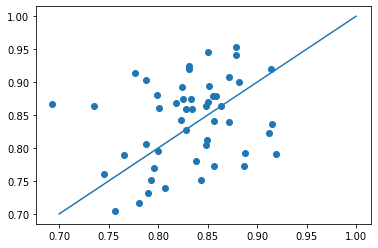

In [31]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.scatter(dense_Rsquared_scores, Rsquared_scores[50:])
plt.plot([0.7,1.0], [0.7,1.0])

## Parameter finding results

Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_1: RMSE = 0.584; R^2 = 0.885.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_2: RMSE = 0.580; R^2 = 0.886.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_3: RMSE = 0.517; R^2 = 0.909.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_4: RMSE = 0.593; R^2 = 0.881.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_5: RMSE = 0.551; R^2 = 0.897.


Model with 1 n_attention_out: RMSE = 0.585; R^2 = 0.884.
Model with 2 n_attention_out: RMSE = 0.597; R^2 = 0.880.
Model with 3 n_attention_out: RMSE = 0.577; R^2 = 0.887.
Model with 4 n_attention_out: RMSE = 0.605; R^2 = 0.876.

Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_1: RMSE = 0.584; R^2 = 0.885.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_2: RMSE = 0.580; R^2 = 0.886.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_3: RMSE = 0.517; R^2 = 0.909.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_4: RMSE = 0.593; R^2 = 0.881.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_5: RMSE = 0.551; R^2 = 0.897.


Select n_attention=10 and n_attention_out=3

Model with 1 n_attention_out: RMSE = 0.585; R^2 = 0.884.
Model with 2 n_attention_out: RMSE = 0.597; R^2 = 0.880.
Model with 3 n_attention_out: RMSE = 0.577; R^2 = 0.887.
Model with 4 n_attention_out: RMSE = 0.605; R^2 = 0.876.


In [87]:
list(ParameterGrid(param_grid))

[{'n_attention': 1, 'n_attention_out': 1},
 {'n_attention': 1, 'n_attention_out': 2},
 {'n_attention': 1, 'n_attention_out': 3},
 {'n_attention': 2, 'n_attention_out': 1},
 {'n_attention': 2, 'n_attention_out': 2},
 {'n_attention': 2, 'n_attention_out': 3},
 {'n_attention': 3, 'n_attention_out': 1},
 {'n_attention': 3, 'n_attention_out': 2},
 {'n_attention': 3, 'n_attention_out': 3},
 {'n_attention': 4, 'n_attention_out': 1},
 {'n_attention': 4, 'n_attention_out': 2},
 {'n_attention': 4, 'n_attention_out': 3}]